# Lezione 11

In questa lezione utilizziamo reti neurali per risolvere problemi di regressione e osserviamo come variano le performance al variare delle carattristiche del modello.

## 11.1

Consideriamo la funzione $f(x)= 2x +1$ e da essa costruiamo un set di dati con noise $(x_i, y_i=f(x_i)+\eta)$ con $\eta \sim \mathcal{N}(0,\sigma)$. Dividiamo il set $(x_i,y_i)$ in un training set e un test set e utilizziamo una rete neurale per eseguire un fit del training set e valutiamo la performance della rete ottimizzata sul training e  test set. 
La performace viene stimata con la funzione $E = mse = \frac{1}{N}\sum_{j=1}^{N} (y_j^\mathrm{pred}-y_j)^2$. 

Come modello utilizziamo una rete con un solo neurone, in questo modo $y^{\text{pred}}_i = \text{activation}( x_i*w+b)$. Scegliendo come funzione di attivazione $\text{activation}(x)=x$ abbiamo che il modello può rappresentare la classe delle funzione lineari. Tale modello possiede allora un numero di paramentri sufficiente per catturare la complessità dei dati ed è sufficientemente semplice da evitare l'overfitting. 

Osserviamo come variano le performance di questo modello (come variano $E_{\text{in}}$, errore sul training set, ed $E_{\text{out}}$, errore sul test set) al variare della dimensione del training set $N_{\text{train}}$, del numero di epoche $N_{\text{epochs}}$ utilizzate nel training e del paramentro $\sigma$ utilizzato per introdurre il noise.

Con lo script seguente si considerano diversi valori di $N_{\text{train}}$, $N_{\text{epochs}}$ e $\sigma$ e per ogni terna viene eseguito il training della rete e calcolata la sua performace su un test set prefissato. 
Nelle figure che seguono vengono mostrati gli andamenti delle funzioni $E_{\text{in}}(N_{\text{epochs}},\sigma)$ e $E_{\text{out}}(N_{\text{epochs}},\sigma)$ per $N_{\text{train}}=10,100,1000$. 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras import backend as K
from tensorflow.keras.utils import get_custom_objects

from mpl_toolkits.mplot3d import Axes3D


# target parameters of f(x) = m*x + b
m = 2 # slope
b = 1 # intersect

np.random.seed(0)
x_valid = np.random.uniform(-1, 1, 10)
x_valid.sort()
y_target = m * x_valid + b # ideal (target) linear function

# compose the NN model and compile
model = Sequential()
model.add(Dense(1, input_shape=(1,))) 
model.compile(optimizer='sgd', loss='mse', metrics=['mse'])
model.summary()

sigma = np.linspace(0,0.5,15)
epochs = np.array([5,10,50,100,150,200,250])
Nt = np.array([10, 100, 1000])
S,E = np.meshgrid(sigma,epochs)
Ein = np.zeros(( len(Nt), len(epochs),len(sigma) ))
Eout = np.zeros((len(Nt),  len(epochs) ,len(sigma)))


for k in range(len(Nt)):
   x_train = np.random.uniform(-1, 1, Nt[k])
   for i in range(len(sigma)):
      for j in range(len(epochs)):
      
         # generate training inputs
         y_train = np.random.normal(m * x_train + b, sigma[i])
         y_valid = np.random.normal(m * x_valid + b, sigma[i])

         #train model
         model.fit(x=x_train, y=y_train, 
            batch_size=32, epochs=epochs[j],
            shuffle=True, # a good idea is to shuffle input before at each epoch
            validation_data=(x_valid, y_valid))

         #evaluate model
         score = model.evaluate(x_valid, y_valid, batch_size=32, verbose=1)
         Eout[k,j,i] = score[0]
         score = model.evaluate(x_train, y_train, batch_size=32, verbose=1)
         Ein[k,j,i] = score[0]

         #save the model
         #filepath = "Saved/mod_sigma"+str(sigma[i])+"_epochs"+str(epochs[j])
         #model.save(filepath=filepath, include_optimizer=True)
         #print("ho finito il "+str(i*len(epochs)+j+1)+"/"+str(len(sigma)*len(epochs)))


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 1)                 2         
Total params: 2
Trainable params: 2
Non-trainable params: 0
_________________________________________________________________
Train on 10 samples, validate on 10 samples
Epoch 1/5
10/10 [==============================] - 1s 64ms/sample - loss: 4.7179 - mean_squared_error: 4.7179 - val_loss: 3.3860 - val_mean_squared_error: 3.3860
Epoch 2/5
10/10 [==============================] - 0s 599us/sample - loss: 4.5861 - mean_squared_error: 4.5861 - val_loss: 3.2726 - val_mean_squared_error: 3.2726
Epoch 3/5
10/10 [==============================] - 0s 435us/sample - loss: 4.4585 - mean_squared_error: 4.4585 - val_loss: 3.1633 - val_mean_squared_error: 3.1633
Epoch 

Epoch 28/50
10/10 [==============================] - 0s 612us/sample - loss: 1.5901 - mean_squared_error: 1.5901 - val_loss: 0.8807 - val_mean_squared_error: 0.8807
Epoch 29/50
10/10 [==============================] - 0s 814us/sample - loss: 1.5530 - mean_squared_error: 1.5530 - val_loss: 0.8548 - val_mean_squared_error: 0.8548
Epoch 30/50
10/10 [==============================] - 0s 869us/sample - loss: 1.5170 - mean_squared_error: 1.5170 - val_loss: 0.8297 - val_mean_squared_error: 0.8297
Epoch 31/50
10/10 [==============================] - 0s 567us/sample - loss: 1.4819 - mean_squared_error: 1.4819 - val_loss: 0.8055 - val_mean_squared_error: 0.8055
Epoch 32/50
10/10 [==============================] - 0s 662us/sample - loss: 1.4477 - mean_squared_error: 1.4477 - val_loss: 0.7821 - val_mean_squared_error: 0.7821
Epoch 33/50
10/10 [==============================] - 0s 666us/sample - loss: 1.4144 - mean_squared_error: 1.4144 - val_loss: 0.7594 - val_mean_squared_error: 0.7594
Epoch 34/5

Epoch 27/100
10/10 [==============================] - 0s 771us/sample - loss: 0.5460 - mean_squared_error: 0.5460 - val_loss: 0.2304 - val_mean_squared_error: 0.2304
Epoch 28/100
10/10 [==============================] - 0s 720us/sample - loss: 0.5350 - mean_squared_error: 0.5350 - val_loss: 0.2247 - val_mean_squared_error: 0.2247
Epoch 29/100
10/10 [==============================] - 0s 652us/sample - loss: 0.5243 - mean_squared_error: 0.5243 - val_loss: 0.2192 - val_mean_squared_error: 0.2192
Epoch 30/100
10/10 [==============================] - 0s 853us/sample - loss: 0.5137 - mean_squared_error: 0.5137 - val_loss: 0.2138 - val_mean_squared_error: 0.2138
Epoch 31/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.5034 - mean_squared_error: 0.5034 - val_loss: 0.2086 - val_mean_squared_error: 0.2086
Epoch 32/100
10/10 [==============================] - 0s 770us/sample - loss: 0.4934 - mean_squared_error: 0.4934 - val_loss: 0.2035 - val_mean_squared_error: 0.2035
Epoch 

Epoch 77/100
10/10 [==============================] - 0s 750us/sample - loss: 0.2049 - mean_squared_error: 0.2049 - val_loss: 0.0724 - val_mean_squared_error: 0.0724
Epoch 78/100
10/10 [==============================] - 0s 972us/sample - loss: 0.2011 - mean_squared_error: 0.2011 - val_loss: 0.0709 - val_mean_squared_error: 0.0709
Epoch 79/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.1973 - mean_squared_error: 0.1973 - val_loss: 0.0694 - val_mean_squared_error: 0.0694
Epoch 80/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.1936 - mean_squared_error: 0.1936 - val_loss: 0.0679 - val_mean_squared_error: 0.0679
Epoch 81/100
10/10 [==============================] - 0s 714us/sample - loss: 0.1899 - mean_squared_error: 0.1899 - val_loss: 0.0664 - val_mean_squared_error: 0.0664
Epoch 82/100
10/10 [==============================] - 0s 755us/sample - loss: 0.1864 - mean_squared_error: 0.1864 - val_loss: 0.0650 - val_mean_squared_error: 0.0650
Epoch 83

10/10 [==============================] - 0s 892us/sample - loss: 0.0833 - mean_squared_error: 0.0833 - val_loss: 0.0269 - val_mean_squared_error: 0.0269
Epoch 26/150
10/10 [==============================] - 0s 563us/sample - loss: 0.0817 - mean_squared_error: 0.0817 - val_loss: 0.0263 - val_mean_squared_error: 0.0263
Epoch 27/150
10/10 [==============================] - 0s 689us/sample - loss: 0.0802 - mean_squared_error: 0.0802 - val_loss: 0.0258 - val_mean_squared_error: 0.0258
Epoch 28/150
10/10 [==============================] - 0s 690us/sample - loss: 0.0788 - mean_squared_error: 0.0788 - val_loss: 0.0253 - val_mean_squared_error: 0.0253
Epoch 29/150
10/10 [==============================] - 0s 781us/sample - loss: 0.0773 - mean_squared_error: 0.0773 - val_loss: 0.0248 - val_mean_squared_error: 0.0248
Epoch 30/150
10/10 [==============================] - 0s 610us/sample - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.0243 - val_mean_squared_error: 0.0243
Epoch 31/150
10/1

Epoch 75/150
10/10 [==============================] - 0s 756us/sample - loss: 0.0331 - mean_squared_error: 0.0331 - val_loss: 0.0102 - val_mean_squared_error: 0.0102
Epoch 76/150
10/10 [==============================] - 0s 919us/sample - loss: 0.0325 - mean_squared_error: 0.0325 - val_loss: 0.0100 - val_mean_squared_error: 0.0100
Epoch 77/150
10/10 [==============================] - 0s 663us/sample - loss: 0.0319 - mean_squared_error: 0.0319 - val_loss: 0.0098 - val_mean_squared_error: 0.0098
Epoch 78/150
10/10 [==============================] - 0s 948us/sample - loss: 0.0313 - mean_squared_error: 0.0313 - val_loss: 0.0096 - val_mean_squared_error: 0.0096
Epoch 79/150
10/10 [==============================] - 0s 913us/sample - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0094 - val_mean_squared_error: 0.0094
Epoch 80/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0302 - mean_squared_error: 0.0302 - val_loss: 0.0092 - val_mean_squared_error: 0.0092
Epoch 

Epoch 125/150
10/10 [==============================] - 0s 501us/sample - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 126/150
10/10 [==============================] - 0s 981us/sample - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 127/150
10/10 [==============================] - 0s 555us/sample - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 128/150
10/10 [==============================] - 0s 534us/sample - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 129/150
10/10 [==============================] - 0s 954us/sample - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 130/150
10/10 [==============================] - 0s 590us/sample - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0036 - val_mean_squared_error: 0.003

Epoch 23/200
10/10 [==============================] - 0s 737us/sample - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 24/200
10/10 [==============================] - 0s 595us/sample - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 25/200
10/10 [==============================] - 0s 952us/sample - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 26/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 27/200
10/10 [==============================] - 0s 824us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 28/200
10/10 [==============================] - 0s 923us/sample - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 

Epoch 72/200
10/10 [==============================] - 0s 553us/sample - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 6.5531e-04 - val_mean_squared_error: 6.5531e-04
Epoch 73/200
10/10 [==============================] - 0s 900us/sample - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 6.4334e-04 - val_mean_squared_error: 6.4334e-04
Epoch 74/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0021 - mean_squared_error: 0.0021 - val_loss: 6.3159e-04 - val_mean_squared_error: 6.3159e-04
Epoch 75/200
10/10 [==============================] - 0s 519us/sample - loss: 0.0021 - mean_squared_error: 0.0021 - val_loss: 6.2006e-04 - val_mean_squared_error: 6.2006e-04
Epoch 76/200
10/10 [==============================] - 0s 607us/sample - loss: 0.0021 - mean_squared_error: 0.0021 - val_loss: 6.0874e-04 - val_mean_squared_error: 6.0874e-04
Epoch 77/200
10/10 [==============================] - 0s 840us/sample - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 5.9762

Epoch 119/200
10/10 [==============================] - 0s 785us/sample - loss: 9.4195e-04 - mean_squared_error: 9.4195e-04 - val_loss: 2.7588e-04 - val_mean_squared_error: 2.7588e-04
Epoch 120/200
10/10 [==============================] - 0s 1ms/sample - loss: 9.2485e-04 - mean_squared_error: 9.2485e-04 - val_loss: 2.7086e-04 - val_mean_squared_error: 2.7086e-04
Epoch 121/200
10/10 [==============================] - 0s 1ms/sample - loss: 9.0806e-04 - mean_squared_error: 9.0806e-04 - val_loss: 2.6592e-04 - val_mean_squared_error: 2.6592e-04
Epoch 122/200
10/10 [==============================] - 0s 653us/sample - loss: 8.9157e-04 - mean_squared_error: 8.9157e-04 - val_loss: 2.6108e-04 - val_mean_squared_error: 2.6108e-04
Epoch 123/200
10/10 [==============================] - 0s 673us/sample - loss: 8.7538e-04 - mean_squared_error: 8.7538e-04 - val_loss: 2.5632e-04 - val_mean_squared_error: 2.5632e-04
Epoch 124/200
10/10 [==============================] - 0s 866us/sample - loss: 8.5948e-04

Epoch 164/200
10/10 [==============================] - 0s 1ms/sample - loss: 4.1295e-04 - mean_squared_error: 4.1295e-04 - val_loss: 1.2069e-04 - val_mean_squared_error: 1.2069e-04
Epoch 165/200
10/10 [==============================] - 0s 997us/sample - loss: 4.0545e-04 - mean_squared_error: 4.0545e-04 - val_loss: 1.1849e-04 - val_mean_squared_error: 1.1849e-04
Epoch 166/200
10/10 [==============================] - 0s 832us/sample - loss: 3.9809e-04 - mean_squared_error: 3.9809e-04 - val_loss: 1.1634e-04 - val_mean_squared_error: 1.1634e-04
Epoch 167/200
10/10 [==============================] - 0s 924us/sample - loss: 3.9086e-04 - mean_squared_error: 3.9086e-04 - val_loss: 1.1422e-04 - val_mean_squared_error: 1.1422e-04
Epoch 168/200
10/10 [==============================] - 0s 722us/sample - loss: 3.8376e-04 - mean_squared_error: 3.8376e-04 - val_loss: 1.1214e-04 - val_mean_squared_error: 1.1214e-04
Epoch 169/200
10/10 [==============================] - 0s 1ms/sample - loss: 3.7679e-04

Epoch 8/250
10/10 [==============================] - 0s 522us/sample - loss: 1.8438e-04 - mean_squared_error: 1.8438e-04 - val_loss: 5.3819e-05 - val_mean_squared_error: 5.3819e-05
Epoch 9/250
10/10 [==============================] - 0s 503us/sample - loss: 1.8103e-04 - mean_squared_error: 1.8103e-04 - val_loss: 5.2841e-05 - val_mean_squared_error: 5.2841e-05
Epoch 10/250
10/10 [==============================] - 0s 500us/sample - loss: 1.7774e-04 - mean_squared_error: 1.7774e-04 - val_loss: 5.1880e-05 - val_mean_squared_error: 5.1880e-05
Epoch 11/250
10/10 [==============================] - 0s 895us/sample - loss: 1.7451e-04 - mean_squared_error: 1.7451e-04 - val_loss: 5.0938e-05 - val_mean_squared_error: 5.0938e-05
Epoch 12/250
10/10 [==============================] - 0s 538us/sample - loss: 1.7134e-04 - mean_squared_error: 1.7134e-04 - val_loss: 5.0012e-05 - val_mean_squared_error: 5.0012e-05
Epoch 13/250
10/10 [==============================] - 0s 563us/sample - loss: 1.6823e-04 - m

Epoch 54/250
10/10 [==============================] - 0s 783us/sample - loss: 7.9365e-05 - mean_squared_error: 7.9365e-05 - val_loss: 2.3149e-05 - val_mean_squared_error: 2.3149e-05
Epoch 55/250
10/10 [==============================] - 0s 470us/sample - loss: 7.7923e-05 - mean_squared_error: 7.7923e-05 - val_loss: 2.2728e-05 - val_mean_squared_error: 2.2728e-05
Epoch 56/250
10/10 [==============================] - 0s 714us/sample - loss: 7.6508e-05 - mean_squared_error: 7.6508e-05 - val_loss: 2.2315e-05 - val_mean_squared_error: 2.2315e-05
Epoch 57/250
10/10 [==============================] - 0s 591us/sample - loss: 7.5118e-05 - mean_squared_error: 7.5118e-05 - val_loss: 2.1909e-05 - val_mean_squared_error: 2.1909e-05
Epoch 58/250
10/10 [==============================] - 0s 721us/sample - loss: 7.3753e-05 - mean_squared_error: 7.3753e-05 - val_loss: 2.1511e-05 - val_mean_squared_error: 2.1511e-05
Epoch 59/250
10/10 [==============================] - 0s 861us/sample - loss: 7.2414e-05 -

Epoch 100/250
10/10 [==============================] - 0s 999us/sample - loss: 3.4159e-05 - mean_squared_error: 3.4159e-05 - val_loss: 9.9585e-06 - val_mean_squared_error: 9.9585e-06
Epoch 101/250
10/10 [==============================] - 0s 909us/sample - loss: 3.3539e-05 - mean_squared_error: 3.3539e-05 - val_loss: 9.7776e-06 - val_mean_squared_error: 9.7776e-06
Epoch 102/250
10/10 [==============================] - 0s 649us/sample - loss: 3.2929e-05 - mean_squared_error: 3.2929e-05 - val_loss: 9.5997e-06 - val_mean_squared_error: 9.5997e-06
Epoch 103/250
10/10 [==============================] - 0s 842us/sample - loss: 3.2331e-05 - mean_squared_error: 3.2331e-05 - val_loss: 9.4256e-06 - val_mean_squared_error: 9.4256e-06
Epoch 104/250
10/10 [==============================] - 0s 964us/sample - loss: 3.1744e-05 - mean_squared_error: 3.1744e-05 - val_loss: 9.2542e-06 - val_mean_squared_error: 9.2542e-06
Epoch 105/250
10/10 [==============================] - 0s 943us/sample - loss: 3.1167

Epoch 145/250
10/10 [==============================] - 0s 1ms/sample - loss: 1.4977e-05 - mean_squared_error: 1.4977e-05 - val_loss: 4.3652e-06 - val_mean_squared_error: 4.3652e-06
Epoch 146/250
10/10 [==============================] - 0s 1ms/sample - loss: 1.4704e-05 - mean_squared_error: 1.4704e-05 - val_loss: 4.2858e-06 - val_mean_squared_error: 4.2858e-06
Epoch 147/250
10/10 [==============================] - 0s 1ms/sample - loss: 1.4437e-05 - mean_squared_error: 1.4437e-05 - val_loss: 4.2080e-06 - val_mean_squared_error: 4.2080e-06
Epoch 148/250
10/10 [==============================] - 0s 681us/sample - loss: 1.4176e-05 - mean_squared_error: 1.4176e-05 - val_loss: 4.1318e-06 - val_mean_squared_error: 4.1318e-06
Epoch 149/250
10/10 [==============================] - 0s 592us/sample - loss: 1.3918e-05 - mean_squared_error: 1.3918e-05 - val_loss: 4.0566e-06 - val_mean_squared_error: 4.0566e-06
Epoch 150/250
10/10 [==============================] - 0s 716us/sample - loss: 1.3666e-05 -

Epoch 190/250
10/10 [==============================] - 0s 605us/sample - loss: 6.5665e-06 - mean_squared_error: 6.5665e-06 - val_loss: 1.9134e-06 - val_mean_squared_error: 1.9134e-06
Epoch 191/250
10/10 [==============================] - 0s 706us/sample - loss: 6.4474e-06 - mean_squared_error: 6.4474e-06 - val_loss: 1.8789e-06 - val_mean_squared_error: 1.8789e-06
Epoch 192/250
10/10 [==============================] - 0s 709us/sample - loss: 6.3305e-06 - mean_squared_error: 6.3305e-06 - val_loss: 1.8447e-06 - val_mean_squared_error: 1.8447e-06
Epoch 193/250
10/10 [==============================] - 0s 873us/sample - loss: 6.2153e-06 - mean_squared_error: 6.2153e-06 - val_loss: 1.8113e-06 - val_mean_squared_error: 1.8113e-06
Epoch 194/250
10/10 [==============================] - 0s 1ms/sample - loss: 6.1026e-06 - mean_squared_error: 6.1026e-06 - val_loss: 1.7784e-06 - val_mean_squared_error: 1.7784e-06
Epoch 195/250
10/10 [==============================] - 0s 947us/sample - loss: 5.9917e-

Epoch 235/250
10/10 [==============================] - 0s 509us/sample - loss: 2.8792e-06 - mean_squared_error: 2.8792e-06 - val_loss: 8.3900e-07 - val_mean_squared_error: 8.3900e-07
Epoch 236/250
10/10 [==============================] - 0s 719us/sample - loss: 2.8271e-06 - mean_squared_error: 2.8271e-06 - val_loss: 8.2366e-07 - val_mean_squared_error: 8.2366e-07
Epoch 237/250
10/10 [==============================] - 0s 549us/sample - loss: 2.7757e-06 - mean_squared_error: 2.7757e-06 - val_loss: 8.0877e-07 - val_mean_squared_error: 8.0877e-07
Epoch 238/250
10/10 [==============================] - 0s 984us/sample - loss: 2.7252e-06 - mean_squared_error: 2.7252e-06 - val_loss: 7.9406e-07 - val_mean_squared_error: 7.9406e-07
Epoch 239/250
10/10 [==============================] - 0s 482us/sample - loss: 2.6758e-06 - mean_squared_error: 2.6758e-06 - val_loss: 7.7965e-07 - val_mean_squared_error: 7.7965e-07
Epoch 240/250
10/10 [==============================] - 0s 698us/sample - loss: 2.6271

Epoch 12/50
10/10 [==============================] - 0s 655us/sample - loss: 8.3917e-04 - mean_squared_error: 8.3917e-04 - val_loss: 5.8861e-04 - val_mean_squared_error: 5.8861e-04
Epoch 13/50
10/10 [==============================] - 0s 838us/sample - loss: 8.3553e-04 - mean_squared_error: 8.3553e-04 - val_loss: 5.8858e-04 - val_mean_squared_error: 5.8858e-04
Epoch 14/50
10/10 [==============================] - 0s 560us/sample - loss: 8.3195e-04 - mean_squared_error: 8.3195e-04 - val_loss: 5.8856e-04 - val_mean_squared_error: 5.8856e-04
Epoch 15/50
10/10 [==============================] - 0s 682us/sample - loss: 8.2844e-04 - mean_squared_error: 8.2844e-04 - val_loss: 5.8855e-04 - val_mean_squared_error: 5.8855e-04
Epoch 16/50
10/10 [==============================] - 0s 521us/sample - loss: 8.2500e-04 - mean_squared_error: 8.2500e-04 - val_loss: 5.8854e-04 - val_mean_squared_error: 5.8854e-04
Epoch 17/50
10/10 [==============================] - 0s 547us/sample - loss: 8.2162e-04 - mean_

Epoch 6/100
10/10 [==============================] - 0s 531us/sample - loss: 6.5229e-04 - mean_squared_error: 6.5229e-04 - val_loss: 6.3196e-04 - val_mean_squared_error: 6.3196e-04
Epoch 7/100
10/10 [==============================] - 0s 542us/sample - loss: 6.4775e-04 - mean_squared_error: 6.4775e-04 - val_loss: 6.3741e-04 - val_mean_squared_error: 6.3741e-04
Epoch 8/100
10/10 [==============================] - 0s 620us/sample - loss: 6.4337e-04 - mean_squared_error: 6.4337e-04 - val_loss: 6.4282e-04 - val_mean_squared_error: 6.4282e-04
Epoch 9/100
10/10 [==============================] - 0s 453us/sample - loss: 6.3915e-04 - mean_squared_error: 6.3915e-04 - val_loss: 6.4822e-04 - val_mean_squared_error: 6.4822e-04
Epoch 10/100
10/10 [==============================] - 0s 900us/sample - loss: 6.3507e-04 - mean_squared_error: 6.3507e-04 - val_loss: 6.5358e-04 - val_mean_squared_error: 6.5358e-04
Epoch 11/100
10/10 [==============================] - 0s 849us/sample - loss: 6.3115e-04 - mea

Epoch 52/100
10/10 [==============================] - 0s 622us/sample - loss: 5.4746e-04 - mean_squared_error: 5.4746e-04 - val_loss: 8.3815e-04 - val_mean_squared_error: 8.3815e-04
Epoch 53/100
10/10 [==============================] - 0s 526us/sample - loss: 5.4653e-04 - mean_squared_error: 5.4653e-04 - val_loss: 8.4146e-04 - val_mean_squared_error: 8.4146e-04
Epoch 54/100
10/10 [==============================] - 0s 972us/sample - loss: 5.4563e-04 - mean_squared_error: 5.4563e-04 - val_loss: 8.4473e-04 - val_mean_squared_error: 8.4473e-04
Epoch 55/100
10/10 [==============================] - 0s 587us/sample - loss: 5.4475e-04 - mean_squared_error: 5.4475e-04 - val_loss: 8.4795e-04 - val_mean_squared_error: 8.4795e-04
Epoch 56/100
10/10 [==============================] - 0s 700us/sample - loss: 5.4391e-04 - mean_squared_error: 5.4391e-04 - val_loss: 8.5111e-04 - val_mean_squared_error: 8.5111e-04
Epoch 57/100
10/10 [==============================] - 0s 1ms/sample - loss: 5.4309e-04 - m

Epoch 98/100
10/10 [==============================] - 0s 685us/sample - loss: 5.2394e-04 - mean_squared_error: 5.2394e-04 - val_loss: 9.4839e-04 - val_mean_squared_error: 9.4839e-04
Epoch 99/100
10/10 [==============================] - 0s 989us/sample - loss: 5.2369e-04 - mean_squared_error: 5.2369e-04 - val_loss: 9.5000e-04 - val_mean_squared_error: 9.5000e-04
Epoch 100/100
10/10 [==============================] - 0s 167us/sample - loss: 5.2322e-04 - mean_squared_error: 5.2322e-04
Train on 10 samples, validate on 10 samples
Epoch 1/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 2/150
10/10 [==============================] - 0s 667us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 3/150
10/10 [==============================] - 0s 545us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mea

Epoch 46/150
10/10 [==============================] - 0s 484us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 47/150
10/10 [==============================] - 0s 904us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 48/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 49/150
10/10 [==============================] - 0s 681us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 50/150
10/10 [==============================] - 0s 421us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 51/150
10/10 [==============================] - 0s 701us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 

Epoch 96/150
10/10 [==============================] - 0s 904us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 97/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 98/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 99/150
10/10 [==============================] - 0s 612us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 100/150
10/10 [==============================] - 0s 790us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 101/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 10

Epoch 146/150
10/10 [==============================] - 0s 819us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 147/150
10/10 [==============================] - 0s 775us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 148/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 149/150
10/10 [==============================] - 0s 984us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 150/150
10/10 [==============================] - 0s 340us/sample - loss: 0.0012 - mean_squared_error: 0.0012
Train on 10 samples, validate on 10 samples
Epoch 1/200
10/10 [==============================] - 0s 994us/sample - loss: 5.7720e-04 - mean_squared_error: 5.7720e-04 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Ep

10/10 [==============================] - 0s 1ms/sample - loss: 4.9460e-04 - mean_squared_error: 4.9460e-04 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 43/200
10/10 [==============================] - 0s 1ms/sample - loss: 4.9329e-04 - mean_squared_error: 4.9329e-04 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 44/200
10/10 [==============================] - 0s 771us/sample - loss: 4.9200e-04 - mean_squared_error: 4.9200e-04 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 45/200
10/10 [==============================] - 0s 623us/sample - loss: 4.9074e-04 - mean_squared_error: 4.9074e-04 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 46/200
10/10 [==============================] - 0s 884us/sample - loss: 4.8950e-04 - mean_squared_error: 4.8950e-04 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 47/200
10/10 [==============================] - 0s 909us/sample - loss: 4.8829e-04 - mean_squared_error: 4.8829e-04 - val_loss: 0.0019 - val_

Epoch 90/200
10/10 [==============================] - 0s 752us/sample - loss: 4.5279e-04 - mean_squared_error: 4.5279e-04 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 91/200
10/10 [==============================] - 0s 747us/sample - loss: 4.5225e-04 - mean_squared_error: 4.5225e-04 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 92/200
10/10 [==============================] - 0s 858us/sample - loss: 4.5173e-04 - mean_squared_error: 4.5173e-04 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 93/200
10/10 [==============================] - 0s 861us/sample - loss: 4.5122e-04 - mean_squared_error: 4.5122e-04 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 94/200
10/10 [==============================] - 0s 671us/sample - loss: 4.5071e-04 - mean_squared_error: 4.5071e-04 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 95/200
10/10 [==============================] - 0s 816us/sample - loss: 4.5022e-04 - mean_squared_error: 4.5022e-04 - val_lo

Epoch 137/200
10/10 [==============================] - 0s 930us/sample - loss: 4.3589e-04 - mean_squared_error: 4.3589e-04 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 138/200
10/10 [==============================] - 0s 889us/sample - loss: 4.3566e-04 - mean_squared_error: 4.3566e-04 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 139/200
10/10 [==============================] - 0s 629us/sample - loss: 4.3545e-04 - mean_squared_error: 4.3545e-04 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 140/200
10/10 [==============================] - 0s 660us/sample - loss: 4.3523e-04 - mean_squared_error: 4.3523e-04 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 141/200
10/10 [==============================] - 0s 855us/sample - loss: 4.3502e-04 - mean_squared_error: 4.3502e-04 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 142/200
10/10 [==============================] - 0s 768us/sample - loss: 4.3481e-04 - mean_squared_error: 4.3481e-04 - 

Epoch 184/200
10/10 [==============================] - 0s 871us/sample - loss: 4.2878e-04 - mean_squared_error: 4.2878e-04 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 185/200
10/10 [==============================] - 0s 1ms/sample - loss: 4.2868e-04 - mean_squared_error: 4.2868e-04 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 186/200
10/10 [==============================] - 0s 1ms/sample - loss: 4.2859e-04 - mean_squared_error: 4.2859e-04 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 187/200
10/10 [==============================] - 0s 722us/sample - loss: 4.2850e-04 - mean_squared_error: 4.2850e-04 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 188/200
10/10 [==============================] - 0s 965us/sample - loss: 4.2841e-04 - mean_squared_error: 4.2841e-04 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 189/200
10/10 [==============================] - 0s 623us/sample - loss: 4.2832e-04 - mean_squared_error: 4.2832e-04 - val_

10/10 [==============================] - 0s 762us/sample - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 32/250
10/10 [==============================] - 0s 740us/sample - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 33/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 34/250
10/10 [==============================] - 0s 537us/sample - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 35/250
10/10 [==============================] - 0s 996us/sample - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 36/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 37/250
10/10 [=

Epoch 81/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 82/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 83/250
10/10 [==============================] - 0s 771us/sample - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 84/250
10/10 [==============================] - 0s 795us/sample - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 85/250
10/10 [==============================] - 0s 779us/sample - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 86/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 87/2

Epoch 131/250
10/10 [==============================] - 0s 782us/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 132/250
10/10 [==============================] - 0s 643us/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 133/250
10/10 [==============================] - 0s 908us/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 134/250
10/10 [==============================] - 0s 640us/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 135/250
10/10 [==============================] - 0s 901us/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 136/250
10/10 [==============================] - 0s 869us/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0019 - val_mean_squared_error: 0.001

Epoch 181/250
10/10 [==============================] - 0s 826us/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 182/250
10/10 [==============================] - 0s 851us/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 183/250
10/10 [==============================] - 0s 785us/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 184/250
10/10 [==============================] - 0s 562us/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 185/250
10/10 [==============================] - 0s 971us/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 186/250
10/10 [==============================] - 0s 926us/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0019 - val_mean_squared_error: 0.001

Epoch 231/250
10/10 [==============================] - 0s 767us/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 232/250
10/10 [==============================] - 0s 797us/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 233/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 234/250
10/10 [==============================] - 0s 937us/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 235/250
10/10 [==============================] - 0s 772us/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 236/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Ep

Epoch 11/50
10/10 [==============================] - 0s 1ms/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 12/50
10/10 [==============================] - 0s 559us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 13/50
10/10 [==============================] - 0s 715us/sample - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 14/50
10/10 [==============================] - 0s 956us/sample - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 15/50
10/10 [==============================] - 0s 865us/sample - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 16/50
10/10 [==============================] - 0s 775us/sample - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 17/50


Epoch 10/100
10/10 [==============================] - 0s 568us/sample - loss: 0.0029 - mean_squared_error: 0.0029 - val_loss: 0.0106 - val_mean_squared_error: 0.0106
Epoch 11/100
10/10 [==============================] - 0s 757us/sample - loss: 0.0029 - mean_squared_error: 0.0029 - val_loss: 0.0106 - val_mean_squared_error: 0.0106
Epoch 12/100
10/10 [==============================] - 0s 470us/sample - loss: 0.0029 - mean_squared_error: 0.0029 - val_loss: 0.0106 - val_mean_squared_error: 0.0106
Epoch 13/100
10/10 [==============================] - 0s 507us/sample - loss: 0.0029 - mean_squared_error: 0.0029 - val_loss: 0.0106 - val_mean_squared_error: 0.0106
Epoch 14/100
10/10 [==============================] - 0s 702us/sample - loss: 0.0029 - mean_squared_error: 0.0029 - val_loss: 0.0106 - val_mean_squared_error: 0.0106
Epoch 15/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0029 - mean_squared_error: 0.0029 - val_loss: 0.0106 - val_mean_squared_error: 0.0106
Epoch 

Epoch 60/100
10/10 [==============================] - 0s 792us/sample - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0104 - val_mean_squared_error: 0.0104
Epoch 61/100
10/10 [==============================] - 0s 880us/sample - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0104 - val_mean_squared_error: 0.0104
Epoch 62/100
10/10 [==============================] - 0s 524us/sample - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0104 - val_mean_squared_error: 0.0104
Epoch 63/100
10/10 [==============================] - 0s 892us/sample - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0104 - val_mean_squared_error: 0.0104
Epoch 64/100
10/10 [==============================] - 0s 993us/sample - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0104 - val_mean_squared_error: 0.0104
Epoch 65/100
10/10 [==============================] - 0s 907us/sample - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0104 - val_mean_squared_error: 0.0104
Epoc

Epoch 9/150
10/10 [==============================] - 0s 631us/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 10/150
10/10 [==============================] - 0s 724us/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 11/150
10/10 [==============================] - 0s 493us/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 12/150
10/10 [==============================] - 0s 662us/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 13/150
10/10 [==============================] - 0s 560us/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 14/150
10/10 [==============================] - 0s 817us/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch

Epoch 59/150
10/10 [==============================] - 0s 815us/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 60/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 61/150
10/10 [==============================] - 0s 904us/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 62/150
10/10 [==============================] - 0s 617us/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 63/150
10/10 [==============================] - 0s 614us/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 64/150
10/10 [==============================] - 0s 928us/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 

Epoch 109/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 110/150
10/10 [==============================] - 0s 751us/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 111/150
10/10 [==============================] - 0s 676us/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 112/150
10/10 [==============================] - 0s 702us/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 113/150
10/10 [==============================] - 0s 568us/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 114/150
10/10 [==============================] - 0s 783us/sample - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080


Epoch 7/200
10/10 [==============================] - 0s 744us/sample - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 8/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 9/200
10/10 [==============================] - 0s 885us/sample - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 10/200
10/10 [==============================] - 0s 945us/sample - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 11/200
10/10 [==============================] - 0s 887us/sample - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 12/200
10/10 [==============================] - 0s 748us/sample - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 13/

Epoch 57/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 58/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 59/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 60/200
10/10 [==============================] - 0s 765us/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 61/200
10/10 [==============================] - 0s 476us/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 62/200
10/10 [==============================] - 0s 761us/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 63/2

Epoch 107/200
10/10 [==============================] - 0s 822us/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 108/200
10/10 [==============================] - 0s 721us/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 109/200
10/10 [==============================] - 0s 961us/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 110/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 111/200
10/10 [==============================] - 0s 617us/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 112/200
10/10 [==============================] - 0s 883us/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.0030


Epoch 157/200
10/10 [==============================] - 0s 594us/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 158/200
10/10 [==============================] - 0s 612us/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 159/200
10/10 [==============================] - 0s 422us/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 160/200
10/10 [==============================] - 0s 517us/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 161/200
10/10 [==============================] - 0s 749us/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 162/200
10/10 [==============================] - 0s 496us/sample - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0030 - val_mean_squared_error: 0.003

Epoch 5/250
10/10 [==============================] - 0s 583us/sample - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 6/250
10/10 [==============================] - 0s 799us/sample - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 7/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 8/250
10/10 [==============================] - 0s 985us/sample - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 9/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 10/250
10/10 [==============================] - 0s 742us/sample - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 11/250


Epoch 55/250
10/10 [==============================] - 0s 750us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 56/250
10/10 [==============================] - 0s 894us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 57/250
10/10 [==============================] - 0s 771us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 58/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 59/250
10/10 [==============================] - 0s 879us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 60/250
10/10 [==============================] - 0s 605us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 

Epoch 105/250
10/10 [==============================] - 0s 674us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 106/250
10/10 [==============================] - 0s 693us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 107/250
10/10 [==============================] - 0s 608us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 108/250
10/10 [==============================] - 0s 844us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 109/250
10/10 [==============================] - 0s 865us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 110/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0034 - val_mean_squared_error: 0.0034


Epoch 155/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 156/250
10/10 [==============================] - 0s 723us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 157/250
10/10 [==============================] - 0s 911us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 158/250
10/10 [==============================] - 0s 714us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 159/250
10/10 [==============================] - 0s 688us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 160/250
10/10 [==============================] - 0s 802us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0034 - val_mean_squared_error: 0.0034


Epoch 205/250
10/10 [==============================] - 0s 726us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 206/250
10/10 [==============================] - 0s 556us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 207/250
10/10 [==============================] - 0s 807us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 208/250
10/10 [==============================] - 0s 847us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 209/250
10/10 [==============================] - 0s 809us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 210/250
10/10 [==============================] - 0s 962us/sample - loss: 0.0015 - mean_squared_error: 0.0015 - val_loss: 0.0034 - val_mean_squared_error: 0.003

Epoch 3/5
10/10 [==============================] - 0s 556us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 4/5
10/10 [==============================] - 0s 991us/sample - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0106 - val_mean_squared_error: 0.0106
Epoch 5/5
10/10 [==============================] - 0s 117us/sample - loss: 0.0139 - mean_squared_error: 0.0139
Train on 10 samples, validate on 10 samples
Epoch 1/10
10/10 [==============================] - 0s 577us/sample - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0156 - val_mean_squared_error: 0.0156
Epoch 2/10
10/10 [==============================] - 0s 783us/sample - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0157 - val_mean_squared_error: 0.0157
Epoch 3/10
10/10 [==============================] - 0s 769us/sample - loss: 0.0219 - mean_squared_error: 0.0219 - val_loss: 0.0158 - val_mean_squared_error: 0.0158
Epoch 4/10
10/10 [=========

Epoch 35/50
10/10 [==============================] - 0s 712us/sample - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0069 - val_mean_squared_error: 0.0069
Epoch 36/50
10/10 [==============================] - 0s 801us/sample - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0069 - val_mean_squared_error: 0.0069
Epoch 37/50
10/10 [==============================] - 0s 856us/sample - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0069 - val_mean_squared_error: 0.0069
Epoch 38/50
10/10 [==============================] - 0s 961us/sample - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0069 - val_mean_squared_error: 0.0069
Epoch 39/50
10/10 [==============================] - 0s 958us/sample - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0069 - val_mean_squared_error: 0.0069
Epoch 40/50
10/10 [==============================] - 0s 1ms/sample - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0069 - val_mean_squared_error: 0.0069
Epoch 41/50


Epoch 34/100
10/10 [==============================] - 0s 881us/sample - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0106 - val_mean_squared_error: 0.0106
Epoch 35/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0106 - val_mean_squared_error: 0.0106
Epoch 36/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0107 - val_mean_squared_error: 0.0107
Epoch 37/100
10/10 [==============================] - 0s 778us/sample - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0107 - val_mean_squared_error: 0.0107
Epoch 38/100
10/10 [==============================] - 0s 790us/sample - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 39/100
10/10 [==============================] - 0s 778us/sample - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 40

Epoch 84/100
10/10 [==============================] - 0s 569us/sample - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0121 - val_mean_squared_error: 0.0121
Epoch 85/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0121 - val_mean_squared_error: 0.0121
Epoch 86/100
10/10 [==============================] - 0s 826us/sample - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0122 - val_mean_squared_error: 0.0122
Epoch 87/100
10/10 [==============================] - 0s 767us/sample - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0122 - val_mean_squared_error: 0.0122
Epoch 88/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0122 - val_mean_squared_error: 0.0122
Epoch 89/100
10/10 [==============================] - 0s 678us/sample - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0122 - val_mean_squared_error: 0.0122
Epoch 90

10/10 [==============================] - 0s 1ms/sample - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 33/150
10/10 [==============================] - 0s 547us/sample - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0161 - val_mean_squared_error: 0.0161
Epoch 34/150
10/10 [==============================] - 0s 913us/sample - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0161 - val_mean_squared_error: 0.0161
Epoch 35/150
10/10 [==============================] - 0s 773us/sample - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0160 - val_mean_squared_error: 0.0160
Epoch 36/150
10/10 [==============================] - 0s 939us/sample - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0160 - val_mean_squared_error: 0.0160
Epoch 37/150
10/10 [==============================] - 0s 590us/sample - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0160 - val_mean_squared_error: 0.0160
Epoch 38/150
10/10 

Epoch 82/150
10/10 [==============================] - 0s 858us/sample - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0148 - val_mean_squared_error: 0.0148
Epoch 83/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0148 - val_mean_squared_error: 0.0148
Epoch 84/150
10/10 [==============================] - 0s 672us/sample - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0148 - val_mean_squared_error: 0.0148
Epoch 85/150
10/10 [==============================] - 0s 906us/sample - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0148 - val_mean_squared_error: 0.0148
Epoch 86/150
10/10 [==============================] - 0s 734us/sample - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0147 - val_mean_squared_error: 0.0147
Epoch 87/150
10/10 [==============================] - 0s 702us/sample - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0147 - val_mean_squared_error: 0.0147
Epoch 

Epoch 132/150
10/10 [==============================] - 0s 686us/sample - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0144 - val_mean_squared_error: 0.0144
Epoch 133/150
10/10 [==============================] - 0s 754us/sample - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0144 - val_mean_squared_error: 0.0144
Epoch 134/150
10/10 [==============================] - 0s 786us/sample - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0144 - val_mean_squared_error: 0.0144
Epoch 135/150
10/10 [==============================] - 0s 754us/sample - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0144 - val_mean_squared_error: 0.0144
Epoch 136/150
10/10 [==============================] - 0s 964us/sample - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0144 - val_mean_squared_error: 0.0144
Epoch 137/150
10/10 [==============================] - 0s 976us/sample - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0143 - val_mean_squared_error: 0.014

Epoch 30/200
10/10 [==============================] - 0s 696us/sample - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.0070 - val_mean_squared_error: 0.0070
Epoch 31/200
10/10 [==============================] - 0s 823us/sample - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.0071 - val_mean_squared_error: 0.0071
Epoch 32/200
10/10 [==============================] - 0s 727us/sample - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0071 - val_mean_squared_error: 0.0071
Epoch 33/200
10/10 [==============================] - 0s 427us/sample - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0071 - val_mean_squared_error: 0.0071
Epoch 34/200
10/10 [==============================] - 0s 477us/sample - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0071 - val_mean_squared_error: 0.0071
Epoch 35/200
10/10 [==============================] - 0s 525us/sample - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0071 - val_mean_squared_error: 0.0071
Epoc

Epoch 80/200
10/10 [==============================] - 0s 799us/sample - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0078 - val_mean_squared_error: 0.0078
Epoch 81/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0078 - val_mean_squared_error: 0.0078
Epoch 82/200
10/10 [==============================] - 0s 860us/sample - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0078 - val_mean_squared_error: 0.0078
Epoch 83/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0078 - val_mean_squared_error: 0.0078
Epoch 84/200
10/10 [==============================] - 0s 990us/sample - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0078 - val_mean_squared_error: 0.0078
Epoch 85/200
10/10 [==============================] - 0s 577us/sample - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0078 - val_mean_squared_error: 0.0078
Epoch 86

Epoch 130/200
10/10 [==============================] - 0s 703us/sample - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0082 - val_mean_squared_error: 0.0082
Epoch 131/200
10/10 [==============================] - 0s 475us/sample - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0082 - val_mean_squared_error: 0.0082
Epoch 132/200
10/10 [==============================] - 0s 540us/sample - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0082 - val_mean_squared_error: 0.0082
Epoch 133/200
10/10 [==============================] - 0s 624us/sample - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0082 - val_mean_squared_error: 0.0082
Epoch 134/200
10/10 [==============================] - 0s 933us/sample - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0082 - val_mean_squared_error: 0.0082
Epoch 135/200
10/10 [==============================] - 0s 816us/sample - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0082 - val_mean_squared_error: 0.008

Epoch 180/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0084 - val_mean_squared_error: 0.0084
Epoch 181/200
10/10 [==============================] - 0s 639us/sample - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0084 - val_mean_squared_error: 0.0084
Epoch 182/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0084 - val_mean_squared_error: 0.0084
Epoch 183/200
10/10 [==============================] - 0s 839us/sample - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0084 - val_mean_squared_error: 0.0084
Epoch 184/200
10/10 [==============================] - 0s 867us/sample - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Epoch 185/200
10/10 [==============================] - 0s 824us/sample - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Ep

Epoch 28/250
10/10 [==============================] - 0s 742us/sample - loss: 0.0085 - mean_squared_error: 0.0085 - val_loss: 0.0167 - val_mean_squared_error: 0.0167
Epoch 29/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0085 - mean_squared_error: 0.0085 - val_loss: 0.0166 - val_mean_squared_error: 0.0166
Epoch 30/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0085 - mean_squared_error: 0.0085 - val_loss: 0.0166 - val_mean_squared_error: 0.0166
Epoch 31/250
10/10 [==============================] - 0s 793us/sample - loss: 0.0085 - mean_squared_error: 0.0085 - val_loss: 0.0166 - val_mean_squared_error: 0.0166
Epoch 32/250
10/10 [==============================] - 0s 639us/sample - loss: 0.0085 - mean_squared_error: 0.0085 - val_loss: 0.0166 - val_mean_squared_error: 0.0166
Epoch 33/250
10/10 [==============================] - 0s 654us/sample - loss: 0.0085 - mean_squared_error: 0.0085 - val_loss: 0.0166 - val_mean_squared_error: 0.0166
Epoch 34

Epoch 78/250
10/10 [==============================] - 0s 961us/sample - loss: 0.0082 - mean_squared_error: 0.0082 - val_loss: 0.0164 - val_mean_squared_error: 0.0164
Epoch 79/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0082 - mean_squared_error: 0.0082 - val_loss: 0.0164 - val_mean_squared_error: 0.0164
Epoch 80/250
10/10 [==============================] - 0s 813us/sample - loss: 0.0082 - mean_squared_error: 0.0082 - val_loss: 0.0164 - val_mean_squared_error: 0.0164
Epoch 81/250
10/10 [==============================] - 0s 964us/sample - loss: 0.0082 - mean_squared_error: 0.0082 - val_loss: 0.0164 - val_mean_squared_error: 0.0164
Epoch 82/250
10/10 [==============================] - 0s 947us/sample - loss: 0.0082 - mean_squared_error: 0.0082 - val_loss: 0.0164 - val_mean_squared_error: 0.0164
Epoch 83/250
10/10 [==============================] - 0s 2ms/sample - loss: 0.0082 - mean_squared_error: 0.0082 - val_loss: 0.0164 - val_mean_squared_error: 0.0164
Epoch 84

Epoch 128/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0163 - val_mean_squared_error: 0.0163
Epoch 129/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0163 - val_mean_squared_error: 0.0163
Epoch 130/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0163 - val_mean_squared_error: 0.0163
Epoch 131/250
10/10 [==============================] - 0s 970us/sample - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0163 - val_mean_squared_error: 0.0163
Epoch 132/250
10/10 [==============================] - 0s 701us/sample - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0163 - val_mean_squared_error: 0.0163
Epoch 133/250
10/10 [==============================] - 0s 970us/sample - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0163 - val_mean_squared_error: 0.0163
Epoc

Epoch 178/250
10/10 [==============================] - 0s 875us/sample - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0163 - val_mean_squared_error: 0.0163
Epoch 179/250
10/10 [==============================] - 0s 677us/sample - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0163 - val_mean_squared_error: 0.0163
Epoch 180/250
10/10 [==============================] - 0s 666us/sample - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0163 - val_mean_squared_error: 0.0163
Epoch 181/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0163 - val_mean_squared_error: 0.0163
Epoch 182/250
10/10 [==============================] - 0s 627us/sample - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0163 - val_mean_squared_error: 0.0163
Epoch 183/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0163 - val_mean_squared_error: 0.0163
Ep

Epoch 228/250
10/10 [==============================] - 0s 524us/sample - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 229/250
10/10 [==============================] - 0s 827us/sample - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 230/250
10/10 [==============================] - 0s 745us/sample - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 231/250
10/10 [==============================] - 0s 934us/sample - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 232/250
10/10 [==============================] - 0s 746us/sample - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 233/250
10/10 [==============================] - 0s 966us/sample - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0162 - val_mean_squared_error: 0.016

Epoch 9/50
10/10 [==============================] - 0s 583us/sample - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0241 - val_mean_squared_error: 0.0241
Epoch 10/50
10/10 [==============================] - 0s 797us/sample - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0241 - val_mean_squared_error: 0.0241
Epoch 11/50
10/10 [==============================] - 0s 931us/sample - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0242 - val_mean_squared_error: 0.0242
Epoch 12/50
10/10 [==============================] - 0s 991us/sample - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0242 - val_mean_squared_error: 0.0242
Epoch 13/50
10/10 [==============================] - 0s 1ms/sample - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0242 - val_mean_squared_error: 0.0242
Epoch 14/50
10/10 [==============================] - 0s 866us/sample - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0243 - val_mean_squared_error: 0.0243
Epoch 15/50
1

Epoch 8/100
10/10 [==============================] - 0s 526us/sample - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0273 - val_mean_squared_error: 0.0273
Epoch 9/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0271 - val_mean_squared_error: 0.0271
Epoch 10/100
10/10 [==============================] - 0s 716us/sample - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0269 - val_mean_squared_error: 0.0269
Epoch 11/100
10/10 [==============================] - 0s 932us/sample - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0268 - val_mean_squared_error: 0.0268
Epoch 12/100
10/10 [==============================] - 0s 678us/sample - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0266 - val_mean_squared_error: 0.0266
Epoch 13/100
10/10 [==============================] - 0s 641us/sample - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0264 - val_mean_squared_error: 0.0264
Epoch 14

Epoch 58/100
10/10 [==============================] - 0s 544us/sample - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0226 - val_mean_squared_error: 0.0226
Epoch 59/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0226 - val_mean_squared_error: 0.0226
Epoch 60/100
10/10 [==============================] - 0s 994us/sample - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0225 - val_mean_squared_error: 0.0225
Epoch 61/100
10/10 [==============================] - 0s 723us/sample - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0225 - val_mean_squared_error: 0.0225
Epoch 62/100
10/10 [==============================] - 0s 941us/sample - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0224 - val_mean_squared_error: 0.0224
Epoch 63/100
10/10 [==============================] - 0s 582us/sample - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0224 - val_mean_squared_error: 0.0224
Epoch 

10/10 [==============================] - 0s 535us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0250 - val_mean_squared_error: 0.0250
Epoch 7/150
10/10 [==============================] - 0s 989us/sample - loss: 0.0211 - mean_squared_error: 0.0211 - val_loss: 0.0248 - val_mean_squared_error: 0.0248
Epoch 8/150
10/10 [==============================] - 0s 642us/sample - loss: 0.0210 - mean_squared_error: 0.0210 - val_loss: 0.0246 - val_mean_squared_error: 0.0246
Epoch 9/150
10/10 [==============================] - 0s 761us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0244 - val_mean_squared_error: 0.0244
Epoch 10/150
10/10 [==============================] - 0s 491us/sample - loss: 0.0208 - mean_squared_error: 0.0208 - val_loss: 0.0241 - val_mean_squared_error: 0.0241
Epoch 11/150
10/10 [==============================] - 0s 946us/sample - loss: 0.0206 - mean_squared_error: 0.0206 - val_loss: 0.0239 - val_mean_squared_error: 0.0239
Epoch 12/150
10/10 [

Epoch 56/150
10/10 [==============================] - 0s 875us/sample - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0190 - val_mean_squared_error: 0.0190
Epoch 57/150
10/10 [==============================] - 0s 701us/sample - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0189 - val_mean_squared_error: 0.0189
Epoch 58/150
10/10 [==============================] - 0s 596us/sample - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0189 - val_mean_squared_error: 0.0189
Epoch 59/150
10/10 [==============================] - 0s 937us/sample - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0188 - val_mean_squared_error: 0.0188
Epoch 60/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0188 - val_mean_squared_error: 0.0188
Epoch 61/150
10/10 [==============================] - 0s 712us/sample - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0187 - val_mean_squared_error: 0.0187
Epoch 

Epoch 106/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0174 - val_mean_squared_error: 0.0174
Epoch 107/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0174 - val_mean_squared_error: 0.0174
Epoch 108/150
10/10 [==============================] - 0s 924us/sample - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0174 - val_mean_squared_error: 0.0174
Epoch 109/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0174 - val_mean_squared_error: 0.0174
Epoch 110/150
10/10 [==============================] - 0s 676us/sample - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0174 - val_mean_squared_error: 0.0174
Epoch 111/150
10/10 [==============================] - 0s 713us/sample - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.0174 - val_mean_squared_error: 0.0174
Epoc

Epoch 4/200
10/10 [==============================] - 0s 987us/sample - loss: 0.0235 - mean_squared_error: 0.0235 - val_loss: 0.0222 - val_mean_squared_error: 0.0222
Epoch 5/200
10/10 [==============================] - 0s 919us/sample - loss: 0.0229 - mean_squared_error: 0.0229 - val_loss: 0.0223 - val_mean_squared_error: 0.0223
Epoch 6/200
10/10 [==============================] - 0s 583us/sample - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0223 - val_mean_squared_error: 0.0223
Epoch 7/200
10/10 [==============================] - 0s 672us/sample - loss: 0.0218 - mean_squared_error: 0.0218 - val_loss: 0.0223 - val_mean_squared_error: 0.0223
Epoch 8/200
10/10 [==============================] - 0s 776us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0224 - val_mean_squared_error: 0.0224
Epoch 9/200
10/10 [==============================] - 0s 965us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0225 - val_mean_squared_error: 0.0225
Epoch 10/2

Epoch 54/200
10/10 [==============================] - 0s 888us/sample - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0288 - val_mean_squared_error: 0.0288
Epoch 55/200
10/10 [==============================] - 0s 806us/sample - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0289 - val_mean_squared_error: 0.0289
Epoch 56/200
10/10 [==============================] - 0s 846us/sample - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0291 - val_mean_squared_error: 0.0291
Epoch 57/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0292 - val_mean_squared_error: 0.0292
Epoch 58/200
10/10 [==============================] - 0s 889us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0294 - val_mean_squared_error: 0.0294
Epoch 59/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0295 - val_mean_squared_error: 0.0295
Epoch 60

Epoch 104/200
10/10 [==============================] - 0s 767us/sample - loss: 0.0086 - mean_squared_error: 0.0086 - val_loss: 0.0341 - val_mean_squared_error: 0.0341
Epoch 105/200
10/10 [==============================] - 0s 802us/sample - loss: 0.0086 - mean_squared_error: 0.0086 - val_loss: 0.0342 - val_mean_squared_error: 0.0342
Epoch 106/200
10/10 [==============================] - 0s 993us/sample - loss: 0.0086 - mean_squared_error: 0.0086 - val_loss: 0.0343 - val_mean_squared_error: 0.0343
Epoch 107/200
10/10 [==============================] - 0s 764us/sample - loss: 0.0086 - mean_squared_error: 0.0086 - val_loss: 0.0343 - val_mean_squared_error: 0.0343
Epoch 108/200
10/10 [==============================] - 0s 462us/sample - loss: 0.0086 - mean_squared_error: 0.0086 - val_loss: 0.0344 - val_mean_squared_error: 0.0344
Epoch 109/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0086 - mean_squared_error: 0.0086 - val_loss: 0.0345 - val_mean_squared_error: 0.0345


Epoch 154/200
10/10 [==============================] - 0s 852us/sample - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0364 - val_mean_squared_error: 0.0364
Epoch 155/200
10/10 [==============================] - 0s 934us/sample - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0365 - val_mean_squared_error: 0.0365
Epoch 156/200
10/10 [==============================] - 0s 614us/sample - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0365 - val_mean_squared_error: 0.0365
Epoch 157/200
10/10 [==============================] - 0s 856us/sample - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0365 - val_mean_squared_error: 0.0365
Epoch 158/200
10/10 [==============================] - 0s 768us/sample - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0366 - val_mean_squared_error: 0.0366
Epoch 159/200
10/10 [==============================] - 0s 955us/sample - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0366 - val_mean_squared_error: 0.036

Epoch 2/250
10/10 [==============================] - 0s 737us/sample - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 3/250
10/10 [==============================] - 0s 658us/sample - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0492 - val_mean_squared_error: 0.0492
Epoch 4/250
10/10 [==============================] - 0s 471us/sample - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0491 - val_mean_squared_error: 0.0491
Epoch 5/250
10/10 [==============================] - 0s 500us/sample - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 6/250
10/10 [==============================] - 0s 534us/sample - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 7/250
10/10 [==============================] - 0s 955us/sample - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 8/25

Epoch 52/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0466 - val_mean_squared_error: 0.0466
Epoch 53/250
10/10 [==============================] - 0s 725us/sample - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0465 - val_mean_squared_error: 0.0465
Epoch 54/250
10/10 [==============================] - 0s 716us/sample - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0465 - val_mean_squared_error: 0.0465
Epoch 55/250
10/10 [==============================] - 0s 907us/sample - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0465 - val_mean_squared_error: 0.0465
Epoch 56/250
10/10 [==============================] - 0s 890us/sample - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0464 - val_mean_squared_error: 0.0464
Epoch 57/250
10/10 [==============================] - 0s 682us/sample - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0464 - val_mean_squared_error: 0.0464
Epoch 

Epoch 102/250
10/10 [==============================] - 0s 859us/sample - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 103/250
10/10 [==============================] - 0s 995us/sample - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 104/250
10/10 [==============================] - 0s 712us/sample - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0455 - val_mean_squared_error: 0.0455
Epoch 105/250
10/10 [==============================] - 0s 836us/sample - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0455 - val_mean_squared_error: 0.0455
Epoch 106/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0455 - val_mean_squared_error: 0.0455
Epoch 107/250
10/10 [==============================] - 0s 606us/sample - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0455 - val_mean_squared_error: 0.0455


Epoch 152/250
10/10 [==============================] - 0s 765us/sample - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 153/250
10/10 [==============================] - 0s 828us/sample - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 154/250
10/10 [==============================] - 0s 668us/sample - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 155/250
10/10 [==============================] - 0s 813us/sample - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 156/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 157/250
10/10 [==============================] - 0s 940us/sample - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0452 - val_mean_squared_error: 0.0452


Epoch 202/250
10/10 [==============================] - 0s 788us/sample - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0450 - val_mean_squared_error: 0.0450
Epoch 203/250
10/10 [==============================] - 0s 789us/sample - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0450 - val_mean_squared_error: 0.0450
Epoch 204/250
10/10 [==============================] - 0s 535us/sample - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0450 - val_mean_squared_error: 0.0450
Epoch 205/250
10/10 [==============================] - 0s 576us/sample - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0450 - val_mean_squared_error: 0.0450
Epoch 206/250
10/10 [==============================] - 0s 689us/sample - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0450 - val_mean_squared_error: 0.0450
Epoch 207/250
10/10 [==============================] - 0s 666us/sample - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0450 - val_mean_squared_error: 0.045

10/10 [==============================] - 0s 79us/sample - loss: 0.0177 - mean_squared_error: 0.0177
Train on 10 samples, validate on 10 samples
Epoch 1/5
10/10 [==============================] - 0s 1ms/sample - loss: 0.0879 - mean_squared_error: 0.0879 - val_loss: 0.0227 - val_mean_squared_error: 0.0227
Epoch 2/5
10/10 [==============================] - 0s 782us/sample - loss: 0.0859 - mean_squared_error: 0.0859 - val_loss: 0.0220 - val_mean_squared_error: 0.0220
Epoch 3/5
10/10 [==============================] - 0s 975us/sample - loss: 0.0840 - mean_squared_error: 0.0840 - val_loss: 0.0213 - val_mean_squared_error: 0.0213
Epoch 4/5
10/10 [==============================] - 0s 880us/sample - loss: 0.0822 - mean_squared_error: 0.0822 - val_loss: 0.0207 - val_mean_squared_error: 0.0207
Epoch 5/5
10/10 [==============================] - 0s 104us/sample - loss: 0.0788 - mean_squared_error: 0.0788
Train on 10 samples, validate on 10 samples
Epoch 1/10
10/10 [==============================] -

Epoch 33/50
10/10 [==============================] - 0s 505us/sample - loss: 0.0703 - mean_squared_error: 0.0703 - val_loss: 0.0424 - val_mean_squared_error: 0.0424
Epoch 34/50
10/10 [==============================] - 0s 788us/sample - loss: 0.0702 - mean_squared_error: 0.0702 - val_loss: 0.0424 - val_mean_squared_error: 0.0424
Epoch 35/50
10/10 [==============================] - 0s 675us/sample - loss: 0.0701 - mean_squared_error: 0.0701 - val_loss: 0.0424 - val_mean_squared_error: 0.0424
Epoch 36/50
10/10 [==============================] - 0s 1ms/sample - loss: 0.0700 - mean_squared_error: 0.0700 - val_loss: 0.0423 - val_mean_squared_error: 0.0423
Epoch 37/50
10/10 [==============================] - 0s 1ms/sample - loss: 0.0700 - mean_squared_error: 0.0700 - val_loss: 0.0423 - val_mean_squared_error: 0.0423
Epoch 38/50
10/10 [==============================] - 0s 800us/sample - loss: 0.0699 - mean_squared_error: 0.0699 - val_loss: 0.0423 - val_mean_squared_error: 0.0423
Epoch 39/50
10

Epoch 32/100
10/10 [==============================] - 0s 772us/sample - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0088 - val_mean_squared_error: 0.0088
Epoch 33/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0088 - val_mean_squared_error: 0.0088
Epoch 34/100
10/10 [==============================] - 0s 708us/sample - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0088 - val_mean_squared_error: 0.0088
Epoch 35/100
10/10 [==============================] - 0s 777us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0088 - val_mean_squared_error: 0.0088
Epoch 36/100
10/10 [==============================] - 0s 775us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0088 - val_mean_squared_error: 0.0088
Epoch 37/100
10/10 [==============================] - 0s 676us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0089 - val_mean_squared_error: 0.0089
Epoch 

Epoch 82/100
10/10 [==============================] - 0s 676us/sample - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0097 - val_mean_squared_error: 0.0097
Epoch 83/100
10/10 [==============================] - 0s 720us/sample - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0097 - val_mean_squared_error: 0.0097
Epoch 84/100
10/10 [==============================] - 0s 550us/sample - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0097 - val_mean_squared_error: 0.0097
Epoch 85/100
10/10 [==============================] - 0s 938us/sample - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0097 - val_mean_squared_error: 0.0097
Epoch 86/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0097 - val_mean_squared_error: 0.0097
Epoch 87/100
10/10 [==============================] - 0s 693us/sample - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0097 - val_mean_squared_error: 0.0097
Epoch 

10/10 [==============================] - 0s 809us/sample - loss: 0.0243 - mean_squared_error: 0.0243 - val_loss: 0.0378 - val_mean_squared_error: 0.0378
Epoch 31/150
10/10 [==============================] - 0s 887us/sample - loss: 0.0242 - mean_squared_error: 0.0242 - val_loss: 0.0378 - val_mean_squared_error: 0.0378
Epoch 32/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0242 - mean_squared_error: 0.0242 - val_loss: 0.0379 - val_mean_squared_error: 0.0379
Epoch 33/150
10/10 [==============================] - 0s 983us/sample - loss: 0.0241 - mean_squared_error: 0.0241 - val_loss: 0.0379 - val_mean_squared_error: 0.0379
Epoch 34/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0240 - mean_squared_error: 0.0240 - val_loss: 0.0379 - val_mean_squared_error: 0.0379
Epoch 35/150
10/10 [==============================] - 0s 919us/sample - loss: 0.0239 - mean_squared_error: 0.0239 - val_loss: 0.0380 - val_mean_squared_error: 0.0380
Epoch 36/150
10/10 [=

Epoch 80/150
10/10 [==============================] - 0s 910us/sample - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0398 - val_mean_squared_error: 0.0398
Epoch 81/150
10/10 [==============================] - 0s 953us/sample - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0398 - val_mean_squared_error: 0.0398
Epoch 82/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0398 - val_mean_squared_error: 0.0398
Epoch 83/150
10/10 [==============================] - 0s 927us/sample - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0399 - val_mean_squared_error: 0.0399
Epoch 84/150
10/10 [==============================] - 0s 811us/sample - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0399 - val_mean_squared_error: 0.0399
Epoch 85/150
10/10 [==============================] - 0s 801us/sample - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0399 - val_mean_squared_error: 0.0399
Epoch 

Epoch 130/150
10/10 [==============================] - 0s 829us/sample - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0409 - val_mean_squared_error: 0.0409
Epoch 131/150
10/10 [==============================] - 0s 756us/sample - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0409 - val_mean_squared_error: 0.0409
Epoch 132/150
10/10 [==============================] - 0s 659us/sample - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0409 - val_mean_squared_error: 0.0409
Epoch 133/150
10/10 [==============================] - 0s 730us/sample - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0409 - val_mean_squared_error: 0.0409
Epoch 134/150
10/10 [==============================] - 0s 623us/sample - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0409 - val_mean_squared_error: 0.0409
Epoch 135/150
10/10 [==============================] - 0s 589us/sample - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0409 - val_mean_squared_error: 0.040

Epoch 28/200
10/10 [==============================] - 0s 830us/sample - loss: 0.0493 - mean_squared_error: 0.0493 - val_loss: 0.0221 - val_mean_squared_error: 0.0221
Epoch 29/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0220 - val_mean_squared_error: 0.0220
Epoch 30/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0491 - mean_squared_error: 0.0491 - val_loss: 0.0220 - val_mean_squared_error: 0.0220
Epoch 31/200
10/10 [==============================] - 0s 736us/sample - loss: 0.0489 - mean_squared_error: 0.0489 - val_loss: 0.0219 - val_mean_squared_error: 0.0219
Epoch 32/200
10/10 [==============================] - 0s 901us/sample - loss: 0.0488 - mean_squared_error: 0.0488 - val_loss: 0.0219 - val_mean_squared_error: 0.0219
Epoch 33/200
10/10 [==============================] - 0s 998us/sample - loss: 0.0487 - mean_squared_error: 0.0487 - val_loss: 0.0218 - val_mean_squared_error: 0.0218
Epoch 34

Epoch 78/200
10/10 [==============================] - 0s 976us/sample - loss: 0.0453 - mean_squared_error: 0.0453 - val_loss: 0.0208 - val_mean_squared_error: 0.0208
Epoch 79/200
10/10 [==============================] - 0s 571us/sample - loss: 0.0453 - mean_squared_error: 0.0453 - val_loss: 0.0208 - val_mean_squared_error: 0.0208
Epoch 80/200
10/10 [==============================] - 0s 727us/sample - loss: 0.0452 - mean_squared_error: 0.0452 - val_loss: 0.0207 - val_mean_squared_error: 0.0207
Epoch 81/200
10/10 [==============================] - 0s 778us/sample - loss: 0.0452 - mean_squared_error: 0.0452 - val_loss: 0.0207 - val_mean_squared_error: 0.0207
Epoch 82/200
10/10 [==============================] - 0s 648us/sample - loss: 0.0451 - mean_squared_error: 0.0451 - val_loss: 0.0207 - val_mean_squared_error: 0.0207
Epoch 83/200
10/10 [==============================] - 0s 615us/sample - loss: 0.0451 - mean_squared_error: 0.0451 - val_loss: 0.0207 - val_mean_squared_error: 0.0207
Epoc

Epoch 128/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0439 - mean_squared_error: 0.0439 - val_loss: 0.0206 - val_mean_squared_error: 0.0206
Epoch 129/200
10/10 [==============================] - 0s 725us/sample - loss: 0.0438 - mean_squared_error: 0.0438 - val_loss: 0.0206 - val_mean_squared_error: 0.0206
Epoch 130/200
10/10 [==============================] - 0s 696us/sample - loss: 0.0438 - mean_squared_error: 0.0438 - val_loss: 0.0206 - val_mean_squared_error: 0.0206
Epoch 131/200
10/10 [==============================] - 0s 555us/sample - loss: 0.0438 - mean_squared_error: 0.0438 - val_loss: 0.0206 - val_mean_squared_error: 0.0206
Epoch 132/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0438 - mean_squared_error: 0.0438 - val_loss: 0.0206 - val_mean_squared_error: 0.0206
Epoch 133/200
10/10 [==============================] - 0s 746us/sample - loss: 0.0438 - mean_squared_error: 0.0438 - val_loss: 0.0206 - val_mean_squared_error: 0.0206
Ep

Epoch 178/200
10/10 [==============================] - 0s 843us/sample - loss: 0.0433 - mean_squared_error: 0.0433 - val_loss: 0.0207 - val_mean_squared_error: 0.0207
Epoch 179/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0433 - mean_squared_error: 0.0433 - val_loss: 0.0208 - val_mean_squared_error: 0.0208
Epoch 180/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0433 - mean_squared_error: 0.0433 - val_loss: 0.0208 - val_mean_squared_error: 0.0208
Epoch 181/200
10/10 [==============================] - 0s 621us/sample - loss: 0.0433 - mean_squared_error: 0.0433 - val_loss: 0.0208 - val_mean_squared_error: 0.0208
Epoch 182/200
10/10 [==============================] - 0s 801us/sample - loss: 0.0433 - mean_squared_error: 0.0433 - val_loss: 0.0208 - val_mean_squared_error: 0.0208
Epoch 183/200
10/10 [==============================] - 0s 885us/sample - loss: 0.0433 - mean_squared_error: 0.0433 - val_loss: 0.0208 - val_mean_squared_error: 0.0208
Ep

Epoch 26/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0216 - mean_squared_error: 0.0216 - val_loss: 0.0200 - val_mean_squared_error: 0.0200
Epoch 27/250
10/10 [==============================] - 0s 923us/sample - loss: 0.0215 - mean_squared_error: 0.0215 - val_loss: 0.0201 - val_mean_squared_error: 0.0201
Epoch 28/250
10/10 [==============================] - 0s 603us/sample - loss: 0.0214 - mean_squared_error: 0.0214 - val_loss: 0.0201 - val_mean_squared_error: 0.0201
Epoch 29/250
10/10 [==============================] - 0s 705us/sample - loss: 0.0213 - mean_squared_error: 0.0213 - val_loss: 0.0202 - val_mean_squared_error: 0.0202
Epoch 30/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0203 - val_mean_squared_error: 0.0203
Epoch 31/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0211 - mean_squared_error: 0.0211 - val_loss: 0.0203 - val_mean_squared_error: 0.0203
Epoch 32/2

Epoch 76/250
10/10 [==============================] - 0s 693us/sample - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0219 - val_mean_squared_error: 0.0219
Epoch 77/250
10/10 [==============================] - 0s 835us/sample - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0219 - val_mean_squared_error: 0.0219
Epoch 78/250
10/10 [==============================] - 0s 893us/sample - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0219 - val_mean_squared_error: 0.0219
Epoch 79/250
10/10 [==============================] - 0s 510us/sample - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0219 - val_mean_squared_error: 0.0219
Epoch 80/250
10/10 [==============================] - 0s 496us/sample - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0220 - val_mean_squared_error: 0.0220
Epoch 81/250
10/10 [==============================] - 0s 968us/sample - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0220 - val_mean_squared_error: 0.0220
Epoc

Epoch 126/250
10/10 [==============================] - 0s 855us/sample - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0226 - val_mean_squared_error: 0.0226
Epoch 127/250
10/10 [==============================] - 0s 758us/sample - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0226 - val_mean_squared_error: 0.0226
Epoch 128/250
10/10 [==============================] - 0s 767us/sample - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0226 - val_mean_squared_error: 0.0226
Epoch 129/250
10/10 [==============================] - 0s 768us/sample - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0226 - val_mean_squared_error: 0.0226
Epoch 130/250
10/10 [==============================] - 0s 915us/sample - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0226 - val_mean_squared_error: 0.0226
Epoch 131/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0227 - val_mean_squared_error: 0.0227


Epoch 176/250
10/10 [==============================] - 0s 533us/sample - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0229 - val_mean_squared_error: 0.0229
Epoch 177/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0229 - val_mean_squared_error: 0.0229
Epoch 178/250
10/10 [==============================] - 0s 638us/sample - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0229 - val_mean_squared_error: 0.0229
Epoch 179/250
10/10 [==============================] - 0s 867us/sample - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0229 - val_mean_squared_error: 0.0229
Epoch 180/250
10/10 [==============================] - 0s 698us/sample - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0229 - val_mean_squared_error: 0.0229
Epoch 181/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0229 - val_mean_squared_error: 0.0229
Ep

Epoch 226/250
10/10 [==============================] - 0s 957us/sample - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0230 - val_mean_squared_error: 0.0230
Epoch 227/250
10/10 [==============================] - 0s 765us/sample - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0230 - val_mean_squared_error: 0.0230
Epoch 228/250
10/10 [==============================] - 0s 790us/sample - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0230 - val_mean_squared_error: 0.0230
Epoch 229/250
10/10 [==============================] - 0s 983us/sample - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0230 - val_mean_squared_error: 0.0230
Epoch 230/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0230 - val_mean_squared_error: 0.0230
Epoch 231/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0230 - val_mean_squared_error: 0.0230
Ep

Epoch 7/50
10/10 [==============================] - 0s 546us/sample - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0269 - val_mean_squared_error: 0.0269
Epoch 8/50
10/10 [==============================] - 0s 633us/sample - loss: 0.0236 - mean_squared_error: 0.0236 - val_loss: 0.0270 - val_mean_squared_error: 0.0270
Epoch 9/50
10/10 [==============================] - 0s 753us/sample - loss: 0.0234 - mean_squared_error: 0.0234 - val_loss: 0.0272 - val_mean_squared_error: 0.0272
Epoch 10/50
10/10 [==============================] - 0s 795us/sample - loss: 0.0232 - mean_squared_error: 0.0232 - val_loss: 0.0273 - val_mean_squared_error: 0.0273
Epoch 11/50
10/10 [==============================] - 0s 519us/sample - loss: 0.0230 - mean_squared_error: 0.0230 - val_loss: 0.0275 - val_mean_squared_error: 0.0275
Epoch 12/50
10/10 [==============================] - 0s 941us/sample - loss: 0.0228 - mean_squared_error: 0.0228 - val_loss: 0.0276 - val_mean_squared_error: 0.0276
Epoch 13/50
1

Epoch 6/100
10/10 [==============================] - 0s 679us/sample - loss: 0.0241 - mean_squared_error: 0.0241 - val_loss: 0.0850 - val_mean_squared_error: 0.0850
Epoch 7/100
10/10 [==============================] - 0s 524us/sample - loss: 0.0240 - mean_squared_error: 0.0240 - val_loss: 0.0849 - val_mean_squared_error: 0.0849
Epoch 8/100
10/10 [==============================] - 0s 930us/sample - loss: 0.0240 - mean_squared_error: 0.0240 - val_loss: 0.0848 - val_mean_squared_error: 0.0848
Epoch 9/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0239 - mean_squared_error: 0.0239 - val_loss: 0.0846 - val_mean_squared_error: 0.0846
Epoch 10/100
10/10 [==============================] - 0s 735us/sample - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0845 - val_mean_squared_error: 0.0845
Epoch 11/100
10/10 [==============================] - 0s 850us/sample - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0844 - val_mean_squared_error: 0.0844
Epoch 12/1

Epoch 56/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0225 - mean_squared_error: 0.0225 - val_loss: 0.0816 - val_mean_squared_error: 0.0816
Epoch 57/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0816 - val_mean_squared_error: 0.0816
Epoch 58/100
10/10 [==============================] - 0s 867us/sample - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0816 - val_mean_squared_error: 0.0816
Epoch 59/100
10/10 [==============================] - 0s 965us/sample - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0815 - val_mean_squared_error: 0.0815
Epoch 60/100
10/10 [==============================] - 0s 634us/sample - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0815 - val_mean_squared_error: 0.0815
Epoch 61/100
10/10 [==============================] - 0s 960us/sample - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0815 - val_mean_squared_error: 0.0815
Epoch 62

10/10 [==============================] - 0s 789us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0634 - val_mean_squared_error: 0.0634
Epoch 5/150
10/10 [==============================] - 0s 644us/sample - loss: 0.0319 - mean_squared_error: 0.0319 - val_loss: 0.0635 - val_mean_squared_error: 0.0635
Epoch 6/150
10/10 [==============================] - 0s 505us/sample - loss: 0.0319 - mean_squared_error: 0.0319 - val_loss: 0.0636 - val_mean_squared_error: 0.0636
Epoch 7/150
10/10 [==============================] - 0s 618us/sample - loss: 0.0319 - mean_squared_error: 0.0319 - val_loss: 0.0637 - val_mean_squared_error: 0.0637
Epoch 8/150
10/10 [==============================] - 0s 614us/sample - loss: 0.0319 - mean_squared_error: 0.0319 - val_loss: 0.0638 - val_mean_squared_error: 0.0638
Epoch 9/150
10/10 [==============================] - 0s 564us/sample - loss: 0.0318 - mean_squared_error: 0.0318 - val_loss: 0.0638 - val_mean_squared_error: 0.0638
Epoch 10/150
10/10 [==

Epoch 54/150
10/10 [==============================] - 0s 455us/sample - loss: 0.0311 - mean_squared_error: 0.0311 - val_loss: 0.0664 - val_mean_squared_error: 0.0664
Epoch 55/150
10/10 [==============================] - 0s 744us/sample - loss: 0.0311 - mean_squared_error: 0.0311 - val_loss: 0.0664 - val_mean_squared_error: 0.0664
Epoch 56/150
10/10 [==============================] - 0s 593us/sample - loss: 0.0310 - mean_squared_error: 0.0310 - val_loss: 0.0664 - val_mean_squared_error: 0.0664
Epoch 57/150
10/10 [==============================] - 0s 435us/sample - loss: 0.0310 - mean_squared_error: 0.0310 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoch 58/150
10/10 [==============================] - 0s 842us/sample - loss: 0.0310 - mean_squared_error: 0.0310 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoch 59/150
10/10 [==============================] - 0s 624us/sample - loss: 0.0310 - mean_squared_error: 0.0310 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoc

Epoch 104/150
10/10 [==============================] - 0s 683us/sample - loss: 0.0308 - mean_squared_error: 0.0308 - val_loss: 0.0676 - val_mean_squared_error: 0.0676
Epoch 105/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0308 - mean_squared_error: 0.0308 - val_loss: 0.0676 - val_mean_squared_error: 0.0676
Epoch 106/150
10/10 [==============================] - 0s 498us/sample - loss: 0.0308 - mean_squared_error: 0.0308 - val_loss: 0.0677 - val_mean_squared_error: 0.0677
Epoch 107/150
10/10 [==============================] - 0s 755us/sample - loss: 0.0308 - mean_squared_error: 0.0308 - val_loss: 0.0677 - val_mean_squared_error: 0.0677
Epoch 108/150
10/10 [==============================] - 0s 808us/sample - loss: 0.0308 - mean_squared_error: 0.0308 - val_loss: 0.0677 - val_mean_squared_error: 0.0677
Epoch 109/150
10/10 [==============================] - 0s 802us/sample - loss: 0.0308 - mean_squared_error: 0.0308 - val_loss: 0.0677 - val_mean_squared_error: 0.0677


Epoch 2/200
10/10 [==============================] - 0s 821us/sample - loss: 0.0783 - mean_squared_error: 0.0783 - val_loss: 0.0435 - val_mean_squared_error: 0.0435
Epoch 3/200
10/10 [==============================] - 0s 463us/sample - loss: 0.0770 - mean_squared_error: 0.0770 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 4/200
10/10 [==============================] - 0s 876us/sample - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.0446 - val_mean_squared_error: 0.0446
Epoch 5/200
10/10 [==============================] - 0s 651us/sample - loss: 0.0745 - mean_squared_error: 0.0745 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 6/200
10/10 [==============================] - 0s 565us/sample - loss: 0.0733 - mean_squared_error: 0.0733 - val_loss: 0.0458 - val_mean_squared_error: 0.0458
Epoch 7/200
10/10 [==============================] - 0s 663us/sample - loss: 0.0721 - mean_squared_error: 0.0721 - val_loss: 0.0463 - val_mean_squared_error: 0.0463
Epoch 8/20

Epoch 52/200
10/10 [==============================] - 0s 465us/sample - loss: 0.0433 - mean_squared_error: 0.0433 - val_loss: 0.0712 - val_mean_squared_error: 0.0712
Epoch 53/200
10/10 [==============================] - 0s 792us/sample - loss: 0.0430 - mean_squared_error: 0.0430 - val_loss: 0.0717 - val_mean_squared_error: 0.0717
Epoch 54/200
10/10 [==============================] - 0s 646us/sample - loss: 0.0427 - mean_squared_error: 0.0427 - val_loss: 0.0722 - val_mean_squared_error: 0.0722
Epoch 55/200
10/10 [==============================] - 0s 787us/sample - loss: 0.0424 - mean_squared_error: 0.0424 - val_loss: 0.0726 - val_mean_squared_error: 0.0726
Epoch 56/200
10/10 [==============================] - 0s 842us/sample - loss: 0.0421 - mean_squared_error: 0.0421 - val_loss: 0.0730 - val_mean_squared_error: 0.0730
Epoch 57/200
10/10 [==============================] - 0s 722us/sample - loss: 0.0418 - mean_squared_error: 0.0418 - val_loss: 0.0735 - val_mean_squared_error: 0.0735
Epoc

Epoch 102/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0338 - mean_squared_error: 0.0338 - val_loss: 0.0884 - val_mean_squared_error: 0.0884
Epoch 103/200
10/10 [==============================] - 0s 840us/sample - loss: 0.0337 - mean_squared_error: 0.0337 - val_loss: 0.0886 - val_mean_squared_error: 0.0886
Epoch 104/200
10/10 [==============================] - 0s 966us/sample - loss: 0.0336 - mean_squared_error: 0.0336 - val_loss: 0.0889 - val_mean_squared_error: 0.0889
Epoch 105/200
10/10 [==============================] - 0s 614us/sample - loss: 0.0335 - mean_squared_error: 0.0335 - val_loss: 0.0891 - val_mean_squared_error: 0.0891
Epoch 106/200
10/10 [==============================] - 0s 590us/sample - loss: 0.0334 - mean_squared_error: 0.0334 - val_loss: 0.0893 - val_mean_squared_error: 0.0893
Epoch 107/200
10/10 [==============================] - 0s 914us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0896 - val_mean_squared_error: 0.0896


Epoch 152/200
10/10 [==============================] - 0s 712us/sample - loss: 0.0306 - mean_squared_error: 0.0306 - val_loss: 0.0970 - val_mean_squared_error: 0.0970
Epoch 153/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0305 - mean_squared_error: 0.0305 - val_loss: 0.0971 - val_mean_squared_error: 0.0971
Epoch 154/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0305 - mean_squared_error: 0.0305 - val_loss: 0.0973 - val_mean_squared_error: 0.0973
Epoch 155/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0304 - mean_squared_error: 0.0304 - val_loss: 0.0974 - val_mean_squared_error: 0.0974
Epoch 156/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0304 - mean_squared_error: 0.0304 - val_loss: 0.0975 - val_mean_squared_error: 0.0975
Epoch 157/200
10/10 [==============================] - 0s 816us/sample - loss: 0.0304 - mean_squared_error: 0.0304 - val_loss: 0.0976 - val_mean_squared_error: 0.0976
Epoch 

10/10 [==============================] - 0s 139us/sample - loss: 0.0294 - mean_squared_error: 0.0294
Train on 10 samples, validate on 10 samples
Epoch 1/250
10/10 [==============================] - 0s 974us/sample - loss: 0.1546 - mean_squared_error: 0.1546 - val_loss: 0.0726 - val_mean_squared_error: 0.0726
Epoch 2/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.1520 - mean_squared_error: 0.1520 - val_loss: 0.0709 - val_mean_squared_error: 0.0709
Epoch 3/250
10/10 [==============================] - 0s 759us/sample - loss: 0.1494 - mean_squared_error: 0.1494 - val_loss: 0.0693 - val_mean_squared_error: 0.0693
Epoch 4/250
10/10 [==============================] - 0s 715us/sample - loss: 0.1469 - mean_squared_error: 0.1469 - val_loss: 0.0678 - val_mean_squared_error: 0.0678
Epoch 5/250
10/10 [==============================] - 0s 914us/sample - loss: 0.1445 - mean_squared_error: 0.1445 - val_loss: 0.0663 - val_mean_squared_error: 0.0663
Epoch 6/250
10/10 [=============

Epoch 50/250
10/10 [==============================] - 0s 785us/sample - loss: 0.0819 - mean_squared_error: 0.0819 - val_loss: 0.0351 - val_mean_squared_error: 0.0351
Epoch 51/250
10/10 [==============================] - 0s 577us/sample - loss: 0.0811 - mean_squared_error: 0.0811 - val_loss: 0.0349 - val_mean_squared_error: 0.0349
Epoch 52/250
10/10 [==============================] - 0s 701us/sample - loss: 0.0804 - mean_squared_error: 0.0804 - val_loss: 0.0347 - val_mean_squared_error: 0.0347
Epoch 53/250
10/10 [==============================] - 0s 656us/sample - loss: 0.0797 - mean_squared_error: 0.0797 - val_loss: 0.0344 - val_mean_squared_error: 0.0344
Epoch 54/250
10/10 [==============================] - 0s 894us/sample - loss: 0.0790 - mean_squared_error: 0.0790 - val_loss: 0.0342 - val_mean_squared_error: 0.0342
Epoch 55/250
10/10 [==============================] - 0s 541us/sample - loss: 0.0783 - mean_squared_error: 0.0783 - val_loss: 0.0340 - val_mean_squared_error: 0.0340
Epoc

Epoch 100/250
10/10 [==============================] - 0s 942us/sample - loss: 0.0590 - mean_squared_error: 0.0590 - val_loss: 0.0302 - val_mean_squared_error: 0.0302
Epoch 101/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0588 - mean_squared_error: 0.0588 - val_loss: 0.0302 - val_mean_squared_error: 0.0302
Epoch 102/250
10/10 [==============================] - 0s 988us/sample - loss: 0.0585 - mean_squared_error: 0.0585 - val_loss: 0.0302 - val_mean_squared_error: 0.0302
Epoch 103/250
10/10 [==============================] - 0s 777us/sample - loss: 0.0583 - mean_squared_error: 0.0583 - val_loss: 0.0302 - val_mean_squared_error: 0.0302
Epoch 104/250
10/10 [==============================] - 0s 596us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0302 - val_mean_squared_error: 0.0302
Epoch 105/250
10/10 [==============================] - 0s 790us/sample - loss: 0.0578 - mean_squared_error: 0.0578 - val_loss: 0.0302 - val_mean_squared_error: 0.0302


Epoch 150/250
10/10 [==============================] - 0s 775us/sample - loss: 0.0508 - mean_squared_error: 0.0508 - val_loss: 0.0307 - val_mean_squared_error: 0.0307
Epoch 151/250
10/10 [==============================] - 0s 782us/sample - loss: 0.0507 - mean_squared_error: 0.0507 - val_loss: 0.0308 - val_mean_squared_error: 0.0308
Epoch 152/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0506 - mean_squared_error: 0.0506 - val_loss: 0.0308 - val_mean_squared_error: 0.0308
Epoch 153/250
10/10 [==============================] - 0s 668us/sample - loss: 0.0505 - mean_squared_error: 0.0505 - val_loss: 0.0308 - val_mean_squared_error: 0.0308
Epoch 154/250
10/10 [==============================] - 0s 848us/sample - loss: 0.0504 - mean_squared_error: 0.0504 - val_loss: 0.0308 - val_mean_squared_error: 0.0308
Epoch 155/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0503 - mean_squared_error: 0.0503 - val_loss: 0.0308 - val_mean_squared_error: 0.0308
Ep

Epoch 200/250
10/10 [==============================] - 0s 584us/sample - loss: 0.0476 - mean_squared_error: 0.0476 - val_loss: 0.0319 - val_mean_squared_error: 0.0319
Epoch 201/250
10/10 [==============================] - 0s 506us/sample - loss: 0.0476 - mean_squared_error: 0.0476 - val_loss: 0.0319 - val_mean_squared_error: 0.0319
Epoch 202/250
10/10 [==============================] - 0s 921us/sample - loss: 0.0476 - mean_squared_error: 0.0476 - val_loss: 0.0320 - val_mean_squared_error: 0.0320
Epoch 203/250
10/10 [==============================] - 0s 817us/sample - loss: 0.0475 - mean_squared_error: 0.0475 - val_loss: 0.0320 - val_mean_squared_error: 0.0320
Epoch 204/250
10/10 [==============================] - 0s 516us/sample - loss: 0.0475 - mean_squared_error: 0.0475 - val_loss: 0.0320 - val_mean_squared_error: 0.0320
Epoch 205/250
10/10 [==============================] - 0s 697us/sample - loss: 0.0475 - mean_squared_error: 0.0475 - val_loss: 0.0320 - val_mean_squared_error: 0.032

Epoch 250/250
10/10 [==============================] - 0s 82us/sample - loss: 0.0464 - mean_squared_error: 0.0464
Train on 10 samples, validate on 10 samples
Epoch 1/5
10/10 [==============================] - 0s 1ms/sample - loss: 0.0486 - mean_squared_error: 0.0486 - val_loss: 0.0461 - val_mean_squared_error: 0.0461
Epoch 2/5
10/10 [==============================] - 0s 708us/sample - loss: 0.0484 - mean_squared_error: 0.0484 - val_loss: 0.0462 - val_mean_squared_error: 0.0462
Epoch 3/5
10/10 [==============================] - 0s 1ms/sample - loss: 0.0482 - mean_squared_error: 0.0482 - val_loss: 0.0463 - val_mean_squared_error: 0.0463
Epoch 4/5
10/10 [==============================] - 0s 467us/sample - loss: 0.0481 - mean_squared_error: 0.0481 - val_loss: 0.0464 - val_mean_squared_error: 0.0464
Epoch 5/5
10/10 [==============================] - 0s 153us/sample - loss: 0.0477 - mean_squared_error: 0.0477
Train on 10 samples, validate on 10 samples
Epoch 1/10
10/10 [=====================

Epoch 31/50
10/10 [==============================] - 0s 751us/sample - loss: 0.0528 - mean_squared_error: 0.0528 - val_loss: 0.1075 - val_mean_squared_error: 0.1075
Epoch 32/50
10/10 [==============================] - 0s 1ms/sample - loss: 0.0528 - mean_squared_error: 0.0528 - val_loss: 0.1075 - val_mean_squared_error: 0.1075
Epoch 33/50
10/10 [==============================] - 0s 993us/sample - loss: 0.0528 - mean_squared_error: 0.0528 - val_loss: 0.1075 - val_mean_squared_error: 0.1075
Epoch 34/50
10/10 [==============================] - 0s 1ms/sample - loss: 0.0527 - mean_squared_error: 0.0527 - val_loss: 0.1074 - val_mean_squared_error: 0.1074
Epoch 35/50
10/10 [==============================] - 0s 1ms/sample - loss: 0.0527 - mean_squared_error: 0.0527 - val_loss: 0.1074 - val_mean_squared_error: 0.1074
Epoch 36/50
10/10 [==============================] - 0s 1ms/sample - loss: 0.0527 - mean_squared_error: 0.0527 - val_loss: 0.1074 - val_mean_squared_error: 0.1074
Epoch 37/50
10/10 

Epoch 30/100
10/10 [==============================] - 0s 922us/sample - loss: 0.0818 - mean_squared_error: 0.0818 - val_loss: 0.0917 - val_mean_squared_error: 0.0917
Epoch 31/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0816 - mean_squared_error: 0.0816 - val_loss: 0.0918 - val_mean_squared_error: 0.0918
Epoch 32/100
10/10 [==============================] - 0s 736us/sample - loss: 0.0815 - mean_squared_error: 0.0815 - val_loss: 0.0920 - val_mean_squared_error: 0.0920
Epoch 33/100
10/10 [==============================] - 0s 731us/sample - loss: 0.0814 - mean_squared_error: 0.0814 - val_loss: 0.0921 - val_mean_squared_error: 0.0921
Epoch 34/100
10/10 [==============================] - 0s 895us/sample - loss: 0.0812 - mean_squared_error: 0.0812 - val_loss: 0.0923 - val_mean_squared_error: 0.0923
Epoch 35/100
10/10 [==============================] - 0s 968us/sample - loss: 0.0811 - mean_squared_error: 0.0811 - val_loss: 0.0925 - val_mean_squared_error: 0.0925
Epoch 

Epoch 80/100
10/10 [==============================] - 0s 532us/sample - loss: 0.0787 - mean_squared_error: 0.0787 - val_loss: 0.0983 - val_mean_squared_error: 0.0983
Epoch 81/100
10/10 [==============================] - 0s 968us/sample - loss: 0.0787 - mean_squared_error: 0.0787 - val_loss: 0.0984 - val_mean_squared_error: 0.0984
Epoch 82/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0787 - mean_squared_error: 0.0787 - val_loss: 0.0985 - val_mean_squared_error: 0.0985
Epoch 83/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0787 - mean_squared_error: 0.0787 - val_loss: 0.0986 - val_mean_squared_error: 0.0986
Epoch 84/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0787 - mean_squared_error: 0.0787 - val_loss: 0.0986 - val_mean_squared_error: 0.0986
Epoch 85/100
10/10 [==============================] - 0s 961us/sample - loss: 0.0787 - mean_squared_error: 0.0787 - val_loss: 0.0987 - val_mean_squared_error: 0.0987
Epoch 86/1

10/10 [==============================] - 0s 1ms/sample - loss: 0.0676 - mean_squared_error: 0.0676 - val_loss: 0.0734 - val_mean_squared_error: 0.0734
Epoch 29/150
10/10 [==============================] - 0s 600us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0732 - val_mean_squared_error: 0.0732
Epoch 30/150
10/10 [==============================] - 0s 657us/sample - loss: 0.0673 - mean_squared_error: 0.0673 - val_loss: 0.0730 - val_mean_squared_error: 0.0730
Epoch 31/150
10/10 [==============================] - 0s 897us/sample - loss: 0.0672 - mean_squared_error: 0.0672 - val_loss: 0.0728 - val_mean_squared_error: 0.0728
Epoch 32/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.0670 - mean_squared_error: 0.0670 - val_loss: 0.0726 - val_mean_squared_error: 0.0726
Epoch 33/150
10/10 [==============================] - 0s 866us/sample - loss: 0.0669 - mean_squared_error: 0.0669 - val_loss: 0.0724 - val_mean_squared_error: 0.0724
Epoch 34/150
10/10 [=

Epoch 78/150
10/10 [==============================] - 0s 906us/sample - loss: 0.0637 - mean_squared_error: 0.0637 - val_loss: 0.0680 - val_mean_squared_error: 0.0680
Epoch 79/150
10/10 [==============================] - 0s 527us/sample - loss: 0.0637 - mean_squared_error: 0.0637 - val_loss: 0.0679 - val_mean_squared_error: 0.0679
Epoch 80/150
10/10 [==============================] - 0s 784us/sample - loss: 0.0637 - mean_squared_error: 0.0637 - val_loss: 0.0679 - val_mean_squared_error: 0.0679
Epoch 81/150
10/10 [==============================] - 0s 753us/sample - loss: 0.0637 - mean_squared_error: 0.0637 - val_loss: 0.0678 - val_mean_squared_error: 0.0678
Epoch 82/150
10/10 [==============================] - 0s 953us/sample - loss: 0.0636 - mean_squared_error: 0.0636 - val_loss: 0.0678 - val_mean_squared_error: 0.0678
Epoch 83/150
10/10 [==============================] - 0s 699us/sample - loss: 0.0636 - mean_squared_error: 0.0636 - val_loss: 0.0677 - val_mean_squared_error: 0.0677
Epoc

Epoch 128/150
10/10 [==============================] - 0s 546us/sample - loss: 0.0629 - mean_squared_error: 0.0629 - val_loss: 0.0663 - val_mean_squared_error: 0.0663
Epoch 129/150
10/10 [==============================] - 0s 799us/sample - loss: 0.0629 - mean_squared_error: 0.0629 - val_loss: 0.0663 - val_mean_squared_error: 0.0663
Epoch 130/150
10/10 [==============================] - 0s 925us/sample - loss: 0.0629 - mean_squared_error: 0.0629 - val_loss: 0.0662 - val_mean_squared_error: 0.0662
Epoch 131/150
10/10 [==============================] - 0s 542us/sample - loss: 0.0629 - mean_squared_error: 0.0629 - val_loss: 0.0662 - val_mean_squared_error: 0.0662
Epoch 132/150
10/10 [==============================] - 0s 598us/sample - loss: 0.0629 - mean_squared_error: 0.0629 - val_loss: 0.0662 - val_mean_squared_error: 0.0662
Epoch 133/150
10/10 [==============================] - 0s 639us/sample - loss: 0.0629 - mean_squared_error: 0.0629 - val_loss: 0.0662 - val_mean_squared_error: 0.066

Epoch 26/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0692 - mean_squared_error: 0.0692 - val_loss: 0.0688 - val_mean_squared_error: 0.0688
Epoch 27/200
10/10 [==============================] - 0s 841us/sample - loss: 0.0688 - mean_squared_error: 0.0688 - val_loss: 0.0691 - val_mean_squared_error: 0.0691
Epoch 28/200
10/10 [==============================] - 0s 568us/sample - loss: 0.0685 - mean_squared_error: 0.0685 - val_loss: 0.0694 - val_mean_squared_error: 0.0694
Epoch 29/200
10/10 [==============================] - 0s 975us/sample - loss: 0.0681 - mean_squared_error: 0.0681 - val_loss: 0.0697 - val_mean_squared_error: 0.0697
Epoch 30/200
10/10 [==============================] - 0s 495us/sample - loss: 0.0678 - mean_squared_error: 0.0678 - val_loss: 0.0699 - val_mean_squared_error: 0.0699
Epoch 31/200
10/10 [==============================] - 0s 700us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0702 - val_mean_squared_error: 0.0702
Epoch 

Epoch 76/200
10/10 [==============================] - 0s 857us/sample - loss: 0.0603 - mean_squared_error: 0.0603 - val_loss: 0.0811 - val_mean_squared_error: 0.0811
Epoch 77/200
10/10 [==============================] - 0s 763us/sample - loss: 0.0602 - mean_squared_error: 0.0602 - val_loss: 0.0813 - val_mean_squared_error: 0.0813
Epoch 78/200
10/10 [==============================] - 0s 578us/sample - loss: 0.0602 - mean_squared_error: 0.0602 - val_loss: 0.0815 - val_mean_squared_error: 0.0815
Epoch 79/200
10/10 [==============================] - 0s 468us/sample - loss: 0.0601 - mean_squared_error: 0.0601 - val_loss: 0.0817 - val_mean_squared_error: 0.0817
Epoch 80/200
10/10 [==============================] - 0s 942us/sample - loss: 0.0601 - mean_squared_error: 0.0601 - val_loss: 0.0818 - val_mean_squared_error: 0.0818
Epoch 81/200
10/10 [==============================] - 0s 588us/sample - loss: 0.0600 - mean_squared_error: 0.0600 - val_loss: 0.0820 - val_mean_squared_error: 0.0820
Epoc

Epoch 126/200
10/10 [==============================] - 0s 501us/sample - loss: 0.0586 - mean_squared_error: 0.0586 - val_loss: 0.0873 - val_mean_squared_error: 0.0873
Epoch 127/200
10/10 [==============================] - 0s 738us/sample - loss: 0.0586 - mean_squared_error: 0.0586 - val_loss: 0.0874 - val_mean_squared_error: 0.0874
Epoch 128/200
10/10 [==============================] - 0s 860us/sample - loss: 0.0586 - mean_squared_error: 0.0586 - val_loss: 0.0875 - val_mean_squared_error: 0.0875
Epoch 129/200
10/10 [==============================] - 0s 840us/sample - loss: 0.0585 - mean_squared_error: 0.0585 - val_loss: 0.0876 - val_mean_squared_error: 0.0876
Epoch 130/200
10/10 [==============================] - 0s 589us/sample - loss: 0.0585 - mean_squared_error: 0.0585 - val_loss: 0.0876 - val_mean_squared_error: 0.0876
Epoch 131/200
10/10 [==============================] - 0s 737us/sample - loss: 0.0585 - mean_squared_error: 0.0585 - val_loss: 0.0877 - val_mean_squared_error: 0.087

Epoch 176/200
10/10 [==============================] - 0s 785us/sample - loss: 0.0581 - mean_squared_error: 0.0581 - val_loss: 0.0899 - val_mean_squared_error: 0.0899
Epoch 177/200
10/10 [==============================] - 0s 884us/sample - loss: 0.0581 - mean_squared_error: 0.0581 - val_loss: 0.0899 - val_mean_squared_error: 0.0899
Epoch 178/200
10/10 [==============================] - 0s 543us/sample - loss: 0.0581 - mean_squared_error: 0.0581 - val_loss: 0.0899 - val_mean_squared_error: 0.0899
Epoch 179/200
10/10 [==============================] - 0s 457us/sample - loss: 0.0581 - mean_squared_error: 0.0581 - val_loss: 0.0899 - val_mean_squared_error: 0.0899
Epoch 180/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0581 - mean_squared_error: 0.0581 - val_loss: 0.0900 - val_mean_squared_error: 0.0900
Epoch 181/200
10/10 [==============================] - 0s 617us/sample - loss: 0.0581 - mean_squared_error: 0.0581 - val_loss: 0.0900 - val_mean_squared_error: 0.0900


Epoch 24/250
10/10 [==============================] - 0s 696us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0528 - val_mean_squared_error: 0.0528
Epoch 25/250
10/10 [==============================] - 0s 945us/sample - loss: 0.0489 - mean_squared_error: 0.0489 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 26/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0486 - mean_squared_error: 0.0486 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 27/250
10/10 [==============================] - 0s 857us/sample - loss: 0.0484 - mean_squared_error: 0.0484 - val_loss: 0.0518 - val_mean_squared_error: 0.0518
Epoch 28/250
10/10 [==============================] - 0s 908us/sample - loss: 0.0481 - mean_squared_error: 0.0481 - val_loss: 0.0515 - val_mean_squared_error: 0.0515
Epoch 29/250
10/10 [==============================] - 0s 942us/sample - loss: 0.0479 - mean_squared_error: 0.0479 - val_loss: 0.0512 - val_mean_squared_error: 0.0512
Epoch 

Epoch 74/250
10/10 [==============================] - 0s 794us/sample - loss: 0.0430 - mean_squared_error: 0.0430 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 75/250
10/10 [==============================] - 0s 751us/sample - loss: 0.0430 - mean_squared_error: 0.0430 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 76/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0429 - mean_squared_error: 0.0429 - val_loss: 0.0448 - val_mean_squared_error: 0.0448
Epoch 77/250
10/10 [==============================] - 0s 737us/sample - loss: 0.0429 - mean_squared_error: 0.0429 - val_loss: 0.0448 - val_mean_squared_error: 0.0448
Epoch 78/250
10/10 [==============================] - 0s 619us/sample - loss: 0.0429 - mean_squared_error: 0.0429 - val_loss: 0.0447 - val_mean_squared_error: 0.0447
Epoch 79/250
10/10 [==============================] - 0s 701us/sample - loss: 0.0428 - mean_squared_error: 0.0428 - val_loss: 0.0447 - val_mean_squared_error: 0.0447
Epoch 

Epoch 124/250
10/10 [==============================] - 0s 716us/sample - loss: 0.0422 - mean_squared_error: 0.0422 - val_loss: 0.0434 - val_mean_squared_error: 0.0434
Epoch 125/250
10/10 [==============================] - 0s 960us/sample - loss: 0.0422 - mean_squared_error: 0.0422 - val_loss: 0.0434 - val_mean_squared_error: 0.0434
Epoch 126/250
10/10 [==============================] - 0s 525us/sample - loss: 0.0422 - mean_squared_error: 0.0422 - val_loss: 0.0434 - val_mean_squared_error: 0.0434
Epoch 127/250
10/10 [==============================] - 0s 714us/sample - loss: 0.0421 - mean_squared_error: 0.0421 - val_loss: 0.0434 - val_mean_squared_error: 0.0434
Epoch 128/250
10/10 [==============================] - 0s 892us/sample - loss: 0.0421 - mean_squared_error: 0.0421 - val_loss: 0.0434 - val_mean_squared_error: 0.0434
Epoch 129/250
10/10 [==============================] - 0s 636us/sample - loss: 0.0421 - mean_squared_error: 0.0421 - val_loss: 0.0434 - val_mean_squared_error: 0.043

Epoch 174/250
10/10 [==============================] - 0s 674us/sample - loss: 0.0420 - mean_squared_error: 0.0420 - val_loss: 0.0430 - val_mean_squared_error: 0.0430
Epoch 175/250
10/10 [==============================] - 0s 685us/sample - loss: 0.0420 - mean_squared_error: 0.0420 - val_loss: 0.0430 - val_mean_squared_error: 0.0430
Epoch 176/250
10/10 [==============================] - 0s 785us/sample - loss: 0.0420 - mean_squared_error: 0.0420 - val_loss: 0.0430 - val_mean_squared_error: 0.0430
Epoch 177/250
10/10 [==============================] - 0s 878us/sample - loss: 0.0420 - mean_squared_error: 0.0420 - val_loss: 0.0430 - val_mean_squared_error: 0.0430
Epoch 178/250
10/10 [==============================] - 0s 757us/sample - loss: 0.0420 - mean_squared_error: 0.0420 - val_loss: 0.0430 - val_mean_squared_error: 0.0430
Epoch 179/250
10/10 [==============================] - 0s 580us/sample - loss: 0.0420 - mean_squared_error: 0.0420 - val_loss: 0.0430 - val_mean_squared_error: 0.043

Epoch 224/250
10/10 [==============================] - 0s 764us/sample - loss: 0.0420 - mean_squared_error: 0.0420 - val_loss: 0.0429 - val_mean_squared_error: 0.0429
Epoch 225/250
10/10 [==============================] - 0s 530us/sample - loss: 0.0420 - mean_squared_error: 0.0420 - val_loss: 0.0429 - val_mean_squared_error: 0.0429
Epoch 226/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0420 - mean_squared_error: 0.0420 - val_loss: 0.0429 - val_mean_squared_error: 0.0429
Epoch 227/250
10/10 [==============================] - 0s 569us/sample - loss: 0.0420 - mean_squared_error: 0.0420 - val_loss: 0.0429 - val_mean_squared_error: 0.0429
Epoch 228/250
10/10 [==============================] - 0s 675us/sample - loss: 0.0420 - mean_squared_error: 0.0420 - val_loss: 0.0429 - val_mean_squared_error: 0.0429
Epoch 229/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0420 - mean_squared_error: 0.0420 - val_loss: 0.0429 - val_mean_squared_error: 0.0429
Ep

Epoch 5/50
10/10 [==============================] - 0s 676us/sample - loss: 0.1144 - mean_squared_error: 0.1144 - val_loss: 0.0425 - val_mean_squared_error: 0.0425
Epoch 6/50
10/10 [==============================] - 0s 609us/sample - loss: 0.1142 - mean_squared_error: 0.1142 - val_loss: 0.0425 - val_mean_squared_error: 0.0425
Epoch 7/50
10/10 [==============================] - 0s 673us/sample - loss: 0.1140 - mean_squared_error: 0.1140 - val_loss: 0.0425 - val_mean_squared_error: 0.0425
Epoch 8/50
10/10 [==============================] - 0s 486us/sample - loss: 0.1138 - mean_squared_error: 0.1138 - val_loss: 0.0424 - val_mean_squared_error: 0.0424
Epoch 9/50
10/10 [==============================] - 0s 749us/sample - loss: 0.1135 - mean_squared_error: 0.1135 - val_loss: 0.0424 - val_mean_squared_error: 0.0424
Epoch 10/50
10/10 [==============================] - 0s 784us/sample - loss: 0.1133 - mean_squared_error: 0.1133 - val_loss: 0.0424 - val_mean_squared_error: 0.0424
Epoch 11/50
10/

Epoch 4/100
10/10 [==============================] - 0s 704us/sample - loss: 0.0463 - mean_squared_error: 0.0463 - val_loss: 0.0305 - val_mean_squared_error: 0.0305
Epoch 5/100
10/10 [==============================] - 0s 508us/sample - loss: 0.0461 - mean_squared_error: 0.0461 - val_loss: 0.0307 - val_mean_squared_error: 0.0307
Epoch 6/100
10/10 [==============================] - 0s 861us/sample - loss: 0.0458 - mean_squared_error: 0.0458 - val_loss: 0.0308 - val_mean_squared_error: 0.0308
Epoch 7/100
10/10 [==============================] - 0s 901us/sample - loss: 0.0456 - mean_squared_error: 0.0456 - val_loss: 0.0310 - val_mean_squared_error: 0.0310
Epoch 8/100
10/10 [==============================] - 0s 947us/sample - loss: 0.0453 - mean_squared_error: 0.0453 - val_loss: 0.0312 - val_mean_squared_error: 0.0312
Epoch 9/100
10/10 [==============================] - 0s 632us/sample - loss: 0.0451 - mean_squared_error: 0.0451 - val_loss: 0.0313 - val_mean_squared_error: 0.0313
Epoch 10/1

Epoch 54/100
10/10 [==============================] - 0s 588us/sample - loss: 0.0400 - mean_squared_error: 0.0400 - val_loss: 0.0378 - val_mean_squared_error: 0.0378
Epoch 55/100
10/10 [==============================] - 0s 898us/sample - loss: 0.0400 - mean_squared_error: 0.0400 - val_loss: 0.0379 - val_mean_squared_error: 0.0379
Epoch 56/100
10/10 [==============================] - 0s 864us/sample - loss: 0.0399 - mean_squared_error: 0.0399 - val_loss: 0.0380 - val_mean_squared_error: 0.0380
Epoch 57/100
10/10 [==============================] - 0s 648us/sample - loss: 0.0399 - mean_squared_error: 0.0399 - val_loss: 0.0381 - val_mean_squared_error: 0.0381
Epoch 58/100
10/10 [==============================] - 0s 730us/sample - loss: 0.0399 - mean_squared_error: 0.0399 - val_loss: 0.0382 - val_mean_squared_error: 0.0382
Epoch 59/100
10/10 [==============================] - 0s 809us/sample - loss: 0.0398 - mean_squared_error: 0.0398 - val_loss: 0.0383 - val_mean_squared_error: 0.0383
Epoc

10/10 [==============================] - 0s 974us/sample - loss: 0.0408 - mean_squared_error: 0.0408 - val_loss: 0.0293 - val_mean_squared_error: 0.0293
Epoch 3/150
10/10 [==============================] - 0s 786us/sample - loss: 0.0408 - mean_squared_error: 0.0408 - val_loss: 0.0293 - val_mean_squared_error: 0.0293
Epoch 4/150
10/10 [==============================] - 0s 625us/sample - loss: 0.0407 - mean_squared_error: 0.0407 - val_loss: 0.0293 - val_mean_squared_error: 0.0293
Epoch 5/150
10/10 [==============================] - 0s 874us/sample - loss: 0.0407 - mean_squared_error: 0.0407 - val_loss: 0.0293 - val_mean_squared_error: 0.0293
Epoch 6/150
10/10 [==============================] - 0s 835us/sample - loss: 0.0407 - mean_squared_error: 0.0407 - val_loss: 0.0294 - val_mean_squared_error: 0.0294
Epoch 7/150
10/10 [==============================] - 0s 457us/sample - loss: 0.0407 - mean_squared_error: 0.0407 - val_loss: 0.0294 - val_mean_squared_error: 0.0294
Epoch 8/150
10/10 [===

Epoch 52/150
10/10 [==============================] - 0s 805us/sample - loss: 0.0397 - mean_squared_error: 0.0397 - val_loss: 0.0305 - val_mean_squared_error: 0.0305
Epoch 53/150
10/10 [==============================] - 0s 701us/sample - loss: 0.0397 - mean_squared_error: 0.0397 - val_loss: 0.0305 - val_mean_squared_error: 0.0305
Epoch 54/150
10/10 [==============================] - 0s 680us/sample - loss: 0.0397 - mean_squared_error: 0.0397 - val_loss: 0.0306 - val_mean_squared_error: 0.0306
Epoch 55/150
10/10 [==============================] - 0s 724us/sample - loss: 0.0397 - mean_squared_error: 0.0397 - val_loss: 0.0306 - val_mean_squared_error: 0.0306
Epoch 56/150
10/10 [==============================] - 0s 712us/sample - loss: 0.0397 - mean_squared_error: 0.0397 - val_loss: 0.0306 - val_mean_squared_error: 0.0306
Epoch 57/150
10/10 [==============================] - 0s 781us/sample - loss: 0.0397 - mean_squared_error: 0.0397 - val_loss: 0.0306 - val_mean_squared_error: 0.0306
Epoc

Epoch 102/150
10/10 [==============================] - 0s 825us/sample - loss: 0.0393 - mean_squared_error: 0.0393 - val_loss: 0.0314 - val_mean_squared_error: 0.0314
Epoch 103/150
10/10 [==============================] - 0s 460us/sample - loss: 0.0393 - mean_squared_error: 0.0393 - val_loss: 0.0314 - val_mean_squared_error: 0.0314
Epoch 104/150
10/10 [==============================] - 0s 838us/sample - loss: 0.0393 - mean_squared_error: 0.0393 - val_loss: 0.0314 - val_mean_squared_error: 0.0314
Epoch 105/150
10/10 [==============================] - 0s 720us/sample - loss: 0.0393 - mean_squared_error: 0.0393 - val_loss: 0.0315 - val_mean_squared_error: 0.0315
Epoch 106/150
10/10 [==============================] - 0s 566us/sample - loss: 0.0393 - mean_squared_error: 0.0393 - val_loss: 0.0315 - val_mean_squared_error: 0.0315
Epoch 107/150
10/10 [==============================] - 0s 775us/sample - loss: 0.0393 - mean_squared_error: 0.0393 - val_loss: 0.0315 - val_mean_squared_error: 0.031

10/10 [==============================] - 0s 86us/sample - loss: 0.0391 - mean_squared_error: 0.0391
Train on 10 samples, validate on 10 samples
Epoch 1/200
10/10 [==============================] - 0s 979us/sample - loss: 0.0439 - mean_squared_error: 0.0439 - val_loss: 0.1633 - val_mean_squared_error: 0.1633
Epoch 2/200
10/10 [==============================] - 0s 684us/sample - loss: 0.0438 - mean_squared_error: 0.0438 - val_loss: 0.1629 - val_mean_squared_error: 0.1629
Epoch 3/200
10/10 [==============================] - 0s 825us/sample - loss: 0.0437 - mean_squared_error: 0.0437 - val_loss: 0.1624 - val_mean_squared_error: 0.1624
Epoch 4/200
10/10 [==============================] - 0s 563us/sample - loss: 0.0436 - mean_squared_error: 0.0436 - val_loss: 0.1620 - val_mean_squared_error: 0.1620
Epoch 5/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0435 - mean_squared_error: 0.0435 - val_loss: 0.1616 - val_mean_squared_error: 0.1616
Epoch 6/200
10/10 [==============

Epoch 50/200
10/10 [==============================] - 0s 808us/sample - loss: 0.0415 - mean_squared_error: 0.0415 - val_loss: 0.1505 - val_mean_squared_error: 0.1505
Epoch 51/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0415 - mean_squared_error: 0.0415 - val_loss: 0.1504 - val_mean_squared_error: 0.1504
Epoch 52/200
10/10 [==============================] - 0s 896us/sample - loss: 0.0415 - mean_squared_error: 0.0415 - val_loss: 0.1503 - val_mean_squared_error: 0.1503
Epoch 53/200
10/10 [==============================] - 0s 716us/sample - loss: 0.0415 - mean_squared_error: 0.0415 - val_loss: 0.1501 - val_mean_squared_error: 0.1501
Epoch 54/200
10/10 [==============================] - 0s 924us/sample - loss: 0.0415 - mean_squared_error: 0.0415 - val_loss: 0.1500 - val_mean_squared_error: 0.1500
Epoch 55/200
10/10 [==============================] - 0s 947us/sample - loss: 0.0415 - mean_squared_error: 0.0415 - val_loss: 0.1499 - val_mean_squared_error: 0.1499
Epoch 

Epoch 100/200
10/10 [==============================] - 0s 761us/sample - loss: 0.0412 - mean_squared_error: 0.0412 - val_loss: 0.1464 - val_mean_squared_error: 0.1464
Epoch 101/200
10/10 [==============================] - 0s 913us/sample - loss: 0.0412 - mean_squared_error: 0.0412 - val_loss: 0.1463 - val_mean_squared_error: 0.1463
Epoch 102/200
10/10 [==============================] - 0s 796us/sample - loss: 0.0412 - mean_squared_error: 0.0412 - val_loss: 0.1463 - val_mean_squared_error: 0.1463
Epoch 103/200
10/10 [==============================] - 0s 593us/sample - loss: 0.0412 - mean_squared_error: 0.0412 - val_loss: 0.1462 - val_mean_squared_error: 0.1462
Epoch 104/200
10/10 [==============================] - 0s 860us/sample - loss: 0.0412 - mean_squared_error: 0.0412 - val_loss: 0.1462 - val_mean_squared_error: 0.1462
Epoch 105/200
10/10 [==============================] - 0s 513us/sample - loss: 0.0412 - mean_squared_error: 0.0412 - val_loss: 0.1461 - val_mean_squared_error: 0.146

Epoch 150/200
10/10 [==============================] - 0s 496us/sample - loss: 0.0412 - mean_squared_error: 0.0412 - val_loss: 0.1449 - val_mean_squared_error: 0.1449
Epoch 151/200
10/10 [==============================] - 0s 465us/sample - loss: 0.0412 - mean_squared_error: 0.0412 - val_loss: 0.1449 - val_mean_squared_error: 0.1449
Epoch 152/200
10/10 [==============================] - 0s 733us/sample - loss: 0.0412 - mean_squared_error: 0.0412 - val_loss: 0.1449 - val_mean_squared_error: 0.1449
Epoch 153/200
10/10 [==============================] - 0s 915us/sample - loss: 0.0412 - mean_squared_error: 0.0412 - val_loss: 0.1449 - val_mean_squared_error: 0.1449
Epoch 154/200
10/10 [==============================] - 0s 746us/sample - loss: 0.0412 - mean_squared_error: 0.0412 - val_loss: 0.1449 - val_mean_squared_error: 0.1449
Epoch 155/200
10/10 [==============================] - 0s 997us/sample - loss: 0.0412 - mean_squared_error: 0.0412 - val_loss: 0.1449 - val_mean_squared_error: 0.144

Epoch 200/200
10/10 [==============================] - 0s 83us/sample - loss: 0.0412 - mean_squared_error: 0.0412
Train on 10 samples, validate on 10 samples
Epoch 1/250
10/10 [==============================] - 0s 691us/sample - loss: 0.0389 - mean_squared_error: 0.0389 - val_loss: 0.0927 - val_mean_squared_error: 0.0927
Epoch 2/250
10/10 [==============================] - 0s 810us/sample - loss: 0.0388 - mean_squared_error: 0.0388 - val_loss: 0.0926 - val_mean_squared_error: 0.0926
Epoch 3/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0388 - mean_squared_error: 0.0388 - val_loss: 0.0925 - val_mean_squared_error: 0.0925
Epoch 4/250
10/10 [==============================] - 0s 792us/sample - loss: 0.0387 - mean_squared_error: 0.0387 - val_loss: 0.0924 - val_mean_squared_error: 0.0924
Epoch 5/250
10/10 [==============================] - 0s 748us/sample - loss: 0.0387 - mean_squared_error: 0.0387 - val_loss: 0.0923 - val_mean_squared_error: 0.0923
Epoch 6/250
10/10 [

Epoch 49/250
10/10 [==============================] - 0s 530us/sample - loss: 0.0378 - mean_squared_error: 0.0378 - val_loss: 0.0898 - val_mean_squared_error: 0.0898
Epoch 50/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0378 - mean_squared_error: 0.0378 - val_loss: 0.0898 - val_mean_squared_error: 0.0898
Epoch 51/250
10/10 [==============================] - 0s 890us/sample - loss: 0.0378 - mean_squared_error: 0.0378 - val_loss: 0.0897 - val_mean_squared_error: 0.0897
Epoch 52/250
10/10 [==============================] - 0s 820us/sample - loss: 0.0378 - mean_squared_error: 0.0378 - val_loss: 0.0897 - val_mean_squared_error: 0.0897
Epoch 53/250
10/10 [==============================] - 0s 462us/sample - loss: 0.0378 - mean_squared_error: 0.0378 - val_loss: 0.0897 - val_mean_squared_error: 0.0897
Epoch 54/250
10/10 [==============================] - 0s 876us/sample - loss: 0.0378 - mean_squared_error: 0.0378 - val_loss: 0.0896 - val_mean_squared_error: 0.0896
Epoch 

Epoch 99/250
10/10 [==============================] - 0s 491us/sample - loss: 0.0375 - mean_squared_error: 0.0375 - val_loss: 0.0884 - val_mean_squared_error: 0.0884
Epoch 100/250
10/10 [==============================] - 0s 767us/sample - loss: 0.0375 - mean_squared_error: 0.0375 - val_loss: 0.0883 - val_mean_squared_error: 0.0883
Epoch 101/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0375 - mean_squared_error: 0.0375 - val_loss: 0.0883 - val_mean_squared_error: 0.0883
Epoch 102/250
10/10 [==============================] - 0s 998us/sample - loss: 0.0375 - mean_squared_error: 0.0375 - val_loss: 0.0883 - val_mean_squared_error: 0.0883
Epoch 103/250
10/10 [==============================] - 0s 513us/sample - loss: 0.0375 - mean_squared_error: 0.0375 - val_loss: 0.0883 - val_mean_squared_error: 0.0883
Epoch 104/250
10/10 [==============================] - 0s 837us/sample - loss: 0.0375 - mean_squared_error: 0.0375 - val_loss: 0.0883 - val_mean_squared_error: 0.0883
E

Epoch 149/250
10/10 [==============================] - 0s 925us/sample - loss: 0.0374 - mean_squared_error: 0.0374 - val_loss: 0.0875 - val_mean_squared_error: 0.0875
Epoch 150/250
10/10 [==============================] - 0s 613us/sample - loss: 0.0374 - mean_squared_error: 0.0374 - val_loss: 0.0875 - val_mean_squared_error: 0.0875
Epoch 151/250
10/10 [==============================] - 0s 498us/sample - loss: 0.0374 - mean_squared_error: 0.0374 - val_loss: 0.0875 - val_mean_squared_error: 0.0875
Epoch 152/250
10/10 [==============================] - 0s 950us/sample - loss: 0.0374 - mean_squared_error: 0.0374 - val_loss: 0.0875 - val_mean_squared_error: 0.0875
Epoch 153/250
10/10 [==============================] - 0s 880us/sample - loss: 0.0374 - mean_squared_error: 0.0374 - val_loss: 0.0875 - val_mean_squared_error: 0.0875
Epoch 154/250
10/10 [==============================] - 0s 477us/sample - loss: 0.0374 - mean_squared_error: 0.0374 - val_loss: 0.0875 - val_mean_squared_error: 0.087

Epoch 199/250
10/10 [==============================] - 0s 794us/sample - loss: 0.0373 - mean_squared_error: 0.0373 - val_loss: 0.0870 - val_mean_squared_error: 0.0870
Epoch 200/250
10/10 [==============================] - 0s 818us/sample - loss: 0.0373 - mean_squared_error: 0.0373 - val_loss: 0.0870 - val_mean_squared_error: 0.0870
Epoch 201/250
10/10 [==============================] - 0s 832us/sample - loss: 0.0373 - mean_squared_error: 0.0373 - val_loss: 0.0870 - val_mean_squared_error: 0.0870
Epoch 202/250
10/10 [==============================] - 0s 756us/sample - loss: 0.0373 - mean_squared_error: 0.0373 - val_loss: 0.0870 - val_mean_squared_error: 0.0870
Epoch 203/250
10/10 [==============================] - 0s 589us/sample - loss: 0.0373 - mean_squared_error: 0.0373 - val_loss: 0.0870 - val_mean_squared_error: 0.0870
Epoch 204/250
10/10 [==============================] - 0s 911us/sample - loss: 0.0373 - mean_squared_error: 0.0373 - val_loss: 0.0870 - val_mean_squared_error: 0.087

Epoch 249/250
10/10 [==============================] - 0s 776us/sample - loss: 0.0373 - mean_squared_error: 0.0373 - val_loss: 0.0867 - val_mean_squared_error: 0.0867
Epoch 250/250
10/10 [==============================] - 0s 158us/sample - loss: 0.0373 - mean_squared_error: 0.0373
Train on 10 samples, validate on 10 samples
Epoch 1/5
10/10 [==============================] - 0s 581us/sample - loss: 0.0970 - mean_squared_error: 0.0970 - val_loss: 0.1025 - val_mean_squared_error: 0.1025
Epoch 2/5
10/10 [==============================] - 0s 740us/sample - loss: 0.0966 - mean_squared_error: 0.0966 - val_loss: 0.1029 - val_mean_squared_error: 0.1029
Epoch 3/5
10/10 [==============================] - 0s 496us/sample - loss: 0.0962 - mean_squared_error: 0.0962 - val_loss: 0.1032 - val_mean_squared_error: 0.1032
Epoch 4/5
10/10 [==============================] - 0s 549us/sample - loss: 0.0959 - mean_squared_error: 0.0959 - val_loss: 0.1036 - val_mean_squared_error: 0.1036
Epoch 5/5
10/10 [=====

Epoch 30/50
10/10 [==============================] - 0s 565us/sample - loss: 0.1131 - mean_squared_error: 0.1131 - val_loss: 0.1335 - val_mean_squared_error: 0.1335
Epoch 31/50
10/10 [==============================] - 0s 998us/sample - loss: 0.1126 - mean_squared_error: 0.1126 - val_loss: 0.1337 - val_mean_squared_error: 0.1337
Epoch 32/50
10/10 [==============================] - 0s 632us/sample - loss: 0.1120 - mean_squared_error: 0.1120 - val_loss: 0.1339 - val_mean_squared_error: 0.1339
Epoch 33/50
10/10 [==============================] - 0s 656us/sample - loss: 0.1115 - mean_squared_error: 0.1115 - val_loss: 0.1340 - val_mean_squared_error: 0.1340
Epoch 34/50
10/10 [==============================] - 0s 1ms/sample - loss: 0.1110 - mean_squared_error: 0.1110 - val_loss: 0.1342 - val_mean_squared_error: 0.1342
Epoch 35/50
10/10 [==============================] - 0s 1ms/sample - loss: 0.1105 - mean_squared_error: 0.1105 - val_loss: 0.1344 - val_mean_squared_error: 0.1344
Epoch 36/50
10

Epoch 29/100
10/10 [==============================] - 0s 620us/sample - loss: 0.0533 - mean_squared_error: 0.0533 - val_loss: 0.0866 - val_mean_squared_error: 0.0866
Epoch 30/100
10/10 [==============================] - 0s 572us/sample - loss: 0.0532 - mean_squared_error: 0.0532 - val_loss: 0.0868 - val_mean_squared_error: 0.0868
Epoch 31/100
10/10 [==============================] - 0s 460us/sample - loss: 0.0531 - mean_squared_error: 0.0531 - val_loss: 0.0870 - val_mean_squared_error: 0.0870
Epoch 32/100
10/10 [==============================] - 0s 702us/sample - loss: 0.0530 - mean_squared_error: 0.0530 - val_loss: 0.0872 - val_mean_squared_error: 0.0872
Epoch 33/100
10/10 [==============================] - 0s 887us/sample - loss: 0.0529 - mean_squared_error: 0.0529 - val_loss: 0.0874 - val_mean_squared_error: 0.0874
Epoch 34/100
10/10 [==============================] - 0s 821us/sample - loss: 0.0528 - mean_squared_error: 0.0528 - val_loss: 0.0876 - val_mean_squared_error: 0.0876
Epoc

Epoch 79/100
10/10 [==============================] - 0s 575us/sample - loss: 0.0509 - mean_squared_error: 0.0509 - val_loss: 0.0944 - val_mean_squared_error: 0.0944
Epoch 80/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0509 - mean_squared_error: 0.0509 - val_loss: 0.0945 - val_mean_squared_error: 0.0945
Epoch 81/100
10/10 [==============================] - 0s 838us/sample - loss: 0.0509 - mean_squared_error: 0.0509 - val_loss: 0.0946 - val_mean_squared_error: 0.0946
Epoch 82/100
10/10 [==============================] - 0s 795us/sample - loss: 0.0509 - mean_squared_error: 0.0509 - val_loss: 0.0947 - val_mean_squared_error: 0.0947
Epoch 83/100
10/10 [==============================] - 0s 964us/sample - loss: 0.0508 - mean_squared_error: 0.0508 - val_loss: 0.0948 - val_mean_squared_error: 0.0948
Epoch 84/100
10/10 [==============================] - 0s 634us/sample - loss: 0.0508 - mean_squared_error: 0.0508 - val_loss: 0.0949 - val_mean_squared_error: 0.0949
Epoch 

10/10 [==============================] - 0s 829us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.1145 - val_mean_squared_error: 0.1145
Epoch 28/150
10/10 [==============================] - 0s 794us/sample - loss: 0.2146 - mean_squared_error: 0.2146 - val_loss: 0.1151 - val_mean_squared_error: 0.1151
Epoch 29/150
10/10 [==============================] - 0s 525us/sample - loss: 0.2141 - mean_squared_error: 0.2141 - val_loss: 0.1158 - val_mean_squared_error: 0.1158
Epoch 30/150
10/10 [==============================] - 0s 591us/sample - loss: 0.2137 - mean_squared_error: 0.2137 - val_loss: 0.1164 - val_mean_squared_error: 0.1164
Epoch 31/150
10/10 [==============================] - 0s 668us/sample - loss: 0.2133 - mean_squared_error: 0.2133 - val_loss: 0.1170 - val_mean_squared_error: 0.1170
Epoch 32/150
10/10 [==============================] - 0s 545us/sample - loss: 0.2129 - mean_squared_error: 0.2129 - val_loss: 0.1177 - val_mean_squared_error: 0.1177
Epoch 33/150
10/1

Epoch 77/150
10/10 [==============================] - 0s 930us/sample - loss: 0.2043 - mean_squared_error: 0.2043 - val_loss: 0.1391 - val_mean_squared_error: 0.1391
Epoch 78/150
10/10 [==============================] - 0s 696us/sample - loss: 0.2042 - mean_squared_error: 0.2042 - val_loss: 0.1394 - val_mean_squared_error: 0.1394
Epoch 79/150
10/10 [==============================] - 0s 699us/sample - loss: 0.2041 - mean_squared_error: 0.2041 - val_loss: 0.1397 - val_mean_squared_error: 0.1397
Epoch 80/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.2040 - mean_squared_error: 0.2040 - val_loss: 0.1400 - val_mean_squared_error: 0.1400
Epoch 81/150
10/10 [==============================] - 0s 931us/sample - loss: 0.2040 - mean_squared_error: 0.2040 - val_loss: 0.1403 - val_mean_squared_error: 0.1403
Epoch 82/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.2039 - mean_squared_error: 0.2039 - val_loss: 0.1407 - val_mean_squared_error: 0.1407
Epoch 83

Epoch 127/150
10/10 [==============================] - 0s 727us/sample - loss: 0.2021 - mean_squared_error: 0.2021 - val_loss: 0.1502 - val_mean_squared_error: 0.1502
Epoch 128/150
10/10 [==============================] - 0s 579us/sample - loss: 0.2021 - mean_squared_error: 0.2021 - val_loss: 0.1504 - val_mean_squared_error: 0.1504
Epoch 129/150
10/10 [==============================] - 0s 876us/sample - loss: 0.2021 - mean_squared_error: 0.2021 - val_loss: 0.1505 - val_mean_squared_error: 0.1505
Epoch 130/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.2021 - mean_squared_error: 0.2021 - val_loss: 0.1506 - val_mean_squared_error: 0.1506
Epoch 131/150
10/10 [==============================] - 0s 660us/sample - loss: 0.2021 - mean_squared_error: 0.2021 - val_loss: 0.1508 - val_mean_squared_error: 0.1508
Epoch 132/150
10/10 [==============================] - 0s 879us/sample - loss: 0.2021 - mean_squared_error: 0.2021 - val_loss: 0.1509 - val_mean_squared_error: 0.1509


Epoch 25/200
10/10 [==============================] - 0s 976us/sample - loss: 0.0780 - mean_squared_error: 0.0780 - val_loss: 0.1032 - val_mean_squared_error: 0.1032
Epoch 26/200
10/10 [==============================] - 0s 888us/sample - loss: 0.0779 - mean_squared_error: 0.0779 - val_loss: 0.1037 - val_mean_squared_error: 0.1037
Epoch 27/200
10/10 [==============================] - 0s 628us/sample - loss: 0.0779 - mean_squared_error: 0.0779 - val_loss: 0.1041 - val_mean_squared_error: 0.1041
Epoch 28/200
10/10 [==============================] - 0s 735us/sample - loss: 0.0778 - mean_squared_error: 0.0778 - val_loss: 0.1045 - val_mean_squared_error: 0.1045
Epoch 29/200
10/10 [==============================] - 0s 860us/sample - loss: 0.0777 - mean_squared_error: 0.0777 - val_loss: 0.1049 - val_mean_squared_error: 0.1049
Epoch 30/200
10/10 [==============================] - 0s 945us/sample - loss: 0.0776 - mean_squared_error: 0.0776 - val_loss: 0.1054 - val_mean_squared_error: 0.1054
Epoc

Epoch 75/200
10/10 [==============================] - 0s 702us/sample - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.1177 - val_mean_squared_error: 0.1177
Epoch 76/200
10/10 [==============================] - 0s 568us/sample - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.1179 - val_mean_squared_error: 0.1179
Epoch 77/200
10/10 [==============================] - 0s 706us/sample - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.1180 - val_mean_squared_error: 0.1180
Epoch 78/200
10/10 [==============================] - 0s 858us/sample - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.1182 - val_mean_squared_error: 0.1182
Epoch 79/200
10/10 [==============================] - 0s 575us/sample - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.1184 - val_mean_squared_error: 0.1184
Epoch 80/200
10/10 [==============================] - 0s 675us/sample - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.1185 - val_mean_squared_error: 0.1185
Epoc

Epoch 125/200
10/10 [==============================] - 0s 733us/sample - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.1233 - val_mean_squared_error: 0.1233
Epoch 126/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.1233 - val_mean_squared_error: 0.1233
Epoch 127/200
10/10 [==============================] - 0s 841us/sample - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.1234 - val_mean_squared_error: 0.1234
Epoch 128/200
10/10 [==============================] - 0s 525us/sample - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.1235 - val_mean_squared_error: 0.1235
Epoch 129/200
10/10 [==============================] - 0s 991us/sample - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.1235 - val_mean_squared_error: 0.1235
Epoch 130/200
10/10 [==============================] - 0s 866us/sample - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.1236 - val_mean_squared_error: 0.1236


Epoch 175/200
10/10 [==============================] - 0s 943us/sample - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.1253 - val_mean_squared_error: 0.1253
Epoch 176/200
10/10 [==============================] - 0s 859us/sample - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.1253 - val_mean_squared_error: 0.1253
Epoch 177/200
10/10 [==============================] - 0s 786us/sample - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.1254 - val_mean_squared_error: 0.1254
Epoch 178/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.1254 - val_mean_squared_error: 0.1254
Epoch 179/200
10/10 [==============================] - 0s 656us/sample - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.1254 - val_mean_squared_error: 0.1254
Epoch 180/200
10/10 [==============================] - 0s 846us/sample - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.1254 - val_mean_squared_error: 0.1254


Epoch 23/250
10/10 [==============================] - 0s 531us/sample - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.1471 - val_mean_squared_error: 0.1471
Epoch 24/250
10/10 [==============================] - 0s 919us/sample - loss: 0.0744 - mean_squared_error: 0.0744 - val_loss: 0.1473 - val_mean_squared_error: 0.1473
Epoch 25/250
10/10 [==============================] - 0s 564us/sample - loss: 0.0739 - mean_squared_error: 0.0739 - val_loss: 0.1475 - val_mean_squared_error: 0.1475
Epoch 26/250
10/10 [==============================] - 0s 552us/sample - loss: 0.0734 - mean_squared_error: 0.0734 - val_loss: 0.1477 - val_mean_squared_error: 0.1477
Epoch 27/250
10/10 [==============================] - 0s 982us/sample - loss: 0.0729 - mean_squared_error: 0.0729 - val_loss: 0.1479 - val_mean_squared_error: 0.1479
Epoch 28/250
10/10 [==============================] - 0s 790us/sample - loss: 0.0724 - mean_squared_error: 0.0724 - val_loss: 0.1481 - val_mean_squared_error: 0.1481
Epoc

Epoch 73/250
10/10 [==============================] - 0s 703us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.1573 - val_mean_squared_error: 0.1573
Epoch 74/250
10/10 [==============================] - 0s 551us/sample - loss: 0.0624 - mean_squared_error: 0.0624 - val_loss: 0.1574 - val_mean_squared_error: 0.1574
Epoch 75/250
10/10 [==============================] - 0s 590us/sample - loss: 0.0623 - mean_squared_error: 0.0623 - val_loss: 0.1576 - val_mean_squared_error: 0.1576
Epoch 76/250
10/10 [==============================] - 0s 805us/sample - loss: 0.0623 - mean_squared_error: 0.0623 - val_loss: 0.1578 - val_mean_squared_error: 0.1578
Epoch 77/250
10/10 [==============================] - 0s 520us/sample - loss: 0.0622 - mean_squared_error: 0.0622 - val_loss: 0.1579 - val_mean_squared_error: 0.1579
Epoch 78/250
10/10 [==============================] - 0s 935us/sample - loss: 0.0621 - mean_squared_error: 0.0621 - val_loss: 0.1581 - val_mean_squared_error: 0.1581
Epoc

Epoch 123/250
10/10 [==============================] - 0s 977us/sample - loss: 0.0605 - mean_squared_error: 0.0605 - val_loss: 0.1629 - val_mean_squared_error: 0.1629
Epoch 124/250
10/10 [==============================] - 0s 2ms/sample - loss: 0.0605 - mean_squared_error: 0.0605 - val_loss: 0.1630 - val_mean_squared_error: 0.1630
Epoch 125/250
10/10 [==============================] - 0s 775us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.1630 - val_mean_squared_error: 0.1630
Epoch 126/250
10/10 [==============================] - 0s 522us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.1631 - val_mean_squared_error: 0.1631
Epoch 127/250
10/10 [==============================] - 0s 590us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.1631 - val_mean_squared_error: 0.1631
Epoch 128/250
10/10 [==============================] - 0s 476us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.1632 - val_mean_squared_error: 0.1632


Epoch 173/250
10/10 [==============================] - 0s 396us/sample - loss: 0.0600 - mean_squared_error: 0.0600 - val_loss: 0.1650 - val_mean_squared_error: 0.1650
Epoch 174/250
10/10 [==============================] - 0s 394us/sample - loss: 0.0600 - mean_squared_error: 0.0600 - val_loss: 0.1650 - val_mean_squared_error: 0.1650
Epoch 175/250
10/10 [==============================] - 0s 383us/sample - loss: 0.0600 - mean_squared_error: 0.0600 - val_loss: 0.1650 - val_mean_squared_error: 0.1650
Epoch 176/250
10/10 [==============================] - 0s 463us/sample - loss: 0.0600 - mean_squared_error: 0.0600 - val_loss: 0.1650 - val_mean_squared_error: 0.1650
Epoch 177/250
10/10 [==============================] - 0s 455us/sample - loss: 0.0600 - mean_squared_error: 0.0600 - val_loss: 0.1650 - val_mean_squared_error: 0.1650
Epoch 178/250
10/10 [==============================] - 0s 392us/sample - loss: 0.0600 - mean_squared_error: 0.0600 - val_loss: 0.1651 - val_mean_squared_error: 0.165

Epoch 223/250
10/10 [==============================] - 0s 626us/sample - loss: 0.0599 - mean_squared_error: 0.0599 - val_loss: 0.1656 - val_mean_squared_error: 0.1656
Epoch 224/250
10/10 [==============================] - 0s 990us/sample - loss: 0.0599 - mean_squared_error: 0.0599 - val_loss: 0.1656 - val_mean_squared_error: 0.1656
Epoch 225/250
10/10 [==============================] - 0s 704us/sample - loss: 0.0599 - mean_squared_error: 0.0599 - val_loss: 0.1656 - val_mean_squared_error: 0.1656
Epoch 226/250
10/10 [==============================] - 0s 599us/sample - loss: 0.0599 - mean_squared_error: 0.0599 - val_loss: 0.1656 - val_mean_squared_error: 0.1656
Epoch 227/250
10/10 [==============================] - 0s 704us/sample - loss: 0.0599 - mean_squared_error: 0.0599 - val_loss: 0.1656 - val_mean_squared_error: 0.1656
Epoch 228/250
10/10 [==============================] - 0s 556us/sample - loss: 0.0599 - mean_squared_error: 0.0599 - val_loss: 0.1656 - val_mean_squared_error: 0.165

Epoch 3/50
10/10 [==============================] - 0s 392us/sample - loss: 0.1225 - mean_squared_error: 0.1225 - val_loss: 0.0459 - val_mean_squared_error: 0.0459
Epoch 4/50
10/10 [==============================] - 0s 405us/sample - loss: 0.1219 - mean_squared_error: 0.1219 - val_loss: 0.0458 - val_mean_squared_error: 0.0458
Epoch 5/50
10/10 [==============================] - 0s 428us/sample - loss: 0.1213 - mean_squared_error: 0.1213 - val_loss: 0.0457 - val_mean_squared_error: 0.0457
Epoch 6/50
10/10 [==============================] - 0s 434us/sample - loss: 0.1207 - mean_squared_error: 0.1207 - val_loss: 0.0457 - val_mean_squared_error: 0.0457
Epoch 7/50
10/10 [==============================] - 0s 389us/sample - loss: 0.1201 - mean_squared_error: 0.1201 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 8/50
10/10 [==============================] - 0s 389us/sample - loss: 0.1196 - mean_squared_error: 0.1196 - val_loss: 0.0456 - val_mean_squared_error: 0.0456
Epoch 9/50
10/10

Epoch 2/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0917 - mean_squared_error: 0.0917 - val_loss: 0.1374 - val_mean_squared_error: 0.1374
Epoch 3/100
10/10 [==============================] - 0s 526us/sample - loss: 0.0913 - mean_squared_error: 0.0913 - val_loss: 0.1373 - val_mean_squared_error: 0.1373
Epoch 4/100
10/10 [==============================] - 0s 605us/sample - loss: 0.0909 - mean_squared_error: 0.0909 - val_loss: 0.1371 - val_mean_squared_error: 0.1371
Epoch 5/100
10/10 [==============================] - 0s 560us/sample - loss: 0.0905 - mean_squared_error: 0.0905 - val_loss: 0.1370 - val_mean_squared_error: 0.1370
Epoch 6/100
10/10 [==============================] - 0s 601us/sample - loss: 0.0901 - mean_squared_error: 0.0901 - val_loss: 0.1369 - val_mean_squared_error: 0.1369
Epoch 7/100
10/10 [==============================] - 0s 983us/sample - loss: 0.0898 - mean_squared_error: 0.0898 - val_loss: 0.1367 - val_mean_squared_error: 0.1367
Epoch 8/100


Epoch 52/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.0784 - mean_squared_error: 0.0784 - val_loss: 0.1327 - val_mean_squared_error: 0.1327
Epoch 53/100
10/10 [==============================] - 0s 936us/sample - loss: 0.0782 - mean_squared_error: 0.0782 - val_loss: 0.1326 - val_mean_squared_error: 0.1326
Epoch 54/100
10/10 [==============================] - 0s 886us/sample - loss: 0.0780 - mean_squared_error: 0.0780 - val_loss: 0.1325 - val_mean_squared_error: 0.1325
Epoch 55/100
10/10 [==============================] - 0s 871us/sample - loss: 0.0779 - mean_squared_error: 0.0779 - val_loss: 0.1325 - val_mean_squared_error: 0.1325
Epoch 56/100
10/10 [==============================] - 0s 846us/sample - loss: 0.0777 - mean_squared_error: 0.0777 - val_loss: 0.1324 - val_mean_squared_error: 0.1324
Epoch 57/100
10/10 [==============================] - 0s 796us/sample - loss: 0.0776 - mean_squared_error: 0.0776 - val_loss: 0.1324 - val_mean_squared_error: 0.1324
Epoch 

10/10 [==============================] - 0s 178us/sample - loss: 0.0731 - mean_squared_error: 0.0731
Train on 10 samples, validate on 10 samples
Epoch 1/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.1773 - mean_squared_error: 0.1773 - val_loss: 0.1105 - val_mean_squared_error: 0.1105
Epoch 2/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.1758 - mean_squared_error: 0.1758 - val_loss: 0.1106 - val_mean_squared_error: 0.1106
Epoch 3/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.1743 - mean_squared_error: 0.1743 - val_loss: 0.1108 - val_mean_squared_error: 0.1108
Epoch 4/150
10/10 [==============================] - 0s 886us/sample - loss: 0.1728 - mean_squared_error: 0.1728 - val_loss: 0.1109 - val_mean_squared_error: 0.1109
Epoch 5/150
10/10 [==============================] - 0s 948us/sample - loss: 0.1715 - mean_squared_error: 0.1715 - val_loss: 0.1111 - val_mean_squared_error: 0.1111
Epoch 6/150
10/10 [=================

Epoch 50/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.1414 - mean_squared_error: 0.1414 - val_loss: 0.1267 - val_mean_squared_error: 0.1267
Epoch 51/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.1411 - mean_squared_error: 0.1411 - val_loss: 0.1271 - val_mean_squared_error: 0.1271
Epoch 52/150
10/10 [==============================] - 0s 901us/sample - loss: 0.1409 - mean_squared_error: 0.1409 - val_loss: 0.1274 - val_mean_squared_error: 0.1274
Epoch 53/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.1406 - mean_squared_error: 0.1406 - val_loss: 0.1278 - val_mean_squared_error: 0.1278
Epoch 54/150
10/10 [==============================] - 0s 892us/sample - loss: 0.1404 - mean_squared_error: 0.1404 - val_loss: 0.1281 - val_mean_squared_error: 0.1281
Epoch 55/150
10/10 [==============================] - 0s 686us/sample - loss: 0.1401 - mean_squared_error: 0.1401 - val_loss: 0.1284 - val_mean_squared_error: 0.1284
Epoch 56/1

Epoch 100/150
10/10 [==============================] - 0s 964us/sample - loss: 0.1345 - mean_squared_error: 0.1345 - val_loss: 0.1397 - val_mean_squared_error: 0.1397
Epoch 101/150
10/10 [==============================] - 0s 779us/sample - loss: 0.1345 - mean_squared_error: 0.1345 - val_loss: 0.1399 - val_mean_squared_error: 0.1399
Epoch 102/150
10/10 [==============================] - 0s 479us/sample - loss: 0.1344 - mean_squared_error: 0.1344 - val_loss: 0.1401 - val_mean_squared_error: 0.1401
Epoch 103/150
10/10 [==============================] - 0s 669us/sample - loss: 0.1343 - mean_squared_error: 0.1343 - val_loss: 0.1402 - val_mean_squared_error: 0.1402
Epoch 104/150
10/10 [==============================] - 0s 677us/sample - loss: 0.1343 - mean_squared_error: 0.1343 - val_loss: 0.1404 - val_mean_squared_error: 0.1404
Epoch 105/150
10/10 [==============================] - 0s 760us/sample - loss: 0.1342 - mean_squared_error: 0.1342 - val_loss: 0.1406 - val_mean_squared_error: 0.140

Epoch 150/150
10/10 [==============================] - 0s 91us/sample - loss: 0.1328 - mean_squared_error: 0.1328
Train on 10 samples, validate on 10 samples
Epoch 1/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.1307 - mean_squared_error: 0.1307 - val_loss: 0.0868 - val_mean_squared_error: 0.0868
Epoch 2/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.1288 - mean_squared_error: 0.1288 - val_loss: 0.0852 - val_mean_squared_error: 0.0852
Epoch 3/200
10/10 [==============================] - 0s 459us/sample - loss: 0.1270 - mean_squared_error: 0.1270 - val_loss: 0.0836 - val_mean_squared_error: 0.0836
Epoch 4/200
10/10 [==============================] - 0s 794us/sample - loss: 0.1252 - mean_squared_error: 0.1252 - val_loss: 0.0822 - val_mean_squared_error: 0.0822
Epoch 5/200
10/10 [==============================] - 0s 745us/sample - loss: 0.1236 - mean_squared_error: 0.1236 - val_loss: 0.0807 - val_mean_squared_error: 0.0807
Epoch 6/200
10/10 [==

10/10 [==============================] - 0s 702us/sample - loss: 0.0903 - mean_squared_error: 0.0903 - val_loss: 0.0549 - val_mean_squared_error: 0.0549
Epoch 49/200
10/10 [==============================] - 0s 939us/sample - loss: 0.0900 - mean_squared_error: 0.0900 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 50/200
10/10 [==============================] - 0s 551us/sample - loss: 0.0898 - mean_squared_error: 0.0898 - val_loss: 0.0545 - val_mean_squared_error: 0.0545
Epoch 51/200
10/10 [==============================] - 0s 800us/sample - loss: 0.0895 - mean_squared_error: 0.0895 - val_loss: 0.0544 - val_mean_squared_error: 0.0544
Epoch 52/200
10/10 [==============================] - 0s 815us/sample - loss: 0.0893 - mean_squared_error: 0.0893 - val_loss: 0.0542 - val_mean_squared_error: 0.0542
Epoch 53/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0890 - mean_squared_error: 0.0890 - val_loss: 0.0541 - val_mean_squared_error: 0.0541
Epoch 54/200
10/10 

Epoch 98/200
10/10 [==============================] - 0s 790us/sample - loss: 0.0843 - mean_squared_error: 0.0843 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 99/200
10/10 [==============================] - 0s 540us/sample - loss: 0.0843 - mean_squared_error: 0.0843 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 100/200
10/10 [==============================] - 0s 591us/sample - loss: 0.0843 - mean_squared_error: 0.0843 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 101/200
10/10 [==============================] - 0s 619us/sample - loss: 0.0842 - mean_squared_error: 0.0842 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 102/200
10/10 [==============================] - 0s 684us/sample - loss: 0.0842 - mean_squared_error: 0.0842 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 103/200
10/10 [==============================] - 0s 789us/sample - loss: 0.0842 - mean_squared_error: 0.0842 - val_loss: 0.0523 - val_mean_squared_error: 0.0523


Epoch 148/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0836 - mean_squared_error: 0.0836 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 149/200
10/10 [==============================] - 0s 966us/sample - loss: 0.0836 - mean_squared_error: 0.0836 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 150/200
10/10 [==============================] - 0s 766us/sample - loss: 0.0836 - mean_squared_error: 0.0836 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 151/200
10/10 [==============================] - 0s 560us/sample - loss: 0.0835 - mean_squared_error: 0.0835 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 152/200
10/10 [==============================] - 0s 791us/sample - loss: 0.0835 - mean_squared_error: 0.0835 - val_loss: 0.0527 - val_mean_squared_error: 0.0527
Epoch 153/200
10/10 [==============================] - 0s 854us/sample - loss: 0.0835 - mean_squared_error: 0.0835 - val_loss: 0.0527 - val_mean_squared_error: 0.0527


Epoch 198/200
10/10 [==============================] - 0s 700us/sample - loss: 0.0835 - mean_squared_error: 0.0835 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 199/200
10/10 [==============================] - 0s 780us/sample - loss: 0.0835 - mean_squared_error: 0.0835 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 200/200
10/10 [==============================] - 0s 127us/sample - loss: 0.0835 - mean_squared_error: 0.0835
Train on 10 samples, validate on 10 samples
Epoch 1/250
10/10 [==============================] - 0s 768us/sample - loss: 0.1612 - mean_squared_error: 0.1612 - val_loss: 0.4226 - val_mean_squared_error: 0.4226
Epoch 2/250
10/10 [==============================] - 0s 692us/sample - loss: 0.1602 - mean_squared_error: 0.1602 - val_loss: 0.4213 - val_mean_squared_error: 0.4213
Epoch 3/250
10/10 [==============================] - 0s 917us/sample - loss: 0.1592 - mean_squared_error: 0.1592 - val_loss: 0.4200 - val_mean_squared_error: 0.4200
Epoch 4/250


10/10 [==============================] - 0s 590us/sample - loss: 0.1361 - mean_squared_error: 0.1361 - val_loss: 0.3911 - val_mean_squared_error: 0.3911
Epoch 47/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.1358 - mean_squared_error: 0.1358 - val_loss: 0.3908 - val_mean_squared_error: 0.3908
Epoch 48/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.1356 - mean_squared_error: 0.1356 - val_loss: 0.3905 - val_mean_squared_error: 0.3905
Epoch 49/250
10/10 [==============================] - 0s 784us/sample - loss: 0.1353 - mean_squared_error: 0.1353 - val_loss: 0.3902 - val_mean_squared_error: 0.3902
Epoch 50/250
10/10 [==============================] - 0s 540us/sample - loss: 0.1351 - mean_squared_error: 0.1351 - val_loss: 0.3900 - val_mean_squared_error: 0.3900
Epoch 51/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.1348 - mean_squared_error: 0.1348 - val_loss: 0.3897 - val_mean_squared_error: 0.3897
Epoch 52/250
10/10 [===

Epoch 96/250
10/10 [==============================] - 0s 572us/sample - loss: 0.1284 - mean_squared_error: 0.1284 - val_loss: 0.3846 - val_mean_squared_error: 0.3846
Epoch 97/250
10/10 [==============================] - 0s 724us/sample - loss: 0.1283 - mean_squared_error: 0.1283 - val_loss: 0.3846 - val_mean_squared_error: 0.3846
Epoch 98/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.1283 - mean_squared_error: 0.1283 - val_loss: 0.3846 - val_mean_squared_error: 0.3846
Epoch 99/250
10/10 [==============================] - 0s 931us/sample - loss: 0.1282 - mean_squared_error: 0.1282 - val_loss: 0.3846 - val_mean_squared_error: 0.3846
Epoch 100/250
10/10 [==============================] - 0s 536us/sample - loss: 0.1281 - mean_squared_error: 0.1281 - val_loss: 0.3846 - val_mean_squared_error: 0.3846
Epoch 101/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.1280 - mean_squared_error: 0.1280 - val_loss: 0.3846 - val_mean_squared_error: 0.3846
Epoch 

Epoch 146/250
10/10 [==============================] - 0s 647us/sample - loss: 0.1259 - mean_squared_error: 0.1259 - val_loss: 0.3853 - val_mean_squared_error: 0.3853
Epoch 147/250
10/10 [==============================] - 0s 984us/sample - loss: 0.1259 - mean_squared_error: 0.1259 - val_loss: 0.3854 - val_mean_squared_error: 0.3854
Epoch 148/250
10/10 [==============================] - 0s 668us/sample - loss: 0.1259 - mean_squared_error: 0.1259 - val_loss: 0.3854 - val_mean_squared_error: 0.3854
Epoch 149/250
10/10 [==============================] - 0s 670us/sample - loss: 0.1258 - mean_squared_error: 0.1258 - val_loss: 0.3854 - val_mean_squared_error: 0.3854
Epoch 150/250
10/10 [==============================] - 0s 698us/sample - loss: 0.1258 - mean_squared_error: 0.1258 - val_loss: 0.3855 - val_mean_squared_error: 0.3855
Epoch 151/250
10/10 [==============================] - 0s 984us/sample - loss: 0.1258 - mean_squared_error: 0.1258 - val_loss: 0.3855 - val_mean_squared_error: 0.385

Epoch 196/250
10/10 [==============================] - 0s 601us/sample - loss: 0.1250 - mean_squared_error: 0.1250 - val_loss: 0.3873 - val_mean_squared_error: 0.3873
Epoch 197/250
10/10 [==============================] - 0s 587us/sample - loss: 0.1250 - mean_squared_error: 0.1250 - val_loss: 0.3873 - val_mean_squared_error: 0.3873
Epoch 198/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.1250 - mean_squared_error: 0.1250 - val_loss: 0.3874 - val_mean_squared_error: 0.3874
Epoch 199/250
10/10 [==============================] - 0s 821us/sample - loss: 0.1250 - mean_squared_error: 0.1250 - val_loss: 0.3874 - val_mean_squared_error: 0.3874
Epoch 200/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.1250 - mean_squared_error: 0.1250 - val_loss: 0.3874 - val_mean_squared_error: 0.3874
Epoch 201/250
10/10 [==============================] - 0s 782us/sample - loss: 0.1250 - mean_squared_error: 0.1250 - val_loss: 0.3875 - val_mean_squared_error: 0.3875
Ep

Epoch 246/250
10/10 [==============================] - 0s 714us/sample - loss: 0.1246 - mean_squared_error: 0.1246 - val_loss: 0.3890 - val_mean_squared_error: 0.3890
Epoch 247/250
10/10 [==============================] - 0s 482us/sample - loss: 0.1246 - mean_squared_error: 0.1246 - val_loss: 0.3891 - val_mean_squared_error: 0.3891
Epoch 248/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.1246 - mean_squared_error: 0.1246 - val_loss: 0.3891 - val_mean_squared_error: 0.3891
Epoch 249/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.1246 - mean_squared_error: 0.1246 - val_loss: 0.3891 - val_mean_squared_error: 0.3891
Epoch 250/250
10/10 [==============================] - 0s 121us/sample - loss: 0.1246 - mean_squared_error: 0.1246
Train on 10 samples, validate on 10 samples
Epoch 1/5
10/10 [==============================] - 0s 1ms/sample - loss: 0.1345 - mean_squared_error: 0.1345 - val_loss: 0.0395 - val_mean_squared_error: 0.0395
Epoch 2/5
10/10 

Epoch 27/50
10/10 [==============================] - 0s 1ms/sample - loss: 0.1785 - mean_squared_error: 0.1785 - val_loss: 0.1549 - val_mean_squared_error: 0.1549
Epoch 28/50
10/10 [==============================] - 0s 1ms/sample - loss: 0.1784 - mean_squared_error: 0.1784 - val_loss: 0.1551 - val_mean_squared_error: 0.1551
Epoch 29/50
10/10 [==============================] - 0s 617us/sample - loss: 0.1783 - mean_squared_error: 0.1783 - val_loss: 0.1552 - val_mean_squared_error: 0.1552
Epoch 30/50
10/10 [==============================] - 0s 580us/sample - loss: 0.1782 - mean_squared_error: 0.1782 - val_loss: 0.1554 - val_mean_squared_error: 0.1554
Epoch 31/50
10/10 [==============================] - 0s 669us/sample - loss: 0.1781 - mean_squared_error: 0.1781 - val_loss: 0.1556 - val_mean_squared_error: 0.1556
Epoch 32/50
10/10 [==============================] - 0s 728us/sample - loss: 0.1780 - mean_squared_error: 0.1780 - val_loss: 0.1557 - val_mean_squared_error: 0.1557
Epoch 33/50
10

Epoch 26/100
10/10 [==============================] - 0s 784us/sample - loss: 0.2333 - mean_squared_error: 0.2333 - val_loss: 0.1796 - val_mean_squared_error: 0.1796
Epoch 27/100
10/10 [==============================] - 0s 665us/sample - loss: 0.2327 - mean_squared_error: 0.2327 - val_loss: 0.1798 - val_mean_squared_error: 0.1798
Epoch 28/100
10/10 [==============================] - 0s 815us/sample - loss: 0.2321 - mean_squared_error: 0.2321 - val_loss: 0.1800 - val_mean_squared_error: 0.1800
Epoch 29/100
10/10 [==============================] - 0s 776us/sample - loss: 0.2315 - mean_squared_error: 0.2315 - val_loss: 0.1802 - val_mean_squared_error: 0.1802
Epoch 30/100
10/10 [==============================] - 0s 929us/sample - loss: 0.2310 - mean_squared_error: 0.2310 - val_loss: 0.1804 - val_mean_squared_error: 0.1804
Epoch 31/100
10/10 [==============================] - 0s 970us/sample - loss: 0.2305 - mean_squared_error: 0.2305 - val_loss: 0.1807 - val_mean_squared_error: 0.1807
Epoc

Epoch 76/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.2141 - mean_squared_error: 0.2141 - val_loss: 0.1901 - val_mean_squared_error: 0.1901
Epoch 77/100
10/10 [==============================] - 0s 572us/sample - loss: 0.2139 - mean_squared_error: 0.2139 - val_loss: 0.1903 - val_mean_squared_error: 0.1903
Epoch 78/100
10/10 [==============================] - 0s 642us/sample - loss: 0.2136 - mean_squared_error: 0.2136 - val_loss: 0.1905 - val_mean_squared_error: 0.1905
Epoch 79/100
10/10 [==============================] - 0s 908us/sample - loss: 0.2134 - mean_squared_error: 0.2134 - val_loss: 0.1907 - val_mean_squared_error: 0.1907
Epoch 80/100
10/10 [==============================] - 0s 944us/sample - loss: 0.2132 - mean_squared_error: 0.2132 - val_loss: 0.1909 - val_mean_squared_error: 0.1909
Epoch 81/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.2130 - mean_squared_error: 0.2130 - val_loss: 0.1911 - val_mean_squared_error: 0.1911
Epoch 82

Epoch 24/150
10/10 [==============================] - 0s 705us/sample - loss: 0.1857 - mean_squared_error: 0.1857 - val_loss: 0.0952 - val_mean_squared_error: 0.0952
Epoch 25/150
10/10 [==============================] - 0s 755us/sample - loss: 0.1854 - mean_squared_error: 0.1854 - val_loss: 0.0954 - val_mean_squared_error: 0.0954
Epoch 26/150
10/10 [==============================] - 0s 715us/sample - loss: 0.1852 - mean_squared_error: 0.1852 - val_loss: 0.0955 - val_mean_squared_error: 0.0955
Epoch 27/150
10/10 [==============================] - 0s 794us/sample - loss: 0.1849 - mean_squared_error: 0.1849 - val_loss: 0.0957 - val_mean_squared_error: 0.0957
Epoch 28/150
10/10 [==============================] - 0s 455us/sample - loss: 0.1847 - mean_squared_error: 0.1847 - val_loss: 0.0958 - val_mean_squared_error: 0.0958
Epoch 29/150
10/10 [==============================] - 0s 965us/sample - loss: 0.1845 - mean_squared_error: 0.1845 - val_loss: 0.0960 - val_mean_squared_error: 0.0960
Epoc

Epoch 74/150
10/10 [==============================] - 0s 504us/sample - loss: 0.1776 - mean_squared_error: 0.1776 - val_loss: 0.1012 - val_mean_squared_error: 0.1012
Epoch 75/150
10/10 [==============================] - 0s 635us/sample - loss: 0.1775 - mean_squared_error: 0.1775 - val_loss: 0.1013 - val_mean_squared_error: 0.1013
Epoch 76/150
10/10 [==============================] - 0s 741us/sample - loss: 0.1774 - mean_squared_error: 0.1774 - val_loss: 0.1014 - val_mean_squared_error: 0.1014
Epoch 77/150
10/10 [==============================] - 0s 716us/sample - loss: 0.1773 - mean_squared_error: 0.1773 - val_loss: 0.1015 - val_mean_squared_error: 0.1015
Epoch 78/150
10/10 [==============================] - 0s 432us/sample - loss: 0.1772 - mean_squared_error: 0.1772 - val_loss: 0.1015 - val_mean_squared_error: 0.1015
Epoch 79/150
10/10 [==============================] - 0s 489us/sample - loss: 0.1772 - mean_squared_error: 0.1772 - val_loss: 0.1016 - val_mean_squared_error: 0.1016
Epoc

Epoch 124/150
10/10 [==============================] - 0s 873us/sample - loss: 0.1746 - mean_squared_error: 0.1746 - val_loss: 0.1043 - val_mean_squared_error: 0.1043
Epoch 125/150
10/10 [==============================] - 0s 919us/sample - loss: 0.1745 - mean_squared_error: 0.1745 - val_loss: 0.1043 - val_mean_squared_error: 0.1043
Epoch 126/150
10/10 [==============================] - 0s 545us/sample - loss: 0.1745 - mean_squared_error: 0.1745 - val_loss: 0.1043 - val_mean_squared_error: 0.1043
Epoch 127/150
10/10 [==============================] - 0s 599us/sample - loss: 0.1745 - mean_squared_error: 0.1745 - val_loss: 0.1044 - val_mean_squared_error: 0.1044
Epoch 128/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.1744 - mean_squared_error: 0.1744 - val_loss: 0.1044 - val_mean_squared_error: 0.1044
Epoch 129/150
10/10 [==============================] - 0s 844us/sample - loss: 0.1744 - mean_squared_error: 0.1744 - val_loss: 0.1045 - val_mean_squared_error: 0.1045


Epoch 22/200
10/10 [==============================] - 0s 773us/sample - loss: 0.1225 - mean_squared_error: 0.1225 - val_loss: 0.1409 - val_mean_squared_error: 0.1409
Epoch 23/200
10/10 [==============================] - 0s 751us/sample - loss: 0.1221 - mean_squared_error: 0.1221 - val_loss: 0.1421 - val_mean_squared_error: 0.1421
Epoch 24/200
10/10 [==============================] - 0s 767us/sample - loss: 0.1217 - mean_squared_error: 0.1217 - val_loss: 0.1434 - val_mean_squared_error: 0.1434
Epoch 25/200
10/10 [==============================] - 0s 873us/sample - loss: 0.1213 - mean_squared_error: 0.1213 - val_loss: 0.1446 - val_mean_squared_error: 0.1446
Epoch 26/200
10/10 [==============================] - 0s 984us/sample - loss: 0.1209 - mean_squared_error: 0.1209 - val_loss: 0.1458 - val_mean_squared_error: 0.1458
Epoch 27/200
10/10 [==============================] - 0s 755us/sample - loss: 0.1206 - mean_squared_error: 0.1206 - val_loss: 0.1470 - val_mean_squared_error: 0.1470
Epoc

Epoch 72/200
10/10 [==============================] - 0s 913us/sample - loss: 0.1124 - mean_squared_error: 0.1124 - val_loss: 0.1849 - val_mean_squared_error: 0.1849
Epoch 73/200
10/10 [==============================] - 0s 877us/sample - loss: 0.1123 - mean_squared_error: 0.1123 - val_loss: 0.1854 - val_mean_squared_error: 0.1854
Epoch 74/200
10/10 [==============================] - 0s 714us/sample - loss: 0.1122 - mean_squared_error: 0.1122 - val_loss: 0.1860 - val_mean_squared_error: 0.1860
Epoch 75/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.1122 - mean_squared_error: 0.1122 - val_loss: 0.1865 - val_mean_squared_error: 0.1865
Epoch 76/200
10/10 [==============================] - 0s 952us/sample - loss: 0.1121 - mean_squared_error: 0.1121 - val_loss: 0.1871 - val_mean_squared_error: 0.1871
Epoch 77/200
10/10 [==============================] - 0s 777us/sample - loss: 0.1120 - mean_squared_error: 0.1120 - val_loss: 0.1876 - val_mean_squared_error: 0.1876
Epoch 

Epoch 122/200
10/10 [==============================] - 0s 811us/sample - loss: 0.1102 - mean_squared_error: 0.1102 - val_loss: 0.2041 - val_mean_squared_error: 0.2041
Epoch 123/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.1101 - mean_squared_error: 0.1101 - val_loss: 0.2043 - val_mean_squared_error: 0.2043
Epoch 124/200
10/10 [==============================] - 0s 720us/sample - loss: 0.1101 - mean_squared_error: 0.1101 - val_loss: 0.2046 - val_mean_squared_error: 0.2046
Epoch 125/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.1101 - mean_squared_error: 0.1101 - val_loss: 0.2048 - val_mean_squared_error: 0.2048
Epoch 126/200
10/10 [==============================] - 0s 872us/sample - loss: 0.1101 - mean_squared_error: 0.1101 - val_loss: 0.2050 - val_mean_squared_error: 0.2050
Epoch 127/200
10/10 [==============================] - 0s 889us/sample - loss: 0.1100 - mean_squared_error: 0.1100 - val_loss: 0.2052 - val_mean_squared_error: 0.2052
Ep

Epoch 172/200
10/10 [==============================] - 0s 562us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.2123 - val_mean_squared_error: 0.2123
Epoch 173/200
10/10 [==============================] - 0s 725us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.2124 - val_mean_squared_error: 0.2124
Epoch 174/200
10/10 [==============================] - 0s 777us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.2126 - val_mean_squared_error: 0.2126
Epoch 175/200
10/10 [==============================] - 0s 788us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.2127 - val_mean_squared_error: 0.2127
Epoch 176/200
10/10 [==============================] - 0s 557us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.2128 - val_mean_squared_error: 0.2128
Epoch 177/200
10/10 [==============================] - 0s 840us/sample - loss: 0.1094 - mean_squared_error: 0.1094 - val_loss: 0.2129 - val_mean_squared_error: 0.212

Epoch 20/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.1142 - mean_squared_error: 0.1142 - val_loss: 0.1325 - val_mean_squared_error: 0.1325
Epoch 21/250
10/10 [==============================] - 0s 965us/sample - loss: 0.1137 - mean_squared_error: 0.1137 - val_loss: 0.1323 - val_mean_squared_error: 0.1323
Epoch 22/250
10/10 [==============================] - 0s 522us/sample - loss: 0.1133 - mean_squared_error: 0.1133 - val_loss: 0.1320 - val_mean_squared_error: 0.1320
Epoch 23/250
10/10 [==============================] - 0s 618us/sample - loss: 0.1129 - mean_squared_error: 0.1129 - val_loss: 0.1318 - val_mean_squared_error: 0.1318
Epoch 24/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.1124 - mean_squared_error: 0.1124 - val_loss: 0.1316 - val_mean_squared_error: 0.1316
Epoch 25/250
10/10 [==============================] - 0s 785us/sample - loss: 0.1120 - mean_squared_error: 0.1120 - val_loss: 0.1314 - val_mean_squared_error: 0.1314
Epoch 26

Epoch 70/250
10/10 [==============================] - 0s 763us/sample - loss: 0.1011 - mean_squared_error: 0.1011 - val_loss: 0.1271 - val_mean_squared_error: 0.1271
Epoch 71/250
10/10 [==============================] - 0s 777us/sample - loss: 0.1009 - mean_squared_error: 0.1009 - val_loss: 0.1271 - val_mean_squared_error: 0.1271
Epoch 72/250
10/10 [==============================] - 0s 943us/sample - loss: 0.1008 - mean_squared_error: 0.1008 - val_loss: 0.1270 - val_mean_squared_error: 0.1270
Epoch 73/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.1007 - mean_squared_error: 0.1007 - val_loss: 0.1270 - val_mean_squared_error: 0.1270
Epoch 74/250
10/10 [==============================] - 0s 684us/sample - loss: 0.1005 - mean_squared_error: 0.1005 - val_loss: 0.1270 - val_mean_squared_error: 0.1270
Epoch 75/250
10/10 [==============================] - 0s 937us/sample - loss: 0.1004 - mean_squared_error: 0.1004 - val_loss: 0.1270 - val_mean_squared_error: 0.1270
Epoch 

Epoch 120/250
10/10 [==============================] - 0s 534us/sample - loss: 0.0969 - mean_squared_error: 0.0969 - val_loss: 0.1269 - val_mean_squared_error: 0.1269
Epoch 121/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0968 - mean_squared_error: 0.0968 - val_loss: 0.1269 - val_mean_squared_error: 0.1269
Epoch 122/250
10/10 [==============================] - 0s 969us/sample - loss: 0.0968 - mean_squared_error: 0.0968 - val_loss: 0.1269 - val_mean_squared_error: 0.1269
Epoch 123/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0967 - mean_squared_error: 0.0967 - val_loss: 0.1269 - val_mean_squared_error: 0.1269
Epoch 124/250
10/10 [==============================] - 0s 710us/sample - loss: 0.0967 - mean_squared_error: 0.0967 - val_loss: 0.1269 - val_mean_squared_error: 0.1269
Epoch 125/250
10/10 [==============================] - 0s 995us/sample - loss: 0.0967 - mean_squared_error: 0.0967 - val_loss: 0.1269 - val_mean_squared_error: 0.1269
Ep

Epoch 170/250
10/10 [==============================] - 0s 631us/sample - loss: 0.0953 - mean_squared_error: 0.0953 - val_loss: 0.1273 - val_mean_squared_error: 0.1273
Epoch 171/250
10/10 [==============================] - 0s 719us/sample - loss: 0.0953 - mean_squared_error: 0.0953 - val_loss: 0.1273 - val_mean_squared_error: 0.1273
Epoch 172/250
10/10 [==============================] - 0s 517us/sample - loss: 0.0953 - mean_squared_error: 0.0953 - val_loss: 0.1274 - val_mean_squared_error: 0.1274
Epoch 173/250
10/10 [==============================] - 0s 631us/sample - loss: 0.0953 - mean_squared_error: 0.0953 - val_loss: 0.1274 - val_mean_squared_error: 0.1274
Epoch 174/250
10/10 [==============================] - 0s 541us/sample - loss: 0.0953 - mean_squared_error: 0.0953 - val_loss: 0.1274 - val_mean_squared_error: 0.1274
Epoch 175/250
10/10 [==============================] - 0s 593us/sample - loss: 0.0953 - mean_squared_error: 0.0953 - val_loss: 0.1274 - val_mean_squared_error: 0.127

Epoch 220/250
10/10 [==============================] - 0s 655us/sample - loss: 0.0947 - mean_squared_error: 0.0947 - val_loss: 0.1278 - val_mean_squared_error: 0.1278
Epoch 221/250
10/10 [==============================] - 0s 827us/sample - loss: 0.0947 - mean_squared_error: 0.0947 - val_loss: 0.1278 - val_mean_squared_error: 0.1278
Epoch 222/250
10/10 [==============================] - 0s 764us/sample - loss: 0.0947 - mean_squared_error: 0.0947 - val_loss: 0.1278 - val_mean_squared_error: 0.1278
Epoch 223/250
10/10 [==============================] - 0s 422us/sample - loss: 0.0947 - mean_squared_error: 0.0947 - val_loss: 0.1278 - val_mean_squared_error: 0.1278
Epoch 224/250
10/10 [==============================] - 0s 816us/sample - loss: 0.0947 - mean_squared_error: 0.0947 - val_loss: 0.1278 - val_mean_squared_error: 0.1278
Epoch 225/250
10/10 [==============================] - 0s 918us/sample - loss: 0.0947 - mean_squared_error: 0.0947 - val_loss: 0.1278 - val_mean_squared_error: 0.127

10/10 [==============================] - 0s 94us/sample - loss: 0.0964 - mean_squared_error: 0.0964
Train on 10 samples, validate on 10 samples
Epoch 1/50
10/10 [==============================] - 0s 880us/sample - loss: 0.1435 - mean_squared_error: 0.1435 - val_loss: 0.1555 - val_mean_squared_error: 0.1555
Epoch 2/50
10/10 [==============================] - 0s 555us/sample - loss: 0.1434 - mean_squared_error: 0.1434 - val_loss: 0.1555 - val_mean_squared_error: 0.1555
Epoch 3/50
10/10 [==============================] - 0s 606us/sample - loss: 0.1432 - mean_squared_error: 0.1432 - val_loss: 0.1555 - val_mean_squared_error: 0.1555
Epoch 4/50
10/10 [==============================] - 0s 909us/sample - loss: 0.1430 - mean_squared_error: 0.1430 - val_loss: 0.1555 - val_mean_squared_error: 0.1555
Epoch 5/50
10/10 [==============================] - 0s 818us/sample - loss: 0.1429 - mean_squared_error: 0.1429 - val_loss: 0.1556 - val_mean_squared_error: 0.1556
Epoch 6/50
10/10 [==================

Epoch 50/50
10/10 [==============================] - 0s 148us/sample - loss: 0.1383 - mean_squared_error: 0.1383
Train on 10 samples, validate on 10 samples
Epoch 1/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.2235 - mean_squared_error: 0.2235 - val_loss: 0.2398 - val_mean_squared_error: 0.2398
Epoch 2/100
10/10 [==============================] - 0s 652us/sample - loss: 0.2230 - mean_squared_error: 0.2230 - val_loss: 0.2403 - val_mean_squared_error: 0.2403
Epoch 3/100
10/10 [==============================] - 0s 669us/sample - loss: 0.2225 - mean_squared_error: 0.2225 - val_loss: 0.2408 - val_mean_squared_error: 0.2408
Epoch 4/100
10/10 [==============================] - 0s 629us/sample - loss: 0.2220 - mean_squared_error: 0.2220 - val_loss: 0.2413 - val_mean_squared_error: 0.2413
Epoch 5/100
10/10 [==============================] - 0s 822us/sample - loss: 0.2216 - mean_squared_error: 0.2216 - val_loss: 0.2417 - val_mean_squared_error: 0.2417
Epoch 6/100
10/10 [=

Epoch 48/100
10/10 [==============================] - 0s 781us/sample - loss: 0.2120 - mean_squared_error: 0.2120 - val_loss: 0.2582 - val_mean_squared_error: 0.2582
Epoch 49/100
10/10 [==============================] - 0s 600us/sample - loss: 0.2119 - mean_squared_error: 0.2119 - val_loss: 0.2585 - val_mean_squared_error: 0.2585
Epoch 50/100
10/10 [==============================] - 0s 687us/sample - loss: 0.2118 - mean_squared_error: 0.2118 - val_loss: 0.2587 - val_mean_squared_error: 0.2587
Epoch 51/100
10/10 [==============================] - 0s 670us/sample - loss: 0.2117 - mean_squared_error: 0.2117 - val_loss: 0.2590 - val_mean_squared_error: 0.2590
Epoch 52/100
10/10 [==============================] - 0s 939us/sample - loss: 0.2116 - mean_squared_error: 0.2116 - val_loss: 0.2593 - val_mean_squared_error: 0.2593
Epoch 53/100
10/10 [==============================] - 0s 715us/sample - loss: 0.2116 - mean_squared_error: 0.2116 - val_loss: 0.2595 - val_mean_squared_error: 0.2595
Epoc

Epoch 98/100
10/10 [==============================] - 0s 569us/sample - loss: 0.2096 - mean_squared_error: 0.2096 - val_loss: 0.2674 - val_mean_squared_error: 0.2674
Epoch 99/100
10/10 [==============================] - 0s 962us/sample - loss: 0.2096 - mean_squared_error: 0.2096 - val_loss: 0.2675 - val_mean_squared_error: 0.2675
Epoch 100/100
10/10 [==============================] - 0s 112us/sample - loss: 0.2095 - mean_squared_error: 0.2095
Train on 10 samples, validate on 10 samples
Epoch 1/150
10/10 [==============================] - 0s 807us/sample - loss: 0.3360 - mean_squared_error: 0.3360 - val_loss: 0.0942 - val_mean_squared_error: 0.0942
Epoch 2/150
10/10 [==============================] - 0s 993us/sample - loss: 0.3356 - mean_squared_error: 0.3356 - val_loss: 0.0937 - val_mean_squared_error: 0.0937
Epoch 3/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.3351 - mean_squared_error: 0.3351 - val_loss: 0.0932 - val_mean_squared_error: 0.0932
Epoch 4/150
10/1

Epoch 46/150
10/10 [==============================] - 0s 525us/sample - loss: 0.3262 - mean_squared_error: 0.3262 - val_loss: 0.0839 - val_mean_squared_error: 0.0839
Epoch 47/150
10/10 [==============================] - 0s 531us/sample - loss: 0.3261 - mean_squared_error: 0.3261 - val_loss: 0.0838 - val_mean_squared_error: 0.0838
Epoch 48/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.3261 - mean_squared_error: 0.3261 - val_loss: 0.0838 - val_mean_squared_error: 0.0838
Epoch 49/150
10/10 [==============================] - 0s 715us/sample - loss: 0.3260 - mean_squared_error: 0.3260 - val_loss: 0.0837 - val_mean_squared_error: 0.0837
Epoch 50/150
10/10 [==============================] - 0s 644us/sample - loss: 0.3259 - mean_squared_error: 0.3259 - val_loss: 0.0836 - val_mean_squared_error: 0.0836
Epoch 51/150
10/10 [==============================] - 0s 893us/sample - loss: 0.3259 - mean_squared_error: 0.3259 - val_loss: 0.0836 - val_mean_squared_error: 0.0836
Epoch 

Epoch 96/150
10/10 [==============================] - 0s 759us/sample - loss: 0.3245 - mean_squared_error: 0.3245 - val_loss: 0.0824 - val_mean_squared_error: 0.0824
Epoch 97/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.3245 - mean_squared_error: 0.3245 - val_loss: 0.0824 - val_mean_squared_error: 0.0824
Epoch 98/150
10/10 [==============================] - 0s 729us/sample - loss: 0.3245 - mean_squared_error: 0.3245 - val_loss: 0.0823 - val_mean_squared_error: 0.0823
Epoch 99/150
10/10 [==============================] - 0s 692us/sample - loss: 0.3245 - mean_squared_error: 0.3245 - val_loss: 0.0823 - val_mean_squared_error: 0.0823
Epoch 100/150
10/10 [==============================] - 0s 585us/sample - loss: 0.3245 - mean_squared_error: 0.3245 - val_loss: 0.0823 - val_mean_squared_error: 0.0823
Epoch 101/150
10/10 [==============================] - 0s 575us/sample - loss: 0.3245 - mean_squared_error: 0.3245 - val_loss: 0.0823 - val_mean_squared_error: 0.0823
Epoc

Epoch 146/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.3243 - mean_squared_error: 0.3243 - val_loss: 0.0823 - val_mean_squared_error: 0.0823
Epoch 147/150
10/10 [==============================] - 0s 772us/sample - loss: 0.3243 - mean_squared_error: 0.3243 - val_loss: 0.0823 - val_mean_squared_error: 0.0823
Epoch 148/150
10/10 [==============================] - 0s 739us/sample - loss: 0.3243 - mean_squared_error: 0.3243 - val_loss: 0.0823 - val_mean_squared_error: 0.0823
Epoch 149/150
10/10 [==============================] - 0s 970us/sample - loss: 0.3243 - mean_squared_error: 0.3243 - val_loss: 0.0824 - val_mean_squared_error: 0.0824
Epoch 150/150
10/10 [==============================] - 0s 134us/sample - loss: 0.3243 - mean_squared_error: 0.3243
Train on 10 samples, validate on 10 samples
Epoch 1/200
10/10 [==============================] - 0s 680us/sample - loss: 0.0775 - mean_squared_error: 0.0775 - val_loss: 0.2386 - val_mean_squared_error: 0.2386
Epoch 2/20

Epoch 44/200
10/10 [==============================] - 0s 771us/sample - loss: 0.0673 - mean_squared_error: 0.0673 - val_loss: 0.2139 - val_mean_squared_error: 0.2139
Epoch 45/200
10/10 [==============================] - 0s 918us/sample - loss: 0.0673 - mean_squared_error: 0.0673 - val_loss: 0.2136 - val_mean_squared_error: 0.2136
Epoch 46/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0672 - mean_squared_error: 0.0672 - val_loss: 0.2133 - val_mean_squared_error: 0.2133
Epoch 47/200
10/10 [==============================] - 0s 784us/sample - loss: 0.0671 - mean_squared_error: 0.0671 - val_loss: 0.2131 - val_mean_squared_error: 0.2131
Epoch 48/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0670 - mean_squared_error: 0.0670 - val_loss: 0.2128 - val_mean_squared_error: 0.2128
Epoch 49/200
10/10 [==============================] - 0s 722us/sample - loss: 0.0669 - mean_squared_error: 0.0669 - val_loss: 0.2125 - val_mean_squared_error: 0.2125
Epoch 50

Epoch 94/200
10/10 [==============================] - 0s 457us/sample - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.2063 - val_mean_squared_error: 0.2063
Epoch 95/200
10/10 [==============================] - 0s 424us/sample - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.2063 - val_mean_squared_error: 0.2063
Epoch 96/200
10/10 [==============================] - 0s 568us/sample - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.2062 - val_mean_squared_error: 0.2062
Epoch 97/200
10/10 [==============================] - 0s 567us/sample - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.2061 - val_mean_squared_error: 0.2061
Epoch 98/200
10/10 [==============================] - 0s 453us/sample - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.2061 - val_mean_squared_error: 0.2061
Epoch 99/200
10/10 [==============================] - 0s 538us/sample - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.2060 - val_mean_squared_error: 0.2060
Epoc

Epoch 144/200
10/10 [==============================] - 0s 706us/sample - loss: 0.0649 - mean_squared_error: 0.0649 - val_loss: 0.2048 - val_mean_squared_error: 0.2048
Epoch 145/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0649 - mean_squared_error: 0.0649 - val_loss: 0.2047 - val_mean_squared_error: 0.2047
Epoch 146/200
10/10 [==============================] - 0s 990us/sample - loss: 0.0649 - mean_squared_error: 0.0649 - val_loss: 0.2047 - val_mean_squared_error: 0.2047
Epoch 147/200
10/10 [==============================] - 0s 884us/sample - loss: 0.0649 - mean_squared_error: 0.0649 - val_loss: 0.2047 - val_mean_squared_error: 0.2047
Epoch 148/200
10/10 [==============================] - 0s 887us/sample - loss: 0.0649 - mean_squared_error: 0.0649 - val_loss: 0.2047 - val_mean_squared_error: 0.2047
Epoch 149/200
10/10 [==============================] - 0s 869us/sample - loss: 0.0649 - mean_squared_error: 0.0649 - val_loss: 0.2047 - val_mean_squared_error: 0.2047


Epoch 194/200
10/10 [==============================] - 0s 823us/sample - loss: 0.0649 - mean_squared_error: 0.0649 - val_loss: 0.2047 - val_mean_squared_error: 0.2047
Epoch 195/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0649 - mean_squared_error: 0.0649 - val_loss: 0.2047 - val_mean_squared_error: 0.2047
Epoch 196/200
10/10 [==============================] - 0s 968us/sample - loss: 0.0649 - mean_squared_error: 0.0649 - val_loss: 0.2047 - val_mean_squared_error: 0.2047
Epoch 197/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0649 - mean_squared_error: 0.0649 - val_loss: 0.2048 - val_mean_squared_error: 0.2048
Epoch 198/200
10/10 [==============================] - 0s 571us/sample - loss: 0.0649 - mean_squared_error: 0.0649 - val_loss: 0.2048 - val_mean_squared_error: 0.2048
Epoch 199/200
10/10 [==============================] - 0s 612us/sample - loss: 0.0648 - mean_squared_error: 0.0648 - val_loss: 0.2048 - val_mean_squared_error: 0.2048
Ep

10/10 [==============================] - 0s 1ms/sample - loss: 0.2064 - mean_squared_error: 0.2064 - val_loss: 0.2263 - val_mean_squared_error: 0.2263
Epoch 43/250
10/10 [==============================] - 0s 893us/sample - loss: 0.2063 - mean_squared_error: 0.2063 - val_loss: 0.2268 - val_mean_squared_error: 0.2268
Epoch 44/250
10/10 [==============================] - 0s 902us/sample - loss: 0.2063 - mean_squared_error: 0.2063 - val_loss: 0.2272 - val_mean_squared_error: 0.2272
Epoch 45/250
10/10 [==============================] - 0s 562us/sample - loss: 0.2062 - mean_squared_error: 0.2062 - val_loss: 0.2277 - val_mean_squared_error: 0.2277
Epoch 46/250
10/10 [==============================] - 0s 557us/sample - loss: 0.2062 - mean_squared_error: 0.2062 - val_loss: 0.2281 - val_mean_squared_error: 0.2281
Epoch 47/250
10/10 [==============================] - 0s 927us/sample - loss: 0.2061 - mean_squared_error: 0.2061 - val_loss: 0.2286 - val_mean_squared_error: 0.2286
Epoch 48/250
10/10 

Epoch 92/250
10/10 [==============================] - 0s 995us/sample - loss: 0.2050 - mean_squared_error: 0.2050 - val_loss: 0.2420 - val_mean_squared_error: 0.2420
Epoch 93/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.2050 - mean_squared_error: 0.2050 - val_loss: 0.2422 - val_mean_squared_error: 0.2422
Epoch 94/250
10/10 [==============================] - 0s 716us/sample - loss: 0.2050 - mean_squared_error: 0.2050 - val_loss: 0.2424 - val_mean_squared_error: 0.2424
Epoch 95/250
10/10 [==============================] - 0s 716us/sample - loss: 0.2050 - mean_squared_error: 0.2050 - val_loss: 0.2425 - val_mean_squared_error: 0.2425
Epoch 96/250
10/10 [==============================] - 0s 814us/sample - loss: 0.2050 - mean_squared_error: 0.2050 - val_loss: 0.2427 - val_mean_squared_error: 0.2427
Epoch 97/250
10/10 [==============================] - 0s 993us/sample - loss: 0.2050 - mean_squared_error: 0.2050 - val_loss: 0.2429 - val_mean_squared_error: 0.2429
Epoch 

Epoch 142/250
10/10 [==============================] - 0s 589us/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2481 - val_mean_squared_error: 0.2481
Epoch 143/250
10/10 [==============================] - 0s 754us/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2482 - val_mean_squared_error: 0.2482
Epoch 144/250
10/10 [==============================] - 0s 648us/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2483 - val_mean_squared_error: 0.2483
Epoch 145/250
10/10 [==============================] - 0s 547us/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2484 - val_mean_squared_error: 0.2484
Epoch 146/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2484 - val_mean_squared_error: 0.2484
Epoch 147/250
10/10 [==============================] - 0s 772us/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2485 - val_mean_squared_error: 0.2485


Epoch 192/250
10/10 [==============================] - 0s 612us/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2505 - val_mean_squared_error: 0.2505
Epoch 193/250
10/10 [==============================] - 0s 608us/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2506 - val_mean_squared_error: 0.2506
Epoch 194/250
10/10 [==============================] - 0s 699us/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2506 - val_mean_squared_error: 0.2506
Epoch 195/250
10/10 [==============================] - 0s 661us/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2506 - val_mean_squared_error: 0.2506
Epoch 196/250
10/10 [==============================] - 0s 832us/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2506 - val_mean_squared_error: 0.2506
Epoch 197/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2507 - val_mean_squared_error: 0.2507


Epoch 242/250
10/10 [==============================] - 0s 730us/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2515 - val_mean_squared_error: 0.2515
Epoch 243/250
10/10 [==============================] - 0s 646us/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2515 - val_mean_squared_error: 0.2515
Epoch 244/250
10/10 [==============================] - 0s 801us/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2515 - val_mean_squared_error: 0.2515
Epoch 245/250
10/10 [==============================] - 0s 990us/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2515 - val_mean_squared_error: 0.2515
Epoch 246/250
10/10 [==============================] - 0s 970us/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2515 - val_mean_squared_error: 0.2515
Epoch 247/250
10/10 [==============================] - 0s 494us/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.2515 - val_mean_squared_error: 0.251

Epoch 23/50
10/10 [==============================] - 0s 800us/sample - loss: 0.2764 - mean_squared_error: 0.2764 - val_loss: 0.1273 - val_mean_squared_error: 0.1273
Epoch 24/50
10/10 [==============================] - 0s 731us/sample - loss: 0.2756 - mean_squared_error: 0.2756 - val_loss: 0.1277 - val_mean_squared_error: 0.1277
Epoch 25/50
10/10 [==============================] - 0s 825us/sample - loss: 0.2748 - mean_squared_error: 0.2748 - val_loss: 0.1281 - val_mean_squared_error: 0.1281
Epoch 26/50
10/10 [==============================] - 0s 963us/sample - loss: 0.2740 - mean_squared_error: 0.2740 - val_loss: 0.1286 - val_mean_squared_error: 0.1286
Epoch 27/50
10/10 [==============================] - 0s 658us/sample - loss: 0.2733 - mean_squared_error: 0.2733 - val_loss: 0.1290 - val_mean_squared_error: 0.1290
Epoch 28/50
10/10 [==============================] - 0s 683us/sample - loss: 0.2725 - mean_squared_error: 0.2725 - val_loss: 0.1294 - val_mean_squared_error: 0.1294
Epoch 29/5

Epoch 22/100
10/10 [==============================] - 0s 759us/sample - loss: 0.2650 - mean_squared_error: 0.2650 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoch 23/100
10/10 [==============================] - 0s 614us/sample - loss: 0.2635 - mean_squared_error: 0.2635 - val_loss: 0.0671 - val_mean_squared_error: 0.0671
Epoch 24/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.2620 - mean_squared_error: 0.2620 - val_loss: 0.0677 - val_mean_squared_error: 0.0677
Epoch 25/100
10/10 [==============================] - 0s 656us/sample - loss: 0.2605 - mean_squared_error: 0.2605 - val_loss: 0.0683 - val_mean_squared_error: 0.0683
Epoch 26/100
10/10 [==============================] - 0s 737us/sample - loss: 0.2591 - mean_squared_error: 0.2591 - val_loss: 0.0689 - val_mean_squared_error: 0.0689
Epoch 27/100
10/10 [==============================] - 0s 734us/sample - loss: 0.2578 - mean_squared_error: 0.2578 - val_loss: 0.0695 - val_mean_squared_error: 0.0695
Epoch 

Epoch 72/100
10/10 [==============================] - 0s 1ms/sample - loss: 0.2227 - mean_squared_error: 0.2227 - val_loss: 0.0951 - val_mean_squared_error: 0.0951
Epoch 73/100
10/10 [==============================] - 0s 904us/sample - loss: 0.2222 - mean_squared_error: 0.2222 - val_loss: 0.0955 - val_mean_squared_error: 0.0955
Epoch 74/100
10/10 [==============================] - 0s 766us/sample - loss: 0.2218 - mean_squared_error: 0.2218 - val_loss: 0.0960 - val_mean_squared_error: 0.0960
Epoch 75/100
10/10 [==============================] - 0s 863us/sample - loss: 0.2214 - mean_squared_error: 0.2214 - val_loss: 0.0965 - val_mean_squared_error: 0.0965
Epoch 76/100
10/10 [==============================] - 0s 734us/sample - loss: 0.2211 - mean_squared_error: 0.2211 - val_loss: 0.0969 - val_mean_squared_error: 0.0969
Epoch 77/100
10/10 [==============================] - 0s 883us/sample - loss: 0.2207 - mean_squared_error: 0.2207 - val_loss: 0.0974 - val_mean_squared_error: 0.0974
Epoch 

10/10 [==============================] - 0s 686us/sample - loss: 0.2922 - mean_squared_error: 0.2922 - val_loss: 0.2606 - val_mean_squared_error: 0.2606
Epoch 21/150
10/10 [==============================] - 0s 764us/sample - loss: 0.2921 - mean_squared_error: 0.2921 - val_loss: 0.2608 - val_mean_squared_error: 0.2608
Epoch 22/150
10/10 [==============================] - 0s 624us/sample - loss: 0.2919 - mean_squared_error: 0.2919 - val_loss: 0.2610 - val_mean_squared_error: 0.2610
Epoch 23/150
10/10 [==============================] - 0s 707us/sample - loss: 0.2918 - mean_squared_error: 0.2918 - val_loss: 0.2612 - val_mean_squared_error: 0.2612
Epoch 24/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.2916 - mean_squared_error: 0.2916 - val_loss: 0.2614 - val_mean_squared_error: 0.2614
Epoch 25/150
10/10 [==============================] - 0s 656us/sample - loss: 0.2915 - mean_squared_error: 0.2915 - val_loss: 0.2617 - val_mean_squared_error: 0.2617
Epoch 26/150
10/10 

Epoch 70/150
10/10 [==============================] - 0s 582us/sample - loss: 0.2887 - mean_squared_error: 0.2887 - val_loss: 0.2689 - val_mean_squared_error: 0.2689
Epoch 71/150
10/10 [==============================] - 0s 563us/sample - loss: 0.2887 - mean_squared_error: 0.2887 - val_loss: 0.2690 - val_mean_squared_error: 0.2690
Epoch 72/150
10/10 [==============================] - 0s 601us/sample - loss: 0.2886 - mean_squared_error: 0.2886 - val_loss: 0.2691 - val_mean_squared_error: 0.2691
Epoch 73/150
10/10 [==============================] - 0s 689us/sample - loss: 0.2886 - mean_squared_error: 0.2886 - val_loss: 0.2692 - val_mean_squared_error: 0.2692
Epoch 74/150
10/10 [==============================] - 0s 814us/sample - loss: 0.2886 - mean_squared_error: 0.2886 - val_loss: 0.2693 - val_mean_squared_error: 0.2693
Epoch 75/150
10/10 [==============================] - 0s 615us/sample - loss: 0.2886 - mean_squared_error: 0.2886 - val_loss: 0.2694 - val_mean_squared_error: 0.2694
Epoc

Epoch 120/150
10/10 [==============================] - 0s 615us/sample - loss: 0.2882 - mean_squared_error: 0.2882 - val_loss: 0.2724 - val_mean_squared_error: 0.2724
Epoch 121/150
10/10 [==============================] - 0s 570us/sample - loss: 0.2882 - mean_squared_error: 0.2882 - val_loss: 0.2724 - val_mean_squared_error: 0.2724
Epoch 122/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.2882 - mean_squared_error: 0.2882 - val_loss: 0.2725 - val_mean_squared_error: 0.2725
Epoch 123/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.2882 - mean_squared_error: 0.2882 - val_loss: 0.2725 - val_mean_squared_error: 0.2725
Epoch 124/150
10/10 [==============================] - 0s 545us/sample - loss: 0.2882 - mean_squared_error: 0.2882 - val_loss: 0.2725 - val_mean_squared_error: 0.2725
Epoch 125/150
10/10 [==============================] - 0s 743us/sample - loss: 0.2882 - mean_squared_error: 0.2882 - val_loss: 0.2726 - val_mean_squared_error: 0.2726
Ep

Epoch 18/200
10/10 [==============================] - 0s 871us/sample - loss: 0.1097 - mean_squared_error: 0.1097 - val_loss: 0.2867 - val_mean_squared_error: 0.2867
Epoch 19/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.1087 - mean_squared_error: 0.1087 - val_loss: 0.2873 - val_mean_squared_error: 0.2873
Epoch 20/200
10/10 [==============================] - 0s 825us/sample - loss: 0.1077 - mean_squared_error: 0.1077 - val_loss: 0.2879 - val_mean_squared_error: 0.2879
Epoch 21/200
10/10 [==============================] - 0s 750us/sample - loss: 0.1067 - mean_squared_error: 0.1067 - val_loss: 0.2885 - val_mean_squared_error: 0.2885
Epoch 22/200
10/10 [==============================] - 0s 743us/sample - loss: 0.1058 - mean_squared_error: 0.1058 - val_loss: 0.2891 - val_mean_squared_error: 0.2891
Epoch 23/200
10/10 [==============================] - 0s 756us/sample - loss: 0.1049 - mean_squared_error: 0.1049 - val_loss: 0.2897 - val_mean_squared_error: 0.2897
Epoch 

Epoch 68/200
10/10 [==============================] - 0s 963us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.3149 - val_mean_squared_error: 0.3149
Epoch 69/200
10/10 [==============================] - 0s 630us/sample - loss: 0.0860 - mean_squared_error: 0.0860 - val_loss: 0.3153 - val_mean_squared_error: 0.3153
Epoch 70/200
10/10 [==============================] - 0s 677us/sample - loss: 0.0859 - mean_squared_error: 0.0859 - val_loss: 0.3158 - val_mean_squared_error: 0.3158
Epoch 71/200
10/10 [==============================] - 0s 891us/sample - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.3162 - val_mean_squared_error: 0.3162
Epoch 72/200
10/10 [==============================] - 0s 556us/sample - loss: 0.0856 - mean_squared_error: 0.0856 - val_loss: 0.3166 - val_mean_squared_error: 0.3166
Epoch 73/200
10/10 [==============================] - 0s 682us/sample - loss: 0.0855 - mean_squared_error: 0.0855 - val_loss: 0.3170 - val_mean_squared_error: 0.3170
Epoc

Epoch 118/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0824 - mean_squared_error: 0.0824 - val_loss: 0.3298 - val_mean_squared_error: 0.3298
Epoch 119/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0824 - mean_squared_error: 0.0824 - val_loss: 0.3300 - val_mean_squared_error: 0.3300
Epoch 120/200
10/10 [==============================] - 0s 585us/sample - loss: 0.0823 - mean_squared_error: 0.0823 - val_loss: 0.3302 - val_mean_squared_error: 0.3302
Epoch 121/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0823 - mean_squared_error: 0.0823 - val_loss: 0.3304 - val_mean_squared_error: 0.3304
Epoch 122/200
10/10 [==============================] - 0s 681us/sample - loss: 0.0823 - mean_squared_error: 0.0823 - val_loss: 0.3306 - val_mean_squared_error: 0.3306
Epoch 123/200
10/10 [==============================] - 0s 754us/sample - loss: 0.0823 - mean_squared_error: 0.0823 - val_loss: 0.3307 - val_mean_squared_error: 0.3307
Epoc

Epoch 168/200
10/10 [==============================] - 0s 641us/sample - loss: 0.0816 - mean_squared_error: 0.0816 - val_loss: 0.3358 - val_mean_squared_error: 0.3358
Epoch 169/200
10/10 [==============================] - 0s 672us/sample - loss: 0.0816 - mean_squared_error: 0.0816 - val_loss: 0.3358 - val_mean_squared_error: 0.3358
Epoch 170/200
10/10 [==============================] - 0s 514us/sample - loss: 0.0816 - mean_squared_error: 0.0816 - val_loss: 0.3359 - val_mean_squared_error: 0.3359
Epoch 171/200
10/10 [==============================] - 0s 604us/sample - loss: 0.0816 - mean_squared_error: 0.0816 - val_loss: 0.3360 - val_mean_squared_error: 0.3360
Epoch 172/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.0816 - mean_squared_error: 0.0816 - val_loss: 0.3360 - val_mean_squared_error: 0.3360
Epoch 173/200
10/10 [==============================] - 0s 529us/sample - loss: 0.0816 - mean_squared_error: 0.0816 - val_loss: 0.3361 - val_mean_squared_error: 0.3361


Epoch 16/250
10/10 [==============================] - 0s 811us/sample - loss: 0.1876 - mean_squared_error: 0.1876 - val_loss: 0.1469 - val_mean_squared_error: 0.1469
Epoch 17/250
10/10 [==============================] - 0s 686us/sample - loss: 0.1869 - mean_squared_error: 0.1869 - val_loss: 0.1455 - val_mean_squared_error: 0.1455
Epoch 18/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.1862 - mean_squared_error: 0.1862 - val_loss: 0.1442 - val_mean_squared_error: 0.1442
Epoch 19/250
10/10 [==============================] - 0s 758us/sample - loss: 0.1856 - mean_squared_error: 0.1856 - val_loss: 0.1430 - val_mean_squared_error: 0.1430
Epoch 20/250
10/10 [==============================] - 0s 785us/sample - loss: 0.1849 - mean_squared_error: 0.1849 - val_loss: 0.1418 - val_mean_squared_error: 0.1418
Epoch 21/250
10/10 [==============================] - 0s 815us/sample - loss: 0.1843 - mean_squared_error: 0.1843 - val_loss: 0.1406 - val_mean_squared_error: 0.1406
Epoch 

Epoch 66/250
10/10 [==============================] - 0s 882us/sample - loss: 0.1687 - mean_squared_error: 0.1687 - val_loss: 0.1093 - val_mean_squared_error: 0.1093
Epoch 67/250
10/10 [==============================] - 0s 698us/sample - loss: 0.1685 - mean_squared_error: 0.1685 - val_loss: 0.1089 - val_mean_squared_error: 0.1089
Epoch 68/250
10/10 [==============================] - 0s 629us/sample - loss: 0.1683 - mean_squared_error: 0.1683 - val_loss: 0.1086 - val_mean_squared_error: 0.1086
Epoch 69/250
10/10 [==============================] - 0s 576us/sample - loss: 0.1681 - mean_squared_error: 0.1681 - val_loss: 0.1082 - val_mean_squared_error: 0.1082
Epoch 70/250
10/10 [==============================] - 0s 756us/sample - loss: 0.1680 - mean_squared_error: 0.1680 - val_loss: 0.1078 - val_mean_squared_error: 0.1078
Epoch 71/250
10/10 [==============================] - 0s 783us/sample - loss: 0.1678 - mean_squared_error: 0.1678 - val_loss: 0.1075 - val_mean_squared_error: 0.1075
Epoc

Epoch 116/250
10/10 [==============================] - 0s 937us/sample - loss: 0.1634 - mean_squared_error: 0.1634 - val_loss: 0.0981 - val_mean_squared_error: 0.0981
Epoch 117/250
10/10 [==============================] - 0s 867us/sample - loss: 0.1633 - mean_squared_error: 0.1633 - val_loss: 0.0979 - val_mean_squared_error: 0.0979
Epoch 118/250
10/10 [==============================] - 0s 928us/sample - loss: 0.1632 - mean_squared_error: 0.1632 - val_loss: 0.0978 - val_mean_squared_error: 0.0978
Epoch 119/250
10/10 [==============================] - 0s 738us/sample - loss: 0.1632 - mean_squared_error: 0.1632 - val_loss: 0.0977 - val_mean_squared_error: 0.0977
Epoch 120/250
10/10 [==============================] - 0s 710us/sample - loss: 0.1631 - mean_squared_error: 0.1631 - val_loss: 0.0976 - val_mean_squared_error: 0.0976
Epoch 121/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.1631 - mean_squared_error: 0.1631 - val_loss: 0.0975 - val_mean_squared_error: 0.0975


Epoch 166/250
10/10 [==============================] - 0s 801us/sample - loss: 0.1615 - mean_squared_error: 0.1615 - val_loss: 0.0944 - val_mean_squared_error: 0.0944
Epoch 167/250
10/10 [==============================] - 0s 939us/sample - loss: 0.1615 - mean_squared_error: 0.1615 - val_loss: 0.0943 - val_mean_squared_error: 0.0943
Epoch 168/250
10/10 [==============================] - 0s 815us/sample - loss: 0.1615 - mean_squared_error: 0.1615 - val_loss: 0.0943 - val_mean_squared_error: 0.0943
Epoch 169/250
10/10 [==============================] - 0s 671us/sample - loss: 0.1615 - mean_squared_error: 0.1615 - val_loss: 0.0943 - val_mean_squared_error: 0.0943
Epoch 170/250
10/10 [==============================] - 0s 945us/sample - loss: 0.1614 - mean_squared_error: 0.1614 - val_loss: 0.0942 - val_mean_squared_error: 0.0942
Epoch 171/250
10/10 [==============================] - 0s 686us/sample - loss: 0.1614 - mean_squared_error: 0.1614 - val_loss: 0.0942 - val_mean_squared_error: 0.094

Epoch 216/250
10/10 [==============================] - 0s 777us/sample - loss: 0.1608 - mean_squared_error: 0.1608 - val_loss: 0.0931 - val_mean_squared_error: 0.0931
Epoch 217/250
10/10 [==============================] - 0s 916us/sample - loss: 0.1608 - mean_squared_error: 0.1608 - val_loss: 0.0931 - val_mean_squared_error: 0.0931
Epoch 218/250
10/10 [==============================] - 0s 925us/sample - loss: 0.1608 - mean_squared_error: 0.1608 - val_loss: 0.0931 - val_mean_squared_error: 0.0931
Epoch 219/250
10/10 [==============================] - 0s 718us/sample - loss: 0.1608 - mean_squared_error: 0.1608 - val_loss: 0.0931 - val_mean_squared_error: 0.0931
Epoch 220/250
10/10 [==============================] - 0s 614us/sample - loss: 0.1608 - mean_squared_error: 0.1608 - val_loss: 0.0931 - val_mean_squared_error: 0.0931
Epoch 221/250
10/10 [==============================] - 0s 958us/sample - loss: 0.1608 - mean_squared_error: 0.1608 - val_loss: 0.0931 - val_mean_squared_error: 0.093

Epoch 8/10
10/10 [==============================] - 0s 723us/sample - loss: 0.1667 - mean_squared_error: 0.1667 - val_loss: 0.2175 - val_mean_squared_error: 0.2175
Epoch 9/10
10/10 [==============================] - 0s 611us/sample - loss: 0.1661 - mean_squared_error: 0.1661 - val_loss: 0.2171 - val_mean_squared_error: 0.2171
Epoch 10/10
10/10 [==============================] - 0s 215us/sample - loss: 0.1650 - mean_squared_error: 0.1650
Train on 10 samples, validate on 10 samples
Epoch 1/50
10/10 [==============================] - 0s 735us/sample - loss: 0.2058 - mean_squared_error: 0.2058 - val_loss: 0.3485 - val_mean_squared_error: 0.3485
Epoch 2/50
10/10 [==============================] - 0s 541us/sample - loss: 0.2057 - mean_squared_error: 0.2057 - val_loss: 0.3484 - val_mean_squared_error: 0.3484
Epoch 3/50
10/10 [==============================] - 0s 511us/sample - loss: 0.2056 - mean_squared_error: 0.2056 - val_loss: 0.3483 - val_mean_squared_error: 0.3483
Epoch 4/50
10/10 [=====

Epoch 47/50
10/10 [==============================] - 0s 793us/sample - loss: 0.2038 - mean_squared_error: 0.2038 - val_loss: 0.3462 - val_mean_squared_error: 0.3462
Epoch 48/50
10/10 [==============================] - 0s 945us/sample - loss: 0.2037 - mean_squared_error: 0.2037 - val_loss: 0.3462 - val_mean_squared_error: 0.3462
Epoch 49/50
10/10 [==============================] - 0s 648us/sample - loss: 0.2037 - mean_squared_error: 0.2037 - val_loss: 0.3462 - val_mean_squared_error: 0.3462
Epoch 50/50
10/10 [==============================] - 0s 224us/sample - loss: 0.2037 - mean_squared_error: 0.2037
Train on 10 samples, validate on 10 samples
Epoch 1/100
10/10 [==============================] - 0s 753us/sample - loss: 0.2075 - mean_squared_error: 0.2075 - val_loss: 0.4601 - val_mean_squared_error: 0.4601
Epoch 2/100
10/10 [==============================] - 0s 716us/sample - loss: 0.2070 - mean_squared_error: 0.2070 - val_loss: 0.4601 - val_mean_squared_error: 0.4601
Epoch 3/100
10/10 

10/10 [==============================] - 0s 565us/sample - loss: 0.1925 - mean_squared_error: 0.1925 - val_loss: 0.4575 - val_mean_squared_error: 0.4575
Epoch 46/100
10/10 [==============================] - 0s 838us/sample - loss: 0.1923 - mean_squared_error: 0.1923 - val_loss: 0.4575 - val_mean_squared_error: 0.4575
Epoch 47/100
10/10 [==============================] - 0s 796us/sample - loss: 0.1921 - mean_squared_error: 0.1921 - val_loss: 0.4575 - val_mean_squared_error: 0.4575
Epoch 48/100
10/10 [==============================] - 0s 722us/sample - loss: 0.1919 - mean_squared_error: 0.1919 - val_loss: 0.4574 - val_mean_squared_error: 0.4574
Epoch 49/100
10/10 [==============================] - 0s 912us/sample - loss: 0.1917 - mean_squared_error: 0.1917 - val_loss: 0.4574 - val_mean_squared_error: 0.4574
Epoch 50/100
10/10 [==============================] - 0s 708us/sample - loss: 0.1915 - mean_squared_error: 0.1915 - val_loss: 0.4573 - val_mean_squared_error: 0.4573
Epoch 51/100
10/1

Epoch 95/100
10/10 [==============================] - 0s 757us/sample - loss: 0.1853 - mean_squared_error: 0.1853 - val_loss: 0.4556 - val_mean_squared_error: 0.4556
Epoch 96/100
10/10 [==============================] - 0s 807us/sample - loss: 0.1852 - mean_squared_error: 0.1852 - val_loss: 0.4555 - val_mean_squared_error: 0.4555
Epoch 97/100
10/10 [==============================] - 0s 729us/sample - loss: 0.1852 - mean_squared_error: 0.1852 - val_loss: 0.4555 - val_mean_squared_error: 0.4555
Epoch 98/100
10/10 [==============================] - 0s 896us/sample - loss: 0.1851 - mean_squared_error: 0.1851 - val_loss: 0.4555 - val_mean_squared_error: 0.4555
Epoch 99/100
10/10 [==============================] - 0s 855us/sample - loss: 0.1850 - mean_squared_error: 0.1850 - val_loss: 0.4554 - val_mean_squared_error: 0.4554
Epoch 100/100
10/10 [==============================] - 0s 171us/sample - loss: 0.1848 - mean_squared_error: 0.1848
Train on 10 samples, validate on 10 samples
Epoch 1/150

Epoch 43/150
10/10 [==============================] - 0s 835us/sample - loss: 0.1531 - mean_squared_error: 0.1531 - val_loss: 0.0975 - val_mean_squared_error: 0.0975
Epoch 44/150
10/10 [==============================] - 0s 843us/sample - loss: 0.1530 - mean_squared_error: 0.1530 - val_loss: 0.0979 - val_mean_squared_error: 0.0979
Epoch 45/150
10/10 [==============================] - 0s 664us/sample - loss: 0.1529 - mean_squared_error: 0.1529 - val_loss: 0.0983 - val_mean_squared_error: 0.0983
Epoch 46/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.1528 - mean_squared_error: 0.1528 - val_loss: 0.0987 - val_mean_squared_error: 0.0987
Epoch 47/150
10/10 [==============================] - 0s 921us/sample - loss: 0.1527 - mean_squared_error: 0.1527 - val_loss: 0.0991 - val_mean_squared_error: 0.0991
Epoch 48/150
10/10 [==============================] - 0s 993us/sample - loss: 0.1526 - mean_squared_error: 0.1526 - val_loss: 0.0995 - val_mean_squared_error: 0.0995
Epoch 

Epoch 93/150
10/10 [==============================] - 0s 935us/sample - loss: 0.1502 - mean_squared_error: 0.1502 - val_loss: 0.1115 - val_mean_squared_error: 0.1115
Epoch 94/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.1502 - mean_squared_error: 0.1502 - val_loss: 0.1117 - val_mean_squared_error: 0.1117
Epoch 95/150
10/10 [==============================] - 0s 780us/sample - loss: 0.1502 - mean_squared_error: 0.1502 - val_loss: 0.1118 - val_mean_squared_error: 0.1118
Epoch 96/150
10/10 [==============================] - 0s 751us/sample - loss: 0.1501 - mean_squared_error: 0.1501 - val_loss: 0.1120 - val_mean_squared_error: 0.1120
Epoch 97/150
10/10 [==============================] - 0s 803us/sample - loss: 0.1501 - mean_squared_error: 0.1501 - val_loss: 0.1122 - val_mean_squared_error: 0.1122
Epoch 98/150
10/10 [==============================] - 0s 1ms/sample - loss: 0.1501 - mean_squared_error: 0.1501 - val_loss: 0.1123 - val_mean_squared_error: 0.1123
Epoch 99

Epoch 143/150
10/10 [==============================] - 0s 679us/sample - loss: 0.1494 - mean_squared_error: 0.1494 - val_loss: 0.1174 - val_mean_squared_error: 0.1174
Epoch 144/150
10/10 [==============================] - 0s 529us/sample - loss: 0.1494 - mean_squared_error: 0.1494 - val_loss: 0.1175 - val_mean_squared_error: 0.1175
Epoch 145/150
10/10 [==============================] - 0s 624us/sample - loss: 0.1494 - mean_squared_error: 0.1494 - val_loss: 0.1176 - val_mean_squared_error: 0.1176
Epoch 146/150
10/10 [==============================] - 0s 539us/sample - loss: 0.1494 - mean_squared_error: 0.1494 - val_loss: 0.1176 - val_mean_squared_error: 0.1176
Epoch 147/150
10/10 [==============================] - 0s 632us/sample - loss: 0.1494 - mean_squared_error: 0.1494 - val_loss: 0.1177 - val_mean_squared_error: 0.1177
Epoch 148/150
10/10 [==============================] - 0s 812us/sample - loss: 0.1494 - mean_squared_error: 0.1494 - val_loss: 0.1178 - val_mean_squared_error: 0.117

Epoch 41/200
10/10 [==============================] - 0s 765us/sample - loss: 0.1985 - mean_squared_error: 0.1985 - val_loss: 0.1082 - val_mean_squared_error: 0.1082
Epoch 42/200
10/10 [==============================] - 0s 654us/sample - loss: 0.1984 - mean_squared_error: 0.1984 - val_loss: 0.1084 - val_mean_squared_error: 0.1084
Epoch 43/200
10/10 [==============================] - 0s 797us/sample - loss: 0.1982 - mean_squared_error: 0.1982 - val_loss: 0.1087 - val_mean_squared_error: 0.1087
Epoch 44/200
10/10 [==============================] - 0s 887us/sample - loss: 0.1981 - mean_squared_error: 0.1981 - val_loss: 0.1089 - val_mean_squared_error: 0.1089
Epoch 45/200
10/10 [==============================] - 0s 639us/sample - loss: 0.1980 - mean_squared_error: 0.1980 - val_loss: 0.1092 - val_mean_squared_error: 0.1092
Epoch 46/200
10/10 [==============================] - 0s 572us/sample - loss: 0.1979 - mean_squared_error: 0.1979 - val_loss: 0.1094 - val_mean_squared_error: 0.1094
Epoc

Epoch 91/200
10/10 [==============================] - 0s 613us/sample - loss: 0.1957 - mean_squared_error: 0.1957 - val_loss: 0.1172 - val_mean_squared_error: 0.1172
Epoch 92/200
10/10 [==============================] - 0s 685us/sample - loss: 0.1957 - mean_squared_error: 0.1957 - val_loss: 0.1173 - val_mean_squared_error: 0.1173
Epoch 93/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.1957 - mean_squared_error: 0.1957 - val_loss: 0.1175 - val_mean_squared_error: 0.1175
Epoch 94/200
10/10 [==============================] - 0s 787us/sample - loss: 0.1957 - mean_squared_error: 0.1957 - val_loss: 0.1176 - val_mean_squared_error: 0.1176
Epoch 95/200
10/10 [==============================] - 0s 737us/sample - loss: 0.1956 - mean_squared_error: 0.1956 - val_loss: 0.1177 - val_mean_squared_error: 0.1177
Epoch 96/200
10/10 [==============================] - 0s 958us/sample - loss: 0.1956 - mean_squared_error: 0.1956 - val_loss: 0.1178 - val_mean_squared_error: 0.1178
Epoch 

Epoch 141/200
10/10 [==============================] - 0s 866us/sample - loss: 0.1953 - mean_squared_error: 0.1953 - val_loss: 0.1211 - val_mean_squared_error: 0.1211
Epoch 142/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.1953 - mean_squared_error: 0.1953 - val_loss: 0.1212 - val_mean_squared_error: 0.1212
Epoch 143/200
10/10 [==============================] - 0s 741us/sample - loss: 0.1953 - mean_squared_error: 0.1953 - val_loss: 0.1212 - val_mean_squared_error: 0.1212
Epoch 144/200
10/10 [==============================] - 0s 2ms/sample - loss: 0.1953 - mean_squared_error: 0.1953 - val_loss: 0.1213 - val_mean_squared_error: 0.1213
Epoch 145/200
10/10 [==============================] - 0s 624us/sample - loss: 0.1953 - mean_squared_error: 0.1953 - val_loss: 0.1213 - val_mean_squared_error: 0.1213
Epoch 146/200
10/10 [==============================] - 0s 1ms/sample - loss: 0.1953 - mean_squared_error: 0.1953 - val_loss: 0.1214 - val_mean_squared_error: 0.1214
Epoc

Epoch 191/200
10/10 [==============================] - 0s 812us/sample - loss: 0.1953 - mean_squared_error: 0.1953 - val_loss: 0.1227 - val_mean_squared_error: 0.1227
Epoch 192/200
10/10 [==============================] - 0s 863us/sample - loss: 0.1953 - mean_squared_error: 0.1953 - val_loss: 0.1227 - val_mean_squared_error: 0.1227
Epoch 193/200
10/10 [==============================] - 0s 753us/sample - loss: 0.1953 - mean_squared_error: 0.1953 - val_loss: 0.1227 - val_mean_squared_error: 0.1227
Epoch 194/200
10/10 [==============================] - 0s 590us/sample - loss: 0.1953 - mean_squared_error: 0.1953 - val_loss: 0.1227 - val_mean_squared_error: 0.1227
Epoch 195/200
10/10 [==============================] - 0s 656us/sample - loss: 0.1953 - mean_squared_error: 0.1953 - val_loss: 0.1227 - val_mean_squared_error: 0.1227
Epoch 196/200
10/10 [==============================] - 0s 570us/sample - loss: 0.1953 - mean_squared_error: 0.1953 - val_loss: 0.1227 - val_mean_squared_error: 0.122

Epoch 39/250
10/10 [==============================] - 0s 718us/sample - loss: 0.0538 - mean_squared_error: 0.0538 - val_loss: 0.1649 - val_mean_squared_error: 0.1649
Epoch 40/250
10/10 [==============================] - 0s 738us/sample - loss: 0.0538 - mean_squared_error: 0.0538 - val_loss: 0.1649 - val_mean_squared_error: 0.1649
Epoch 41/250
10/10 [==============================] - 0s 741us/sample - loss: 0.0537 - mean_squared_error: 0.0537 - val_loss: 0.1650 - val_mean_squared_error: 0.1650
Epoch 42/250
10/10 [==============================] - 0s 538us/sample - loss: 0.0536 - mean_squared_error: 0.0536 - val_loss: 0.1651 - val_mean_squared_error: 0.1651
Epoch 43/250
10/10 [==============================] - 0s 980us/sample - loss: 0.0536 - mean_squared_error: 0.0536 - val_loss: 0.1651 - val_mean_squared_error: 0.1651
Epoch 44/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0535 - mean_squared_error: 0.0535 - val_loss: 0.1652 - val_mean_squared_error: 0.1652
Epoch 

Epoch 89/250
10/10 [==============================] - 0s 762us/sample - loss: 0.0524 - mean_squared_error: 0.0524 - val_loss: 0.1676 - val_mean_squared_error: 0.1676
Epoch 90/250
10/10 [==============================] - 0s 908us/sample - loss: 0.0524 - mean_squared_error: 0.0524 - val_loss: 0.1676 - val_mean_squared_error: 0.1676
Epoch 91/250
10/10 [==============================] - 0s 898us/sample - loss: 0.0523 - mean_squared_error: 0.0523 - val_loss: 0.1677 - val_mean_squared_error: 0.1677
Epoch 92/250
10/10 [==============================] - 0s 854us/sample - loss: 0.0523 - mean_squared_error: 0.0523 - val_loss: 0.1677 - val_mean_squared_error: 0.1677
Epoch 93/250
10/10 [==============================] - 0s 611us/sample - loss: 0.0523 - mean_squared_error: 0.0523 - val_loss: 0.1678 - val_mean_squared_error: 0.1678
Epoch 94/250
10/10 [==============================] - 0s 920us/sample - loss: 0.0523 - mean_squared_error: 0.0523 - val_loss: 0.1678 - val_mean_squared_error: 0.1678
Epoc

Epoch 139/250
10/10 [==============================] - 0s 626us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1691 - val_mean_squared_error: 0.1691
Epoch 140/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1691 - val_mean_squared_error: 0.1691
Epoch 141/250
10/10 [==============================] - 0s 828us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1691 - val_mean_squared_error: 0.1691
Epoch 142/250
10/10 [==============================] - 0s 726us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1691 - val_mean_squared_error: 0.1691
Epoch 143/250
10/10 [==============================] - 0s 893us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1692 - val_mean_squared_error: 0.1692
Epoch 144/250
10/10 [==============================] - 0s 1ms/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1692 - val_mean_squared_error: 0.1692
Ep

Epoch 189/250
10/10 [==============================] - 0s 911us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1698 - val_mean_squared_error: 0.1698
Epoch 190/250
10/10 [==============================] - 0s 565us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1698 - val_mean_squared_error: 0.1698
Epoch 191/250
10/10 [==============================] - 0s 535us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1698 - val_mean_squared_error: 0.1698
Epoch 192/250
10/10 [==============================] - 0s 723us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1698 - val_mean_squared_error: 0.1698
Epoch 193/250
10/10 [==============================] - 0s 854us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1698 - val_mean_squared_error: 0.1698
Epoch 194/250
10/10 [==============================] - 0s 779us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1698 - val_mean_squared_error: 0.169

Epoch 239/250
10/10 [==============================] - 0s 710us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1701 - val_mean_squared_error: 0.1701
Epoch 240/250
10/10 [==============================] - 0s 561us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1701 - val_mean_squared_error: 0.1701
Epoch 241/250
10/10 [==============================] - 0s 920us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1701 - val_mean_squared_error: 0.1701
Epoch 242/250
10/10 [==============================] - 0s 550us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1701 - val_mean_squared_error: 0.1701
Epoch 243/250
10/10 [==============================] - 0s 902us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1701 - val_mean_squared_error: 0.1701
Epoch 244/250
10/10 [==============================] - 0s 598us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.1701 - val_mean_squared_error: 0.170

Epoch 18/50
100/100 [==============================] - 0s 127us/sample - loss: 6.7830e-04 - mean_squared_error: 6.7830e-04 - val_loss: 4.4338e-04 - val_mean_squared_error: 4.4338e-04
Epoch 19/50
100/100 [==============================] - 0s 181us/sample - loss: 6.4445e-04 - mean_squared_error: 6.4445e-04 - val_loss: 4.2022e-04 - val_mean_squared_error: 4.2022e-04
Epoch 20/50
100/100 [==============================] - 0s 138us/sample - loss: 6.1669e-04 - mean_squared_error: 6.1669e-04 - val_loss: 4.0313e-04 - val_mean_squared_error: 4.0313e-04
Epoch 21/50
100/100 [==============================] - 0s 126us/sample - loss: 5.8861e-04 - mean_squared_error: 5.8861e-04 - val_loss: 3.8980e-04 - val_mean_squared_error: 3.8980e-04
Epoch 22/50
100/100 [==============================] - 0s 152us/sample - loss: 5.6256e-04 - mean_squared_error: 5.6256e-04 - val_loss: 3.7151e-04 - val_mean_squared_error: 3.7151e-04
Epoch 23/50
100/100 [==============================] - 0s 138us/sample - loss: 5.3993

100/100 [==============================] - 0s 161us/sample - loss: 8.1151e-05 - mean_squared_error: 8.1151e-05 - val_loss: 5.7340e-05 - val_mean_squared_error: 5.7340e-05
Epoch 12/100
100/100 [==============================] - 0s 154us/sample - loss: 7.6763e-05 - mean_squared_error: 7.6763e-05 - val_loss: 5.4321e-05 - val_mean_squared_error: 5.4321e-05
Epoch 13/100
100/100 [==============================] - 0s 171us/sample - loss: 7.2503e-05 - mean_squared_error: 7.2503e-05 - val_loss: 5.0199e-05 - val_mean_squared_error: 5.0199e-05
Epoch 14/100
100/100 [==============================] - 0s 133us/sample - loss: 6.8628e-05 - mean_squared_error: 6.8628e-05 - val_loss: 4.6811e-05 - val_mean_squared_error: 4.6811e-05
Epoch 15/100
100/100 [==============================] - 0s 137us/sample - loss: 6.4881e-05 - mean_squared_error: 6.4881e-05 - val_loss: 4.5146e-05 - val_mean_squared_error: 4.5146e-05
Epoch 16/100
100/100 [==============================] - 0s 157us/sample - loss: 6.1992e-05 - 

100/100 [==============================] - 0s 166us/sample - loss: 8.7150e-06 - mean_squared_error: 8.7150e-06 - val_loss: 5.9472e-06 - val_mean_squared_error: 5.9472e-06
Epoch 56/100
100/100 [==============================] - 0s 109us/sample - loss: 8.2679e-06 - mean_squared_error: 8.2679e-06 - val_loss: 5.6226e-06 - val_mean_squared_error: 5.6226e-06
Epoch 57/100
100/100 [==============================] - ETA: 0s - loss: 8.3020e-06 - mean_squared_error: 8.3020e- - 0s 133us/sample - loss: 7.8550e-06 - mean_squared_error: 7.8550e-06 - val_loss: 5.2880e-06 - val_mean_squared_error: 5.2880e-06
Epoch 58/100
100/100 [==============================] - 0s 153us/sample - loss: 7.5059e-06 - mean_squared_error: 7.5059e-06 - val_loss: 5.0412e-06 - val_mean_squared_error: 5.0412e-06
Epoch 59/100
100/100 [==============================] - 0s 113us/sample - loss: 7.1542e-06 - mean_squared_error: 7.1542e-06 - val_loss: 4.5781e-06 - val_mean_squared_error: 4.5781e-06
Epoch 60/100
100/100 [===========

100/100 [==============================] - 0s 141us/sample - loss: 9.7008e-07 - mean_squared_error: 9.7008e-07 - val_loss: 6.6265e-07 - val_mean_squared_error: 6.6265e-07
Epoch 100/100
100/100 [==============================] - 0s 107us/sample - loss: 8.8924e-07 - mean_squared_error: 8.8924e-07
Train on 100 samples, validate on 10 samples
Epoch 1/150
100/100 [==============================] - 0s 139us/sample - loss: 8.7745e-07 - mean_squared_error: 8.7745e-07 - val_loss: 6.0325e-07 - val_mean_squared_error: 6.0325e-07
Epoch 2/150
100/100 [==============================] - 0s 122us/sample - loss: 8.3426e-07 - mean_squared_error: 8.3426e-07 - val_loss: 5.6238e-07 - val_mean_squared_error: 5.6238e-07
Epoch 3/150
100/100 [==============================] - 0s 196us/sample - loss: 7.8629e-07 - mean_squared_error: 7.8629e-07 - val_loss: 5.4437e-07 - val_mean_squared_error: 5.4437e-07
Epoch 4/150
100/100 [==============================] - 0s 170us/sample - loss: 7.4570e-07 - mean_squared_error

100/100 [==============================] - 0s 146us/sample - loss: 1.0848e-07 - mean_squared_error: 1.0848e-07 - val_loss: 7.0492e-08 - val_mean_squared_error: 7.0492e-08
Epoch 43/150
100/100 [==============================] - 0s 195us/sample - loss: 1.0327e-07 - mean_squared_error: 1.0327e-07 - val_loss: 6.7301e-08 - val_mean_squared_error: 6.7301e-08
Epoch 44/150
100/100 [==============================] - 0s 138us/sample - loss: 9.8888e-08 - mean_squared_error: 9.8888e-08 - val_loss: 6.4063e-08 - val_mean_squared_error: 6.4063e-08
Epoch 45/150
100/100 [==============================] - 0s 135us/sample - loss: 9.4789e-08 - mean_squared_error: 9.4789e-08 - val_loss: 6.0922e-08 - val_mean_squared_error: 6.0922e-08
Epoch 46/150
100/100 [==============================] - 0s 152us/sample - loss: 9.0026e-08 - mean_squared_error: 9.0026e-08 - val_loss: 5.6812e-08 - val_mean_squared_error: 5.6812e-08
Epoch 47/150
100/100 [==============================] - 0s 192us/sample - loss: 8.5263e-08 - 

100/100 [==============================] - 0s 179us/sample - loss: 1.2149e-08 - mean_squared_error: 1.2149e-08 - val_loss: 8.3474e-09 - val_mean_squared_error: 8.3474e-09
Epoch 87/150
100/100 [==============================] - 0s 131us/sample - loss: 1.1656e-08 - mean_squared_error: 1.1656e-08 - val_loss: 8.0847e-09 - val_mean_squared_error: 8.0847e-09
Epoch 88/150
100/100 [==============================] - 0s 132us/sample - loss: 1.1173e-08 - mean_squared_error: 1.1173e-08 - val_loss: 7.6122e-09 - val_mean_squared_error: 7.6122e-09
Epoch 89/150
100/100 [==============================] - 0s 201us/sample - loss: 1.0656e-08 - mean_squared_error: 1.0656e-08 - val_loss: 7.0872e-09 - val_mean_squared_error: 7.0872e-09
Epoch 90/150
100/100 [==============================] - 0s 122us/sample - loss: 1.0146e-08 - mean_squared_error: 1.0146e-08 - val_loss: 6.6578e-09 - val_mean_squared_error: 6.6578e-09
Epoch 91/150
100/100 [==============================] - 0s 188us/sample - loss: 9.6148e-09 - 

100/100 [==============================] - 0s 159us/sample - loss: 1.3282e-09 - mean_squared_error: 1.3282e-09 - val_loss: 8.8925e-10 - val_mean_squared_error: 8.8925e-10
Epoch 131/150
100/100 [==============================] - 0s 160us/sample - loss: 1.2658e-09 - mean_squared_error: 1.2658e-09 - val_loss: 8.3703e-10 - val_mean_squared_error: 8.3703e-10
Epoch 132/150
100/100 [==============================] - 0s 123us/sample - loss: 1.1981e-09 - mean_squared_error: 1.1981e-09 - val_loss: 7.8296e-10 - val_mean_squared_error: 7.8296e-10
Epoch 133/150
100/100 [==============================] - 0s 198us/sample - loss: 1.1407e-09 - mean_squared_error: 1.1407e-09 - val_loss: 7.4416e-10 - val_mean_squared_error: 7.4416e-10
Epoch 134/150
100/100 [==============================] - 0s 161us/sample - loss: 1.0715e-09 - mean_squared_error: 1.0715e-09 - val_loss: 6.9399e-10 - val_mean_squared_error: 6.9399e-10
Epoch 135/150
100/100 [==============================] - 0s 155us/sample - loss: 1.0154e-

Epoch 23/200
100/100 [==============================] - 0s 157us/sample - loss: 1.5427e-10 - mean_squared_error: 1.5427e-10 - val_loss: 1.0394e-10 - val_mean_squared_error: 1.0394e-10
Epoch 24/200
100/100 [==============================] - 0s 121us/sample - loss: 1.4782e-10 - mean_squared_error: 1.4782e-10 - val_loss: 9.9960e-11 - val_mean_squared_error: 9.9960e-11
Epoch 25/200
100/100 [==============================] - 0s 144us/sample - loss: 1.4144e-10 - mean_squared_error: 1.4144e-10 - val_loss: 9.4813e-11 - val_mean_squared_error: 9.4813e-11
Epoch 26/200
100/100 [==============================] - 0s 154us/sample - loss: 1.3571e-10 - mean_squared_error: 1.3571e-10 - val_loss: 9.0946e-11 - val_mean_squared_error: 9.0946e-11
Epoch 27/200
100/100 [==============================] - 0s 126us/sample - loss: 1.3030e-10 - mean_squared_error: 1.3030e-10 - val_loss: 8.6349e-11 - val_mean_squared_error: 8.6349e-11
Epoch 28/200
100/100 [==============================] - 0s 122us/sample - loss: 

100/100 [==============================] - 0s 149us/sample - loss: 1.9667e-11 - mean_squared_error: 1.9667e-11 - val_loss: 1.4560e-11 - val_mean_squared_error: 1.4560e-11
Epoch 68/200
100/100 [==============================] - 0s 102us/sample - loss: 1.9126e-11 - mean_squared_error: 1.9126e-11 - val_loss: 1.3874e-11 - val_mean_squared_error: 1.3874e-11
Epoch 69/200
100/100 [==============================] - 0s 137us/sample - loss: 1.9023e-11 - mean_squared_error: 1.9023e-11 - val_loss: 1.3364e-11 - val_mean_squared_error: 1.3364e-11
Epoch 70/200
100/100 [==============================] - 0s 156us/sample - loss: 1.8382e-11 - mean_squared_error: 1.8382e-11 - val_loss: 1.3364e-11 - val_mean_squared_error: 1.3364e-11
Epoch 71/200
100/100 [==============================] - 0s 125us/sample - loss: 1.8359e-11 - mean_squared_error: 1.8359e-11 - val_loss: 1.2775e-11 - val_mean_squared_error: 1.2775e-11
Epoch 72/200
100/100 [==============================] - 0s 152us/sample - loss: 1.8300e-11 - 

100/100 [==============================] - 0s 177us/sample - loss: 1.2549e-11 - mean_squared_error: 1.2549e-11 - val_loss: 8.7955e-12 - val_mean_squared_error: 8.7955e-12
Epoch 112/200
100/100 [==============================] - 0s 194us/sample - loss: 1.2549e-11 - mean_squared_error: 1.2549e-11 - val_loss: 8.7955e-12 - val_mean_squared_error: 8.7955e-12
Epoch 113/200
100/100 [==============================] - 0s 134us/sample - loss: 1.2549e-11 - mean_squared_error: 1.2549e-11 - val_loss: 8.7955e-12 - val_mean_squared_error: 8.7955e-12
Epoch 114/200
100/100 [==============================] - 0s 157us/sample - loss: 1.2549e-11 - mean_squared_error: 1.2549e-11 - val_loss: 8.8043e-12 - val_mean_squared_error: 8.8043e-12
Epoch 115/200
100/100 [==============================] - 0s 150us/sample - loss: 1.2150e-11 - mean_squared_error: 1.2150e-11 - val_loss: 8.5588e-12 - val_mean_squared_error: 8.5588e-12
Epoch 116/200
100/100 [==============================] - 0s 226us/sample - loss: 1.1734e-

100/100 [==============================] - 0s 147us/sample - loss: 1.1141e-11 - mean_squared_error: 1.1141e-11 - val_loss: 7.4483e-12 - val_mean_squared_error: 7.4483e-12
Epoch 156/200
100/100 [==============================] - 0s 154us/sample - loss: 1.1159e-11 - mean_squared_error: 1.1159e-11 - val_loss: 7.4483e-12 - val_mean_squared_error: 7.4483e-12
Epoch 157/200
100/100 [==============================] - 0s 143us/sample - loss: 1.1159e-11 - mean_squared_error: 1.1159e-11 - val_loss: 7.3321e-12 - val_mean_squared_error: 7.3321e-12
Epoch 158/200
100/100 [==============================] - 0s 198us/sample - loss: 1.1141e-11 - mean_squared_error: 1.1141e-11 - val_loss: 7.2450e-12 - val_mean_squared_error: 7.2450e-12
Epoch 159/200
100/100 [==============================] - 0s 138us/sample - loss: 1.1127e-11 - mean_squared_error: 1.1127e-11 - val_loss: 7.2450e-12 - val_mean_squared_error: 7.2450e-12
Epoch 160/200
100/100 [==============================] - 0s 163us/sample - loss: 1.1127e-

100/100 [==============================] - 0s 107us/sample - loss: 9.9727e-12 - mean_squared_error: 9.9727e-12 - val_loss: 7.3680e-12 - val_mean_squared_error: 7.3680e-12
Epoch 200/200
100/100 [==============================] - 0s 69us/sample - loss: 9.9177e-12 - mean_squared_error: 9.9177e-12
Train on 100 samples, validate on 10 samples
Epoch 1/250
100/100 [==============================] - 0s 174us/sample - loss: 9.9177e-12 - mean_squared_error: 9.9177e-12 - val_loss: 6.9768e-12 - val_mean_squared_error: 6.9768e-12
Epoch 2/250
100/100 [==============================] - 0s 147us/sample - loss: 9.9177e-12 - mean_squared_error: 9.9177e-12 - val_loss: 6.9768e-12 - val_mean_squared_error: 6.9768e-12
Epoch 3/250
100/100 [==============================] - 0s 190us/sample - loss: 9.9177e-12 - mean_squared_error: 9.9177e-12 - val_loss: 6.7416e-12 - val_mean_squared_error: 6.7416e-12
Epoch 4/250
100/100 [==============================] - 0s 154us/sample - loss: 9.5423e-12 - mean_squared_error:

100/100 [==============================] - 0s 177us/sample - loss: 8.6896e-12 - mean_squared_error: 8.6896e-12 - val_loss: 5.7131e-12 - val_mean_squared_error: 5.7131e-12
Epoch 43/250
100/100 [==============================] - 0s 142us/sample - loss: 8.6896e-12 - mean_squared_error: 8.6896e-12 - val_loss: 5.7131e-12 - val_mean_squared_error: 5.7131e-12
Epoch 44/250
100/100 [==============================] - 0s 164us/sample - loss: 8.6896e-12 - mean_squared_error: 8.6896e-12 - val_loss: 5.7131e-12 - val_mean_squared_error: 5.7131e-12
Epoch 45/250
100/100 [==============================] - 0s 138us/sample - loss: 8.6896e-12 - mean_squared_error: 8.6896e-12 - val_loss: 5.7859e-12 - val_mean_squared_error: 5.7859e-12
Epoch 46/250
100/100 [==============================] - 0s 151us/sample - loss: 8.7295e-12 - mean_squared_error: 8.7295e-12 - val_loss: 6.0897e-12 - val_mean_squared_error: 6.0897e-12
Epoch 47/250
100/100 [==============================] - 0s 164us/sample - loss: 8.6728e-12 - 

100/100 [==============================] - 0s 181us/sample - loss: 7.9169e-12 - mean_squared_error: 7.9169e-12 - val_loss: 5.1106e-12 - val_mean_squared_error: 5.1106e-12
Epoch 87/250
100/100 [==============================] - 0s 140us/sample - loss: 7.9169e-12 - mean_squared_error: 7.9169e-12 - val_loss: 5.1106e-12 - val_mean_squared_error: 5.1106e-12
Epoch 88/250
100/100 [==============================] - 0s 151us/sample - loss: 7.9169e-12 - mean_squared_error: 7.9169e-12 - val_loss: 5.1106e-12 - val_mean_squared_error: 5.1106e-12
Epoch 89/250
100/100 [==============================] - 0s 151us/sample - loss: 7.9169e-12 - mean_squared_error: 7.9169e-12 - val_loss: 5.1106e-12 - val_mean_squared_error: 5.1106e-12
Epoch 90/250
100/100 [==============================] - 0s 177us/sample - loss: 7.9169e-12 - mean_squared_error: 7.9169e-12 - val_loss: 5.1106e-12 - val_mean_squared_error: 5.1106e-12
Epoch 91/250
100/100 [==============================] - 0s 150us/sample - loss: 7.9169e-12 - 

100/100 [==============================] - 0s 111us/sample - loss: 7.5413e-12 - mean_squared_error: 7.5413e-12 - val_loss: 5.2900e-12 - val_mean_squared_error: 5.2900e-12
Epoch 131/250
100/100 [==============================] - 0s 148us/sample - loss: 7.5413e-12 - mean_squared_error: 7.5413e-12 - val_loss: 5.2900e-12 - val_mean_squared_error: 5.2900e-12
Epoch 132/250
100/100 [==============================] - 0s 165us/sample - loss: 7.5413e-12 - mean_squared_error: 7.5413e-12 - val_loss: 5.3099e-12 - val_mean_squared_error: 5.3099e-12
Epoch 133/250
100/100 [==============================] - 0s 172us/sample - loss: 7.4775e-12 - mean_squared_error: 7.4775e-12 - val_loss: 5.3099e-12 - val_mean_squared_error: 5.3099e-12
Epoch 134/250
100/100 [==============================] - 0s 161us/sample - loss: 7.4775e-12 - mean_squared_error: 7.4775e-12 - val_loss: 5.2900e-12 - val_mean_squared_error: 5.2900e-12
Epoch 135/250
100/100 [==============================] - 0s 143us/sample - loss: 7.5413e-

100/100 [==============================] - 0s 189us/sample - loss: 7.1520e-12 - mean_squared_error: 7.1520e-12 - val_loss: 4.9567e-12 - val_mean_squared_error: 4.9567e-12
Epoch 175/250
100/100 [==============================] - 0s 131us/sample - loss: 7.1732e-12 - mean_squared_error: 7.1732e-12 - val_loss: 4.9567e-12 - val_mean_squared_error: 4.9567e-12
Epoch 176/250
100/100 [==============================] - 0s 170us/sample - loss: 7.1732e-12 - mean_squared_error: 7.1732e-12 - val_loss: 4.9567e-12 - val_mean_squared_error: 4.9567e-12
Epoch 177/250
100/100 [==============================] - 0s 152us/sample - loss: 7.1732e-12 - mean_squared_error: 7.1732e-12 - val_loss: 4.9567e-12 - val_mean_squared_error: 4.9567e-12
Epoch 178/250
100/100 [==============================] - 0s 171us/sample - loss: 7.1732e-12 - mean_squared_error: 7.1732e-12 - val_loss: 4.6647e-12 - val_mean_squared_error: 4.6647e-12
Epoch 179/250
100/100 [==============================] - 0s 130us/sample - loss: 7.1520e-

100/100 [==============================] - 0s 168us/sample - loss: 6.7839e-12 - mean_squared_error: 6.7839e-12 - val_loss: 4.4089e-12 - val_mean_squared_error: 4.4089e-12
Epoch 219/250
100/100 [==============================] - 0s 183us/sample - loss: 6.7839e-12 - mean_squared_error: 6.7839e-12 - val_loss: 4.4089e-12 - val_mean_squared_error: 4.4089e-12
Epoch 220/250
100/100 [==============================] - 0s 119us/sample - loss: 6.7839e-12 - mean_squared_error: 6.7839e-12 - val_loss: 4.4089e-12 - val_mean_squared_error: 4.4089e-12
Epoch 221/250
100/100 [==============================] - 0s 121us/sample - loss: 6.7839e-12 - mean_squared_error: 6.7839e-12 - val_loss: 4.4089e-12 - val_mean_squared_error: 4.4089e-12
Epoch 222/250
100/100 [==============================] - 0s 141us/sample - loss: 6.7839e-12 - mean_squared_error: 6.7839e-12 - val_loss: 4.4089e-12 - val_mean_squared_error: 4.4089e-12
Epoch 223/250
100/100 [==============================] - 0s 230us/sample - loss: 6.7839e-

100/100 [==============================] - 0s 174us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 6/10
100/100 [==============================] - 0s 137us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 7/10
100/100 [==============================] - 0s 135us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 8/10
100/100 [==============================] - 0s 170us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 9/10
100/100 [==============================] - 0s 163us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 10/10
100/100 [==============================] - 0s 47us/sample - loss: 0.0014 - mean_squared_error: 0.0014
Train on 100 samples, validate on 10 samples
Epoch 1/50
100/100 [==

100/100 [==============================] - 0s 156us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 43/50
100/100 [==============================] - 0s 142us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 44/50
100/100 [==============================] - 0s 168us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 45/50
100/100 [==============================] - 0s 167us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 46/50
100/100 [==============================] - 0s 136us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 47/50
100/100 [==============================] - 0s 166us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 48/5

100/100 [==============================] - 0s 174us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 40/100
100/100 [==============================] - 0s 134us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 41/100
100/100 [==============================] - 0s 157us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 42/100
100/100 [==============================] - 0s 159us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 43/100
100/100 [==============================] - 0s 192us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 44/100
100/100 [==============================] - 0s 181us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch

Epoch 88/100
100/100 [==============================] - 0s 138us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 89/100
100/100 [==============================] - 0s 182us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 90/100
100/100 [==============================] - 0s 164us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 91/100
100/100 [==============================] - 0s 163us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 92/100
100/100 [==============================] - 0s 186us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 93/100
100/100 [==============================] - 0s 118us/sample - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.0016 - val_mean_squared_error:

100/100 [==============================] - 0s 116us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 9.6931e-04 - val_mean_squared_error: 9.6931e-04
Epoch 35/150
100/100 [==============================] - 0s 225us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 9.7608e-04 - val_mean_squared_error: 9.7608e-04
Epoch 36/150
100/100 [==============================] - 0s 130us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 9.6869e-04 - val_mean_squared_error: 9.6869e-04
Epoch 37/150
100/100 [==============================] - 0s 161us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 9.8330e-04 - val_mean_squared_error: 9.8330e-04
Epoch 38/150
100/100 [==============================] - 0s 141us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 9.8437e-04 - val_mean_squared_error: 9.8437e-04
Epoch 39/150
100/100 [==============================] - 0s 180us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 9.845

Epoch 81/150
100/100 [==============================] - 0s 182us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 9.6729e-04 - val_mean_squared_error: 9.6729e-04
Epoch 82/150
100/100 [==============================] - 0s 121us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 9.7396e-04 - val_mean_squared_error: 9.7396e-04
Epoch 83/150
100/100 [==============================] - 0s 129us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 9.7197e-04 - val_mean_squared_error: 9.7197e-04
Epoch 84/150
100/100 [==============================] - 0s 161us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 9.7373e-04 - val_mean_squared_error: 9.7373e-04
Epoch 85/150
100/100 [==============================] - 0s 119us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 9.7300e-04 - val_mean_squared_error: 9.7300e-04
Epoch 86/150
100/100 [==============================] - 0s 144us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - va

100/100 [==============================] - 0s 145us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 9.8188e-04 - val_mean_squared_error: 9.8188e-04
Epoch 128/150
100/100 [==============================] - 0s 150us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 9.7756e-04 - val_mean_squared_error: 9.7756e-04
Epoch 129/150
100/100 [==============================] - 0s 157us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 9.8092e-04 - val_mean_squared_error: 9.8092e-04
Epoch 130/150
100/100 [==============================] - 0s 126us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 9.8548e-04 - val_mean_squared_error: 9.8548e-04
Epoch 131/150
100/100 [==============================] - 0s 177us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 9.7970e-04 - val_mean_squared_error: 9.7970e-04
Epoch 132/150
100/100 [==============================] - 0s 171us/sample - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 

100/100 [==============================] - 0s 162us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 24/200
100/100 [==============================] - 0s 148us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 25/200
100/100 [==============================] - 0s 163us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 26/200
100/100 [==============================] - 0s 151us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 27/200
100/100 [==============================] - 0s 154us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 28/200
100/100 [==============================] - 0s 148us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch

Epoch 72/200
100/100 [==============================] - 0s 170us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 73/200
100/100 [==============================] - 0s 176us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 74/200
100/100 [==============================] - 0s 188us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 75/200
100/100 [==============================] - 0s 176us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 76/200
100/100 [==============================] - 0s 140us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 77/200
100/100 [==============================] - 0s 195us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0011 - val_mean_squared_error:

Epoch 121/200
100/100 [==============================] - 0s 109us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 122/200
100/100 [==============================] - 0s 135us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 123/200
100/100 [==============================] - 0s 156us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 124/200
100/100 [==============================] - 0s 117us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 125/200
100/100 [==============================] - 0s 170us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 126/200
100/100 [==============================] - 0s 180us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0012 - val_mean_squared_

100/100 [==============================] - 0s 162us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 170/200
100/100 [==============================] - 0s 143us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 171/200
100/100 [==============================] - 0s 162us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 172/200
100/100 [==============================] - 0s 156us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 173/200
100/100 [==============================] - 0s 162us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0012 - val_mean_squared_error: 0.0012
Epoch 174/200
100/100 [==============================] - 0s 148us/sample - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 0.0012 - val_mean_squared_error: 0.0012


100/100 [==============================] - 0s 156us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 17/250
100/100 [==============================] - 0s 178us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 18/250
100/100 [==============================] - 0s 165us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 19/250
100/100 [==============================] - 0s 173us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 20/250
100/100 [==============================] - 0s 149us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 21/250
100/100 [==============================] - 0s 197us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch

Epoch 65/250
100/100 [==============================] - 0s 119us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 66/250
100/100 [==============================] - 0s 151us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 67/250
100/100 [==============================] - 0s 197us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 68/250
100/100 [==============================] - 0s 141us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 69/250
100/100 [==============================] - 0s 162us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 70/250
100/100 [==============================] - 0s 124us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error:

Epoch 114/250
100/100 [==============================] - 0s 145us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 115/250
100/100 [==============================] - 0s 179us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 116/250
100/100 [==============================] - 0s 140us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 117/250
100/100 [==============================] - 0s 134us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 118/250
100/100 [==============================] - 0s 178us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 119/250
100/100 [==============================] - 0s 146us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_

100/100 [==============================] - 0s 134us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 163/250
100/100 [==============================] - 0s 135us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 164/250
100/100 [==============================] - 0s 185us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 165/250
100/100 [==============================] - 0s 147us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 166/250
100/100 [==============================] - 0s 150us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 167/250
100/100 [==============================] - 0s 185us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015


100/100 [==============================] - 0s 113us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 211/250
100/100 [==============================] - 0s 160us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 212/250
100/100 [==============================] - 0s 174us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 213/250
100/100 [==============================] - 0s 150us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 214/250
100/100 [==============================] - 0s 157us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 215/250
100/100 [==============================] - 0s 136us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0015 - val_mean_squared_error: 0.0015


100/100 [==============================] - 0s 159us/sample - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 2/10
100/100 [==============================] - 0s 120us/sample - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 3/10
100/100 [==============================] - 0s 123us/sample - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 4/10
100/100 [==============================] - 0s 122us/sample - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 5/10
100/100 [==============================] - 0s 137us/sample - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 6/10
100/100 [==============================] - 0s 199us/sample - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0010 - val_mean_squared_error: 0.0010
Epoch 7/10
100/

Epoch 39/50
100/100 [==============================] - 0s 158us/sample - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0083 - val_mean_squared_error: 0.0083
Epoch 40/50
100/100 [==============================] - 0s 143us/sample - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0083 - val_mean_squared_error: 0.0083
Epoch 41/50
100/100 [==============================] - 0s 189us/sample - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0083 - val_mean_squared_error: 0.0083
Epoch 42/50
100/100 [==============================] - 0s 161us/sample - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0083 - val_mean_squared_error: 0.0083
Epoch 43/50
100/100 [==============================] - 0s 175us/sample - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0083 - val_mean_squared_error: 0.0083
Epoch 44/50
100/100 [==============================] - 0s 167us/sample - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0083 - val_mean_squared_error: 0.008

100/100 [==============================] - 0s 138us/sample - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0073 - val_mean_squared_error: 0.0073
Epoch 37/100
100/100 [==============================] - 0s 182us/sample - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0073 - val_mean_squared_error: 0.0073
Epoch 38/100
100/100 [==============================] - 0s 155us/sample - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0073 - val_mean_squared_error: 0.0073
Epoch 39/100
100/100 [==============================] - 0s 167us/sample - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch 40/100
100/100 [==============================] - 0s 127us/sample - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0073 - val_mean_squared_error: 0.0073
Epoch 41/100
100/100 [==============================] - 0s 151us/sample - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch

Epoch 85/100
100/100 [==============================] - 0s 123us/sample - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0075 - val_mean_squared_error: 0.0075
Epoch 86/100
100/100 [==============================] - 0s 122us/sample - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0075 - val_mean_squared_error: 0.0075
Epoch 87/100
100/100 [==============================] - 0s 122us/sample - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0075 - val_mean_squared_error: 0.0075
Epoch 88/100
100/100 [==============================] - 0s 128us/sample - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0076 - val_mean_squared_error: 0.0076
Epoch 89/100
100/100 [==============================] - 0s 123us/sample - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0075 - val_mean_squared_error: 0.0075
Epoch 90/100
100/100 [==============================] - 0s 124us/sample - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0074 - val_mean_squared_error:

100/100 [==============================] - 0s 173us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0073 - val_mean_squared_error: 0.0073
Epoch 33/150
100/100 [==============================] - 0s 129us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0073 - val_mean_squared_error: 0.0073
Epoch 34/150
100/100 [==============================] - 0s 203us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch 35/150
100/100 [==============================] - 0s 109us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch 36/150
100/100 [==============================] - 0s 171us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch 37/150
100/100 [==============================] - 0s 176us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch

100/100 [==============================] - 0s 151us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0077 - val_mean_squared_error: 0.0077
Epoch 81/150
100/100 [==============================] - 0s 206us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0077 - val_mean_squared_error: 0.0077
Epoch 82/150
100/100 [==============================] - 0s 126us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0077 - val_mean_squared_error: 0.0077
Epoch 83/150
100/100 [==============================] - 0s 156us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0077 - val_mean_squared_error: 0.0077
Epoch 84/150
100/100 [==============================] - 0s 111us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0077 - val_mean_squared_error: 0.0077
Epoch 85/150
100/100 [==============================] - 0s 194us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0077 - val_mean_squared_error: 0.0077
Epoch

Epoch 129/150
100/100 [==============================] - 0s 168us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0076 - val_mean_squared_error: 0.0076
Epoch 130/150
100/100 [==============================] - 0s 152us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0076 - val_mean_squared_error: 0.0076
Epoch 131/150
100/100 [==============================] - 0s 160us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0076 - val_mean_squared_error: 0.0076
Epoch 132/150
100/100 [==============================] - 0s 148us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0076 - val_mean_squared_error: 0.0076
Epoch 133/150
100/100 [==============================] - 0s 106us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0076 - val_mean_squared_error: 0.0076
Epoch 134/150
100/100 [==============================] - 0s 153us/sample - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0076 - val_mean_squared_

100/100 [==============================] - 0s 130us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 27/200
100/100 [==============================] - 0s 195us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 28/200
100/100 [==============================] - 0s 156us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 29/200
100/100 [==============================] - 0s 121us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 30/200
100/100 [==============================] - 0s 150us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 31/200
100/100 [==============================] - 0s 145us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch

100/100 [==============================] - 0s 127us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 75/200
100/100 [==============================] - 0s 163us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 76/200
100/100 [==============================] - 0s 109us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 77/200
100/100 [==============================] - 0s 148us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 78/200
100/100 [==============================] - 0s 188us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 79/200
100/100 [==============================] - 0s 195us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch

Epoch 123/200
100/100 [==============================] - 0s 166us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 124/200
100/100 [==============================] - 0s 139us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 125/200
100/100 [==============================] - 0s 118us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 126/200
100/100 [==============================] - 0s 170us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 127/200
100/100 [==============================] - 0s 125us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 128/200
100/100 [==============================] - 0s 163us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_

100/100 [==============================] - 0s 123us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 172/200
100/100 [==============================] - 0s 128us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 173/200
100/100 [==============================] - 0s 148us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 174/200
100/100 [==============================] - 0s 176us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 175/200
100/100 [==============================] - 0s 201us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 176/200
100/100 [==============================] - 0s 130us/sample - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0025 - val_mean_squared_error: 0.0025


100/100 [==============================] - 0s 120us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 19/250
100/100 [==============================] - 0s 135us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 20/250
100/100 [==============================] - 0s 171us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 21/250
100/100 [==============================] - 0s 131us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 22/250
100/100 [==============================] - 0s 142us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 23/250
100/100 [==============================] - 0s 207us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch

Epoch 67/250
100/100 [==============================] - 0s 129us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 68/250
100/100 [==============================] - 0s 132us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 69/250
100/100 [==============================] - 0s 179us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 70/250
100/100 [==============================] - 0s 148us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 71/250
100/100 [==============================] - 0s 129us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 72/250
100/100 [==============================] - 0s 199us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0034 - val_mean_squared_error:

Epoch 116/250
100/100 [==============================] - 0s 174us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 117/250
100/100 [==============================] - 0s 154us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 118/250
100/100 [==============================] - 0s 173us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 119/250
100/100 [==============================] - 0s 135us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 120/250
100/100 [==============================] - 0s 177us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 121/250
100/100 [==============================] - 0s 162us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0034 - val_mean_squared_

100/100 [==============================] - 0s 121us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 165/250
100/100 [==============================] - 0s 162us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 166/250
100/100 [==============================] - 0s 175us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 167/250
100/100 [==============================] - 0s 143us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 168/250
100/100 [==============================] - 0s 196us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 169/250
100/100 [==============================] - 0s 144us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035


100/100 [==============================] - 0s 143us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 213/250
100/100 [==============================] - 0s 155us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 214/250
100/100 [==============================] - 0s 183us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 215/250
100/100 [==============================] - 0s 143us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 216/250
100/100 [==============================] - 0s 140us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 217/250
100/100 [==============================] - 0s 197us/sample - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0035 - val_mean_squared_error: 0.0035


Epoch 3/10
100/100 [==============================] - 0s 182us/sample - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 4/10
100/100 [==============================] - 0s 165us/sample - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 5/10
100/100 [==============================] - 0s 145us/sample - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 6/10
100/100 [==============================] - 0s 156us/sample - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 7/10
100/100 [==============================] - 0s 170us/sample - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 8/10
100/100 [==============================] - 0s 123us/sample - loss: 0.0093 - mean_squared_error: 0.0093 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoc

Epoch 41/50
100/100 [==============================] - 0s 152us/sample - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 42/50
100/100 [==============================] - 0s 123us/sample - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 43/50
100/100 [==============================] - 0s 166us/sample - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 44/50
100/100 [==============================] - 0s 177us/sample - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 45/50
100/100 [==============================] - 0s 175us/sample - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 46/50
100/100 [==============================] - 0s 173us/sample - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0107 - val_mean_squared_error: 0.010

100/100 [==============================] - 0s 166us/sample - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch 39/100
100/100 [==============================] - 0s 135us/sample - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch 40/100
100/100 [==============================] - 0s 153us/sample - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch 41/100
100/100 [==============================] - 0s 268us/sample - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch 42/100
100/100 [==============================] - 0s 128us/sample - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch 43/100
100/100 [==============================] - 0s 151us/sample - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch

Epoch 87/100
100/100 [==============================] - 0s 151us/sample - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch 88/100
100/100 [==============================] - 0s 145us/sample - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch 89/100
100/100 [==============================] - 0s 151us/sample - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch 90/100
100/100 [==============================] - 0s 149us/sample - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch 91/100
100/100 [==============================] - 0s 134us/sample - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch 92/100
100/100 [==============================] - 0s 146us/sample - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0074 - val_mean_squared_error:

100/100 [==============================] - 0s 175us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0062 - val_mean_squared_error: 0.0062
Epoch 35/150
100/100 [==============================] - 0s 164us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0062 - val_mean_squared_error: 0.0062
Epoch 36/150
100/100 [==============================] - 0s 151us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0062 - val_mean_squared_error: 0.0062
Epoch 37/150
100/100 [==============================] - 0s 147us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0062 - val_mean_squared_error: 0.0062
Epoch 38/150
100/100 [==============================] - 0s 150us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0062 - val_mean_squared_error: 0.0062
Epoch 39/150
100/100 [==============================] - 0s 167us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0062 - val_mean_squared_error: 0.0062
Epoch

Epoch 83/150
100/100 [==============================] - 0s 144us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 84/150
100/100 [==============================] - 0s 185us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 85/150
100/100 [==============================] - 0s 156us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 86/150
100/100 [==============================] - 0s 167us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 87/150
100/100 [==============================] - 0s 155us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 88/150
100/100 [==============================] - 0s 196us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0058 - val_mean_squared_error:

100/100 [==============================] - 0s 164us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 132/150
100/100 [==============================] - 0s 138us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 133/150
100/100 [==============================] - 0s 132us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 134/150
100/100 [==============================] - 0s 146us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 135/150
100/100 [==============================] - 0s 169us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 136/150
100/100 [==============================] - 0s 119us/sample - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0059 - val_mean_squared_error: 0.0059


100/100 [==============================] - 0s 136us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0161 - val_mean_squared_error: 0.0161
Epoch 29/200
100/100 [==============================] - 0s 115us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0161 - val_mean_squared_error: 0.0161
Epoch 30/200
100/100 [==============================] - 0s 161us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0161 - val_mean_squared_error: 0.0161
Epoch 31/200
100/100 [==============================] - 0s 106us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0161 - val_mean_squared_error: 0.0161
Epoch 32/200
100/100 [==============================] - 0s 192us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0161 - val_mean_squared_error: 0.0161
Epoch 33/200
100/100 [==============================] - 0s 143us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0161 - val_mean_squared_error: 0.0161
Epoch

Epoch 77/200
100/100 [==============================] - 0s 131us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 78/200
100/100 [==============================] - 0s 141us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 79/200
100/100 [==============================] - 0s 117us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 80/200
100/100 [==============================] - 0s 164us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 81/200
100/100 [==============================] - 0s 152us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 82/200
100/100 [==============================] - 0s 137us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0163 - val_mean_squared_error:

100/100 [==============================] - 0s 178us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 126/200
100/100 [==============================] - 0s 96us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 127/200
100/100 [==============================] - 0s 132us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 128/200
100/100 [==============================] - 0s 126us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 129/200
100/100 [==============================] - 0s 192us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 130/200
100/100 [==============================] - 0s 123us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
E

100/100 [==============================] - 0s 167us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 174/200
100/100 [==============================] - 0s 147us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 175/200
100/100 [==============================] - 0s 151us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 176/200
100/100 [==============================] - 0s 224us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 177/200
100/100 [==============================] - 0s 127us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 178/200
100/100 [==============================] - 0s 134us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0162 - val_mean_squared_error: 0.0162


100/100 [==============================] - 0s 165us/sample - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 21/250
100/100 [==============================] - 0s 116us/sample - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0057 - val_mean_squared_error: 0.0057
Epoch 22/250
100/100 [==============================] - 0s 155us/sample - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0057 - val_mean_squared_error: 0.0057
Epoch 23/250
100/100 [==============================] - 0s 132us/sample - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0057 - val_mean_squared_error: 0.0057
Epoch 24/250
100/100 [==============================] - 0s 120us/sample - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0056 - val_mean_squared_error: 0.0056
Epoch 25/250
100/100 [==============================] - 0s 151us/sample - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0057 - val_mean_squared_error: 0.0057
Epoch

Epoch 69/250
100/100 [==============================] - 0s 131us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 70/250
100/100 [==============================] - 0s 147us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 71/250
100/100 [==============================] - 0s 177us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0061 - val_mean_squared_error: 0.0061
Epoch 72/250
100/100 [==============================] - 0s 145us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0061 - val_mean_squared_error: 0.0061
Epoch 73/250
100/100 [==============================] - 0s 153us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 74/250
100/100 [==============================] - 0s 110us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0060 - val_mean_squared_error:

Epoch 118/250
100/100 [==============================] - 0s 145us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 119/250
100/100 [==============================] - 0s 167us/sample - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 120/250
100/100 [==============================] - 0s 141us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 121/250
100/100 [==============================] - 0s 140us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 122/250
100/100 [==============================] - 0s 172us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 123/250
100/100 [==============================] - 0s 192us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0059 - val_mean_squared_

100/100 [==============================] - 0s 150us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0063 - val_mean_squared_error: 0.0063
Epoch 167/250
100/100 [==============================] - 0s 140us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0061 - val_mean_squared_error: 0.0061
Epoch 168/250
100/100 [==============================] - 0s 178us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0061 - val_mean_squared_error: 0.0061
Epoch 169/250
100/100 [==============================] - 0s 158us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0062 - val_mean_squared_error: 0.0062
Epoch 170/250
100/100 [==============================] - 0s 164us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 171/250
100/100 [==============================] - 0s 128us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0060 - val_mean_squared_error: 0.0060


100/100 [==============================] - 0s 169us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0063 - val_mean_squared_error: 0.0063
Epoch 215/250
100/100 [==============================] - 0s 136us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0063 - val_mean_squared_error: 0.0063
Epoch 216/250
100/100 [==============================] - 0s 163us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0063 - val_mean_squared_error: 0.0063
Epoch 217/250
100/100 [==============================] - 0s 155us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0063 - val_mean_squared_error: 0.0063
Epoch 218/250
100/100 [==============================] - 0s 179us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0064 - val_mean_squared_error: 0.0064
Epoch 219/250
100/100 [==============================] - 0s 165us/sample - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0064 - val_mean_squared_error: 0.0064


Epoch 5/10
100/100 [==============================] - 0s 134us/sample - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0123 - val_mean_squared_error: 0.0123
Epoch 6/10
100/100 [==============================] - 0s 162us/sample - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0122 - val_mean_squared_error: 0.0122
Epoch 7/10
100/100 [==============================] - 0s 153us/sample - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0124 - val_mean_squared_error: 0.0124
Epoch 8/10
100/100 [==============================] - 0s 176us/sample - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0124 - val_mean_squared_error: 0.0124
Epoch 9/10
100/100 [==============================] - 0s 143us/sample - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0123 - val_mean_squared_error: 0.0123
Epoch 10/10
100/100 [==============================] - 0s 67us/sample - loss: 0.0174 - mean_squared_error: 0.0174
Train on 100 samples, validate on 10 samples
Epoch 1/50


Epoch 43/50
100/100 [==============================] - 0s 127us/sample - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0132 - val_mean_squared_error: 0.0132
Epoch 44/50
100/100 [==============================] - 0s 138us/sample - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0131 - val_mean_squared_error: 0.0131
Epoch 45/50
100/100 [==============================] - 0s 114us/sample - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0131 - val_mean_squared_error: 0.0131
Epoch 46/50
100/100 [==============================] - 0s 144us/sample - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0131 - val_mean_squared_error: 0.0131
Epoch 47/50
100/100 [==============================] - 0s 158us/sample - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0131 - val_mean_squared_error: 0.0131
Epoch 48/50
100/100 [==============================] - 0s 131us/sample - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0131 - val_mean_squared_error: 0.013

100/100 [==============================] - 0s 170us/sample - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0347 - val_mean_squared_error: 0.0347
Epoch 41/100
100/100 [==============================] - 0s 188us/sample - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0348 - val_mean_squared_error: 0.0348
Epoch 42/100
100/100 [==============================] - 0s 134us/sample - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0350 - val_mean_squared_error: 0.0350
Epoch 43/100
100/100 [==============================] - 0s 191us/sample - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0350 - val_mean_squared_error: 0.0350
Epoch 44/100
100/100 [==============================] - 0s 159us/sample - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0351 - val_mean_squared_error: 0.0351
Epoch 45/100
100/100 [==============================] - 0s 170us/sample - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0350 - val_mean_squared_error: 0.0350
Epoch

Epoch 89/100
100/100 [==============================] - 0s 111us/sample - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0347 - val_mean_squared_error: 0.0347
Epoch 90/100
100/100 [==============================] - 0s 192us/sample - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0348 - val_mean_squared_error: 0.0348
Epoch 91/100
100/100 [==============================] - 0s 152us/sample - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0350 - val_mean_squared_error: 0.0350
Epoch 92/100
100/100 [==============================] - 0s 120us/sample - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0350 - val_mean_squared_error: 0.0350
Epoch 93/100
100/100 [==============================] - 0s 159us/sample - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0349 - val_mean_squared_error: 0.0349
Epoch 94/100
100/100 [==============================] - 0s 176us/sample - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0352 - val_mean_squared_error:

100/100 [==============================] - 0s 136us/sample - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0235 - val_mean_squared_error: 0.0235
Epoch 37/150
100/100 [==============================] - 0s 178us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0234 - val_mean_squared_error: 0.0234
Epoch 38/150
100/100 [==============================] - 0s 137us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0235 - val_mean_squared_error: 0.0235
Epoch 39/150
100/100 [==============================] - 0s 146us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0236 - val_mean_squared_error: 0.0236
Epoch 40/150
100/100 [==============================] - 0s 115us/sample - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0237 - val_mean_squared_error: 0.0237
Epoch 41/150
100/100 [==============================] - 0s 129us/sample - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0237 - val_mean_squared_error: 0.0237
Epoch

Epoch 85/150
100/100 [==============================] - 0s 161us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0235 - val_mean_squared_error: 0.0235
Epoch 86/150
100/100 [==============================] - 0s 169us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0235 - val_mean_squared_error: 0.0235
Epoch 87/150
100/100 [==============================] - 0s 133us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0236 - val_mean_squared_error: 0.0236
Epoch 88/150
100/100 [==============================] - 0s 146us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0235 - val_mean_squared_error: 0.0235
Epoch 89/150
100/100 [==============================] - 0s 140us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0236 - val_mean_squared_error: 0.0236
Epoch 90/150
100/100 [==============================] - 0s 113us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0236 - val_mean_squared_error:

100/100 [==============================] - 0s 140us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0238 - val_mean_squared_error: 0.0238
Epoch 134/150
100/100 [==============================] - 0s 189us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0237 - val_mean_squared_error: 0.0237
Epoch 135/150
100/100 [==============================] - 0s 134us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0237 - val_mean_squared_error: 0.0237
Epoch 136/150
100/100 [==============================] - 0s 155us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0237 - val_mean_squared_error: 0.0237
Epoch 137/150
100/100 [==============================] - 0s 174us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0237 - val_mean_squared_error: 0.0237
Epoch 138/150
100/100 [==============================] - 0s 154us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0237 - val_mean_squared_error: 0.0237


100/100 [==============================] - 0s 85us/sample - loss: 0.0210 - mean_squared_error: 0.0210 - val_loss: 0.0254 - val_mean_squared_error: 0.0254
Epoch 31/200
100/100 [==============================] - 0s 80us/sample - loss: 0.0210 - mean_squared_error: 0.0210 - val_loss: 0.0251 - val_mean_squared_error: 0.0251
Epoch 32/200
100/100 [==============================] - 0s 81us/sample - loss: 0.0210 - mean_squared_error: 0.0210 - val_loss: 0.0251 - val_mean_squared_error: 0.0251
Epoch 33/200
100/100 [==============================] - 0s 80us/sample - loss: 0.0210 - mean_squared_error: 0.0210 - val_loss: 0.0251 - val_mean_squared_error: 0.0251
Epoch 34/200
100/100 [==============================] - 0s 82us/sample - loss: 0.0210 - mean_squared_error: 0.0210 - val_loss: 0.0251 - val_mean_squared_error: 0.0251
Epoch 35/200
100/100 [==============================] - 0s 81us/sample - loss: 0.0210 - mean_squared_error: 0.0210 - val_loss: 0.0252 - val_mean_squared_error: 0.0252
Epoch 36/20

Epoch 79/200
100/100 [==============================] - 0s 90us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0251 - val_mean_squared_error: 0.0251
Epoch 80/200
100/100 [==============================] - 0s 124us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0252 - val_mean_squared_error: 0.0252
Epoch 81/200
100/100 [==============================] - 0s 109us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0254 - val_mean_squared_error: 0.0254
Epoch 82/200
100/100 [==============================] - 0s 93us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0254 - val_mean_squared_error: 0.0254
Epoch 83/200
100/100 [==============================] - 0s 93us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0254 - val_mean_squared_error: 0.0254
Epoch 84/200
100/100 [==============================] - 0s 94us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0257 - val_mean_squared_error: 0.0

Epoch 128/200
100/100 [==============================] - 0s 109us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0251 - val_mean_squared_error: 0.0251
Epoch 129/200
100/100 [==============================] - 0s 102us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0253 - val_mean_squared_error: 0.0253
Epoch 130/200
100/100 [==============================] - 0s 111us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0253 - val_mean_squared_error: 0.0253
Epoch 131/200
100/100 [==============================] - 0s 115us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0251 - val_mean_squared_error: 0.0251
Epoch 132/200
100/100 [==============================] - 0s 107us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0252 - val_mean_squared_error: 0.0252
Epoch 133/200
100/100 [==============================] - 0s 113us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0249 - val_mean_squared_

100/100 [==============================] - 0s 189us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0252 - val_mean_squared_error: 0.0252
Epoch 177/200
100/100 [==============================] - 0s 164us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0252 - val_mean_squared_error: 0.0252
Epoch 178/200
100/100 [==============================] - 0s 162us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0250 - val_mean_squared_error: 0.0250
Epoch 179/200
100/100 [==============================] - 0s 165us/sample - loss: 0.0210 - mean_squared_error: 0.0210 - val_loss: 0.0252 - val_mean_squared_error: 0.0252
Epoch 180/200
100/100 [==============================] - 0s 188us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0251 - val_mean_squared_error: 0.0251
Epoch 181/200
100/100 [==============================] - 0s 176us/sample - loss: 0.0209 - mean_squared_error: 0.0209 - val_loss: 0.0251 - val_mean_squared_error: 0.0251


100/100 [==============================] - 0s 139us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0143 - val_mean_squared_error: 0.0143
Epoch 24/250
100/100 [==============================] - 0s 140us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0142 - val_mean_squared_error: 0.0142
Epoch 25/250
100/100 [==============================] - 0s 148us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0143 - val_mean_squared_error: 0.0143
Epoch 26/250
100/100 [==============================] - 0s 130us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0143 - val_mean_squared_error: 0.0143
Epoch 27/250
100/100 [==============================] - 0s 147us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0144 - val_mean_squared_error: 0.0144
Epoch 28/250
100/100 [==============================] - 0s 156us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0145 - val_mean_squared_error: 0.0145
Epoch

Epoch 72/250
100/100 [==============================] - 0s 161us/sample - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0153 - val_mean_squared_error: 0.0153
Epoch 73/250
100/100 [==============================] - 0s 171us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0155 - val_mean_squared_error: 0.0155
Epoch 74/250
100/100 [==============================] - 0s 119us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0154 - val_mean_squared_error: 0.0154
Epoch 75/250
100/100 [==============================] - 0s 138us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0156 - val_mean_squared_error: 0.0156
Epoch 76/250
100/100 [==============================] - 0s 124us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0154 - val_mean_squared_error: 0.0154
Epoch 77/250
100/100 [==============================] - 0s 153us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0155 - val_mean_squared_error:

Epoch 121/250
100/100 [==============================] - 0s 161us/sample - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0150 - val_mean_squared_error: 0.0150
Epoch 122/250
100/100 [==============================] - 0s 146us/sample - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0151 - val_mean_squared_error: 0.0151
Epoch 123/250
100/100 [==============================] - 0s 158us/sample - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0151 - val_mean_squared_error: 0.0151
Epoch 124/250
100/100 [==============================] - 0s 166us/sample - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0151 - val_mean_squared_error: 0.0151
Epoch 125/250
100/100 [==============================] - 0s 213us/sample - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0151 - val_mean_squared_error: 0.0151
Epoch 126/250
100/100 [==============================] - 0s 115us/sample - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0150 - val_mean_squared_

100/100 [==============================] - 0s 162us/sample - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0153 - val_mean_squared_error: 0.0153
Epoch 170/250
100/100 [==============================] - 0s 176us/sample - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0153 - val_mean_squared_error: 0.0153
Epoch 171/250
100/100 [==============================] - 0s 124us/sample - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0152 - val_mean_squared_error: 0.0152
Epoch 172/250
100/100 [==============================] - 0s 162us/sample - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0153 - val_mean_squared_error: 0.0153
Epoch 173/250
100/100 [==============================] - 0s 141us/sample - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0154 - val_mean_squared_error: 0.0154
Epoch 174/250
100/100 [==============================] - 0s 147us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0154 - val_mean_squared_error: 0.0154


100/100 [==============================] - 0s 119us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0146 - val_mean_squared_error: 0.0146
Epoch 218/250
100/100 [==============================] - 0s 119us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0145 - val_mean_squared_error: 0.0145
Epoch 219/250
100/100 [==============================] - 0s 144us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0146 - val_mean_squared_error: 0.0146
Epoch 220/250
100/100 [==============================] - 0s 203us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0147 - val_mean_squared_error: 0.0147
Epoch 221/250
100/100 [==============================] - 0s 136us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0147 - val_mean_squared_error: 0.0147
Epoch 222/250
100/100 [==============================] - 0s 154us/sample - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0147 - val_mean_squared_error: 0.0147


Epoch 8/10
100/100 [==============================] - 0s 123us/sample - loss: 0.0363 - mean_squared_error: 0.0363 - val_loss: 0.0257 - val_mean_squared_error: 0.0257
Epoch 9/10
100/100 [==============================] - 0s 139us/sample - loss: 0.0362 - mean_squared_error: 0.0362 - val_loss: 0.0257 - val_mean_squared_error: 0.0257
Epoch 10/10
100/100 [==============================] - 0s 63us/sample - loss: 0.0361 - mean_squared_error: 0.0361
Train on 100 samples, validate on 10 samples
Epoch 1/50
100/100 [==============================] - 0s 212us/sample - loss: 0.0247 - mean_squared_error: 0.0247 - val_loss: 0.0294 - val_mean_squared_error: 0.0294
Epoch 2/50
100/100 [==============================] - 0s 175us/sample - loss: 0.0246 - mean_squared_error: 0.0246 - val_loss: 0.0292 - val_mean_squared_error: 0.0292
Epoch 3/50
100/100 [==============================] - 0s 149us/sample - loss: 0.0246 - mean_squared_error: 0.0246 - val_loss: 0.0290 - val_mean_squared_error: 0.0290
Epoch 4/50


Epoch 46/50
100/100 [==============================] - 0s 156us/sample - loss: 0.0244 - mean_squared_error: 0.0244 - val_loss: 0.0288 - val_mean_squared_error: 0.0288
Epoch 47/50
100/100 [==============================] - 0s 158us/sample - loss: 0.0244 - mean_squared_error: 0.0244 - val_loss: 0.0287 - val_mean_squared_error: 0.0287
Epoch 48/50
100/100 [==============================] - 0s 197us/sample - loss: 0.0244 - mean_squared_error: 0.0244 - val_loss: 0.0285 - val_mean_squared_error: 0.0285
Epoch 49/50
100/100 [==============================] - 0s 136us/sample - loss: 0.0244 - mean_squared_error: 0.0244 - val_loss: 0.0283 - val_mean_squared_error: 0.0283
Epoch 50/50
100/100 [==============================] - 0s 66us/sample - loss: 0.0244 - mean_squared_error: 0.0244
Train on 100 samples, validate on 10 samples
Epoch 1/100
100/100 [==============================] - 0s 157us/sample - loss: 0.0356 - mean_squared_error: 0.0356 - val_loss: 0.0564 - val_mean_squared_error: 0.0564
Epoch 

100/100 [==============================] - 0s 148us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0601 - val_mean_squared_error: 0.0601
Epoch 44/100
100/100 [==============================] - 0s 167us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0602 - val_mean_squared_error: 0.0602
Epoch 45/100
100/100 [==============================] - 0s 137us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0603 - val_mean_squared_error: 0.0603
Epoch 46/100
100/100 [==============================] - 0s 146us/sample - loss: 0.0332 - mean_squared_error: 0.0332 - val_loss: 0.0603 - val_mean_squared_error: 0.0603
Epoch 47/100
100/100 [==============================] - 0s 132us/sample - loss: 0.0332 - mean_squared_error: 0.0332 - val_loss: 0.0602 - val_mean_squared_error: 0.0602
Epoch 48/100
100/100 [==============================] - 0s 179us/sample - loss: 0.0332 - mean_squared_error: 0.0332 - val_loss: 0.0604 - val_mean_squared_error: 0.0604
Epoch

Epoch 92/100
100/100 [==============================] - 0s 150us/sample - loss: 0.0332 - mean_squared_error: 0.0332 - val_loss: 0.0606 - val_mean_squared_error: 0.0606
Epoch 93/100
100/100 [==============================] - 0s 167us/sample - loss: 0.0332 - mean_squared_error: 0.0332 - val_loss: 0.0606 - val_mean_squared_error: 0.0606
Epoch 94/100
100/100 [==============================] - 0s 187us/sample - loss: 0.0332 - mean_squared_error: 0.0332 - val_loss: 0.0606 - val_mean_squared_error: 0.0606
Epoch 95/100
100/100 [==============================] - 0s 165us/sample - loss: 0.0332 - mean_squared_error: 0.0332 - val_loss: 0.0608 - val_mean_squared_error: 0.0608
Epoch 96/100
100/100 [==============================] - 0s 213us/sample - loss: 0.0332 - mean_squared_error: 0.0332 - val_loss: 0.0611 - val_mean_squared_error: 0.0611
Epoch 97/100
100/100 [==============================] - 0s 121us/sample - loss: 0.0332 - mean_squared_error: 0.0332 - val_loss: 0.0611 - val_mean_squared_error:

100/100 [==============================] - 0s 151us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0369 - val_mean_squared_error: 0.0369
Epoch 40/150
100/100 [==============================] - 0s 163us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0372 - val_mean_squared_error: 0.0372
Epoch 41/150
100/100 [==============================] - 0s 109us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0374 - val_mean_squared_error: 0.0374
Epoch 42/150
100/100 [==============================] - 0s 147us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0373 - val_mean_squared_error: 0.0373
Epoch 43/150
100/100 [==============================] - 0s 157us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0370 - val_mean_squared_error: 0.0370
Epoch 44/150
100/100 [==============================] - 0s 135us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0368 - val_mean_squared_error: 0.0368
Epoch

Epoch 88/150
100/100 [==============================] - 0s 124us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0366 - val_mean_squared_error: 0.0366
Epoch 89/150
100/100 [==============================] - 0s 158us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0364 - val_mean_squared_error: 0.0364
Epoch 90/150
100/100 [==============================] - 0s 149us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0364 - val_mean_squared_error: 0.0364
Epoch 91/150
100/100 [==============================] - 0s 153us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0364 - val_mean_squared_error: 0.0364
Epoch 92/150
100/100 [==============================] - 0s 163us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0364 - val_mean_squared_error: 0.0364
Epoch 93/150
100/100 [==============================] - 0s 153us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0365 - val_mean_squared_error:

100/100 [==============================] - 0s 112us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0378 - val_mean_squared_error: 0.0378
Epoch 137/150
100/100 [==============================] - 0s 178us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0379 - val_mean_squared_error: 0.0379
Epoch 138/150
100/100 [==============================] - 0s 137us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0380 - val_mean_squared_error: 0.0380
Epoch 139/150
100/100 [==============================] - 0s 136us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0379 - val_mean_squared_error: 0.0379
Epoch 140/150
100/100 [==============================] - 0s 155us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0381 - val_mean_squared_error: 0.0381
Epoch 141/150
100/100 [==============================] - 0s 134us/sample - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0378 - val_mean_squared_error: 0.0378


100/100 [==============================] - 0s 151us/sample - loss: 0.0334 - mean_squared_error: 0.0334 - val_loss: 0.0365 - val_mean_squared_error: 0.0365
Epoch 34/200
100/100 [==============================] - 0s 114us/sample - loss: 0.0334 - mean_squared_error: 0.0334 - val_loss: 0.0365 - val_mean_squared_error: 0.0365
Epoch 35/200
100/100 [==============================] - 0s 122us/sample - loss: 0.0334 - mean_squared_error: 0.0334 - val_loss: 0.0363 - val_mean_squared_error: 0.0363
Epoch 36/200
100/100 [==============================] - 0s 150us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0363 - val_mean_squared_error: 0.0363
Epoch 37/200
100/100 [==============================] - 0s 178us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0363 - val_mean_squared_error: 0.0363
Epoch 38/200
100/100 [==============================] - 0s 159us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0363 - val_mean_squared_error: 0.0363
Epoch

Epoch 82/200
100/100 [==============================] - 0s 164us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0365 - val_mean_squared_error: 0.0365
Epoch 83/200
100/100 [==============================] - 0s 154us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0364 - val_mean_squared_error: 0.0364
Epoch 84/200
100/100 [==============================] - 0s 167us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0366 - val_mean_squared_error: 0.0366
Epoch 85/200
100/100 [==============================] - 0s 195us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0366 - val_mean_squared_error: 0.0366
Epoch 86/200
100/100 [==============================] - 0s 166us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0368 - val_mean_squared_error: 0.0368
Epoch 87/200
100/100 [==============================] - 0s 182us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0366 - val_mean_squared_error:

100/100 [==============================] - 0s 107us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0367 - val_mean_squared_error: 0.0367
Epoch 131/200
100/100 [==============================] - 0s 165us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0367 - val_mean_squared_error: 0.0367
Epoch 132/200
100/100 [==============================] - 0s 113us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0367 - val_mean_squared_error: 0.0367
Epoch 133/200
100/100 [==============================] - 0s 118us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0366 - val_mean_squared_error: 0.0366
Epoch 134/200
100/100 [==============================] - 0s 197us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0365 - val_mean_squared_error: 0.0365
Epoch 135/200
100/100 [==============================] - 0s 188us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0364 - val_mean_squared_error: 0.0364


100/100 [==============================] - 0s 148us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0359 - val_mean_squared_error: 0.0359
Epoch 179/200
100/100 [==============================] - 0s 135us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0359 - val_mean_squared_error: 0.0359
Epoch 180/200
100/100 [==============================] - 0s 153us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0359 - val_mean_squared_error: 0.0359
Epoch 181/200
100/100 [==============================] - 0s 158us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0359 - val_mean_squared_error: 0.0359
Epoch 182/200
100/100 [==============================] - 0s 163us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0359 - val_mean_squared_error: 0.0359
Epoch 183/200
100/100 [==============================] - 0s 127us/sample - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.0357 - val_mean_squared_error: 0.0357


Epoch 25/250
100/100 [==============================] - 0s 138us/sample - loss: 0.0355 - mean_squared_error: 0.0355 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 26/250
100/100 [==============================] - 0s 180us/sample - loss: 0.0354 - mean_squared_error: 0.0354 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 27/250
100/100 [==============================] - 0s 117us/sample - loss: 0.0353 - mean_squared_error: 0.0353 - val_loss: 0.0543 - val_mean_squared_error: 0.0543
Epoch 28/250
100/100 [==============================] - 0s 110us/sample - loss: 0.0352 - mean_squared_error: 0.0352 - val_loss: 0.0543 - val_mean_squared_error: 0.0543
Epoch 29/250
100/100 [==============================] - 0s 165us/sample - loss: 0.0352 - mean_squared_error: 0.0352 - val_loss: 0.0543 - val_mean_squared_error: 0.0543
Epoch 30/250
100/100 [==============================] - 0s 129us/sample - loss: 0.0351 - mean_squared_error: 0.0351 - val_loss: 0.0540 - val_mean_squared_error:

Epoch 74/250
100/100 [==============================] - 0s 149us/sample - loss: 0.0341 - mean_squared_error: 0.0341 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 75/250
100/100 [==============================] - 0s 114us/sample - loss: 0.0340 - mean_squared_error: 0.0340 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 76/250
100/100 [==============================] - 0s 118us/sample - loss: 0.0341 - mean_squared_error: 0.0341 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 77/250
100/100 [==============================] - 0s 122us/sample - loss: 0.0340 - mean_squared_error: 0.0340 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 78/250
100/100 [==============================] - 0s 147us/sample - loss: 0.0340 - mean_squared_error: 0.0340 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 79/250
100/100 [==============================] - 0s 172us/sample - loss: 0.0340 - mean_squared_error: 0.0340 - val_loss: 0.0506 - val_mean_squared_error:

100/100 [==============================] - 0s 148us/sample - loss: 0.0339 - mean_squared_error: 0.0339 - val_loss: 0.0485 - val_mean_squared_error: 0.0485
Epoch 123/250
100/100 [==============================] - 0s 107us/sample - loss: 0.0339 - mean_squared_error: 0.0339 - val_loss: 0.0486 - val_mean_squared_error: 0.0486
Epoch 124/250
100/100 [==============================] - 0s 153us/sample - loss: 0.0339 - mean_squared_error: 0.0339 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 125/250
100/100 [==============================] - 0s 166us/sample - loss: 0.0339 - mean_squared_error: 0.0339 - val_loss: 0.0491 - val_mean_squared_error: 0.0491
Epoch 126/250
100/100 [==============================] - 0s 157us/sample - loss: 0.0339 - mean_squared_error: 0.0339 - val_loss: 0.0486 - val_mean_squared_error: 0.0486
Epoch 127/250
100/100 [==============================] - 0s 127us/sample - loss: 0.0339 - mean_squared_error: 0.0339 - val_loss: 0.0484 - val_mean_squared_error: 0.0484


100/100 [==============================] - 0s 150us/sample - loss: 0.0340 - mean_squared_error: 0.0340 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 171/250
100/100 [==============================] - 0s 138us/sample - loss: 0.0340 - mean_squared_error: 0.0340 - val_loss: 0.0483 - val_mean_squared_error: 0.0483
Epoch 172/250
100/100 [==============================] - 0s 123us/sample - loss: 0.0340 - mean_squared_error: 0.0340 - val_loss: 0.0484 - val_mean_squared_error: 0.0484
Epoch 173/250
100/100 [==============================] - 0s 149us/sample - loss: 0.0339 - mean_squared_error: 0.0339 - val_loss: 0.0483 - val_mean_squared_error: 0.0483
Epoch 174/250
100/100 [==============================] - 0s 173us/sample - loss: 0.0340 - mean_squared_error: 0.0340 - val_loss: 0.0485 - val_mean_squared_error: 0.0485
Epoch 175/250
100/100 [==============================] - 0s 142us/sample - loss: 0.0339 - mean_squared_error: 0.0339 - val_loss: 0.0485 - val_mean_squared_error: 0.0485


100/100 [==============================] - 0s 159us/sample - loss: 0.0339 - mean_squared_error: 0.0339 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 219/250
100/100 [==============================] - 0s 112us/sample - loss: 0.0339 - mean_squared_error: 0.0339 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 220/250
100/100 [==============================] - 0s 170us/sample - loss: 0.0339 - mean_squared_error: 0.0339 - val_loss: 0.0495 - val_mean_squared_error: 0.0495
Epoch 221/250
100/100 [==============================] - 0s 138us/sample - loss: 0.0339 - mean_squared_error: 0.0339 - val_loss: 0.0496 - val_mean_squared_error: 0.0496
Epoch 222/250
100/100 [==============================] - 0s 146us/sample - loss: 0.0339 - mean_squared_error: 0.0339 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 223/250
100/100 [==============================] - 0s 171us/sample - loss: 0.0339 - mean_squared_error: 0.0339 - val_loss: 0.0492 - val_mean_squared_error: 0.0492


Epoch 9/10
100/100 [==============================] - 0s 145us/sample - loss: 0.0478 - mean_squared_error: 0.0478 - val_loss: 0.0513 - val_mean_squared_error: 0.0513
Epoch 10/10
100/100 [==============================] - 0s 64us/sample - loss: 0.0477 - mean_squared_error: 0.0477
Train on 100 samples, validate on 10 samples
Epoch 1/50
100/100 [==============================] - 0s 156us/sample - loss: 0.0543 - mean_squared_error: 0.0543 - val_loss: 0.0516 - val_mean_squared_error: 0.0516
Epoch 2/50
100/100 [==============================] - 0s 164us/sample - loss: 0.0541 - mean_squared_error: 0.0541 - val_loss: 0.0519 - val_mean_squared_error: 0.0519
Epoch 3/50
100/100 [==============================] - 0s 151us/sample - loss: 0.0539 - mean_squared_error: 0.0539 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 4/50
100/100 [==============================] - 0s 207us/sample - loss: 0.0538 - mean_squared_error: 0.0538 - val_loss: 0.0523 - val_mean_squared_error: 0.0523
Epoch 5/50


100/100 [==============================] - 0s 128us/sample - loss: 0.0535 - mean_squared_error: 0.0535 - val_loss: 0.0541 - val_mean_squared_error: 0.0541
Epoch 47/50
100/100 [==============================] - 0s 156us/sample - loss: 0.0535 - mean_squared_error: 0.0535 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 48/50
100/100 [==============================] - 0s 136us/sample - loss: 0.0535 - mean_squared_error: 0.0535 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 49/50
100/100 [==============================] - 0s 181us/sample - loss: 0.0535 - mean_squared_error: 0.0535 - val_loss: 0.0540 - val_mean_squared_error: 0.0540
Epoch 50/50
100/100 [==============================] - 0s 82us/sample - loss: 0.0535 - mean_squared_error: 0.0535
Train on 100 samples, validate on 10 samples
Epoch 1/100
100/100 [==============================] - 0s 161us/sample - loss: 0.0470 - mean_squared_error: 0.0470 - val_loss: 0.0590 - val_mean_squared_error: 0.0590
Epoch 2/100
100/10

100/100 [==============================] - 0s 141us/sample - loss: 0.0444 - mean_squared_error: 0.0444 - val_loss: 0.0685 - val_mean_squared_error: 0.0685
Epoch 44/100
100/100 [==============================] - 0s 169us/sample - loss: 0.0444 - mean_squared_error: 0.0444 - val_loss: 0.0683 - val_mean_squared_error: 0.0683
Epoch 45/100
100/100 [==============================] - 0s 153us/sample - loss: 0.0445 - mean_squared_error: 0.0445 - val_loss: 0.0683 - val_mean_squared_error: 0.0683
Epoch 46/100
100/100 [==============================] - 0s 149us/sample - loss: 0.0444 - mean_squared_error: 0.0444 - val_loss: 0.0683 - val_mean_squared_error: 0.0683
Epoch 47/100
100/100 [==============================] - 0s 169us/sample - loss: 0.0444 - mean_squared_error: 0.0444 - val_loss: 0.0681 - val_mean_squared_error: 0.0681
Epoch 48/100
100/100 [==============================] - 0s 135us/sample - loss: 0.0445 - mean_squared_error: 0.0445 - val_loss: 0.0682 - val_mean_squared_error: 0.0682
Epoch

Epoch 92/100
100/100 [==============================] - 0s 146us/sample - loss: 0.0444 - mean_squared_error: 0.0444 - val_loss: 0.0685 - val_mean_squared_error: 0.0685
Epoch 93/100
100/100 [==============================] - 0s 108us/sample - loss: 0.0444 - mean_squared_error: 0.0444 - val_loss: 0.0688 - val_mean_squared_error: 0.0688
Epoch 94/100
100/100 [==============================] - 0s 179us/sample - loss: 0.0444 - mean_squared_error: 0.0444 - val_loss: 0.0691 - val_mean_squared_error: 0.0691
Epoch 95/100
100/100 [==============================] - 0s 202us/sample - loss: 0.0444 - mean_squared_error: 0.0444 - val_loss: 0.0694 - val_mean_squared_error: 0.0694
Epoch 96/100
100/100 [==============================] - 0s 110us/sample - loss: 0.0444 - mean_squared_error: 0.0444 - val_loss: 0.0690 - val_mean_squared_error: 0.0690
Epoch 97/100
100/100 [==============================] - 0s 135us/sample - loss: 0.0444 - mean_squared_error: 0.0444 - val_loss: 0.0685 - val_mean_squared_error:

100/100 [==============================] - 0s 150us/sample - loss: 0.0460 - mean_squared_error: 0.0460 - val_loss: 0.0446 - val_mean_squared_error: 0.0446
Epoch 40/150
100/100 [==============================] - 0s 137us/sample - loss: 0.0460 - mean_squared_error: 0.0460 - val_loss: 0.0444 - val_mean_squared_error: 0.0444
Epoch 41/150
100/100 [==============================] - 0s 179us/sample - loss: 0.0461 - mean_squared_error: 0.0461 - val_loss: 0.0444 - val_mean_squared_error: 0.0444
Epoch 42/150
100/100 [==============================] - 0s 119us/sample - loss: 0.0461 - mean_squared_error: 0.0461 - val_loss: 0.0444 - val_mean_squared_error: 0.0444
Epoch 43/150
100/100 [==============================] - 0s 207us/sample - loss: 0.0461 - mean_squared_error: 0.0461 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 44/150
100/100 [==============================] - 0s 152us/sample - loss: 0.0461 - mean_squared_error: 0.0461 - val_loss: 0.0444 - val_mean_squared_error: 0.0444
Epoch

Epoch 88/150
100/100 [==============================] - 0s 164us/sample - loss: 0.0460 - mean_squared_error: 0.0460 - val_loss: 0.0440 - val_mean_squared_error: 0.0440
Epoch 89/150
100/100 [==============================] - 0s 104us/sample - loss: 0.0461 - mean_squared_error: 0.0461 - val_loss: 0.0442 - val_mean_squared_error: 0.0442
Epoch 90/150
100/100 [==============================] - 0s 111us/sample - loss: 0.0461 - mean_squared_error: 0.0461 - val_loss: 0.0444 - val_mean_squared_error: 0.0444
Epoch 91/150
100/100 [==============================] - 0s 182us/sample - loss: 0.0461 - mean_squared_error: 0.0461 - val_loss: 0.0445 - val_mean_squared_error: 0.0445
Epoch 92/150
100/100 [==============================] - 0s 139us/sample - loss: 0.0460 - mean_squared_error: 0.0460 - val_loss: 0.0440 - val_mean_squared_error: 0.0440
Epoch 93/150
100/100 [==============================] - 0s 158us/sample - loss: 0.0461 - mean_squared_error: 0.0461 - val_loss: 0.0441 - val_mean_squared_error:

100/100 [==============================] - 0s 142us/sample - loss: 0.0460 - mean_squared_error: 0.0460 - val_loss: 0.0453 - val_mean_squared_error: 0.0453
Epoch 137/150
100/100 [==============================] - 0s 152us/sample - loss: 0.0460 - mean_squared_error: 0.0460 - val_loss: 0.0452 - val_mean_squared_error: 0.0452
Epoch 138/150
100/100 [==============================] - 0s 122us/sample - loss: 0.0461 - mean_squared_error: 0.0461 - val_loss: 0.0454 - val_mean_squared_error: 0.0454
Epoch 139/150
100/100 [==============================] - 0s 187us/sample - loss: 0.0460 - mean_squared_error: 0.0460 - val_loss: 0.0457 - val_mean_squared_error: 0.0457
Epoch 140/150
100/100 [==============================] - 0s 130us/sample - loss: 0.0460 - mean_squared_error: 0.0460 - val_loss: 0.0457 - val_mean_squared_error: 0.0457
Epoch 141/150
100/100 [==============================] - 0s 182us/sample - loss: 0.0460 - mean_squared_error: 0.0460 - val_loss: 0.0460 - val_mean_squared_error: 0.0460


100/100 [==============================] - 0s 158us/sample - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 34/200
100/100 [==============================] - 0s 219us/sample - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 35/200
100/100 [==============================] - 0s 153us/sample - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 36/200
100/100 [==============================] - 0s 130us/sample - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 37/200
100/100 [==============================] - 0s 137us/sample - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 38/200
100/100 [==============================] - 0s 128us/sample - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch

Epoch 82/200
100/100 [==============================] - 0s 129us/sample - loss: 0.0515 - mean_squared_error: 0.0515 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 83/200
100/100 [==============================] - 0s 125us/sample - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 84/200
100/100 [==============================] - 0s 181us/sample - loss: 0.0515 - mean_squared_error: 0.0515 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 85/200
100/100 [==============================] - 0s 113us/sample - loss: 0.0515 - mean_squared_error: 0.0515 - val_loss: 0.0506 - val_mean_squared_error: 0.0506
Epoch 86/200
100/100 [==============================] - 0s 109us/sample - loss: 0.0515 - mean_squared_error: 0.0515 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 87/200
100/100 [==============================] - 0s 171us/sample - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0510 - val_mean_squared_error:

100/100 [==============================] - 0s 185us/sample - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 131/200
100/100 [==============================] - 0s 134us/sample - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0505 - val_mean_squared_error: 0.0505
Epoch 132/200
100/100 [==============================] - 0s 167us/sample - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 133/200
100/100 [==============================] - 0s 142us/sample - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 134/200
100/100 [==============================] - 0s 172us/sample - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 135/200
100/100 [==============================] - 0s 137us/sample - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0507 - val_mean_squared_error: 0.0507


100/100 [==============================] - 0s 156us/sample - loss: 0.0515 - mean_squared_error: 0.0515 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 179/200
100/100 [==============================] - 0s 166us/sample - loss: 0.0515 - mean_squared_error: 0.0515 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 180/200
100/100 [==============================] - 0s 130us/sample - loss: 0.0515 - mean_squared_error: 0.0515 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 181/200
100/100 [==============================] - 0s 167us/sample - loss: 0.0515 - mean_squared_error: 0.0515 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 182/200
100/100 [==============================] - 0s 152us/sample - loss: 0.0515 - mean_squared_error: 0.0515 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 183/200
100/100 [==============================] - 0s 123us/sample - loss: 0.0515 - mean_squared_error: 0.0515 - val_loss: 0.0503 - val_mean_squared_error: 0.0503


100/100 [==============================] - 0s 126us/sample - loss: 0.0494 - mean_squared_error: 0.0494 - val_loss: 0.0696 - val_mean_squared_error: 0.0696
Epoch 26/250
100/100 [==============================] - 0s 111us/sample - loss: 0.0493 - mean_squared_error: 0.0493 - val_loss: 0.0697 - val_mean_squared_error: 0.0697
Epoch 27/250
100/100 [==============================] - 0s 143us/sample - loss: 0.0493 - mean_squared_error: 0.0493 - val_loss: 0.0687 - val_mean_squared_error: 0.0687
Epoch 28/250
100/100 [==============================] - 0s 149us/sample - loss: 0.0494 - mean_squared_error: 0.0494 - val_loss: 0.0689 - val_mean_squared_error: 0.0689
Epoch 29/250
100/100 [==============================] - 0s 152us/sample - loss: 0.0493 - mean_squared_error: 0.0493 - val_loss: 0.0691 - val_mean_squared_error: 0.0691
Epoch 30/250
100/100 [==============================] - 0s 143us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0682 - val_mean_squared_error: 0.0682
Epoch

Epoch 74/250
100/100 [==============================] - 0s 190us/sample - loss: 0.0484 - mean_squared_error: 0.0484 - val_loss: 0.0712 - val_mean_squared_error: 0.0712
Epoch 75/250
100/100 [==============================] - 0s 151us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0713 - val_mean_squared_error: 0.0713
Epoch 76/250
100/100 [==============================] - 0s 158us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0717 - val_mean_squared_error: 0.0717
Epoch 77/250
100/100 [==============================] - 0s 184us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0714 - val_mean_squared_error: 0.0714
Epoch 78/250
100/100 [==============================] - 0s 118us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0713 - val_mean_squared_error: 0.0713
Epoch 79/250
100/100 [==============================] - 0s 154us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0720 - val_mean_squared_error:

100/100 [==============================] - 0s 127us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0714 - val_mean_squared_error: 0.0714
Epoch 123/250
100/100 [==============================] - 0s 161us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0719 - val_mean_squared_error: 0.0719
Epoch 124/250
100/100 [==============================] - 0s 120us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0723 - val_mean_squared_error: 0.0723
Epoch 125/250
100/100 [==============================] - 0s 146us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0723 - val_mean_squared_error: 0.0723
Epoch 126/250
100/100 [==============================] - 0s 137us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0724 - val_mean_squared_error: 0.0724
Epoch 127/250
100/100 [==============================] - 0s 172us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0719 - val_mean_squared_error: 0.0719


100/100 [==============================] - 0s 112us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0714 - val_mean_squared_error: 0.0714
Epoch 171/250
100/100 [==============================] - 0s 164us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0722 - val_mean_squared_error: 0.0722
Epoch 172/250
100/100 [==============================] - 0s 120us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0713 - val_mean_squared_error: 0.0713
Epoch 173/250
100/100 [==============================] - 0s 166us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0715 - val_mean_squared_error: 0.0715
Epoch 174/250
100/100 [==============================] - 0s 125us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0710 - val_mean_squared_error: 0.0710
Epoch 175/250
100/100 [==============================] - 0s 115us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0717 - val_mean_squared_error: 0.0717


100/100 [==============================] - 0s 168us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0710 - val_mean_squared_error: 0.0710
Epoch 219/250
100/100 [==============================] - 0s 169us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0713 - val_mean_squared_error: 0.0713
Epoch 220/250
100/100 [==============================] - 0s 131us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0717 - val_mean_squared_error: 0.0717
Epoch 221/250
100/100 [==============================] - 0s 171us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0717 - val_mean_squared_error: 0.0717
Epoch 222/250
100/100 [==============================] - 0s 163us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0723 - val_mean_squared_error: 0.0723
Epoch 223/250
100/100 [==============================] - 0s 137us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0716 - val_mean_squared_error: 0.0716


Epoch 9/10
100/100 [==============================] - 0s 167us/sample - loss: 0.0577 - mean_squared_error: 0.0577 - val_loss: 0.0493 - val_mean_squared_error: 0.0493
Epoch 10/10
100/100 [==============================] - 0s 109us/sample - loss: 0.0575 - mean_squared_error: 0.0575
Train on 100 samples, validate on 10 samples
Epoch 1/50
100/100 [==============================] - 0s 129us/sample - loss: 0.0695 - mean_squared_error: 0.0695 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 2/50
100/100 [==============================] - 0s 181us/sample - loss: 0.0694 - mean_squared_error: 0.0694 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 3/50
100/100 [==============================] - 0s 166us/sample - loss: 0.0694 - mean_squared_error: 0.0694 - val_loss: 0.0547 - val_mean_squared_error: 0.0547
Epoch 4/50
100/100 [==============================] - 0s 167us/sample - loss: 0.0694 - mean_squared_error: 0.0694 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 5/50

100/100 [==============================] - 0s 109us/sample - loss: 0.0694 - mean_squared_error: 0.0694 - val_loss: 0.0545 - val_mean_squared_error: 0.0545
Epoch 47/50
100/100 [==============================] - 0s 116us/sample - loss: 0.0694 - mean_squared_error: 0.0694 - val_loss: 0.0545 - val_mean_squared_error: 0.0545
Epoch 48/50
100/100 [==============================] - 0s 140us/sample - loss: 0.0695 - mean_squared_error: 0.0695 - val_loss: 0.0544 - val_mean_squared_error: 0.0544
Epoch 49/50
100/100 [==============================] - 0s 111us/sample - loss: 0.0694 - mean_squared_error: 0.0694 - val_loss: 0.0544 - val_mean_squared_error: 0.0544
Epoch 50/50
100/100 [==============================] - 0s 54us/sample - loss: 0.0693 - mean_squared_error: 0.0693
Train on 100 samples, validate on 10 samples
Epoch 1/100
100/100 [==============================] - 0s 152us/sample - loss: 0.0571 - mean_squared_error: 0.0571 - val_loss: 0.0285 - val_mean_squared_error: 0.0285
Epoch 2/100
100/10

100/100 [==============================] - 0s 137us/sample - loss: 0.0546 - mean_squared_error: 0.0546 - val_loss: 0.0304 - val_mean_squared_error: 0.0304
Epoch 44/100
100/100 [==============================] - 0s 157us/sample - loss: 0.0546 - mean_squared_error: 0.0546 - val_loss: 0.0306 - val_mean_squared_error: 0.0306
Epoch 45/100
100/100 [==============================] - 0s 140us/sample - loss: 0.0546 - mean_squared_error: 0.0546 - val_loss: 0.0307 - val_mean_squared_error: 0.0307
Epoch 46/100
100/100 [==============================] - 0s 123us/sample - loss: 0.0545 - mean_squared_error: 0.0545 - val_loss: 0.0307 - val_mean_squared_error: 0.0307
Epoch 47/100
100/100 [==============================] - 0s 139us/sample - loss: 0.0546 - mean_squared_error: 0.0546 - val_loss: 0.0308 - val_mean_squared_error: 0.0308
Epoch 48/100
100/100 [==============================] - 0s 163us/sample - loss: 0.0546 - mean_squared_error: 0.0546 - val_loss: 0.0310 - val_mean_squared_error: 0.0310
Epoch

Epoch 92/100
100/100 [==============================] - 0s 122us/sample - loss: 0.0544 - mean_squared_error: 0.0544 - val_loss: 0.0323 - val_mean_squared_error: 0.0323
Epoch 93/100
100/100 [==============================] - 0s 168us/sample - loss: 0.0543 - mean_squared_error: 0.0543 - val_loss: 0.0321 - val_mean_squared_error: 0.0321
Epoch 94/100
100/100 [==============================] - 0s 126us/sample - loss: 0.0544 - mean_squared_error: 0.0544 - val_loss: 0.0321 - val_mean_squared_error: 0.0321
Epoch 95/100
100/100 [==============================] - 0s 155us/sample - loss: 0.0544 - mean_squared_error: 0.0544 - val_loss: 0.0321 - val_mean_squared_error: 0.0321
Epoch 96/100
100/100 [==============================] - 0s 138us/sample - loss: 0.0544 - mean_squared_error: 0.0544 - val_loss: 0.0320 - val_mean_squared_error: 0.0320
Epoch 97/100
100/100 [==============================] - 0s 165us/sample - loss: 0.0544 - mean_squared_error: 0.0544 - val_loss: 0.0319 - val_mean_squared_error:

100/100 [==============================] - 0s 108us/sample - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.0855 - val_mean_squared_error: 0.0855
Epoch 40/150
100/100 [==============================] - 0s 117us/sample - loss: 0.0717 - mean_squared_error: 0.0717 - val_loss: 0.0855 - val_mean_squared_error: 0.0855
Epoch 41/150
100/100 [==============================] - 0s 143us/sample - loss: 0.0717 - mean_squared_error: 0.0717 - val_loss: 0.0856 - val_mean_squared_error: 0.0856
Epoch 42/150
100/100 [==============================] - 0s 156us/sample - loss: 0.0717 - mean_squared_error: 0.0717 - val_loss: 0.0855 - val_mean_squared_error: 0.0855
Epoch 43/150
100/100 [==============================] - 0s 142us/sample - loss: 0.0717 - mean_squared_error: 0.0717 - val_loss: 0.0856 - val_mean_squared_error: 0.0856
Epoch 44/150
100/100 [==============================] - 0s 160us/sample - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.0857 - val_mean_squared_error: 0.0857
Epoch

Epoch 88/150
100/100 [==============================] - 0s 132us/sample - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.0858 - val_mean_squared_error: 0.0858
Epoch 89/150
100/100 [==============================] - 0s 163us/sample - loss: 0.0717 - mean_squared_error: 0.0717 - val_loss: 0.0856 - val_mean_squared_error: 0.0856
Epoch 90/150
100/100 [==============================] - 0s 128us/sample - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.0856 - val_mean_squared_error: 0.0856
Epoch 91/150
100/100 [==============================] - 0s 156us/sample - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.0857 - val_mean_squared_error: 0.0857
Epoch 92/150
100/100 [==============================] - 0s 198us/sample - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.0856 - val_mean_squared_error: 0.0856
Epoch 93/150
100/100 [==============================] - 0s 126us/sample - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.0858 - val_mean_squared_error:

100/100 [==============================] - 0s 134us/sample - loss: 0.0717 - mean_squared_error: 0.0717 - val_loss: 0.0863 - val_mean_squared_error: 0.0863
Epoch 137/150
100/100 [==============================] - 0s 174us/sample - loss: 0.0718 - mean_squared_error: 0.0718 - val_loss: 0.0862 - val_mean_squared_error: 0.0862
Epoch 138/150
100/100 [==============================] - 0s 125us/sample - loss: 0.0717 - mean_squared_error: 0.0717 - val_loss: 0.0862 - val_mean_squared_error: 0.0862
Epoch 139/150
100/100 [==============================] - 0s 142us/sample - loss: 0.0717 - mean_squared_error: 0.0717 - val_loss: 0.0862 - val_mean_squared_error: 0.0862
Epoch 140/150
100/100 [==============================] - 0s 120us/sample - loss: 0.0717 - mean_squared_error: 0.0717 - val_loss: 0.0860 - val_mean_squared_error: 0.0860
Epoch 141/150
100/100 [==============================] - 0s 154us/sample - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.0860 - val_mean_squared_error: 0.0860


100/100 [==============================] - 0s 184us/sample - loss: 0.0596 - mean_squared_error: 0.0596 - val_loss: 0.0584 - val_mean_squared_error: 0.0584
Epoch 34/200
100/100 [==============================] - 0s 156us/sample - loss: 0.0596 - mean_squared_error: 0.0596 - val_loss: 0.0587 - val_mean_squared_error: 0.0587
Epoch 35/200
100/100 [==============================] - 0s 187us/sample - loss: 0.0596 - mean_squared_error: 0.0596 - val_loss: 0.0587 - val_mean_squared_error: 0.0587
Epoch 36/200
100/100 [==============================] - 0s 124us/sample - loss: 0.0597 - mean_squared_error: 0.0597 - val_loss: 0.0586 - val_mean_squared_error: 0.0586
Epoch 37/200
100/100 [==============================] - 0s 162us/sample - loss: 0.0596 - mean_squared_error: 0.0596 - val_loss: 0.0585 - val_mean_squared_error: 0.0585
Epoch 38/200
100/100 [==============================] - 0s 129us/sample - loss: 0.0596 - mean_squared_error: 0.0596 - val_loss: 0.0581 - val_mean_squared_error: 0.0581
Epoch

Epoch 82/200
100/100 [==============================] - 0s 122us/sample - loss: 0.0592 - mean_squared_error: 0.0592 - val_loss: 0.0556 - val_mean_squared_error: 0.0556
Epoch 83/200
100/100 [==============================] - 0s 175us/sample - loss: 0.0592 - mean_squared_error: 0.0592 - val_loss: 0.0555 - val_mean_squared_error: 0.0555
Epoch 84/200
100/100 [==============================] - 0s 129us/sample - loss: 0.0592 - mean_squared_error: 0.0592 - val_loss: 0.0557 - val_mean_squared_error: 0.0557
Epoch 85/200
100/100 [==============================] - 0s 127us/sample - loss: 0.0592 - mean_squared_error: 0.0592 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 86/200
100/100 [==============================] - 0s 130us/sample - loss: 0.0593 - mean_squared_error: 0.0593 - val_loss: 0.0560 - val_mean_squared_error: 0.0560
Epoch 87/200
100/100 [==============================] - 0s 165us/sample - loss: 0.0592 - mean_squared_error: 0.0592 - val_loss: 0.0563 - val_mean_squared_error:

100/100 [==============================] - 0s 175us/sample - loss: 0.0593 - mean_squared_error: 0.0593 - val_loss: 0.0550 - val_mean_squared_error: 0.0550
Epoch 131/200
100/100 [==============================] - 0s 152us/sample - loss: 0.0593 - mean_squared_error: 0.0593 - val_loss: 0.0549 - val_mean_squared_error: 0.0549
Epoch 132/200
100/100 [==============================] - 0s 127us/sample - loss: 0.0593 - mean_squared_error: 0.0593 - val_loss: 0.0552 - val_mean_squared_error: 0.0552
Epoch 133/200
100/100 [==============================] - 0s 184us/sample - loss: 0.0592 - mean_squared_error: 0.0592 - val_loss: 0.0552 - val_mean_squared_error: 0.0552
Epoch 134/200
100/100 [==============================] - 0s 140us/sample - loss: 0.0593 - mean_squared_error: 0.0593 - val_loss: 0.0551 - val_mean_squared_error: 0.0551
Epoch 135/200
100/100 [==============================] - 0s 161us/sample - loss: 0.0593 - mean_squared_error: 0.0593 - val_loss: 0.0550 - val_mean_squared_error: 0.0550


100/100 [==============================] - 0s 160us/sample - loss: 0.0593 - mean_squared_error: 0.0593 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 179/200
100/100 [==============================] - 0s 173us/sample - loss: 0.0593 - mean_squared_error: 0.0593 - val_loss: 0.0558 - val_mean_squared_error: 0.0558
Epoch 180/200
100/100 [==============================] - 0s 138us/sample - loss: 0.0592 - mean_squared_error: 0.0592 - val_loss: 0.0558 - val_mean_squared_error: 0.0558
Epoch 181/200
100/100 [==============================] - 0s 182us/sample - loss: 0.0592 - mean_squared_error: 0.0592 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 182/200
100/100 [==============================] - 0s 120us/sample - loss: 0.0593 - mean_squared_error: 0.0593 - val_loss: 0.0558 - val_mean_squared_error: 0.0558
Epoch 183/200
100/100 [==============================] - 0s 122us/sample - loss: 0.0592 - mean_squared_error: 0.0592 - val_loss: 0.0557 - val_mean_squared_error: 0.0557


100/100 [==============================] - 0s 187us/sample - loss: 0.0680 - mean_squared_error: 0.0680 - val_loss: 0.0636 - val_mean_squared_error: 0.0636
Epoch 26/250
100/100 [==============================] - 0s 158us/sample - loss: 0.0680 - mean_squared_error: 0.0680 - val_loss: 0.0636 - val_mean_squared_error: 0.0636
Epoch 27/250
100/100 [==============================] - 0s 143us/sample - loss: 0.0679 - mean_squared_error: 0.0679 - val_loss: 0.0635 - val_mean_squared_error: 0.0635
Epoch 28/250
100/100 [==============================] - 0s 122us/sample - loss: 0.0679 - mean_squared_error: 0.0679 - val_loss: 0.0637 - val_mean_squared_error: 0.0637
Epoch 29/250
100/100 [==============================] - 0s 143us/sample - loss: 0.0679 - mean_squared_error: 0.0679 - val_loss: 0.0636 - val_mean_squared_error: 0.0636
Epoch 30/250
100/100 [==============================] - 0s 156us/sample - loss: 0.0678 - mean_squared_error: 0.0678 - val_loss: 0.0635 - val_mean_squared_error: 0.0635
Epoch

Epoch 74/250
100/100 [==============================] - 0s 169us/sample - loss: 0.0676 - mean_squared_error: 0.0676 - val_loss: 0.0627 - val_mean_squared_error: 0.0627
Epoch 75/250
100/100 [==============================] - 0s 145us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0628 - val_mean_squared_error: 0.0628
Epoch 76/250
100/100 [==============================] - 0s 147us/sample - loss: 0.0676 - mean_squared_error: 0.0676 - val_loss: 0.0622 - val_mean_squared_error: 0.0622
Epoch 77/250
100/100 [==============================] - 0s 170us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0624 - val_mean_squared_error: 0.0624
Epoch 78/250
100/100 [==============================] - 0s 171us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0620 - val_mean_squared_error: 0.0620
Epoch 79/250
100/100 [==============================] - 0s 148us/sample - loss: 0.0676 - mean_squared_error: 0.0676 - val_loss: 0.0621 - val_mean_squared_error:

100/100 [==============================] - 0s 118us/sample - loss: 0.0676 - mean_squared_error: 0.0676 - val_loss: 0.0626 - val_mean_squared_error: 0.0626
Epoch 123/250
100/100 [==============================] - 0s 139us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0623 - val_mean_squared_error: 0.0623
Epoch 124/250
100/100 [==============================] - 0s 157us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0623 - val_mean_squared_error: 0.0623
Epoch 125/250
100/100 [==============================] - 0s 137us/sample - loss: 0.0676 - mean_squared_error: 0.0676 - val_loss: 0.0625 - val_mean_squared_error: 0.0625
Epoch 126/250
100/100 [==============================] - 0s 156us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0626 - val_mean_squared_error: 0.0626
Epoch 127/250
100/100 [==============================] - 0s 131us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0624 - val_mean_squared_error: 0.0624


100/100 [==============================] - 0s 123us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0619 - val_mean_squared_error: 0.0619
Epoch 171/250
100/100 [==============================] - 0s 136us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0620 - val_mean_squared_error: 0.0620
Epoch 172/250
100/100 [==============================] - 0s 133us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0620 - val_mean_squared_error: 0.0620
Epoch 173/250
100/100 [==============================] - 0s 160us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0619 - val_mean_squared_error: 0.0619
Epoch 174/250
100/100 [==============================] - 0s 164us/sample - loss: 0.0676 - mean_squared_error: 0.0676 - val_loss: 0.0618 - val_mean_squared_error: 0.0618
Epoch 175/250
100/100 [==============================] - 0s 171us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0619 - val_mean_squared_error: 0.0619


100/100 [==============================] - 0s 176us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0631 - val_mean_squared_error: 0.0631
Epoch 219/250
100/100 [==============================] - 0s 139us/sample - loss: 0.0676 - mean_squared_error: 0.0676 - val_loss: 0.0633 - val_mean_squared_error: 0.0633
Epoch 220/250
100/100 [==============================] - 0s 142us/sample - loss: 0.0676 - mean_squared_error: 0.0676 - val_loss: 0.0629 - val_mean_squared_error: 0.0629
Epoch 221/250
100/100 [==============================] - 0s 120us/sample - loss: 0.0676 - mean_squared_error: 0.0676 - val_loss: 0.0625 - val_mean_squared_error: 0.0625
Epoch 222/250
100/100 [==============================] - 0s 158us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0623 - val_mean_squared_error: 0.0623
Epoch 223/250
100/100 [==============================] - 0s 144us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0625 - val_mean_squared_error: 0.0625


Epoch 9/10
100/100 [==============================] - 0s 180us/sample - loss: 0.0647 - mean_squared_error: 0.0647 - val_loss: 0.0663 - val_mean_squared_error: 0.0663
Epoch 10/10
100/100 [==============================] - 0s 64us/sample - loss: 0.0647 - mean_squared_error: 0.0647
Train on 100 samples, validate on 10 samples
Epoch 1/50
100/100 [==============================] - 0s 203us/sample - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.0923 - val_mean_squared_error: 0.0923
Epoch 2/50
100/100 [==============================] - 0s 139us/sample - loss: 0.0717 - mean_squared_error: 0.0717 - val_loss: 0.0930 - val_mean_squared_error: 0.0930
Epoch 3/50
100/100 [==============================] - 0s 189us/sample - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.0926 - val_mean_squared_error: 0.0926
Epoch 4/50
100/100 [==============================] - 0s 133us/sample - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.0924 - val_mean_squared_error: 0.0924
Epoch 5/50


100/100 [==============================] - 0s 200us/sample - loss: 0.0715 - mean_squared_error: 0.0715 - val_loss: 0.0933 - val_mean_squared_error: 0.0933
Epoch 47/50
100/100 [==============================] - 0s 135us/sample - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.0930 - val_mean_squared_error: 0.0930
Epoch 48/50
100/100 [==============================] - 0s 142us/sample - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.0935 - val_mean_squared_error: 0.0935
Epoch 49/50
100/100 [==============================] - 0s 112us/sample - loss: 0.0715 - mean_squared_error: 0.0715 - val_loss: 0.0935 - val_mean_squared_error: 0.0935
Epoch 50/50
100/100 [==============================] - 0s 79us/sample - loss: 0.0715 - mean_squared_error: 0.0715
Train on 100 samples, validate on 10 samples
Epoch 1/100
100/100 [==============================] - 0s 106us/sample - loss: 0.0764 - mean_squared_error: 0.0764 - val_loss: 0.1344 - val_mean_squared_error: 0.1344
Epoch 2/100
100/10

100/100 [==============================] - 0s 157us/sample - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.1382 - val_mean_squared_error: 0.1382
Epoch 44/100
100/100 [==============================] - 0s 192us/sample - loss: 0.0748 - mean_squared_error: 0.0748 - val_loss: 0.1386 - val_mean_squared_error: 0.1386
Epoch 45/100
100/100 [==============================] - 0s 153us/sample - loss: 0.0747 - mean_squared_error: 0.0747 - val_loss: 0.1388 - val_mean_squared_error: 0.1388
Epoch 46/100
100/100 [==============================] - 0s 166us/sample - loss: 0.0748 - mean_squared_error: 0.0748 - val_loss: 0.1376 - val_mean_squared_error: 0.1376
Epoch 47/100
100/100 [==============================] - 0s 164us/sample - loss: 0.0748 - mean_squared_error: 0.0748 - val_loss: 0.1382 - val_mean_squared_error: 0.1382
Epoch 48/100
100/100 [==============================] - 0s 158us/sample - loss: 0.0748 - mean_squared_error: 0.0748 - val_loss: 0.1380 - val_mean_squared_error: 0.1380
Epoch

Epoch 92/100
100/100 [==============================] - 0s 196us/sample - loss: 0.0745 - mean_squared_error: 0.0745 - val_loss: 0.1448 - val_mean_squared_error: 0.1448
Epoch 93/100
100/100 [==============================] - 0s 165us/sample - loss: 0.0745 - mean_squared_error: 0.0745 - val_loss: 0.1442 - val_mean_squared_error: 0.1442
Epoch 94/100
100/100 [==============================] - 0s 141us/sample - loss: 0.0745 - mean_squared_error: 0.0745 - val_loss: 0.1436 - val_mean_squared_error: 0.1436
Epoch 95/100
100/100 [==============================] - 0s 125us/sample - loss: 0.0745 - mean_squared_error: 0.0745 - val_loss: 0.1436 - val_mean_squared_error: 0.1436
Epoch 96/100
100/100 [==============================] - 0s 168us/sample - loss: 0.0745 - mean_squared_error: 0.0745 - val_loss: 0.1435 - val_mean_squared_error: 0.1435
Epoch 97/100
100/100 [==============================] - 0s 176us/sample - loss: 0.0745 - mean_squared_error: 0.0745 - val_loss: 0.1429 - val_mean_squared_error:

100/100 [==============================] - 0s 131us/sample - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.0380 - val_mean_squared_error: 0.0380
Epoch 40/150
100/100 [==============================] - 0s 162us/sample - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.0381 - val_mean_squared_error: 0.0381
Epoch 41/150
100/100 [==============================] - 0s 172us/sample - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.0383 - val_mean_squared_error: 0.0383
Epoch 42/150
100/100 [==============================] - 0s 107us/sample - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.0387 - val_mean_squared_error: 0.0387
Epoch 43/150
100/100 [==============================] - 0s 187us/sample - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.0386 - val_mean_squared_error: 0.0386
Epoch 44/150
100/100 [==============================] - 0s 112us/sample - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.0384 - val_mean_squared_error: 0.0384
Epoch

Epoch 88/150
100/100 [==============================] - 0s 136us/sample - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.0407 - val_mean_squared_error: 0.0407
Epoch 89/150
100/100 [==============================] - 0s 118us/sample - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.0406 - val_mean_squared_error: 0.0406
Epoch 90/150
100/100 [==============================] - 0s 116us/sample - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.0406 - val_mean_squared_error: 0.0406
Epoch 91/150
100/100 [==============================] - 0s 175us/sample - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.0412 - val_mean_squared_error: 0.0412
Epoch 92/150
100/100 [==============================] - 0s 125us/sample - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.0413 - val_mean_squared_error: 0.0413
Epoch 93/150
100/100 [==============================] - 0s 163us/sample - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.0410 - val_mean_squared_error:

100/100 [==============================] - 0s 164us/sample - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.0411 - val_mean_squared_error: 0.0411
Epoch 137/150
100/100 [==============================] - 0s 151us/sample - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.0413 - val_mean_squared_error: 0.0413
Epoch 138/150
100/100 [==============================] - 0s 164us/sample - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.0415 - val_mean_squared_error: 0.0415
Epoch 139/150
100/100 [==============================] - 0s 167us/sample - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.0410 - val_mean_squared_error: 0.0410
Epoch 140/150
100/100 [==============================] - 0s 128us/sample - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.0411 - val_mean_squared_error: 0.0411
Epoch 141/150
100/100 [==============================] - 0s 201us/sample - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.0407 - val_mean_squared_error: 0.0407


100/100 [==============================] - 0s 207us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0658 - val_mean_squared_error: 0.0658
Epoch 34/200
100/100 [==============================] - 0s 143us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0660 - val_mean_squared_error: 0.0660
Epoch 35/200
100/100 [==============================] - 0s 165us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0661 - val_mean_squared_error: 0.0661
Epoch 36/200
100/100 [==============================] - 0s 181us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoch 37/200
100/100 [==============================] - 0s 135us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0673 - val_mean_squared_error: 0.0673
Epoch 38/200
100/100 [==============================] - 0s 152us/sample - loss: 0.0915 - mean_squared_error: 0.0915 - val_loss: 0.0667 - val_mean_squared_error: 0.0667
Epoch

Epoch 82/200
100/100 [==============================] - 0s 159us/sample - loss: 0.0913 - mean_squared_error: 0.0913 - val_loss: 0.0655 - val_mean_squared_error: 0.0655
Epoch 83/200
100/100 [==============================] - 0s 130us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0648 - val_mean_squared_error: 0.0648
Epoch 84/200
100/100 [==============================] - 0s 153us/sample - loss: 0.0913 - mean_squared_error: 0.0913 - val_loss: 0.0656 - val_mean_squared_error: 0.0656
Epoch 85/200
100/100 [==============================] - 0s 143us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0652 - val_mean_squared_error: 0.0652
Epoch 86/200
100/100 [==============================] - 0s 149us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0650 - val_mean_squared_error: 0.0650
Epoch 87/200
100/100 [==============================] - 0s 137us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0650 - val_mean_squared_error:

100/100 [==============================] - 0s 178us/sample - loss: 0.0915 - mean_squared_error: 0.0915 - val_loss: 0.0678 - val_mean_squared_error: 0.0678
Epoch 131/200
100/100 [==============================] - 0s 151us/sample - loss: 0.0915 - mean_squared_error: 0.0915 - val_loss: 0.0662 - val_mean_squared_error: 0.0662
Epoch 132/200
100/100 [==============================] - 0s 177us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoch 133/200
100/100 [==============================] - 0s 129us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0654 - val_mean_squared_error: 0.0654
Epoch 134/200
100/100 [==============================] - 0s 150us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0646 - val_mean_squared_error: 0.0646
Epoch 135/200
100/100 [==============================] - 0s 202us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0651 - val_mean_squared_error: 0.0651


100/100 [==============================] - 0s 176us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0656 - val_mean_squared_error: 0.0656
Epoch 179/200
100/100 [==============================] - 0s 222us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0666 - val_mean_squared_error: 0.0666
Epoch 180/200
100/100 [==============================] - 0s 139us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0664 - val_mean_squared_error: 0.0664
Epoch 181/200
100/100 [==============================] - 0s 133us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0649 - val_mean_squared_error: 0.0649
Epoch 182/200
100/100 [==============================] - 0s 152us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0659 - val_mean_squared_error: 0.0659
Epoch 183/200
100/100 [==============================] - 0s 165us/sample - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0651 - val_mean_squared_error: 0.0651


100/100 [==============================] - 0s 143us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.0999 - val_mean_squared_error: 0.0999
Epoch 26/250
100/100 [==============================] - 0s 153us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.1004 - val_mean_squared_error: 0.1004
Epoch 27/250
100/100 [==============================] - 0s 130us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.1005 - val_mean_squared_error: 0.1005
Epoch 28/250
100/100 [==============================] - 0s 159us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.1012 - val_mean_squared_error: 0.1012
Epoch 29/250
100/100 [==============================] - 0s 155us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.1009 - val_mean_squared_error: 0.1009
Epoch 30/250
100/100 [==============================] - 0s 158us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.1003 - val_mean_squared_error: 0.1003
Epoch

Epoch 74/250
100/100 [==============================] - 0s 143us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.0981 - val_mean_squared_error: 0.0981
Epoch 75/250
100/100 [==============================] - 0s 138us/sample - loss: 0.0624 - mean_squared_error: 0.0624 - val_loss: 0.0976 - val_mean_squared_error: 0.0976
Epoch 76/250
100/100 [==============================] - 0s 187us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.0969 - val_mean_squared_error: 0.0969
Epoch 77/250
100/100 [==============================] - 0s 124us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.0973 - val_mean_squared_error: 0.0973
Epoch 78/250
100/100 [==============================] - 0s 122us/sample - loss: 0.0624 - mean_squared_error: 0.0624 - val_loss: 0.0963 - val_mean_squared_error: 0.0963
Epoch 79/250
100/100 [==============================] - 0s 152us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.0977 - val_mean_squared_error:

100/100 [==============================] - 0s 136us/sample - loss: 0.0626 - mean_squared_error: 0.0626 - val_loss: 0.1017 - val_mean_squared_error: 0.1017
Epoch 123/250
100/100 [==============================] - 0s 159us/sample - loss: 0.0626 - mean_squared_error: 0.0626 - val_loss: 0.1023 - val_mean_squared_error: 0.1023
Epoch 124/250
100/100 [==============================] - 0s 119us/sample - loss: 0.0626 - mean_squared_error: 0.0626 - val_loss: 0.1015 - val_mean_squared_error: 0.1015
Epoch 125/250
100/100 [==============================] - 0s 181us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.1005 - val_mean_squared_error: 0.1005
Epoch 126/250
100/100 [==============================] - 0s 142us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.1010 - val_mean_squared_error: 0.1010
Epoch 127/250
100/100 [==============================] - 0s 191us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.1015 - val_mean_squared_error: 0.1015


100/100 [==============================] - 0s 131us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.0968 - val_mean_squared_error: 0.0968
Epoch 171/250
100/100 [==============================] - 0s 151us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.0969 - val_mean_squared_error: 0.0969
Epoch 172/250
100/100 [==============================] - 0s 149us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.0967 - val_mean_squared_error: 0.0967
Epoch 173/250
100/100 [==============================] - 0s 167us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.0971 - val_mean_squared_error: 0.0971
Epoch 174/250
100/100 [==============================] - 0s 132us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.0968 - val_mean_squared_error: 0.0968
Epoch 175/250
100/100 [==============================] - 0s 164us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.0964 - val_mean_squared_error: 0.0964


100/100 [==============================] - 0s 126us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.0991 - val_mean_squared_error: 0.0991
Epoch 219/250
100/100 [==============================] - 0s 139us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.0991 - val_mean_squared_error: 0.0991
Epoch 220/250
100/100 [==============================] - 0s 161us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.1000 - val_mean_squared_error: 0.1000
Epoch 221/250
100/100 [==============================] - 0s 155us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.1001 - val_mean_squared_error: 0.1001
Epoch 222/250
100/100 [==============================] - 0s 133us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.0992 - val_mean_squared_error: 0.0992
Epoch 223/250
100/100 [==============================] - 0s 184us/sample - loss: 0.0624 - mean_squared_error: 0.0624 - val_loss: 0.0994 - val_mean_squared_error: 0.0994


Epoch 9/10
100/100 [==============================] - 0s 127us/sample - loss: 0.0793 - mean_squared_error: 0.0793 - val_loss: 0.1009 - val_mean_squared_error: 0.1009
Epoch 10/10
100/100 [==============================] - 0s 86us/sample - loss: 0.0792 - mean_squared_error: 0.0792
Train on 100 samples, validate on 10 samples
Epoch 1/50
100/100 [==============================] - 0s 170us/sample - loss: 0.1142 - mean_squared_error: 0.1142 - val_loss: 0.0584 - val_mean_squared_error: 0.0584
Epoch 2/50
100/100 [==============================] - 0s 171us/sample - loss: 0.1142 - mean_squared_error: 0.1142 - val_loss: 0.0588 - val_mean_squared_error: 0.0588
Epoch 3/50
100/100 [==============================] - 0s 146us/sample - loss: 0.1143 - mean_squared_error: 0.1143 - val_loss: 0.0583 - val_mean_squared_error: 0.0583
Epoch 4/50
100/100 [==============================] - 0s 125us/sample - loss: 0.1140 - mean_squared_error: 0.1140 - val_loss: 0.0579 - val_mean_squared_error: 0.0579
Epoch 5/50


100/100 [==============================] - 0s 137us/sample - loss: 0.1136 - mean_squared_error: 0.1136 - val_loss: 0.0544 - val_mean_squared_error: 0.0544
Epoch 47/50
100/100 [==============================] - 0s 105us/sample - loss: 0.1135 - mean_squared_error: 0.1135 - val_loss: 0.0545 - val_mean_squared_error: 0.0545
Epoch 48/50
100/100 [==============================] - 0s 147us/sample - loss: 0.1135 - mean_squared_error: 0.1135 - val_loss: 0.0545 - val_mean_squared_error: 0.0545
Epoch 49/50
100/100 [==============================] - 0s 148us/sample - loss: 0.1136 - mean_squared_error: 0.1136 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 50/50
100/100 [==============================] - 0s 46us/sample - loss: 0.1134 - mean_squared_error: 0.1134
Train on 100 samples, validate on 10 samples
Epoch 1/100
100/100 [==============================] - 0s 129us/sample - loss: 0.1122 - mean_squared_error: 0.1122 - val_loss: 0.1240 - val_mean_squared_error: 0.1240
Epoch 2/100
100/10

100/100 [==============================] - 0s 103us/sample - loss: 0.1112 - mean_squared_error: 0.1112 - val_loss: 0.1263 - val_mean_squared_error: 0.1263
Epoch 44/100
100/100 [==============================] - 0s 106us/sample - loss: 0.1112 - mean_squared_error: 0.1112 - val_loss: 0.1257 - val_mean_squared_error: 0.1257
Epoch 45/100
100/100 [==============================] - 0s 149us/sample - loss: 0.1111 - mean_squared_error: 0.1111 - val_loss: 0.1256 - val_mean_squared_error: 0.1256
Epoch 46/100
100/100 [==============================] - 0s 123us/sample - loss: 0.1111 - mean_squared_error: 0.1111 - val_loss: 0.1261 - val_mean_squared_error: 0.1261
Epoch 47/100
100/100 [==============================] - 0s 125us/sample - loss: 0.1111 - mean_squared_error: 0.1111 - val_loss: 0.1256 - val_mean_squared_error: 0.1256
Epoch 48/100
100/100 [==============================] - 0s 147us/sample - loss: 0.1111 - mean_squared_error: 0.1111 - val_loss: 0.1257 - val_mean_squared_error: 0.1257
Epoch

Epoch 92/100
100/100 [==============================] - 0s 132us/sample - loss: 0.1111 - mean_squared_error: 0.1111 - val_loss: 0.1254 - val_mean_squared_error: 0.1254
Epoch 93/100
100/100 [==============================] - 0s 180us/sample - loss: 0.1111 - mean_squared_error: 0.1111 - val_loss: 0.1257 - val_mean_squared_error: 0.1257
Epoch 94/100
100/100 [==============================] - 0s 170us/sample - loss: 0.1111 - mean_squared_error: 0.1111 - val_loss: 0.1266 - val_mean_squared_error: 0.1266
Epoch 95/100
100/100 [==============================] - 0s 144us/sample - loss: 0.1111 - mean_squared_error: 0.1111 - val_loss: 0.1268 - val_mean_squared_error: 0.1268
Epoch 96/100
100/100 [==============================] - 0s 168us/sample - loss: 0.1110 - mean_squared_error: 0.1110 - val_loss: 0.1262 - val_mean_squared_error: 0.1262
Epoch 97/100
100/100 [==============================] - 0s 145us/sample - loss: 0.1110 - mean_squared_error: 0.1110 - val_loss: 0.1258 - val_mean_squared_error:

100/100 [==============================] - 0s 115us/sample - loss: 0.1135 - mean_squared_error: 0.1135 - val_loss: 0.0857 - val_mean_squared_error: 0.0857
Epoch 40/150
100/100 [==============================] - 0s 145us/sample - loss: 0.1136 - mean_squared_error: 0.1136 - val_loss: 0.0858 - val_mean_squared_error: 0.0858
Epoch 41/150
100/100 [==============================] - 0s 111us/sample - loss: 0.1135 - mean_squared_error: 0.1135 - val_loss: 0.0858 - val_mean_squared_error: 0.0858
Epoch 42/150
100/100 [==============================] - 0s 103us/sample - loss: 0.1136 - mean_squared_error: 0.1136 - val_loss: 0.0863 - val_mean_squared_error: 0.0863
Epoch 43/150
100/100 [==============================] - 0s 135us/sample - loss: 0.1136 - mean_squared_error: 0.1136 - val_loss: 0.0861 - val_mean_squared_error: 0.0861
Epoch 44/150
100/100 [==============================] - 0s 108us/sample - loss: 0.1135 - mean_squared_error: 0.1135 - val_loss: 0.0861 - val_mean_squared_error: 0.0861
Epoch

Epoch 88/150
100/100 [==============================] - 0s 151us/sample - loss: 0.1133 - mean_squared_error: 0.1133 - val_loss: 0.0865 - val_mean_squared_error: 0.0865
Epoch 89/150
100/100 [==============================] - 0s 139us/sample - loss: 0.1135 - mean_squared_error: 0.1135 - val_loss: 0.0870 - val_mean_squared_error: 0.0870
Epoch 90/150
100/100 [==============================] - 0s 107us/sample - loss: 0.1134 - mean_squared_error: 0.1134 - val_loss: 0.0867 - val_mean_squared_error: 0.0867
Epoch 91/150
100/100 [==============================] - 0s 142us/sample - loss: 0.1134 - mean_squared_error: 0.1134 - val_loss: 0.0867 - val_mean_squared_error: 0.0867
Epoch 92/150
100/100 [==============================] - 0s 159us/sample - loss: 0.1135 - mean_squared_error: 0.1135 - val_loss: 0.0866 - val_mean_squared_error: 0.0866
Epoch 93/150
100/100 [==============================] - 0s 122us/sample - loss: 0.1133 - mean_squared_error: 0.1133 - val_loss: 0.0870 - val_mean_squared_error:

100/100 [==============================] - 0s 158us/sample - loss: 0.1132 - mean_squared_error: 0.1132 - val_loss: 0.0858 - val_mean_squared_error: 0.0858
Epoch 137/150
100/100 [==============================] - 0s 175us/sample - loss: 0.1134 - mean_squared_error: 0.1134 - val_loss: 0.0854 - val_mean_squared_error: 0.0854
Epoch 138/150
100/100 [==============================] - 0s 147us/sample - loss: 0.1133 - mean_squared_error: 0.1133 - val_loss: 0.0855 - val_mean_squared_error: 0.0855
Epoch 139/150
100/100 [==============================] - 0s 174us/sample - loss: 0.1134 - mean_squared_error: 0.1134 - val_loss: 0.0857 - val_mean_squared_error: 0.0857
Epoch 140/150
100/100 [==============================] - 0s 130us/sample - loss: 0.1133 - mean_squared_error: 0.1133 - val_loss: 0.0855 - val_mean_squared_error: 0.0855
Epoch 141/150
100/100 [==============================] - 0s 157us/sample - loss: 0.1133 - mean_squared_error: 0.1133 - val_loss: 0.0854 - val_mean_squared_error: 0.0854


100/100 [==============================] - 0s 155us/sample - loss: 0.1010 - mean_squared_error: 0.1010 - val_loss: 0.0576 - val_mean_squared_error: 0.0576
Epoch 34/200
100/100 [==============================] - 0s 132us/sample - loss: 0.1010 - mean_squared_error: 0.1010 - val_loss: 0.0581 - val_mean_squared_error: 0.0581
Epoch 35/200
100/100 [==============================] - 0s 135us/sample - loss: 0.1011 - mean_squared_error: 0.1011 - val_loss: 0.0571 - val_mean_squared_error: 0.0571
Epoch 36/200
100/100 [==============================] - 0s 164us/sample - loss: 0.1009 - mean_squared_error: 0.1009 - val_loss: 0.0573 - val_mean_squared_error: 0.0573
Epoch 37/200
100/100 [==============================] - 0s 204us/sample - loss: 0.1009 - mean_squared_error: 0.1009 - val_loss: 0.0569 - val_mean_squared_error: 0.0569
Epoch 38/200
100/100 [==============================] - 0s 144us/sample - loss: 0.1008 - mean_squared_error: 0.1008 - val_loss: 0.0566 - val_mean_squared_error: 0.0566
Epoch

Epoch 82/200
100/100 [==============================] - 0s 147us/sample - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.0562 - val_mean_squared_error: 0.0562
Epoch 83/200
100/100 [==============================] - 0s 150us/sample - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.0563 - val_mean_squared_error: 0.0563
Epoch 84/200
100/100 [==============================] - 0s 130us/sample - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.0562 - val_mean_squared_error: 0.0562
Epoch 85/200
100/100 [==============================] - 0s 141us/sample - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.0563 - val_mean_squared_error: 0.0563
Epoch 86/200
100/100 [==============================] - 0s 124us/sample - loss: 0.1005 - mean_squared_error: 0.1005 - val_loss: 0.0564 - val_mean_squared_error: 0.0564
Epoch 87/200
100/100 [==============================] - 0s 174us/sample - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.0565 - val_mean_squared_error:

100/100 [==============================] - 0s 166us/sample - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.0557 - val_mean_squared_error: 0.0557
Epoch 131/200
100/100 [==============================] - 0s 138us/sample - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.0560 - val_mean_squared_error: 0.0560
Epoch 132/200
100/100 [==============================] - 0s 158us/sample - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.0560 - val_mean_squared_error: 0.0560
Epoch 133/200
100/100 [==============================] - 0s 160us/sample - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.0560 - val_mean_squared_error: 0.0560
Epoch 134/200
100/100 [==============================] - 0s 125us/sample - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.0562 - val_mean_squared_error: 0.0562
Epoch 135/200
100/100 [==============================] - 0s 127us/sample - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.0561 - val_mean_squared_error: 0.0561


100/100 [==============================] - 0s 106us/sample - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 179/200
100/100 [==============================] - 0s 188us/sample - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.0567 - val_mean_squared_error: 0.0567
Epoch 180/200
100/100 [==============================] - 0s 137us/sample - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.0568 - val_mean_squared_error: 0.0568
Epoch 181/200
100/100 [==============================] - 0s 142us/sample - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.0566 - val_mean_squared_error: 0.0566
Epoch 182/200
100/100 [==============================] - 0s 148us/sample - loss: 0.1005 - mean_squared_error: 0.1005 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 183/200
100/100 [==============================] - 0s 142us/sample - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.0569 - val_mean_squared_error: 0.0569


100/100 [==============================] - 0s 137us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.0344 - val_mean_squared_error: 0.0344
Epoch 26/250
100/100 [==============================] - 0s 210us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.0347 - val_mean_squared_error: 0.0347
Epoch 27/250
100/100 [==============================] - 0s 125us/sample - loss: 0.0863 - mean_squared_error: 0.0863 - val_loss: 0.0342 - val_mean_squared_error: 0.0342
Epoch 28/250
100/100 [==============================] - 0s 142us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.0340 - val_mean_squared_error: 0.0340
Epoch 29/250
100/100 [==============================] - 0s 151us/sample - loss: 0.0861 - mean_squared_error: 0.0861 - val_loss: 0.0338 - val_mean_squared_error: 0.0338
Epoch 30/250
100/100 [==============================] - 0s 189us/sample - loss: 0.0860 - mean_squared_error: 0.0860 - val_loss: 0.0337 - val_mean_squared_error: 0.0337
Epoch

Epoch 74/250
100/100 [==============================] - 0s 140us/sample - loss: 0.0858 - mean_squared_error: 0.0858 - val_loss: 0.0326 - val_mean_squared_error: 0.0326
Epoch 75/250
100/100 [==============================] - 0s 140us/sample - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.0327 - val_mean_squared_error: 0.0327
Epoch 76/250
100/100 [==============================] - 0s 151us/sample - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.0326 - val_mean_squared_error: 0.0326
Epoch 77/250
100/100 [==============================] - 0s 153us/sample - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.0326 - val_mean_squared_error: 0.0326
Epoch 78/250
100/100 [==============================] - 0s 142us/sample - loss: 0.0858 - mean_squared_error: 0.0858 - val_loss: 0.0327 - val_mean_squared_error: 0.0327
Epoch 79/250
100/100 [==============================] - 0s 146us/sample - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.0326 - val_mean_squared_error:

100/100 [==============================] - 0s 170us/sample - loss: 0.0856 - mean_squared_error: 0.0856 - val_loss: 0.0332 - val_mean_squared_error: 0.0332
Epoch 123/250
100/100 [==============================] - 0s 143us/sample - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.0335 - val_mean_squared_error: 0.0335
Epoch 124/250
100/100 [==============================] - 0s 130us/sample - loss: 0.0859 - mean_squared_error: 0.0859 - val_loss: 0.0337 - val_mean_squared_error: 0.0337
Epoch 125/250
100/100 [==============================] - 0s 135us/sample - loss: 0.0859 - mean_squared_error: 0.0859 - val_loss: 0.0334 - val_mean_squared_error: 0.0334
Epoch 126/250
100/100 [==============================] - 0s 130us/sample - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.0330 - val_mean_squared_error: 0.0330
Epoch 127/250
100/100 [==============================] - 0s 160us/sample - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.0330 - val_mean_squared_error: 0.0330


100/100 [==============================] - 0s 117us/sample - loss: 0.0856 - mean_squared_error: 0.0856 - val_loss: 0.0322 - val_mean_squared_error: 0.0322
Epoch 171/250
100/100 [==============================] - 0s 143us/sample - loss: 0.0856 - mean_squared_error: 0.0856 - val_loss: 0.0322 - val_mean_squared_error: 0.0322
Epoch 172/250
100/100 [==============================] - 0s 157us/sample - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.0321 - val_mean_squared_error: 0.0321
Epoch 173/250
100/100 [==============================] - 0s 111us/sample - loss: 0.0856 - mean_squared_error: 0.0856 - val_loss: 0.0319 - val_mean_squared_error: 0.0319
Epoch 174/250
100/100 [==============================] - 0s 129us/sample - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.0318 - val_mean_squared_error: 0.0318
Epoch 175/250
100/100 [==============================] - 0s 128us/sample - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.0319 - val_mean_squared_error: 0.0319


100/100 [==============================] - 0s 126us/sample - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.0317 - val_mean_squared_error: 0.0317
Epoch 219/250
100/100 [==============================] - 0s 173us/sample - loss: 0.0856 - mean_squared_error: 0.0856 - val_loss: 0.0315 - val_mean_squared_error: 0.0315
Epoch 220/250
100/100 [==============================] - 0s 141us/sample - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.0316 - val_mean_squared_error: 0.0316
Epoch 221/250
100/100 [==============================] - 0s 192us/sample - loss: 0.0856 - mean_squared_error: 0.0856 - val_loss: 0.0317 - val_mean_squared_error: 0.0317
Epoch 222/250
100/100 [==============================] - 0s 109us/sample - loss: 0.0856 - mean_squared_error: 0.0856 - val_loss: 0.0317 - val_mean_squared_error: 0.0317
Epoch 223/250
100/100 [==============================] - 0s 147us/sample - loss: 0.0856 - mean_squared_error: 0.0856 - val_loss: 0.0317 - val_mean_squared_error: 0.0317


Epoch 9/10
100/100 [==============================] - 0s 133us/sample - loss: 0.0971 - mean_squared_error: 0.0971 - val_loss: 0.0433 - val_mean_squared_error: 0.0433
Epoch 10/10
100/100 [==============================] - 0s 113us/sample - loss: 0.0970 - mean_squared_error: 0.0970
Train on 100 samples, validate on 10 samples
Epoch 1/50
100/100 [==============================] - 0s 129us/sample - loss: 0.0935 - mean_squared_error: 0.0935 - val_loss: 0.1026 - val_mean_squared_error: 0.1026
Epoch 2/50
100/100 [==============================] - 0s 153us/sample - loss: 0.0935 - mean_squared_error: 0.0935 - val_loss: 0.1016 - val_mean_squared_error: 0.1016
Epoch 3/50
100/100 [==============================] - 0s 144us/sample - loss: 0.0933 - mean_squared_error: 0.0933 - val_loss: 0.1009 - val_mean_squared_error: 0.1009
Epoch 4/50
100/100 [==============================] - 0s 154us/sample - loss: 0.0933 - mean_squared_error: 0.0933 - val_loss: 0.1012 - val_mean_squared_error: 0.1012
Epoch 5/50

100/100 [==============================] - 0s 143us/sample - loss: 0.0930 - mean_squared_error: 0.0930 - val_loss: 0.0994 - val_mean_squared_error: 0.0994
Epoch 47/50
100/100 [==============================] - 0s 145us/sample - loss: 0.0931 - mean_squared_error: 0.0931 - val_loss: 0.0995 - val_mean_squared_error: 0.0995
Epoch 48/50
100/100 [==============================] - 0s 160us/sample - loss: 0.0930 - mean_squared_error: 0.0930 - val_loss: 0.1000 - val_mean_squared_error: 0.1000
Epoch 49/50
100/100 [==============================] - 0s 120us/sample - loss: 0.0930 - mean_squared_error: 0.0930 - val_loss: 0.0997 - val_mean_squared_error: 0.0997
Epoch 50/50
100/100 [==============================] - 0s 81us/sample - loss: 0.0929 - mean_squared_error: 0.0929
Train on 100 samples, validate on 10 samples
Epoch 1/100
100/100 [==============================] - 0s 186us/sample - loss: 0.1286 - mean_squared_error: 0.1286 - val_loss: 0.1232 - val_mean_squared_error: 0.1232
Epoch 2/100
100/10

100/100 [==============================] - 0s 140us/sample - loss: 0.1257 - mean_squared_error: 0.1257 - val_loss: 0.1083 - val_mean_squared_error: 0.1083
Epoch 44/100
100/100 [==============================] - 0s 154us/sample - loss: 0.1257 - mean_squared_error: 0.1257 - val_loss: 0.1102 - val_mean_squared_error: 0.1102
Epoch 45/100
100/100 [==============================] - 0s 124us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1086 - val_mean_squared_error: 0.1086
Epoch 46/100
100/100 [==============================] - 0s 122us/sample - loss: 0.1257 - mean_squared_error: 0.1257 - val_loss: 0.1076 - val_mean_squared_error: 0.1076
Epoch 47/100
100/100 [==============================] - 0s 146us/sample - loss: 0.1255 - mean_squared_error: 0.1255 - val_loss: 0.1061 - val_mean_squared_error: 0.1061
Epoch 48/100
100/100 [==============================] - 0s 106us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1065 - val_mean_squared_error: 0.1065
Epoch

Epoch 92/100
100/100 [==============================] - 0s 175us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1020 - val_mean_squared_error: 0.1020
Epoch 93/100
100/100 [==============================] - 0s 113us/sample - loss: 0.1255 - mean_squared_error: 0.1255 - val_loss: 0.1035 - val_mean_squared_error: 0.1035
Epoch 94/100
100/100 [==============================] - 0s 137us/sample - loss: 0.1254 - mean_squared_error: 0.1254 - val_loss: 0.1007 - val_mean_squared_error: 0.1007
Epoch 95/100
100/100 [==============================] - 0s 129us/sample - loss: 0.1255 - mean_squared_error: 0.1255 - val_loss: 0.1011 - val_mean_squared_error: 0.1011
Epoch 96/100
100/100 [==============================] - 0s 161us/sample - loss: 0.1254 - mean_squared_error: 0.1254 - val_loss: 0.1042 - val_mean_squared_error: 0.1042
Epoch 97/100
100/100 [==============================] - 0s 145us/sample - loss: 0.1255 - mean_squared_error: 0.1255 - val_loss: 0.1032 - val_mean_squared_error:

100/100 [==============================] - 0s 124us/sample - loss: 0.1402 - mean_squared_error: 0.1402 - val_loss: 0.1505 - val_mean_squared_error: 0.1505
Epoch 40/150
100/100 [==============================] - 0s 120us/sample - loss: 0.1403 - mean_squared_error: 0.1403 - val_loss: 0.1513 - val_mean_squared_error: 0.1513
Epoch 41/150
100/100 [==============================] - 0s 115us/sample - loss: 0.1404 - mean_squared_error: 0.1404 - val_loss: 0.1503 - val_mean_squared_error: 0.1503
Epoch 42/150
100/100 [==============================] - 0s 125us/sample - loss: 0.1402 - mean_squared_error: 0.1402 - val_loss: 0.1511 - val_mean_squared_error: 0.1511
Epoch 43/150
100/100 [==============================] - 0s 173us/sample - loss: 0.1404 - mean_squared_error: 0.1404 - val_loss: 0.1517 - val_mean_squared_error: 0.1517
Epoch 44/150
100/100 [==============================] - 0s 131us/sample - loss: 0.1405 - mean_squared_error: 0.1405 - val_loss: 0.1505 - val_mean_squared_error: 0.1505
Epoch

Epoch 88/150
100/100 [==============================] - 0s 118us/sample - loss: 0.1402 - mean_squared_error: 0.1402 - val_loss: 0.1502 - val_mean_squared_error: 0.1502
Epoch 89/150
100/100 [==============================] - 0s 106us/sample - loss: 0.1402 - mean_squared_error: 0.1402 - val_loss: 0.1504 - val_mean_squared_error: 0.1504
Epoch 90/150
100/100 [==============================] - 0s 115us/sample - loss: 0.1402 - mean_squared_error: 0.1402 - val_loss: 0.1517 - val_mean_squared_error: 0.1517
Epoch 91/150
100/100 [==============================] - 0s 106us/sample - loss: 0.1404 - mean_squared_error: 0.1404 - val_loss: 0.1513 - val_mean_squared_error: 0.1513
Epoch 92/150
100/100 [==============================] - 0s 123us/sample - loss: 0.1403 - mean_squared_error: 0.1403 - val_loss: 0.1518 - val_mean_squared_error: 0.1518
Epoch 93/150
100/100 [==============================] - 0s 157us/sample - loss: 0.1404 - mean_squared_error: 0.1404 - val_loss: 0.1516 - val_mean_squared_error:

100/100 [==============================] - 0s 138us/sample - loss: 0.1402 - mean_squared_error: 0.1402 - val_loss: 0.1493 - val_mean_squared_error: 0.1493
Epoch 137/150
100/100 [==============================] - 0s 170us/sample - loss: 0.1402 - mean_squared_error: 0.1402 - val_loss: 0.1490 - val_mean_squared_error: 0.1490
Epoch 138/150
100/100 [==============================] - 0s 142us/sample - loss: 0.1401 - mean_squared_error: 0.1401 - val_loss: 0.1490 - val_mean_squared_error: 0.1490
Epoch 139/150
100/100 [==============================] - 0s 138us/sample - loss: 0.1402 - mean_squared_error: 0.1402 - val_loss: 0.1490 - val_mean_squared_error: 0.1490
Epoch 140/150
100/100 [==============================] - 0s 113us/sample - loss: 0.1402 - mean_squared_error: 0.1402 - val_loss: 0.1497 - val_mean_squared_error: 0.1497
Epoch 141/150
100/100 [==============================] - 0s 232us/sample - loss: 0.1402 - mean_squared_error: 0.1402 - val_loss: 0.1490 - val_mean_squared_error: 0.1490


100/100 [==============================] - 0s 166us/sample - loss: 0.1289 - mean_squared_error: 0.1289 - val_loss: 0.0783 - val_mean_squared_error: 0.0783
Epoch 34/200
100/100 [==============================] - 0s 148us/sample - loss: 0.1289 - mean_squared_error: 0.1289 - val_loss: 0.0784 - val_mean_squared_error: 0.0784
Epoch 35/200
100/100 [==============================] - 0s 148us/sample - loss: 0.1289 - mean_squared_error: 0.1289 - val_loss: 0.0784 - val_mean_squared_error: 0.0784
Epoch 36/200
100/100 [==============================] - 0s 155us/sample - loss: 0.1290 - mean_squared_error: 0.1290 - val_loss: 0.0779 - val_mean_squared_error: 0.0779
Epoch 37/200
100/100 [==============================] - 0s 140us/sample - loss: 0.1290 - mean_squared_error: 0.1290 - val_loss: 0.0783 - val_mean_squared_error: 0.0783
Epoch 38/200
100/100 [==============================] - 0s 138us/sample - loss: 0.1289 - mean_squared_error: 0.1289 - val_loss: 0.0783 - val_mean_squared_error: 0.0783
Epoch

Epoch 82/200
100/100 [==============================] - 0s 132us/sample - loss: 0.1287 - mean_squared_error: 0.1287 - val_loss: 0.0799 - val_mean_squared_error: 0.0799
Epoch 83/200
100/100 [==============================] - 0s 126us/sample - loss: 0.1285 - mean_squared_error: 0.1285 - val_loss: 0.0793 - val_mean_squared_error: 0.0793
Epoch 84/200
100/100 [==============================] - 0s 161us/sample - loss: 0.1285 - mean_squared_error: 0.1285 - val_loss: 0.0791 - val_mean_squared_error: 0.0791
Epoch 85/200
100/100 [==============================] - 0s 159us/sample - loss: 0.1285 - mean_squared_error: 0.1285 - val_loss: 0.0788 - val_mean_squared_error: 0.0788
Epoch 86/200
100/100 [==============================] - 0s 199us/sample - loss: 0.1286 - mean_squared_error: 0.1286 - val_loss: 0.0784 - val_mean_squared_error: 0.0784
Epoch 87/200
100/100 [==============================] - 0s 125us/sample - loss: 0.1286 - mean_squared_error: 0.1286 - val_loss: 0.0786 - val_mean_squared_error:

100/100 [==============================] - 0s 148us/sample - loss: 0.1287 - mean_squared_error: 0.1287 - val_loss: 0.0778 - val_mean_squared_error: 0.0778
Epoch 131/200
100/100 [==============================] - 0s 136us/sample - loss: 0.1288 - mean_squared_error: 0.1288 - val_loss: 0.0780 - val_mean_squared_error: 0.0780
Epoch 132/200
100/100 [==============================] - 0s 132us/sample - loss: 0.1286 - mean_squared_error: 0.1286 - val_loss: 0.0782 - val_mean_squared_error: 0.0782
Epoch 133/200
100/100 [==============================] - 0s 145us/sample - loss: 0.1288 - mean_squared_error: 0.1288 - val_loss: 0.0783 - val_mean_squared_error: 0.0783
Epoch 134/200
100/100 [==============================] - 0s 128us/sample - loss: 0.1287 - mean_squared_error: 0.1287 - val_loss: 0.0779 - val_mean_squared_error: 0.0779
Epoch 135/200
100/100 [==============================] - 0s 128us/sample - loss: 0.1287 - mean_squared_error: 0.1287 - val_loss: 0.0790 - val_mean_squared_error: 0.0790


100/100 [==============================] - 0s 135us/sample - loss: 0.1288 - mean_squared_error: 0.1288 - val_loss: 0.0830 - val_mean_squared_error: 0.0830
Epoch 179/200
100/100 [==============================] - 0s 122us/sample - loss: 0.1288 - mean_squared_error: 0.1288 - val_loss: 0.0821 - val_mean_squared_error: 0.0821
Epoch 180/200
100/100 [==============================] - 0s 132us/sample - loss: 0.1286 - mean_squared_error: 0.1286 - val_loss: 0.0808 - val_mean_squared_error: 0.0808
Epoch 181/200
100/100 [==============================] - 0s 159us/sample - loss: 0.1285 - mean_squared_error: 0.1285 - val_loss: 0.0814 - val_mean_squared_error: 0.0814
Epoch 182/200
100/100 [==============================] - 0s 108us/sample - loss: 0.1286 - mean_squared_error: 0.1286 - val_loss: 0.0817 - val_mean_squared_error: 0.0817
Epoch 183/200
100/100 [==============================] - 0s 122us/sample - loss: 0.1286 - mean_squared_error: 0.1286 - val_loss: 0.0815 - val_mean_squared_error: 0.0815


100/100 [==============================] - 0s 160us/sample - loss: 0.1312 - mean_squared_error: 0.1312 - val_loss: 0.1540 - val_mean_squared_error: 0.1540
Epoch 26/250
100/100 [==============================] - 0s 131us/sample - loss: 0.1310 - mean_squared_error: 0.1310 - val_loss: 0.1523 - val_mean_squared_error: 0.1523
Epoch 27/250
100/100 [==============================] - 0s 170us/sample - loss: 0.1310 - mean_squared_error: 0.1310 - val_loss: 0.1500 - val_mean_squared_error: 0.1500
Epoch 28/250
100/100 [==============================] - 0s 147us/sample - loss: 0.1307 - mean_squared_error: 0.1307 - val_loss: 0.1528 - val_mean_squared_error: 0.1528
Epoch 29/250
100/100 [==============================] - 0s 132us/sample - loss: 0.1305 - mean_squared_error: 0.1305 - val_loss: 0.1530 - val_mean_squared_error: 0.1530
Epoch 30/250
100/100 [==============================] - 0s 173us/sample - loss: 0.1302 - mean_squared_error: 0.1302 - val_loss: 0.1540 - val_mean_squared_error: 0.1540
Epoch

Epoch 74/250
100/100 [==============================] - 0s 148us/sample - loss: 0.1264 - mean_squared_error: 0.1264 - val_loss: 0.1599 - val_mean_squared_error: 0.1599
Epoch 75/250
100/100 [==============================] - 0s 143us/sample - loss: 0.1264 - mean_squared_error: 0.1264 - val_loss: 0.1601 - val_mean_squared_error: 0.1601
Epoch 76/250
100/100 [==============================] - 0s 117us/sample - loss: 0.1265 - mean_squared_error: 0.1265 - val_loss: 0.1607 - val_mean_squared_error: 0.1607
Epoch 77/250
100/100 [==============================] - 0s 162us/sample - loss: 0.1265 - mean_squared_error: 0.1265 - val_loss: 0.1596 - val_mean_squared_error: 0.1596
Epoch 78/250
100/100 [==============================] - 0s 141us/sample - loss: 0.1263 - mean_squared_error: 0.1263 - val_loss: 0.1598 - val_mean_squared_error: 0.1598
Epoch 79/250
100/100 [==============================] - 0s 127us/sample - loss: 0.1265 - mean_squared_error: 0.1265 - val_loss: 0.1595 - val_mean_squared_error:

100/100 [==============================] - 0s 180us/sample - loss: 0.1258 - mean_squared_error: 0.1258 - val_loss: 0.1583 - val_mean_squared_error: 0.1583
Epoch 123/250
100/100 [==============================] - 0s 125us/sample - loss: 0.1258 - mean_squared_error: 0.1258 - val_loss: 0.1587 - val_mean_squared_error: 0.1587
Epoch 124/250
100/100 [==============================] - 0s 187us/sample - loss: 0.1258 - mean_squared_error: 0.1258 - val_loss: 0.1607 - val_mean_squared_error: 0.1607
Epoch 125/250
100/100 [==============================] - 0s 149us/sample - loss: 0.1258 - mean_squared_error: 0.1258 - val_loss: 0.1594 - val_mean_squared_error: 0.1594
Epoch 126/250
100/100 [==============================] - 0s 150us/sample - loss: 0.1259 - mean_squared_error: 0.1259 - val_loss: 0.1593 - val_mean_squared_error: 0.1593
Epoch 127/250
100/100 [==============================] - 0s 171us/sample - loss: 0.1257 - mean_squared_error: 0.1257 - val_loss: 0.1591 - val_mean_squared_error: 0.1591


100/100 [==============================] - 0s 141us/sample - loss: 0.1257 - mean_squared_error: 0.1257 - val_loss: 0.1614 - val_mean_squared_error: 0.1614
Epoch 171/250
100/100 [==============================] - 0s 165us/sample - loss: 0.1257 - mean_squared_error: 0.1257 - val_loss: 0.1589 - val_mean_squared_error: 0.1589
Epoch 172/250
100/100 [==============================] - 0s 131us/sample - loss: 0.1258 - mean_squared_error: 0.1258 - val_loss: 0.1586 - val_mean_squared_error: 0.1586
Epoch 173/250
100/100 [==============================] - 0s 149us/sample - loss: 0.1257 - mean_squared_error: 0.1257 - val_loss: 0.1607 - val_mean_squared_error: 0.1607
Epoch 174/250
100/100 [==============================] - 0s 146us/sample - loss: 0.1257 - mean_squared_error: 0.1257 - val_loss: 0.1622 - val_mean_squared_error: 0.1622
Epoch 175/250
100/100 [==============================] - 0s 145us/sample - loss: 0.1258 - mean_squared_error: 0.1258 - val_loss: 0.1639 - val_mean_squared_error: 0.1639


100/100 [==============================] - 0s 146us/sample - loss: 0.1258 - mean_squared_error: 0.1258 - val_loss: 0.1564 - val_mean_squared_error: 0.1564
Epoch 219/250
100/100 [==============================] - 0s 159us/sample - loss: 0.1258 - mean_squared_error: 0.1258 - val_loss: 0.1572 - val_mean_squared_error: 0.1572
Epoch 220/250
100/100 [==============================] - 0s 136us/sample - loss: 0.1257 - mean_squared_error: 0.1257 - val_loss: 0.1580 - val_mean_squared_error: 0.1580
Epoch 221/250
100/100 [==============================] - 0s 165us/sample - loss: 0.1257 - mean_squared_error: 0.1257 - val_loss: 0.1571 - val_mean_squared_error: 0.1571
Epoch 222/250
100/100 [==============================] - 0s 144us/sample - loss: 0.1257 - mean_squared_error: 0.1257 - val_loss: 0.1558 - val_mean_squared_error: 0.1558
Epoch 223/250
100/100 [==============================] - 0s 143us/sample - loss: 0.1257 - mean_squared_error: 0.1257 - val_loss: 0.1569 - val_mean_squared_error: 0.1569


Epoch 9/10
100/100 [==============================] - 0s 127us/sample - loss: 0.1927 - mean_squared_error: 0.1927 - val_loss: 0.0763 - val_mean_squared_error: 0.0763
Epoch 10/10
100/100 [==============================] - 0s 48us/sample - loss: 0.1916 - mean_squared_error: 0.1916
Train on 100 samples, validate on 10 samples
Epoch 1/50
100/100 [==============================] - 0s 114us/sample - loss: 0.1916 - mean_squared_error: 0.1916 - val_loss: 0.1984 - val_mean_squared_error: 0.1984
Epoch 2/50
100/100 [==============================] - 0s 131us/sample - loss: 0.1918 - mean_squared_error: 0.1918 - val_loss: 0.1984 - val_mean_squared_error: 0.1984
Epoch 3/50
100/100 [==============================] - 0s 163us/sample - loss: 0.1918 - mean_squared_error: 0.1918 - val_loss: 0.1984 - val_mean_squared_error: 0.1984
Epoch 4/50
100/100 [==============================] - 0s 124us/sample - loss: 0.1915 - mean_squared_error: 0.1915 - val_loss: 0.1983 - val_mean_squared_error: 0.1983
Epoch 5/50


100/100 [==============================] - 0s 153us/sample - loss: 0.1910 - mean_squared_error: 0.1910 - val_loss: 0.2006 - val_mean_squared_error: 0.2006
Epoch 47/50
100/100 [==============================] - 0s 175us/sample - loss: 0.1911 - mean_squared_error: 0.1911 - val_loss: 0.2005 - val_mean_squared_error: 0.2005
Epoch 48/50
100/100 [==============================] - 0s 120us/sample - loss: 0.1913 - mean_squared_error: 0.1913 - val_loss: 0.2005 - val_mean_squared_error: 0.2005
Epoch 49/50
100/100 [==============================] - 0s 154us/sample - loss: 0.1913 - mean_squared_error: 0.1913 - val_loss: 0.2005 - val_mean_squared_error: 0.2005
Epoch 50/50
100/100 [==============================] - 0s 100us/sample - loss: 0.1911 - mean_squared_error: 0.1911
Train on 100 samples, validate on 10 samples
Epoch 1/100
100/100 [==============================] - 0s 136us/sample - loss: 0.1755 - mean_squared_error: 0.1755 - val_loss: 0.1187 - val_mean_squared_error: 0.1187
Epoch 2/100
100/1

100/100 [==============================] - 0s 174us/sample - loss: 0.1734 - mean_squared_error: 0.1734 - val_loss: 0.1170 - val_mean_squared_error: 0.1170
Epoch 44/100
100/100 [==============================] - 0s 145us/sample - loss: 0.1733 - mean_squared_error: 0.1733 - val_loss: 0.1170 - val_mean_squared_error: 0.1170
Epoch 45/100
100/100 [==============================] - 0s 136us/sample - loss: 0.1734 - mean_squared_error: 0.1734 - val_loss: 0.1169 - val_mean_squared_error: 0.1169
Epoch 46/100
100/100 [==============================] - 0s 162us/sample - loss: 0.1735 - mean_squared_error: 0.1735 - val_loss: 0.1169 - val_mean_squared_error: 0.1169
Epoch 47/100
100/100 [==============================] - 0s 155us/sample - loss: 0.1736 - mean_squared_error: 0.1736 - val_loss: 0.1169 - val_mean_squared_error: 0.1169
Epoch 48/100
100/100 [==============================] - 0s 166us/sample - loss: 0.1736 - mean_squared_error: 0.1736 - val_loss: 0.1169 - val_mean_squared_error: 0.1169
Epoch

Epoch 92/100
100/100 [==============================] - 0s 147us/sample - loss: 0.1736 - mean_squared_error: 0.1736 - val_loss: 0.1178 - val_mean_squared_error: 0.1178
Epoch 93/100
100/100 [==============================] - 0s 164us/sample - loss: 0.1736 - mean_squared_error: 0.1736 - val_loss: 0.1179 - val_mean_squared_error: 0.1179
Epoch 94/100
100/100 [==============================] - 0s 148us/sample - loss: 0.1737 - mean_squared_error: 0.1737 - val_loss: 0.1178 - val_mean_squared_error: 0.1178
Epoch 95/100
100/100 [==============================] - 0s 172us/sample - loss: 0.1736 - mean_squared_error: 0.1736 - val_loss: 0.1177 - val_mean_squared_error: 0.1177
Epoch 96/100
100/100 [==============================] - 0s 163us/sample - loss: 0.1736 - mean_squared_error: 0.1736 - val_loss: 0.1176 - val_mean_squared_error: 0.1176
Epoch 97/100
100/100 [==============================] - 0s 124us/sample - loss: 0.1734 - mean_squared_error: 0.1734 - val_loss: 0.1178 - val_mean_squared_error:

100/100 [==============================] - 0s 125us/sample - loss: 0.1427 - mean_squared_error: 0.1427 - val_loss: 0.1178 - val_mean_squared_error: 0.1178
Epoch 40/150
100/100 [==============================] - 0s 161us/sample - loss: 0.1427 - mean_squared_error: 0.1427 - val_loss: 0.1168 - val_mean_squared_error: 0.1168
Epoch 41/150
100/100 [==============================] - 0s 161us/sample - loss: 0.1426 - mean_squared_error: 0.1426 - val_loss: 0.1175 - val_mean_squared_error: 0.1175
Epoch 42/150
100/100 [==============================] - 0s 172us/sample - loss: 0.1426 - mean_squared_error: 0.1426 - val_loss: 0.1177 - val_mean_squared_error: 0.1177
Epoch 43/150
100/100 [==============================] - 0s 141us/sample - loss: 0.1426 - mean_squared_error: 0.1426 - val_loss: 0.1180 - val_mean_squared_error: 0.1180
Epoch 44/150
100/100 [==============================] - 0s 141us/sample - loss: 0.1427 - mean_squared_error: 0.1427 - val_loss: 0.1182 - val_mean_squared_error: 0.1182
Epoch

Epoch 88/150
100/100 [==============================] - 0s 139us/sample - loss: 0.1426 - mean_squared_error: 0.1426 - val_loss: 0.1157 - val_mean_squared_error: 0.1157
Epoch 89/150
100/100 [==============================] - 0s 153us/sample - loss: 0.1426 - mean_squared_error: 0.1426 - val_loss: 0.1161 - val_mean_squared_error: 0.1161
Epoch 90/150
100/100 [==============================] - 0s 128us/sample - loss: 0.1427 - mean_squared_error: 0.1427 - val_loss: 0.1158 - val_mean_squared_error: 0.1158
Epoch 91/150
100/100 [==============================] - 0s 101us/sample - loss: 0.1426 - mean_squared_error: 0.1426 - val_loss: 0.1168 - val_mean_squared_error: 0.1168
Epoch 92/150
100/100 [==============================] - 0s 128us/sample - loss: 0.1425 - mean_squared_error: 0.1425 - val_loss: 0.1170 - val_mean_squared_error: 0.1170
Epoch 93/150
100/100 [==============================] - 0s 141us/sample - loss: 0.1425 - mean_squared_error: 0.1425 - val_loss: 0.1170 - val_mean_squared_error:

100/100 [==============================] - 0s 110us/sample - loss: 0.1424 - mean_squared_error: 0.1424 - val_loss: 0.1148 - val_mean_squared_error: 0.1148
Epoch 137/150
100/100 [==============================] - 0s 139us/sample - loss: 0.1424 - mean_squared_error: 0.1424 - val_loss: 0.1153 - val_mean_squared_error: 0.1153
Epoch 138/150
100/100 [==============================] - 0s 163us/sample - loss: 0.1424 - mean_squared_error: 0.1424 - val_loss: 0.1155 - val_mean_squared_error: 0.1155
Epoch 139/150
100/100 [==============================] - 0s 177us/sample - loss: 0.1424 - mean_squared_error: 0.1424 - val_loss: 0.1157 - val_mean_squared_error: 0.1157
Epoch 140/150
100/100 [==============================] - 0s 125us/sample - loss: 0.1424 - mean_squared_error: 0.1424 - val_loss: 0.1150 - val_mean_squared_error: 0.1150
Epoch 141/150
100/100 [==============================] - 0s 133us/sample - loss: 0.1425 - mean_squared_error: 0.1425 - val_loss: 0.1150 - val_mean_squared_error: 0.1150


100/100 [==============================] - 0s 165us/sample - loss: 0.1585 - mean_squared_error: 0.1585 - val_loss: 0.0736 - val_mean_squared_error: 0.0736
Epoch 34/200
100/100 [==============================] - 0s 143us/sample - loss: 0.1583 - mean_squared_error: 0.1583 - val_loss: 0.0740 - val_mean_squared_error: 0.0740
Epoch 35/200
100/100 [==============================] - 0s 174us/sample - loss: 0.1586 - mean_squared_error: 0.1586 - val_loss: 0.0736 - val_mean_squared_error: 0.0736
Epoch 36/200
100/100 [==============================] - 0s 148us/sample - loss: 0.1584 - mean_squared_error: 0.1584 - val_loss: 0.0735 - val_mean_squared_error: 0.0735
Epoch 37/200
100/100 [==============================] - 0s 145us/sample - loss: 0.1582 - mean_squared_error: 0.1582 - val_loss: 0.0737 - val_mean_squared_error: 0.0737
Epoch 38/200
100/100 [==============================] - 0s 204us/sample - loss: 0.1582 - mean_squared_error: 0.1582 - val_loss: 0.0738 - val_mean_squared_error: 0.0738
Epoch

Epoch 82/200
100/100 [==============================] - 0s 166us/sample - loss: 0.1582 - mean_squared_error: 0.1582 - val_loss: 0.0747 - val_mean_squared_error: 0.0747
Epoch 83/200
100/100 [==============================] - 0s 145us/sample - loss: 0.1582 - mean_squared_error: 0.1582 - val_loss: 0.0747 - val_mean_squared_error: 0.0747
Epoch 84/200
100/100 [==============================] - 0s 163us/sample - loss: 0.1583 - mean_squared_error: 0.1583 - val_loss: 0.0747 - val_mean_squared_error: 0.0747
Epoch 85/200
100/100 [==============================] - 0s 164us/sample - loss: 0.1584 - mean_squared_error: 0.1584 - val_loss: 0.0746 - val_mean_squared_error: 0.0746
Epoch 86/200
100/100 [==============================] - 0s 181us/sample - loss: 0.1582 - mean_squared_error: 0.1582 - val_loss: 0.0747 - val_mean_squared_error: 0.0747
Epoch 87/200
100/100 [==============================] - 0s 138us/sample - loss: 0.1582 - mean_squared_error: 0.1582 - val_loss: 0.0747 - val_mean_squared_error:

100/100 [==============================] - 0s 144us/sample - loss: 0.1583 - mean_squared_error: 0.1583 - val_loss: 0.0749 - val_mean_squared_error: 0.0749
Epoch 131/200
100/100 [==============================] - 0s 173us/sample - loss: 0.1583 - mean_squared_error: 0.1583 - val_loss: 0.0742 - val_mean_squared_error: 0.0742
Epoch 132/200
100/100 [==============================] - 0s 150us/sample - loss: 0.1583 - mean_squared_error: 0.1583 - val_loss: 0.0742 - val_mean_squared_error: 0.0742
Epoch 133/200
100/100 [==============================] - 0s 125us/sample - loss: 0.1582 - mean_squared_error: 0.1582 - val_loss: 0.0743 - val_mean_squared_error: 0.0743
Epoch 134/200
100/100 [==============================] - 0s 125us/sample - loss: 0.1582 - mean_squared_error: 0.1582 - val_loss: 0.0743 - val_mean_squared_error: 0.0743
Epoch 135/200
100/100 [==============================] - 0s 127us/sample - loss: 0.1581 - mean_squared_error: 0.1581 - val_loss: 0.0743 - val_mean_squared_error: 0.0743


100/100 [==============================] - 0s 175us/sample - loss: 0.1584 - mean_squared_error: 0.1584 - val_loss: 0.0748 - val_mean_squared_error: 0.0748
Epoch 179/200
100/100 [==============================] - 0s 133us/sample - loss: 0.1582 - mean_squared_error: 0.1582 - val_loss: 0.0742 - val_mean_squared_error: 0.0742
Epoch 180/200
100/100 [==============================] - 0s 122us/sample - loss: 0.1582 - mean_squared_error: 0.1582 - val_loss: 0.0740 - val_mean_squared_error: 0.0740
Epoch 181/200
100/100 [==============================] - 0s 185us/sample - loss: 0.1582 - mean_squared_error: 0.1582 - val_loss: 0.0741 - val_mean_squared_error: 0.0741
Epoch 182/200
100/100 [==============================] - 0s 151us/sample - loss: 0.1583 - mean_squared_error: 0.1583 - val_loss: 0.0739 - val_mean_squared_error: 0.0739
Epoch 183/200
100/100 [==============================] - 0s 153us/sample - loss: 0.1582 - mean_squared_error: 0.1582 - val_loss: 0.0741 - val_mean_squared_error: 0.0741


100/100 [==============================] - 0s 146us/sample - loss: 0.1357 - mean_squared_error: 0.1357 - val_loss: 0.1573 - val_mean_squared_error: 0.1573
Epoch 26/250
100/100 [==============================] - 0s 141us/sample - loss: 0.1359 - mean_squared_error: 0.1359 - val_loss: 0.1564 - val_mean_squared_error: 0.1564
Epoch 27/250
100/100 [==============================] - 0s 138us/sample - loss: 0.1359 - mean_squared_error: 0.1359 - val_loss: 0.1559 - val_mean_squared_error: 0.1559
Epoch 28/250
100/100 [==============================] - 0s 154us/sample - loss: 0.1357 - mean_squared_error: 0.1357 - val_loss: 0.1561 - val_mean_squared_error: 0.1561
Epoch 29/250
100/100 [==============================] - 0s 208us/sample - loss: 0.1357 - mean_squared_error: 0.1357 - val_loss: 0.1564 - val_mean_squared_error: 0.1564
Epoch 30/250
100/100 [==============================] - 0s 115us/sample - loss: 0.1356 - mean_squared_error: 0.1356 - val_loss: 0.1561 - val_mean_squared_error: 0.1561
Epoch

Epoch 74/250
100/100 [==============================] - 0s 112us/sample - loss: 0.1355 - mean_squared_error: 0.1355 - val_loss: 0.1555 - val_mean_squared_error: 0.1555
Epoch 75/250
100/100 [==============================] - 0s 104us/sample - loss: 0.1353 - mean_squared_error: 0.1353 - val_loss: 0.1560 - val_mean_squared_error: 0.1560
Epoch 76/250
100/100 [==============================] - 0s 137us/sample - loss: 0.1354 - mean_squared_error: 0.1354 - val_loss: 0.1561 - val_mean_squared_error: 0.1561
Epoch 77/250
100/100 [==============================] - 0s 136us/sample - loss: 0.1353 - mean_squared_error: 0.1353 - val_loss: 0.1556 - val_mean_squared_error: 0.1556
Epoch 78/250
100/100 [==============================] - 0s 207us/sample - loss: 0.1354 - mean_squared_error: 0.1354 - val_loss: 0.1553 - val_mean_squared_error: 0.1553
Epoch 79/250
100/100 [==============================] - 0s 126us/sample - loss: 0.1354 - mean_squared_error: 0.1354 - val_loss: 0.1554 - val_mean_squared_error:

100/100 [==============================] - 0s 161us/sample - loss: 0.1355 - mean_squared_error: 0.1355 - val_loss: 0.1552 - val_mean_squared_error: 0.1552
Epoch 123/250
100/100 [==============================] - 0s 145us/sample - loss: 0.1354 - mean_squared_error: 0.1354 - val_loss: 0.1548 - val_mean_squared_error: 0.1548
Epoch 124/250
100/100 [==============================] - 0s 141us/sample - loss: 0.1355 - mean_squared_error: 0.1355 - val_loss: 0.1546 - val_mean_squared_error: 0.1546
Epoch 125/250
100/100 [==============================] - 0s 141us/sample - loss: 0.1356 - mean_squared_error: 0.1356 - val_loss: 0.1546 - val_mean_squared_error: 0.1546
Epoch 126/250
100/100 [==============================] - 0s 163us/sample - loss: 0.1356 - mean_squared_error: 0.1356 - val_loss: 0.1546 - val_mean_squared_error: 0.1546
Epoch 127/250
100/100 [==============================] - 0s 110us/sample - loss: 0.1356 - mean_squared_error: 0.1356 - val_loss: 0.1549 - val_mean_squared_error: 0.1549


100/100 [==============================] - 0s 146us/sample - loss: 0.1354 - mean_squared_error: 0.1354 - val_loss: 0.1561 - val_mean_squared_error: 0.1561
Epoch 171/250
100/100 [==============================] - 0s 121us/sample - loss: 0.1354 - mean_squared_error: 0.1354 - val_loss: 0.1561 - val_mean_squared_error: 0.1561
Epoch 172/250
100/100 [==============================] - 0s 127us/sample - loss: 0.1354 - mean_squared_error: 0.1354 - val_loss: 0.1562 - val_mean_squared_error: 0.1562
Epoch 173/250
100/100 [==============================] - 0s 119us/sample - loss: 0.1354 - mean_squared_error: 0.1354 - val_loss: 0.1563 - val_mean_squared_error: 0.1563
Epoch 174/250
100/100 [==============================] - 0s 107us/sample - loss: 0.1354 - mean_squared_error: 0.1354 - val_loss: 0.1562 - val_mean_squared_error: 0.1562
Epoch 175/250
100/100 [==============================] - 0s 151us/sample - loss: 0.1356 - mean_squared_error: 0.1356 - val_loss: 0.1571 - val_mean_squared_error: 0.1571


100/100 [==============================] - 0s 151us/sample - loss: 0.1353 - mean_squared_error: 0.1353 - val_loss: 0.1561 - val_mean_squared_error: 0.1561
Epoch 219/250
100/100 [==============================] - 0s 111us/sample - loss: 0.1354 - mean_squared_error: 0.1354 - val_loss: 0.1560 - val_mean_squared_error: 0.1560
Epoch 220/250
100/100 [==============================] - 0s 118us/sample - loss: 0.1353 - mean_squared_error: 0.1353 - val_loss: 0.1556 - val_mean_squared_error: 0.1556
Epoch 221/250
100/100 [==============================] - 0s 140us/sample - loss: 0.1353 - mean_squared_error: 0.1353 - val_loss: 0.1556 - val_mean_squared_error: 0.1556
Epoch 222/250
100/100 [==============================] - 0s 102us/sample - loss: 0.1353 - mean_squared_error: 0.1353 - val_loss: 0.1562 - val_mean_squared_error: 0.1562
Epoch 223/250
100/100 [==============================] - 0s 128us/sample - loss: 0.1355 - mean_squared_error: 0.1355 - val_loss: 0.1558 - val_mean_squared_error: 0.1558


Epoch 9/10
100/100 [==============================] - 0s 142us/sample - loss: 0.2025 - mean_squared_error: 0.2025 - val_loss: 0.3594 - val_mean_squared_error: 0.3594
Epoch 10/10
100/100 [==============================] - 0s 82us/sample - loss: 0.2019 - mean_squared_error: 0.2019
Train on 100 samples, validate on 10 samples
Epoch 1/50
100/100 [==============================] - 0s 181us/sample - loss: 0.1779 - mean_squared_error: 0.1779 - val_loss: 0.2480 - val_mean_squared_error: 0.2480
Epoch 2/50
100/100 [==============================] - 0s 143us/sample - loss: 0.1779 - mean_squared_error: 0.1779 - val_loss: 0.2442 - val_mean_squared_error: 0.2442
Epoch 3/50
100/100 [==============================] - 0s 165us/sample - loss: 0.1776 - mean_squared_error: 0.1776 - val_loss: 0.2428 - val_mean_squared_error: 0.2428
Epoch 4/50
100/100 [==============================] - 0s 174us/sample - loss: 0.1775 - mean_squared_error: 0.1775 - val_loss: 0.2390 - val_mean_squared_error: 0.2390
Epoch 5/50


100/100 [==============================] - 0s 168us/sample - loss: 0.1769 - mean_squared_error: 0.1769 - val_loss: 0.2272 - val_mean_squared_error: 0.2272
Epoch 47/50
100/100 [==============================] - 0s 146us/sample - loss: 0.1770 - mean_squared_error: 0.1770 - val_loss: 0.2278 - val_mean_squared_error: 0.2278
Epoch 48/50
100/100 [==============================] - 0s 123us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.2267 - val_mean_squared_error: 0.2267
Epoch 49/50
100/100 [==============================] - 0s 171us/sample - loss: 0.1769 - mean_squared_error: 0.1769 - val_loss: 0.2232 - val_mean_squared_error: 0.2232
Epoch 50/50
100/100 [==============================] - 0s 70us/sample - loss: 0.1768 - mean_squared_error: 0.1768
Train on 100 samples, validate on 10 samples
Epoch 1/100
100/100 [==============================] - 0s 126us/sample - loss: 0.1885 - mean_squared_error: 0.1885 - val_loss: 0.1889 - val_mean_squared_error: 0.1889
Epoch 2/100
100/10

100/100 [==============================] - 0s 131us/sample - loss: 0.1822 - mean_squared_error: 0.1822 - val_loss: 0.1970 - val_mean_squared_error: 0.1970
Epoch 44/100
100/100 [==============================] - 0s 172us/sample - loss: 0.1821 - mean_squared_error: 0.1821 - val_loss: 0.1981 - val_mean_squared_error: 0.1981
Epoch 45/100
100/100 [==============================] - 0s 199us/sample - loss: 0.1820 - mean_squared_error: 0.1820 - val_loss: 0.1986 - val_mean_squared_error: 0.1986
Epoch 46/100
100/100 [==============================] - 0s 131us/sample - loss: 0.1819 - mean_squared_error: 0.1819 - val_loss: 0.1977 - val_mean_squared_error: 0.1977
Epoch 47/100
100/100 [==============================] - 0s 152us/sample - loss: 0.1820 - mean_squared_error: 0.1820 - val_loss: 0.1970 - val_mean_squared_error: 0.1970
Epoch 48/100
100/100 [==============================] - 0s 141us/sample - loss: 0.1819 - mean_squared_error: 0.1819 - val_loss: 0.1977 - val_mean_squared_error: 0.1977
Epoch

Epoch 92/100
100/100 [==============================] - 0s 168us/sample - loss: 0.1822 - mean_squared_error: 0.1822 - val_loss: 0.2017 - val_mean_squared_error: 0.2017
Epoch 93/100
100/100 [==============================] - 0s 136us/sample - loss: 0.1821 - mean_squared_error: 0.1821 - val_loss: 0.2009 - val_mean_squared_error: 0.2009
Epoch 94/100
100/100 [==============================] - 0s 192us/sample - loss: 0.1820 - mean_squared_error: 0.1820 - val_loss: 0.2001 - val_mean_squared_error: 0.2001
Epoch 95/100
100/100 [==============================] - 0s 111us/sample - loss: 0.1819 - mean_squared_error: 0.1819 - val_loss: 0.1998 - val_mean_squared_error: 0.1998
Epoch 96/100
100/100 [==============================] - 0s 108us/sample - loss: 0.1820 - mean_squared_error: 0.1820 - val_loss: 0.2004 - val_mean_squared_error: 0.2004
Epoch 97/100
100/100 [==============================] - 0s 120us/sample - loss: 0.1820 - mean_squared_error: 0.1820 - val_loss: 0.1998 - val_mean_squared_error:

100/100 [==============================] - 0s 175us/sample - loss: 0.1887 - mean_squared_error: 0.1887 - val_loss: 0.2892 - val_mean_squared_error: 0.2892
Epoch 40/150
100/100 [==============================] - 0s 124us/sample - loss: 0.1886 - mean_squared_error: 0.1886 - val_loss: 0.2935 - val_mean_squared_error: 0.2935
Epoch 41/150
100/100 [==============================] - 0s 159us/sample - loss: 0.1887 - mean_squared_error: 0.1887 - val_loss: 0.2914 - val_mean_squared_error: 0.2914
Epoch 42/150
100/100 [==============================] - 0s 134us/sample - loss: 0.1885 - mean_squared_error: 0.1885 - val_loss: 0.2894 - val_mean_squared_error: 0.2894
Epoch 43/150
100/100 [==============================] - 0s 131us/sample - loss: 0.1884 - mean_squared_error: 0.1884 - val_loss: 0.2880 - val_mean_squared_error: 0.2880
Epoch 44/150
100/100 [==============================] - 0s 170us/sample - loss: 0.1884 - mean_squared_error: 0.1884 - val_loss: 0.2893 - val_mean_squared_error: 0.2893
Epoch

Epoch 88/150
100/100 [==============================] - 0s 109us/sample - loss: 0.1884 - mean_squared_error: 0.1884 - val_loss: 0.2901 - val_mean_squared_error: 0.2901
Epoch 89/150
100/100 [==============================] - 0s 106us/sample - loss: 0.1884 - mean_squared_error: 0.1884 - val_loss: 0.2909 - val_mean_squared_error: 0.2909
Epoch 90/150
100/100 [==============================] - 0s 135us/sample - loss: 0.1887 - mean_squared_error: 0.1887 - val_loss: 0.2918 - val_mean_squared_error: 0.2918
Epoch 91/150
100/100 [==============================] - 0s 169us/sample - loss: 0.1886 - mean_squared_error: 0.1886 - val_loss: 0.2948 - val_mean_squared_error: 0.2948
Epoch 92/150
100/100 [==============================] - 0s 175us/sample - loss: 0.1885 - mean_squared_error: 0.1885 - val_loss: 0.2964 - val_mean_squared_error: 0.2964
Epoch 93/150
100/100 [==============================] - 0s 109us/sample - loss: 0.1886 - mean_squared_error: 0.1886 - val_loss: 0.2943 - val_mean_squared_error:

100/100 [==============================] - 0s 119us/sample - loss: 0.1883 - mean_squared_error: 0.1883 - val_loss: 0.2891 - val_mean_squared_error: 0.2891
Epoch 137/150
100/100 [==============================] - 0s 142us/sample - loss: 0.1883 - mean_squared_error: 0.1883 - val_loss: 0.2882 - val_mean_squared_error: 0.2882
Epoch 138/150
100/100 [==============================] - 0s 185us/sample - loss: 0.1882 - mean_squared_error: 0.1882 - val_loss: 0.2895 - val_mean_squared_error: 0.2895
Epoch 139/150
100/100 [==============================] - 0s 139us/sample - loss: 0.1883 - mean_squared_error: 0.1883 - val_loss: 0.2869 - val_mean_squared_error: 0.2869
Epoch 140/150
100/100 [==============================] - 0s 125us/sample - loss: 0.1882 - mean_squared_error: 0.1882 - val_loss: 0.2843 - val_mean_squared_error: 0.2843
Epoch 141/150
100/100 [==============================] - 0s 148us/sample - loss: 0.1883 - mean_squared_error: 0.1883 - val_loss: 0.2822 - val_mean_squared_error: 0.2822


100/100 [==============================] - 0s 144us/sample - loss: 0.1536 - mean_squared_error: 0.1536 - val_loss: 0.1500 - val_mean_squared_error: 0.1500
Epoch 34/200
100/100 [==============================] - 0s 94us/sample - loss: 0.1537 - mean_squared_error: 0.1537 - val_loss: 0.1491 - val_mean_squared_error: 0.1491
Epoch 35/200
100/100 [==============================] - 0s 89us/sample - loss: 0.1537 - mean_squared_error: 0.1537 - val_loss: 0.1497 - val_mean_squared_error: 0.1497
Epoch 36/200
100/100 [==============================] - 0s 91us/sample - loss: 0.1536 - mean_squared_error: 0.1536 - val_loss: 0.1502 - val_mean_squared_error: 0.1502
Epoch 37/200
100/100 [==============================] - 0s 88us/sample - loss: 0.1535 - mean_squared_error: 0.1535 - val_loss: 0.1501 - val_mean_squared_error: 0.1501
Epoch 38/200
100/100 [==============================] - 0s 91us/sample - loss: 0.1536 - mean_squared_error: 0.1536 - val_loss: 0.1498 - val_mean_squared_error: 0.1498
Epoch 39/2

100/100 [==============================] - 0s 83us/sample - loss: 0.1536 - mean_squared_error: 0.1536 - val_loss: 0.1537 - val_mean_squared_error: 0.1537
Epoch 83/200
100/100 [==============================] - 0s 82us/sample - loss: 0.1537 - mean_squared_error: 0.1537 - val_loss: 0.1548 - val_mean_squared_error: 0.1548
Epoch 84/200
100/100 [==============================] - 0s 85us/sample - loss: 0.1538 - mean_squared_error: 0.1538 - val_loss: 0.1566 - val_mean_squared_error: 0.1566
Epoch 85/200
100/100 [==============================] - 0s 87us/sample - loss: 0.1540 - mean_squared_error: 0.1540 - val_loss: 0.1555 - val_mean_squared_error: 0.1555
Epoch 86/200
100/100 [==============================] - 0s 90us/sample - loss: 0.1539 - mean_squared_error: 0.1539 - val_loss: 0.1553 - val_mean_squared_error: 0.1553
Epoch 87/200
100/100 [==============================] - 0s 93us/sample - loss: 0.1538 - mean_squared_error: 0.1538 - val_loss: 0.1558 - val_mean_squared_error: 0.1558
Epoch 88/20

Epoch 131/200
100/100 [==============================] - 0s 155us/sample - loss: 0.1539 - mean_squared_error: 0.1539 - val_loss: 0.1534 - val_mean_squared_error: 0.1534
Epoch 132/200
100/100 [==============================] - 0s 160us/sample - loss: 0.1536 - mean_squared_error: 0.1536 - val_loss: 0.1549 - val_mean_squared_error: 0.1549
Epoch 133/200
100/100 [==============================] - 0s 143us/sample - loss: 0.1537 - mean_squared_error: 0.1537 - val_loss: 0.1554 - val_mean_squared_error: 0.1554
Epoch 134/200
100/100 [==============================] - 0s 125us/sample - loss: 0.1538 - mean_squared_error: 0.1538 - val_loss: 0.1557 - val_mean_squared_error: 0.1557
Epoch 135/200
100/100 [==============================] - 0s 151us/sample - loss: 0.1539 - mean_squared_error: 0.1539 - val_loss: 0.1548 - val_mean_squared_error: 0.1548
Epoch 136/200
100/100 [==============================] - 0s 81us/sample - loss: 0.1540 - mean_squared_error: 0.1540 - val_loss: 0.1557 - val_mean_squared_e

Epoch 180/200
100/100 [==============================] - 0s 85us/sample - loss: 0.1536 - mean_squared_error: 0.1536 - val_loss: 0.1532 - val_mean_squared_error: 0.1532
Epoch 181/200
100/100 [==============================] - 0s 89us/sample - loss: 0.1535 - mean_squared_error: 0.1535 - val_loss: 0.1527 - val_mean_squared_error: 0.1527
Epoch 182/200
100/100 [==============================] - 0s 83us/sample - loss: 0.1536 - mean_squared_error: 0.1536 - val_loss: 0.1537 - val_mean_squared_error: 0.1537
Epoch 183/200
100/100 [==============================] - 0s 94us/sample - loss: 0.1537 - mean_squared_error: 0.1537 - val_loss: 0.1520 - val_mean_squared_error: 0.1520
Epoch 184/200
100/100 [==============================] - 0s 117us/sample - loss: 0.1535 - mean_squared_error: 0.1535 - val_loss: 0.1522 - val_mean_squared_error: 0.1522
Epoch 185/200
100/100 [==============================] - 0s 106us/sample - loss: 0.1535 - mean_squared_error: 0.1535 - val_loss: 0.1534 - val_mean_squared_erro

100/100 [==============================] - 0s 173us/sample - loss: 0.2037 - mean_squared_error: 0.2037 - val_loss: 0.2188 - val_mean_squared_error: 0.2188
Epoch 28/250
100/100 [==============================] - 0s 116us/sample - loss: 0.2037 - mean_squared_error: 0.2037 - val_loss: 0.2173 - val_mean_squared_error: 0.2173
Epoch 29/250
100/100 [==============================] - 0s 113us/sample - loss: 0.2037 - mean_squared_error: 0.2037 - val_loss: 0.2183 - val_mean_squared_error: 0.2183
Epoch 30/250
100/100 [==============================] - 0s 113us/sample - loss: 0.2036 - mean_squared_error: 0.2036 - val_loss: 0.2187 - val_mean_squared_error: 0.2187
Epoch 31/250
100/100 [==============================] - 0s 117us/sample - loss: 0.2037 - mean_squared_error: 0.2037 - val_loss: 0.2193 - val_mean_squared_error: 0.2193
Epoch 32/250
100/100 [==============================] - 0s 149us/sample - loss: 0.2037 - mean_squared_error: 0.2037 - val_loss: 0.2187 - val_mean_squared_error: 0.2187
Epoch

Epoch 76/250
100/100 [==============================] - 0s 134us/sample - loss: 0.2038 - mean_squared_error: 0.2038 - val_loss: 0.2216 - val_mean_squared_error: 0.2216
Epoch 77/250
100/100 [==============================] - 0s 163us/sample - loss: 0.2040 - mean_squared_error: 0.2040 - val_loss: 0.2208 - val_mean_squared_error: 0.2208
Epoch 78/250
100/100 [==============================] - 0s 125us/sample - loss: 0.2039 - mean_squared_error: 0.2039 - val_loss: 0.2197 - val_mean_squared_error: 0.2197
Epoch 79/250
100/100 [==============================] - 0s 132us/sample - loss: 0.2038 - mean_squared_error: 0.2038 - val_loss: 0.2205 - val_mean_squared_error: 0.2205
Epoch 80/250
100/100 [==============================] - 0s 146us/sample - loss: 0.2038 - mean_squared_error: 0.2038 - val_loss: 0.2209 - val_mean_squared_error: 0.2209
Epoch 81/250
100/100 [==============================] - 0s 134us/sample - loss: 0.2037 - mean_squared_error: 0.2037 - val_loss: 0.2213 - val_mean_squared_error:

100/100 [==============================] - 0s 170us/sample - loss: 0.2037 - mean_squared_error: 0.2037 - val_loss: 0.2202 - val_mean_squared_error: 0.2202
Epoch 125/250
100/100 [==============================] - 0s 156us/sample - loss: 0.2037 - mean_squared_error: 0.2037 - val_loss: 0.2203 - val_mean_squared_error: 0.2203
Epoch 126/250
100/100 [==============================] - 0s 137us/sample - loss: 0.2036 - mean_squared_error: 0.2036 - val_loss: 0.2219 - val_mean_squared_error: 0.2219
Epoch 127/250
100/100 [==============================] - 0s 140us/sample - loss: 0.2038 - mean_squared_error: 0.2038 - val_loss: 0.2213 - val_mean_squared_error: 0.2213
Epoch 128/250
100/100 [==============================] - 0s 156us/sample - loss: 0.2037 - mean_squared_error: 0.2037 - val_loss: 0.2214 - val_mean_squared_error: 0.2214
Epoch 129/250
100/100 [==============================] - 0s 134us/sample - loss: 0.2037 - mean_squared_error: 0.2037 - val_loss: 0.2212 - val_mean_squared_error: 0.2212


100/100 [==============================] - 0s 148us/sample - loss: 0.2036 - mean_squared_error: 0.2036 - val_loss: 0.2200 - val_mean_squared_error: 0.2200
Epoch 173/250
100/100 [==============================] - 0s 137us/sample - loss: 0.2039 - mean_squared_error: 0.2039 - val_loss: 0.2191 - val_mean_squared_error: 0.2191
Epoch 174/250
100/100 [==============================] - 0s 149us/sample - loss: 0.2036 - mean_squared_error: 0.2036 - val_loss: 0.2194 - val_mean_squared_error: 0.2194
Epoch 175/250
100/100 [==============================] - 0s 134us/sample - loss: 0.2036 - mean_squared_error: 0.2036 - val_loss: 0.2211 - val_mean_squared_error: 0.2211
Epoch 176/250
100/100 [==============================] - 0s 158us/sample - loss: 0.2036 - mean_squared_error: 0.2036 - val_loss: 0.2221 - val_mean_squared_error: 0.2221
Epoch 177/250
100/100 [==============================] - 0s 127us/sample - loss: 0.2039 - mean_squared_error: 0.2039 - val_loss: 0.2240 - val_mean_squared_error: 0.2240


100/100 [==============================] - 0s 131us/sample - loss: 0.2037 - mean_squared_error: 0.2037 - val_loss: 0.2162 - val_mean_squared_error: 0.2162
Epoch 221/250
100/100 [==============================] - 0s 202us/sample - loss: 0.2038 - mean_squared_error: 0.2038 - val_loss: 0.2165 - val_mean_squared_error: 0.2165
Epoch 222/250
100/100 [==============================] - 0s 121us/sample - loss: 0.2036 - mean_squared_error: 0.2036 - val_loss: 0.2163 - val_mean_squared_error: 0.2163
Epoch 223/250
100/100 [==============================] - 0s 166us/sample - loss: 0.2037 - mean_squared_error: 0.2037 - val_loss: 0.2152 - val_mean_squared_error: 0.2152
Epoch 224/250
100/100 [==============================] - 0s 136us/sample - loss: 0.2039 - mean_squared_error: 0.2039 - val_loss: 0.2172 - val_mean_squared_error: 0.2172
Epoch 225/250
100/100 [==============================] - 0s 140us/sample - loss: 0.2036 - mean_squared_error: 0.2036 - val_loss: 0.2157 - val_mean_squared_error: 0.2157


100/100 [==============================] - 0s 61us/sample - loss: 0.1969 - mean_squared_error: 0.1969
Train on 100 samples, validate on 10 samples
Epoch 1/50
100/100 [==============================] - 0s 179us/sample - loss: 0.1935 - mean_squared_error: 0.1935 - val_loss: 0.2039 - val_mean_squared_error: 0.2039
Epoch 2/50
100/100 [==============================] - 0s 190us/sample - loss: 0.1935 - mean_squared_error: 0.1935 - val_loss: 0.2061 - val_mean_squared_error: 0.2061
Epoch 3/50
100/100 [==============================] - 0s 121us/sample - loss: 0.1939 - mean_squared_error: 0.1939 - val_loss: 0.2056 - val_mean_squared_error: 0.2056
Epoch 4/50
100/100 [==============================] - 0s 135us/sample - loss: 0.1938 - mean_squared_error: 0.1938 - val_loss: 0.2049 - val_mean_squared_error: 0.2049
Epoch 5/50
100/100 [==============================] - 0s 163us/sample - loss: 0.1936 - mean_squared_error: 0.1936 - val_loss: 0.2007 - val_mean_squared_error: 0.2007
Epoch 6/50
100/100 [===

100/100 [==============================] - 0s 118us/sample - loss: 0.1917 - mean_squared_error: 0.1917 - val_loss: 0.1900 - val_mean_squared_error: 0.1900
Epoch 49/50
100/100 [==============================] - 0s 125us/sample - loss: 0.1916 - mean_squared_error: 0.1916 - val_loss: 0.1900 - val_mean_squared_error: 0.1900
Epoch 50/50
100/100 [==============================] - 0s 73us/sample - loss: 0.1915 - mean_squared_error: 0.1915
Train on 100 samples, validate on 10 samples
Epoch 1/100
100/100 [==============================] - 0s 178us/sample - loss: 0.2374 - mean_squared_error: 0.2374 - val_loss: 0.2010 - val_mean_squared_error: 0.2010
Epoch 2/100
100/100 [==============================] - 0s 135us/sample - loss: 0.2372 - mean_squared_error: 0.2372 - val_loss: 0.1993 - val_mean_squared_error: 0.1993
Epoch 3/100
100/100 [==============================] - 0s 107us/sample - loss: 0.2363 - mean_squared_error: 0.2363 - val_loss: 0.1983 - val_mean_squared_error: 0.1983
Epoch 4/100
100/10

100/100 [==============================] - 0s 117us/sample - loss: 0.2314 - mean_squared_error: 0.2314 - val_loss: 0.1913 - val_mean_squared_error: 0.1913
Epoch 46/100
100/100 [==============================] - 0s 113us/sample - loss: 0.2314 - mean_squared_error: 0.2314 - val_loss: 0.1925 - val_mean_squared_error: 0.1925
Epoch 47/100
100/100 [==============================] - ETA: 0s - loss: 0.1914 - mean_squared_error: 0.19 - 0s 170us/sample - loss: 0.2316 - mean_squared_error: 0.2316 - val_loss: 0.1915 - val_mean_squared_error: 0.1915
Epoch 48/100
100/100 [==============================] - 0s 121us/sample - loss: 0.2312 - mean_squared_error: 0.2312 - val_loss: 0.1904 - val_mean_squared_error: 0.1904
Epoch 49/100
100/100 [==============================] - 0s 126us/sample - loss: 0.2314 - mean_squared_error: 0.2314 - val_loss: 0.1907 - val_mean_squared_error: 0.1907
Epoch 50/100
100/100 [==============================] - 0s 155us/sample - loss: 0.2311 - mean_squared_error: 0.2311 - val

100/100 [==============================] - 0s 182us/sample - loss: 0.2307 - mean_squared_error: 0.2307 - val_loss: 0.1881 - val_mean_squared_error: 0.1881
Epoch 94/100
100/100 [==============================] - 0s 141us/sample - loss: 0.2310 - mean_squared_error: 0.2310 - val_loss: 0.1883 - val_mean_squared_error: 0.1883
Epoch 95/100
100/100 [==============================] - 0s 185us/sample - loss: 0.2308 - mean_squared_error: 0.2308 - val_loss: 0.1902 - val_mean_squared_error: 0.1902
Epoch 96/100
100/100 [==============================] - 0s 128us/sample - loss: 0.2307 - mean_squared_error: 0.2307 - val_loss: 0.1918 - val_mean_squared_error: 0.1918
Epoch 97/100
100/100 [==============================] - 0s 121us/sample - loss: 0.2308 - mean_squared_error: 0.2308 - val_loss: 0.1936 - val_mean_squared_error: 0.1936
Epoch 98/100
100/100 [==============================] - 0s 163us/sample - loss: 0.2309 - mean_squared_error: 0.2309 - val_loss: 0.1918 - val_mean_squared_error: 0.1918
Epoch

100/100 [==============================] - 0s 162us/sample - loss: 0.1935 - mean_squared_error: 0.1935 - val_loss: 0.2125 - val_mean_squared_error: 0.2125
Epoch 41/150
100/100 [==============================] - 0s 130us/sample - loss: 0.1933 - mean_squared_error: 0.1933 - val_loss: 0.2122 - val_mean_squared_error: 0.2122
Epoch 42/150
100/100 [==============================] - 0s 172us/sample - loss: 0.1935 - mean_squared_error: 0.1935 - val_loss: 0.2122 - val_mean_squared_error: 0.2122
Epoch 43/150
100/100 [==============================] - 0s 122us/sample - loss: 0.1932 - mean_squared_error: 0.1932 - val_loss: 0.2123 - val_mean_squared_error: 0.2123
Epoch 44/150
100/100 [==============================] - 0s 126us/sample - loss: 0.1932 - mean_squared_error: 0.1932 - val_loss: 0.2125 - val_mean_squared_error: 0.2125
Epoch 45/150
100/100 [==============================] - 0s 140us/sample - loss: 0.1934 - mean_squared_error: 0.1934 - val_loss: 0.2120 - val_mean_squared_error: 0.2120
Epoch

Epoch 89/150
100/100 [==============================] - 0s 135us/sample - loss: 0.1921 - mean_squared_error: 0.1921 - val_loss: 0.2138 - val_mean_squared_error: 0.2138
Epoch 90/150
100/100 [==============================] - 0s 124us/sample - loss: 0.1920 - mean_squared_error: 0.1920 - val_loss: 0.2143 - val_mean_squared_error: 0.2143
Epoch 91/150
100/100 [==============================] - 0s 156us/sample - loss: 0.1919 - mean_squared_error: 0.1919 - val_loss: 0.2147 - val_mean_squared_error: 0.2147
Epoch 92/150
100/100 [==============================] - 0s 139us/sample - loss: 0.1920 - mean_squared_error: 0.1920 - val_loss: 0.2145 - val_mean_squared_error: 0.2145
Epoch 93/150
100/100 [==============================] - 0s 146us/sample - loss: 0.1918 - mean_squared_error: 0.1918 - val_loss: 0.2138 - val_mean_squared_error: 0.2138
Epoch 94/150
100/100 [==============================] - 0s 142us/sample - loss: 0.1918 - mean_squared_error: 0.1918 - val_loss: 0.2139 - val_mean_squared_error:

100/100 [==============================] - 0s 148us/sample - loss: 0.1917 - mean_squared_error: 0.1917 - val_loss: 0.2158 - val_mean_squared_error: 0.2158
Epoch 138/150
100/100 [==============================] - 0s 167us/sample - loss: 0.1917 - mean_squared_error: 0.1917 - val_loss: 0.2158 - val_mean_squared_error: 0.2158
Epoch 139/150
100/100 [==============================] - 0s 124us/sample - loss: 0.1916 - mean_squared_error: 0.1916 - val_loss: 0.2158 - val_mean_squared_error: 0.2158
Epoch 140/150
100/100 [==============================] - 0s 145us/sample - loss: 0.1917 - mean_squared_error: 0.1917 - val_loss: 0.2155 - val_mean_squared_error: 0.2155
Epoch 141/150
100/100 [==============================] - 0s 151us/sample - loss: 0.1916 - mean_squared_error: 0.1916 - val_loss: 0.2158 - val_mean_squared_error: 0.2158
Epoch 142/150
100/100 [==============================] - 0s 134us/sample - loss: 0.1918 - mean_squared_error: 0.1918 - val_loss: 0.2160 - val_mean_squared_error: 0.2160


100/100 [==============================] - 0s 109us/sample - loss: 0.2146 - mean_squared_error: 0.2146 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 35/200
100/100 [==============================] - 0s 102us/sample - loss: 0.2145 - mean_squared_error: 0.2145 - val_loss: 0.2813 - val_mean_squared_error: 0.2813
Epoch 36/200
100/100 [==============================] - 0s 184us/sample - loss: 0.2145 - mean_squared_error: 0.2145 - val_loss: 0.2787 - val_mean_squared_error: 0.2787
Epoch 37/200
100/100 [==============================] - 0s 141us/sample - loss: 0.2146 - mean_squared_error: 0.2146 - val_loss: 0.2780 - val_mean_squared_error: 0.2780
Epoch 38/200
100/100 [==============================] - 0s 148us/sample - loss: 0.2146 - mean_squared_error: 0.2146 - val_loss: 0.2797 - val_mean_squared_error: 0.2797
Epoch 39/200
100/100 [==============================] - 0s 163us/sample - loss: 0.2146 - mean_squared_error: 0.2146 - val_loss: 0.2793 - val_mean_squared_error: 0.2793
Epoch

Epoch 83/200
100/100 [==============================] - 0s 142us/sample - loss: 0.2140 - mean_squared_error: 0.2140 - val_loss: 0.2792 - val_mean_squared_error: 0.2792
Epoch 84/200
100/100 [==============================] - 0s 145us/sample - loss: 0.2141 - mean_squared_error: 0.2141 - val_loss: 0.2782 - val_mean_squared_error: 0.2782
Epoch 85/200
100/100 [==============================] - 0s 138us/sample - loss: 0.2140 - mean_squared_error: 0.2140 - val_loss: 0.2791 - val_mean_squared_error: 0.2791
Epoch 86/200
100/100 [==============================] - 0s 157us/sample - loss: 0.2139 - mean_squared_error: 0.2139 - val_loss: 0.2780 - val_mean_squared_error: 0.2780
Epoch 87/200
100/100 [==============================] - 0s 126us/sample - loss: 0.2139 - mean_squared_error: 0.2139 - val_loss: 0.2796 - val_mean_squared_error: 0.2796
Epoch 88/200
100/100 [==============================] - 0s 133us/sample - loss: 0.2140 - mean_squared_error: 0.2140 - val_loss: 0.2745 - val_mean_squared_error:

100/100 [==============================] - 0s 128us/sample - loss: 0.2141 - mean_squared_error: 0.2141 - val_loss: 0.2846 - val_mean_squared_error: 0.2846
Epoch 132/200
100/100 [==============================] - 0s 129us/sample - loss: 0.2141 - mean_squared_error: 0.2141 - val_loss: 0.2849 - val_mean_squared_error: 0.2849
Epoch 133/200
100/100 [==============================] - 0s 149us/sample - loss: 0.2140 - mean_squared_error: 0.2140 - val_loss: 0.2873 - val_mean_squared_error: 0.2873
Epoch 134/200
100/100 [==============================] - 0s 176us/sample - loss: 0.2141 - mean_squared_error: 0.2141 - val_loss: 0.2879 - val_mean_squared_error: 0.2879
Epoch 135/200
100/100 [==============================] - 0s 118us/sample - loss: 0.2143 - mean_squared_error: 0.2143 - val_loss: 0.2888 - val_mean_squared_error: 0.2888
Epoch 136/200
100/100 [==============================] - 0s 127us/sample - loss: 0.2143 - mean_squared_error: 0.2143 - val_loss: 0.2896 - val_mean_squared_error: 0.2896


100/100 [==============================] - 0s 139us/sample - loss: 0.2140 - mean_squared_error: 0.2140 - val_loss: 0.2731 - val_mean_squared_error: 0.2731
Epoch 180/200
100/100 [==============================] - 0s 130us/sample - loss: 0.2141 - mean_squared_error: 0.2141 - val_loss: 0.2737 - val_mean_squared_error: 0.2737
Epoch 181/200
100/100 [==============================] - 0s 213us/sample - loss: 0.2141 - mean_squared_error: 0.2141 - val_loss: 0.2745 - val_mean_squared_error: 0.2745
Epoch 182/200
100/100 [==============================] - 0s 117us/sample - loss: 0.2142 - mean_squared_error: 0.2142 - val_loss: 0.2743 - val_mean_squared_error: 0.2743
Epoch 183/200
100/100 [==============================] - 0s 156us/sample - loss: 0.2141 - mean_squared_error: 0.2141 - val_loss: 0.2754 - val_mean_squared_error: 0.2754
Epoch 184/200
100/100 [==============================] - 0s 159us/sample - loss: 0.2142 - mean_squared_error: 0.2142 - val_loss: 0.2753 - val_mean_squared_error: 0.2753


100/100 [==============================] - 0s 111us/sample - loss: 0.2113 - mean_squared_error: 0.2113 - val_loss: 0.1795 - val_mean_squared_error: 0.1795
Epoch 27/250
100/100 [==============================] - 0s 111us/sample - loss: 0.2111 - mean_squared_error: 0.2111 - val_loss: 0.1795 - val_mean_squared_error: 0.1795
Epoch 28/250
100/100 [==============================] - 0s 142us/sample - loss: 0.2113 - mean_squared_error: 0.2113 - val_loss: 0.1792 - val_mean_squared_error: 0.1792
Epoch 29/250
100/100 [==============================] - 0s 112us/sample - loss: 0.2112 - mean_squared_error: 0.2112 - val_loss: 0.1799 - val_mean_squared_error: 0.1799
Epoch 30/250
100/100 [==============================] - 0s 101us/sample - loss: 0.2111 - mean_squared_error: 0.2111 - val_loss: 0.1794 - val_mean_squared_error: 0.1794
Epoch 31/250
100/100 [==============================] - 0s 145us/sample - loss: 0.2110 - mean_squared_error: 0.2110 - val_loss: 0.1807 - val_mean_squared_error: 0.1807
Epoch

Epoch 75/250
100/100 [==============================] - 0s 181us/sample - loss: 0.2108 - mean_squared_error: 0.2108 - val_loss: 0.1939 - val_mean_squared_error: 0.1939
Epoch 76/250
100/100 [==============================] - 0s 166us/sample - loss: 0.2106 - mean_squared_error: 0.2106 - val_loss: 0.1927 - val_mean_squared_error: 0.1927
Epoch 77/250
100/100 [==============================] - 0s 172us/sample - loss: 0.2104 - mean_squared_error: 0.2104 - val_loss: 0.1905 - val_mean_squared_error: 0.1905
Epoch 78/250
100/100 [==============================] - 0s 210us/sample - loss: 0.2105 - mean_squared_error: 0.2105 - val_loss: 0.1906 - val_mean_squared_error: 0.1906
Epoch 79/250
100/100 [==============================] - 0s 152us/sample - loss: 0.2104 - mean_squared_error: 0.2104 - val_loss: 0.1905 - val_mean_squared_error: 0.1905
Epoch 80/250
100/100 [==============================] - 0s 176us/sample - loss: 0.2104 - mean_squared_error: 0.2104 - val_loss: 0.1907 - val_mean_squared_error:

100/100 [==============================] - 0s 124us/sample - loss: 0.2104 - mean_squared_error: 0.2104 - val_loss: 0.1890 - val_mean_squared_error: 0.1890
Epoch 124/250
100/100 [==============================] - 0s 152us/sample - loss: 0.2103 - mean_squared_error: 0.2103 - val_loss: 0.1893 - val_mean_squared_error: 0.1893
Epoch 125/250
100/100 [==============================] - 0s 140us/sample - loss: 0.2102 - mean_squared_error: 0.2102 - val_loss: 0.1884 - val_mean_squared_error: 0.1884
Epoch 126/250
100/100 [==============================] - 0s 148us/sample - loss: 0.2104 - mean_squared_error: 0.2104 - val_loss: 0.1890 - val_mean_squared_error: 0.1890
Epoch 127/250
100/100 [==============================] - 0s 175us/sample - loss: 0.2103 - mean_squared_error: 0.2103 - val_loss: 0.1870 - val_mean_squared_error: 0.1870
Epoch 128/250
100/100 [==============================] - 0s 184us/sample - loss: 0.2106 - mean_squared_error: 0.2106 - val_loss: 0.1871 - val_mean_squared_error: 0.1871


100/100 [==============================] - 0s 123us/sample - loss: 0.2103 - mean_squared_error: 0.2103 - val_loss: 0.1947 - val_mean_squared_error: 0.1947
Epoch 172/250
100/100 [==============================] - 0s 118us/sample - loss: 0.2103 - mean_squared_error: 0.2103 - val_loss: 0.1983 - val_mean_squared_error: 0.1983
Epoch 173/250
100/100 [==============================] - 0s 136us/sample - loss: 0.2104 - mean_squared_error: 0.2104 - val_loss: 0.1959 - val_mean_squared_error: 0.1959
Epoch 174/250
100/100 [==============================] - 0s 158us/sample - loss: 0.2103 - mean_squared_error: 0.2103 - val_loss: 0.1949 - val_mean_squared_error: 0.1949
Epoch 175/250
100/100 [==============================] - 0s 120us/sample - loss: 0.2102 - mean_squared_error: 0.2102 - val_loss: 0.1970 - val_mean_squared_error: 0.1970
Epoch 176/250
100/100 [==============================] - 0s 146us/sample - loss: 0.2104 - mean_squared_error: 0.2104 - val_loss: 0.1984 - val_mean_squared_error: 0.1984


100/100 [==============================] - 0s 167us/sample - loss: 0.2104 - mean_squared_error: 0.2104 - val_loss: 0.1950 - val_mean_squared_error: 0.1950
Epoch 220/250
100/100 [==============================] - 0s 133us/sample - loss: 0.2104 - mean_squared_error: 0.2104 - val_loss: 0.1951 - val_mean_squared_error: 0.1951
Epoch 221/250
100/100 [==============================] - 0s 147us/sample - loss: 0.2103 - mean_squared_error: 0.2103 - val_loss: 0.1929 - val_mean_squared_error: 0.1929
Epoch 222/250
100/100 [==============================] - 0s 186us/sample - loss: 0.2103 - mean_squared_error: 0.2103 - val_loss: 0.1922 - val_mean_squared_error: 0.1922
Epoch 223/250
100/100 [==============================] - 0s 121us/sample - loss: 0.2103 - mean_squared_error: 0.2103 - val_loss: 0.1899 - val_mean_squared_error: 0.1899
Epoch 224/250
100/100 [==============================] - 0s 124us/sample - loss: 0.2102 - mean_squared_error: 0.2102 - val_loss: 0.1908 - val_mean_squared_error: 0.1908


Epoch 10/10
100/100 [==============================] - 0s 57us/sample - loss: 0.2284 - mean_squared_error: 0.2284
Train on 100 samples, validate on 10 samples
Epoch 1/50
100/100 [==============================] - 0s 184us/sample - loss: 0.2723 - mean_squared_error: 0.2723 - val_loss: 0.1565 - val_mean_squared_error: 0.1565
Epoch 2/50
100/100 [==============================] - 0s 164us/sample - loss: 0.2719 - mean_squared_error: 0.2719 - val_loss: 0.1560 - val_mean_squared_error: 0.1560
Epoch 3/50
100/100 [==============================] - 0s 135us/sample - loss: 0.2720 - mean_squared_error: 0.2720 - val_loss: 0.1540 - val_mean_squared_error: 0.1540
Epoch 4/50
100/100 [==============================] - 0s 191us/sample - loss: 0.2723 - mean_squared_error: 0.2723 - val_loss: 0.1550 - val_mean_squared_error: 0.1550
Epoch 5/50
100/100 [==============================] - 0s 141us/sample - loss: 0.2718 - mean_squared_error: 0.2718 - val_loss: 0.1569 - val_mean_squared_error: 0.1569
Epoch 6/50


100/100 [==============================] - 0s 112us/sample - loss: 0.2709 - mean_squared_error: 0.2709 - val_loss: 0.1665 - val_mean_squared_error: 0.1665
Epoch 48/50
100/100 [==============================] - 0s 126us/sample - loss: 0.2708 - mean_squared_error: 0.2708 - val_loss: 0.1659 - val_mean_squared_error: 0.1659
Epoch 49/50
100/100 [==============================] - 0s 123us/sample - loss: 0.2709 - mean_squared_error: 0.2709 - val_loss: 0.1676 - val_mean_squared_error: 0.1676
Epoch 50/50
100/100 [==============================] - 0s 50us/sample - loss: 0.2708 - mean_squared_error: 0.2708
Train on 100 samples, validate on 10 samples
Epoch 1/100
100/100 [==============================] - 0s 165us/sample - loss: 0.2997 - mean_squared_error: 0.2997 - val_loss: 0.4806 - val_mean_squared_error: 0.4806
Epoch 2/100
100/100 [==============================] - 0s 123us/sample - loss: 0.2996 - mean_squared_error: 0.2996 - val_loss: 0.4750 - val_mean_squared_error: 0.4750
Epoch 3/100
100/10

100/100 [==============================] - 0s 133us/sample - loss: 0.2989 - mean_squared_error: 0.2989 - val_loss: 0.4809 - val_mean_squared_error: 0.4809
Epoch 45/100
100/100 [==============================] - 0s 160us/sample - loss: 0.2988 - mean_squared_error: 0.2988 - val_loss: 0.4819 - val_mean_squared_error: 0.4819
Epoch 46/100
100/100 [==============================] - 0s 177us/sample - loss: 0.2988 - mean_squared_error: 0.2988 - val_loss: 0.4795 - val_mean_squared_error: 0.4795
Epoch 47/100
100/100 [==============================] - 0s 139us/sample - loss: 0.2989 - mean_squared_error: 0.2989 - val_loss: 0.4806 - val_mean_squared_error: 0.4806
Epoch 48/100
100/100 [==============================] - 0s 122us/sample - loss: 0.2988 - mean_squared_error: 0.2988 - val_loss: 0.4825 - val_mean_squared_error: 0.4825
Epoch 49/100
100/100 [==============================] - 0s 160us/sample - loss: 0.2991 - mean_squared_error: 0.2991 - val_loss: 0.4839 - val_mean_squared_error: 0.4839
Epoch

Epoch 93/100
100/100 [==============================] - 0s 128us/sample - loss: 0.2988 - mean_squared_error: 0.2988 - val_loss: 0.4838 - val_mean_squared_error: 0.4838
Epoch 94/100
100/100 [==============================] - 0s 144us/sample - loss: 0.2988 - mean_squared_error: 0.2988 - val_loss: 0.4819 - val_mean_squared_error: 0.4819
Epoch 95/100
100/100 [==============================] - 0s 147us/sample - loss: 0.2987 - mean_squared_error: 0.2987 - val_loss: 0.4825 - val_mean_squared_error: 0.4825
Epoch 96/100
100/100 [==============================] - 0s 138us/sample - loss: 0.2987 - mean_squared_error: 0.2987 - val_loss: 0.4843 - val_mean_squared_error: 0.4843
Epoch 97/100
100/100 [==============================] - 0s 165us/sample - loss: 0.2987 - mean_squared_error: 0.2987 - val_loss: 0.4834 - val_mean_squared_error: 0.4834
Epoch 98/100
100/100 [==============================] - 0s 160us/sample - loss: 0.2986 - mean_squared_error: 0.2986 - val_loss: 0.4823 - val_mean_squared_error:

100/100 [==============================] - 0s 109us/sample - loss: 0.2217 - mean_squared_error: 0.2217 - val_loss: 0.0880 - val_mean_squared_error: 0.0880
Epoch 41/150
100/100 [==============================] - 0s 150us/sample - loss: 0.2217 - mean_squared_error: 0.2217 - val_loss: 0.0880 - val_mean_squared_error: 0.0880
Epoch 42/150
100/100 [==============================] - 0s 150us/sample - loss: 0.2212 - mean_squared_error: 0.2212 - val_loss: 0.0880 - val_mean_squared_error: 0.0880
Epoch 43/150
100/100 [==============================] - 0s 145us/sample - loss: 0.2220 - mean_squared_error: 0.2220 - val_loss: 0.0881 - val_mean_squared_error: 0.0881
Epoch 44/150
100/100 [==============================] - 0s 188us/sample - loss: 0.2214 - mean_squared_error: 0.2214 - val_loss: 0.0880 - val_mean_squared_error: 0.0880
Epoch 45/150
100/100 [==============================] - 0s 120us/sample - loss: 0.2214 - mean_squared_error: 0.2214 - val_loss: 0.0880 - val_mean_squared_error: 0.0880
Epoch

Epoch 89/150
100/100 [==============================] - 0s 116us/sample - loss: 0.2210 - mean_squared_error: 0.2210 - val_loss: 0.0881 - val_mean_squared_error: 0.0881
Epoch 90/150
100/100 [==============================] - 0s 108us/sample - loss: 0.2212 - mean_squared_error: 0.2212 - val_loss: 0.0883 - val_mean_squared_error: 0.0883
Epoch 91/150
100/100 [==============================] - 0s 104us/sample - loss: 0.2214 - mean_squared_error: 0.2214 - val_loss: 0.0880 - val_mean_squared_error: 0.0880
Epoch 92/150
100/100 [==============================] - 0s 166us/sample - loss: 0.2208 - mean_squared_error: 0.2208 - val_loss: 0.0880 - val_mean_squared_error: 0.0880
Epoch 93/150
100/100 [==============================] - 0s 128us/sample - loss: 0.2210 - mean_squared_error: 0.2210 - val_loss: 0.0880 - val_mean_squared_error: 0.0880
Epoch 94/150
100/100 [==============================] - 0s 105us/sample - loss: 0.2207 - mean_squared_error: 0.2207 - val_loss: 0.0880 - val_mean_squared_error:

100/100 [==============================] - 0s 149us/sample - loss: 0.2211 - mean_squared_error: 0.2211 - val_loss: 0.0881 - val_mean_squared_error: 0.0881
Epoch 138/150
100/100 [==============================] - 0s 164us/sample - loss: 0.2204 - mean_squared_error: 0.2204 - val_loss: 0.0881 - val_mean_squared_error: 0.0881
Epoch 139/150
100/100 [==============================] - 0s 166us/sample - loss: 0.2208 - mean_squared_error: 0.2208 - val_loss: 0.0882 - val_mean_squared_error: 0.0882
Epoch 140/150
100/100 [==============================] - 0s 129us/sample - loss: 0.2206 - mean_squared_error: 0.2206 - val_loss: 0.0881 - val_mean_squared_error: 0.0881
Epoch 141/150
100/100 [==============================] - 0s 172us/sample - loss: 0.2206 - mean_squared_error: 0.2206 - val_loss: 0.0882 - val_mean_squared_error: 0.0882
Epoch 142/150
100/100 [==============================] - 0s 120us/sample - loss: 0.2201 - mean_squared_error: 0.2201 - val_loss: 0.0882 - val_mean_squared_error: 0.0882


100/100 [==============================] - 0s 117us/sample - loss: 0.2116 - mean_squared_error: 0.2116 - val_loss: 0.2842 - val_mean_squared_error: 0.2842
Epoch 35/200
100/100 [==============================] - 0s 109us/sample - loss: 0.2117 - mean_squared_error: 0.2117 - val_loss: 0.2842 - val_mean_squared_error: 0.2842
Epoch 36/200
100/100 [==============================] - 0s 151us/sample - loss: 0.2114 - mean_squared_error: 0.2114 - val_loss: 0.2841 - val_mean_squared_error: 0.2841
Epoch 37/200
100/100 [==============================] - 0s 186us/sample - loss: 0.2114 - mean_squared_error: 0.2114 - val_loss: 0.2823 - val_mean_squared_error: 0.2823
Epoch 38/200
100/100 [==============================] - 0s 141us/sample - loss: 0.2117 - mean_squared_error: 0.2117 - val_loss: 0.2816 - val_mean_squared_error: 0.2816
Epoch 39/200
100/100 [==============================] - 0s 138us/sample - loss: 0.2118 - mean_squared_error: 0.2118 - val_loss: 0.2809 - val_mean_squared_error: 0.2809
Epoch

Epoch 83/200
100/100 [==============================] - 0s 146us/sample - loss: 0.2114 - mean_squared_error: 0.2114 - val_loss: 0.2942 - val_mean_squared_error: 0.2942
Epoch 84/200
100/100 [==============================] - 0s 163us/sample - loss: 0.2111 - mean_squared_error: 0.2111 - val_loss: 0.2942 - val_mean_squared_error: 0.2942
Epoch 85/200
100/100 [==============================] - 0s 138us/sample - loss: 0.2115 - mean_squared_error: 0.2115 - val_loss: 0.2933 - val_mean_squared_error: 0.2933
Epoch 86/200
100/100 [==============================] - 0s 145us/sample - loss: 0.2110 - mean_squared_error: 0.2110 - val_loss: 0.2926 - val_mean_squared_error: 0.2926
Epoch 87/200
100/100 [==============================] - 0s 180us/sample - loss: 0.2113 - mean_squared_error: 0.2113 - val_loss: 0.2921 - val_mean_squared_error: 0.2921
Epoch 88/200
100/100 [==============================] - 0s 142us/sample - loss: 0.2111 - mean_squared_error: 0.2111 - val_loss: 0.2912 - val_mean_squared_error:

100/100 [==============================] - 0s 151us/sample - loss: 0.2112 - mean_squared_error: 0.2112 - val_loss: 0.2949 - val_mean_squared_error: 0.2949
Epoch 132/200
100/100 [==============================] - 0s 140us/sample - loss: 0.2112 - mean_squared_error: 0.2112 - val_loss: 0.2925 - val_mean_squared_error: 0.2925
Epoch 133/200
100/100 [==============================] - 0s 130us/sample - loss: 0.2110 - mean_squared_error: 0.2110 - val_loss: 0.2917 - val_mean_squared_error: 0.2917
Epoch 134/200
100/100 [==============================] - 0s 133us/sample - loss: 0.2112 - mean_squared_error: 0.2112 - val_loss: 0.2904 - val_mean_squared_error: 0.2904
Epoch 135/200
100/100 [==============================] - 0s 152us/sample - loss: 0.2112 - mean_squared_error: 0.2112 - val_loss: 0.2914 - val_mean_squared_error: 0.2914
Epoch 136/200
100/100 [==============================] - 0s 148us/sample - loss: 0.2109 - mean_squared_error: 0.2109 - val_loss: 0.2918 - val_mean_squared_error: 0.2918


100/100 [==============================] - 0s 184us/sample - loss: 0.2109 - mean_squared_error: 0.2109 - val_loss: 0.2924 - val_mean_squared_error: 0.2924
Epoch 180/200
100/100 [==============================] - 0s 124us/sample - loss: 0.2110 - mean_squared_error: 0.2110 - val_loss: 0.2931 - val_mean_squared_error: 0.2931
Epoch 181/200
100/100 [==============================] - 0s 135us/sample - loss: 0.2111 - mean_squared_error: 0.2111 - val_loss: 0.2929 - val_mean_squared_error: 0.2929
Epoch 182/200
100/100 [==============================] - 0s 160us/sample - loss: 0.2111 - mean_squared_error: 0.2111 - val_loss: 0.2911 - val_mean_squared_error: 0.2911
Epoch 183/200
100/100 [==============================] - 0s 133us/sample - loss: 0.2110 - mean_squared_error: 0.2110 - val_loss: 0.2914 - val_mean_squared_error: 0.2914
Epoch 184/200
100/100 [==============================] - 0s 152us/sample - loss: 0.2110 - mean_squared_error: 0.2110 - val_loss: 0.2917 - val_mean_squared_error: 0.2917


100/100 [==============================] - 0s 126us/sample - loss: 0.2729 - mean_squared_error: 0.2729 - val_loss: 0.3161 - val_mean_squared_error: 0.3161
Epoch 27/250
100/100 [==============================] - 0s 127us/sample - loss: 0.2731 - mean_squared_error: 0.2731 - val_loss: 0.3161 - val_mean_squared_error: 0.3161
Epoch 28/250
100/100 [==============================] - 0s 129us/sample - loss: 0.2730 - mean_squared_error: 0.2730 - val_loss: 0.3163 - val_mean_squared_error: 0.3163
Epoch 29/250
100/100 [==============================] - 0s 187us/sample - loss: 0.2732 - mean_squared_error: 0.2732 - val_loss: 0.3163 - val_mean_squared_error: 0.3163
Epoch 30/250
100/100 [==============================] - 0s 162us/sample - loss: 0.2730 - mean_squared_error: 0.2730 - val_loss: 0.3161 - val_mean_squared_error: 0.3161
Epoch 31/250
100/100 [==============================] - 0s 154us/sample - loss: 0.2727 - mean_squared_error: 0.2727 - val_loss: 0.3160 - val_mean_squared_error: 0.3160
Epoch

Epoch 75/250
100/100 [==============================] - 0s 158us/sample - loss: 0.2723 - mean_squared_error: 0.2723 - val_loss: 0.3165 - val_mean_squared_error: 0.3165
Epoch 76/250
100/100 [==============================] - 0s 147us/sample - loss: 0.2723 - mean_squared_error: 0.2723 - val_loss: 0.3165 - val_mean_squared_error: 0.3165
Epoch 77/250
100/100 [==============================] - 0s 133us/sample - loss: 0.2725 - mean_squared_error: 0.2725 - val_loss: 0.3167 - val_mean_squared_error: 0.3167
Epoch 78/250
100/100 [==============================] - 0s 113us/sample - loss: 0.2724 - mean_squared_error: 0.2724 - val_loss: 0.3167 - val_mean_squared_error: 0.3167
Epoch 79/250
100/100 [==============================] - 0s 148us/sample - loss: 0.2722 - mean_squared_error: 0.2722 - val_loss: 0.3168 - val_mean_squared_error: 0.3168
Epoch 80/250
100/100 [==============================] - 0s 177us/sample - loss: 0.2723 - mean_squared_error: 0.2723 - val_loss: 0.3168 - val_mean_squared_error:

100/100 [==============================] - 0s 167us/sample - loss: 0.2726 - mean_squared_error: 0.2726 - val_loss: 0.3172 - val_mean_squared_error: 0.3172
Epoch 124/250
100/100 [==============================] - 0s 142us/sample - loss: 0.2725 - mean_squared_error: 0.2725 - val_loss: 0.3171 - val_mean_squared_error: 0.3171
Epoch 125/250
100/100 [==============================] - 0s 130us/sample - loss: 0.2723 - mean_squared_error: 0.2723 - val_loss: 0.3169 - val_mean_squared_error: 0.3169
Epoch 126/250
100/100 [==============================] - 0s 138us/sample - loss: 0.2723 - mean_squared_error: 0.2723 - val_loss: 0.3171 - val_mean_squared_error: 0.3171
Epoch 127/250
100/100 [==============================] - 0s 107us/sample - loss: 0.2724 - mean_squared_error: 0.2724 - val_loss: 0.3169 - val_mean_squared_error: 0.3169
Epoch 128/250
100/100 [==============================] - 0s 109us/sample - loss: 0.2722 - mean_squared_error: 0.2722 - val_loss: 0.3172 - val_mean_squared_error: 0.3172


100/100 [==============================] - 0s 155us/sample - loss: 0.2728 - mean_squared_error: 0.2728 - val_loss: 0.3176 - val_mean_squared_error: 0.3176
Epoch 172/250
100/100 [==============================] - 0s 130us/sample - loss: 0.2724 - mean_squared_error: 0.2724 - val_loss: 0.3172 - val_mean_squared_error: 0.3172
Epoch 173/250
100/100 [==============================] - 0s 130us/sample - loss: 0.2724 - mean_squared_error: 0.2724 - val_loss: 0.3171 - val_mean_squared_error: 0.3171
Epoch 174/250
100/100 [==============================] - 0s 140us/sample - loss: 0.2725 - mean_squared_error: 0.2725 - val_loss: 0.3168 - val_mean_squared_error: 0.3168
Epoch 175/250
100/100 [==============================] - 0s 160us/sample - loss: 0.2724 - mean_squared_error: 0.2724 - val_loss: 0.3167 - val_mean_squared_error: 0.3167
Epoch 176/250
100/100 [==============================] - 0s 129us/sample - loss: 0.2722 - mean_squared_error: 0.2722 - val_loss: 0.3165 - val_mean_squared_error: 0.3165


100/100 [==============================] - 0s 140us/sample - loss: 0.2723 - mean_squared_error: 0.2723 - val_loss: 0.3167 - val_mean_squared_error: 0.3167
Epoch 220/250
100/100 [==============================] - 0s 152us/sample - loss: 0.2724 - mean_squared_error: 0.2724 - val_loss: 0.3165 - val_mean_squared_error: 0.3165
Epoch 221/250
100/100 [==============================] - 0s 134us/sample - loss: 0.2723 - mean_squared_error: 0.2723 - val_loss: 0.3166 - val_mean_squared_error: 0.3166
Epoch 222/250
100/100 [==============================] - 0s 104us/sample - loss: 0.2722 - mean_squared_error: 0.2722 - val_loss: 0.3166 - val_mean_squared_error: 0.3166
Epoch 223/250
100/100 [==============================] - 0s 112us/sample - loss: 0.2723 - mean_squared_error: 0.2723 - val_loss: 0.3164 - val_mean_squared_error: 0.3164
Epoch 224/250
100/100 [==============================] - 0s 203us/sample - loss: 0.2724 - mean_squared_error: 0.2724 - val_loss: 0.3164 - val_mean_squared_error: 0.3164


1000/1000 [==============================] - 0s 55us/sample - loss: 3.2960e-06 - mean_squared_error: 3.2960e-06 - val_loss: 1.4282e-06 - val_mean_squared_error: 1.4282e-06
Epoch 9/10
1000/1000 [==============================] - 0s 58us/sample - loss: 2.1253e-06 - mean_squared_error: 2.1253e-06 - val_loss: 9.3216e-07 - val_mean_squared_error: 9.3216e-07
Epoch 10/10
1000/1000 [==============================] - 0s 32us/sample - loss: 1.0788e-06 - mean_squared_error: 1.0788e-06
Train on 1000 samples, validate on 10 samples
Epoch 1/50
1000/1000 [==============================] - 0s 56us/sample - loss: 8.8348e-07 - mean_squared_error: 8.8348e-07 - val_loss: 3.8533e-07 - val_mean_squared_error: 3.8533e-07
Epoch 2/50
1000/1000 [==============================] - 0s 57us/sample - loss: 5.6892e-07 - mean_squared_error: 5.6892e-07 - val_loss: 2.4573e-07 - val_mean_squared_error: 2.4573e-07
Epoch 3/50
1000/1000 [==============================] - 0s 54us/sample - loss: 3.6578e-07 - mean_squared_erro

1000/1000 [==============================] - 0s 64us/sample - loss: 5.0806e-11 - mean_squared_error: 5.0806e-11 - val_loss: 2.8484e-11 - val_mean_squared_error: 2.8484e-11
Epoch 42/50
1000/1000 [==============================] - 0s 68us/sample - loss: 5.0792e-11 - mean_squared_error: 5.0792e-11 - val_loss: 2.8319e-11 - val_mean_squared_error: 2.8319e-11
Epoch 43/50
1000/1000 [==============================] - 0s 56us/sample - loss: 5.0768e-11 - mean_squared_error: 5.0768e-11 - val_loss: 2.8376e-11 - val_mean_squared_error: 2.8376e-11
Epoch 44/50
1000/1000 [==============================] - 0s 56us/sample - loss: 5.0778e-11 - mean_squared_error: 5.0778e-11 - val_loss: 2.8376e-11 - val_mean_squared_error: 2.8376e-11
Epoch 45/50
1000/1000 [==============================] - 0s 56us/sample - loss: 5.0775e-11 - mean_squared_error: 5.0775e-11 - val_loss: 2.8484e-11 - val_mean_squared_error: 2.8484e-11
Epoch 46/50
1000/1000 [==============================] - 0s 53us/sample - loss: 4.9364e-11 -

1000/1000 [==============================] - 0s 49us/sample - loss: 4.6917e-11 - mean_squared_error: 4.6917e-11 - val_loss: 2.6241e-11 - val_mean_squared_error: 2.6241e-11
Epoch 35/100
1000/1000 [==============================] - 0s 57us/sample - loss: 4.6933e-11 - mean_squared_error: 4.6933e-11 - val_loss: 2.6390e-11 - val_mean_squared_error: 2.6390e-11
Epoch 36/100
1000/1000 [==============================] - 0s 53us/sample - loss: 4.6884e-11 - mean_squared_error: 4.6884e-11 - val_loss: 2.6241e-11 - val_mean_squared_error: 2.6241e-11
Epoch 37/100
1000/1000 [==============================] - 0s 66us/sample - loss: 4.6941e-11 - mean_squared_error: 4.6941e-11 - val_loss: 2.6390e-11 - val_mean_squared_error: 2.6390e-11
Epoch 38/100
1000/1000 [==============================] - 0s 54us/sample - loss: 4.6897e-11 - mean_squared_error: 4.6897e-11 - val_loss: 2.5337e-11 - val_mean_squared_error: 2.5337e-11
Epoch 39/100
1000/1000 [==============================] - 0s 53us/sample - loss: 4.6915e

1000/1000 [==============================] - 0s 50us/sample - loss: 3.9563e-11 - mean_squared_error: 3.9563e-11 - val_loss: 2.1184e-11 - val_mean_squared_error: 2.1184e-11
Epoch 79/100
1000/1000 [==============================] - 0s 67us/sample - loss: 3.9550e-11 - mean_squared_error: 3.9550e-11 - val_loss: 2.2112e-11 - val_mean_squared_error: 2.2112e-11
Epoch 80/100
1000/1000 [==============================] - 0s 52us/sample - loss: 3.9558e-11 - mean_squared_error: 3.9558e-11 - val_loss: 2.2192e-11 - val_mean_squared_error: 2.2192e-11
Epoch 81/100
1000/1000 [==============================] - 0s 69us/sample - loss: 3.9574e-11 - mean_squared_error: 3.9574e-11 - val_loss: 2.2287e-11 - val_mean_squared_error: 2.2287e-11
Epoch 82/100
1000/1000 [==============================] - 0s 59us/sample - loss: 3.9574e-11 - mean_squared_error: 3.9574e-11 - val_loss: 2.2192e-11 - val_mean_squared_error: 2.2192e-11
Epoch 83/100
1000/1000 [==============================] - 0s 53us/sample - loss: 3.9564e

Epoch 21/150
1000/1000 [==============================] - 0s 54us/sample - loss: 3.9596e-11 - mean_squared_error: 3.9596e-11 - val_loss: 2.2112e-11 - val_mean_squared_error: 2.2112e-11
Epoch 22/150
1000/1000 [==============================] - 0s 53us/sample - loss: 3.9544e-11 - mean_squared_error: 3.9544e-11 - val_loss: 2.2112e-11 - val_mean_squared_error: 2.2112e-11
Epoch 23/150
1000/1000 [==============================] - 0s 52us/sample - loss: 3.9538e-11 - mean_squared_error: 3.9538e-11 - val_loss: 2.2287e-11 - val_mean_squared_error: 2.2287e-11
Epoch 24/150
1000/1000 [==============================] - 0s 54us/sample - loss: 3.9573e-11 - mean_squared_error: 3.9573e-11 - val_loss: 2.2192e-11 - val_mean_squared_error: 2.2192e-11
Epoch 25/150
1000/1000 [==============================] - 0s 53us/sample - loss: 3.9580e-11 - mean_squared_error: 3.9580e-11 - val_loss: 2.2287e-11 - val_mean_squared_error: 2.2287e-11
Epoch 26/150
1000/1000 [==============================] - 0s 69us/sample - 

1000/1000 [==============================] - 0s 47us/sample - loss: 3.7774e-11 - mean_squared_error: 3.7774e-11 - val_loss: 2.1679e-11 - val_mean_squared_error: 2.1679e-11
Epoch 66/150
1000/1000 [==============================] - 0s 55us/sample - loss: 3.7795e-11 - mean_squared_error: 3.7795e-11 - val_loss: 2.1679e-11 - val_mean_squared_error: 2.1679e-11
Epoch 67/150
1000/1000 [==============================] - 0s 55us/sample - loss: 3.7784e-11 - mean_squared_error: 3.7784e-11 - val_loss: 2.1071e-11 - val_mean_squared_error: 2.1071e-11
Epoch 68/150
1000/1000 [==============================] - 0s 54us/sample - loss: 3.7776e-11 - mean_squared_error: 3.7776e-11 - val_loss: 2.1679e-11 - val_mean_squared_error: 2.1679e-11
Epoch 69/150
1000/1000 [==============================] - 0s 57us/sample - loss: 3.7801e-11 - mean_squared_error: 3.7801e-11 - val_loss: 2.0636e-11 - val_mean_squared_error: 2.0636e-11
Epoch 70/150
1000/1000 [==============================] - 0s 51us/sample - loss: 3.7800e

1000/1000 [==============================] - 0s 53us/sample - loss: 3.7795e-11 - mean_squared_error: 3.7795e-11 - val_loss: 2.1679e-11 - val_mean_squared_error: 2.1679e-11
Epoch 110/150
1000/1000 [==============================] - 0s 51us/sample - loss: 3.7797e-11 - mean_squared_error: 3.7797e-11 - val_loss: 2.1679e-11 - val_mean_squared_error: 2.1679e-11
Epoch 111/150
1000/1000 [==============================] - 0s 52us/sample - loss: 3.7805e-11 - mean_squared_error: 3.7805e-11 - val_loss: 2.2174e-11 - val_mean_squared_error: 2.2174e-11
Epoch 112/150
1000/1000 [==============================] - 0s 66us/sample - loss: 3.7801e-11 - mean_squared_error: 3.7801e-11 - val_loss: 2.2174e-11 - val_mean_squared_error: 2.2174e-11
Epoch 113/150
1000/1000 [==============================] - 0s 62us/sample - loss: 3.7881e-11 - mean_squared_error: 3.7881e-11 - val_loss: 2.2438e-11 - val_mean_squared_error: 2.2438e-11
Epoch 114/150
1000/1000 [==============================] - 0s 61us/sample - loss: 3.

Epoch 2/200
1000/1000 [==============================] - 0s 57us/sample - loss: 3.6142e-11 - mean_squared_error: 3.6142e-11 - val_loss: 1.9507e-11 - val_mean_squared_error: 1.9507e-11
Epoch 3/200
1000/1000 [==============================] - 0s 70us/sample - loss: 3.6117e-11 - mean_squared_error: 3.6117e-11 - val_loss: 2.0045e-11 - val_mean_squared_error: 2.0045e-11
Epoch 4/200
1000/1000 [==============================] - 0s 64us/sample - loss: 3.6078e-11 - mean_squared_error: 3.6078e-11 - val_loss: 1.9507e-11 - val_mean_squared_error: 1.9507e-11
Epoch 5/200
1000/1000 [==============================] - 0s 62us/sample - loss: 3.6146e-11 - mean_squared_error: 3.6146e-11 - val_loss: 2.0019e-11 - val_mean_squared_error: 2.0019e-11
Epoch 6/200
1000/1000 [==============================] - 0s 54us/sample - loss: 3.6088e-11 - mean_squared_error: 3.6088e-11 - val_loss: 2.0126e-11 - val_mean_squared_error: 2.0126e-11
Epoch 7/200
1000/1000 [==============================] - 0s 62us/sample - loss: 

1000/1000 [==============================] - 0s 61us/sample - loss: 3.4465e-11 - mean_squared_error: 3.4465e-11 - val_loss: 2.0173e-11 - val_mean_squared_error: 2.0173e-11
Epoch 47/200
1000/1000 [==============================] - 0s 56us/sample - loss: 3.4465e-11 - mean_squared_error: 3.4465e-11 - val_loss: 2.0173e-11 - val_mean_squared_error: 2.0173e-11
Epoch 48/200
1000/1000 [==============================] - 0s 50us/sample - loss: 3.4465e-11 - mean_squared_error: 3.4465e-11 - val_loss: 2.1305e-11 - val_mean_squared_error: 2.1305e-11
Epoch 49/200
1000/1000 [==============================] - 0s 57us/sample - loss: 3.4519e-11 - mean_squared_error: 3.4519e-11 - val_loss: 2.1305e-11 - val_mean_squared_error: 2.1305e-11
Epoch 50/200
1000/1000 [==============================] - 0s 53us/sample - loss: 3.4514e-11 - mean_squared_error: 3.4514e-11 - val_loss: 2.1305e-11 - val_mean_squared_error: 2.1305e-11
Epoch 51/200
1000/1000 [==============================] - 0s 49us/sample - loss: 3.4489e

1000/1000 [==============================] - 0s 51us/sample - loss: 3.2804e-11 - mean_squared_error: 3.2804e-11 - val_loss: 1.9073e-11 - val_mean_squared_error: 1.9073e-11
Epoch 91/200
1000/1000 [==============================] - 0s 60us/sample - loss: 3.2804e-11 - mean_squared_error: 3.2804e-11 - val_loss: 1.9073e-11 - val_mean_squared_error: 1.9073e-11
Epoch 92/200
1000/1000 [==============================] - 0s 64us/sample - loss: 3.2804e-11 - mean_squared_error: 3.2804e-11 - val_loss: 1.9073e-11 - val_mean_squared_error: 1.9073e-11
Epoch 93/200
1000/1000 [==============================] - 0s 65us/sample - loss: 3.2804e-11 - mean_squared_error: 3.2804e-11 - val_loss: 1.9073e-11 - val_mean_squared_error: 1.9073e-11
Epoch 94/200
1000/1000 [==============================] - 0s 54us/sample - loss: 3.2804e-11 - mean_squared_error: 3.2804e-11 - val_loss: 1.9073e-11 - val_mean_squared_error: 1.9073e-11
Epoch 95/200
1000/1000 [==============================] - 0s 68us/sample - loss: 3.2804e

1000/1000 [==============================] - 0s 48us/sample - loss: 3.1234e-11 - mean_squared_error: 3.1234e-11 - val_loss: 1.7259e-11 - val_mean_squared_error: 1.7259e-11
Epoch 135/200
1000/1000 [==============================] - 0s 62us/sample - loss: 3.1255e-11 - mean_squared_error: 3.1255e-11 - val_loss: 1.7422e-11 - val_mean_squared_error: 1.7422e-11
Epoch 136/200
1000/1000 [==============================] - 0s 52us/sample - loss: 3.1210e-11 - mean_squared_error: 3.1210e-11 - val_loss: 1.7259e-11 - val_mean_squared_error: 1.7259e-11
Epoch 137/200
1000/1000 [==============================] - 0s 56us/sample - loss: 3.1246e-11 - mean_squared_error: 3.1246e-11 - val_loss: 1.7422e-11 - val_mean_squared_error: 1.7422e-11
Epoch 138/200
1000/1000 [==============================] - 0s 58us/sample - loss: 3.1223e-11 - mean_squared_error: 3.1223e-11 - val_loss: 1.7422e-11 - val_mean_squared_error: 1.7422e-11
Epoch 139/200
1000/1000 [==============================] - 0s 55us/sample - loss: 3.

1000/1000 [==============================] - 0s 54us/sample - loss: 3.1255e-11 - mean_squared_error: 3.1255e-11 - val_loss: 1.7259e-11 - val_mean_squared_error: 1.7259e-11
Epoch 179/200
1000/1000 [==============================] - 0s 62us/sample - loss: 3.1261e-11 - mean_squared_error: 3.1261e-11 - val_loss: 1.7422e-11 - val_mean_squared_error: 1.7422e-11
Epoch 180/200
1000/1000 [==============================] - 0s 53us/sample - loss: 3.1221e-11 - mean_squared_error: 3.1221e-11 - val_loss: 1.7972e-11 - val_mean_squared_error: 1.7972e-11
Epoch 181/200
1000/1000 [==============================] - 0s 56us/sample - loss: 3.1231e-11 - mean_squared_error: 3.1231e-11 - val_loss: 1.7972e-11 - val_mean_squared_error: 1.7972e-11
Epoch 182/200
1000/1000 [==============================] - 0s 52us/sample - loss: 3.1230e-11 - mean_squared_error: 3.1230e-11 - val_loss: 1.7972e-11 - val_mean_squared_error: 1.7972e-11
Epoch 183/200
1000/1000 [==============================] - 0s 56us/sample - loss: 3.

Epoch 21/250
1000/1000 [==============================] - 0s 51us/sample - loss: 3.1204e-11 - mean_squared_error: 3.1204e-11 - val_loss: 1.7953e-11 - val_mean_squared_error: 1.7953e-11
Epoch 22/250
1000/1000 [==============================] - 0s 68us/sample - loss: 3.1215e-11 - mean_squared_error: 3.1215e-11 - val_loss: 1.7953e-11 - val_mean_squared_error: 1.7953e-11
Epoch 23/250
1000/1000 [==============================] - 0s 54us/sample - loss: 3.1215e-11 - mean_squared_error: 3.1215e-11 - val_loss: 1.7953e-11 - val_mean_squared_error: 1.7953e-11
Epoch 24/250
1000/1000 [==============================] - 0s 53us/sample - loss: 3.1236e-11 - mean_squared_error: 3.1236e-11 - val_loss: 1.7972e-11 - val_mean_squared_error: 1.7972e-11
Epoch 25/250
1000/1000 [==============================] - 0s 55us/sample - loss: 3.1224e-11 - mean_squared_error: 3.1224e-11 - val_loss: 1.7972e-11 - val_mean_squared_error: 1.7972e-11
Epoch 26/250
1000/1000 [==============================] - 0s 52us/sample - 

1000/1000 [==============================] - 0s 68us/sample - loss: 3.1229e-11 - mean_squared_error: 3.1229e-11 - val_loss: 1.7972e-11 - val_mean_squared_error: 1.7972e-11
Epoch 66/250
1000/1000 [==============================] - 0s 49us/sample - loss: 3.1220e-11 - mean_squared_error: 3.1220e-11 - val_loss: 1.7422e-11 - val_mean_squared_error: 1.7422e-11
Epoch 67/250
1000/1000 [==============================] - 0s 60us/sample - loss: 3.1254e-11 - mean_squared_error: 3.1254e-11 - val_loss: 1.7422e-11 - val_mean_squared_error: 1.7422e-11
Epoch 68/250
1000/1000 [==============================] - 0s 53us/sample - loss: 3.1225e-11 - mean_squared_error: 3.1225e-11 - val_loss: 1.7972e-11 - val_mean_squared_error: 1.7972e-11
Epoch 69/250
1000/1000 [==============================] - 0s 51us/sample - loss: 3.1213e-11 - mean_squared_error: 3.1213e-11 - val_loss: 1.7972e-11 - val_mean_squared_error: 1.7972e-11
Epoch 70/250
1000/1000 [==============================] - 0s 55us/sample - loss: 3.1203e

1000/1000 [==============================] - 0s 48us/sample - loss: 3.1243e-11 - mean_squared_error: 3.1243e-11 - val_loss: 1.7259e-11 - val_mean_squared_error: 1.7259e-11
Epoch 110/250
1000/1000 [==============================] - 0s 48us/sample - loss: 3.1245e-11 - mean_squared_error: 3.1245e-11 - val_loss: 1.7422e-11 - val_mean_squared_error: 1.7422e-11
Epoch 111/250
1000/1000 [==============================] - 0s 54us/sample - loss: 3.1221e-11 - mean_squared_error: 3.1221e-11 - val_loss: 1.7422e-11 - val_mean_squared_error: 1.7422e-11
Epoch 112/250
1000/1000 [==============================] - 0s 65us/sample - loss: 3.1252e-11 - mean_squared_error: 3.1252e-11 - val_loss: 1.7422e-11 - val_mean_squared_error: 1.7422e-11
Epoch 113/250
1000/1000 [==============================] - 0s 64us/sample - loss: 3.1242e-11 - mean_squared_error: 3.1242e-11 - val_loss: 1.6540e-11 - val_mean_squared_error: 1.6540e-11
Epoch 114/250
1000/1000 [==============================] - 0s 73us/sample - loss: 3.

1000/1000 [==============================] - 0s 49us/sample - loss: 3.1214e-11 - mean_squared_error: 3.1214e-11 - val_loss: 1.7422e-11 - val_mean_squared_error: 1.7422e-11
Epoch 154/250
1000/1000 [==============================] - 0s 63us/sample - loss: 3.1201e-11 - mean_squared_error: 3.1201e-11 - val_loss: 1.6949e-11 - val_mean_squared_error: 1.6949e-11
Epoch 155/250
1000/1000 [==============================] - 0s 62us/sample - loss: 3.1259e-11 - mean_squared_error: 3.1259e-11 - val_loss: 1.6949e-11 - val_mean_squared_error: 1.6949e-11
Epoch 156/250
1000/1000 [==============================] - 0s 53us/sample - loss: 3.1258e-11 - mean_squared_error: 3.1258e-11 - val_loss: 1.7422e-11 - val_mean_squared_error: 1.7422e-11
Epoch 157/250
1000/1000 [==============================] - 0s 49us/sample - loss: 3.1208e-11 - mean_squared_error: 3.1208e-11 - val_loss: 1.7972e-11 - val_mean_squared_error: 1.7972e-11
Epoch 158/250
1000/1000 [==============================] - 0s 54us/sample - loss: 3.

1000/1000 [==============================] - 0s 55us/sample - loss: 3.1257e-11 - mean_squared_error: 3.1257e-11 - val_loss: 1.8666e-11 - val_mean_squared_error: 1.8666e-11
Epoch 198/250
1000/1000 [==============================] - 0s 51us/sample - loss: 3.1257e-11 - mean_squared_error: 3.1257e-11 - val_loss: 1.8666e-11 - val_mean_squared_error: 1.8666e-11
Epoch 199/250
1000/1000 [==============================] - 0s 66us/sample - loss: 3.1257e-11 - mean_squared_error: 3.1257e-11 - val_loss: 1.8666e-11 - val_mean_squared_error: 1.8666e-11
Epoch 200/250
1000/1000 [==============================] - 0s 59us/sample - loss: 3.1257e-11 - mean_squared_error: 3.1257e-11 - val_loss: 1.8666e-11 - val_mean_squared_error: 1.8666e-11
Epoch 201/250
1000/1000 [==============================] - 0s 51us/sample - loss: 3.1257e-11 - mean_squared_error: 3.1257e-11 - val_loss: 1.8666e-11 - val_mean_squared_error: 1.8666e-11
Epoch 202/250
1000/1000 [==============================] - 0s 63us/sample - loss: 3.

1000/1000 [==============================] - 0s 53us/sample - loss: 2.9673e-11 - mean_squared_error: 2.9673e-11 - val_loss: 1.6380e-11 - val_mean_squared_error: 1.6380e-11
Epoch 242/250
1000/1000 [==============================] - 0s 53us/sample - loss: 2.9678e-11 - mean_squared_error: 2.9678e-11 - val_loss: 1.6380e-11 - val_mean_squared_error: 1.6380e-11
Epoch 243/250
1000/1000 [==============================] - 0s 52us/sample - loss: 2.9726e-11 - mean_squared_error: 2.9726e-11 - val_loss: 1.7501e-11 - val_mean_squared_error: 1.7501e-11
Epoch 244/250
1000/1000 [==============================] - 0s 53us/sample - loss: 2.9657e-11 - mean_squared_error: 2.9657e-11 - val_loss: 1.7501e-11 - val_mean_squared_error: 1.7501e-11
Epoch 245/250
1000/1000 [==============================] - 0s 55us/sample - loss: 2.9657e-11 - mean_squared_error: 2.9657e-11 - val_loss: 1.7501e-11 - val_mean_squared_error: 1.7501e-11
Epoch 246/250
1000/1000 [==============================] - 0s 51us/sample - loss: 2.

1000/1000 [==============================] - 0s 55us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 19/50
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 20/50
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 21/50
1000/1000 [==============================] - 0s 59us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 22/50
1000/1000 [==============================] - 0s 70us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoch 23/50
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 0.0011 - val_mean_squared_error: 0.0011
Epoc

Epoch 15/100
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 9.8513e-04 - val_mean_squared_error: 9.8513e-04
Epoch 16/100
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 9.8764e-04 - val_mean_squared_error: 9.8764e-04
Epoch 17/100
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 9.8849e-04 - val_mean_squared_error: 9.8849e-04
Epoch 18/100
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 9.8486e-04 - val_mean_squared_error: 9.8486e-04
Epoch 19/100
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 9.8536e-04 - val_mean_squared_error: 9.8536e-04
Epoch 20/100
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0012 - mean_squared_error: 0.001

1000/1000 [==============================] - 0s 60us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 9.8336e-04 - val_mean_squared_error: 9.8336e-04
Epoch 62/100
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 9.8316e-04 - val_mean_squared_error: 9.8316e-04
Epoch 63/100
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 9.8497e-04 - val_mean_squared_error: 9.8497e-04
Epoch 64/100
1000/1000 [==============================] - 0s 62us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 9.8619e-04 - val_mean_squared_error: 9.8619e-04
Epoch 65/100
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 9.8421e-04 - val_mean_squared_error: 9.8421e-04
Epoch 66/100
1000/1000 [==============================] - 0s 60us/sample - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss:

1000/1000 [==============================] - 0s 60us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 7/150
1000/1000 [==============================] - 0s 60us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 8/150
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 9/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 10/150
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 11/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Ep

1000/1000 [==============================] - 0s 52us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 55/150
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 56/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 57/150
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 58/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 59/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0014 - val_mean_squared_error: 0.0014

1000/1000 [==============================] - 0s 56us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 103/150
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 104/150
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 105/150
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 106/150
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 107/150
1000/1000 [==============================] - 0s 59us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0014 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 28us/sample - loss: 0.0013 - mean_squared_error: 0.0013
Train on 1000 samples, validate on 10 samples
Epoch 1/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 9.1742e-04 - val_mean_squared_error: 9.1742e-04
Epoch 2/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.9346e-04 - val_mean_squared_error: 8.9346e-04
Epoch 3/200
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.7527e-04 - val_mean_squared_error: 8.7527e-04
Epoch 4/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.7561e-04 - val_mean_squared_error: 8.7561e-04
Epoch 5/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.6932e-04 - val_m

1000/1000 [==============================] - 0s 50us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.4966e-04 - val_mean_squared_error: 8.4966e-04
Epoch 46/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.5593e-04 - val_mean_squared_error: 8.5593e-04
Epoch 47/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.4825e-04 - val_mean_squared_error: 8.4825e-04
Epoch 48/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.6131e-04 - val_mean_squared_error: 8.6131e-04
Epoch 49/200
1000/1000 [==============================] - 0s 62us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.5572e-04 - val_mean_squared_error: 8.5572e-04
Epoch 50/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss:

1000/1000 [==============================] - 0s 54us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.4860e-04 - val_mean_squared_error: 8.4860e-04
Epoch 92/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.4510e-04 - val_mean_squared_error: 8.4510e-04
Epoch 93/200
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.4493e-04 - val_mean_squared_error: 8.4493e-04
Epoch 94/200
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.4414e-04 - val_mean_squared_error: 8.4414e-04
Epoch 95/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.4687e-04 - val_mean_squared_error: 8.4687e-04
Epoch 96/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss:

1000/1000 [==============================] - 0s 49us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.4889e-04 - val_mean_squared_error: 8.4889e-04
Epoch 138/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.4934e-04 - val_mean_squared_error: 8.4934e-04
Epoch 139/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.4862e-04 - val_mean_squared_error: 8.4862e-04
Epoch 140/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.4700e-04 - val_mean_squared_error: 8.4700e-04
Epoch 141/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.4074e-04 - val_mean_squared_error: 8.4074e-04
Epoch 142/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_

1000/1000 [==============================] - 0s 51us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.3644e-04 - val_mean_squared_error: 8.3644e-04
Epoch 184/200
1000/1000 [==============================] - 0s 69us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.4230e-04 - val_mean_squared_error: 8.4230e-04
Epoch 185/200
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.4439e-04 - val_mean_squared_error: 8.4439e-04
Epoch 186/200
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.6186e-04 - val_mean_squared_error: 8.6186e-04
Epoch 187/200
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 8.4927e-04 - val_mean_squared_error: 8.4927e-04
Epoch 188/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_

Epoch 28/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.4642e-04 - val_mean_squared_error: 7.4642e-04
Epoch 29/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.5423e-04 - val_mean_squared_error: 7.5423e-04
Epoch 30/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.5603e-04 - val_mean_squared_error: 7.5603e-04
Epoch 31/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.6182e-04 - val_mean_squared_error: 7.6182e-04
Epoch 32/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.5690e-04 - val_mean_squared_error: 7.5690e-04
Epoch 33/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0013 - mean_squared_error: 0.001

1000/1000 [==============================] - 0s 54us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.5188e-04 - val_mean_squared_error: 7.5188e-04
Epoch 75/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.5671e-04 - val_mean_squared_error: 7.5671e-04
Epoch 76/250
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.5756e-04 - val_mean_squared_error: 7.5756e-04
Epoch 77/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.5312e-04 - val_mean_squared_error: 7.5312e-04
Epoch 78/250
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.6646e-04 - val_mean_squared_error: 7.6646e-04
Epoch 79/250
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss:

1000/1000 [==============================] - 0s 37us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.4456e-04 - val_mean_squared_error: 7.4456e-04
Epoch 121/250
1000/1000 [==============================] - 0s 36us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.4459e-04 - val_mean_squared_error: 7.4459e-04
Epoch 122/250
1000/1000 [==============================] - 0s 47us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.4621e-04 - val_mean_squared_error: 7.4621e-04
Epoch 123/250
1000/1000 [==============================] - 0s 40us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.4866e-04 - val_mean_squared_error: 7.4866e-04
Epoch 124/250
1000/1000 [==============================] - 0s 42us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.5705e-04 - val_mean_squared_error: 7.5705e-04
Epoch 125/250
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_

1000/1000 [==============================] - 0s 54us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.6757e-04 - val_mean_squared_error: 7.6757e-04
Epoch 167/250
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.6537e-04 - val_mean_squared_error: 7.6537e-04
Epoch 168/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.6394e-04 - val_mean_squared_error: 7.6394e-04
Epoch 169/250
1000/1000 [==============================] - 0s 71us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.5269e-04 - val_mean_squared_error: 7.5269e-04
Epoch 170/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.4586e-04 - val_mean_squared_error: 7.4586e-04
Epoch 171/250
1000/1000 [==============================] - 0s 59us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_

1000/1000 [==============================] - 0s 56us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.6367e-04 - val_mean_squared_error: 7.6367e-04
Epoch 213/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.6049e-04 - val_mean_squared_error: 7.6049e-04
Epoch 214/250
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.5426e-04 - val_mean_squared_error: 7.5426e-04
Epoch 215/250
1000/1000 [==============================] - 0s 66us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.5595e-04 - val_mean_squared_error: 7.5595e-04
Epoch 216/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 7.6477e-04 - val_mean_squared_error: 7.6477e-04
Epoch 217/250
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0013 - mean_squared_error: 0.0013 - val_

1000/1000 [==============================] - 0s 24us/sample - loss: 0.0049 - mean_squared_error: 0.0049
Train on 1000 samples, validate on 10 samples
Epoch 1/10
1000/1000 [==============================] - 0s 47us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0053 - val_mean_squared_error: 0.0053
Epoch 2/10
1000/1000 [==============================] - 0s 68us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0054 - val_mean_squared_error: 0.0054
Epoch 3/10
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 4/10
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 5/10
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 6/10
1000

1000/1000 [==============================] - 0s 51us/sample - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0076 - val_mean_squared_error: 0.0076
Epoch 38/50
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0076 - val_mean_squared_error: 0.0076
Epoch 39/50
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0076 - val_mean_squared_error: 0.0076
Epoch 40/50
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0076 - val_mean_squared_error: 0.0076
Epoch 41/50
1000/1000 [==============================] - 0s 61us/sample - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0076 - val_mean_squared_error: 0.0076
Epoch 42/50
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0076 - val_mean_squared_error: 0.0076
Epoc

1000/1000 [==============================] - 0s 51us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0081 - val_mean_squared_error: 0.0081
Epoch 35/100
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0081 - val_mean_squared_error: 0.0081
Epoch 36/100
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 37/100
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 38/100
1000/1000 [==============================] - 0s 68us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0079 - val_mean_squared_error: 0.0079
Epoch 39/100
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0080 - val_mean_squared_error: 0.0080

1000/1000 [==============================] - 0s 50us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0081 - val_mean_squared_error: 0.0081
Epoch 83/100
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 84/100
1000/1000 [==============================] - 0s 61us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 85/100
1000/1000 [==============================] - 0s 62us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 86/100
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0079 - val_mean_squared_error: 0.0079
Epoch 87/100
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0079 - val_mean_squared_error: 0.0079

1000/1000 [==============================] - 0s 50us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 30/150
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 31/150
1000/1000 [==============================] - 0s 60us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 32/150
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 33/150
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 34/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0051 - val_mean_squared_error: 0.0051

1000/1000 [==============================] - 0s 56us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 78/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 79/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 80/150
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 81/150
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 82/150
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0050 - val_mean_squared_error: 0.0050

1000/1000 [==============================] - 0s 55us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 126/150
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 127/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 128/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 129/150
1000/1000 [==============================] - 0s 62us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 130/150
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0051 - val_mean_squared_error: 0

Epoch 22/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 23/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0065 - val_mean_squared_error: 0.0065
Epoch 24/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0065 - val_mean_squared_error: 0.0065
Epoch 25/200
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0065 - val_mean_squared_error: 0.0065
Epoch 26/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 27/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0066 - val_mean_squared_

1000/1000 [==============================] - 0s 50us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0065 - val_mean_squared_error: 0.0065
Epoch 71/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0065 - val_mean_squared_error: 0.0065
Epoch 72/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0065 - val_mean_squared_error: 0.0065
Epoch 73/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 74/200
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 75/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0065 - val_mean_squared_error: 0.0065

1000/1000 [==============================] - 0s 50us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 119/200
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 120/200
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 121/200
1000/1000 [==============================] - 0s 59us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 122/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0065 - val_mean_squared_error: 0.0065
Epoch 123/200
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0065 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 51us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 167/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 168/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 169/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 170/200
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0065 - val_mean_squared_error: 0.0065
Epoch 171/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0066 - val_mean_squared_error: 0

Epoch 13/250
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 14/250
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 15/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 16/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 17/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 18/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_

1000/1000 [==============================] - 0s 52us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 62/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 63/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 64/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 65/250
1000/1000 [==============================] - 0s 59us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 66/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048

1000/1000 [==============================] - 0s 49us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 110/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 111/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 112/250
1000/1000 [==============================] - 0s 61us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 113/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 114/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 57us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 158/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 159/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 160/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 161/250
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 162/250
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 54us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 206/250
1000/1000 [==============================] - 0s 61us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 207/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 208/250
1000/1000 [==============================] - 0s 66us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 209/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 210/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0048 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 54us/sample - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 2/5
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 3/5
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 4/5
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 5/5
1000/1000 [==============================] - 0s 37us/sample - loss: 0.0114 - mean_squared_error: 0.0114
Train on 1000 samples, validate on 10 samples
Epoch 1/10
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0086 - val_mean_squared_error: 0.0086
Epoch 2/10
1000/100

1000/1000 [==============================] - 0s 62us/sample - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0099 - val_mean_squared_error: 0.0099
Epoch 33/50
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0099 - val_mean_squared_error: 0.0099
Epoch 34/50
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0099 - val_mean_squared_error: 0.0099
Epoch 35/50
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0099 - val_mean_squared_error: 0.0099
Epoch 36/50
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0099 - val_mean_squared_error: 0.0099
Epoch 37/50
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0099 - val_mean_squared_error: 0.0099
Epoc

1000/1000 [==============================] - 0s 54us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0107 - val_mean_squared_error: 0.0107
Epoch 30/100
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0107 - val_mean_squared_error: 0.0107
Epoch 31/100
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0107 - val_mean_squared_error: 0.0107
Epoch 32/100
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0107 - val_mean_squared_error: 0.0107
Epoch 33/100
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0107 - val_mean_squared_error: 0.0107
Epoch 34/100
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0107 - val_mean_squared_error: 0.0107

1000/1000 [==============================] - 0s 53us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0107 - val_mean_squared_error: 0.0107
Epoch 78/100
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0107 - val_mean_squared_error: 0.0107
Epoch 79/100
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0107 - val_mean_squared_error: 0.0107
Epoch 80/100
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0107 - val_mean_squared_error: 0.0107
Epoch 81/100
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0107 - val_mean_squared_error: 0.0107
Epoch 82/100
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0107 - val_mean_squared_error: 0.0107

1000/1000 [==============================] - 0s 50us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0186 - val_mean_squared_error: 0.0186
Epoch 25/150
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0186 - val_mean_squared_error: 0.0186
Epoch 26/150
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0186 - val_mean_squared_error: 0.0186
Epoch 27/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0186 - val_mean_squared_error: 0.0186
Epoch 28/150
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0186 - val_mean_squared_error: 0.0186
Epoch 29/150
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0186 - val_mean_squared_error: 0.0186

1000/1000 [==============================] - 0s 52us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0186 - val_mean_squared_error: 0.0186
Epoch 73/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0186 - val_mean_squared_error: 0.0186
Epoch 74/150
1000/1000 [==============================] - 0s 70us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0186 - val_mean_squared_error: 0.0186
Epoch 75/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0186 - val_mean_squared_error: 0.0186
Epoch 76/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0186 - val_mean_squared_error: 0.0186
Epoch 77/150
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0186 - val_mean_squared_error: 0.0186

1000/1000 [==============================] - 0s 49us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0186 - val_mean_squared_error: 0.0186
Epoch 121/150
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0186 - val_mean_squared_error: 0.0186
Epoch 122/150
1000/1000 [==============================] - 0s 66us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0186 - val_mean_squared_error: 0.0186
Epoch 123/150
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0186 - val_mean_squared_error: 0.0186
Epoch 124/150
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0186 - val_mean_squared_error: 0.0186
Epoch 125/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0187 - val_mean_squared_error: 0

Epoch 17/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0179 - val_mean_squared_error: 0.0179
Epoch 18/200
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0181 - val_mean_squared_error: 0.0181
Epoch 19/200
1000/1000 [==============================] - 0s 61us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0181 - val_mean_squared_error: 0.0181
Epoch 20/200
1000/1000 [==============================] - 0s 59us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0179 - val_mean_squared_error: 0.0179
Epoch 21/200
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0179 - val_mean_squared_error: 0.0179
Epoch 22/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0180 - val_mean_squared_

1000/1000 [==============================] - 0s 51us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0178 - val_mean_squared_error: 0.0178
Epoch 66/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0179 - val_mean_squared_error: 0.0179
Epoch 67/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0178 - val_mean_squared_error: 0.0178
Epoch 68/200
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0177 - val_mean_squared_error: 0.0177
Epoch 69/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0177 - val_mean_squared_error: 0.0177
Epoch 70/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0179 - val_mean_squared_error: 0.0179

1000/1000 [==============================] - 0s 51us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0179 - val_mean_squared_error: 0.0179
Epoch 114/200
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0178 - val_mean_squared_error: 0.0178
Epoch 115/200
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0178 - val_mean_squared_error: 0.0178
Epoch 116/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0179 - val_mean_squared_error: 0.0179
Epoch 117/200
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0180 - val_mean_squared_error: 0.0180
Epoch 118/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0181 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 50us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0180 - val_mean_squared_error: 0.0180
Epoch 162/200
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0180 - val_mean_squared_error: 0.0180
Epoch 163/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0180 - val_mean_squared_error: 0.0180
Epoch 164/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0180 - val_mean_squared_error: 0.0180
Epoch 165/200
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0179 - val_mean_squared_error: 0.0179
Epoch 166/200
1000/1000 [==============================] - 0s 61us/sample - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0178 - val_mean_squared_error: 0

Epoch 8/250
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0128 - val_mean_squared_error: 0.0128
Epoch 9/250
1000/1000 [==============================] - 0s 68us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 10/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 11/250
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 12/250
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 13/250
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_er

1000/1000 [==============================] - 0s 47us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 57/250
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 58/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 59/250
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 60/250
1000/1000 [==============================] - 0s 62us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0128 - val_mean_squared_error: 0.0128
Epoch 61/250
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0128 - val_mean_squared_error: 0.0128

1000/1000 [==============================] - 0s 60us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 105/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 106/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0130 - val_mean_squared_error: 0.0130
Epoch 107/250
1000/1000 [==============================] - 0s 60us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0130 - val_mean_squared_error: 0.0130
Epoch 108/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 109/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0130 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 56us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0128 - val_mean_squared_error: 0.0128
Epoch 153/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0128 - val_mean_squared_error: 0.0128
Epoch 154/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 155/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 156/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 157/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0128 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 66us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0128 - val_mean_squared_error: 0.0128
Epoch 201/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0128 - val_mean_squared_error: 0.0128
Epoch 202/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 203/250
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 204/250
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 205/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0128 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 49us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0128 - val_mean_squared_error: 0.0128
Epoch 249/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0128 - val_mean_squared_error: 0.0128
Epoch 250/250
1000/1000 [==============================] - 0s 35us/sample - loss: 0.0116 - mean_squared_error: 0.0116
Train on 1000 samples, validate on 10 samples
Epoch 1/5
1000/1000 [==============================] - 0s 59us/sample - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0250 - val_mean_squared_error: 0.0250
Epoch 2/5
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0249 - val_mean_squared_error: 0.0249
Epoch 3/5
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0248 - val_mean_squared_error: 0.0248
Epoch 4/5
10

1000/1000 [==============================] - 0s 55us/sample - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0238 - val_mean_squared_error: 0.0238
Epoch 28/50
1000/1000 [==============================] - 0s 46us/sample - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0235 - val_mean_squared_error: 0.0235
Epoch 29/50
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0237 - val_mean_squared_error: 0.0237
Epoch 30/50
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0236 - val_mean_squared_error: 0.0236
Epoch 31/50
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0236 - val_mean_squared_error: 0.0236
Epoch 32/50
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0237 - val_mean_squared_error: 0.0237
Epoc

1000/1000 [==============================] - 0s 62us/sample - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0168 - val_mean_squared_error: 0.0168
Epoch 25/100
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0166 - val_mean_squared_error: 0.0166
Epoch 26/100
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0166 - val_mean_squared_error: 0.0166
Epoch 27/100
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0166 - val_mean_squared_error: 0.0166
Epoch 28/100
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0165 - val_mean_squared_error: 0.0165
Epoch 29/100
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0164 - val_mean_squared_error: 0.0164

1000/1000 [==============================] - 0s 54us/sample - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0166 - val_mean_squared_error: 0.0166
Epoch 73/100
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0165 - val_mean_squared_error: 0.0165
Epoch 74/100
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0166 - val_mean_squared_error: 0.0166
Epoch 75/100
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0166 - val_mean_squared_error: 0.0166
Epoch 76/100
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0165 - val_mean_squared_error: 0.0165
Epoch 77/100
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0165 - val_mean_squared_error: 0.0165

1000/1000 [==============================] - 0s 62us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Epoch 20/150
1000/1000 [==============================] - 0s 62us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Epoch 21/150
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0086 - val_mean_squared_error: 0.0086
Epoch 22/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Epoch 23/150
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Epoch 24/150
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0085 - val_mean_squared_error: 0.0085

1000/1000 [==============================] - 0s 52us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Epoch 68/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Epoch 69/150
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0086 - val_mean_squared_error: 0.0086
Epoch 70/150
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0086 - val_mean_squared_error: 0.0086
Epoch 71/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Epoch 72/150
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0085 - val_mean_squared_error: 0.0085

1000/1000 [==============================] - 0s 52us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Epoch 116/150
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Epoch 117/150
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Epoch 118/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Epoch 119/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Epoch 120/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0085 - val_mean_squared_error: 0

Epoch 12/200
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0147 - val_mean_squared_error: 0.0147
Epoch 13/200
1000/1000 [==============================] - 0s 60us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0148 - val_mean_squared_error: 0.0148
Epoch 14/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0148 - val_mean_squared_error: 0.0148
Epoch 15/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0147 - val_mean_squared_error: 0.0147
Epoch 16/200
1000/1000 [==============================] - 0s 68us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0146 - val_mean_squared_error: 0.0146
Epoch 17/200
1000/1000 [==============================] - 0s 60us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0146 - val_mean_squared_

1000/1000 [==============================] - 0s 44us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0147 - val_mean_squared_error: 0.0147
Epoch 61/200
1000/1000 [==============================] - 0s 34us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0148 - val_mean_squared_error: 0.0148
Epoch 62/200
1000/1000 [==============================] - 0s 47us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0148 - val_mean_squared_error: 0.0148
Epoch 63/200
1000/1000 [==============================] - 0s 41us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0147 - val_mean_squared_error: 0.0147
Epoch 64/200
1000/1000 [==============================] - 0s 40us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0147 - val_mean_squared_error: 0.0147
Epoch 65/200
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0146 - val_mean_squared_error: 0.0146

1000/1000 [==============================] - 0s 64us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0147 - val_mean_squared_error: 0.0147
Epoch 109/200
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0146 - val_mean_squared_error: 0.0146
Epoch 110/200
1000/1000 [==============================] - 0s 61us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0146 - val_mean_squared_error: 0.0146
Epoch 111/200
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0146 - val_mean_squared_error: 0.0146
Epoch 112/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0146 - val_mean_squared_error: 0.0146
Epoch 113/200
1000/1000 [==============================] - 0s 74us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0145 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 59us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0147 - val_mean_squared_error: 0.0147
Epoch 157/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0147 - val_mean_squared_error: 0.0147
Epoch 158/200
1000/1000 [==============================] - 0s 69us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0146 - val_mean_squared_error: 0.0146
Epoch 159/200
1000/1000 [==============================] - 0s 69us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0146 - val_mean_squared_error: 0.0146
Epoch 160/200
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0146 - val_mean_squared_error: 0.0146
Epoch 161/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0146 - val_mean_squared_error: 0

Epoch 3/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0284 - val_mean_squared_error: 0.0284
Epoch 4/250
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0285 - val_mean_squared_error: 0.0285
Epoch 5/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0284 - val_mean_squared_error: 0.0284
Epoch 6/250
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0288 - val_mean_squared_error: 0.0288
Epoch 7/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0285 - val_mean_squared_error: 0.0285
Epoch 8/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0284 - val_mean_squared_error:

1000/1000 [==============================] - 0s 51us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0283 - val_mean_squared_error: 0.0283
Epoch 52/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0284 - val_mean_squared_error: 0.0284
Epoch 53/250
1000/1000 [==============================] - 0s 66us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0283 - val_mean_squared_error: 0.0283
Epoch 54/250
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0282 - val_mean_squared_error: 0.0282
Epoch 55/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0282 - val_mean_squared_error: 0.0282
Epoch 56/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0283 - val_mean_squared_error: 0.0283

1000/1000 [==============================] - 0s 51us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0284 - val_mean_squared_error: 0.0284
Epoch 100/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0284 - val_mean_squared_error: 0.0284
Epoch 101/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0284 - val_mean_squared_error: 0.0284
Epoch 102/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0284 - val_mean_squared_error: 0.0284
Epoch 103/250
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0285 - val_mean_squared_error: 0.0285
Epoch 104/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0283 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 59us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0284 - val_mean_squared_error: 0.0284
Epoch 148/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0283 - val_mean_squared_error: 0.0283
Epoch 149/250
1000/1000 [==============================] - 0s 59us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0284 - val_mean_squared_error: 0.0284
Epoch 150/250
1000/1000 [==============================] - 0s 60us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0281 - val_mean_squared_error: 0.0281
Epoch 151/250
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0281 - val_mean_squared_error: 0.0281
Epoch 152/250
1000/1000 [==============================] - 0s 44us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0284 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 44us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0284 - val_mean_squared_error: 0.0284
Epoch 196/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0283 - val_mean_squared_error: 0.0283
Epoch 197/250
1000/1000 [==============================] - 0s 69us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0282 - val_mean_squared_error: 0.0282
Epoch 198/250
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0283 - val_mean_squared_error: 0.0283
Epoch 199/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0284 - val_mean_squared_error: 0.0284
Epoch 200/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0285 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 48us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0285 - val_mean_squared_error: 0.0285
Epoch 244/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0285 - val_mean_squared_error: 0.0285
Epoch 245/250
1000/1000 [==============================] - 0s 66us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0286 - val_mean_squared_error: 0.0286
Epoch 246/250
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0284 - val_mean_squared_error: 0.0284
Epoch 247/250
1000/1000 [==============================] - 0s 59us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0282 - val_mean_squared_error: 0.0282
Epoch 248/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0280 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 46us/sample - loss: 0.0313 - mean_squared_error: 0.0313 - val_loss: 0.0177 - val_mean_squared_error: 0.0177
Epoch 23/50
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0313 - mean_squared_error: 0.0313 - val_loss: 0.0176 - val_mean_squared_error: 0.0176
Epoch 24/50
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0313 - mean_squared_error: 0.0313 - val_loss: 0.0176 - val_mean_squared_error: 0.0176
Epoch 25/50
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0313 - mean_squared_error: 0.0313 - val_loss: 0.0176 - val_mean_squared_error: 0.0176
Epoch 26/50
1000/1000 [==============================] - 0s 60us/sample - loss: 0.0313 - mean_squared_error: 0.0313 - val_loss: 0.0177 - val_mean_squared_error: 0.0177
Epoch 27/50
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0313 - mean_squared_error: 0.0313 - val_loss: 0.0177 - val_mean_squared_error: 0.0177
Epoc

1000/1000 [==============================] - 0s 64us/sample - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0299 - val_mean_squared_error: 0.0299
Epoch 20/100
1000/1000 [==============================] - 0s 66us/sample - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0300 - val_mean_squared_error: 0.0300
Epoch 21/100
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0300 - val_mean_squared_error: 0.0300
Epoch 22/100
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0299 - val_mean_squared_error: 0.0299
Epoch 23/100
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0299 - val_mean_squared_error: 0.0299
Epoch 24/100
1000/1000 [==============================] - 0s 41us/sample - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0299 - val_mean_squared_error: 0.0299

1000/1000 [==============================] - 0s 74us/sample - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0299 - val_mean_squared_error: 0.0299
Epoch 68/100
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0299 - val_mean_squared_error: 0.0299
Epoch 69/100
1000/1000 [==============================] - 0s 44us/sample - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0299 - val_mean_squared_error: 0.0299
Epoch 70/100
1000/1000 [==============================] - 0s 59us/sample - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0299 - val_mean_squared_error: 0.0299
Epoch 71/100
1000/1000 [==============================] - 0s 70us/sample - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0299 - val_mean_squared_error: 0.0299
Epoch 72/100
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0299 - val_mean_squared_error: 0.0299

1000/1000 [==============================] - 0s 55us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0335 - val_mean_squared_error: 0.0335
Epoch 15/150
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0334 - val_mean_squared_error: 0.0334
Epoch 16/150
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0334 - val_mean_squared_error: 0.0334
Epoch 17/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0334 - val_mean_squared_error: 0.0334
Epoch 18/150
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0334 - val_mean_squared_error: 0.0334
Epoch 19/150
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0335 - val_mean_squared_error: 0.0335

1000/1000 [==============================] - 0s 67us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0333 - val_mean_squared_error: 0.0333
Epoch 63/150
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0332 - val_mean_squared_error: 0.0332
Epoch 64/150
1000/1000 [==============================] - 0s 43us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0334 - val_mean_squared_error: 0.0334
Epoch 65/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0332 - val_mean_squared_error: 0.0332
Epoch 66/150
1000/1000 [==============================] - 0s 45us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0335 - val_mean_squared_error: 0.0335
Epoch 67/150
1000/1000 [==============================] - 0s 41us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0334 - val_mean_squared_error: 0.0334

1000/1000 [==============================] - 0s 55us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0336 - val_mean_squared_error: 0.0336
Epoch 111/150
1000/1000 [==============================] - 0s 46us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0336 - val_mean_squared_error: 0.0336
Epoch 112/150
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0334 - val_mean_squared_error: 0.0334
Epoch 113/150
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0333 - val_mean_squared_error: 0.0333
Epoch 114/150
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0333 - val_mean_squared_error: 0.0333
Epoch 115/150
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0322 - mean_squared_error: 0.0322 - val_loss: 0.0334 - val_mean_squared_error: 0

Epoch 7/200
1000/1000 [==============================] - 0s 60us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0400 - val_mean_squared_error: 0.0400
Epoch 8/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0401 - val_mean_squared_error: 0.0401
Epoch 9/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0403 - val_mean_squared_error: 0.0403
Epoch 10/200
1000/1000 [==============================] - 0s 68us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0398 - val_mean_squared_error: 0.0398
Epoch 11/200
1000/1000 [==============================] - 0s 45us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0403 - val_mean_squared_error: 0.0403
Epoch 12/200
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0406 - val_mean_squared_err

1000/1000 [==============================] - 0s 56us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0406 - val_mean_squared_error: 0.0406
Epoch 56/200
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0403 - val_mean_squared_error: 0.0403
Epoch 57/200
1000/1000 [==============================] - 0s 42us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0401 - val_mean_squared_error: 0.0401
Epoch 58/200
1000/1000 [==============================] - 0s 44us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0399 - val_mean_squared_error: 0.0399
Epoch 59/200
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0402 - val_mean_squared_error: 0.0402
Epoch 60/200
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0395 - val_mean_squared_error: 0.0395

1000/1000 [==============================] - 0s 64us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0398 - val_mean_squared_error: 0.0398
Epoch 104/200
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0396 - val_mean_squared_error: 0.0396
Epoch 105/200
1000/1000 [==============================] - 0s 66us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0402 - val_mean_squared_error: 0.0402
Epoch 106/200
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0399 - val_mean_squared_error: 0.0399
Epoch 107/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0397 - val_mean_squared_error: 0.0397
Epoch 108/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0402 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 59us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0406 - val_mean_squared_error: 0.0406
Epoch 152/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0407 - val_mean_squared_error: 0.0407
Epoch 153/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0400 - val_mean_squared_error: 0.0400
Epoch 154/200
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0399 - val_mean_squared_error: 0.0399
Epoch 155/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0399 - val_mean_squared_error: 0.0399
Epoch 156/200
1000/1000 [==============================] - 0s 47us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0397 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 64us/sample - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0400 - val_mean_squared_error: 0.0400
Epoch 200/200
1000/1000 [==============================] - 0s 28us/sample - loss: 0.0319 - mean_squared_error: 0.0319
Train on 1000 samples, validate on 10 samples
Epoch 1/250
1000/1000 [==============================] - 0s 59us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0209 - val_mean_squared_error: 0.0209
Epoch 2/250
1000/1000 [==============================] - 0s 66us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0208 - val_mean_squared_error: 0.0208
Epoch 3/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0206 - val_mean_squared_error: 0.0206
Epoch 4/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0206 - val_mean_squared_error: 0.0206
Epoch 5/

1000/1000 [==============================] - 0s 68us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0204 - val_mean_squared_error: 0.0204
Epoch 47/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0205 - val_mean_squared_error: 0.0205
Epoch 48/250
1000/1000 [==============================] - 0s 60us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0204 - val_mean_squared_error: 0.0204
Epoch 49/250
1000/1000 [==============================] - 0s 66us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0203 - val_mean_squared_error: 0.0203
Epoch 50/250
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0204 - val_mean_squared_error: 0.0204
Epoch 51/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0204 - val_mean_squared_error: 0.0204

1000/1000 [==============================] - 0s 59us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0206 - val_mean_squared_error: 0.0206
Epoch 95/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0205 - val_mean_squared_error: 0.0205
Epoch 96/250
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0203 - val_mean_squared_error: 0.0203
Epoch 97/250
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0203 - val_mean_squared_error: 0.0203
Epoch 98/250
1000/1000 [==============================] - 0s 69us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0202 - val_mean_squared_error: 0.0202
Epoch 99/250
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0205 - val_mean_squared_error: 0.0205

1000/1000 [==============================] - 0s 62us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0203 - val_mean_squared_error: 0.0203
Epoch 143/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0202 - val_mean_squared_error: 0.0202
Epoch 144/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0203 - val_mean_squared_error: 0.0203
Epoch 145/250
1000/1000 [==============================] - 0s 61us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0204 - val_mean_squared_error: 0.0204
Epoch 146/250
1000/1000 [==============================] - 0s 46us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0203 - val_mean_squared_error: 0.0203
Epoch 147/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0203 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 57us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0203 - val_mean_squared_error: 0.0203
Epoch 191/250
1000/1000 [==============================] - 0s 47us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0203 - val_mean_squared_error: 0.0203
Epoch 192/250
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0204 - val_mean_squared_error: 0.0204
Epoch 193/250
1000/1000 [==============================] - 0s 42us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0204 - val_mean_squared_error: 0.0204
Epoch 194/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0205 - val_mean_squared_error: 0.0205
Epoch 195/250
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0205 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 50us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0202 - val_mean_squared_error: 0.0202
Epoch 239/250
1000/1000 [==============================] - 0s 47us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0201 - val_mean_squared_error: 0.0201
Epoch 240/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0201 - val_mean_squared_error: 0.0201
Epoch 241/250
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0202 - val_mean_squared_error: 0.0202
Epoch 242/250
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0204 - val_mean_squared_error: 0.0204
Epoch 243/250
1000/1000 [==============================] - 0s 45us/sample - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0204 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 45us/sample - loss: 0.0459 - mean_squared_error: 0.0459 - val_loss: 0.0622 - val_mean_squared_error: 0.0622
Epoch 18/50
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0459 - mean_squared_error: 0.0459 - val_loss: 0.0621 - val_mean_squared_error: 0.0621
Epoch 19/50
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0459 - mean_squared_error: 0.0459 - val_loss: 0.0623 - val_mean_squared_error: 0.0623
Epoch 20/50
1000/1000 [==============================] - 0s 45us/sample - loss: 0.0459 - mean_squared_error: 0.0459 - val_loss: 0.0622 - val_mean_squared_error: 0.0622
Epoch 21/50
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0459 - mean_squared_error: 0.0459 - val_loss: 0.0621 - val_mean_squared_error: 0.0621
Epoch 22/50
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0459 - mean_squared_error: 0.0459 - val_loss: 0.0622 - val_mean_squared_error: 0.0622
Epoc

1000/1000 [==============================] - 0s 51us/sample - loss: 0.0471 - mean_squared_error: 0.0471 - val_loss: 0.0357 - val_mean_squared_error: 0.0357
Epoch 15/100
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0471 - mean_squared_error: 0.0471 - val_loss: 0.0358 - val_mean_squared_error: 0.0358
Epoch 16/100
1000/1000 [==============================] - 0s 76us/sample - loss: 0.0471 - mean_squared_error: 0.0471 - val_loss: 0.0361 - val_mean_squared_error: 0.0361
Epoch 17/100
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0471 - mean_squared_error: 0.0471 - val_loss: 0.0358 - val_mean_squared_error: 0.0358
Epoch 18/100
1000/1000 [==============================] - 0s 42us/sample - loss: 0.0471 - mean_squared_error: 0.0471 - val_loss: 0.0357 - val_mean_squared_error: 0.0357
Epoch 19/100
1000/1000 [==============================] - 0s 66us/sample - loss: 0.0471 - mean_squared_error: 0.0471 - val_loss: 0.0358 - val_mean_squared_error: 0.0358

1000/1000 [==============================] - 0s 61us/sample - loss: 0.0471 - mean_squared_error: 0.0471 - val_loss: 0.0356 - val_mean_squared_error: 0.0356
Epoch 63/100
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0471 - mean_squared_error: 0.0471 - val_loss: 0.0356 - val_mean_squared_error: 0.0356
Epoch 64/100
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0471 - mean_squared_error: 0.0471 - val_loss: 0.0357 - val_mean_squared_error: 0.0357
Epoch 65/100
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0471 - mean_squared_error: 0.0471 - val_loss: 0.0359 - val_mean_squared_error: 0.0359
Epoch 66/100
1000/1000 [==============================] - 0s 60us/sample - loss: 0.0471 - mean_squared_error: 0.0471 - val_loss: 0.0360 - val_mean_squared_error: 0.0360
Epoch 67/100
1000/1000 [==============================] - 0s 46us/sample - loss: 0.0471 - mean_squared_error: 0.0471 - val_loss: 0.0357 - val_mean_squared_error: 0.0357

1000/1000 [==============================] - 0s 61us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0426 - val_mean_squared_error: 0.0426
Epoch 10/150
1000/1000 [==============================] - 0s 66us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0425 - val_mean_squared_error: 0.0425
Epoch 11/150
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0425 - val_mean_squared_error: 0.0425
Epoch 12/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0425 - val_mean_squared_error: 0.0425
Epoch 13/150
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0426 - val_mean_squared_error: 0.0426
Epoch 14/150
1000/1000 [==============================] - 0s 46us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0424 - val_mean_squared_error: 0.0424

1000/1000 [==============================] - 0s 67us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0423 - val_mean_squared_error: 0.0423
Epoch 58/150
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0422 - val_mean_squared_error: 0.0422
Epoch 59/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0423 - val_mean_squared_error: 0.0423
Epoch 60/150
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0423 - val_mean_squared_error: 0.0423
Epoch 61/150
1000/1000 [==============================] - 0s 61us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0424 - val_mean_squared_error: 0.0424
Epoch 62/150
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0419 - val_mean_squared_error: 0.0419

1000/1000 [==============================] - 0s 62us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0429 - val_mean_squared_error: 0.0429
Epoch 106/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0426 - val_mean_squared_error: 0.0426
Epoch 107/150
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0422 - val_mean_squared_error: 0.0422
Epoch 108/150
1000/1000 [==============================] - 0s 68us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0427 - val_mean_squared_error: 0.0427
Epoch 109/150
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0422 - val_mean_squared_error: 0.0422
Epoch 110/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0421 - val_mean_squared_error: 0

Epoch 2/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0658 - val_mean_squared_error: 0.0658
Epoch 3/200
1000/1000 [==============================] - 0s 66us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0667 - val_mean_squared_error: 0.0667
Epoch 4/200
1000/1000 [==============================] - 0s 39us/sample - loss: 0.0464 - mean_squared_error: 0.0464 - val_loss: 0.0672 - val_mean_squared_error: 0.0672
Epoch 5/200
1000/1000 [==============================] - 0s 59us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0673 - val_mean_squared_error: 0.0673
Epoch 6/200
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0668 - val_mean_squared_error: 0.0668
Epoch 7/200
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0671 - val_mean_squared_error:

1000/1000 [==============================] - 0s 51us/sample - loss: 0.0464 - mean_squared_error: 0.0464 - val_loss: 0.0670 - val_mean_squared_error: 0.0670
Epoch 51/200
1000/1000 [==============================] - 0s 44us/sample - loss: 0.0464 - mean_squared_error: 0.0464 - val_loss: 0.0673 - val_mean_squared_error: 0.0673
Epoch 52/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0671 - val_mean_squared_error: 0.0671
Epoch 53/200
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0464 - mean_squared_error: 0.0464 - val_loss: 0.0672 - val_mean_squared_error: 0.0672
Epoch 54/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0464 - mean_squared_error: 0.0464 - val_loss: 0.0674 - val_mean_squared_error: 0.0674
Epoch 55/200
1000/1000 [==============================] - 0s 66us/sample - loss: 0.0464 - mean_squared_error: 0.0464 - val_loss: 0.0672 - val_mean_squared_error: 0.0672

1000/1000 [==============================] - 0s 67us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0663 - val_mean_squared_error: 0.0663
Epoch 99/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0665 - val_mean_squared_error: 0.0665
Epoch 100/200
1000/1000 [==============================] - 0s 71us/sample - loss: 0.0464 - mean_squared_error: 0.0464 - val_loss: 0.0668 - val_mean_squared_error: 0.0668
Epoch 101/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0667 - val_mean_squared_error: 0.0667
Epoch 102/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0673 - val_mean_squared_error: 0.0673
Epoch 103/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0678 - val_mean_squared_error: 0.

1000/1000 [==============================] - 0s 50us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0671 - val_mean_squared_error: 0.0671
Epoch 147/200
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0464 - mean_squared_error: 0.0464 - val_loss: 0.0668 - val_mean_squared_error: 0.0668
Epoch 148/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0672 - val_mean_squared_error: 0.0672
Epoch 149/200
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0464 - mean_squared_error: 0.0464 - val_loss: 0.0675 - val_mean_squared_error: 0.0675
Epoch 150/200
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0464 - mean_squared_error: 0.0464 - val_loss: 0.0671 - val_mean_squared_error: 0.0671
Epoch 151/200
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0677 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 46us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0679 - val_mean_squared_error: 0.0679
Epoch 195/200
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0680 - val_mean_squared_error: 0.0680
Epoch 196/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0674 - val_mean_squared_error: 0.0674
Epoch 197/200
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0464 - mean_squared_error: 0.0464 - val_loss: 0.0676 - val_mean_squared_error: 0.0676
Epoch 198/200
1000/1000 [==============================] - 0s 68us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0672 - val_mean_squared_error: 0.0672
Epoch 199/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0464 - mean_squared_error: 0.0464 - val_loss: 0.0675 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 45us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0305 - val_mean_squared_error: 0.0305
Epoch 42/250
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0304 - val_mean_squared_error: 0.0304
Epoch 43/250
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0304 - val_mean_squared_error: 0.0304
Epoch 44/250
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0303 - val_mean_squared_error: 0.0303
Epoch 45/250
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0303 - val_mean_squared_error: 0.0303
Epoch 46/250
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0304 - val_mean_squared_error: 0.0304

1000/1000 [==============================] - 0s 66us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0304 - val_mean_squared_error: 0.0304
Epoch 90/250
1000/1000 [==============================] - 0s 62us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0305 - val_mean_squared_error: 0.0305
Epoch 91/250
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0305 - val_mean_squared_error: 0.0305
Epoch 92/250
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0305 - val_mean_squared_error: 0.0305
Epoch 93/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0305 - val_mean_squared_error: 0.0305
Epoch 94/250
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0305 - val_mean_squared_error: 0.0305

1000/1000 [==============================] - 0s 56us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0304 - val_mean_squared_error: 0.0304
Epoch 138/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0305 - val_mean_squared_error: 0.0305
Epoch 139/250
1000/1000 [==============================] - 0s 60us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0306 - val_mean_squared_error: 0.0306
Epoch 140/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0306 - val_mean_squared_error: 0.0306
Epoch 141/250
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0305 - val_mean_squared_error: 0.0305
Epoch 142/250
1000/1000 [==============================] - 0s 47us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0305 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 62us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0304 - val_mean_squared_error: 0.0304
Epoch 186/250
1000/1000 [==============================] - 0s 42us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0304 - val_mean_squared_error: 0.0304
Epoch 187/250
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0304 - val_mean_squared_error: 0.0304
Epoch 188/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0304 - val_mean_squared_error: 0.0304
Epoch 189/250
1000/1000 [==============================] - 0s 47us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0305 - val_mean_squared_error: 0.0305
Epoch 190/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0305 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 50us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0306 - val_mean_squared_error: 0.0306
Epoch 234/250
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0306 - val_mean_squared_error: 0.0306
Epoch 235/250
1000/1000 [==============================] - 0s 40us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0306 - val_mean_squared_error: 0.0306
Epoch 236/250
1000/1000 [==============================] - 0s 78us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0306 - val_mean_squared_error: 0.0306
Epoch 237/250
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0305 - val_mean_squared_error: 0.0305
Epoch 238/250
1000/1000 [==============================] - 0s 44us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0305 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 34us/sample - loss: 0.0669 - mean_squared_error: 0.0669 - val_loss: 0.0297 - val_mean_squared_error: 0.0297
Epoch 13/50
1000/1000 [==============================] - 0s 41us/sample - loss: 0.0669 - mean_squared_error: 0.0669 - val_loss: 0.0297 - val_mean_squared_error: 0.0297
Epoch 14/50
1000/1000 [==============================] - 0s 39us/sample - loss: 0.0669 - mean_squared_error: 0.0669 - val_loss: 0.0297 - val_mean_squared_error: 0.0297
Epoch 15/50
1000/1000 [==============================] - 0s 33us/sample - loss: 0.0669 - mean_squared_error: 0.0669 - val_loss: 0.0297 - val_mean_squared_error: 0.0297
Epoch 16/50
1000/1000 [==============================] - 0s 35us/sample - loss: 0.0669 - mean_squared_error: 0.0669 - val_loss: 0.0297 - val_mean_squared_error: 0.0297
Epoch 17/50
1000/1000 [==============================] - 0s 35us/sample - loss: 0.0669 - mean_squared_error: 0.0669 - val_loss: 0.0297 - val_mean_squared_error: 0.0297
Epoc

1000/1000 [==============================] - 0s 63us/sample - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.1113 - val_mean_squared_error: 0.1113
Epoch 10/100
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.1112 - val_mean_squared_error: 0.1112
Epoch 11/100
1000/1000 [==============================] - 0s 42us/sample - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.1113 - val_mean_squared_error: 0.1113
Epoch 12/100
1000/1000 [==============================] - 0s 61us/sample - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.1112 - val_mean_squared_error: 0.1112
Epoch 13/100
1000/1000 [==============================] - 0s 46us/sample - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.1112 - val_mean_squared_error: 0.1112
Epoch 14/100
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.1111 - val_mean_squared_error: 0.1111

1000/1000 [==============================] - 0s 68us/sample - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.1108 - val_mean_squared_error: 0.1108
Epoch 58/100
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.1109 - val_mean_squared_error: 0.1109
Epoch 59/100
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.1108 - val_mean_squared_error: 0.1108
Epoch 60/100
1000/1000 [==============================] - 0s 47us/sample - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.1108 - val_mean_squared_error: 0.1108
Epoch 61/100
1000/1000 [==============================] - 0s 61us/sample - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.1108 - val_mean_squared_error: 0.1108
Epoch 62/100
1000/1000 [==============================] - 0s 73us/sample - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.1108 - val_mean_squared_error: 0.1108

1000/1000 [==============================] - 0s 60us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0816 - val_mean_squared_error: 0.0816
Epoch 5/150
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0813 - val_mean_squared_error: 0.0813
Epoch 6/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0813 - val_mean_squared_error: 0.0813
Epoch 7/150
1000/1000 [==============================] - 0s 59us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0813 - val_mean_squared_error: 0.0813
Epoch 8/150
1000/1000 [==============================] - 0s 70us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0813 - val_mean_squared_error: 0.0813
Epoch 9/150
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0813 - val_mean_squared_error: 0.0813
Epoc

1000/1000 [==============================] - 0s 66us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0806 - val_mean_squared_error: 0.0806
Epoch 53/150
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0805 - val_mean_squared_error: 0.0805
Epoch 54/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0805 - val_mean_squared_error: 0.0805
Epoch 55/150
1000/1000 [==============================] - 0s 68us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0810 - val_mean_squared_error: 0.0810
Epoch 56/150
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0810 - val_mean_squared_error: 0.0810
Epoch 57/150
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0808 - val_mean_squared_error: 0.0808

1000/1000 [==============================] - 0s 66us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0809 - val_mean_squared_error: 0.0809
Epoch 101/150
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0808 - val_mean_squared_error: 0.0808
Epoch 102/150
1000/1000 [==============================] - 0s 59us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0804 - val_mean_squared_error: 0.0804
Epoch 103/150
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0808 - val_mean_squared_error: 0.0808
Epoch 104/150
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0812 - val_mean_squared_error: 0.0812
Epoch 105/150
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0811 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 59us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0805 - val_mean_squared_error: 0.0805
Epoch 149/150
1000/1000 [==============================] - 0s 47us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0805 - val_mean_squared_error: 0.0805
Epoch 150/150
1000/1000 [==============================] - 0s 27us/sample - loss: 0.0603 - mean_squared_error: 0.0603
Train on 1000 samples, validate on 10 samples
Epoch 1/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0644 - mean_squared_error: 0.0644 - val_loss: 0.0956 - val_mean_squared_error: 0.0956
Epoch 2/200
1000/1000 [==============================] - 0s 61us/sample - loss: 0.0642 - mean_squared_error: 0.0642 - val_loss: 0.0941 - val_mean_squared_error: 0.0941
Epoch 3/200
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0642 - mean_squared_error: 0.0642 - val_loss: 0.0937 - val_mean_squared_error: 0.0937
Epoch 

1000/1000 [==============================] - 0s 45us/sample - loss: 0.0641 - mean_squared_error: 0.0641 - val_loss: 0.0917 - val_mean_squared_error: 0.0917
Epoch 46/200
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0917 - val_mean_squared_error: 0.0917
Epoch 47/200
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0641 - mean_squared_error: 0.0641 - val_loss: 0.0922 - val_mean_squared_error: 0.0922
Epoch 48/200
1000/1000 [==============================] - 0s 41us/sample - loss: 0.0641 - mean_squared_error: 0.0641 - val_loss: 0.0912 - val_mean_squared_error: 0.0912
Epoch 49/200
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0910 - val_mean_squared_error: 0.0910
Epoch 50/200
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0913 - val_mean_squared_error: 0.0913

1000/1000 [==============================] - 0s 55us/sample - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0917 - val_mean_squared_error: 0.0917
Epoch 94/200
1000/1000 [==============================] - 0s 78us/sample - loss: 0.0641 - mean_squared_error: 0.0641 - val_loss: 0.0910 - val_mean_squared_error: 0.0910
Epoch 95/200
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0916 - val_mean_squared_error: 0.0916
Epoch 96/200
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0641 - mean_squared_error: 0.0641 - val_loss: 0.0913 - val_mean_squared_error: 0.0913
Epoch 97/200
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0641 - mean_squared_error: 0.0641 - val_loss: 0.0915 - val_mean_squared_error: 0.0915
Epoch 98/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0915 - val_mean_squared_error: 0.0915

1000/1000 [==============================] - 0s 51us/sample - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0922 - val_mean_squared_error: 0.0922
Epoch 142/200
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0641 - mean_squared_error: 0.0641 - val_loss: 0.0918 - val_mean_squared_error: 0.0918
Epoch 143/200
1000/1000 [==============================] - 0s 46us/sample - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0916 - val_mean_squared_error: 0.0916
Epoch 144/200
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0917 - val_mean_squared_error: 0.0917
Epoch 145/200
1000/1000 [==============================] - 0s 71us/sample - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0915 - val_mean_squared_error: 0.0915
Epoch 146/200
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0921 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 58us/sample - loss: 0.0641 - mean_squared_error: 0.0641 - val_loss: 0.0920 - val_mean_squared_error: 0.0920
Epoch 190/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0913 - val_mean_squared_error: 0.0913
Epoch 191/200
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0915 - val_mean_squared_error: 0.0915
Epoch 192/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0918 - val_mean_squared_error: 0.0918
Epoch 193/200
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0910 - val_mean_squared_error: 0.0910
Epoch 194/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.0913 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 54us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0230 - val_mean_squared_error: 0.0230
Epoch 37/250
1000/1000 [==============================] - 0s 61us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0229 - val_mean_squared_error: 0.0229
Epoch 38/250
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0228 - val_mean_squared_error: 0.0228
Epoch 39/250
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0231 - val_mean_squared_error: 0.0231
Epoch 40/250
1000/1000 [==============================] - 0s 45us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0231 - val_mean_squared_error: 0.0231
Epoch 41/250
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0229 - val_mean_squared_error: 0.0229

1000/1000 [==============================] - 0s 40us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0230 - val_mean_squared_error: 0.0230
Epoch 85/250
1000/1000 [==============================] - 0s 48us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0229 - val_mean_squared_error: 0.0229
Epoch 86/250
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0231 - val_mean_squared_error: 0.0231
Epoch 87/250
1000/1000 [==============================] - 0s 73us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0230 - val_mean_squared_error: 0.0230
Epoch 88/250
1000/1000 [==============================] - 0s 60us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0230 - val_mean_squared_error: 0.0230
Epoch 89/250
1000/1000 [==============================] - 0s 66us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0229 - val_mean_squared_error: 0.0229

1000/1000 [==============================] - 0s 55us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0226 - val_mean_squared_error: 0.0226
Epoch 133/250
1000/1000 [==============================] - 0s 61us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0230 - val_mean_squared_error: 0.0230
Epoch 134/250
1000/1000 [==============================] - 0s 47us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0230 - val_mean_squared_error: 0.0230
Epoch 135/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0229 - val_mean_squared_error: 0.0229
Epoch 136/250
1000/1000 [==============================] - 0s 71us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0227 - val_mean_squared_error: 0.0227
Epoch 137/250
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0227 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 42us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0228 - val_mean_squared_error: 0.0228
Epoch 181/250
1000/1000 [==============================] - 0s 41us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0228 - val_mean_squared_error: 0.0228
Epoch 182/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0230 - val_mean_squared_error: 0.0230
Epoch 183/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0229 - val_mean_squared_error: 0.0229
Epoch 184/250
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0229 - val_mean_squared_error: 0.0229
Epoch 185/250
1000/1000 [==============================] - 0s 66us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0230 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 54us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0230 - val_mean_squared_error: 0.0230
Epoch 229/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0233 - val_mean_squared_error: 0.0233
Epoch 230/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0230 - val_mean_squared_error: 0.0230
Epoch 231/250
1000/1000 [==============================] - 0s 59us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0229 - val_mean_squared_error: 0.0229
Epoch 232/250
1000/1000 [==============================] - 0s 42us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0228 - val_mean_squared_error: 0.0228
Epoch 233/250
1000/1000 [==============================] - 0s 76us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0231 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 55us/sample - loss: 0.0837 - mean_squared_error: 0.0837 - val_loss: 0.1802 - val_mean_squared_error: 0.1802
Epoch 8/50
1000/1000 [==============================] - 0s 70us/sample - loss: 0.0837 - mean_squared_error: 0.0837 - val_loss: 0.1799 - val_mean_squared_error: 0.1799
Epoch 9/50
1000/1000 [==============================] - 0s 41us/sample - loss: 0.0837 - mean_squared_error: 0.0837 - val_loss: 0.1800 - val_mean_squared_error: 0.1800
Epoch 10/50
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0837 - mean_squared_error: 0.0837 - val_loss: 0.1796 - val_mean_squared_error: 0.1796
Epoch 11/50
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0837 - mean_squared_error: 0.0837 - val_loss: 0.1799 - val_mean_squared_error: 0.1799
Epoch 12/50
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0837 - mean_squared_error: 0.0837 - val_loss: 0.1802 - val_mean_squared_error: 0.1802
Epoch 

1000/1000 [==============================] - 0s 52us/sample - loss: 0.0820 - mean_squared_error: 0.0820 - val_loss: 0.0894 - val_mean_squared_error: 0.0894
Epoch 5/100
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0820 - mean_squared_error: 0.0820 - val_loss: 0.0894 - val_mean_squared_error: 0.0894
Epoch 6/100
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0820 - mean_squared_error: 0.0820 - val_loss: 0.0893 - val_mean_squared_error: 0.0893
Epoch 7/100
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0819 - mean_squared_error: 0.0819 - val_loss: 0.0893 - val_mean_squared_error: 0.0893
Epoch 8/100
1000/1000 [==============================] - 0s 59us/sample - loss: 0.0819 - mean_squared_error: 0.0819 - val_loss: 0.0892 - val_mean_squared_error: 0.0892
Epoch 9/100
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0820 - mean_squared_error: 0.0820 - val_loss: 0.0893 - val_mean_squared_error: 0.0893
Epoc

1000/1000 [==============================] - 0s 77us/sample - loss: 0.0820 - mean_squared_error: 0.0820 - val_loss: 0.0891 - val_mean_squared_error: 0.0891
Epoch 53/100
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0819 - mean_squared_error: 0.0819 - val_loss: 0.0892 - val_mean_squared_error: 0.0892
Epoch 54/100
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0819 - mean_squared_error: 0.0819 - val_loss: 0.0893 - val_mean_squared_error: 0.0893
Epoch 55/100
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0819 - mean_squared_error: 0.0819 - val_loss: 0.0893 - val_mean_squared_error: 0.0893
Epoch 56/100
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0819 - mean_squared_error: 0.0819 - val_loss: 0.0892 - val_mean_squared_error: 0.0892
Epoch 57/100
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0820 - mean_squared_error: 0.0820 - val_loss: 0.0892 - val_mean_squared_error: 0.0892

1000/1000 [==============================] - 0s 27us/sample - loss: 0.0819 - mean_squared_error: 0.0819
Train on 1000 samples, validate on 10 samples
Epoch 1/150
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0867 - mean_squared_error: 0.0867 - val_loss: 0.1249 - val_mean_squared_error: 0.1249
Epoch 2/150
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0863 - mean_squared_error: 0.0863 - val_loss: 0.1267 - val_mean_squared_error: 0.1267
Epoch 3/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.1266 - val_mean_squared_error: 0.1266
Epoch 4/150
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.1278 - val_mean_squared_error: 0.1278
Epoch 5/150
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.1285 - val_mean_squared_error: 0.1285
Epoch 6/15

1000/1000 [==============================] - 0s 74us/sample - loss: 0.0861 - mean_squared_error: 0.0861 - val_loss: 0.1281 - val_mean_squared_error: 0.1281
Epoch 48/150
1000/1000 [==============================] - 0s 68us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.1277 - val_mean_squared_error: 0.1277
Epoch 49/150
1000/1000 [==============================] - 0s 74us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.1283 - val_mean_squared_error: 0.1283
Epoch 50/150
1000/1000 [==============================] - 0s 87us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.1285 - val_mean_squared_error: 0.1285
Epoch 51/150
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.1275 - val_mean_squared_error: 0.1275
Epoch 52/150
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0861 - mean_squared_error: 0.0861 - val_loss: 0.1271 - val_mean_squared_error: 0.1271

1000/1000 [==============================] - 0s 50us/sample - loss: 0.0861 - mean_squared_error: 0.0861 - val_loss: 0.1274 - val_mean_squared_error: 0.1274
Epoch 96/150
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.1270 - val_mean_squared_error: 0.1270
Epoch 97/150
1000/1000 [==============================] - 0s 45us/sample - loss: 0.0861 - mean_squared_error: 0.0861 - val_loss: 0.1264 - val_mean_squared_error: 0.1264
Epoch 98/150
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.1275 - val_mean_squared_error: 0.1275
Epoch 99/150
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0861 - mean_squared_error: 0.0861 - val_loss: 0.1272 - val_mean_squared_error: 0.1272
Epoch 100/150
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.1277 - val_mean_squared_error: 0.127

1000/1000 [==============================] - 0s 68us/sample - loss: 0.0861 - mean_squared_error: 0.0861 - val_loss: 0.1286 - val_mean_squared_error: 0.1286
Epoch 144/150
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.1278 - val_mean_squared_error: 0.1278
Epoch 145/150
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.1280 - val_mean_squared_error: 0.1280
Epoch 146/150
1000/1000 [==============================] - 0s 68us/sample - loss: 0.0861 - mean_squared_error: 0.0861 - val_loss: 0.1271 - val_mean_squared_error: 0.1271
Epoch 147/150
1000/1000 [==============================] - 0s 70us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.1280 - val_mean_squared_error: 0.1280
Epoch 148/150
1000/1000 [==============================] - 0s 69us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.1282 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 54us/sample - loss: 0.0834 - mean_squared_error: 0.0834 - val_loss: 0.1545 - val_mean_squared_error: 0.1545
Epoch 41/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0834 - mean_squared_error: 0.0834 - val_loss: 0.1543 - val_mean_squared_error: 0.1543
Epoch 42/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0835 - mean_squared_error: 0.0835 - val_loss: 0.1543 - val_mean_squared_error: 0.1543
Epoch 43/200
1000/1000 [==============================] - 0s 69us/sample - loss: 0.0834 - mean_squared_error: 0.0834 - val_loss: 0.1539 - val_mean_squared_error: 0.1539
Epoch 44/200
1000/1000 [==============================] - 0s 62us/sample - loss: 0.0835 - mean_squared_error: 0.0835 - val_loss: 0.1539 - val_mean_squared_error: 0.1539
Epoch 45/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0835 - mean_squared_error: 0.0835 - val_loss: 0.1544 - val_mean_squared_error: 0.1544

1000/1000 [==============================] - 0s 78us/sample - loss: 0.0835 - mean_squared_error: 0.0835 - val_loss: 0.1538 - val_mean_squared_error: 0.1538
Epoch 89/200
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0834 - mean_squared_error: 0.0834 - val_loss: 0.1538 - val_mean_squared_error: 0.1538
Epoch 90/200
1000/1000 [==============================] - 0s 67us/sample - loss: 0.0835 - mean_squared_error: 0.0835 - val_loss: 0.1539 - val_mean_squared_error: 0.1539
Epoch 91/200
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0834 - mean_squared_error: 0.0834 - val_loss: 0.1540 - val_mean_squared_error: 0.1540
Epoch 92/200
1000/1000 [==============================] - 0s 69us/sample - loss: 0.0834 - mean_squared_error: 0.0834 - val_loss: 0.1543 - val_mean_squared_error: 0.1543
Epoch 93/200
1000/1000 [==============================] - 0s 69us/sample - loss: 0.0835 - mean_squared_error: 0.0835 - val_loss: 0.1543 - val_mean_squared_error: 0.1543

1000/1000 [==============================] - 0s 71us/sample - loss: 0.0834 - mean_squared_error: 0.0834 - val_loss: 0.1540 - val_mean_squared_error: 0.1540
Epoch 137/200
1000/1000 [==============================] - 0s 73us/sample - loss: 0.0834 - mean_squared_error: 0.0834 - val_loss: 0.1541 - val_mean_squared_error: 0.1541
Epoch 138/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0834 - mean_squared_error: 0.0834 - val_loss: 0.1539 - val_mean_squared_error: 0.1539
Epoch 139/200
1000/1000 [==============================] - 0s 62us/sample - loss: 0.0834 - mean_squared_error: 0.0834 - val_loss: 0.1539 - val_mean_squared_error: 0.1539
Epoch 140/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0834 - mean_squared_error: 0.0834 - val_loss: 0.1541 - val_mean_squared_error: 0.1541
Epoch 141/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0834 - mean_squared_error: 0.0834 - val_loss: 0.1542 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 48us/sample - loss: 0.0834 - mean_squared_error: 0.0834 - val_loss: 0.1537 - val_mean_squared_error: 0.1537
Epoch 185/200
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0834 - mean_squared_error: 0.0834 - val_loss: 0.1539 - val_mean_squared_error: 0.1539
Epoch 186/200
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0835 - mean_squared_error: 0.0835 - val_loss: 0.1540 - val_mean_squared_error: 0.1540
Epoch 187/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0834 - mean_squared_error: 0.0834 - val_loss: 0.1539 - val_mean_squared_error: 0.1539
Epoch 188/200
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0835 - mean_squared_error: 0.0835 - val_loss: 0.1540 - val_mean_squared_error: 0.1540
Epoch 189/200
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0835 - mean_squared_error: 0.0835 - val_loss: 0.1541 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 57us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0846 - val_mean_squared_error: 0.0846
Epoch 32/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0846 - val_mean_squared_error: 0.0846
Epoch 33/250
1000/1000 [==============================] - 0s 61us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0850 - val_mean_squared_error: 0.0850
Epoch 34/250
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0849 - val_mean_squared_error: 0.0849
Epoch 35/250
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0849 - val_mean_squared_error: 0.0849
Epoch 36/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0849 - val_mean_squared_error: 0.0849

1000/1000 [==============================] - 0s 57us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0848 - val_mean_squared_error: 0.0848
Epoch 80/250
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0843 - val_mean_squared_error: 0.0843
Epoch 81/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0846 - val_mean_squared_error: 0.0846
Epoch 82/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0845 - val_mean_squared_error: 0.0845
Epoch 83/250
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0849 - val_mean_squared_error: 0.0849
Epoch 84/250
1000/1000 [==============================] - 0s 61us/sample - loss: 0.0787 - mean_squared_error: 0.0787 - val_loss: 0.0847 - val_mean_squared_error: 0.0847

1000/1000 [==============================] - 0s 52us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0845 - val_mean_squared_error: 0.0845
Epoch 128/250
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0846 - val_mean_squared_error: 0.0846
Epoch 129/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0848 - val_mean_squared_error: 0.0848
Epoch 130/250
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0787 - mean_squared_error: 0.0787 - val_loss: 0.0846 - val_mean_squared_error: 0.0846
Epoch 131/250
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0852 - val_mean_squared_error: 0.0852
Epoch 132/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0850 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 54us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0847 - val_mean_squared_error: 0.0847
Epoch 176/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0847 - val_mean_squared_error: 0.0847
Epoch 177/250
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0848 - val_mean_squared_error: 0.0848
Epoch 178/250
1000/1000 [==============================] - 0s 66us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0845 - val_mean_squared_error: 0.0845
Epoch 179/250
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0848 - val_mean_squared_error: 0.0848
Epoch 180/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0847 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 52us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0847 - val_mean_squared_error: 0.0847
Epoch 224/250
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0849 - val_mean_squared_error: 0.0849
Epoch 225/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0842 - val_mean_squared_error: 0.0842
Epoch 226/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0842 - val_mean_squared_error: 0.0842
Epoch 227/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0847 - val_mean_squared_error: 0.0847
Epoch 228/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0847 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 47us/sample - loss: 0.1008 - mean_squared_error: 0.1008 - val_loss: 0.1293 - val_mean_squared_error: 0.1293
Epoch 3/50
1000/1000 [==============================] - 0s 50us/sample - loss: 0.1008 - mean_squared_error: 0.1008 - val_loss: 0.1292 - val_mean_squared_error: 0.1292
Epoch 4/50
1000/1000 [==============================] - 0s 58us/sample - loss: 0.1008 - mean_squared_error: 0.1008 - val_loss: 0.1305 - val_mean_squared_error: 0.1305
Epoch 5/50
1000/1000 [==============================] - 0s 65us/sample - loss: 0.1008 - mean_squared_error: 0.1008 - val_loss: 0.1326 - val_mean_squared_error: 0.1326
Epoch 6/50
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1008 - mean_squared_error: 0.1008 - val_loss: 0.1323 - val_mean_squared_error: 0.1323
Epoch 7/50
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1008 - mean_squared_error: 0.1008 - val_loss: 0.1320 - val_mean_squared_error: 0.1320
Epoch 8/5

1000/1000 [==============================] - 0s 37us/sample - loss: 0.1007 - mean_squared_error: 0.1007
Train on 1000 samples, validate on 10 samples
Epoch 1/100
1000/1000 [==============================] - 0s 51us/sample - loss: 0.1057 - mean_squared_error: 0.1057 - val_loss: 0.1632 - val_mean_squared_error: 0.1632
Epoch 2/100
1000/1000 [==============================] - 0s 51us/sample - loss: 0.1056 - mean_squared_error: 0.1056 - val_loss: 0.1631 - val_mean_squared_error: 0.1631
Epoch 3/100
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1056 - mean_squared_error: 0.1056 - val_loss: 0.1612 - val_mean_squared_error: 0.1612
Epoch 4/100
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1056 - mean_squared_error: 0.1056 - val_loss: 0.1620 - val_mean_squared_error: 0.1620
Epoch 5/100
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1057 - mean_squared_error: 0.1057 - val_loss: 0.1623 - val_mean_squared_error: 0.1623
Epoch 6/10

1000/1000 [==============================] - 0s 55us/sample - loss: 0.1056 - mean_squared_error: 0.1056 - val_loss: 0.1642 - val_mean_squared_error: 0.1642
Epoch 49/100
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1056 - mean_squared_error: 0.1056 - val_loss: 0.1630 - val_mean_squared_error: 0.1630
Epoch 50/100
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1056 - mean_squared_error: 0.1056 - val_loss: 0.1624 - val_mean_squared_error: 0.1624
Epoch 51/100
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1056 - mean_squared_error: 0.1056 - val_loss: 0.1635 - val_mean_squared_error: 0.1635
Epoch 52/100
1000/1000 [==============================] - 0s 61us/sample - loss: 0.1056 - mean_squared_error: 0.1056 - val_loss: 0.1637 - val_mean_squared_error: 0.1637
Epoch 53/100
1000/1000 [==============================] - 0s 68us/sample - loss: 0.1056 - mean_squared_error: 0.1056 - val_loss: 0.1636 - val_mean_squared_error: 0.1636

1000/1000 [==============================] - 0s 51us/sample - loss: 0.1056 - mean_squared_error: 0.1056 - val_loss: 0.1623 - val_mean_squared_error: 0.1623
Epoch 97/100
1000/1000 [==============================] - 0s 51us/sample - loss: 0.1057 - mean_squared_error: 0.1057 - val_loss: 0.1618 - val_mean_squared_error: 0.1618
Epoch 98/100
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1056 - mean_squared_error: 0.1056 - val_loss: 0.1626 - val_mean_squared_error: 0.1626
Epoch 99/100
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1056 - mean_squared_error: 0.1056 - val_loss: 0.1620 - val_mean_squared_error: 0.1620
Epoch 100/100
1000/1000 [==============================] - 0s 35us/sample - loss: 0.1056 - mean_squared_error: 0.1056
Train on 1000 samples, validate on 10 samples
Epoch 1/150
1000/1000 [==============================] - 0s 61us/sample - loss: 0.1098 - mean_squared_error: 0.1098 - val_loss: 0.0614 - val_mean_squared_error: 0.0614
Epoch

1000/1000 [==============================] - 0s 55us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0621 - val_mean_squared_error: 0.0621
Epoch 44/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0619 - val_mean_squared_error: 0.0619
Epoch 45/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0619 - val_mean_squared_error: 0.0619
Epoch 46/150
1000/1000 [==============================] - 0s 59us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0618 - val_mean_squared_error: 0.0618
Epoch 47/150
1000/1000 [==============================] - 0s 49us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0617 - val_mean_squared_error: 0.0617
Epoch 48/150
1000/1000 [==============================] - 0s 68us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0617 - val_mean_squared_error: 0.0617

1000/1000 [==============================] - 0s 56us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0617 - val_mean_squared_error: 0.0617
Epoch 92/150
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0618 - val_mean_squared_error: 0.0618
Epoch 93/150
1000/1000 [==============================] - 0s 63us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0619 - val_mean_squared_error: 0.0619
Epoch 94/150
1000/1000 [==============================] - 0s 65us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0620 - val_mean_squared_error: 0.0620
Epoch 95/150
1000/1000 [==============================] - 0s 63us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0619 - val_mean_squared_error: 0.0619
Epoch 96/150
1000/1000 [==============================] - 0s 62us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0619 - val_mean_squared_error: 0.0619

1000/1000 [==============================] - 0s 55us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0620 - val_mean_squared_error: 0.0620
Epoch 140/150
1000/1000 [==============================] - 0s 49us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0619 - val_mean_squared_error: 0.0619
Epoch 141/150
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0618 - val_mean_squared_error: 0.0618
Epoch 142/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0618 - val_mean_squared_error: 0.0618
Epoch 143/150
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0618 - val_mean_squared_error: 0.0618
Epoch 144/150
1000/1000 [==============================] - 0s 65us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.0617 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 51us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0794 - val_mean_squared_error: 0.0794
Epoch 37/200
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0797 - val_mean_squared_error: 0.0797
Epoch 38/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0796 - val_mean_squared_error: 0.0796
Epoch 39/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0806 - val_mean_squared_error: 0.0806
Epoch 40/200
1000/1000 [==============================] - 0s 60us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0799 - val_mean_squared_error: 0.0799
Epoch 41/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0799 - val_mean_squared_error: 0.0799

1000/1000 [==============================] - 0s 60us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0797 - val_mean_squared_error: 0.0797
Epoch 85/200
1000/1000 [==============================] - 0s 64us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0795 - val_mean_squared_error: 0.0795
Epoch 86/200
1000/1000 [==============================] - 0s 68us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0795 - val_mean_squared_error: 0.0795
Epoch 87/200
1000/1000 [==============================] - 0s 66us/sample - loss: 0.1000 - mean_squared_error: 0.1000 - val_loss: 0.0790 - val_mean_squared_error: 0.0790
Epoch 88/200
1000/1000 [==============================] - 0s 61us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0788 - val_mean_squared_error: 0.0788
Epoch 89/200
1000/1000 [==============================] - 0s 63us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0793 - val_mean_squared_error: 0.0793

1000/1000 [==============================] - 0s 37us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0798 - val_mean_squared_error: 0.0798
Epoch 133/200
1000/1000 [==============================] - 0s 35us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0802 - val_mean_squared_error: 0.0802
Epoch 134/200
1000/1000 [==============================] - 0s 35us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0792 - val_mean_squared_error: 0.0792
Epoch 135/200
1000/1000 [==============================] - 0s 42us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0793 - val_mean_squared_error: 0.0793
Epoch 136/200
1000/1000 [==============================] - 0s 41us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0793 - val_mean_squared_error: 0.0793
Epoch 137/200
1000/1000 [==============================] - 0s 38us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0800 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 35us/sample - loss: 0.1000 - mean_squared_error: 0.1000 - val_loss: 0.0801 - val_mean_squared_error: 0.0801
Epoch 181/200
1000/1000 [==============================] - 0s 36us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0797 - val_mean_squared_error: 0.0797
Epoch 182/200
1000/1000 [==============================] - 0s 35us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0797 - val_mean_squared_error: 0.0797
Epoch 183/200
1000/1000 [==============================] - 0s 35us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0800 - val_mean_squared_error: 0.0800
Epoch 184/200
1000/1000 [==============================] - 0s 40us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0803 - val_mean_squared_error: 0.0803
Epoch 185/200
1000/1000 [==============================] - 0s 35us/sample - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0796 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 50us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0857 - val_mean_squared_error: 0.0857
Epoch 28/250
1000/1000 [==============================] - 0s 50us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0855 - val_mean_squared_error: 0.0855
Epoch 29/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0859 - val_mean_squared_error: 0.0859
Epoch 30/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0852 - val_mean_squared_error: 0.0852
Epoch 31/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0962 - mean_squared_error: 0.0962 - val_loss: 0.0852 - val_mean_squared_error: 0.0852
Epoch 32/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0856 - val_mean_squared_error: 0.0856

1000/1000 [==============================] - 0s 53us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0853 - val_mean_squared_error: 0.0853
Epoch 76/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0860 - val_mean_squared_error: 0.0860
Epoch 77/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0962 - mean_squared_error: 0.0962 - val_loss: 0.0860 - val_mean_squared_error: 0.0860
Epoch 78/250
1000/1000 [==============================] - 0s 59us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0860 - val_mean_squared_error: 0.0860
Epoch 79/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0858 - val_mean_squared_error: 0.0858
Epoch 80/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0862 - val_mean_squared_error: 0.0862

1000/1000 [==============================] - 0s 51us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0853 - val_mean_squared_error: 0.0853
Epoch 124/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0850 - val_mean_squared_error: 0.0850
Epoch 125/250
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0857 - val_mean_squared_error: 0.0857
Epoch 126/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0851 - val_mean_squared_error: 0.0851
Epoch 127/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0856 - val_mean_squared_error: 0.0856
Epoch 128/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0852 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 58us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0853 - val_mean_squared_error: 0.0853
Epoch 172/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0852 - val_mean_squared_error: 0.0852
Epoch 173/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0854 - val_mean_squared_error: 0.0854
Epoch 174/250
1000/1000 [==============================] - 0s 62us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0854 - val_mean_squared_error: 0.0854
Epoch 175/250
1000/1000 [==============================] - 0s 66us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0855 - val_mean_squared_error: 0.0855
Epoch 176/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0854 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 51us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0856 - val_mean_squared_error: 0.0856
Epoch 220/250
1000/1000 [==============================] - 0s 49us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0855 - val_mean_squared_error: 0.0855
Epoch 221/250
1000/1000 [==============================] - 0s 58us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0850 - val_mean_squared_error: 0.0850
Epoch 222/250
1000/1000 [==============================] - 0s 65us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0853 - val_mean_squared_error: 0.0853
Epoch 223/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0962 - mean_squared_error: 0.0962 - val_loss: 0.0852 - val_mean_squared_error: 0.0852
Epoch 224/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0862 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 59us/sample - loss: 0.1277 - mean_squared_error: 0.1277 - val_loss: 0.1030 - val_mean_squared_error: 0.1030
Epoch 10/10
1000/1000 [==============================] - 0s 33us/sample - loss: 0.1275 - mean_squared_error: 0.1275
Train on 1000 samples, validate on 10 samples
Epoch 1/50
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1280 - mean_squared_error: 0.1280 - val_loss: 0.1503 - val_mean_squared_error: 0.1503
Epoch 2/50
1000/1000 [==============================] - 0s 66us/sample - loss: 0.1279 - mean_squared_error: 0.1279 - val_loss: 0.1500 - val_mean_squared_error: 0.1500
Epoch 3/50
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1278 - mean_squared_error: 0.1278 - val_loss: 0.1497 - val_mean_squared_error: 0.1497
Epoch 4/50
1000/1000 [==============================] - 0s 62us/sample - loss: 0.1277 - mean_squared_error: 0.1277 - val_loss: 0.1496 - val_mean_squared_error: 0.1496
Epoch 5/50
100

1000/1000 [==============================] - 0s 58us/sample - loss: 0.1277 - mean_squared_error: 0.1277 - val_loss: 0.1482 - val_mean_squared_error: 0.1482
Epoch 47/50
1000/1000 [==============================] - 0s 51us/sample - loss: 0.1277 - mean_squared_error: 0.1277 - val_loss: 0.1481 - val_mean_squared_error: 0.1481
Epoch 48/50
1000/1000 [==============================] - 0s 63us/sample - loss: 0.1276 - mean_squared_error: 0.1276 - val_loss: 0.1482 - val_mean_squared_error: 0.1482
Epoch 49/50
1000/1000 [==============================] - 0s 72us/sample - loss: 0.1277 - mean_squared_error: 0.1277 - val_loss: 0.1483 - val_mean_squared_error: 0.1483
Epoch 50/50
1000/1000 [==============================] - 0s 32us/sample - loss: 0.1276 - mean_squared_error: 0.1276
Train on 1000 samples, validate on 10 samples
Epoch 1/100
1000/1000 [==============================] - 0s 69us/sample - loss: 0.1257 - mean_squared_error: 0.1257 - val_loss: 0.1152 - val_mean_squared_error: 0.1152
Epoch 2/10

1000/1000 [==============================] - 0s 59us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1168 - val_mean_squared_error: 0.1168
Epoch 44/100
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1167 - val_mean_squared_error: 0.1167
Epoch 45/100
1000/1000 [==============================] - 0s 63us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1166 - val_mean_squared_error: 0.1166
Epoch 46/100
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1166 - val_mean_squared_error: 0.1166
Epoch 47/100
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1167 - val_mean_squared_error: 0.1167
Epoch 48/100
1000/1000 [==============================] - 0s 62us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1167 - val_mean_squared_error: 0.1167

1000/1000 [==============================] - 0s 50us/sample - loss: 0.1255 - mean_squared_error: 0.1255 - val_loss: 0.1168 - val_mean_squared_error: 0.1168
Epoch 92/100
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1171 - val_mean_squared_error: 0.1171
Epoch 93/100
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1168 - val_mean_squared_error: 0.1168
Epoch 94/100
1000/1000 [==============================] - 0s 64us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1166 - val_mean_squared_error: 0.1166
Epoch 95/100
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1166 - val_mean_squared_error: 0.1166
Epoch 96/100
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1167 - val_mean_squared_error: 0.1167

1000/1000 [==============================] - 0s 53us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0734 - val_mean_squared_error: 0.0734
Epoch 39/150
1000/1000 [==============================] - 0s 50us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0733 - val_mean_squared_error: 0.0733
Epoch 40/150
1000/1000 [==============================] - 0s 60us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0737 - val_mean_squared_error: 0.0737
Epoch 41/150
1000/1000 [==============================] - 0s 59us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0734 - val_mean_squared_error: 0.0734
Epoch 42/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0733 - val_mean_squared_error: 0.0733
Epoch 43/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0737 - val_mean_squared_error: 0.0737

1000/1000 [==============================] - 0s 60us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0738 - val_mean_squared_error: 0.0738
Epoch 87/150
1000/1000 [==============================] - 0s 50us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0737 - val_mean_squared_error: 0.0737
Epoch 88/150
1000/1000 [==============================] - 0s 61us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0739 - val_mean_squared_error: 0.0739
Epoch 89/150
1000/1000 [==============================] - 0s 62us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0738 - val_mean_squared_error: 0.0738
Epoch 90/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0738 - val_mean_squared_error: 0.0738
Epoch 91/150
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0738 - val_mean_squared_error: 0.0738

1000/1000 [==============================] - 0s 64us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0735 - val_mean_squared_error: 0.0735
Epoch 135/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0737 - val_mean_squared_error: 0.0737
Epoch 136/150
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0736 - val_mean_squared_error: 0.0736
Epoch 137/150
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0733 - val_mean_squared_error: 0.0733
Epoch 138/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0734 - val_mean_squared_error: 0.0734
Epoch 139/150
1000/1000 [==============================] - 0s 73us/sample - loss: 0.1208 - mean_squared_error: 0.1208 - val_loss: 0.0736 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 53us/sample - loss: 0.1318 - mean_squared_error: 0.1318 - val_loss: 0.1493 - val_mean_squared_error: 0.1493
Epoch 32/200
1000/1000 [==============================] - 0s 51us/sample - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1502 - val_mean_squared_error: 0.1502
Epoch 33/200
1000/1000 [==============================] - 0s 67us/sample - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1500 - val_mean_squared_error: 0.1500
Epoch 34/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1318 - mean_squared_error: 0.1318 - val_loss: 0.1493 - val_mean_squared_error: 0.1493
Epoch 35/200
1000/1000 [==============================] - 0s 51us/sample - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1499 - val_mean_squared_error: 0.1499
Epoch 36/200
1000/1000 [==============================] - 0s 65us/sample - loss: 0.1318 - mean_squared_error: 0.1318 - val_loss: 0.1498 - val_mean_squared_error: 0.1498

1000/1000 [==============================] - 0s 66us/sample - loss: 0.1318 - mean_squared_error: 0.1318 - val_loss: 0.1501 - val_mean_squared_error: 0.1501
Epoch 80/200
1000/1000 [==============================] - 0s 48us/sample - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1507 - val_mean_squared_error: 0.1507
Epoch 81/200
1000/1000 [==============================] - 0s 63us/sample - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1508 - val_mean_squared_error: 0.1508
Epoch 82/200
1000/1000 [==============================] - 0s 63us/sample - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1511 - val_mean_squared_error: 0.1511
Epoch 83/200
1000/1000 [==============================] - 0s 59us/sample - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1511 - val_mean_squared_error: 0.1511
Epoch 84/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1507 - val_mean_squared_error: 0.1507

1000/1000 [==============================] - 0s 50us/sample - loss: 0.1318 - mean_squared_error: 0.1318 - val_loss: 0.1507 - val_mean_squared_error: 0.1507
Epoch 128/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1503 - val_mean_squared_error: 0.1503
Epoch 129/200
1000/1000 [==============================] - 0s 66us/sample - loss: 0.1318 - mean_squared_error: 0.1318 - val_loss: 0.1502 - val_mean_squared_error: 0.1502
Epoch 130/200
1000/1000 [==============================] - 0s 58us/sample - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1498 - val_mean_squared_error: 0.1498
Epoch 131/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1318 - mean_squared_error: 0.1318 - val_loss: 0.1491 - val_mean_squared_error: 0.1491
Epoch 132/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1492 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 57us/sample - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1500 - val_mean_squared_error: 0.1500
Epoch 176/200
1000/1000 [==============================] - 0s 62us/sample - loss: 0.1318 - mean_squared_error: 0.1318 - val_loss: 0.1504 - val_mean_squared_error: 0.1504
Epoch 177/200
1000/1000 [==============================] - 0s 51us/sample - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1501 - val_mean_squared_error: 0.1501
Epoch 178/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1497 - val_mean_squared_error: 0.1497
Epoch 179/200
1000/1000 [==============================] - 0s 51us/sample - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1500 - val_mean_squared_error: 0.1500
Epoch 180/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1319 - mean_squared_error: 0.1319 - val_loss: 0.1503 - val_mean_squared_error: 0

Epoch 22/250
1000/1000 [==============================] - 0s 48us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1608 - val_mean_squared_error: 0.1608
Epoch 23/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1255 - mean_squared_error: 0.1255 - val_loss: 0.1609 - val_mean_squared_error: 0.1609
Epoch 24/250
1000/1000 [==============================] - 0s 65us/sample - loss: 0.1255 - mean_squared_error: 0.1255 - val_loss: 0.1608 - val_mean_squared_error: 0.1608
Epoch 25/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1609 - val_mean_squared_error: 0.1609
Epoch 26/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1610 - val_mean_squared_error: 0.1610
Epoch 27/250
1000/1000 [==============================] - 0s 58us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1612 - val_mean_squared_

1000/1000 [==============================] - 0s 53us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1613 - val_mean_squared_error: 0.1613
Epoch 71/250
1000/1000 [==============================] - 0s 49us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1610 - val_mean_squared_error: 0.1610
Epoch 72/250
1000/1000 [==============================] - 0s 62us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1609 - val_mean_squared_error: 0.1609
Epoch 73/250
1000/1000 [==============================] - 0s 50us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1610 - val_mean_squared_error: 0.1610
Epoch 74/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1610 - val_mean_squared_error: 0.1610
Epoch 75/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1609 - val_mean_squared_error: 0.1609

1000/1000 [==============================] - 0s 58us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1609 - val_mean_squared_error: 0.1609
Epoch 119/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1607 - val_mean_squared_error: 0.1607
Epoch 120/250
1000/1000 [==============================] - 0s 50us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1610 - val_mean_squared_error: 0.1610
Epoch 121/250
1000/1000 [==============================] - 0s 59us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1611 - val_mean_squared_error: 0.1611
Epoch 122/250
1000/1000 [==============================] - 0s 63us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1610 - val_mean_squared_error: 0.1610
Epoch 123/250
1000/1000 [==============================] - 0s 63us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1610 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 53us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1611 - val_mean_squared_error: 0.1611
Epoch 167/250
1000/1000 [==============================] - 0s 60us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1611 - val_mean_squared_error: 0.1611
Epoch 168/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1255 - mean_squared_error: 0.1255 - val_loss: 0.1609 - val_mean_squared_error: 0.1609
Epoch 169/250
1000/1000 [==============================] - 0s 66us/sample - loss: 0.1255 - mean_squared_error: 0.1255 - val_loss: 0.1610 - val_mean_squared_error: 0.1610
Epoch 170/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1610 - val_mean_squared_error: 0.1610
Epoch 171/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1610 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 57us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1611 - val_mean_squared_error: 0.1611
Epoch 215/250
1000/1000 [==============================] - 0s 49us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1611 - val_mean_squared_error: 0.1611
Epoch 216/250
1000/1000 [==============================] - 0s 58us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1610 - val_mean_squared_error: 0.1610
Epoch 217/250
1000/1000 [==============================] - 0s 68us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1611 - val_mean_squared_error: 0.1611
Epoch 218/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1612 - val_mean_squared_error: 0.1612
Epoch 219/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1256 - mean_squared_error: 0.1256 - val_loss: 0.1613 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 52us/sample - loss: 0.1596 - mean_squared_error: 0.1596 - val_loss: 0.1824 - val_mean_squared_error: 0.1824
Epoch 5/10
1000/1000 [==============================] - 0s 69us/sample - loss: 0.1596 - mean_squared_error: 0.1596 - val_loss: 0.1826 - val_mean_squared_error: 0.1826
Epoch 6/10
1000/1000 [==============================] - 0s 65us/sample - loss: 0.1595 - mean_squared_error: 0.1595 - val_loss: 0.1827 - val_mean_squared_error: 0.1827
Epoch 7/10
1000/1000 [==============================] - 0s 60us/sample - loss: 0.1595 - mean_squared_error: 0.1595 - val_loss: 0.1828 - val_mean_squared_error: 0.1828
Epoch 8/10
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1595 - mean_squared_error: 0.1595 - val_loss: 0.1827 - val_mean_squared_error: 0.1827
Epoch 9/10
1000/1000 [==============================] - 0s 58us/sample - loss: 0.1595 - mean_squared_error: 0.1595 - val_loss: 0.1829 - val_mean_squared_error: 0.1829
Epoch 10/

1000/1000 [==============================] - 0s 54us/sample - loss: 0.1558 - mean_squared_error: 0.1558 - val_loss: 0.1687 - val_mean_squared_error: 0.1687
Epoch 42/50
1000/1000 [==============================] - 0s 49us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.1686 - val_mean_squared_error: 0.1686
Epoch 43/50
1000/1000 [==============================] - 0s 64us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.1687 - val_mean_squared_error: 0.1687
Epoch 44/50
1000/1000 [==============================] - 0s 61us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.1687 - val_mean_squared_error: 0.1687
Epoch 45/50
1000/1000 [==============================] - 0s 61us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.1684 - val_mean_squared_error: 0.1684
Epoch 46/50
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.1681 - val_mean_squared_error: 0.1681
Epoc

1000/1000 [==============================] - 0s 63us/sample - loss: 0.1461 - mean_squared_error: 0.1461 - val_loss: 0.0832 - val_mean_squared_error: 0.0832
Epoch 39/100
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1461 - mean_squared_error: 0.1461 - val_loss: 0.0826 - val_mean_squared_error: 0.0826
Epoch 40/100
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1461 - mean_squared_error: 0.1461 - val_loss: 0.0829 - val_mean_squared_error: 0.0829
Epoch 41/100
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1461 - mean_squared_error: 0.1461 - val_loss: 0.0837 - val_mean_squared_error: 0.0837
Epoch 42/100
1000/1000 [==============================] - 0s 68us/sample - loss: 0.1461 - mean_squared_error: 0.1461 - val_loss: 0.0839 - val_mean_squared_error: 0.0839
Epoch 43/100
1000/1000 [==============================] - 0s 58us/sample - loss: 0.1461 - mean_squared_error: 0.1461 - val_loss: 0.0835 - val_mean_squared_error: 0.0835

1000/1000 [==============================] - 0s 52us/sample - loss: 0.1461 - mean_squared_error: 0.1461 - val_loss: 0.0836 - val_mean_squared_error: 0.0836
Epoch 87/100
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1461 - mean_squared_error: 0.1461 - val_loss: 0.0836 - val_mean_squared_error: 0.0836
Epoch 88/100
1000/1000 [==============================] - 0s 49us/sample - loss: 0.1461 - mean_squared_error: 0.1461 - val_loss: 0.0835 - val_mean_squared_error: 0.0835
Epoch 89/100
1000/1000 [==============================] - 0s 63us/sample - loss: 0.1461 - mean_squared_error: 0.1461 - val_loss: 0.0829 - val_mean_squared_error: 0.0829
Epoch 90/100
1000/1000 [==============================] - 0s 64us/sample - loss: 0.1461 - mean_squared_error: 0.1461 - val_loss: 0.0831 - val_mean_squared_error: 0.0831
Epoch 91/100
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1461 - mean_squared_error: 0.1461 - val_loss: 0.0833 - val_mean_squared_error: 0.0833

1000/1000 [==============================] - 0s 55us/sample - loss: 0.1612 - mean_squared_error: 0.1612 - val_loss: 0.1294 - val_mean_squared_error: 0.1294
Epoch 34/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1612 - mean_squared_error: 0.1612 - val_loss: 0.1296 - val_mean_squared_error: 0.1296
Epoch 35/150
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1611 - mean_squared_error: 0.1611 - val_loss: 0.1297 - val_mean_squared_error: 0.1297
Epoch 36/150
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1611 - mean_squared_error: 0.1611 - val_loss: 0.1300 - val_mean_squared_error: 0.1300
Epoch 37/150
1000/1000 [==============================] - 0s 51us/sample - loss: 0.1611 - mean_squared_error: 0.1611 - val_loss: 0.1298 - val_mean_squared_error: 0.1298
Epoch 38/150
1000/1000 [==============================] - 0s 58us/sample - loss: 0.1611 - mean_squared_error: 0.1611 - val_loss: 0.1294 - val_mean_squared_error: 0.1294

1000/1000 [==============================] - 0s 58us/sample - loss: 0.1611 - mean_squared_error: 0.1611 - val_loss: 0.1288 - val_mean_squared_error: 0.1288
Epoch 82/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1611 - mean_squared_error: 0.1611 - val_loss: 0.1292 - val_mean_squared_error: 0.1292
Epoch 83/150
1000/1000 [==============================] - 0s 66us/sample - loss: 0.1612 - mean_squared_error: 0.1612 - val_loss: 0.1294 - val_mean_squared_error: 0.1294
Epoch 84/150
1000/1000 [==============================] - 0s 69us/sample - loss: 0.1612 - mean_squared_error: 0.1612 - val_loss: 0.1294 - val_mean_squared_error: 0.1294
Epoch 85/150
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1611 - mean_squared_error: 0.1611 - val_loss: 0.1293 - val_mean_squared_error: 0.1293
Epoch 86/150
1000/1000 [==============================] - 0s 51us/sample - loss: 0.1611 - mean_squared_error: 0.1611 - val_loss: 0.1295 - val_mean_squared_error: 0.1295

1000/1000 [==============================] - 0s 64us/sample - loss: 0.1611 - mean_squared_error: 0.1611 - val_loss: 0.1293 - val_mean_squared_error: 0.1293
Epoch 130/150
1000/1000 [==============================] - 0s 72us/sample - loss: 0.1612 - mean_squared_error: 0.1612 - val_loss: 0.1293 - val_mean_squared_error: 0.1293
Epoch 131/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1611 - mean_squared_error: 0.1611 - val_loss: 0.1291 - val_mean_squared_error: 0.1291
Epoch 132/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1612 - mean_squared_error: 0.1612 - val_loss: 0.1295 - val_mean_squared_error: 0.1295
Epoch 133/150
1000/1000 [==============================] - 0s 58us/sample - loss: 0.1612 - mean_squared_error: 0.1612 - val_loss: 0.1292 - val_mean_squared_error: 0.1292
Epoch 134/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1611 - mean_squared_error: 0.1611 - val_loss: 0.1290 - val_mean_squared_error: 0

Epoch 26/200
1000/1000 [==============================] - 0s 58us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0557 - val_mean_squared_error: 0.0557
Epoch 27/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0557 - val_mean_squared_error: 0.0557
Epoch 28/200
1000/1000 [==============================] - 0s 65us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0560 - val_mean_squared_error: 0.0560
Epoch 29/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0560 - val_mean_squared_error: 0.0560
Epoch 30/200
1000/1000 [==============================] - 0s 61us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 31/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0560 - val_mean_squared_

1000/1000 [==============================] - 0s 53us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0554 - val_mean_squared_error: 0.0554
Epoch 75/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0561 - val_mean_squared_error: 0.0561
Epoch 76/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0561 - val_mean_squared_error: 0.0561
Epoch 77/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0561 - val_mean_squared_error: 0.0561
Epoch 78/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0562 - val_mean_squared_error: 0.0562
Epoch 79/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0561 - val_mean_squared_error: 0.0561

1000/1000 [==============================] - 0s 51us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0556 - val_mean_squared_error: 0.0556
Epoch 123/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0561 - val_mean_squared_error: 0.0561
Epoch 124/200
1000/1000 [==============================] - 0s 58us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 125/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0560 - val_mean_squared_error: 0.0560
Epoch 126/200
1000/1000 [==============================] - 0s 67us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0556 - val_mean_squared_error: 0.0556
Epoch 127/200
1000/1000 [==============================] - 0s 66us/sample - loss: 0.1558 - mean_squared_error: 0.1558 - val_loss: 0.0554 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 49us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0566 - val_mean_squared_error: 0.0566
Epoch 171/200
1000/1000 [==============================] - 0s 51us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0561 - val_mean_squared_error: 0.0561
Epoch 172/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 173/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0561 - val_mean_squared_error: 0.0561
Epoch 174/200
1000/1000 [==============================] - 0s 60us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0562 - val_mean_squared_error: 0.0562
Epoch 175/200
1000/1000 [==============================] - 0s 67us/sample - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0561 - val_mean_squared_error: 0

Epoch 17/250
1000/1000 [==============================] - 0s 60us/sample - loss: 0.1602 - mean_squared_error: 0.1602 - val_loss: 0.2263 - val_mean_squared_error: 0.2263
Epoch 18/250
1000/1000 [==============================] - 0s 59us/sample - loss: 0.1601 - mean_squared_error: 0.1601 - val_loss: 0.2278 - val_mean_squared_error: 0.2278
Epoch 19/250
1000/1000 [==============================] - 0s 68us/sample - loss: 0.1602 - mean_squared_error: 0.1602 - val_loss: 0.2269 - val_mean_squared_error: 0.2269
Epoch 20/250
1000/1000 [==============================] - 0s 60us/sample - loss: 0.1601 - mean_squared_error: 0.1601 - val_loss: 0.2270 - val_mean_squared_error: 0.2270
Epoch 21/250
1000/1000 [==============================] - 0s 66us/sample - loss: 0.1601 - mean_squared_error: 0.1601 - val_loss: 0.2257 - val_mean_squared_error: 0.2257
Epoch 22/250
1000/1000 [==============================] - 0s 47us/sample - loss: 0.1601 - mean_squared_error: 0.1601 - val_loss: 0.2266 - val_mean_squared_

1000/1000 [==============================] - 0s 56us/sample - loss: 0.1602 - mean_squared_error: 0.1602 - val_loss: 0.2267 - val_mean_squared_error: 0.2267
Epoch 66/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1602 - mean_squared_error: 0.1602 - val_loss: 0.2285 - val_mean_squared_error: 0.2285
Epoch 67/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1602 - mean_squared_error: 0.1602 - val_loss: 0.2267 - val_mean_squared_error: 0.2267
Epoch 68/250
1000/1000 [==============================] - 0s 64us/sample - loss: 0.1602 - mean_squared_error: 0.1602 - val_loss: 0.2257 - val_mean_squared_error: 0.2257
Epoch 69/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1601 - mean_squared_error: 0.1601 - val_loss: 0.2268 - val_mean_squared_error: 0.2268
Epoch 70/250
1000/1000 [==============================] - 0s 64us/sample - loss: 0.1602 - mean_squared_error: 0.1602 - val_loss: 0.2271 - val_mean_squared_error: 0.2271

1000/1000 [==============================] - 0s 54us/sample - loss: 0.1602 - mean_squared_error: 0.1602 - val_loss: 0.2277 - val_mean_squared_error: 0.2277
Epoch 114/250
1000/1000 [==============================] - 0s 61us/sample - loss: 0.1601 - mean_squared_error: 0.1601 - val_loss: 0.2270 - val_mean_squared_error: 0.2270
Epoch 115/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1601 - mean_squared_error: 0.1601 - val_loss: 0.2258 - val_mean_squared_error: 0.2258
Epoch 116/250
1000/1000 [==============================] - 0s 47us/sample - loss: 0.1602 - mean_squared_error: 0.1602 - val_loss: 0.2265 - val_mean_squared_error: 0.2265
Epoch 117/250
1000/1000 [==============================] - 0s 64us/sample - loss: 0.1601 - mean_squared_error: 0.1601 - val_loss: 0.2272 - val_mean_squared_error: 0.2272
Epoch 118/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1601 - mean_squared_error: 0.1601 - val_loss: 0.2278 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 52us/sample - loss: 0.1601 - mean_squared_error: 0.1601 - val_loss: 0.2264 - val_mean_squared_error: 0.2264
Epoch 162/250
1000/1000 [==============================] - 0s 58us/sample - loss: 0.1601 - mean_squared_error: 0.1601 - val_loss: 0.2277 - val_mean_squared_error: 0.2277
Epoch 163/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1602 - mean_squared_error: 0.1602 - val_loss: 0.2280 - val_mean_squared_error: 0.2280
Epoch 164/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1602 - mean_squared_error: 0.1602 - val_loss: 0.2265 - val_mean_squared_error: 0.2265
Epoch 165/250
1000/1000 [==============================] - 0s 58us/sample - loss: 0.1601 - mean_squared_error: 0.1601 - val_loss: 0.2278 - val_mean_squared_error: 0.2278
Epoch 166/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1602 - mean_squared_error: 0.1602 - val_loss: 0.2266 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 56us/sample - loss: 0.1602 - mean_squared_error: 0.1602 - val_loss: 0.2250 - val_mean_squared_error: 0.2250
Epoch 210/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1601 - mean_squared_error: 0.1601 - val_loss: 0.2255 - val_mean_squared_error: 0.2255
Epoch 211/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1602 - mean_squared_error: 0.1602 - val_loss: 0.2243 - val_mean_squared_error: 0.2243
Epoch 212/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1601 - mean_squared_error: 0.1601 - val_loss: 0.2252 - val_mean_squared_error: 0.2252
Epoch 213/250
1000/1000 [==============================] - 0s 65us/sample - loss: 0.1601 - mean_squared_error: 0.1601 - val_loss: 0.2258 - val_mean_squared_error: 0.2258
Epoch 214/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1601 - mean_squared_error: 0.1601 - val_loss: 0.2269 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 23us/sample - loss: 0.1870 - mean_squared_error: 0.1870
Train on 1000 samples, validate on 10 samples
Epoch 1/10
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1867 - mean_squared_error: 0.1867 - val_loss: 0.2472 - val_mean_squared_error: 0.2472
Epoch 2/10
1000/1000 [==============================] - 0s 66us/sample - loss: 0.1867 - mean_squared_error: 0.1867 - val_loss: 0.2468 - val_mean_squared_error: 0.2468
Epoch 3/10
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1866 - mean_squared_error: 0.1866 - val_loss: 0.2479 - val_mean_squared_error: 0.2479
Epoch 4/10
1000/1000 [==============================] - 0s 58us/sample - loss: 0.1866 - mean_squared_error: 0.1866 - val_loss: 0.2466 - val_mean_squared_error: 0.2466
Epoch 5/10
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1866 - mean_squared_error: 0.1866 - val_loss: 0.2466 - val_mean_squared_error: 0.2466
Epoch 6/10
1000

Epoch 37/50
1000/1000 [==============================] - 0s 62us/sample - loss: 0.1788 - mean_squared_error: 0.1788 - val_loss: 0.0839 - val_mean_squared_error: 0.0839
Epoch 38/50
1000/1000 [==============================] - 0s 60us/sample - loss: 0.1788 - mean_squared_error: 0.1788 - val_loss: 0.0833 - val_mean_squared_error: 0.0833
Epoch 39/50
1000/1000 [==============================] - 0s 69us/sample - loss: 0.1788 - mean_squared_error: 0.1788 - val_loss: 0.0836 - val_mean_squared_error: 0.0836
Epoch 40/50
1000/1000 [==============================] - 0s 63us/sample - loss: 0.1788 - mean_squared_error: 0.1788 - val_loss: 0.0835 - val_mean_squared_error: 0.0835
Epoch 41/50
1000/1000 [==============================] - 0s 62us/sample - loss: 0.1788 - mean_squared_error: 0.1788 - val_loss: 0.0834 - val_mean_squared_error: 0.0834
Epoch 42/50
1000/1000 [==============================] - 0s 63us/sample - loss: 0.1788 - mean_squared_error: 0.1788 - val_loss: 0.0832 - val_mean_squared_error:

1000/1000 [==============================] - 0s 52us/sample - loss: 0.1926 - mean_squared_error: 0.1926 - val_loss: 0.3285 - val_mean_squared_error: 0.3285
Epoch 35/100
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1927 - mean_squared_error: 0.1927 - val_loss: 0.3289 - val_mean_squared_error: 0.3289
Epoch 36/100
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1926 - mean_squared_error: 0.1926 - val_loss: 0.3290 - val_mean_squared_error: 0.3290
Epoch 37/100
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1926 - mean_squared_error: 0.1926 - val_loss: 0.3301 - val_mean_squared_error: 0.3301
Epoch 38/100
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1926 - mean_squared_error: 0.1926 - val_loss: 0.3277 - val_mean_squared_error: 0.3277
Epoch 39/100
1000/1000 [==============================] - 0s 65us/sample - loss: 0.1926 - mean_squared_error: 0.1926 - val_loss: 0.3266 - val_mean_squared_error: 0.3266

1000/1000 [==============================] - 0s 41us/sample - loss: 0.1927 - mean_squared_error: 0.1927 - val_loss: 0.3291 - val_mean_squared_error: 0.3291
Epoch 83/100
1000/1000 [==============================] - 0s 51us/sample - loss: 0.1927 - mean_squared_error: 0.1927 - val_loss: 0.3301 - val_mean_squared_error: 0.3301
Epoch 84/100
1000/1000 [==============================] - 0s 45us/sample - loss: 0.1926 - mean_squared_error: 0.1926 - val_loss: 0.3295 - val_mean_squared_error: 0.3295
Epoch 85/100
1000/1000 [==============================] - 0s 68us/sample - loss: 0.1927 - mean_squared_error: 0.1927 - val_loss: 0.3307 - val_mean_squared_error: 0.3307
Epoch 86/100
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1926 - mean_squared_error: 0.1926 - val_loss: 0.3300 - val_mean_squared_error: 0.3300
Epoch 87/100
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1927 - mean_squared_error: 0.1927 - val_loss: 0.3292 - val_mean_squared_error: 0.3292

1000/1000 [==============================] - 0s 50us/sample - loss: 0.1781 - mean_squared_error: 0.1781 - val_loss: 0.2484 - val_mean_squared_error: 0.2484
Epoch 30/150
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1780 - mean_squared_error: 0.1780 - val_loss: 0.2485 - val_mean_squared_error: 0.2485
Epoch 31/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1780 - mean_squared_error: 0.1780 - val_loss: 0.2486 - val_mean_squared_error: 0.2486
Epoch 32/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1780 - mean_squared_error: 0.1780 - val_loss: 0.2486 - val_mean_squared_error: 0.2486
Epoch 33/150
1000/1000 [==============================] - 0s 68us/sample - loss: 0.1780 - mean_squared_error: 0.1780 - val_loss: 0.2490 - val_mean_squared_error: 0.2490
Epoch 34/150
1000/1000 [==============================] - 0s 65us/sample - loss: 0.1780 - mean_squared_error: 0.1780 - val_loss: 0.2487 - val_mean_squared_error: 0.2487

1000/1000 [==============================] - 0s 49us/sample - loss: 0.1781 - mean_squared_error: 0.1781 - val_loss: 0.2489 - val_mean_squared_error: 0.2489
Epoch 78/150
1000/1000 [==============================] - 0s 65us/sample - loss: 0.1780 - mean_squared_error: 0.1780 - val_loss: 0.2486 - val_mean_squared_error: 0.2486
Epoch 79/150
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1780 - mean_squared_error: 0.1780 - val_loss: 0.2487 - val_mean_squared_error: 0.2487
Epoch 80/150
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1780 - mean_squared_error: 0.1780 - val_loss: 0.2489 - val_mean_squared_error: 0.2489
Epoch 81/150
1000/1000 [==============================] - 0s 51us/sample - loss: 0.1780 - mean_squared_error: 0.1780 - val_loss: 0.2484 - val_mean_squared_error: 0.2484
Epoch 82/150
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1780 - mean_squared_error: 0.1780 - val_loss: 0.2483 - val_mean_squared_error: 0.2483

1000/1000 [==============================] - 0s 51us/sample - loss: 0.1781 - mean_squared_error: 0.1781 - val_loss: 0.2487 - val_mean_squared_error: 0.2487
Epoch 126/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1780 - mean_squared_error: 0.1780 - val_loss: 0.2485 - val_mean_squared_error: 0.2485
Epoch 127/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1780 - mean_squared_error: 0.1780 - val_loss: 0.2487 - val_mean_squared_error: 0.2487
Epoch 128/150
1000/1000 [==============================] - 0s 66us/sample - loss: 0.1781 - mean_squared_error: 0.1781 - val_loss: 0.2487 - val_mean_squared_error: 0.2487
Epoch 129/150
1000/1000 [==============================] - 0s 58us/sample - loss: 0.1780 - mean_squared_error: 0.1780 - val_loss: 0.2482 - val_mean_squared_error: 0.2482
Epoch 130/150
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1781 - mean_squared_error: 0.1781 - val_loss: 0.2484 - val_mean_squared_error: 0

Epoch 22/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1180 - val_mean_squared_error: 0.1180
Epoch 23/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1180 - val_mean_squared_error: 0.1180
Epoch 24/200
1000/1000 [==============================] - 0s 64us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1178 - val_mean_squared_error: 0.1178
Epoch 25/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1179 - val_mean_squared_error: 0.1179
Epoch 26/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1769 - mean_squared_error: 0.1769 - val_loss: 0.1178 - val_mean_squared_error: 0.1178
Epoch 27/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1177 - val_mean_squared_

1000/1000 [==============================] - 0s 54us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1178 - val_mean_squared_error: 0.1178
Epoch 71/200
1000/1000 [==============================] - 0s 63us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1179 - val_mean_squared_error: 0.1179
Epoch 72/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1179 - val_mean_squared_error: 0.1179
Epoch 73/200
1000/1000 [==============================] - 0s 51us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1180 - val_mean_squared_error: 0.1180
Epoch 74/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1769 - mean_squared_error: 0.1769 - val_loss: 0.1182 - val_mean_squared_error: 0.1182
Epoch 75/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1769 - mean_squared_error: 0.1769 - val_loss: 0.1180 - val_mean_squared_error: 0.1180

1000/1000 [==============================] - 0s 54us/sample - loss: 0.1769 - mean_squared_error: 0.1769 - val_loss: 0.1180 - val_mean_squared_error: 0.1180
Epoch 119/200
1000/1000 [==============================] - 0s 62us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1179 - val_mean_squared_error: 0.1179
Epoch 120/200
1000/1000 [==============================] - 0s 49us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1178 - val_mean_squared_error: 0.1178
Epoch 121/200
1000/1000 [==============================] - 0s 60us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1178 - val_mean_squared_error: 0.1178
Epoch 122/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1178 - val_mean_squared_error: 0.1178
Epoch 123/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1179 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 66us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1180 - val_mean_squared_error: 0.1180
Epoch 167/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1180 - val_mean_squared_error: 0.1180
Epoch 168/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1769 - mean_squared_error: 0.1769 - val_loss: 0.1181 - val_mean_squared_error: 0.1181
Epoch 169/200
1000/1000 [==============================] - 0s 66us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1180 - val_mean_squared_error: 0.1180
Epoch 170/200
1000/1000 [==============================] - 0s 70us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1179 - val_mean_squared_error: 0.1179
Epoch 171/200
1000/1000 [==============================] - 0s 48us/sample - loss: 0.1768 - mean_squared_error: 0.1768 - val_loss: 0.1178 - val_mean_squared_error: 0

Epoch 13/250
1000/1000 [==============================] - 0s 58us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0948 - val_mean_squared_error: 0.0948
Epoch 14/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0947 - val_mean_squared_error: 0.0947
Epoch 15/250
1000/1000 [==============================] - 0s 63us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0961 - val_mean_squared_error: 0.0961
Epoch 16/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0952 - val_mean_squared_error: 0.0952
Epoch 17/250
1000/1000 [==============================] - 0s 58us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0955 - val_mean_squared_error: 0.0955
Epoch 18/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0956 - val_mean_squared_

1000/1000 [==============================] - 0s 58us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0946 - val_mean_squared_error: 0.0946
Epoch 62/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0949 - val_mean_squared_error: 0.0949
Epoch 63/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0946 - val_mean_squared_error: 0.0946
Epoch 64/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0949 - val_mean_squared_error: 0.0949
Epoch 65/250
1000/1000 [==============================] - 0s 50us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0952 - val_mean_squared_error: 0.0952
Epoch 66/250
1000/1000 [==============================] - 0s 68us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0948 - val_mean_squared_error: 0.0948

1000/1000 [==============================] - 0s 50us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0956 - val_mean_squared_error: 0.0956
Epoch 110/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0956 - val_mean_squared_error: 0.0956
Epoch 111/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0958 - val_mean_squared_error: 0.0958
Epoch 112/250
1000/1000 [==============================] - 0s 66us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0960 - val_mean_squared_error: 0.0960
Epoch 113/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0963 - val_mean_squared_error: 0.0963
Epoch 114/250
1000/1000 [==============================] - 0s 49us/sample - loss: 0.1839 - mean_squared_error: 0.1839 - val_loss: 0.0961 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 62us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0951 - val_mean_squared_error: 0.0951
Epoch 158/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0950 - val_mean_squared_error: 0.0950
Epoch 159/250
1000/1000 [==============================] - 0s 68us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0947 - val_mean_squared_error: 0.0947
Epoch 160/250
1000/1000 [==============================] - 0s 68us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0958 - val_mean_squared_error: 0.0958
Epoch 161/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0960 - val_mean_squared_error: 0.0960
Epoch 162/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0961 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 52us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0955 - val_mean_squared_error: 0.0955
Epoch 206/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0953 - val_mean_squared_error: 0.0953
Epoch 207/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0956 - val_mean_squared_error: 0.0956
Epoch 208/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0959 - val_mean_squared_error: 0.0959
Epoch 209/250
1000/1000 [==============================] - 0s 68us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0954 - val_mean_squared_error: 0.0954
Epoch 210/250
1000/1000 [==============================] - 0s 59us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.0951 - val_mean_squared_error: 0

Epoch 2/5
1000/1000 [==============================] - 0s 57us/sample - loss: 0.2016 - mean_squared_error: 0.2016 - val_loss: 0.1913 - val_mean_squared_error: 0.1913
Epoch 3/5
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2013 - mean_squared_error: 0.2013 - val_loss: 0.1931 - val_mean_squared_error: 0.1931
Epoch 4/5
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2013 - mean_squared_error: 0.2013 - val_loss: 0.1953 - val_mean_squared_error: 0.1953
Epoch 5/5
1000/1000 [==============================] - 0s 34us/sample - loss: 0.2011 - mean_squared_error: 0.2011
Train on 1000 samples, validate on 10 samples
Epoch 1/10
1000/1000 [==============================] - 0s 54us/sample - loss: 0.2166 - mean_squared_error: 0.2166 - val_loss: 0.1961 - val_mean_squared_error: 0.1961
Epoch 2/10
1000/1000 [==============================] - 0s 65us/sample - loss: 0.2158 - mean_squared_error: 0.2158 - val_loss: 0.1937 - val_mean_squared_error: 0.1937
Epoch 3/

Epoch 33/50
1000/1000 [==============================] - 0s 57us/sample - loss: 0.2110 - mean_squared_error: 0.2110 - val_loss: 0.2961 - val_mean_squared_error: 0.2961
Epoch 34/50
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2110 - mean_squared_error: 0.2110 - val_loss: 0.2956 - val_mean_squared_error: 0.2956
Epoch 35/50
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2109 - mean_squared_error: 0.2109 - val_loss: 0.2955 - val_mean_squared_error: 0.2955
Epoch 36/50
1000/1000 [==============================] - 0s 57us/sample - loss: 0.2110 - mean_squared_error: 0.2110 - val_loss: 0.2958 - val_mean_squared_error: 0.2958
Epoch 37/50
1000/1000 [==============================] - 0s 58us/sample - loss: 0.2110 - mean_squared_error: 0.2110 - val_loss: 0.2961 - val_mean_squared_error: 0.2961
Epoch 38/50
1000/1000 [==============================] - 0s 63us/sample - loss: 0.2110 - mean_squared_error: 0.2110 - val_loss: 0.2959 - val_mean_squared_error:

1000/1000 [==============================] - 0s 56us/sample - loss: 0.2193 - mean_squared_error: 0.2193 - val_loss: 0.1761 - val_mean_squared_error: 0.1761
Epoch 31/100
1000/1000 [==============================] - 0s 52us/sample - loss: 0.2193 - mean_squared_error: 0.2193 - val_loss: 0.1759 - val_mean_squared_error: 0.1759
Epoch 32/100
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2193 - mean_squared_error: 0.2193 - val_loss: 0.1756 - val_mean_squared_error: 0.1756
Epoch 33/100
1000/1000 [==============================] - 0s 53us/sample - loss: 0.2193 - mean_squared_error: 0.2193 - val_loss: 0.1752 - val_mean_squared_error: 0.1752
Epoch 34/100
1000/1000 [==============================] - 0s 52us/sample - loss: 0.2192 - mean_squared_error: 0.2192 - val_loss: 0.1758 - val_mean_squared_error: 0.1758
Epoch 35/100
1000/1000 [==============================] - 0s 54us/sample - loss: 0.2193 - mean_squared_error: 0.2193 - val_loss: 0.1755 - val_mean_squared_error: 0.1755

1000/1000 [==============================] - 0s 56us/sample - loss: 0.2194 - mean_squared_error: 0.2194 - val_loss: 0.1751 - val_mean_squared_error: 0.1751
Epoch 79/100
1000/1000 [==============================] - 0s 49us/sample - loss: 0.2193 - mean_squared_error: 0.2193 - val_loss: 0.1756 - val_mean_squared_error: 0.1756
Epoch 80/100
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2193 - mean_squared_error: 0.2193 - val_loss: 0.1750 - val_mean_squared_error: 0.1750
Epoch 81/100
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2193 - mean_squared_error: 0.2193 - val_loss: 0.1752 - val_mean_squared_error: 0.1752
Epoch 82/100
1000/1000 [==============================] - 0s 52us/sample - loss: 0.2193 - mean_squared_error: 0.2193 - val_loss: 0.1748 - val_mean_squared_error: 0.1748
Epoch 83/100
1000/1000 [==============================] - 0s 54us/sample - loss: 0.2192 - mean_squared_error: 0.2192 - val_loss: 0.1748 - val_mean_squared_error: 0.1748

1000/1000 [==============================] - 0s 51us/sample - loss: 0.2014 - mean_squared_error: 0.2014 - val_loss: 0.1432 - val_mean_squared_error: 0.1432
Epoch 26/150
1000/1000 [==============================] - 0s 51us/sample - loss: 0.2014 - mean_squared_error: 0.2014 - val_loss: 0.1431 - val_mean_squared_error: 0.1431
Epoch 27/150
1000/1000 [==============================] - 0s 54us/sample - loss: 0.2015 - mean_squared_error: 0.2015 - val_loss: 0.1431 - val_mean_squared_error: 0.1431
Epoch 28/150
1000/1000 [==============================] - 0s 61us/sample - loss: 0.2014 - mean_squared_error: 0.2014 - val_loss: 0.1430 - val_mean_squared_error: 0.1430
Epoch 29/150
1000/1000 [==============================] - 0s 60us/sample - loss: 0.2014 - mean_squared_error: 0.2014 - val_loss: 0.1431 - val_mean_squared_error: 0.1431
Epoch 30/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2014 - mean_squared_error: 0.2014 - val_loss: 0.1436 - val_mean_squared_error: 0.1436

1000/1000 [==============================] - 0s 54us/sample - loss: 0.2014 - mean_squared_error: 0.2014 - val_loss: 0.1456 - val_mean_squared_error: 0.1456
Epoch 74/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2014 - mean_squared_error: 0.2014 - val_loss: 0.1446 - val_mean_squared_error: 0.1446
Epoch 75/150
1000/1000 [==============================] - 0s 65us/sample - loss: 0.2014 - mean_squared_error: 0.2014 - val_loss: 0.1449 - val_mean_squared_error: 0.1449
Epoch 76/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2014 - mean_squared_error: 0.2014 - val_loss: 0.1439 - val_mean_squared_error: 0.1439
Epoch 77/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2014 - mean_squared_error: 0.2014 - val_loss: 0.1449 - val_mean_squared_error: 0.1449
Epoch 78/150
1000/1000 [==============================] - 0s 67us/sample - loss: 0.2014 - mean_squared_error: 0.2014 - val_loss: 0.1429 - val_mean_squared_error: 0.1429

1000/1000 [==============================] - 0s 55us/sample - loss: 0.2014 - mean_squared_error: 0.2014 - val_loss: 0.1415 - val_mean_squared_error: 0.1415
Epoch 122/150
1000/1000 [==============================] - 0s 51us/sample - loss: 0.2014 - mean_squared_error: 0.2014 - val_loss: 0.1416 - val_mean_squared_error: 0.1416
Epoch 123/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.2015 - mean_squared_error: 0.2015 - val_loss: 0.1442 - val_mean_squared_error: 0.1442
Epoch 124/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2014 - mean_squared_error: 0.2014 - val_loss: 0.1445 - val_mean_squared_error: 0.1445
Epoch 125/150
1000/1000 [==============================] - 0s 57us/sample - loss: 0.2015 - mean_squared_error: 0.2015 - val_loss: 0.1451 - val_mean_squared_error: 0.1451
Epoch 126/150
1000/1000 [==============================] - 0s 67us/sample - loss: 0.2015 - mean_squared_error: 0.2015 - val_loss: 0.1459 - val_mean_squared_error: 0

Epoch 18/200
1000/1000 [==============================] - 0s 47us/sample - loss: 0.2342 - mean_squared_error: 0.2342 - val_loss: 0.2193 - val_mean_squared_error: 0.2193
Epoch 19/200
1000/1000 [==============================] - 0s 67us/sample - loss: 0.2343 - mean_squared_error: 0.2343 - val_loss: 0.2192 - val_mean_squared_error: 0.2192
Epoch 20/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.2343 - mean_squared_error: 0.2343 - val_loss: 0.2181 - val_mean_squared_error: 0.2181
Epoch 21/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.2342 - mean_squared_error: 0.2342 - val_loss: 0.2177 - val_mean_squared_error: 0.2177
Epoch 22/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2342 - mean_squared_error: 0.2342 - val_loss: 0.2173 - val_mean_squared_error: 0.2173
Epoch 23/200
1000/1000 [==============================] - 0s 65us/sample - loss: 0.2342 - mean_squared_error: 0.2342 - val_loss: 0.2171 - val_mean_squared_

1000/1000 [==============================] - 0s 53us/sample - loss: 0.2343 - mean_squared_error: 0.2343 - val_loss: 0.2166 - val_mean_squared_error: 0.2166
Epoch 67/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2343 - mean_squared_error: 0.2343 - val_loss: 0.2176 - val_mean_squared_error: 0.2176
Epoch 68/200
1000/1000 [==============================] - 0s 51us/sample - loss: 0.2342 - mean_squared_error: 0.2342 - val_loss: 0.2171 - val_mean_squared_error: 0.2171
Epoch 69/200
1000/1000 [==============================] - 0s 57us/sample - loss: 0.2342 - mean_squared_error: 0.2342 - val_loss: 0.2190 - val_mean_squared_error: 0.2190
Epoch 70/200
1000/1000 [==============================] - 0s 67us/sample - loss: 0.2343 - mean_squared_error: 0.2343 - val_loss: 0.2181 - val_mean_squared_error: 0.2181
Epoch 71/200
1000/1000 [==============================] - 0s 49us/sample - loss: 0.2344 - mean_squared_error: 0.2344 - val_loss: 0.2168 - val_mean_squared_error: 0.2168

1000/1000 [==============================] - 0s 57us/sample - loss: 0.2343 - mean_squared_error: 0.2343 - val_loss: 0.2169 - val_mean_squared_error: 0.2169
Epoch 115/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.2343 - mean_squared_error: 0.2343 - val_loss: 0.2165 - val_mean_squared_error: 0.2165
Epoch 116/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.2343 - mean_squared_error: 0.2343 - val_loss: 0.2168 - val_mean_squared_error: 0.2168
Epoch 117/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2343 - mean_squared_error: 0.2343 - val_loss: 0.2165 - val_mean_squared_error: 0.2165
Epoch 118/200
1000/1000 [==============================] - 0s 58us/sample - loss: 0.2342 - mean_squared_error: 0.2342 - val_loss: 0.2175 - val_mean_squared_error: 0.2175
Epoch 119/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2343 - mean_squared_error: 0.2343 - val_loss: 0.2178 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 53us/sample - loss: 0.2343 - mean_squared_error: 0.2343 - val_loss: 0.2182 - val_mean_squared_error: 0.2182
Epoch 163/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.2343 - mean_squared_error: 0.2343 - val_loss: 0.2172 - val_mean_squared_error: 0.2172
Epoch 164/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.2343 - mean_squared_error: 0.2343 - val_loss: 0.2171 - val_mean_squared_error: 0.2171
Epoch 165/200
1000/1000 [==============================] - 0s 59us/sample - loss: 0.2343 - mean_squared_error: 0.2343 - val_loss: 0.2167 - val_mean_squared_error: 0.2167
Epoch 166/200
1000/1000 [==============================] - 0s 60us/sample - loss: 0.2342 - mean_squared_error: 0.2342 - val_loss: 0.2165 - val_mean_squared_error: 0.2165
Epoch 167/200
1000/1000 [==============================] - 0s 53us/sample - loss: 0.2343 - mean_squared_error: 0.2343 - val_loss: 0.2182 - val_mean_squared_error: 0

Epoch 9/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2151 - mean_squared_error: 0.2151 - val_loss: 0.3771 - val_mean_squared_error: 0.3771
Epoch 10/250
1000/1000 [==============================] - 0s 50us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3767 - val_mean_squared_error: 0.3767
Epoch 11/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3765 - val_mean_squared_error: 0.3765
Epoch 12/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3769 - val_mean_squared_error: 0.3769
Epoch 13/250
1000/1000 [==============================] - 0s 63us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3771 - val_mean_squared_error: 0.3771
Epoch 14/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.2151 - mean_squared_error: 0.2151 - val_loss: 0.3764 - val_mean_squared_e

1000/1000 [==============================] - 0s 53us/sample - loss: 0.2151 - mean_squared_error: 0.2151 - val_loss: 0.3768 - val_mean_squared_error: 0.3768
Epoch 58/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3765 - val_mean_squared_error: 0.3765
Epoch 59/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2151 - mean_squared_error: 0.2151 - val_loss: 0.3787 - val_mean_squared_error: 0.3787
Epoch 60/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.2151 - mean_squared_error: 0.2151 - val_loss: 0.3791 - val_mean_squared_error: 0.3791
Epoch 61/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2151 - mean_squared_error: 0.2151 - val_loss: 0.3791 - val_mean_squared_error: 0.3791
Epoch 62/250
1000/1000 [==============================] - 0s 67us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3790 - val_mean_squared_error: 0.3790

1000/1000 [==============================] - 0s 52us/sample - loss: 0.2151 - mean_squared_error: 0.2151 - val_loss: 0.3783 - val_mean_squared_error: 0.3783
Epoch 106/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3803 - val_mean_squared_error: 0.3803
Epoch 107/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3784 - val_mean_squared_error: 0.3784
Epoch 108/250
1000/1000 [==============================] - 0s 60us/sample - loss: 0.2151 - mean_squared_error: 0.2151 - val_loss: 0.3778 - val_mean_squared_error: 0.3778
Epoch 109/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3767 - val_mean_squared_error: 0.3767
Epoch 110/250
1000/1000 [==============================] - 0s 61us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3745 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 55us/sample - loss: 0.2151 - mean_squared_error: 0.2151 - val_loss: 0.3780 - val_mean_squared_error: 0.3780
Epoch 154/250
1000/1000 [==============================] - 0s 50us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3769 - val_mean_squared_error: 0.3769
Epoch 155/250
1000/1000 [==============================] - 0s 63us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3786 - val_mean_squared_error: 0.3786
Epoch 156/250
1000/1000 [==============================] - 0s 62us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3792 - val_mean_squared_error: 0.3792
Epoch 157/250
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3772 - val_mean_squared_error: 0.3772
Epoch 158/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3792 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 52us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3793 - val_mean_squared_error: 0.3793
Epoch 202/250
1000/1000 [==============================] - 0s 49us/sample - loss: 0.2151 - mean_squared_error: 0.2151 - val_loss: 0.3793 - val_mean_squared_error: 0.3793
Epoch 203/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3767 - val_mean_squared_error: 0.3767
Epoch 204/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3777 - val_mean_squared_error: 0.3777
Epoch 205/250
1000/1000 [==============================] - 0s 63us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3786 - val_mean_squared_error: 0.3786
Epoch 206/250
1000/1000 [==============================] - 0s 66us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.3766 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 56us/sample - loss: 0.2151 - mean_squared_error: 0.2151 - val_loss: 0.3783 - val_mean_squared_error: 0.3783
Epoch 250/250
1000/1000 [==============================] - 0s 41us/sample - loss: 0.2149 - mean_squared_error: 0.2149
Train on 1000 samples, validate on 10 samples
Epoch 1/5
1000/1000 [==============================] - 0s 73us/sample - loss: 0.2472 - mean_squared_error: 0.2472 - val_loss: 0.3097 - val_mean_squared_error: 0.3097
Epoch 2/5
1000/1000 [==============================] - 0s 67us/sample - loss: 0.2468 - mean_squared_error: 0.2468 - val_loss: 0.3080 - val_mean_squared_error: 0.3080
Epoch 3/5
1000/1000 [==============================] - 0s 75us/sample - loss: 0.2467 - mean_squared_error: 0.2467 - val_loss: 0.3074 - val_mean_squared_error: 0.3074
Epoch 4/5
1000/1000 [==============================] - 0s 87us/sample - loss: 0.2466 - mean_squared_error: 0.2466 - val_loss: 0.3052 - val_mean_squared_error: 0.3052
Epoch 5/5
1000/1

1000/1000 [==============================] - 0s 60us/sample - loss: 0.2501 - mean_squared_error: 0.2501 - val_loss: 0.2174 - val_mean_squared_error: 0.2174
Epoch 29/50
1000/1000 [==============================] - 0s 61us/sample - loss: 0.2501 - mean_squared_error: 0.2501 - val_loss: 0.2163 - val_mean_squared_error: 0.2163
Epoch 30/50
1000/1000 [==============================] - 0s 49us/sample - loss: 0.2501 - mean_squared_error: 0.2501 - val_loss: 0.2154 - val_mean_squared_error: 0.2154
Epoch 31/50
1000/1000 [==============================] - 0s 51us/sample - loss: 0.2501 - mean_squared_error: 0.2501 - val_loss: 0.2161 - val_mean_squared_error: 0.2161
Epoch 32/50
1000/1000 [==============================] - 0s 64us/sample - loss: 0.2501 - mean_squared_error: 0.2501 - val_loss: 0.2147 - val_mean_squared_error: 0.2147
Epoch 33/50
1000/1000 [==============================] - 0s 65us/sample - loss: 0.2501 - mean_squared_error: 0.2501 - val_loss: 0.2145 - val_mean_squared_error: 0.2145
Epoc

1000/1000 [==============================] - 0s 52us/sample - loss: 0.2519 - mean_squared_error: 0.2519 - val_loss: 0.5217 - val_mean_squared_error: 0.5217
Epoch 26/100
1000/1000 [==============================] - 0s 51us/sample - loss: 0.2520 - mean_squared_error: 0.2520 - val_loss: 0.5214 - val_mean_squared_error: 0.5214
Epoch 27/100
1000/1000 [==============================] - 0s 53us/sample - loss: 0.2519 - mean_squared_error: 0.2519 - val_loss: 0.5219 - val_mean_squared_error: 0.5219
Epoch 28/100
1000/1000 [==============================] - 0s 68us/sample - loss: 0.2519 - mean_squared_error: 0.2519 - val_loss: 0.5219 - val_mean_squared_error: 0.5219
Epoch 29/100
1000/1000 [==============================] - 0s 54us/sample - loss: 0.2519 - mean_squared_error: 0.2519 - val_loss: 0.5218 - val_mean_squared_error: 0.5218
Epoch 30/100
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2519 - mean_squared_error: 0.2519 - val_loss: 0.5213 - val_mean_squared_error: 0.5213

1000/1000 [==============================] - 0s 58us/sample - loss: 0.2519 - mean_squared_error: 0.2519 - val_loss: 0.5215 - val_mean_squared_error: 0.5215
Epoch 74/100
1000/1000 [==============================] - 0s 63us/sample - loss: 0.2519 - mean_squared_error: 0.2519 - val_loss: 0.5216 - val_mean_squared_error: 0.5216
Epoch 75/100
1000/1000 [==============================] - 0s 66us/sample - loss: 0.2519 - mean_squared_error: 0.2519 - val_loss: 0.5208 - val_mean_squared_error: 0.5208
Epoch 76/100
1000/1000 [==============================] - 0s 69us/sample - loss: 0.2519 - mean_squared_error: 0.2519 - val_loss: 0.5199 - val_mean_squared_error: 0.5199
Epoch 77/100
1000/1000 [==============================] - 0s 52us/sample - loss: 0.2520 - mean_squared_error: 0.2520 - val_loss: 0.5199 - val_mean_squared_error: 0.5199
Epoch 78/100
1000/1000 [==============================] - 0s 52us/sample - loss: 0.2519 - mean_squared_error: 0.2519 - val_loss: 0.5207 - val_mean_squared_error: 0.5207

1000/1000 [==============================] - 0s 63us/sample - loss: 0.2482 - mean_squared_error: 0.2482 - val_loss: 0.2976 - val_mean_squared_error: 0.2976
Epoch 21/150
1000/1000 [==============================] - 0s 51us/sample - loss: 0.2481 - mean_squared_error: 0.2481 - val_loss: 0.2970 - val_mean_squared_error: 0.2970
Epoch 22/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.2481 - mean_squared_error: 0.2481 - val_loss: 0.2974 - val_mean_squared_error: 0.2974
Epoch 23/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2482 - mean_squared_error: 0.2482 - val_loss: 0.2972 - val_mean_squared_error: 0.2972
Epoch 24/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2482 - mean_squared_error: 0.2482 - val_loss: 0.2974 - val_mean_squared_error: 0.2974
Epoch 25/150
1000/1000 [==============================] - 0s 58us/sample - loss: 0.2482 - mean_squared_error: 0.2482 - val_loss: 0.2969 - val_mean_squared_error: 0.2969

1000/1000 [==============================] - 0s 53us/sample - loss: 0.2482 - mean_squared_error: 0.2482 - val_loss: 0.2972 - val_mean_squared_error: 0.2972
Epoch 69/150
1000/1000 [==============================] - 0s 49us/sample - loss: 0.2482 - mean_squared_error: 0.2482 - val_loss: 0.2974 - val_mean_squared_error: 0.2974
Epoch 70/150
1000/1000 [==============================] - 0s 50us/sample - loss: 0.2482 - mean_squared_error: 0.2482 - val_loss: 0.2961 - val_mean_squared_error: 0.2961
Epoch 71/150
1000/1000 [==============================] - 0s 52us/sample - loss: 0.2482 - mean_squared_error: 0.2482 - val_loss: 0.2966 - val_mean_squared_error: 0.2966
Epoch 72/150
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2481 - mean_squared_error: 0.2481 - val_loss: 0.2969 - val_mean_squared_error: 0.2969
Epoch 73/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2481 - mean_squared_error: 0.2481 - val_loss: 0.2981 - val_mean_squared_error: 0.2981

1000/1000 [==============================] - 0s 53us/sample - loss: 0.2481 - mean_squared_error: 0.2481 - val_loss: 0.2980 - val_mean_squared_error: 0.2980
Epoch 117/150
1000/1000 [==============================] - 0s 62us/sample - loss: 0.2482 - mean_squared_error: 0.2482 - val_loss: 0.2971 - val_mean_squared_error: 0.2971
Epoch 118/150
1000/1000 [==============================] - 0s 58us/sample - loss: 0.2482 - mean_squared_error: 0.2482 - val_loss: 0.2973 - val_mean_squared_error: 0.2973
Epoch 119/150
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2481 - mean_squared_error: 0.2481 - val_loss: 0.2980 - val_mean_squared_error: 0.2980
Epoch 120/150
1000/1000 [==============================] - 0s 66us/sample - loss: 0.2481 - mean_squared_error: 0.2481 - val_loss: 0.2977 - val_mean_squared_error: 0.2977
Epoch 121/150
1000/1000 [==============================] - 0s 53us/sample - loss: 0.2482 - mean_squared_error: 0.2482 - val_loss: 0.2980 - val_mean_squared_error: 0

Epoch 13/200
1000/1000 [==============================] - 0s 49us/sample - loss: 0.2594 - mean_squared_error: 0.2594 - val_loss: 0.2567 - val_mean_squared_error: 0.2567
Epoch 14/200
1000/1000 [==============================] - 0s 58us/sample - loss: 0.2593 - mean_squared_error: 0.2593 - val_loss: 0.2564 - val_mean_squared_error: 0.2564
Epoch 15/200
1000/1000 [==============================] - 0s 62us/sample - loss: 0.2594 - mean_squared_error: 0.2594 - val_loss: 0.2566 - val_mean_squared_error: 0.2566
Epoch 16/200
1000/1000 [==============================] - 0s 67us/sample - loss: 0.2593 - mean_squared_error: 0.2593 - val_loss: 0.2577 - val_mean_squared_error: 0.2577
Epoch 17/200
1000/1000 [==============================] - 0s 68us/sample - loss: 0.2594 - mean_squared_error: 0.2594 - val_loss: 0.2555 - val_mean_squared_error: 0.2555
Epoch 18/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.2594 - mean_squared_error: 0.2594 - val_loss: 0.2546 - val_mean_squared_

1000/1000 [==============================] - 0s 52us/sample - loss: 0.2594 - mean_squared_error: 0.2594 - val_loss: 0.2558 - val_mean_squared_error: 0.2558
Epoch 62/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2593 - mean_squared_error: 0.2593 - val_loss: 0.2574 - val_mean_squared_error: 0.2574
Epoch 63/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2593 - mean_squared_error: 0.2593 - val_loss: 0.2575 - val_mean_squared_error: 0.2575
Epoch 64/200
1000/1000 [==============================] - 0s 71us/sample - loss: 0.2593 - mean_squared_error: 0.2593 - val_loss: 0.2569 - val_mean_squared_error: 0.2569
Epoch 65/200
1000/1000 [==============================] - 0s 61us/sample - loss: 0.2593 - mean_squared_error: 0.2593 - val_loss: 0.2557 - val_mean_squared_error: 0.2557
Epoch 66/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2593 - mean_squared_error: 0.2593 - val_loss: 0.2563 - val_mean_squared_error: 0.2563

1000/1000 [==============================] - 0s 48us/sample - loss: 0.2593 - mean_squared_error: 0.2593 - val_loss: 0.2573 - val_mean_squared_error: 0.2573
Epoch 110/200
1000/1000 [==============================] - 0s 51us/sample - loss: 0.2593 - mean_squared_error: 0.2593 - val_loss: 0.2589 - val_mean_squared_error: 0.2589
Epoch 111/200
1000/1000 [==============================] - 0s 61us/sample - loss: 0.2594 - mean_squared_error: 0.2594 - val_loss: 0.2568 - val_mean_squared_error: 0.2568
Epoch 112/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2593 - mean_squared_error: 0.2593 - val_loss: 0.2563 - val_mean_squared_error: 0.2563
Epoch 113/200
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2594 - mean_squared_error: 0.2594 - val_loss: 0.2568 - val_mean_squared_error: 0.2568
Epoch 114/200
1000/1000 [==============================] - 0s 60us/sample - loss: 0.2593 - mean_squared_error: 0.2593 - val_loss: 0.2572 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 51us/sample - loss: 0.2593 - mean_squared_error: 0.2593 - val_loss: 0.2556 - val_mean_squared_error: 0.2556
Epoch 158/200
1000/1000 [==============================] - 0s 60us/sample - loss: 0.2593 - mean_squared_error: 0.2593 - val_loss: 0.2557 - val_mean_squared_error: 0.2557
Epoch 159/200
1000/1000 [==============================] - 0s 52us/sample - loss: 0.2594 - mean_squared_error: 0.2594 - val_loss: 0.2554 - val_mean_squared_error: 0.2554
Epoch 160/200
1000/1000 [==============================] - 0s 54us/sample - loss: 0.2593 - mean_squared_error: 0.2593 - val_loss: 0.2562 - val_mean_squared_error: 0.2562
Epoch 161/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2593 - mean_squared_error: 0.2593 - val_loss: 0.2551 - val_mean_squared_error: 0.2551
Epoch 162/200
1000/1000 [==============================] - 0s 56us/sample - loss: 0.2593 - mean_squared_error: 0.2593 - val_loss: 0.2564 - val_mean_squared_error: 0

Epoch 4/250
1000/1000 [==============================] - 0s 55us/sample - loss: 0.2537 - mean_squared_error: 0.2537 - val_loss: 0.2801 - val_mean_squared_error: 0.2801
Epoch 5/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.2536 - mean_squared_error: 0.2536 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 6/250
1000/1000 [==============================] - 0s 52us/sample - loss: 0.2537 - mean_squared_error: 0.2537 - val_loss: 0.2799 - val_mean_squared_error: 0.2799
Epoch 7/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2799 - val_mean_squared_error: 0.2799
Epoch 8/250
1000/1000 [==============================] - 0s 62us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2799 - val_mean_squared_error: 0.2799
Epoch 9/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2799 - val_mean_squared_error:

1000/1000 [==============================] - 0s 53us/sample - loss: 0.2534 - mean_squared_error: 0.2534 - val_loss: 0.2801 - val_mean_squared_error: 0.2801
Epoch 53/250
1000/1000 [==============================] - 0s 67us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2801 - val_mean_squared_error: 0.2801
Epoch 54/250
1000/1000 [==============================] - 0s 35us/sample - loss: 0.2534 - mean_squared_error: 0.2534 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 55/250
1000/1000 [==============================] - 0s 35us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2801 - val_mean_squared_error: 0.2801
Epoch 56/250
1000/1000 [==============================] - 0s 34us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 57/250
1000/1000 [==============================] - 0s 39us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2800 - val_mean_squared_error: 0.2800

1000/1000 [==============================] - 0s 37us/sample - loss: 0.2536 - mean_squared_error: 0.2536 - val_loss: 0.2802 - val_mean_squared_error: 0.2802
Epoch 101/250
1000/1000 [==============================] - 0s 35us/sample - loss: 0.2536 - mean_squared_error: 0.2536 - val_loss: 0.2801 - val_mean_squared_error: 0.2801
Epoch 102/250
1000/1000 [==============================] - 0s 43us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2801 - val_mean_squared_error: 0.2801
Epoch 103/250
1000/1000 [==============================] - 0s 35us/sample - loss: 0.2536 - mean_squared_error: 0.2536 - val_loss: 0.2801 - val_mean_squared_error: 0.2801
Epoch 104/250
1000/1000 [==============================] - 0s 39us/sample - loss: 0.2536 - mean_squared_error: 0.2536 - val_loss: 0.2801 - val_mean_squared_error: 0.2801
Epoch 105/250
1000/1000 [==============================] - 0s 35us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2800 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 68us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 149/250
1000/1000 [==============================] - 0s 63us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 150/250
1000/1000 [==============================] - 0s 58us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 151/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.2534 - mean_squared_error: 0.2534 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 152/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.2536 - mean_squared_error: 0.2536 - val_loss: 0.2799 - val_mean_squared_error: 0.2799
Epoch 153/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2800 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 64us/sample - loss: 0.2536 - mean_squared_error: 0.2536 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 197/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.2536 - mean_squared_error: 0.2536 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 198/250
1000/1000 [==============================] - 0s 61us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 199/250
1000/1000 [==============================] - 0s 53us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 200/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 201/250
1000/1000 [==============================] - 0s 68us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2800 - val_mean_squared_error: 0

1000/1000 [==============================] - 0s 58us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 245/250
1000/1000 [==============================] - 0s 50us/sample - loss: 0.2536 - mean_squared_error: 0.2536 - val_loss: 0.2801 - val_mean_squared_error: 0.2801
Epoch 246/250
1000/1000 [==============================] - 0s 51us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 247/250
1000/1000 [==============================] - 0s 54us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 248/250
1000/1000 [==============================] - 0s 63us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 249/250
1000/1000 [==============================] - 0s 57us/sample - loss: 0.2534 - mean_squared_error: 0.2534 - val_loss: 0.2800 - val_mean_squared_error: 0

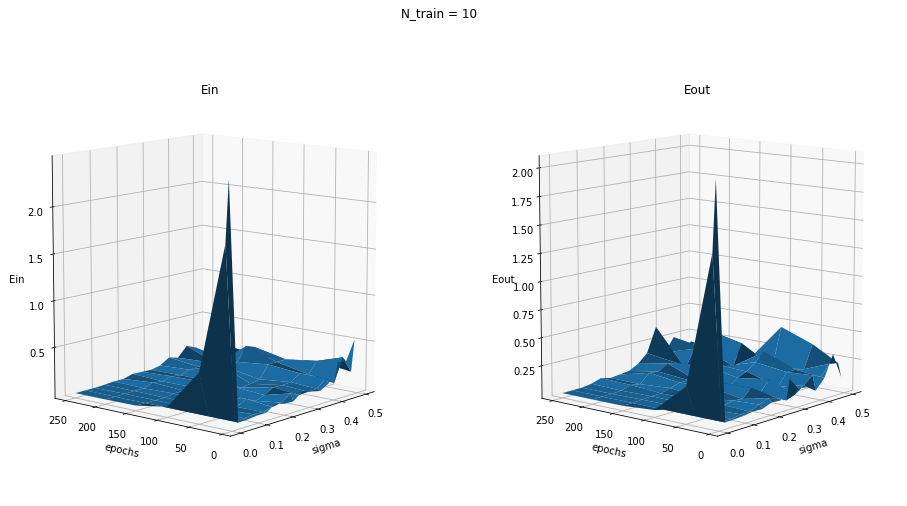

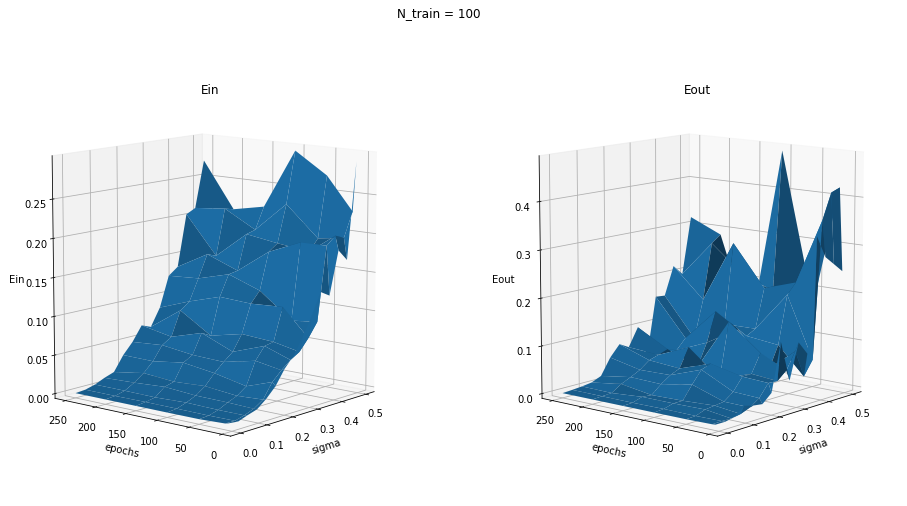

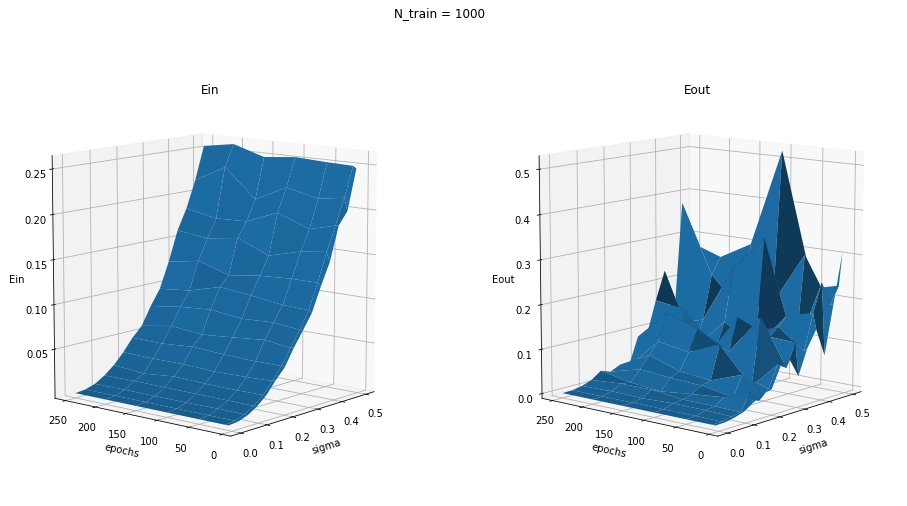

In [45]:
for k in range(len(Nt)):
   fig = plt.figure(figsize=(16,8))
   ax = fig.add_subplot(121, projection='3d')
   ax.plot_surface(S,E, Ein[k,:,:], label='Ein')
   ax.set_title('Ein')
   ax.set_xlabel('sigma')
   ax.set_ylabel('epochs')
   ax.set_zlabel('Ein')
   ax.view_init(10, -140)
   #plt.legend()
   ax = fig.add_subplot(122, projection='3d')
   ax.plot_surface(S, E, Eout[k,:,:], label='Eout')
   ax.set_xlabel('sigma')
   ax.set_ylabel('epochs')
   ax.set_zlabel('Eout')
   ax.set_title('Eout')
   ax.view_init(10, -140)
   plt.suptitle('N_train = '+str(Nt[k]))
   plt.show()


Si osserva che:
- Nel caso $N_{\text{train}}=10$ per piccoli valori di $\sigma$ abbiamo grandi errori $E_{\text{in}}$, $E_{\text{out}}$ che decrescono rapidamente all'aumentare del numero di epoche. Questo picco non si osserva per $N_{\text{train}}$ maggiori.
- Per le tre scelte di $N_{\text{train}}$ gli errori $E_{\text{in}}$, $E_{\text{out}}$ aumentano con $\sigma$, ovvero aumentando il rumore nei dati diventa più difficile fittare e fare previsioni.  Inoltre nei tre casi la superficie $E_{\text{out}}$ è più frastaglialta. 

Per i tre valori di $N_{\text{train}}$ troviamo i paramentri $\sigma$ e $N_{\text{epochs}}$ che danno il miglior fit:

In [57]:
#minimum sigma
#trovo il sigma minimo nei 3 casi per Ein, il sigma per cui il fit è migliore

ij0 = np.unravel_index(Ein[0,:,:].argmin(), Ein[0,:,:].shape)
ij1 = np.unravel_index(Ein[1,:,:].argmin(), Ein[1,:,:].shape)
ij2 = np.unravel_index(Ein[2,:,:].argmin(), Ein[2,:,:].shape)

print("Nt  sigma  epochs")
print("10   "+str(sigma[ij0[1]])+"   "+str(epochs[ij0[0]]))
print("100  "+str(sigma[ij1[1]])+"   "+str(epochs[ij1[0]]))
print("1000 "+str(sigma[ij2[1]])+"   "+str(epochs[ij2[0]]))

Nt  sigma  epochs
10   0.0   250
100  0.0   250
1000 0.0   250


Nei tre casi abbiamo che per $\sigma=0$ (assenza di noise) e per $N_{\text{epochs}}$ massimo otteniamo il miglior fit.
Ora, fissato $\sigma = 0$, osserviamo che infatti il fit e le previsioni migliorano con il numero di epoche (eccetto che per il caso $N_{\text{train}} = 10$ ciò non era visibile dai grafici precedenti). 

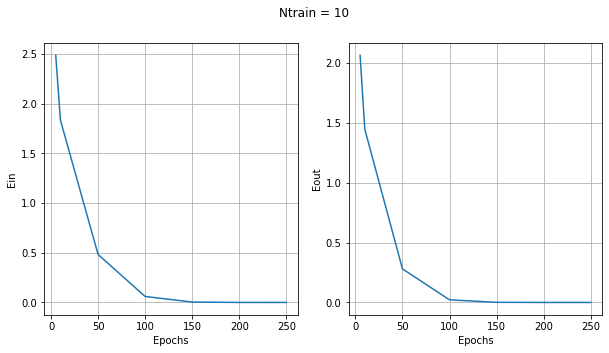

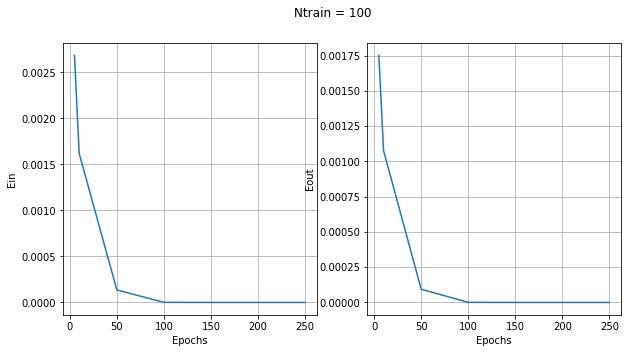

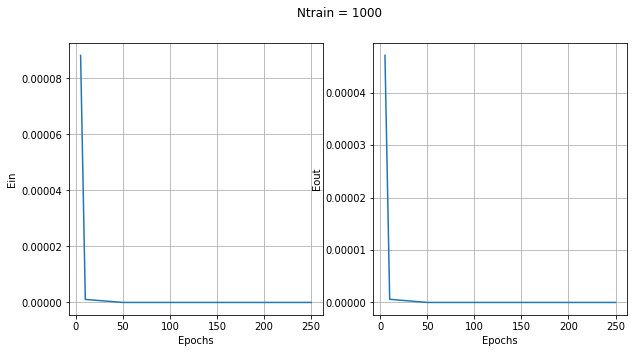

In [61]:
#sigma = 0
for i in range(len(Nt)):
   plt.figure(figsize=(10,5))
   plt.subplot(121)
   plt.plot(epochs,Ein[i,:,0])
   plt.xlabel("Epochs")
   plt.ylabel("Ein")
   plt.grid(True)
   plt.subplot(122)
   plt.plot(epochs,Eout[i,:,0])
   plt.xlabel("Epochs")
   plt.ylabel("Eout")
   plt.grid(True)
   plt.suptitle("Ntrain = "+str(Nt[i]))
   plt.show()


Si vede inoltre da questi grafici che fit e previsioni migliorano all'aumentare di $N_{\text{train}}$ (l'ottimizzazione avviene in un minor numero di epoche all'aumentare del training set).


Vediamo ora la predizione di una rete con i valori dei paramentri che ottimizzano fit e predizioni: $N_{\text{train}}=1000$, $N_{\text{epochs}}=250$ e $\sigma = 0$.

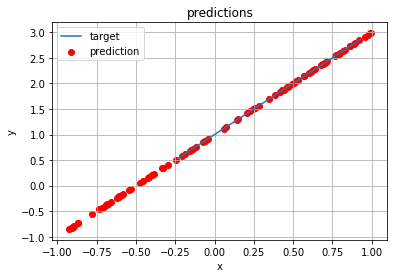

In [3]:
model_final = tf.keras.models.load_model(filepath="sigma0_Ne250")

x_predicted = np.random.uniform(-1, 1, 100)
y_predicted = model_final.predict(x_predicted)
plt.scatter(x_predicted, y_predicted,color='r', label="prediction")
plt.plot(x_valid,y_target, label="target")
plt.legend()
plt.xlabel("x")
plt.ylabel("y")
plt.title("predictions")
plt.grid(True)
plt.show()

## 11.2
Consideriamo ora la funzione $f(x)=4-3x-2x^2+3x^3$ con $x \in [-1,1]$ e generiamo un training set e test set come nel punto precedente utilizzando $\sigma = 0.2$. Studiamo come varia l'abilità di fittare e fare previsioni di una rete neurale al variare della sua geometria, della funzione di attivazione, dell'ottimizzatore e della loss function.


### Geometria 1
Innanzitutto vediamo come variano le performance per reti neurali con un unico layer al variare del numero di neuroni. Per questa geometria e le successive utilizziamo la funzione di attivazione 'selu' e l'optimizer 'sgd' e la loss function 'mse'.

In [12]:
from tensorflow.keras import optimizers, models
from tensorflow.keras.models import load_model
from keras import optimizers, activations


import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras import backend as K
from tensorflow.keras.utils import get_custom_objects




Nt = 45    #training 
sigma = 0.2 #noise
Ne = 500    #training epochs
Nv = 30     #validation

# target parameters of f(x) = a0 + a1*x + a2*x^2 + a3*x^3
a0 = 4
a1 = -3
a2 = -2
a3 = 3

# generate training inputs
np.random.seed(0)
x_train = np.random.uniform(-1, 1, Nt)
x_valid = np.random.uniform(-1, 1, Nv)
x_valid1 = np.random.uniform(-1, 1.5, Nv)
x = np.linspace(-1,1.5,100)
y_target = a0 + a1*x + a2*x**2 + a3*x**3 # ideal (target) linear function
y_train = np.random.normal(a0 + a1*x_train + a2*x_train**2 + a3*x_train**3, sigma) 
y_valid = np.random.normal(a0 + a1*x_valid + a2*x_valid**2 + a3*x_valid**3, sigma)
y_valid1 = np.random.normal(a0 + a1*x_valid1 + a2*x_valid1**2 + a3*x_valid1**3, sigma)

Neurons=np.arange(1,21)
Ein=np.zeros(len(Neurons))
Eout=np.zeros(len(Neurons))
Eout1=np.zeros(len(Neurons))

Nlayers = 1
for i in range(len(Neurons)):
   model = Sequential() 
   model.add(Dense(Neurons[i], input_shape=(1,),activation='selu')) 
   model.add(Dense(1,activation='selu'))
   Nparams = model.count_params()
   #compile
   model.compile(optimizer='sgd', loss='mse', metrics=['mse']) 
   model.summary()
   # fit
   history = model.fit(x=x_train, y=y_train, 
             batch_size=32, epochs=Ne,
             shuffle=True, # a good idea is to shuffle input before at each epoch
             validation_data=(x_valid, y_valid))
   #evaluate model on training dataset
   score_t = model.evaluate(x_train, y_train, batch_size=32, verbose=1)
   # evaluate model on validation dataset
   score_v = model.evaluate(x_valid, y_valid, batch_size=32, verbose=1)
   score_v1 = model.evaluate(x_valid1, y_valid1, batch_size=32, verbose=1)
   Ein[i] = score_t[0]
   Eout[i] = score_v[0]
   Eout1[i] = score_v1[0] 



Using TensorFlow backend.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 1)                 2         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 2         
Total params: 4
Trainable params: 4
Non-trainable params: 0
_________________________________________________________________
Train on 45 samples, validate on 30 samples
Epoch 1/500
45/45 [==============================] - 0s 7ms/sample - loss: 10.7065 - mean_squared_error: 10.7065 - val_loss: 12.9370 - val_mean_squared_error: 12.9370
Epoch 2/500
45/45 [==============================] - 0s 249us/sample - loss: 9.6888 - mean_squared_error: 9.6888 - val_loss: 12.0412 - val_mean_squared_error: 12.0412
Epoch 3/500
45/45 [==============================]

45/45 [==============================] - 0s 215us/sample - loss: 0.8698 - mean_squared_error: 0.8698 - val_loss: 1.1780 - val_mean_squared_error: 1.1780
Epoch 94/500
45/45 [==============================] - 0s 299us/sample - loss: 0.8677 - mean_squared_error: 0.8677 - val_loss: 1.1756 - val_mean_squared_error: 1.1756
Epoch 95/500
45/45 [==============================] - 0s 342us/sample - loss: 0.8681 - mean_squared_error: 0.8681 - val_loss: 1.1617 - val_mean_squared_error: 1.1617
Epoch 96/500
45/45 [==============================] - 0s 290us/sample - loss: 0.8646 - mean_squared_error: 0.8646 - val_loss: 1.1592 - val_mean_squared_error: 1.1592
Epoch 97/500
45/45 [==============================] - 0s 292us/sample - loss: 0.8630 - mean_squared_error: 0.8630 - val_loss: 1.1537 - val_mean_squared_error: 1.1537
Epoch 98/500
45/45 [==============================] - 0s 374us/sample - loss: 0.8624 - mean_squared_error: 0.8624 - val_loss: 1.1626 - val_mean_squared_error: 1.1626
Epoch 99/500
45/4

Epoch 191/500
45/45 [==============================] - 0s 350us/sample - loss: 0.6250 - mean_squared_error: 0.6250 - val_loss: 0.7634 - val_mean_squared_error: 0.7634
Epoch 192/500
45/45 [==============================] - 0s 369us/sample - loss: 0.6205 - mean_squared_error: 0.6205 - val_loss: 0.7484 - val_mean_squared_error: 0.7484
Epoch 193/500
45/45 [==============================] - 0s 370us/sample - loss: 0.6154 - mean_squared_error: 0.6154 - val_loss: 0.7440 - val_mean_squared_error: 0.7440
Epoch 194/500
45/45 [==============================] - 0s 271us/sample - loss: 0.6110 - mean_squared_error: 0.6110 - val_loss: 0.7408 - val_mean_squared_error: 0.7408
Epoch 195/500
45/45 [==============================] - 0s 357us/sample - loss: 0.6068 - mean_squared_error: 0.6068 - val_loss: 0.7286 - val_mean_squared_error: 0.7286
Epoch 196/500
45/45 [==============================] - 0s 254us/sample - loss: 0.6031 - mean_squared_error: 0.6031 - val_loss: 0.7273 - val_mean_squared_error: 0.727

45/45 [==============================] - 0s 235us/sample - loss: 0.4061 - mean_squared_error: 0.4061 - val_loss: 0.3771 - val_mean_squared_error: 0.3771
Epoch 241/500
45/45 [==============================] - 0s 313us/sample - loss: 0.4040 - mean_squared_error: 0.4040 - val_loss: 0.3699 - val_mean_squared_error: 0.3699
Epoch 242/500
45/45 [==============================] - 0s 225us/sample - loss: 0.4034 - mean_squared_error: 0.4034 - val_loss: 0.3730 - val_mean_squared_error: 0.3730
Epoch 243/500
45/45 [==============================] - 0s 339us/sample - loss: 0.4002 - mean_squared_error: 0.4002 - val_loss: 0.3710 - val_mean_squared_error: 0.3710
Epoch 244/500
45/45 [==============================] - 0s 315us/sample - loss: 0.3982 - mean_squared_error: 0.3982 - val_loss: 0.3698 - val_mean_squared_error: 0.3698
Epoch 245/500
45/45 [==============================] - 0s 272us/sample - loss: 0.3967 - mean_squared_error: 0.3967 - val_loss: 0.3671 - val_mean_squared_error: 0.3671
Epoch 246/50

45/45 [==============================] - 0s 290us/sample - loss: 0.3512 - mean_squared_error: 0.3512 - val_loss: 0.2541 - val_mean_squared_error: 0.2541
Epoch 339/500
45/45 [==============================] - 0s 330us/sample - loss: 0.3516 - mean_squared_error: 0.3516 - val_loss: 0.2561 - val_mean_squared_error: 0.2561
Epoch 340/500
45/45 [==============================] - 0s 267us/sample - loss: 0.3516 - mean_squared_error: 0.3516 - val_loss: 0.2580 - val_mean_squared_error: 0.2580
Epoch 341/500
45/45 [==============================] - 0s 264us/sample - loss: 0.3512 - mean_squared_error: 0.3512 - val_loss: 0.2585 - val_mean_squared_error: 0.2585
Epoch 342/500
45/45 [==============================] - 0s 280us/sample - loss: 0.3510 - mean_squared_error: 0.3510 - val_loss: 0.2573 - val_mean_squared_error: 0.2573
Epoch 343/500
45/45 [==============================] - 0s 278us/sample - loss: 0.3508 - mean_squared_error: 0.3508 - val_loss: 0.2568 - val_mean_squared_error: 0.2568
Epoch 344/50

45/45 [==============================] - 0s 258us/sample - loss: 0.3400 - mean_squared_error: 0.3400 - val_loss: 0.2423 - val_mean_squared_error: 0.2423
Epoch 437/500
45/45 [==============================] - 0s 329us/sample - loss: 0.3397 - mean_squared_error: 0.3397 - val_loss: 0.2440 - val_mean_squared_error: 0.2440
Epoch 438/500
45/45 [==============================] - 0s 448us/sample - loss: 0.3394 - mean_squared_error: 0.3394 - val_loss: 0.2431 - val_mean_squared_error: 0.2431
Epoch 439/500
45/45 [==============================] - 0s 312us/sample - loss: 0.3392 - mean_squared_error: 0.3392 - val_loss: 0.2431 - val_mean_squared_error: 0.2431
Epoch 440/500
45/45 [==============================] - 0s 256us/sample - loss: 0.3393 - mean_squared_error: 0.3393 - val_loss: 0.2443 - val_mean_squared_error: 0.2443
Epoch 441/500
45/45 [==============================] - 0s 331us/sample - loss: 0.3392 - mean_squared_error: 0.3392 - val_loss: 0.2437 - val_mean_squared_error: 0.2437
Epoch 442/50

45/45 [==============================] - 0s 291us/sample - loss: 0.7789 - mean_squared_error: 0.7789 - val_loss: 1.0323 - val_mean_squared_error: 1.0323
Epoch 29/500
45/45 [==============================] - 0s 284us/sample - loss: 0.7621 - mean_squared_error: 0.7621 - val_loss: 1.0069 - val_mean_squared_error: 1.0069
Epoch 30/500
45/45 [==============================] - 0s 331us/sample - loss: 0.7477 - mean_squared_error: 0.7477 - val_loss: 0.9663 - val_mean_squared_error: 0.9663
Epoch 31/500
45/45 [==============================] - 0s 290us/sample - loss: 0.7318 - mean_squared_error: 0.7318 - val_loss: 0.9396 - val_mean_squared_error: 0.9396
Epoch 32/500
45/45 [==============================] - 0s 324us/sample - loss: 0.7172 - mean_squared_error: 0.7172 - val_loss: 0.9163 - val_mean_squared_error: 0.9163
Epoch 33/500
45/45 [==============================] - 0s 260us/sample - loss: 0.7025 - mean_squared_error: 0.7025 - val_loss: 0.8880 - val_mean_squared_error: 0.8880
Epoch 34/500
45/4

45/45 [==============================] - 0s 229us/sample - loss: 0.3655 - mean_squared_error: 0.3655 - val_loss: 0.2755 - val_mean_squared_error: 0.2755
Epoch 127/500
45/45 [==============================] - 0s 212us/sample - loss: 0.3654 - mean_squared_error: 0.3654 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 128/500
45/45 [==============================] - 0s 356us/sample - loss: 0.3644 - mean_squared_error: 0.3644 - val_loss: 0.2749 - val_mean_squared_error: 0.2749
Epoch 129/500
45/45 [==============================] - 0s 280us/sample - loss: 0.3635 - mean_squared_error: 0.3635 - val_loss: 0.2713 - val_mean_squared_error: 0.2713
Epoch 130/500
45/45 [==============================] - 0s 281us/sample - loss: 0.3629 - mean_squared_error: 0.3629 - val_loss: 0.2697 - val_mean_squared_error: 0.2697
Epoch 131/500
45/45 [==============================] - 0s 262us/sample - loss: 0.3626 - mean_squared_error: 0.3626 - val_loss: 0.2670 - val_mean_squared_error: 0.2670
Epoch 132/50

45/45 [==============================] - 0s 306us/sample - loss: 0.3019 - mean_squared_error: 0.3019 - val_loss: 0.2420 - val_mean_squared_error: 0.2420
Epoch 225/500
45/45 [==============================] - 0s 290us/sample - loss: 0.3000 - mean_squared_error: 0.3000 - val_loss: 0.2449 - val_mean_squared_error: 0.2449
Epoch 226/500
45/45 [==============================] - 0s 292us/sample - loss: 0.2992 - mean_squared_error: 0.2992 - val_loss: 0.2419 - val_mean_squared_error: 0.2419
Epoch 227/500
45/45 [==============================] - 0s 309us/sample - loss: 0.3001 - mean_squared_error: 0.3001 - val_loss: 0.2496 - val_mean_squared_error: 0.2496
Epoch 228/500
45/45 [==============================] - 0s 290us/sample - loss: 0.2972 - mean_squared_error: 0.2972 - val_loss: 0.2526 - val_mean_squared_error: 0.2526
Epoch 229/500
45/45 [==============================] - 0s 265us/sample - loss: 0.2960 - mean_squared_error: 0.2960 - val_loss: 0.2475 - val_mean_squared_error: 0.2475
Epoch 230/50

45/45 [==============================] - 0s 310us/sample - loss: 0.1970 - mean_squared_error: 0.1970 - val_loss: 0.2131 - val_mean_squared_error: 0.2131
Epoch 323/500
45/45 [==============================] - 0s 271us/sample - loss: 0.1956 - mean_squared_error: 0.1956 - val_loss: 0.2141 - val_mean_squared_error: 0.2141
Epoch 324/500
45/45 [==============================] - 0s 312us/sample - loss: 0.1949 - mean_squared_error: 0.1949 - val_loss: 0.2143 - val_mean_squared_error: 0.2143
Epoch 325/500
45/45 [==============================] - 0s 273us/sample - loss: 0.1949 - mean_squared_error: 0.1949 - val_loss: 0.2090 - val_mean_squared_error: 0.2090
Epoch 326/500
45/45 [==============================] - 0s 313us/sample - loss: 0.1939 - mean_squared_error: 0.1939 - val_loss: 0.2066 - val_mean_squared_error: 0.2066
Epoch 327/500
45/45 [==============================] - 0s 295us/sample - loss: 0.1932 - mean_squared_error: 0.1932 - val_loss: 0.2061 - val_mean_squared_error: 0.2061
Epoch 328/50

45/45 [==============================] - 0s 245us/sample - loss: 0.1605 - mean_squared_error: 0.1605 - val_loss: 0.1795 - val_mean_squared_error: 0.1795
Epoch 421/500
45/45 [==============================] - 0s 340us/sample - loss: 0.1603 - mean_squared_error: 0.1603 - val_loss: 0.1759 - val_mean_squared_error: 0.1759
Epoch 422/500
45/45 [==============================] - 0s 481us/sample - loss: 0.1597 - mean_squared_error: 0.1597 - val_loss: 0.1776 - val_mean_squared_error: 0.1776
Epoch 423/500
45/45 [==============================] - 0s 262us/sample - loss: 0.1595 - mean_squared_error: 0.1595 - val_loss: 0.1758 - val_mean_squared_error: 0.1758
Epoch 424/500
45/45 [==============================] - 0s 274us/sample - loss: 0.1591 - mean_squared_error: 0.1591 - val_loss: 0.1769 - val_mean_squared_error: 0.1769
Epoch 425/500
45/45 [==============================] - 0s 276us/sample - loss: 0.1592 - mean_squared_error: 0.1592 - val_loss: 0.1766 - val_mean_squared_error: 0.1766
Epoch 426/50

45/45 [==============================] - 0s 343us/sample - loss: 3.2810 - mean_squared_error: 3.2810 - val_loss: 5.0439 - val_mean_squared_error: 5.0439
Epoch 13/500
45/45 [==============================] - 0s 324us/sample - loss: 2.9430 - mean_squared_error: 2.9430 - val_loss: 4.6272 - val_mean_squared_error: 4.6272
Epoch 14/500
45/45 [==============================] - 0s 286us/sample - loss: 2.6447 - mean_squared_error: 2.6447 - val_loss: 4.1582 - val_mean_squared_error: 4.1582
Epoch 15/500
45/45 [==============================] - 0s 204us/sample - loss: 2.3483 - mean_squared_error: 2.3483 - val_loss: 3.7441 - val_mean_squared_error: 3.7441
Epoch 16/500
45/45 [==============================] - 0s 194us/sample - loss: 2.0876 - mean_squared_error: 2.0876 - val_loss: 3.3422 - val_mean_squared_error: 3.3422
Epoch 17/500
45/45 [==============================] - 0s 204us/sample - loss: 1.8538 - mean_squared_error: 1.8538 - val_loss: 3.0166 - val_mean_squared_error: 3.0166
Epoch 18/500
45/4

45/45 [==============================] - 0s 253us/sample - loss: 0.4234 - mean_squared_error: 0.4234 - val_loss: 0.3373 - val_mean_squared_error: 0.3373
Epoch 111/500
45/45 [==============================] - 0s 290us/sample - loss: 0.4235 - mean_squared_error: 0.4235 - val_loss: 0.3446 - val_mean_squared_error: 0.3446
Epoch 112/500
45/45 [==============================] - 0s 273us/sample - loss: 0.4209 - mean_squared_error: 0.4209 - val_loss: 0.3459 - val_mean_squared_error: 0.3459
Epoch 113/500
45/45 [==============================] - 0s 206us/sample - loss: 0.4215 - mean_squared_error: 0.4215 - val_loss: 0.3389 - val_mean_squared_error: 0.3389
Epoch 114/500
45/45 [==============================] - 0s 258us/sample - loss: 0.4204 - mean_squared_error: 0.4204 - val_loss: 0.3426 - val_mean_squared_error: 0.3426
Epoch 115/500
45/45 [==============================] - 0s 293us/sample - loss: 0.4196 - mean_squared_error: 0.4196 - val_loss: 0.3476 - val_mean_squared_error: 0.3476
Epoch 116/50

45/45 [==============================] - 0s 260us/sample - loss: 0.3246 - mean_squared_error: 0.3246 - val_loss: 0.3107 - val_mean_squared_error: 0.3107
Epoch 209/500
45/45 [==============================] - 0s 205us/sample - loss: 0.3242 - mean_squared_error: 0.3242 - val_loss: 0.3093 - val_mean_squared_error: 0.3093
Epoch 210/500
45/45 [==============================] - 0s 230us/sample - loss: 0.3223 - mean_squared_error: 0.3223 - val_loss: 0.3048 - val_mean_squared_error: 0.3048
Epoch 211/500
45/45 [==============================] - 0s 300us/sample - loss: 0.3217 - mean_squared_error: 0.3217 - val_loss: 0.2985 - val_mean_squared_error: 0.2985
Epoch 212/500
45/45 [==============================] - 0s 324us/sample - loss: 0.3205 - mean_squared_error: 0.3205 - val_loss: 0.2962 - val_mean_squared_error: 0.2962
Epoch 213/500
45/45 [==============================] - 0s 293us/sample - loss: 0.3195 - mean_squared_error: 0.3195 - val_loss: 0.2947 - val_mean_squared_error: 0.2947
Epoch 214/50

45/45 [==============================] - 0s 259us/sample - loss: 0.2606 - mean_squared_error: 0.2606 - val_loss: 0.2369 - val_mean_squared_error: 0.2369
Epoch 307/500
45/45 [==============================] - 0s 230us/sample - loss: 0.2599 - mean_squared_error: 0.2599 - val_loss: 0.2364 - val_mean_squared_error: 0.2364
Epoch 308/500
45/45 [==============================] - 0s 373us/sample - loss: 0.2596 - mean_squared_error: 0.2596 - val_loss: 0.2336 - val_mean_squared_error: 0.2336
Epoch 309/500
45/45 [==============================] - 0s 290us/sample - loss: 0.2590 - mean_squared_error: 0.2590 - val_loss: 0.2332 - val_mean_squared_error: 0.2332
Epoch 310/500
45/45 [==============================] - 0s 325us/sample - loss: 0.2583 - mean_squared_error: 0.2583 - val_loss: 0.2330 - val_mean_squared_error: 0.2330
Epoch 311/500
45/45 [==============================] - 0s 290us/sample - loss: 0.2577 - mean_squared_error: 0.2577 - val_loss: 0.2345 - val_mean_squared_error: 0.2345
Epoch 312/50

45/45 [==============================] - 0s 328us/sample - loss: 0.2121 - mean_squared_error: 0.2121 - val_loss: 0.2244 - val_mean_squared_error: 0.2244
Epoch 405/500
45/45 [==============================] - 0s 276us/sample - loss: 0.2115 - mean_squared_error: 0.2115 - val_loss: 0.2218 - val_mean_squared_error: 0.2218
Epoch 406/500
45/45 [==============================] - 0s 272us/sample - loss: 0.2117 - mean_squared_error: 0.2117 - val_loss: 0.2138 - val_mean_squared_error: 0.2138
Epoch 407/500
45/45 [==============================] - 0s 313us/sample - loss: 0.2146 - mean_squared_error: 0.2146 - val_loss: 0.2307 - val_mean_squared_error: 0.2307
Epoch 408/500
45/45 [==============================] - 0s 286us/sample - loss: 0.2108 - mean_squared_error: 0.2108 - val_loss: 0.2217 - val_mean_squared_error: 0.2217
Epoch 409/500
45/45 [==============================] - 0s 370us/sample - loss: 0.2096 - mean_squared_error: 0.2096 - val_loss: 0.2174 - val_mean_squared_error: 0.2174
Epoch 410/50

30/30 [==============================] - 0s 74us/sample - loss: 0.5512 - mean_squared_error: 0.5512
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_7 (Dense)              (None, 4)                 8         
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 5         
Total params: 13
Trainable params: 13
Non-trainable params: 0
_________________________________________________________________
Train on 45 samples, validate on 30 samples
Epoch 1/500
45/45 [==============================] - 0s 5ms/sample - loss: 10.8628 - mean_squared_error: 10.8628 - val_loss: 12.8833 - val_mean_squared_error: 12.8833
Epoch 2/500
45/45 [==============================] - 0s 362us/sample - loss: 9.5057 - mean_squared_error: 9.5057 - val_loss: 11.8276 - val_mean_squared_error: 11.8276
Epoch 3/500
45/45 [=======================

Epoch 46/500
45/45 [==============================] - 0s 246us/sample - loss: 0.6100 - mean_squared_error: 0.6100 - val_loss: 0.7084 - val_mean_squared_error: 0.7084
Epoch 47/500
45/45 [==============================] - 0s 262us/sample - loss: 0.6038 - mean_squared_error: 0.6038 - val_loss: 0.7013 - val_mean_squared_error: 0.7013
Epoch 48/500
45/45 [==============================] - 0s 210us/sample - loss: 0.5970 - mean_squared_error: 0.5970 - val_loss: 0.6834 - val_mean_squared_error: 0.6834
Epoch 49/500
45/45 [==============================] - 0s 245us/sample - loss: 0.5915 - mean_squared_error: 0.5915 - val_loss: 0.6577 - val_mean_squared_error: 0.6577
Epoch 50/500
45/45 [==============================] - 0s 247us/sample - loss: 0.5832 - mean_squared_error: 0.5832 - val_loss: 0.6455 - val_mean_squared_error: 0.6455
Epoch 51/500
45/45 [==============================] - 0s 322us/sample - loss: 0.5799 - mean_squared_error: 0.5799 - val_loss: 0.6209 - val_mean_squared_error: 0.6209
Epoc

45/45 [==============================] - 0s 299us/sample - loss: 0.4664 - mean_squared_error: 0.4664 - val_loss: 0.3610 - val_mean_squared_error: 0.3610
Epoch 145/500
45/45 [==============================] - 0s 331us/sample - loss: 0.4664 - mean_squared_error: 0.4664 - val_loss: 0.3629 - val_mean_squared_error: 0.3629
Epoch 146/500
45/45 [==============================] - 0s 289us/sample - loss: 0.4661 - mean_squared_error: 0.4661 - val_loss: 0.3585 - val_mean_squared_error: 0.3585
Epoch 147/500
45/45 [==============================] - 0s 294us/sample - loss: 0.4655 - mean_squared_error: 0.4655 - val_loss: 0.3559 - val_mean_squared_error: 0.3559
Epoch 148/500
45/45 [==============================] - 0s 253us/sample - loss: 0.4651 - mean_squared_error: 0.4651 - val_loss: 0.3549 - val_mean_squared_error: 0.3549
Epoch 149/500
45/45 [==============================] - 0s 295us/sample - loss: 0.4651 - mean_squared_error: 0.4651 - val_loss: 0.3516 - val_mean_squared_error: 0.3516
Epoch 150/50

Epoch 193/500
45/45 [==============================] - 0s 325us/sample - loss: 0.4560 - mean_squared_error: 0.4560 - val_loss: 0.3418 - val_mean_squared_error: 0.3418
Epoch 194/500
45/45 [==============================] - 0s 273us/sample - loss: 0.4554 - mean_squared_error: 0.4554 - val_loss: 0.3418 - val_mean_squared_error: 0.3418
Epoch 195/500
45/45 [==============================] - 0s 289us/sample - loss: 0.4567 - mean_squared_error: 0.4567 - val_loss: 0.3362 - val_mean_squared_error: 0.3362
Epoch 196/500
45/45 [==============================] - 0s 253us/sample - loss: 0.4552 - mean_squared_error: 0.4552 - val_loss: 0.3352 - val_mean_squared_error: 0.3352
Epoch 197/500
45/45 [==============================] - 0s 267us/sample - loss: 0.4550 - mean_squared_error: 0.4550 - val_loss: 0.3347 - val_mean_squared_error: 0.3347
Epoch 198/500
45/45 [==============================] - 0s 264us/sample - loss: 0.4547 - mean_squared_error: 0.4547 - val_loss: 0.3358 - val_mean_squared_error: 0.335

45/45 [==============================] - 0s 325us/sample - loss: 0.4435 - mean_squared_error: 0.4435 - val_loss: 0.3266 - val_mean_squared_error: 0.3266
Epoch 243/500
45/45 [==============================] - 0s 259us/sample - loss: 0.4434 - mean_squared_error: 0.4434 - val_loss: 0.3275 - val_mean_squared_error: 0.3275
Epoch 244/500
45/45 [==============================] - 0s 307us/sample - loss: 0.4443 - mean_squared_error: 0.4443 - val_loss: 0.3328 - val_mean_squared_error: 0.3328
Epoch 245/500
45/45 [==============================] - 0s 326us/sample - loss: 0.4436 - mean_squared_error: 0.4436 - val_loss: 0.3278 - val_mean_squared_error: 0.3278
Epoch 246/500
45/45 [==============================] - 0s 320us/sample - loss: 0.4423 - mean_squared_error: 0.4423 - val_loss: 0.3294 - val_mean_squared_error: 0.3294
Epoch 247/500
45/45 [==============================] - 0s 240us/sample - loss: 0.4427 - mean_squared_error: 0.4427 - val_loss: 0.3338 - val_mean_squared_error: 0.3338
Epoch 248/50

45/45 [==============================] - 0s 309us/sample - loss: 0.4098 - mean_squared_error: 0.4098 - val_loss: 0.3268 - val_mean_squared_error: 0.3268
Epoch 341/500
45/45 [==============================] - 0s 256us/sample - loss: 0.4105 - mean_squared_error: 0.4105 - val_loss: 0.3192 - val_mean_squared_error: 0.3192
Epoch 342/500
45/45 [==============================] - 0s 320us/sample - loss: 0.4086 - mean_squared_error: 0.4086 - val_loss: 0.3194 - val_mean_squared_error: 0.3194
Epoch 343/500
45/45 [==============================] - 0s 233us/sample - loss: 0.4079 - mean_squared_error: 0.4079 - val_loss: 0.3180 - val_mean_squared_error: 0.3180
Epoch 344/500
45/45 [==============================] - 0s 266us/sample - loss: 0.4075 - mean_squared_error: 0.4075 - val_loss: 0.3163 - val_mean_squared_error: 0.3163
Epoch 345/500
45/45 [==============================] - 0s 298us/sample - loss: 0.4072 - mean_squared_error: 0.4072 - val_loss: 0.3186 - val_mean_squared_error: 0.3186
Epoch 346/50

45/45 [==============================] - 0s 275us/sample - loss: 0.3577 - mean_squared_error: 0.3577 - val_loss: 0.2894 - val_mean_squared_error: 0.2894
Epoch 439/500
45/45 [==============================] - 0s 223us/sample - loss: 0.3571 - mean_squared_error: 0.3571 - val_loss: 0.2917 - val_mean_squared_error: 0.2917
Epoch 440/500
45/45 [==============================] - 0s 271us/sample - loss: 0.3565 - mean_squared_error: 0.3565 - val_loss: 0.2937 - val_mean_squared_error: 0.2937
Epoch 441/500
45/45 [==============================] - 0s 238us/sample - loss: 0.3560 - mean_squared_error: 0.3560 - val_loss: 0.2946 - val_mean_squared_error: 0.2946
Epoch 442/500
45/45 [==============================] - 0s 226us/sample - loss: 0.3557 - mean_squared_error: 0.3557 - val_loss: 0.2883 - val_mean_squared_error: 0.2883
Epoch 443/500
45/45 [==============================] - 0s 292us/sample - loss: 0.3545 - mean_squared_error: 0.3545 - val_loss: 0.2843 - val_mean_squared_error: 0.2843
Epoch 444/50

Epoch 487/500
45/45 [==============================] - 0s 267us/sample - loss: 0.3265 - mean_squared_error: 0.3265 - val_loss: 0.2601 - val_mean_squared_error: 0.2601
Epoch 488/500
45/45 [==============================] - 0s 286us/sample - loss: 0.3266 - mean_squared_error: 0.3266 - val_loss: 0.2587 - val_mean_squared_error: 0.2587
Epoch 489/500
45/45 [==============================] - 0s 249us/sample - loss: 0.3262 - mean_squared_error: 0.3262 - val_loss: 0.2553 - val_mean_squared_error: 0.2553
Epoch 490/500
45/45 [==============================] - 0s 258us/sample - loss: 0.3264 - mean_squared_error: 0.3264 - val_loss: 0.2516 - val_mean_squared_error: 0.2516
Epoch 491/500
45/45 [==============================] - 0s 312us/sample - loss: 0.3250 - mean_squared_error: 0.3250 - val_loss: 0.2518 - val_mean_squared_error: 0.2518
Epoch 492/500
45/45 [==============================] - 0s 304us/sample - loss: 0.3241 - mean_squared_error: 0.3241 - val_loss: 0.2540 - val_mean_squared_error: 0.254

45/45 [==============================] - 0s 260us/sample - loss: 0.2775 - mean_squared_error: 0.2775 - val_loss: 0.2447 - val_mean_squared_error: 0.2447
Epoch 80/500
45/45 [==============================] - 0s 350us/sample - loss: 0.2776 - mean_squared_error: 0.2776 - val_loss: 0.2503 - val_mean_squared_error: 0.2503
Epoch 81/500
45/45 [==============================] - 0s 425us/sample - loss: 0.2768 - mean_squared_error: 0.2768 - val_loss: 0.2529 - val_mean_squared_error: 0.2529
Epoch 82/500
45/45 [==============================] - 0s 272us/sample - loss: 0.2753 - mean_squared_error: 0.2753 - val_loss: 0.2493 - val_mean_squared_error: 0.2493
Epoch 83/500
45/45 [==============================] - 0s 323us/sample - loss: 0.2753 - mean_squared_error: 0.2753 - val_loss: 0.2547 - val_mean_squared_error: 0.2547
Epoch 84/500
45/45 [==============================] - 0s 315us/sample - loss: 0.2747 - mean_squared_error: 0.2747 - val_loss: 0.2543 - val_mean_squared_error: 0.2543
Epoch 85/500
45/4

45/45 [==============================] - 0s 261us/sample - loss: 0.2074 - mean_squared_error: 0.2074 - val_loss: 0.2048 - val_mean_squared_error: 0.2048
Epoch 178/500
45/45 [==============================] - 0s 291us/sample - loss: 0.2068 - mean_squared_error: 0.2068 - val_loss: 0.2010 - val_mean_squared_error: 0.2010
Epoch 179/500
45/45 [==============================] - 0s 369us/sample - loss: 0.2062 - mean_squared_error: 0.2062 - val_loss: 0.2051 - val_mean_squared_error: 0.2051
Epoch 180/500
45/45 [==============================] - 0s 237us/sample - loss: 0.2053 - mean_squared_error: 0.2053 - val_loss: 0.2046 - val_mean_squared_error: 0.2046
Epoch 181/500
45/45 [==============================] - 0s 225us/sample - loss: 0.2047 - mean_squared_error: 0.2047 - val_loss: 0.2056 - val_mean_squared_error: 0.2056
Epoch 182/500
45/45 [==============================] - 0s 266us/sample - loss: 0.2051 - mean_squared_error: 0.2051 - val_loss: 0.1958 - val_mean_squared_error: 0.1958
Epoch 183/50

45/45 [==============================] - 0s 280us/sample - loss: 0.1534 - mean_squared_error: 0.1534 - val_loss: 0.1556 - val_mean_squared_error: 0.1556
Epoch 276/500
45/45 [==============================] - 0s 310us/sample - loss: 0.1514 - mean_squared_error: 0.1514 - val_loss: 0.1600 - val_mean_squared_error: 0.1600
Epoch 277/500
45/45 [==============================] - 0s 337us/sample - loss: 0.1503 - mean_squared_error: 0.1503 - val_loss: 0.1653 - val_mean_squared_error: 0.1653
Epoch 278/500
45/45 [==============================] - 0s 290us/sample - loss: 0.1503 - mean_squared_error: 0.1503 - val_loss: 0.1726 - val_mean_squared_error: 0.1726
Epoch 279/500
45/45 [==============================] - 0s 257us/sample - loss: 0.1491 - mean_squared_error: 0.1491 - val_loss: 0.1691 - val_mean_squared_error: 0.1691
Epoch 280/500
45/45 [==============================] - 0s 272us/sample - loss: 0.1503 - mean_squared_error: 0.1503 - val_loss: 0.1784 - val_mean_squared_error: 0.1784
Epoch 281/50

Epoch 373/500
45/45 [==============================] - 0s 320us/sample - loss: 0.1241 - mean_squared_error: 0.1241 - val_loss: 0.1586 - val_mean_squared_error: 0.1586
Epoch 374/500
45/45 [==============================] - 0s 275us/sample - loss: 0.1240 - mean_squared_error: 0.1240 - val_loss: 0.1603 - val_mean_squared_error: 0.1603
Epoch 375/500
45/45 [==============================] - 0s 335us/sample - loss: 0.1249 - mean_squared_error: 0.1249 - val_loss: 0.1495 - val_mean_squared_error: 0.1495
Epoch 376/500
45/45 [==============================] - 0s 315us/sample - loss: 0.1233 - mean_squared_error: 0.1233 - val_loss: 0.1487 - val_mean_squared_error: 0.1487
Epoch 377/500
45/45 [==============================] - 0s 268us/sample - loss: 0.1230 - mean_squared_error: 0.1230 - val_loss: 0.1485 - val_mean_squared_error: 0.1485
Epoch 378/500
45/45 [==============================] - 0s 326us/sample - loss: 0.1228 - mean_squared_error: 0.1228 - val_loss: 0.1484 - val_mean_squared_error: 0.148

45/45 [==============================] - 0s 389us/sample - loss: 0.1151 - mean_squared_error: 0.1151 - val_loss: 0.1357 - val_mean_squared_error: 0.1357
Epoch 423/500
45/45 [==============================] - 0s 295us/sample - loss: 0.1150 - mean_squared_error: 0.1150 - val_loss: 0.1353 - val_mean_squared_error: 0.1353
Epoch 424/500
45/45 [==============================] - 0s 287us/sample - loss: 0.1166 - mean_squared_error: 0.1166 - val_loss: 0.1482 - val_mean_squared_error: 0.1482
Epoch 425/500
45/45 [==============================] - 0s 338us/sample - loss: 0.1146 - mean_squared_error: 0.1146 - val_loss: 0.1489 - val_mean_squared_error: 0.1489
Epoch 426/500
45/45 [==============================] - 0s 299us/sample - loss: 0.1143 - mean_squared_error: 0.1143 - val_loss: 0.1468 - val_mean_squared_error: 0.1468
Epoch 427/500
45/45 [==============================] - 0s 311us/sample - loss: 0.1143 - mean_squared_error: 0.1143 - val_loss: 0.1413 - val_mean_squared_error: 0.1413
Epoch 428/50

45/45 [==============================] - 0s 356us/sample - loss: 0.6642 - mean_squared_error: 0.6642 - val_loss: 1.0444 - val_mean_squared_error: 1.0444
Epoch 15/500
45/45 [==============================] - 0s 366us/sample - loss: 0.6215 - mean_squared_error: 0.6215 - val_loss: 0.9210 - val_mean_squared_error: 0.9210
Epoch 16/500
45/45 [==============================] - 0s 336us/sample - loss: 0.5781 - mean_squared_error: 0.5781 - val_loss: 0.8397 - val_mean_squared_error: 0.8397
Epoch 17/500
45/45 [==============================] - 0s 361us/sample - loss: 0.5479 - mean_squared_error: 0.5479 - val_loss: 0.7645 - val_mean_squared_error: 0.7645
Epoch 18/500
45/45 [==============================] - 0s 293us/sample - loss: 0.5204 - mean_squared_error: 0.5204 - val_loss: 0.7084 - val_mean_squared_error: 0.7084
Epoch 19/500
45/45 [==============================] - 0s 308us/sample - loss: 0.4956 - mean_squared_error: 0.4956 - val_loss: 0.6609 - val_mean_squared_error: 0.6609
Epoch 20/500
45/4

45/45 [==============================] - 0s 329us/sample - loss: 0.2534 - mean_squared_error: 0.2534 - val_loss: 0.2434 - val_mean_squared_error: 0.2434
Epoch 113/500
45/45 [==============================] - 0s 341us/sample - loss: 0.2529 - mean_squared_error: 0.2529 - val_loss: 0.2348 - val_mean_squared_error: 0.2348
Epoch 114/500
45/45 [==============================] - 0s 334us/sample - loss: 0.2512 - mean_squared_error: 0.2512 - val_loss: 0.2369 - val_mean_squared_error: 0.2369
Epoch 115/500
45/45 [==============================] - 0s 307us/sample - loss: 0.2506 - mean_squared_error: 0.2506 - val_loss: 0.2358 - val_mean_squared_error: 0.2358
Epoch 116/500
45/45 [==============================] - 0s 296us/sample - loss: 0.2498 - mean_squared_error: 0.2498 - val_loss: 0.2360 - val_mean_squared_error: 0.2360
Epoch 117/500
45/45 [==============================] - 0s 323us/sample - loss: 0.2491 - mean_squared_error: 0.2491 - val_loss: 0.2296 - val_mean_squared_error: 0.2296
Epoch 118/50

45/45 [==============================] - 0s 160us/sample - loss: 0.1845 - mean_squared_error: 0.1845 - val_loss: 0.1951 - val_mean_squared_error: 0.1951
Epoch 211/500
45/45 [==============================] - 0s 174us/sample - loss: 0.1839 - mean_squared_error: 0.1839 - val_loss: 0.1947 - val_mean_squared_error: 0.1947
Epoch 212/500
45/45 [==============================] - 0s 157us/sample - loss: 0.1832 - mean_squared_error: 0.1832 - val_loss: 0.1924 - val_mean_squared_error: 0.1924
Epoch 213/500
45/45 [==============================] - 0s 171us/sample - loss: 0.1838 - mean_squared_error: 0.1838 - val_loss: 0.1989 - val_mean_squared_error: 0.1989
Epoch 214/500
45/45 [==============================] - 0s 174us/sample - loss: 0.1827 - mean_squared_error: 0.1827 - val_loss: 0.1989 - val_mean_squared_error: 0.1989
Epoch 215/500
45/45 [==============================] - 0s 237us/sample - loss: 0.1825 - mean_squared_error: 0.1825 - val_loss: 0.2011 - val_mean_squared_error: 0.2011
Epoch 216/50

45/45 [==============================] - 0s 172us/sample - loss: 0.1463 - mean_squared_error: 0.1463 - val_loss: 0.1639 - val_mean_squared_error: 0.1639
Epoch 309/500
45/45 [==============================] - 0s 240us/sample - loss: 0.1453 - mean_squared_error: 0.1453 - val_loss: 0.1670 - val_mean_squared_error: 0.1670
Epoch 310/500
45/45 [==============================] - 0s 314us/sample - loss: 0.1450 - mean_squared_error: 0.1450 - val_loss: 0.1662 - val_mean_squared_error: 0.1662
Epoch 311/500
45/45 [==============================] - 0s 330us/sample - loss: 0.1449 - mean_squared_error: 0.1449 - val_loss: 0.1627 - val_mean_squared_error: 0.1627
Epoch 312/500
45/45 [==============================] - 0s 360us/sample - loss: 0.1445 - mean_squared_error: 0.1445 - val_loss: 0.1660 - val_mean_squared_error: 0.1660
Epoch 313/500
45/45 [==============================] - 0s 308us/sample - loss: 0.1447 - mean_squared_error: 0.1447 - val_loss: 0.1725 - val_mean_squared_error: 0.1725
Epoch 314/50

45/45 [==============================] - 0s 330us/sample - loss: 0.1216 - mean_squared_error: 0.1216 - val_loss: 0.1481 - val_mean_squared_error: 0.1481
Epoch 407/500
45/45 [==============================] - 0s 314us/sample - loss: 0.1211 - mean_squared_error: 0.1211 - val_loss: 0.1468 - val_mean_squared_error: 0.1468
Epoch 408/500
45/45 [==============================] - 0s 385us/sample - loss: 0.1210 - mean_squared_error: 0.1210 - val_loss: 0.1501 - val_mean_squared_error: 0.1501
Epoch 409/500
45/45 [==============================] - 0s 358us/sample - loss: 0.1220 - mean_squared_error: 0.1220 - val_loss: 0.1431 - val_mean_squared_error: 0.1431
Epoch 410/500
45/45 [==============================] - 0s 421us/sample - loss: 0.1209 - mean_squared_error: 0.1209 - val_loss: 0.1448 - val_mean_squared_error: 0.1448
Epoch 411/500
45/45 [==============================] - 0s 358us/sample - loss: 0.1207 - mean_squared_error: 0.1207 - val_loss: 0.1427 - val_mean_squared_error: 0.1427
Epoch 412/50

Total params: 22
Trainable params: 22
Non-trainable params: 0
_________________________________________________________________
Train on 45 samples, validate on 30 samples
Epoch 1/500
45/45 [==============================] - 0s 6ms/sample - loss: 10.5758 - mean_squared_error: 10.5758 - val_loss: 10.8352 - val_mean_squared_error: 10.8352
Epoch 2/500
45/45 [==============================] - 0s 349us/sample - loss: 7.2609 - mean_squared_error: 7.2609 - val_loss: 8.3746 - val_mean_squared_error: 8.3746
Epoch 3/500
45/45 [==============================] - 0s 290us/sample - loss: 5.3509 - mean_squared_error: 5.3509 - val_loss: 6.2671 - val_mean_squared_error: 6.2671
Epoch 4/500
45/45 [==============================] - 0s 340us/sample - loss: 3.8524 - mean_squared_error: 3.8524 - val_loss: 4.8437 - val_mean_squared_error: 4.8437
Epoch 5/500
45/45 [==============================] - 0s 333us/sample - loss: 2.8811 - mean_squared_error: 2.8811 - val_loss: 3.8599 - val_mean_squared_error: 3.8599
E

45/45 [==============================] - 0s 266us/sample - loss: 0.4289 - mean_squared_error: 0.4289 - val_loss: 0.3324 - val_mean_squared_error: 0.3324
Epoch 99/500
45/45 [==============================] - 0s 281us/sample - loss: 0.4296 - mean_squared_error: 0.4296 - val_loss: 0.3215 - val_mean_squared_error: 0.3215
Epoch 100/500
45/45 [==============================] - 0s 349us/sample - loss: 0.4272 - mean_squared_error: 0.4272 - val_loss: 0.3187 - val_mean_squared_error: 0.3187
Epoch 101/500
45/45 [==============================] - 0s 311us/sample - loss: 0.4327 - mean_squared_error: 0.4327 - val_loss: 0.3075 - val_mean_squared_error: 0.3075
Epoch 102/500
45/45 [==============================] - 0s 340us/sample - loss: 0.4282 - mean_squared_error: 0.4282 - val_loss: 0.3145 - val_mean_squared_error: 0.3145
Epoch 103/500
45/45 [==============================] - 0s 284us/sample - loss: 0.4264 - mean_squared_error: 0.4264 - val_loss: 0.3116 - val_mean_squared_error: 0.3116
Epoch 104/500

Epoch 196/500
45/45 [==============================] - 0s 399us/sample - loss: 0.3880 - mean_squared_error: 0.3880 - val_loss: 0.2880 - val_mean_squared_error: 0.2880
Epoch 197/500
45/45 [==============================] - 0s 371us/sample - loss: 0.3878 - mean_squared_error: 0.3878 - val_loss: 0.2934 - val_mean_squared_error: 0.2934
Epoch 198/500
45/45 [==============================] - 0s 313us/sample - loss: 0.3865 - mean_squared_error: 0.3865 - val_loss: 0.2949 - val_mean_squared_error: 0.2949
Epoch 199/500
45/45 [==============================] - 0s 268us/sample - loss: 0.3886 - mean_squared_error: 0.3886 - val_loss: 0.2851 - val_mean_squared_error: 0.2851
Epoch 200/500
45/45 [==============================] - 0s 359us/sample - loss: 0.3877 - mean_squared_error: 0.3877 - val_loss: 0.2809 - val_mean_squared_error: 0.2809
Epoch 201/500
45/45 [==============================] - 0s 302us/sample - loss: 0.3877 - mean_squared_error: 0.3877 - val_loss: 0.2902 - val_mean_squared_error: 0.290

45/45 [==============================] - 0s 332us/sample - loss: 0.3654 - mean_squared_error: 0.3654 - val_loss: 0.2892 - val_mean_squared_error: 0.2892
Epoch 246/500
45/45 [==============================] - 0s 241us/sample - loss: 0.3648 - mean_squared_error: 0.3648 - val_loss: 0.2830 - val_mean_squared_error: 0.2830
Epoch 247/500
45/45 [==============================] - 0s 304us/sample - loss: 0.3638 - mean_squared_error: 0.3638 - val_loss: 0.2827 - val_mean_squared_error: 0.2827
Epoch 248/500
45/45 [==============================] - 0s 309us/sample - loss: 0.3642 - mean_squared_error: 0.3642 - val_loss: 0.2885 - val_mean_squared_error: 0.2885
Epoch 249/500
45/45 [==============================] - 0s 315us/sample - loss: 0.3638 - mean_squared_error: 0.3638 - val_loss: 0.2928 - val_mean_squared_error: 0.2928
Epoch 250/500
45/45 [==============================] - 0s 277us/sample - loss: 0.3631 - mean_squared_error: 0.3631 - val_loss: 0.2865 - val_mean_squared_error: 0.2865
Epoch 251/50

45/45 [==============================] - 0s 263us/sample - loss: 0.3177 - mean_squared_error: 0.3177 - val_loss: 0.2514 - val_mean_squared_error: 0.2514
Epoch 344/500
45/45 [==============================] - 0s 265us/sample - loss: 0.3161 - mean_squared_error: 0.3161 - val_loss: 0.2564 - val_mean_squared_error: 0.2564
Epoch 345/500
45/45 [==============================] - 0s 250us/sample - loss: 0.3152 - mean_squared_error: 0.3152 - val_loss: 0.2599 - val_mean_squared_error: 0.2599
Epoch 346/500
45/45 [==============================] - 0s 277us/sample - loss: 0.3168 - mean_squared_error: 0.3168 - val_loss: 0.2478 - val_mean_squared_error: 0.2478
Epoch 347/500
45/45 [==============================] - 0s 372us/sample - loss: 0.3174 - mean_squared_error: 0.3174 - val_loss: 0.2611 - val_mean_squared_error: 0.2611
Epoch 348/500
45/45 [==============================] - 0s 331us/sample - loss: 0.3133 - mean_squared_error: 0.3133 - val_loss: 0.2596 - val_mean_squared_error: 0.2596
Epoch 349/50

Epoch 392/500
45/45 [==============================] - 0s 304us/sample - loss: 0.2902 - mean_squared_error: 0.2902 - val_loss: 0.2425 - val_mean_squared_error: 0.2425
Epoch 393/500
45/45 [==============================] - 0s 242us/sample - loss: 0.2897 - mean_squared_error: 0.2897 - val_loss: 0.2418 - val_mean_squared_error: 0.2418
Epoch 394/500
45/45 [==============================] - 0s 303us/sample - loss: 0.2905 - mean_squared_error: 0.2905 - val_loss: 0.2484 - val_mean_squared_error: 0.2484
Epoch 395/500
45/45 [==============================] - 0s 281us/sample - loss: 0.2895 - mean_squared_error: 0.2895 - val_loss: 0.2400 - val_mean_squared_error: 0.2400
Epoch 396/500
45/45 [==============================] - 0s 312us/sample - loss: 0.2879 - mean_squared_error: 0.2879 - val_loss: 0.2396 - val_mean_squared_error: 0.2396
Epoch 397/500
45/45 [==============================] - 0s 297us/sample - loss: 0.2874 - mean_squared_error: 0.2874 - val_loss: 0.2422 - val_mean_squared_error: 0.242

45/45 [==============================] - 0s 309us/sample - loss: 0.2644 - mean_squared_error: 0.2644 - val_loss: 0.2396 - val_mean_squared_error: 0.2396
Epoch 442/500
45/45 [==============================] - 0s 257us/sample - loss: 0.2640 - mean_squared_error: 0.2640 - val_loss: 0.2355 - val_mean_squared_error: 0.2355
Epoch 443/500
45/45 [==============================] - 0s 273us/sample - loss: 0.2636 - mean_squared_error: 0.2636 - val_loss: 0.2389 - val_mean_squared_error: 0.2389
Epoch 444/500
45/45 [==============================] - 0s 348us/sample - loss: 0.2631 - mean_squared_error: 0.2631 - val_loss: 0.2346 - val_mean_squared_error: 0.2346
Epoch 445/500
45/45 [==============================] - 0s 262us/sample - loss: 0.2624 - mean_squared_error: 0.2624 - val_loss: 0.2373 - val_mean_squared_error: 0.2373
Epoch 446/500
45/45 [==============================] - 0s 341us/sample - loss: 0.2621 - mean_squared_error: 0.2621 - val_loss: 0.2337 - val_mean_squared_error: 0.2337
Epoch 447/50

Epoch 34/500
45/45 [==============================] - 0s 271us/sample - loss: 0.5087 - mean_squared_error: 0.5087 - val_loss: 0.4750 - val_mean_squared_error: 0.4750
Epoch 35/500
45/45 [==============================] - 0s 292us/sample - loss: 0.5049 - mean_squared_error: 0.5049 - val_loss: 0.4549 - val_mean_squared_error: 0.4549
Epoch 36/500
45/45 [==============================] - 0s 279us/sample - loss: 0.5017 - mean_squared_error: 0.5017 - val_loss: 0.4354 - val_mean_squared_error: 0.4354
Epoch 37/500
45/45 [==============================] - 0s 336us/sample - loss: 0.4989 - mean_squared_error: 0.4989 - val_loss: 0.4377 - val_mean_squared_error: 0.4377
Epoch 38/500
45/45 [==============================] - 0s 335us/sample - loss: 0.4979 - mean_squared_error: 0.4979 - val_loss: 0.4364 - val_mean_squared_error: 0.4364
Epoch 39/500
45/45 [==============================] - 0s 349us/sample - loss: 0.4963 - mean_squared_error: 0.4963 - val_loss: 0.4285 - val_mean_squared_error: 0.4285
Epoc

45/45 [==============================] - 0s 235us/sample - loss: 0.4758 - mean_squared_error: 0.4758 - val_loss: 0.3636 - val_mean_squared_error: 0.3636
Epoch 133/500
45/45 [==============================] - 0s 300us/sample - loss: 0.4757 - mean_squared_error: 0.4757 - val_loss: 0.3602 - val_mean_squared_error: 0.3602
Epoch 134/500
45/45 [==============================] - 0s 322us/sample - loss: 0.4751 - mean_squared_error: 0.4751 - val_loss: 0.3583 - val_mean_squared_error: 0.3583
Epoch 135/500
45/45 [==============================] - 0s 242us/sample - loss: 0.4780 - mean_squared_error: 0.4780 - val_loss: 0.3488 - val_mean_squared_error: 0.3488
Epoch 136/500
45/45 [==============================] - 0s 262us/sample - loss: 0.4773 - mean_squared_error: 0.4773 - val_loss: 0.3454 - val_mean_squared_error: 0.3454
Epoch 137/500
45/45 [==============================] - 0s 251us/sample - loss: 0.4764 - mean_squared_error: 0.4764 - val_loss: 0.3467 - val_mean_squared_error: 0.3467
Epoch 138/50

45/45 [==============================] - 0s 286us/sample - loss: 0.4544 - mean_squared_error: 0.4544 - val_loss: 0.3378 - val_mean_squared_error: 0.3378
Epoch 231/500
45/45 [==============================] - 0s 205us/sample - loss: 0.4546 - mean_squared_error: 0.4546 - val_loss: 0.3389 - val_mean_squared_error: 0.3389
Epoch 232/500
45/45 [==============================] - 0s 248us/sample - loss: 0.4540 - mean_squared_error: 0.4540 - val_loss: 0.3371 - val_mean_squared_error: 0.3371
Epoch 233/500
45/45 [==============================] - 0s 284us/sample - loss: 0.4553 - mean_squared_error: 0.4553 - val_loss: 0.3479 - val_mean_squared_error: 0.3479
Epoch 234/500
45/45 [==============================] - 0s 319us/sample - loss: 0.4550 - mean_squared_error: 0.4550 - val_loss: 0.3380 - val_mean_squared_error: 0.3380
Epoch 235/500
45/45 [==============================] - 0s 312us/sample - loss: 0.4547 - mean_squared_error: 0.4547 - val_loss: 0.3407 - val_mean_squared_error: 0.3407
Epoch 236/50

45/45 [==============================] - 0s 276us/sample - loss: 0.4325 - mean_squared_error: 0.4325 - val_loss: 0.3383 - val_mean_squared_error: 0.3383
Epoch 329/500
45/45 [==============================] - 0s 312us/sample - loss: 0.4346 - mean_squared_error: 0.4346 - val_loss: 0.3483 - val_mean_squared_error: 0.3483
Epoch 330/500
45/45 [==============================] - 0s 240us/sample - loss: 0.4317 - mean_squared_error: 0.4317 - val_loss: 0.3494 - val_mean_squared_error: 0.3494
Epoch 331/500
45/45 [==============================] - 0s 298us/sample - loss: 0.4350 - mean_squared_error: 0.4350 - val_loss: 0.3337 - val_mean_squared_error: 0.3337
Epoch 332/500
45/45 [==============================] - 0s 473us/sample - loss: 0.4323 - mean_squared_error: 0.4323 - val_loss: 0.3278 - val_mean_squared_error: 0.3278
Epoch 333/500
45/45 [==============================] - 0s 319us/sample - loss: 0.4312 - mean_squared_error: 0.4312 - val_loss: 0.3289 - val_mean_squared_error: 0.3289
Epoch 334/50

45/45 [==============================] - 0s 311us/sample - loss: 0.4100 - mean_squared_error: 0.4100 - val_loss: 0.3538 - val_mean_squared_error: 0.3538
Epoch 427/500
45/45 [==============================] - 0s 289us/sample - loss: 0.4093 - mean_squared_error: 0.4093 - val_loss: 0.3486 - val_mean_squared_error: 0.3486
Epoch 428/500
45/45 [==============================] - 0s 331us/sample - loss: 0.4116 - mean_squared_error: 0.4116 - val_loss: 0.3314 - val_mean_squared_error: 0.3314
Epoch 429/500
45/45 [==============================] - 0s 350us/sample - loss: 0.4096 - mean_squared_error: 0.4096 - val_loss: 0.3421 - val_mean_squared_error: 0.3421
Epoch 430/500
45/45 [==============================] - 0s 324us/sample - loss: 0.4094 - mean_squared_error: 0.4094 - val_loss: 0.3302 - val_mean_squared_error: 0.3302
Epoch 431/500
45/45 [==============================] - 0s 292us/sample - loss: 0.4102 - mean_squared_error: 0.4102 - val_loss: 0.3442 - val_mean_squared_error: 0.3442
Epoch 432/50

Epoch 475/500
45/45 [==============================] - 0s 265us/sample - loss: 0.3992 - mean_squared_error: 0.3992 - val_loss: 0.3310 - val_mean_squared_error: 0.3310
Epoch 476/500
45/45 [==============================] - 0s 281us/sample - loss: 0.3984 - mean_squared_error: 0.3984 - val_loss: 0.3204 - val_mean_squared_error: 0.3204
Epoch 477/500
45/45 [==============================] - 0s 264us/sample - loss: 0.3967 - mean_squared_error: 0.3967 - val_loss: 0.3210 - val_mean_squared_error: 0.3210
Epoch 478/500
45/45 [==============================] - 0s 361us/sample - loss: 0.4049 - mean_squared_error: 0.4049 - val_loss: 0.3454 - val_mean_squared_error: 0.3454
Epoch 479/500
45/45 [==============================] - 0s 367us/sample - loss: 0.3979 - mean_squared_error: 0.3979 - val_loss: 0.3351 - val_mean_squared_error: 0.3351
Epoch 480/500
45/45 [==============================] - 0s 244us/sample - loss: 0.3963 - mean_squared_error: 0.3963 - val_loss: 0.3308 - val_mean_squared_error: 0.330

45/45 [==============================] - 0s 265us/sample - loss: 0.3394 - mean_squared_error: 0.3394 - val_loss: 0.2860 - val_mean_squared_error: 0.2860
Epoch 68/500
45/45 [==============================] - 0s 245us/sample - loss: 0.3392 - mean_squared_error: 0.3392 - val_loss: 0.2798 - val_mean_squared_error: 0.2798
Epoch 69/500
45/45 [==============================] - 0s 251us/sample - loss: 0.3376 - mean_squared_error: 0.3376 - val_loss: 0.2785 - val_mean_squared_error: 0.2785
Epoch 70/500
45/45 [==============================] - 0s 335us/sample - loss: 0.3370 - mean_squared_error: 0.3370 - val_loss: 0.2761 - val_mean_squared_error: 0.2761
Epoch 71/500
45/45 [==============================] - 0s 345us/sample - loss: 0.3375 - mean_squared_error: 0.3375 - val_loss: 0.2771 - val_mean_squared_error: 0.2771
Epoch 72/500
45/45 [==============================] - 0s 343us/sample - loss: 0.3353 - mean_squared_error: 0.3353 - val_loss: 0.2755 - val_mean_squared_error: 0.2755
Epoch 73/500
45/4

45/45 [==============================] - 0s 408us/sample - loss: 0.2648 - mean_squared_error: 0.2648 - val_loss: 0.2412 - val_mean_squared_error: 0.2412
Epoch 166/500
45/45 [==============================] - 0s 241us/sample - loss: 0.2651 - mean_squared_error: 0.2651 - val_loss: 0.2471 - val_mean_squared_error: 0.2471
Epoch 167/500
45/45 [==============================] - 0s 329us/sample - loss: 0.2631 - mean_squared_error: 0.2631 - val_loss: 0.2441 - val_mean_squared_error: 0.2441
Epoch 168/500
45/45 [==============================] - 0s 361us/sample - loss: 0.2627 - mean_squared_error: 0.2627 - val_loss: 0.2383 - val_mean_squared_error: 0.2383
Epoch 169/500
45/45 [==============================] - 0s 278us/sample - loss: 0.2616 - mean_squared_error: 0.2616 - val_loss: 0.2384 - val_mean_squared_error: 0.2384
Epoch 170/500
45/45 [==============================] - 0s 319us/sample - loss: 0.2607 - mean_squared_error: 0.2607 - val_loss: 0.2378 - val_mean_squared_error: 0.2378
Epoch 171/50

45/45 [==============================] - 0s 298us/sample - loss: 0.1909 - mean_squared_error: 0.1909 - val_loss: 0.2029 - val_mean_squared_error: 0.2029
Epoch 264/500
45/45 [==============================] - 0s 276us/sample - loss: 0.1901 - mean_squared_error: 0.1901 - val_loss: 0.2031 - val_mean_squared_error: 0.2031
Epoch 265/500
45/45 [==============================] - 0s 328us/sample - loss: 0.1893 - mean_squared_error: 0.1893 - val_loss: 0.2023 - val_mean_squared_error: 0.2023
Epoch 266/500
45/45 [==============================] - 0s 322us/sample - loss: 0.1895 - mean_squared_error: 0.1895 - val_loss: 0.1995 - val_mean_squared_error: 0.1995
Epoch 267/500
45/45 [==============================] - 0s 354us/sample - loss: 0.1881 - mean_squared_error: 0.1881 - val_loss: 0.2015 - val_mean_squared_error: 0.2015
Epoch 268/500
45/45 [==============================] - 0s 329us/sample - loss: 0.1872 - mean_squared_error: 0.1872 - val_loss: 0.2010 - val_mean_squared_error: 0.2010
Epoch 269/50

45/45 [==============================] - 0s 241us/sample - loss: 0.1292 - mean_squared_error: 0.1292 - val_loss: 0.1736 - val_mean_squared_error: 0.1736
Epoch 362/500
45/45 [==============================] - 0s 317us/sample - loss: 0.1293 - mean_squared_error: 0.1293 - val_loss: 0.1684 - val_mean_squared_error: 0.1684
Epoch 363/500
45/45 [==============================] - 0s 265us/sample - loss: 0.1292 - mean_squared_error: 0.1292 - val_loss: 0.1652 - val_mean_squared_error: 0.1652
Epoch 364/500
45/45 [==============================] - 0s 270us/sample - loss: 0.1282 - mean_squared_error: 0.1282 - val_loss: 0.1677 - val_mean_squared_error: 0.1677
Epoch 365/500
45/45 [==============================] - 0s 310us/sample - loss: 0.1279 - mean_squared_error: 0.1279 - val_loss: 0.1655 - val_mean_squared_error: 0.1655
Epoch 366/500
45/45 [==============================] - 0s 252us/sample - loss: 0.1276 - mean_squared_error: 0.1276 - val_loss: 0.1711 - val_mean_squared_error: 0.1711
Epoch 367/50

45/45 [==============================] - 0s 330us/sample - loss: 0.1061 - mean_squared_error: 0.1061 - val_loss: 0.1499 - val_mean_squared_error: 0.1499
Epoch 460/500
45/45 [==============================] - 0s 289us/sample - loss: 0.1061 - mean_squared_error: 0.1061 - val_loss: 0.1548 - val_mean_squared_error: 0.1548
Epoch 461/500
45/45 [==============================] - 0s 263us/sample - loss: 0.1058 - mean_squared_error: 0.1058 - val_loss: 0.1555 - val_mean_squared_error: 0.1555
Epoch 462/500
45/45 [==============================] - 0s 340us/sample - loss: 0.1057 - mean_squared_error: 0.1057 - val_loss: 0.1567 - val_mean_squared_error: 0.1567
Epoch 463/500
45/45 [==============================] - 0s 356us/sample - loss: 0.1057 - mean_squared_error: 0.1057 - val_loss: 0.1603 - val_mean_squared_error: 0.1603
Epoch 464/500
45/45 [==============================] - 0s 488us/sample - loss: 0.1053 - mean_squared_error: 0.1053 - val_loss: 0.1573 - val_mean_squared_error: 0.1573
Epoch 465/50

45/45 [==============================] - 0s 309us/sample - loss: 0.4924 - mean_squared_error: 0.4924 - val_loss: 0.3815 - val_mean_squared_error: 0.3815
Epoch 52/500
45/45 [==============================] - 0s 290us/sample - loss: 0.4924 - mean_squared_error: 0.4924 - val_loss: 0.3837 - val_mean_squared_error: 0.3837
Epoch 53/500
45/45 [==============================] - 0s 289us/sample - loss: 0.4917 - mean_squared_error: 0.4917 - val_loss: 0.3739 - val_mean_squared_error: 0.3739
Epoch 54/500
45/45 [==============================] - 0s 328us/sample - loss: 0.4919 - mean_squared_error: 0.4919 - val_loss: 0.3690 - val_mean_squared_error: 0.3690
Epoch 55/500
45/45 [==============================] - 0s 246us/sample - loss: 0.4905 - mean_squared_error: 0.4905 - val_loss: 0.3639 - val_mean_squared_error: 0.3639
Epoch 56/500
45/45 [==============================] - 0s 395us/sample - loss: 0.4900 - mean_squared_error: 0.4900 - val_loss: 0.3681 - val_mean_squared_error: 0.3681
Epoch 57/500
45/4

45/45 [==============================] - 0s 179us/sample - loss: 0.4696 - mean_squared_error: 0.4696 - val_loss: 0.3262 - val_mean_squared_error: 0.3262
Epoch 150/500
45/45 [==============================] - 0s 219us/sample - loss: 0.4697 - mean_squared_error: 0.4697 - val_loss: 0.3334 - val_mean_squared_error: 0.3334
Epoch 151/500
45/45 [==============================] - 0s 267us/sample - loss: 0.4698 - mean_squared_error: 0.4698 - val_loss: 0.3272 - val_mean_squared_error: 0.3272
Epoch 152/500
45/45 [==============================] - 0s 303us/sample - loss: 0.4692 - mean_squared_error: 0.4692 - val_loss: 0.3339 - val_mean_squared_error: 0.3339
Epoch 153/500
45/45 [==============================] - 0s 249us/sample - loss: 0.4682 - mean_squared_error: 0.4682 - val_loss: 0.3309 - val_mean_squared_error: 0.3309
Epoch 154/500
45/45 [==============================] - 0s 254us/sample - loss: 0.4682 - mean_squared_error: 0.4682 - val_loss: 0.3278 - val_mean_squared_error: 0.3278
Epoch 155/50

45/45 [==============================] - 0s 296us/sample - loss: 0.4438 - mean_squared_error: 0.4438 - val_loss: 0.3163 - val_mean_squared_error: 0.3163
Epoch 248/500
45/45 [==============================] - 0s 238us/sample - loss: 0.4438 - mean_squared_error: 0.4438 - val_loss: 0.3143 - val_mean_squared_error: 0.3143
Epoch 249/500
45/45 [==============================] - 0s 323us/sample - loss: 0.4431 - mean_squared_error: 0.4431 - val_loss: 0.3179 - val_mean_squared_error: 0.3179
Epoch 250/500
45/45 [==============================] - 0s 287us/sample - loss: 0.4431 - mean_squared_error: 0.4431 - val_loss: 0.3245 - val_mean_squared_error: 0.3245
Epoch 251/500
45/45 [==============================] - 0s 313us/sample - loss: 0.4419 - mean_squared_error: 0.4419 - val_loss: 0.3221 - val_mean_squared_error: 0.3221
Epoch 252/500
45/45 [==============================] - 0s 256us/sample - loss: 0.4425 - mean_squared_error: 0.4425 - val_loss: 0.3286 - val_mean_squared_error: 0.3286
Epoch 253/50

45/45 [==============================] - 0s 328us/sample - loss: 0.4073 - mean_squared_error: 0.4073 - val_loss: 0.3159 - val_mean_squared_error: 0.3159
Epoch 346/500
45/45 [==============================] - 0s 244us/sample - loss: 0.4070 - mean_squared_error: 0.4070 - val_loss: 0.3178 - val_mean_squared_error: 0.3178
Epoch 347/500
45/45 [==============================] - 0s 308us/sample - loss: 0.4064 - mean_squared_error: 0.4064 - val_loss: 0.3203 - val_mean_squared_error: 0.3203
Epoch 348/500
45/45 [==============================] - 0s 342us/sample - loss: 0.4066 - mean_squared_error: 0.4066 - val_loss: 0.3232 - val_mean_squared_error: 0.3232
Epoch 349/500
45/45 [==============================] - 0s 307us/sample - loss: 0.4059 - mean_squared_error: 0.4059 - val_loss: 0.3180 - val_mean_squared_error: 0.3180
Epoch 350/500
45/45 [==============================] - 0s 251us/sample - loss: 0.4065 - mean_squared_error: 0.4065 - val_loss: 0.3070 - val_mean_squared_error: 0.3070
Epoch 351/50

45/45 [==============================] - 0s 279us/sample - loss: 0.3599 - mean_squared_error: 0.3599 - val_loss: 0.2778 - val_mean_squared_error: 0.2778
Epoch 444/500
45/45 [==============================] - 0s 255us/sample - loss: 0.3588 - mean_squared_error: 0.3588 - val_loss: 0.2821 - val_mean_squared_error: 0.2821
Epoch 445/500
45/45 [==============================] - 0s 289us/sample - loss: 0.3579 - mean_squared_error: 0.3579 - val_loss: 0.2830 - val_mean_squared_error: 0.2830
Epoch 446/500
45/45 [==============================] - 0s 348us/sample - loss: 0.3578 - mean_squared_error: 0.3578 - val_loss: 0.2782 - val_mean_squared_error: 0.2782
Epoch 447/500
45/45 [==============================] - 0s 348us/sample - loss: 0.3571 - mean_squared_error: 0.3571 - val_loss: 0.2758 - val_mean_squared_error: 0.2758
Epoch 448/500
45/45 [==============================] - 0s 313us/sample - loss: 0.3568 - mean_squared_error: 0.3568 - val_loss: 0.2790 - val_mean_squared_error: 0.2790
Epoch 449/50

Epoch 36/500
45/45 [==============================] - 0s 224us/sample - loss: 0.4143 - mean_squared_error: 0.4143 - val_loss: 0.3250 - val_mean_squared_error: 0.3250
Epoch 37/500
45/45 [==============================] - 0s 245us/sample - loss: 0.4138 - mean_squared_error: 0.4138 - val_loss: 0.3228 - val_mean_squared_error: 0.3228
Epoch 38/500
45/45 [==============================] - 0s 347us/sample - loss: 0.4149 - mean_squared_error: 0.4149 - val_loss: 0.3146 - val_mean_squared_error: 0.3146
Epoch 39/500
45/45 [==============================] - 0s 382us/sample - loss: 0.4138 - mean_squared_error: 0.4138 - val_loss: 0.3122 - val_mean_squared_error: 0.3122
Epoch 40/500
45/45 [==============================] - 0s 291us/sample - loss: 0.4141 - mean_squared_error: 0.4141 - val_loss: 0.3082 - val_mean_squared_error: 0.3082
Epoch 41/500
45/45 [==============================] - 0s 342us/sample - loss: 0.4126 - mean_squared_error: 0.4126 - val_loss: 0.3094 - val_mean_squared_error: 0.3094
Epoc

45/45 [==============================] - 0s 314us/sample - loss: 0.3508 - mean_squared_error: 0.3508 - val_loss: 0.2801 - val_mean_squared_error: 0.2801
Epoch 135/500
45/45 [==============================] - 0s 315us/sample - loss: 0.3498 - mean_squared_error: 0.3498 - val_loss: 0.2779 - val_mean_squared_error: 0.2779
Epoch 136/500
45/45 [==============================] - 0s 315us/sample - loss: 0.3493 - mean_squared_error: 0.3493 - val_loss: 0.2814 - val_mean_squared_error: 0.2814
Epoch 137/500
45/45 [==============================] - 0s 308us/sample - loss: 0.3489 - mean_squared_error: 0.3489 - val_loss: 0.2762 - val_mean_squared_error: 0.2762
Epoch 138/500
45/45 [==============================] - 0s 311us/sample - loss: 0.3477 - mean_squared_error: 0.3477 - val_loss: 0.2779 - val_mean_squared_error: 0.2779
Epoch 139/500
45/45 [==============================] - 0s 305us/sample - loss: 0.3476 - mean_squared_error: 0.3476 - val_loss: 0.2730 - val_mean_squared_error: 0.2730
Epoch 140/50

45/45 [==============================] - 0s 324us/sample - loss: 0.2784 - mean_squared_error: 0.2784 - val_loss: 0.2473 - val_mean_squared_error: 0.2473
Epoch 233/500
45/45 [==============================] - 0s 373us/sample - loss: 0.2777 - mean_squared_error: 0.2777 - val_loss: 0.2483 - val_mean_squared_error: 0.2483
Epoch 234/500
45/45 [==============================] - 0s 397us/sample - loss: 0.2778 - mean_squared_error: 0.2778 - val_loss: 0.2389 - val_mean_squared_error: 0.2389
Epoch 235/500
45/45 [==============================] - 0s 312us/sample - loss: 0.2763 - mean_squared_error: 0.2763 - val_loss: 0.2370 - val_mean_squared_error: 0.2370
Epoch 236/500
45/45 [==============================] - 0s 286us/sample - loss: 0.2762 - mean_squared_error: 0.2762 - val_loss: 0.2447 - val_mean_squared_error: 0.2447
Epoch 237/500
45/45 [==============================] - 0s 306us/sample - loss: 0.2754 - mean_squared_error: 0.2754 - val_loss: 0.2388 - val_mean_squared_error: 0.2388
Epoch 238/50

Epoch 330/500
45/45 [==============================] - 0s 376us/sample - loss: 0.2173 - mean_squared_error: 0.2173 - val_loss: 0.2065 - val_mean_squared_error: 0.2065
Epoch 331/500
45/45 [==============================] - 0s 325us/sample - loss: 0.2166 - mean_squared_error: 0.2166 - val_loss: 0.2053 - val_mean_squared_error: 0.2053
Epoch 332/500
45/45 [==============================] - 0s 297us/sample - loss: 0.2174 - mean_squared_error: 0.2174 - val_loss: 0.2147 - val_mean_squared_error: 0.2147
Epoch 333/500
45/45 [==============================] - 0s 341us/sample - loss: 0.2174 - mean_squared_error: 0.2174 - val_loss: 0.2266 - val_mean_squared_error: 0.2266
Epoch 334/500
45/45 [==============================] - 0s 315us/sample - loss: 0.2156 - mean_squared_error: 0.2156 - val_loss: 0.2273 - val_mean_squared_error: 0.2273
Epoch 335/500
45/45 [==============================] - 0s 292us/sample - loss: 0.2152 - mean_squared_error: 0.2152 - val_loss: 0.2277 - val_mean_squared_error: 0.227

45/45 [==============================] - 0s 324us/sample - loss: 0.1963 - mean_squared_error: 0.1963 - val_loss: 0.1849 - val_mean_squared_error: 0.1849
Epoch 380/500
45/45 [==============================] - 0s 297us/sample - loss: 0.1956 - mean_squared_error: 0.1956 - val_loss: 0.1865 - val_mean_squared_error: 0.1865
Epoch 381/500
45/45 [==============================] - 0s 312us/sample - loss: 0.1983 - mean_squared_error: 0.1983 - val_loss: 0.2040 - val_mean_squared_error: 0.2040
Epoch 382/500
45/45 [==============================] - 0s 373us/sample - loss: 0.1952 - mean_squared_error: 0.1952 - val_loss: 0.2119 - val_mean_squared_error: 0.2119
Epoch 383/500
45/45 [==============================] - 0s 308us/sample - loss: 0.1955 - mean_squared_error: 0.1955 - val_loss: 0.1981 - val_mean_squared_error: 0.1981
Epoch 384/500
45/45 [==============================] - 0s 235us/sample - loss: 0.1935 - mean_squared_error: 0.1935 - val_loss: 0.1933 - val_mean_squared_error: 0.1933
Epoch 385/50

45/45 [==============================] - 0s 316us/sample - loss: 0.1580 - mean_squared_error: 0.1580 - val_loss: 0.1812 - val_mean_squared_error: 0.1812
Epoch 478/500
45/45 [==============================] - 0s 330us/sample - loss: 0.1577 - mean_squared_error: 0.1577 - val_loss: 0.1807 - val_mean_squared_error: 0.1807
Epoch 479/500
45/45 [==============================] - 0s 428us/sample - loss: 0.1587 - mean_squared_error: 0.1587 - val_loss: 0.1901 - val_mean_squared_error: 0.1901
Epoch 480/500
45/45 [==============================] - 0s 333us/sample - loss: 0.1573 - mean_squared_error: 0.1573 - val_loss: 0.1849 - val_mean_squared_error: 0.1849
Epoch 481/500
45/45 [==============================] - 0s 346us/sample - loss: 0.1574 - mean_squared_error: 0.1574 - val_loss: 0.1904 - val_mean_squared_error: 0.1904
Epoch 482/500
45/45 [==============================] - 0s 341us/sample - loss: 0.1567 - mean_squared_error: 0.1567 - val_loss: 0.1955 - val_mean_squared_error: 0.1955
Epoch 483/50

45/45 [==============================] - 0s 247us/sample - loss: 0.3520 - mean_squared_error: 0.3520 - val_loss: 0.2987 - val_mean_squared_error: 0.2987
Epoch 70/500
45/45 [==============================] - 0s 295us/sample - loss: 0.3517 - mean_squared_error: 0.3517 - val_loss: 0.3055 - val_mean_squared_error: 0.3055
Epoch 71/500
45/45 [==============================] - 0s 337us/sample - loss: 0.3532 - mean_squared_error: 0.3532 - val_loss: 0.2879 - val_mean_squared_error: 0.2879
Epoch 72/500
45/45 [==============================] - 0s 329us/sample - loss: 0.3486 - mean_squared_error: 0.3486 - val_loss: 0.2914 - val_mean_squared_error: 0.2914
Epoch 73/500
45/45 [==============================] - 0s 288us/sample - loss: 0.3490 - mean_squared_error: 0.3490 - val_loss: 0.2818 - val_mean_squared_error: 0.2818
Epoch 74/500
45/45 [==============================] - 0s 323us/sample - loss: 0.3468 - mean_squared_error: 0.3468 - val_loss: 0.2829 - val_mean_squared_error: 0.2829
Epoch 75/500
45/4

45/45 [==============================] - 0s 229us/sample - loss: 0.2924 - mean_squared_error: 0.2924 - val_loss: 0.2655 - val_mean_squared_error: 0.2655
Epoch 168/500
45/45 [==============================] - 0s 321us/sample - loss: 0.2888 - mean_squared_error: 0.2888 - val_loss: 0.2553 - val_mean_squared_error: 0.2553
Epoch 169/500
45/45 [==============================] - 0s 338us/sample - loss: 0.2889 - mean_squared_error: 0.2889 - val_loss: 0.2423 - val_mean_squared_error: 0.2423
Epoch 170/500
45/45 [==============================] - 0s 355us/sample - loss: 0.2870 - mean_squared_error: 0.2870 - val_loss: 0.2387 - val_mean_squared_error: 0.2387
Epoch 171/500
45/45 [==============================] - 0s 346us/sample - loss: 0.2893 - mean_squared_error: 0.2893 - val_loss: 0.2302 - val_mean_squared_error: 0.2302
Epoch 172/500
45/45 [==============================] - 0s 232us/sample - loss: 0.2883 - mean_squared_error: 0.2883 - val_loss: 0.2271 - val_mean_squared_error: 0.2271
Epoch 173/50

45/45 [==============================] - 0s 272us/sample - loss: 0.2336 - mean_squared_error: 0.2336 - val_loss: 0.2178 - val_mean_squared_error: 0.2178
Epoch 266/500
45/45 [==============================] - 0s 318us/sample - loss: 0.2330 - mean_squared_error: 0.2330 - val_loss: 0.2170 - val_mean_squared_error: 0.2170
Epoch 267/500
45/45 [==============================] - 0s 266us/sample - loss: 0.2329 - mean_squared_error: 0.2329 - val_loss: 0.2116 - val_mean_squared_error: 0.2116
Epoch 268/500
45/45 [==============================] - 0s 292us/sample - loss: 0.2326 - mean_squared_error: 0.2326 - val_loss: 0.2184 - val_mean_squared_error: 0.2184
Epoch 269/500
45/45 [==============================] - 0s 354us/sample - loss: 0.2326 - mean_squared_error: 0.2326 - val_loss: 0.2102 - val_mean_squared_error: 0.2102
Epoch 270/500
45/45 [==============================] - 0s 326us/sample - loss: 0.2320 - mean_squared_error: 0.2320 - val_loss: 0.2192 - val_mean_squared_error: 0.2192
Epoch 271/50

Epoch 314/500
45/45 [==============================] - 0s 362us/sample - loss: 0.2107 - mean_squared_error: 0.2107 - val_loss: 0.1963 - val_mean_squared_error: 0.1963
Epoch 315/500
45/45 [==============================] - 0s 313us/sample - loss: 0.2104 - mean_squared_error: 0.2104 - val_loss: 0.1933 - val_mean_squared_error: 0.1933
Epoch 316/500
45/45 [==============================] - 0s 412us/sample - loss: 0.2105 - mean_squared_error: 0.2105 - val_loss: 0.1878 - val_mean_squared_error: 0.1878
Epoch 317/500
45/45 [==============================] - 0s 288us/sample - loss: 0.2095 - mean_squared_error: 0.2095 - val_loss: 0.1926 - val_mean_squared_error: 0.1926
Epoch 318/500
45/45 [==============================] - 0s 348us/sample - loss: 0.2094 - mean_squared_error: 0.2094 - val_loss: 0.1879 - val_mean_squared_error: 0.1879
Epoch 319/500
45/45 [==============================] - 0s 277us/sample - loss: 0.2086 - mean_squared_error: 0.2086 - val_loss: 0.1869 - val_mean_squared_error: 0.186

45/45 [==============================] - 0s 259us/sample - loss: 0.1871 - mean_squared_error: 0.1871 - val_loss: 0.2052 - val_mean_squared_error: 0.2052
Epoch 364/500
45/45 [==============================] - 0s 302us/sample - loss: 0.1876 - mean_squared_error: 0.1876 - val_loss: 0.2066 - val_mean_squared_error: 0.2066
Epoch 365/500
45/45 [==============================] - 0s 288us/sample - loss: 0.1869 - mean_squared_error: 0.1869 - val_loss: 0.1941 - val_mean_squared_error: 0.1941
Epoch 366/500
45/45 [==============================] - 0s 290us/sample - loss: 0.1854 - mean_squared_error: 0.1854 - val_loss: 0.1935 - val_mean_squared_error: 0.1935
Epoch 367/500
45/45 [==============================] - 0s 325us/sample - loss: 0.1851 - mean_squared_error: 0.1851 - val_loss: 0.1860 - val_mean_squared_error: 0.1860
Epoch 368/500
45/45 [==============================] - 0s 417us/sample - loss: 0.1845 - mean_squared_error: 0.1845 - val_loss: 0.1893 - val_mean_squared_error: 0.1893
Epoch 369/50

45/45 [==============================] - 0s 385us/sample - loss: 0.1442 - mean_squared_error: 0.1442 - val_loss: 0.1632 - val_mean_squared_error: 0.1632
Epoch 462/500
45/45 [==============================] - 0s 296us/sample - loss: 0.1439 - mean_squared_error: 0.1439 - val_loss: 0.1579 - val_mean_squared_error: 0.1579
Epoch 463/500
45/45 [==============================] - 0s 336us/sample - loss: 0.1433 - mean_squared_error: 0.1433 - val_loss: 0.1610 - val_mean_squared_error: 0.1610
Epoch 464/500
45/45 [==============================] - 0s 409us/sample - loss: 0.1431 - mean_squared_error: 0.1431 - val_loss: 0.1597 - val_mean_squared_error: 0.1597
Epoch 465/500
45/45 [==============================] - 0s 361us/sample - loss: 0.1426 - mean_squared_error: 0.1426 - val_loss: 0.1604 - val_mean_squared_error: 0.1604
Epoch 466/500
45/45 [==============================] - 0s 329us/sample - loss: 0.1424 - mean_squared_error: 0.1424 - val_loss: 0.1599 - val_mean_squared_error: 0.1599
Epoch 467/50

45/45 [==============================] - 0s 296us/sample - loss: 0.4579 - mean_squared_error: 0.4579 - val_loss: 0.3688 - val_mean_squared_error: 0.3688
Epoch 54/500
45/45 [==============================] - 0s 261us/sample - loss: 0.4575 - mean_squared_error: 0.4575 - val_loss: 0.3704 - val_mean_squared_error: 0.3704
Epoch 55/500
45/45 [==============================] - 0s 243us/sample - loss: 0.4574 - mean_squared_error: 0.4574 - val_loss: 0.3721 - val_mean_squared_error: 0.3721
Epoch 56/500
45/45 [==============================] - 0s 359us/sample - loss: 0.4627 - mean_squared_error: 0.4627 - val_loss: 0.3888 - val_mean_squared_error: 0.3888
Epoch 57/500
45/45 [==============================] - 0s 286us/sample - loss: 0.4601 - mean_squared_error: 0.4601 - val_loss: 0.3699 - val_mean_squared_error: 0.3699
Epoch 58/500
45/45 [==============================] - 0s 251us/sample - loss: 0.4558 - mean_squared_error: 0.4558 - val_loss: 0.3654 - val_mean_squared_error: 0.3654
Epoch 59/500
45/4

45/45 [==============================] - 0s 240us/sample - loss: 0.4145 - mean_squared_error: 0.4145 - val_loss: 0.3258 - val_mean_squared_error: 0.3258
Epoch 152/500
45/45 [==============================] - 0s 279us/sample - loss: 0.4146 - mean_squared_error: 0.4146 - val_loss: 0.3177 - val_mean_squared_error: 0.3177
Epoch 153/500
45/45 [==============================] - 0s 274us/sample - loss: 0.4150 - mean_squared_error: 0.4150 - val_loss: 0.3113 - val_mean_squared_error: 0.3113
Epoch 154/500
45/45 [==============================] - 0s 271us/sample - loss: 0.4133 - mean_squared_error: 0.4133 - val_loss: 0.3118 - val_mean_squared_error: 0.3118
Epoch 155/500
45/45 [==============================] - 0s 376us/sample - loss: 0.4124 - mean_squared_error: 0.4124 - val_loss: 0.3178 - val_mean_squared_error: 0.3178
Epoch 156/500
45/45 [==============================] - 0s 330us/sample - loss: 0.4220 - mean_squared_error: 0.4220 - val_loss: 0.3453 - val_mean_squared_error: 0.3453
Epoch 157/50

Epoch 249/500
45/45 [==============================] - 0s 249us/sample - loss: 0.3628 - mean_squared_error: 0.3628 - val_loss: 0.3035 - val_mean_squared_error: 0.3035
Epoch 250/500
45/45 [==============================] - 0s 269us/sample - loss: 0.3624 - mean_squared_error: 0.3624 - val_loss: 0.3080 - val_mean_squared_error: 0.3080
Epoch 251/500
45/45 [==============================] - 0s 354us/sample - loss: 0.3664 - mean_squared_error: 0.3664 - val_loss: 0.2919 - val_mean_squared_error: 0.2919
Epoch 252/500
45/45 [==============================] - 0s 257us/sample - loss: 0.3634 - mean_squared_error: 0.3634 - val_loss: 0.2920 - val_mean_squared_error: 0.2920
Epoch 253/500
45/45 [==============================] - 0s 308us/sample - loss: 0.3619 - mean_squared_error: 0.3619 - val_loss: 0.2969 - val_mean_squared_error: 0.2969
Epoch 254/500
45/45 [==============================] - 0s 293us/sample - loss: 0.3605 - mean_squared_error: 0.3605 - val_loss: 0.2995 - val_mean_squared_error: 0.299

45/45 [==============================] - 0s 349us/sample - loss: 0.3427 - mean_squared_error: 0.3427 - val_loss: 0.2801 - val_mean_squared_error: 0.2801
Epoch 299/500
45/45 [==============================] - 0s 321us/sample - loss: 0.3406 - mean_squared_error: 0.3406 - val_loss: 0.2810 - val_mean_squared_error: 0.2810
Epoch 300/500
45/45 [==============================] - 0s 241us/sample - loss: 0.3398 - mean_squared_error: 0.3398 - val_loss: 0.2796 - val_mean_squared_error: 0.2796
Epoch 301/500
45/45 [==============================] - 0s 228us/sample - loss: 0.3431 - mean_squared_error: 0.3431 - val_loss: 0.2708 - val_mean_squared_error: 0.2708
Epoch 302/500
45/45 [==============================] - 0s 235us/sample - loss: 0.3409 - mean_squared_error: 0.3409 - val_loss: 0.2732 - val_mean_squared_error: 0.2732
Epoch 303/500
45/45 [==============================] - 0s 307us/sample - loss: 0.3396 - mean_squared_error: 0.3396 - val_loss: 0.2751 - val_mean_squared_error: 0.2751
Epoch 304/50

45/45 [==============================] - 0s 257us/sample - loss: 0.2973 - mean_squared_error: 0.2973 - val_loss: 0.2584 - val_mean_squared_error: 0.2584
Epoch 397/500
45/45 [==============================] - 0s 213us/sample - loss: 0.2967 - mean_squared_error: 0.2967 - val_loss: 0.2600 - val_mean_squared_error: 0.2600
Epoch 398/500
45/45 [==============================] - 0s 333us/sample - loss: 0.2982 - mean_squared_error: 0.2982 - val_loss: 0.2486 - val_mean_squared_error: 0.2486
Epoch 399/500
45/45 [==============================] - 0s 390us/sample - loss: 0.2962 - mean_squared_error: 0.2962 - val_loss: 0.2522 - val_mean_squared_error: 0.2522
Epoch 400/500
45/45 [==============================] - 0s 333us/sample - loss: 0.2990 - mean_squared_error: 0.2990 - val_loss: 0.2710 - val_mean_squared_error: 0.2710
Epoch 401/500
45/45 [==============================] - 0s 335us/sample - loss: 0.2945 - mean_squared_error: 0.2945 - val_loss: 0.2654 - val_mean_squared_error: 0.2654
Epoch 402/50

45/45 [==============================] - 0s 270us/sample - loss: 0.2554 - mean_squared_error: 0.2554 - val_loss: 0.2337 - val_mean_squared_error: 0.2337
Epoch 495/500
45/45 [==============================] - 0s 364us/sample - loss: 0.2543 - mean_squared_error: 0.2543 - val_loss: 0.2273 - val_mean_squared_error: 0.2273
Epoch 496/500
45/45 [==============================] - 0s 335us/sample - loss: 0.2560 - mean_squared_error: 0.2560 - val_loss: 0.2454 - val_mean_squared_error: 0.2454
Epoch 497/500
45/45 [==============================] - 0s 273us/sample - loss: 0.2527 - mean_squared_error: 0.2527 - val_loss: 0.2480 - val_mean_squared_error: 0.2480
Epoch 498/500
45/45 [==============================] - 0s 300us/sample - loss: 0.2523 - mean_squared_error: 0.2523 - val_loss: 0.2415 - val_mean_squared_error: 0.2415
Epoch 499/500
45/45 [==============================] - 0s 348us/sample - loss: 0.2522 - mean_squared_error: 0.2522 - val_loss: 0.2444 - val_mean_squared_error: 0.2444
Epoch 500/50

Epoch 38/500
45/45 [==============================] - 0s 328us/sample - loss: 0.4307 - mean_squared_error: 0.4307 - val_loss: 0.3942 - val_mean_squared_error: 0.3942
Epoch 39/500
45/45 [==============================] - 0s 349us/sample - loss: 0.4274 - mean_squared_error: 0.4274 - val_loss: 0.3814 - val_mean_squared_error: 0.3814
Epoch 40/500
45/45 [==============================] - 0s 349us/sample - loss: 0.4248 - mean_squared_error: 0.4248 - val_loss: 0.3727 - val_mean_squared_error: 0.3727
Epoch 41/500
45/45 [==============================] - 0s 358us/sample - loss: 0.4229 - mean_squared_error: 0.4229 - val_loss: 0.3682 - val_mean_squared_error: 0.3682
Epoch 42/500
45/45 [==============================] - 0s 245us/sample - loss: 0.4232 - mean_squared_error: 0.4232 - val_loss: 0.3723 - val_mean_squared_error: 0.3723
Epoch 43/500
45/45 [==============================] - 0s 199us/sample - loss: 0.4247 - mean_squared_error: 0.4247 - val_loss: 0.3860 - val_mean_squared_error: 0.3860
Epoc

45/45 [==============================] - 0s 266us/sample - loss: 0.3383 - mean_squared_error: 0.3383 - val_loss: 0.2694 - val_mean_squared_error: 0.2694
Epoch 137/500
45/45 [==============================] - 0s 223us/sample - loss: 0.3366 - mean_squared_error: 0.3366 - val_loss: 0.2684 - val_mean_squared_error: 0.2684
Epoch 138/500
45/45 [==============================] - 0s 446us/sample - loss: 0.3363 - mean_squared_error: 0.3363 - val_loss: 0.2642 - val_mean_squared_error: 0.2642
Epoch 139/500
45/45 [==============================] - 0s 397us/sample - loss: 0.3383 - mean_squared_error: 0.3383 - val_loss: 0.2766 - val_mean_squared_error: 0.2766
Epoch 140/500
45/45 [==============================] - 0s 315us/sample - loss: 0.3341 - mean_squared_error: 0.3341 - val_loss: 0.2737 - val_mean_squared_error: 0.2737
Epoch 141/500
45/45 [==============================] - 0s 269us/sample - loss: 0.3333 - mean_squared_error: 0.3333 - val_loss: 0.2707 - val_mean_squared_error: 0.2707
Epoch 142/50

45/45 [==============================] - 0s 230us/sample - loss: 0.2690 - mean_squared_error: 0.2690 - val_loss: 0.2248 - val_mean_squared_error: 0.2248
Epoch 235/500
45/45 [==============================] - 0s 469us/sample - loss: 0.2685 - mean_squared_error: 0.2685 - val_loss: 0.2298 - val_mean_squared_error: 0.2298
Epoch 236/500
45/45 [==============================] - 0s 357us/sample - loss: 0.2677 - mean_squared_error: 0.2677 - val_loss: 0.2325 - val_mean_squared_error: 0.2325
Epoch 237/500
45/45 [==============================] - 0s 330us/sample - loss: 0.2674 - mean_squared_error: 0.2674 - val_loss: 0.2266 - val_mean_squared_error: 0.2266
Epoch 238/500
45/45 [==============================] - 0s 297us/sample - loss: 0.2661 - mean_squared_error: 0.2661 - val_loss: 0.2248 - val_mean_squared_error: 0.2248
Epoch 239/500
45/45 [==============================] - 0s 321us/sample - loss: 0.2657 - mean_squared_error: 0.2657 - val_loss: 0.2284 - val_mean_squared_error: 0.2284
Epoch 240/50

45/45 [==============================] - 0s 294us/sample - loss: 0.2143 - mean_squared_error: 0.2143 - val_loss: 0.1952 - val_mean_squared_error: 0.1952
Epoch 333/500
45/45 [==============================] - 0s 272us/sample - loss: 0.2137 - mean_squared_error: 0.2137 - val_loss: 0.1913 - val_mean_squared_error: 0.1913
Epoch 334/500
45/45 [==============================] - 0s 262us/sample - loss: 0.2130 - mean_squared_error: 0.2130 - val_loss: 0.1918 - val_mean_squared_error: 0.1918
Epoch 335/500
45/45 [==============================] - 0s 220us/sample - loss: 0.2132 - mean_squared_error: 0.2132 - val_loss: 0.1984 - val_mean_squared_error: 0.1984
Epoch 336/500
45/45 [==============================] - 0s 355us/sample - loss: 0.2122 - mean_squared_error: 0.2122 - val_loss: 0.1983 - val_mean_squared_error: 0.1983
Epoch 337/500
45/45 [==============================] - 0s 249us/sample - loss: 0.2127 - mean_squared_error: 0.2127 - val_loss: 0.1896 - val_mean_squared_error: 0.1896
Epoch 338/50

Epoch 430/500
45/45 [==============================] - 0s 219us/sample - loss: 0.1718 - mean_squared_error: 0.1718 - val_loss: 0.1775 - val_mean_squared_error: 0.1775
Epoch 431/500
45/45 [==============================] - 0s 266us/sample - loss: 0.1718 - mean_squared_error: 0.1718 - val_loss: 0.1725 - val_mean_squared_error: 0.1725
Epoch 432/500
45/45 [==============================] - 0s 362us/sample - loss: 0.1716 - mean_squared_error: 0.1716 - val_loss: 0.1791 - val_mean_squared_error: 0.1791
Epoch 433/500
45/45 [==============================] - 0s 323us/sample - loss: 0.1707 - mean_squared_error: 0.1707 - val_loss: 0.1777 - val_mean_squared_error: 0.1777
Epoch 434/500
45/45 [==============================] - 0s 417us/sample - loss: 0.1702 - mean_squared_error: 0.1702 - val_loss: 0.1758 - val_mean_squared_error: 0.1758
Epoch 435/500
45/45 [==============================] - 0s 241us/sample - loss: 0.1700 - mean_squared_error: 0.1700 - val_loss: 0.1721 - val_mean_squared_error: 0.172

45/45 [==============================] - 0s 318us/sample - loss: 0.1544 - mean_squared_error: 0.1544 - val_loss: 0.1641 - val_mean_squared_error: 0.1641
Epoch 480/500
45/45 [==============================] - 0s 232us/sample - loss: 0.1538 - mean_squared_error: 0.1538 - val_loss: 0.1651 - val_mean_squared_error: 0.1651
Epoch 481/500
45/45 [==============================] - 0s 363us/sample - loss: 0.1532 - mean_squared_error: 0.1532 - val_loss: 0.1671 - val_mean_squared_error: 0.1671
Epoch 482/500
45/45 [==============================] - 0s 299us/sample - loss: 0.1528 - mean_squared_error: 0.1528 - val_loss: 0.1655 - val_mean_squared_error: 0.1655
Epoch 483/500
45/45 [==============================] - 0s 290us/sample - loss: 0.1526 - mean_squared_error: 0.1526 - val_loss: 0.1645 - val_mean_squared_error: 0.1645
Epoch 484/500
45/45 [==============================] - 0s 203us/sample - loss: 0.1522 - mean_squared_error: 0.1522 - val_loss: 0.1641 - val_mean_squared_error: 0.1641
Epoch 485/50

45/45 [==============================] - 0s 308us/sample - loss: 0.3993 - mean_squared_error: 0.3993 - val_loss: 0.3033 - val_mean_squared_error: 0.3033
Epoch 72/500
45/45 [==============================] - 0s 330us/sample - loss: 0.3994 - mean_squared_error: 0.3994 - val_loss: 0.2980 - val_mean_squared_error: 0.2980
Epoch 73/500
45/45 [==============================] - 0s 300us/sample - loss: 0.3985 - mean_squared_error: 0.3985 - val_loss: 0.3020 - val_mean_squared_error: 0.3020
Epoch 74/500
45/45 [==============================] - 0s 264us/sample - loss: 0.4001 - mean_squared_error: 0.4001 - val_loss: 0.2931 - val_mean_squared_error: 0.2931
Epoch 75/500
45/45 [==============================] - 0s 319us/sample - loss: 0.3984 - mean_squared_error: 0.3984 - val_loss: 0.2910 - val_mean_squared_error: 0.2910
Epoch 76/500
45/45 [==============================] - 0s 334us/sample - loss: 0.3980 - mean_squared_error: 0.3980 - val_loss: 0.2897 - val_mean_squared_error: 0.2897
Epoch 77/500
45/4

45/45 [==============================] - 0s 284us/sample - loss: 0.3467 - mean_squared_error: 0.3467 - val_loss: 0.2463 - val_mean_squared_error: 0.2463
Epoch 170/500
45/45 [==============================] - 0s 265us/sample - loss: 0.3444 - mean_squared_error: 0.3444 - val_loss: 0.2583 - val_mean_squared_error: 0.2583
Epoch 171/500
45/45 [==============================] - 0s 277us/sample - loss: 0.3400 - mean_squared_error: 0.3400 - val_loss: 0.2586 - val_mean_squared_error: 0.2586
Epoch 172/500
45/45 [==============================] - 0s 293us/sample - loss: 0.3398 - mean_squared_error: 0.3398 - val_loss: 0.2561 - val_mean_squared_error: 0.2561
Epoch 173/500
45/45 [==============================] - 0s 294us/sample - loss: 0.3389 - mean_squared_error: 0.3389 - val_loss: 0.2570 - val_mean_squared_error: 0.2570
Epoch 174/500
45/45 [==============================] - 0s 344us/sample - loss: 0.3379 - mean_squared_error: 0.3379 - val_loss: 0.2630 - val_mean_squared_error: 0.2630
Epoch 175/50

Epoch 218/500
45/45 [==============================] - 0s 239us/sample - loss: 0.3071 - mean_squared_error: 0.3071 - val_loss: 0.2586 - val_mean_squared_error: 0.2586
Epoch 219/500
45/45 [==============================] - 0s 254us/sample - loss: 0.3071 - mean_squared_error: 0.3071 - val_loss: 0.2588 - val_mean_squared_error: 0.2588
Epoch 220/500
45/45 [==============================] - 0s 234us/sample - loss: 0.3058 - mean_squared_error: 0.3058 - val_loss: 0.2603 - val_mean_squared_error: 0.2603
Epoch 221/500
45/45 [==============================] - 0s 243us/sample - loss: 0.3054 - mean_squared_error: 0.3054 - val_loss: 0.2571 - val_mean_squared_error: 0.2571
Epoch 222/500
45/45 [==============================] - 0s 225us/sample - loss: 0.3070 - mean_squared_error: 0.3070 - val_loss: 0.2713 - val_mean_squared_error: 0.2713
Epoch 223/500
45/45 [==============================] - 0s 329us/sample - loss: 0.3052 - mean_squared_error: 0.3052 - val_loss: 0.2589 - val_mean_squared_error: 0.258

45/45 [==============================] - 0s 280us/sample - loss: 0.2767 - mean_squared_error: 0.2767 - val_loss: 0.2748 - val_mean_squared_error: 0.2748
Epoch 268/500
45/45 [==============================] - 0s 249us/sample - loss: 0.2732 - mean_squared_error: 0.2732 - val_loss: 0.2590 - val_mean_squared_error: 0.2590
Epoch 269/500
45/45 [==============================] - 0s 384us/sample - loss: 0.2709 - mean_squared_error: 0.2709 - val_loss: 0.2615 - val_mean_squared_error: 0.2615
Epoch 270/500
45/45 [==============================] - 0s 308us/sample - loss: 0.2713 - mean_squared_error: 0.2713 - val_loss: 0.2478 - val_mean_squared_error: 0.2478
Epoch 271/500
45/45 [==============================] - 0s 291us/sample - loss: 0.2691 - mean_squared_error: 0.2691 - val_loss: 0.2518 - val_mean_squared_error: 0.2518
Epoch 272/500
45/45 [==============================] - 0s 449us/sample - loss: 0.2717 - mean_squared_error: 0.2717 - val_loss: 0.2675 - val_mean_squared_error: 0.2675
Epoch 273/50

45/45 [==============================] - 0s 307us/sample - loss: 0.2214 - mean_squared_error: 0.2214 - val_loss: 0.2135 - val_mean_squared_error: 0.2135
Epoch 366/500
45/45 [==============================] - 0s 301us/sample - loss: 0.2207 - mean_squared_error: 0.2207 - val_loss: 0.2139 - val_mean_squared_error: 0.2139
Epoch 367/500
45/45 [==============================] - 0s 225us/sample - loss: 0.2215 - mean_squared_error: 0.2215 - val_loss: 0.2222 - val_mean_squared_error: 0.2222
Epoch 368/500
45/45 [==============================] - 0s 249us/sample - loss: 0.2201 - mean_squared_error: 0.2201 - val_loss: 0.2161 - val_mean_squared_error: 0.2161
Epoch 369/500
45/45 [==============================] - 0s 284us/sample - loss: 0.2203 - mean_squared_error: 0.2203 - val_loss: 0.2221 - val_mean_squared_error: 0.2221
Epoch 370/500
45/45 [==============================] - 0s 361us/sample - loss: 0.2189 - mean_squared_error: 0.2189 - val_loss: 0.2208 - val_mean_squared_error: 0.2208
Epoch 371/50

45/45 [==============================] - 0s 261us/sample - loss: 0.1809 - mean_squared_error: 0.1809 - val_loss: 0.1819 - val_mean_squared_error: 0.1819
Epoch 464/500
45/45 [==============================] - 0s 228us/sample - loss: 0.1806 - mean_squared_error: 0.1806 - val_loss: 0.1866 - val_mean_squared_error: 0.1866
Epoch 465/500
45/45 [==============================] - 0s 274us/sample - loss: 0.1803 - mean_squared_error: 0.1803 - val_loss: 0.1828 - val_mean_squared_error: 0.1828
Epoch 466/500
45/45 [==============================] - 0s 276us/sample - loss: 0.1810 - mean_squared_error: 0.1810 - val_loss: 0.1951 - val_mean_squared_error: 0.1951
Epoch 467/500
45/45 [==============================] - 0s 373us/sample - loss: 0.1797 - mean_squared_error: 0.1797 - val_loss: 0.2002 - val_mean_squared_error: 0.2002
Epoch 468/500
45/45 [==============================] - 0s 272us/sample - loss: 0.1814 - mean_squared_error: 0.1814 - val_loss: 0.2114 - val_mean_squared_error: 0.2114
Epoch 469/50

45/45 [==============================] - 0s 274us/sample - loss: 0.3817 - mean_squared_error: 0.3817 - val_loss: 0.3041 - val_mean_squared_error: 0.3041
Epoch 56/500
45/45 [==============================] - 0s 328us/sample - loss: 0.3770 - mean_squared_error: 0.3770 - val_loss: 0.2934 - val_mean_squared_error: 0.2934
Epoch 57/500
45/45 [==============================] - 0s 235us/sample - loss: 0.3751 - mean_squared_error: 0.3751 - val_loss: 0.2904 - val_mean_squared_error: 0.2904
Epoch 58/500
45/45 [==============================] - 0s 381us/sample - loss: 0.3749 - mean_squared_error: 0.3749 - val_loss: 0.2943 - val_mean_squared_error: 0.2943
Epoch 59/500
45/45 [==============================] - 0s 305us/sample - loss: 0.3757 - mean_squared_error: 0.3757 - val_loss: 0.2920 - val_mean_squared_error: 0.2920
Epoch 60/500
45/45 [==============================] - 0s 254us/sample - loss: 0.3736 - mean_squared_error: 0.3736 - val_loss: 0.2880 - val_mean_squared_error: 0.2880
Epoch 61/500
45/4

45/45 [==============================] - 0s 306us/sample - loss: 0.3217 - mean_squared_error: 0.3217 - val_loss: 0.2705 - val_mean_squared_error: 0.2705
Epoch 154/500
45/45 [==============================] - 0s 383us/sample - loss: 0.3200 - mean_squared_error: 0.3200 - val_loss: 0.2715 - val_mean_squared_error: 0.2715
Epoch 155/500
45/45 [==============================] - 0s 308us/sample - loss: 0.3201 - mean_squared_error: 0.3201 - val_loss: 0.2751 - val_mean_squared_error: 0.2751
Epoch 156/500
45/45 [==============================] - 0s 348us/sample - loss: 0.3197 - mean_squared_error: 0.3197 - val_loss: 0.2759 - val_mean_squared_error: 0.2759
Epoch 157/500
45/45 [==============================] - 0s 315us/sample - loss: 0.3239 - mean_squared_error: 0.3239 - val_loss: 0.2916 - val_mean_squared_error: 0.2916
Epoch 158/500
45/45 [==============================] - 0s 315us/sample - loss: 0.3197 - mean_squared_error: 0.3197 - val_loss: 0.2857 - val_mean_squared_error: 0.2857
Epoch 159/50

45/45 [==============================] - 0s 339us/sample - loss: 0.2652 - mean_squared_error: 0.2652 - val_loss: 0.2454 - val_mean_squared_error: 0.2454
Epoch 252/500
45/45 [==============================] - 0s 293us/sample - loss: 0.2634 - mean_squared_error: 0.2634 - val_loss: 0.2328 - val_mean_squared_error: 0.2328
Epoch 253/500
45/45 [==============================] - 0s 343us/sample - loss: 0.2611 - mean_squared_error: 0.2611 - val_loss: 0.2281 - val_mean_squared_error: 0.2281
Epoch 254/500
45/45 [==============================] - 0s 341us/sample - loss: 0.2615 - mean_squared_error: 0.2615 - val_loss: 0.2212 - val_mean_squared_error: 0.2212
Epoch 255/500
45/45 [==============================] - 0s 403us/sample - loss: 0.2610 - mean_squared_error: 0.2610 - val_loss: 0.2171 - val_mean_squared_error: 0.2171
Epoch 256/500
45/45 [==============================] - 0s 273us/sample - loss: 0.2601 - mean_squared_error: 0.2601 - val_loss: 0.2243 - val_mean_squared_error: 0.2243
Epoch 257/50

45/45 [==============================] - 0s 325us/sample - loss: 0.2150 - mean_squared_error: 0.2150 - val_loss: 0.2093 - val_mean_squared_error: 0.2093
Epoch 350/500
45/45 [==============================] - 0s 297us/sample - loss: 0.2142 - mean_squared_error: 0.2142 - val_loss: 0.2063 - val_mean_squared_error: 0.2063
Epoch 351/500
45/45 [==============================] - 0s 337us/sample - loss: 0.2136 - mean_squared_error: 0.2136 - val_loss: 0.2037 - val_mean_squared_error: 0.2037
Epoch 352/500
45/45 [==============================] - 0s 342us/sample - loss: 0.2156 - mean_squared_error: 0.2156 - val_loss: 0.1927 - val_mean_squared_error: 0.1927
Epoch 353/500
45/45 [==============================] - 0s 321us/sample - loss: 0.2136 - mean_squared_error: 0.2136 - val_loss: 0.2006 - val_mean_squared_error: 0.2006
Epoch 354/500
45/45 [==============================] - 0s 317us/sample - loss: 0.2120 - mean_squared_error: 0.2120 - val_loss: 0.1998 - val_mean_squared_error: 0.1998
Epoch 355/50

Epoch 398/500
45/45 [==============================] - 0s 308us/sample - loss: 0.1864 - mean_squared_error: 0.1864 - val_loss: 0.1929 - val_mean_squared_error: 0.1929
Epoch 399/500
45/45 [==============================] - 0s 348us/sample - loss: 0.1857 - mean_squared_error: 0.1857 - val_loss: 0.1933 - val_mean_squared_error: 0.1933
Epoch 400/500
45/45 [==============================] - 0s 362us/sample - loss: 0.1851 - mean_squared_error: 0.1851 - val_loss: 0.1947 - val_mean_squared_error: 0.1947
Epoch 401/500
45/45 [==============================] - 0s 304us/sample - loss: 0.1846 - mean_squared_error: 0.1846 - val_loss: 0.1979 - val_mean_squared_error: 0.1979
Epoch 402/500
45/45 [==============================] - 0s 247us/sample - loss: 0.1840 - mean_squared_error: 0.1840 - val_loss: 0.1962 - val_mean_squared_error: 0.1962
Epoch 403/500
45/45 [==============================] - 0s 304us/sample - loss: 0.1834 - mean_squared_error: 0.1834 - val_loss: 0.1988 - val_mean_squared_error: 0.198

45/45 [==============================] - 0s 282us/sample - loss: 0.1599 - mean_squared_error: 0.1599 - val_loss: 0.1820 - val_mean_squared_error: 0.1820
Epoch 448/500
45/45 [==============================] - 0s 316us/sample - loss: 0.1596 - mean_squared_error: 0.1596 - val_loss: 0.1853 - val_mean_squared_error: 0.1853
Epoch 449/500
45/45 [==============================] - 0s 289us/sample - loss: 0.1594 - mean_squared_error: 0.1594 - val_loss: 0.1818 - val_mean_squared_error: 0.1818
Epoch 450/500
45/45 [==============================] - 0s 367us/sample - loss: 0.1595 - mean_squared_error: 0.1595 - val_loss: 0.1900 - val_mean_squared_error: 0.1900
Epoch 451/500
45/45 [==============================] - 0s 431us/sample - loss: 0.1588 - mean_squared_error: 0.1588 - val_loss: 0.1805 - val_mean_squared_error: 0.1805
Epoch 452/500
45/45 [==============================] - 0s 282us/sample - loss: 0.1587 - mean_squared_error: 0.1587 - val_loss: 0.1728 - val_mean_squared_error: 0.1728
Epoch 453/50

Epoch 40/500
45/45 [==============================] - 0s 314us/sample - loss: 0.3928 - mean_squared_error: 0.3928 - val_loss: 0.2948 - val_mean_squared_error: 0.2948
Epoch 41/500
45/45 [==============================] - 0s 287us/sample - loss: 0.3914 - mean_squared_error: 0.3914 - val_loss: 0.2931 - val_mean_squared_error: 0.2931
Epoch 42/500
45/45 [==============================] - 0s 350us/sample - loss: 0.3902 - mean_squared_error: 0.3902 - val_loss: 0.2936 - val_mean_squared_error: 0.2936
Epoch 43/500
45/45 [==============================] - 0s 328us/sample - loss: 0.3893 - mean_squared_error: 0.3893 - val_loss: 0.2936 - val_mean_squared_error: 0.2936
Epoch 44/500
45/45 [==============================] - 0s 426us/sample - loss: 0.3878 - mean_squared_error: 0.3878 - val_loss: 0.2967 - val_mean_squared_error: 0.2967
Epoch 45/500
45/45 [==============================] - 0s 376us/sample - loss: 0.3873 - mean_squared_error: 0.3873 - val_loss: 0.2912 - val_mean_squared_error: 0.2912
Epoc

45/45 [==============================] - 0s 300us/sample - loss: 0.3231 - mean_squared_error: 0.3231 - val_loss: 0.2813 - val_mean_squared_error: 0.2813
Epoch 139/500
45/45 [==============================] - 0s 227us/sample - loss: 0.3198 - mean_squared_error: 0.3198 - val_loss: 0.2759 - val_mean_squared_error: 0.2759
Epoch 140/500
45/45 [==============================] - 0s 276us/sample - loss: 0.3212 - mean_squared_error: 0.3212 - val_loss: 0.2601 - val_mean_squared_error: 0.2601
Epoch 141/500
45/45 [==============================] - 0s 268us/sample - loss: 0.3201 - mean_squared_error: 0.3201 - val_loss: 0.2496 - val_mean_squared_error: 0.2496
Epoch 142/500
45/45 [==============================] - 0s 337us/sample - loss: 0.3215 - mean_squared_error: 0.3215 - val_loss: 0.2415 - val_mean_squared_error: 0.2415
Epoch 143/500
45/45 [==============================] - 0s 288us/sample - loss: 0.3205 - mean_squared_error: 0.3205 - val_loss: 0.2477 - val_mean_squared_error: 0.2477
Epoch 144/50

45/45 [==============================] - 0s 298us/sample - loss: 0.2663 - mean_squared_error: 0.2663 - val_loss: 0.2307 - val_mean_squared_error: 0.2307
Epoch 237/500
45/45 [==============================] - 0s 363us/sample - loss: 0.2649 - mean_squared_error: 0.2649 - val_loss: 0.2278 - val_mean_squared_error: 0.2278
Epoch 238/500
45/45 [==============================] - 0s 256us/sample - loss: 0.2659 - mean_squared_error: 0.2659 - val_loss: 0.2410 - val_mean_squared_error: 0.2410
Epoch 239/500
45/45 [==============================] - 0s 299us/sample - loss: 0.2635 - mean_squared_error: 0.2635 - val_loss: 0.2414 - val_mean_squared_error: 0.2414
Epoch 240/500
45/45 [==============================] - 0s 342us/sample - loss: 0.2632 - mean_squared_error: 0.2632 - val_loss: 0.2339 - val_mean_squared_error: 0.2339
Epoch 241/500
45/45 [==============================] - 0s 366us/sample - loss: 0.2623 - mean_squared_error: 0.2623 - val_loss: 0.2356 - val_mean_squared_error: 0.2356
Epoch 242/50

45/45 [==============================] - 0s 297us/sample - loss: 0.2191 - mean_squared_error: 0.2191 - val_loss: 0.2089 - val_mean_squared_error: 0.2089
Epoch 335/500
45/45 [==============================] - 0s 301us/sample - loss: 0.2183 - mean_squared_error: 0.2183 - val_loss: 0.2067 - val_mean_squared_error: 0.2067
Epoch 336/500
45/45 [==============================] - 0s 315us/sample - loss: 0.2181 - mean_squared_error: 0.2181 - val_loss: 0.2126 - val_mean_squared_error: 0.2126
Epoch 337/500
45/45 [==============================] - 0s 248us/sample - loss: 0.2186 - mean_squared_error: 0.2186 - val_loss: 0.2071 - val_mean_squared_error: 0.2071
Epoch 338/500
45/45 [==============================] - 0s 298us/sample - loss: 0.2190 - mean_squared_error: 0.2190 - val_loss: 0.2002 - val_mean_squared_error: 0.2002
Epoch 339/500
45/45 [==============================] - 0s 252us/sample - loss: 0.2182 - mean_squared_error: 0.2182 - val_loss: 0.2075 - val_mean_squared_error: 0.2075
Epoch 340/50

45/45 [==============================] - 0s 351us/sample - loss: 0.1789 - mean_squared_error: 0.1789 - val_loss: 0.2010 - val_mean_squared_error: 0.2010
Epoch 433/500
45/45 [==============================] - 0s 426us/sample - loss: 0.1787 - mean_squared_error: 0.1787 - val_loss: 0.2014 - val_mean_squared_error: 0.2014
Epoch 434/500
45/45 [==============================] - 0s 263us/sample - loss: 0.1781 - mean_squared_error: 0.1781 - val_loss: 0.1937 - val_mean_squared_error: 0.1937
Epoch 435/500
45/45 [==============================] - 0s 257us/sample - loss: 0.1776 - mean_squared_error: 0.1776 - val_loss: 0.1888 - val_mean_squared_error: 0.1888
Epoch 436/500
45/45 [==============================] - 0s 313us/sample - loss: 0.1778 - mean_squared_error: 0.1778 - val_loss: 0.1823 - val_mean_squared_error: 0.1823
Epoch 437/500
45/45 [==============================] - 0s 303us/sample - loss: 0.1777 - mean_squared_error: 0.1777 - val_loss: 0.1770 - val_mean_squared_error: 0.1770
Epoch 438/50

45/45 [==============================] - 0s 216us/sample - loss: 0.4759 - mean_squared_error: 0.4759 - val_loss: 0.4641 - val_mean_squared_error: 0.4641
Epoch 25/500
45/45 [==============================] - 0s 224us/sample - loss: 0.4698 - mean_squared_error: 0.4698 - val_loss: 0.4490 - val_mean_squared_error: 0.4490
Epoch 26/500
45/45 [==============================] - 0s 180us/sample - loss: 0.4706 - mean_squared_error: 0.4706 - val_loss: 0.4626 - val_mean_squared_error: 0.4626
Epoch 27/500
45/45 [==============================] - 0s 197us/sample - loss: 0.4650 - mean_squared_error: 0.4650 - val_loss: 0.4572 - val_mean_squared_error: 0.4572
Epoch 28/500
45/45 [==============================] - 0s 179us/sample - loss: 0.4637 - mean_squared_error: 0.4637 - val_loss: 0.4556 - val_mean_squared_error: 0.4556
Epoch 29/500
45/45 [==============================] - 0s 183us/sample - loss: 0.4588 - mean_squared_error: 0.4588 - val_loss: 0.4337 - val_mean_squared_error: 0.4337
Epoch 30/500
45/4

45/45 [==============================] - 0s 210us/sample - loss: 0.3797 - mean_squared_error: 0.3797 - val_loss: 0.2880 - val_mean_squared_error: 0.2880
Epoch 123/500
45/45 [==============================] - 0s 168us/sample - loss: 0.3797 - mean_squared_error: 0.3797 - val_loss: 0.2975 - val_mean_squared_error: 0.2975
Epoch 124/500
45/45 [==============================] - 0s 183us/sample - loss: 0.3803 - mean_squared_error: 0.3803 - val_loss: 0.3073 - val_mean_squared_error: 0.3073
Epoch 125/500
45/45 [==============================] - 0s 183us/sample - loss: 0.3813 - mean_squared_error: 0.3813 - val_loss: 0.3169 - val_mean_squared_error: 0.3169
Epoch 126/500
45/45 [==============================] - 0s 226us/sample - loss: 0.3787 - mean_squared_error: 0.3787 - val_loss: 0.3053 - val_mean_squared_error: 0.3053
Epoch 127/500
45/45 [==============================] - 0s 182us/sample - loss: 0.3805 - mean_squared_error: 0.3805 - val_loss: 0.3167 - val_mean_squared_error: 0.3167
Epoch 128/50

45/45 [==============================] - 0s 298us/sample - loss: 0.3273 - mean_squared_error: 0.3273 - val_loss: 0.2802 - val_mean_squared_error: 0.2802
Epoch 221/500
45/45 [==============================] - 0s 313us/sample - loss: 0.3255 - mean_squared_error: 0.3255 - val_loss: 0.2710 - val_mean_squared_error: 0.2710
Epoch 222/500
45/45 [==============================] - 0s 348us/sample - loss: 0.3239 - mean_squared_error: 0.3239 - val_loss: 0.2674 - val_mean_squared_error: 0.2674
Epoch 223/500
45/45 [==============================] - 0s 291us/sample - loss: 0.3238 - mean_squared_error: 0.3238 - val_loss: 0.2659 - val_mean_squared_error: 0.2659
Epoch 224/500
45/45 [==============================] - 0s 345us/sample - loss: 0.3230 - mean_squared_error: 0.3230 - val_loss: 0.2664 - val_mean_squared_error: 0.2664
Epoch 225/500
45/45 [==============================] - 0s 277us/sample - loss: 0.3226 - mean_squared_error: 0.3226 - val_loss: 0.2608 - val_mean_squared_error: 0.2608
Epoch 226/50

45/45 [==============================] - 0s 383us/sample - loss: 0.2696 - mean_squared_error: 0.2696 - val_loss: 0.2304 - val_mean_squared_error: 0.2304
Epoch 319/500
45/45 [==============================] - 0s 275us/sample - loss: 0.2688 - mean_squared_error: 0.2688 - val_loss: 0.2293 - val_mean_squared_error: 0.2293
Epoch 320/500
45/45 [==============================] - 0s 294us/sample - loss: 0.2691 - mean_squared_error: 0.2691 - val_loss: 0.2365 - val_mean_squared_error: 0.2365
Epoch 321/500
45/45 [==============================] - 0s 317us/sample - loss: 0.2686 - mean_squared_error: 0.2686 - val_loss: 0.2413 - val_mean_squared_error: 0.2413
Epoch 322/500
45/45 [==============================] - 0s 359us/sample - loss: 0.2688 - mean_squared_error: 0.2688 - val_loss: 0.2467 - val_mean_squared_error: 0.2467
Epoch 323/500
45/45 [==============================] - 0s 276us/sample - loss: 0.2702 - mean_squared_error: 0.2702 - val_loss: 0.2546 - val_mean_squared_error: 0.2546
Epoch 324/50

Epoch 367/500
45/45 [==============================] - 0s 284us/sample - loss: 0.2482 - mean_squared_error: 0.2482 - val_loss: 0.2124 - val_mean_squared_error: 0.2124
Epoch 368/500
45/45 [==============================] - 0s 293us/sample - loss: 0.2476 - mean_squared_error: 0.2476 - val_loss: 0.2112 - val_mean_squared_error: 0.2112
Epoch 369/500
45/45 [==============================] - 0s 310us/sample - loss: 0.2471 - mean_squared_error: 0.2471 - val_loss: 0.2127 - val_mean_squared_error: 0.2127
Epoch 370/500
45/45 [==============================] - 0s 271us/sample - loss: 0.2475 - mean_squared_error: 0.2475 - val_loss: 0.2071 - val_mean_squared_error: 0.2071
Epoch 371/500
45/45 [==============================] - 0s 336us/sample - loss: 0.2465 - mean_squared_error: 0.2465 - val_loss: 0.2094 - val_mean_squared_error: 0.2094
Epoch 372/500
45/45 [==============================] - 0s 319us/sample - loss: 0.2465 - mean_squared_error: 0.2465 - val_loss: 0.2158 - val_mean_squared_error: 0.215

45/45 [==============================] - 0s 322us/sample - loss: 0.2289 - mean_squared_error: 0.2289 - val_loss: 0.1979 - val_mean_squared_error: 0.1979
Epoch 417/500
45/45 [==============================] - 0s 380us/sample - loss: 0.2286 - mean_squared_error: 0.2286 - val_loss: 0.1957 - val_mean_squared_error: 0.1957
Epoch 418/500
45/45 [==============================] - 0s 269us/sample - loss: 0.2279 - mean_squared_error: 0.2279 - val_loss: 0.2000 - val_mean_squared_error: 0.2000
Epoch 419/500
45/45 [==============================] - 0s 233us/sample - loss: 0.2272 - mean_squared_error: 0.2272 - val_loss: 0.1986 - val_mean_squared_error: 0.1986
Epoch 420/500
45/45 [==============================] - 0s 322us/sample - loss: 0.2267 - mean_squared_error: 0.2267 - val_loss: 0.2006 - val_mean_squared_error: 0.2006
Epoch 421/500
45/45 [==============================] - 0s 408us/sample - loss: 0.2265 - mean_squared_error: 0.2265 - val_loss: 0.1984 - val_mean_squared_error: 0.1984
Epoch 422/50

45/45 [==============================] - 0s 306us/sample - loss: 1.2278 - mean_squared_error: 1.2278 - val_loss: 1.8058 - val_mean_squared_error: 1.8058
Epoch 9/500
45/45 [==============================] - 0s 358us/sample - loss: 1.0023 - mean_squared_error: 1.0023 - val_loss: 1.4691 - val_mean_squared_error: 1.4691
Epoch 10/500
45/45 [==============================] - 0s 292us/sample - loss: 0.8379 - mean_squared_error: 0.8379 - val_loss: 1.2205 - val_mean_squared_error: 1.2205
Epoch 11/500
45/45 [==============================] - 0s 318us/sample - loss: 0.7258 - mean_squared_error: 0.7258 - val_loss: 1.0302 - val_mean_squared_error: 1.0302
Epoch 12/500
45/45 [==============================] - 0s 315us/sample - loss: 0.6484 - mean_squared_error: 0.6484 - val_loss: 0.8832 - val_mean_squared_error: 0.8832
Epoch 13/500
45/45 [==============================] - 0s 335us/sample - loss: 0.5933 - mean_squared_error: 0.5933 - val_loss: 0.7834 - val_mean_squared_error: 0.7834
Epoch 14/500
45/45

45/45 [==============================] - 0s 265us/sample - loss: 0.3443 - mean_squared_error: 0.3443 - val_loss: 0.3001 - val_mean_squared_error: 0.3001
Epoch 107/500
45/45 [==============================] - 0s 291us/sample - loss: 0.3436 - mean_squared_error: 0.3436 - val_loss: 0.3037 - val_mean_squared_error: 0.3037
Epoch 108/500
45/45 [==============================] - 0s 281us/sample - loss: 0.3422 - mean_squared_error: 0.3422 - val_loss: 0.2979 - val_mean_squared_error: 0.2979
Epoch 109/500
45/45 [==============================] - 0s 334us/sample - loss: 0.3416 - mean_squared_error: 0.3416 - val_loss: 0.2931 - val_mean_squared_error: 0.2931
Epoch 110/500
45/45 [==============================] - 0s 263us/sample - loss: 0.3427 - mean_squared_error: 0.3427 - val_loss: 0.2804 - val_mean_squared_error: 0.2804
Epoch 111/500
45/45 [==============================] - 0s 244us/sample - loss: 0.3436 - mean_squared_error: 0.3436 - val_loss: 0.2703 - val_mean_squared_error: 0.2703
Epoch 112/50

45/45 [==============================] - 0s 353us/sample - loss: 0.2868 - mean_squared_error: 0.2868 - val_loss: 0.2716 - val_mean_squared_error: 0.2716
Epoch 205/500
45/45 [==============================] - 0s 254us/sample - loss: 0.2860 - mean_squared_error: 0.2860 - val_loss: 0.2664 - val_mean_squared_error: 0.2664
Epoch 206/500
45/45 [==============================] - 0s 240us/sample - loss: 0.2851 - mean_squared_error: 0.2851 - val_loss: 0.2680 - val_mean_squared_error: 0.2680
Epoch 207/500
45/45 [==============================] - 0s 297us/sample - loss: 0.2847 - mean_squared_error: 0.2847 - val_loss: 0.2712 - val_mean_squared_error: 0.2712
Epoch 208/500
45/45 [==============================] - 0s 360us/sample - loss: 0.2846 - mean_squared_error: 0.2846 - val_loss: 0.2571 - val_mean_squared_error: 0.2571
Epoch 209/500
45/45 [==============================] - 0s 336us/sample - loss: 0.2872 - mean_squared_error: 0.2872 - val_loss: 0.2407 - val_mean_squared_error: 0.2407
Epoch 210/50

45/45 [==============================] - 0s 254us/sample - loss: 0.2373 - mean_squared_error: 0.2373 - val_loss: 0.2283 - val_mean_squared_error: 0.2283
Epoch 303/500
45/45 [==============================] - 0s 269us/sample - loss: 0.2372 - mean_squared_error: 0.2372 - val_loss: 0.2205 - val_mean_squared_error: 0.2205
Epoch 304/500
45/45 [==============================] - 0s 218us/sample - loss: 0.2369 - mean_squared_error: 0.2369 - val_loss: 0.2223 - val_mean_squared_error: 0.2223
Epoch 305/500
45/45 [==============================] - 0s 310us/sample - loss: 0.2358 - mean_squared_error: 0.2358 - val_loss: 0.2190 - val_mean_squared_error: 0.2190
Epoch 306/500
45/45 [==============================] - 0s 338us/sample - loss: 0.2358 - mean_squared_error: 0.2358 - val_loss: 0.2162 - val_mean_squared_error: 0.2162
Epoch 307/500
45/45 [==============================] - 0s 433us/sample - loss: 0.2365 - mean_squared_error: 0.2365 - val_loss: 0.2084 - val_mean_squared_error: 0.2084
Epoch 308/50

45/45 [==============================] - 0s 293us/sample - loss: 0.1924 - mean_squared_error: 0.1924 - val_loss: 0.2030 - val_mean_squared_error: 0.2030
Epoch 401/500
45/45 [==============================] - 0s 224us/sample - loss: 0.1909 - mean_squared_error: 0.1909 - val_loss: 0.2047 - val_mean_squared_error: 0.2047
Epoch 402/500
45/45 [==============================] - 0s 337us/sample - loss: 0.1901 - mean_squared_error: 0.1901 - val_loss: 0.1990 - val_mean_squared_error: 0.1990
Epoch 403/500
45/45 [==============================] - 0s 308us/sample - loss: 0.1908 - mean_squared_error: 0.1908 - val_loss: 0.2072 - val_mean_squared_error: 0.2072
Epoch 404/500
45/45 [==============================] - 0s 298us/sample - loss: 0.1895 - mean_squared_error: 0.1895 - val_loss: 0.1979 - val_mean_squared_error: 0.1979
Epoch 405/500
45/45 [==============================] - 0s 312us/sample - loss: 0.1886 - mean_squared_error: 0.1886 - val_loss: 0.1977 - val_mean_squared_error: 0.1977
Epoch 406/50

45/45 [==============================] - 0s 314us/sample - loss: 0.1523 - mean_squared_error: 0.1523 - val_loss: 0.1550 - val_mean_squared_error: 0.1550
Epoch 499/500
45/45 [==============================] - 0s 390us/sample - loss: 0.1520 - mean_squared_error: 0.1520 - val_loss: 0.1544 - val_mean_squared_error: 0.1544
Epoch 500/500
30/30 [==============================] - 0s 46us/sample - loss: 0.6134 - mean_squared_error: 0.6134
Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_39 (Dense)             (None, 20)                40        
_________________________________________________________________
dense_40 (Dense)             (None, 1)                 21        
Total params: 61
Trainable params: 61
Non-trainable params: 0
_________________________________________________________________
Train on 45 samples, validate on 30 samples
Epoch 1/500
45/45 [======================

Epoch 42/500
45/45 [==============================] - 0s 252us/sample - loss: 0.3802 - mean_squared_error: 0.3802 - val_loss: 0.3128 - val_mean_squared_error: 0.3128
Epoch 43/500
45/45 [==============================] - 0s 400us/sample - loss: 0.3826 - mean_squared_error: 0.3826 - val_loss: 0.3296 - val_mean_squared_error: 0.3296
Epoch 44/500
45/45 [==============================] - 0s 294us/sample - loss: 0.3784 - mean_squared_error: 0.3784 - val_loss: 0.3202 - val_mean_squared_error: 0.3202
Epoch 45/500
45/45 [==============================] - 0s 245us/sample - loss: 0.3772 - mean_squared_error: 0.3772 - val_loss: 0.3203 - val_mean_squared_error: 0.3203
Epoch 46/500
45/45 [==============================] - 0s 241us/sample - loss: 0.3762 - mean_squared_error: 0.3762 - val_loss: 0.3134 - val_mean_squared_error: 0.3134
Epoch 47/500
45/45 [==============================] - 0s 312us/sample - loss: 0.3764 - mean_squared_error: 0.3764 - val_loss: 0.3194 - val_mean_squared_error: 0.3194
Epoc

45/45 [==============================] - 0s 386us/sample - loss: 0.3204 - mean_squared_error: 0.3204 - val_loss: 0.2728 - val_mean_squared_error: 0.2728
Epoch 141/500
45/45 [==============================] - 0s 315us/sample - loss: 0.3196 - mean_squared_error: 0.3196 - val_loss: 0.2705 - val_mean_squared_error: 0.2705
Epoch 142/500
45/45 [==============================] - 0s 347us/sample - loss: 0.3191 - mean_squared_error: 0.3191 - val_loss: 0.2716 - val_mean_squared_error: 0.2716
Epoch 143/500
45/45 [==============================] - 0s 343us/sample - loss: 0.3187 - mean_squared_error: 0.3187 - val_loss: 0.2625 - val_mean_squared_error: 0.2625
Epoch 144/500
45/45 [==============================] - 0s 380us/sample - loss: 0.3172 - mean_squared_error: 0.3172 - val_loss: 0.2594 - val_mean_squared_error: 0.2594
Epoch 145/500
45/45 [==============================] - 0s 321us/sample - loss: 0.3166 - mean_squared_error: 0.3166 - val_loss: 0.2609 - val_mean_squared_error: 0.2609
Epoch 146/50

45/45 [==============================] - 0s 262us/sample - loss: 0.2643 - mean_squared_error: 0.2643 - val_loss: 0.2418 - val_mean_squared_error: 0.2418
Epoch 239/500
45/45 [==============================] - 0s 229us/sample - loss: 0.2671 - mean_squared_error: 0.2671 - val_loss: 0.2261 - val_mean_squared_error: 0.2261
Epoch 240/500
45/45 [==============================] - 0s 217us/sample - loss: 0.2639 - mean_squared_error: 0.2639 - val_loss: 0.2259 - val_mean_squared_error: 0.2259
Epoch 241/500
45/45 [==============================] - 0s 225us/sample - loss: 0.2641 - mean_squared_error: 0.2641 - val_loss: 0.2236 - val_mean_squared_error: 0.2236
Epoch 242/500
45/45 [==============================] - 0s 252us/sample - loss: 0.2618 - mean_squared_error: 0.2618 - val_loss: 0.2283 - val_mean_squared_error: 0.2283
Epoch 243/500
45/45 [==============================] - 0s 194us/sample - loss: 0.2617 - mean_squared_error: 0.2617 - val_loss: 0.2224 - val_mean_squared_error: 0.2224
Epoch 244/50

45/45 [==============================] - 0s 273us/sample - loss: 0.2183 - mean_squared_error: 0.2183 - val_loss: 0.2046 - val_mean_squared_error: 0.2046
Epoch 337/500
45/45 [==============================] - 0s 298us/sample - loss: 0.2181 - mean_squared_error: 0.2181 - val_loss: 0.2009 - val_mean_squared_error: 0.2009
Epoch 338/500
45/45 [==============================] - 0s 242us/sample - loss: 0.2181 - mean_squared_error: 0.2181 - val_loss: 0.1955 - val_mean_squared_error: 0.1955
Epoch 339/500
45/45 [==============================] - 0s 272us/sample - loss: 0.2169 - mean_squared_error: 0.2169 - val_loss: 0.1939 - val_mean_squared_error: 0.1939
Epoch 340/500
45/45 [==============================] - 0s 249us/sample - loss: 0.2161 - mean_squared_error: 0.2161 - val_loss: 0.1982 - val_mean_squared_error: 0.1982
Epoch 341/500
45/45 [==============================] - 0s 237us/sample - loss: 0.2145 - mean_squared_error: 0.2145 - val_loss: 0.2026 - val_mean_squared_error: 0.2026
Epoch 342/50

45/45 [==============================] - 0s 246us/sample - loss: 0.1761 - mean_squared_error: 0.1761 - val_loss: 0.1795 - val_mean_squared_error: 0.1795
Epoch 435/500
45/45 [==============================] - 0s 244us/sample - loss: 0.1757 - mean_squared_error: 0.1757 - val_loss: 0.1830 - val_mean_squared_error: 0.1830
Epoch 436/500
45/45 [==============================] - 0s 293us/sample - loss: 0.1759 - mean_squared_error: 0.1759 - val_loss: 0.1895 - val_mean_squared_error: 0.1895
Epoch 437/500
45/45 [==============================] - 0s 319us/sample - loss: 0.1753 - mean_squared_error: 0.1753 - val_loss: 0.1817 - val_mean_squared_error: 0.1817
Epoch 438/500
45/45 [==============================] - 0s 284us/sample - loss: 0.1762 - mean_squared_error: 0.1762 - val_loss: 0.1931 - val_mean_squared_error: 0.1931
Epoch 439/500
45/45 [==============================] - 0s 234us/sample - loss: 0.1744 - mean_squared_error: 0.1744 - val_loss: 0.1907 - val_mean_squared_error: 0.1907
Epoch 440/50

Nella figura seguente è illustrato l'andamento delle loss functions $E_{\text{in}}$ (relativa al training set),  $E_{\text{out}}$ (relativa al test set con lo stesso range delle $x$ del training set) ed $E_{\text{out1}}$ (relativa a un test set dove le $x \in [-1,1.5]$, range più ampio di quello usato per il training) con il numero di neuroni del layer.

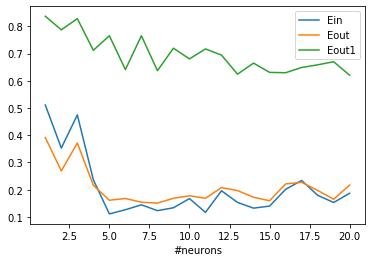

In [13]:
plt.plot(Neurons,Ein,label='Ein')
plt.plot(Neurons,Eout,label='Eout')
plt.plot(Neurons,Eout1,label='Eout1')
plt.xlabel('#neurons')
plt.legend()
plt.show()

Si osserva che fit ($E_{\text{in}}$) e predizioni ($E_{\text{out}}$,$E_{\text{out1}}$) complessivamente tendono a migliorare all'aumentare dei neuroni nel layer. Inoltre le predizioni risultano molto meno efficaci nel caso in cui siano estese a un range più ampio di quello usato per il training. 
Ciò è ben visibile nella figura seguente nella quale è raffigurata la predizione di una rete con un layer e 20 neuroni. 

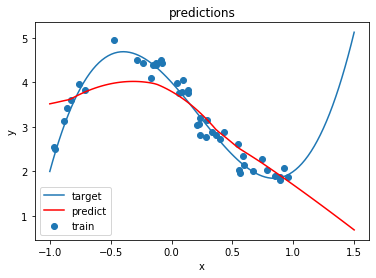

In [16]:
y_pred = model.predict(x)
plt.plot(x, y_target, label='target')
plt.scatter(x_train, y_train, label='train')
plt.plot(x, y_pred, label='predict', color = 'red')
plt.title("predictions")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.show()

### Geometria 2
Ora vediamo come variano le performance per reti neurali con due layer con lo stesso numero di neuroni al variare del numero di neuroni. 

In [17]:
Neurons=np.arange(1,21)
Ein=np.zeros(len(Neurons))
Eout=np.zeros(len(Neurons))
Eout1=np.zeros(len(Neurons))

for i in range(len(Neurons)):
   model = Sequential() 
   model.add(Dense(Neurons[i], input_shape=(1,),activation='selu')) 
   model.add(Dense(Neurons[i], input_shape=(1,),activation='selu')) 
   model.add(Dense(1,activation='selu'))
   Nparams = model.count_params()
   #compile
   model.compile(optimizer='sgd', loss='mse', metrics=['mse']) 
   model.summary()
   # fit
   history = model.fit(x=x_train, y=y_train, 
             batch_size=32, epochs=Ne,
             shuffle=True, # a good idea is to shuffle input before at each epoch
             validation_data=(x_valid, y_valid))
   #evaluate model on training dataset
   score_t = model.evaluate(x_train, y_train, batch_size=32, verbose=1)
   # evaluate model on validation dataset
   score_v = model.evaluate(x_valid, y_valid, batch_size=32, verbose=1)
   score_v1 = model.evaluate(x_valid1, y_valid1, batch_size=32, verbose=1)
   Ein[i] = score_t[0]
   Eout[i] = score_v[0]
   Eout1[i] = score_v1[0] 

Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_41 (Dense)             (None, 1)                 2         
_________________________________________________________________
dense_42 (Dense)             (None, 1)                 2         
_________________________________________________________________
dense_43 (Dense)             (None, 1)                 2         
Total params: 6
Trainable params: 6
Non-trainable params: 0
_________________________________________________________________
Train on 45 samples, validate on 30 samples
Epoch 1/500
45/45 [==============================] - 1s 27ms/sample - loss: 11.9930 - mean_squared_error: 11.9930 - val_loss: 10.2859 - val_mean_squared_error: 10.2859
Epoch 2/500
45/45 [==============================] - 0s 339us/sample - loss: 8.7593 - mean_squared_error: 8.7593 - val_loss: 8.0475 - val_mean_squared_error: 8.0475
Epoch 3/500


Epoch 46/500
45/45 [==============================] - 0s 452us/sample - loss: 0.4869 - mean_squared_error: 0.4869 - val_loss: 0.3633 - val_mean_squared_error: 0.3633
Epoch 47/500
45/45 [==============================] - 0s 330us/sample - loss: 0.4865 - mean_squared_error: 0.4865 - val_loss: 0.3587 - val_mean_squared_error: 0.3587
Epoch 48/500
45/45 [==============================] - 0s 331us/sample - loss: 0.4877 - mean_squared_error: 0.4877 - val_loss: 0.3506 - val_mean_squared_error: 0.3506
Epoch 49/500
45/45 [==============================] - 0s 301us/sample - loss: 0.4866 - mean_squared_error: 0.4866 - val_loss: 0.3515 - val_mean_squared_error: 0.3515
Epoch 50/500
45/45 [==============================] - 0s 330us/sample - loss: 0.4887 - mean_squared_error: 0.4887 - val_loss: 0.3657 - val_mean_squared_error: 0.3657
Epoch 51/500
45/45 [==============================] - 0s 350us/sample - loss: 0.4893 - mean_squared_error: 0.4893 - val_loss: 0.3516 - val_mean_squared_error: 0.3516
Epoc

45/45 [==============================] - 0s 390us/sample - loss: 0.4858 - mean_squared_error: 0.4858 - val_loss: 0.3570 - val_mean_squared_error: 0.3570
Epoch 145/500
45/45 [==============================] - 0s 309us/sample - loss: 0.4857 - mean_squared_error: 0.4857 - val_loss: 0.3582 - val_mean_squared_error: 0.3582
Epoch 146/500
45/45 [==============================] - 0s 337us/sample - loss: 0.4870 - mean_squared_error: 0.4870 - val_loss: 0.3704 - val_mean_squared_error: 0.3704
Epoch 147/500
45/45 [==============================] - 0s 316us/sample - loss: 0.4859 - mean_squared_error: 0.4859 - val_loss: 0.3736 - val_mean_squared_error: 0.3736
Epoch 148/500
45/45 [==============================] - 0s 366us/sample - loss: 0.4868 - mean_squared_error: 0.4868 - val_loss: 0.3802 - val_mean_squared_error: 0.3802
Epoch 149/500
45/45 [==============================] - 0s 335us/sample - loss: 0.4863 - mean_squared_error: 0.4863 - val_loss: 0.3766 - val_mean_squared_error: 0.3766
Epoch 150/50

Epoch 242/500
45/45 [==============================] - 0s 389us/sample - loss: 0.4863 - mean_squared_error: 0.4863 - val_loss: 0.3497 - val_mean_squared_error: 0.3497
Epoch 243/500
45/45 [==============================] - 0s 456us/sample - loss: 0.4859 - mean_squared_error: 0.4859 - val_loss: 0.3455 - val_mean_squared_error: 0.3455
Epoch 244/500
45/45 [==============================] - 0s 288us/sample - loss: 0.4855 - mean_squared_error: 0.4855 - val_loss: 0.3464 - val_mean_squared_error: 0.3464
Epoch 245/500
45/45 [==============================] - 0s 322us/sample - loss: 0.4857 - mean_squared_error: 0.4857 - val_loss: 0.3542 - val_mean_squared_error: 0.3542
Epoch 246/500
45/45 [==============================] - 0s 298us/sample - loss: 0.4849 - mean_squared_error: 0.4849 - val_loss: 0.3526 - val_mean_squared_error: 0.3526
Epoch 247/500
45/45 [==============================] - 0s 310us/sample - loss: 0.4865 - mean_squared_error: 0.4865 - val_loss: 0.3466 - val_mean_squared_error: 0.346

45/45 [==============================] - 0s 336us/sample - loss: 0.4930 - mean_squared_error: 0.4930 - val_loss: 0.3409 - val_mean_squared_error: 0.3409
Epoch 292/500
45/45 [==============================] - 0s 341us/sample - loss: 0.4874 - mean_squared_error: 0.4874 - val_loss: 0.3448 - val_mean_squared_error: 0.3448
Epoch 293/500
45/45 [==============================] - 0s 324us/sample - loss: 0.4875 - mean_squared_error: 0.4875 - val_loss: 0.3580 - val_mean_squared_error: 0.3580
Epoch 294/500
45/45 [==============================] - 0s 317us/sample - loss: 0.4843 - mean_squared_error: 0.4843 - val_loss: 0.3615 - val_mean_squared_error: 0.3615
Epoch 295/500
45/45 [==============================] - 0s 318us/sample - loss: 0.4863 - mean_squared_error: 0.4863 - val_loss: 0.3747 - val_mean_squared_error: 0.3747
Epoch 296/500
45/45 [==============================] - 0s 366us/sample - loss: 0.4886 - mean_squared_error: 0.4886 - val_loss: 0.3903 - val_mean_squared_error: 0.3903
Epoch 297/50

Epoch 340/500
45/45 [==============================] - 0s 309us/sample - loss: 0.4836 - mean_squared_error: 0.4836 - val_loss: 0.3571 - val_mean_squared_error: 0.3571
Epoch 341/500
45/45 [==============================] - 0s 393us/sample - loss: 0.4849 - mean_squared_error: 0.4849 - val_loss: 0.3500 - val_mean_squared_error: 0.3500
Epoch 342/500
45/45 [==============================] - 0s 286us/sample - loss: 0.4840 - mean_squared_error: 0.4840 - val_loss: 0.3521 - val_mean_squared_error: 0.3521
Epoch 343/500
45/45 [==============================] - 0s 328us/sample - loss: 0.4854 - mean_squared_error: 0.4854 - val_loss: 0.3633 - val_mean_squared_error: 0.3633
Epoch 344/500
45/45 [==============================] - 0s 349us/sample - loss: 0.4850 - mean_squared_error: 0.4850 - val_loss: 0.3534 - val_mean_squared_error: 0.3534
Epoch 345/500
45/45 [==============================] - 0s 355us/sample - loss: 0.4855 - mean_squared_error: 0.4855 - val_loss: 0.3656 - val_mean_squared_error: 0.365

45/45 [==============================] - 0s 339us/sample - loss: 0.4861 - mean_squared_error: 0.4861 - val_loss: 0.3435 - val_mean_squared_error: 0.3435
Epoch 390/500
45/45 [==============================] - 0s 377us/sample - loss: 0.4849 - mean_squared_error: 0.4849 - val_loss: 0.3523 - val_mean_squared_error: 0.3523
Epoch 391/500
45/45 [==============================] - 0s 366us/sample - loss: 0.4833 - mean_squared_error: 0.4833 - val_loss: 0.3530 - val_mean_squared_error: 0.3530
Epoch 392/500
45/45 [==============================] - 0s 320us/sample - loss: 0.4873 - mean_squared_error: 0.4873 - val_loss: 0.3424 - val_mean_squared_error: 0.3424
Epoch 393/500
45/45 [==============================] - 0s 363us/sample - loss: 0.4875 - mean_squared_error: 0.4875 - val_loss: 0.3594 - val_mean_squared_error: 0.3594
Epoch 394/500
45/45 [==============================] - 0s 311us/sample - loss: 0.4853 - mean_squared_error: 0.4853 - val_loss: 0.3492 - val_mean_squared_error: 0.3492
Epoch 395/50

Epoch 438/500
45/45 [==============================] - 0s 317us/sample - loss: 0.4838 - mean_squared_error: 0.4838 - val_loss: 0.3495 - val_mean_squared_error: 0.3495
Epoch 439/500
45/45 [==============================] - 0s 333us/sample - loss: 0.4836 - mean_squared_error: 0.4836 - val_loss: 0.3491 - val_mean_squared_error: 0.3491
Epoch 440/500
45/45 [==============================] - 0s 337us/sample - loss: 0.4843 - mean_squared_error: 0.4843 - val_loss: 0.3464 - val_mean_squared_error: 0.3464
Epoch 441/500
45/45 [==============================] - 0s 265us/sample - loss: 0.4853 - mean_squared_error: 0.4853 - val_loss: 0.3434 - val_mean_squared_error: 0.3434
Epoch 442/500
45/45 [==============================] - 0s 313us/sample - loss: 0.4850 - mean_squared_error: 0.4850 - val_loss: 0.3554 - val_mean_squared_error: 0.3554
Epoch 443/500
45/45 [==============================] - 0s 349us/sample - loss: 0.4828 - mean_squared_error: 0.4828 - val_loss: 0.3597 - val_mean_squared_error: 0.359

45/45 [==============================] - 0s 383us/sample - loss: 0.4844 - mean_squared_error: 0.4844 - val_loss: 0.3694 - val_mean_squared_error: 0.3694
Epoch 488/500
45/45 [==============================] - 0s 308us/sample - loss: 0.4829 - mean_squared_error: 0.4829 - val_loss: 0.3618 - val_mean_squared_error: 0.3618
Epoch 489/500
45/45 [==============================] - 0s 358us/sample - loss: 0.4834 - mean_squared_error: 0.4834 - val_loss: 0.3564 - val_mean_squared_error: 0.3564
Epoch 490/500
45/45 [==============================] - 0s 315us/sample - loss: 0.4826 - mean_squared_error: 0.4826 - val_loss: 0.3598 - val_mean_squared_error: 0.3598
Epoch 491/500
45/45 [==============================] - 0s 347us/sample - loss: 0.4828 - mean_squared_error: 0.4828 - val_loss: 0.3667 - val_mean_squared_error: 0.3667
Epoch 492/500
45/45 [==============================] - 0s 320us/sample - loss: 0.4854 - mean_squared_error: 0.4854 - val_loss: 0.3810 - val_mean_squared_error: 0.3810
Epoch 493/50

Epoch 30/500
45/45 [==============================] - 0s 282us/sample - loss: 0.7032 - mean_squared_error: 0.7032 - val_loss: 0.8837 - val_mean_squared_error: 0.8837
Epoch 31/500
45/45 [==============================] - 0s 483us/sample - loss: 0.6925 - mean_squared_error: 0.6925 - val_loss: 0.8670 - val_mean_squared_error: 0.8670
Epoch 32/500
45/45 [==============================] - 0s 299us/sample - loss: 0.6841 - mean_squared_error: 0.6841 - val_loss: 0.8445 - val_mean_squared_error: 0.8445
Epoch 33/500
45/45 [==============================] - 0s 319us/sample - loss: 0.6756 - mean_squared_error: 0.6756 - val_loss: 0.8201 - val_mean_squared_error: 0.8201
Epoch 34/500
45/45 [==============================] - 0s 443us/sample - loss: 0.6664 - mean_squared_error: 0.6664 - val_loss: 0.8039 - val_mean_squared_error: 0.8039
Epoch 35/500
45/45 [==============================] - 0s 361us/sample - loss: 0.6569 - mean_squared_error: 0.6569 - val_loss: 0.7896 - val_mean_squared_error: 0.7896
Epoc

45/45 [==============================] - 0s 340us/sample - loss: 0.3480 - mean_squared_error: 0.3480 - val_loss: 0.2372 - val_mean_squared_error: 0.2372
Epoch 129/500
45/45 [==============================] - 0s 289us/sample - loss: 0.3474 - mean_squared_error: 0.3474 - val_loss: 0.2444 - val_mean_squared_error: 0.2444
Epoch 130/500
45/45 [==============================] - 0s 429us/sample - loss: 0.3446 - mean_squared_error: 0.3446 - val_loss: 0.2494 - val_mean_squared_error: 0.2494
Epoch 131/500
45/45 [==============================] - 0s 374us/sample - loss: 0.3443 - mean_squared_error: 0.3443 - val_loss: 0.2444 - val_mean_squared_error: 0.2444
Epoch 132/500
45/45 [==============================] - 0s 307us/sample - loss: 0.3431 - mean_squared_error: 0.3431 - val_loss: 0.2473 - val_mean_squared_error: 0.2473
Epoch 133/500
45/45 [==============================] - 0s 293us/sample - loss: 0.3432 - mean_squared_error: 0.3432 - val_loss: 0.2439 - val_mean_squared_error: 0.2439
Epoch 134/50

45/45 [==============================] - 0s 346us/sample - loss: 0.3115 - mean_squared_error: 0.3115 - val_loss: 0.2488 - val_mean_squared_error: 0.2488
Epoch 227/500
45/45 [==============================] - 0s 337us/sample - loss: 0.3112 - mean_squared_error: 0.3112 - val_loss: 0.2485 - val_mean_squared_error: 0.2485
Epoch 228/500
45/45 [==============================] - 0s 330us/sample - loss: 0.3115 - mean_squared_error: 0.3115 - val_loss: 0.2434 - val_mean_squared_error: 0.2434
Epoch 229/500
45/45 [==============================] - 0s 419us/sample - loss: 0.3107 - mean_squared_error: 0.3107 - val_loss: 0.2433 - val_mean_squared_error: 0.2433
Epoch 230/500
45/45 [==============================] - 0s 343us/sample - loss: 0.3104 - mean_squared_error: 0.3104 - val_loss: 0.2432 - val_mean_squared_error: 0.2432
Epoch 231/500
45/45 [==============================] - 0s 295us/sample - loss: 0.3105 - mean_squared_error: 0.3105 - val_loss: 0.2420 - val_mean_squared_error: 0.2420
Epoch 232/50

45/45 [==============================] - 0s 364us/sample - loss: 0.2921 - mean_squared_error: 0.2921 - val_loss: 0.2520 - val_mean_squared_error: 0.2520
Epoch 325/500
45/45 [==============================] - 0s 359us/sample - loss: 0.2916 - mean_squared_error: 0.2916 - val_loss: 0.2522 - val_mean_squared_error: 0.2522
Epoch 326/500
45/45 [==============================] - 0s 313us/sample - loss: 0.2925 - mean_squared_error: 0.2925 - val_loss: 0.2577 - val_mean_squared_error: 0.2577
Epoch 327/500
45/45 [==============================] - 0s 335us/sample - loss: 0.2922 - mean_squared_error: 0.2922 - val_loss: 0.2598 - val_mean_squared_error: 0.2598
Epoch 328/500
45/45 [==============================] - 0s 288us/sample - loss: 0.2917 - mean_squared_error: 0.2917 - val_loss: 0.2522 - val_mean_squared_error: 0.2522
Epoch 329/500
45/45 [==============================] - 0s 312us/sample - loss: 0.2904 - mean_squared_error: 0.2904 - val_loss: 0.2499 - val_mean_squared_error: 0.2499
Epoch 330/50

45/45 [==============================] - 0s 381us/sample - loss: 0.2736 - mean_squared_error: 0.2736 - val_loss: 0.2308 - val_mean_squared_error: 0.2308
Epoch 423/500
45/45 [==============================] - 0s 396us/sample - loss: 0.2736 - mean_squared_error: 0.2736 - val_loss: 0.2287 - val_mean_squared_error: 0.2287
Epoch 424/500
45/45 [==============================] - 0s 399us/sample - loss: 0.2730 - mean_squared_error: 0.2730 - val_loss: 0.2329 - val_mean_squared_error: 0.2329
Epoch 425/500
45/45 [==============================] - 0s 310us/sample - loss: 0.2730 - mean_squared_error: 0.2730 - val_loss: 0.2366 - val_mean_squared_error: 0.2366
Epoch 426/500
45/45 [==============================] - 0s 375us/sample - loss: 0.2736 - mean_squared_error: 0.2736 - val_loss: 0.2293 - val_mean_squared_error: 0.2293
Epoch 427/500
45/45 [==============================] - 0s 363us/sample - loss: 0.2721 - mean_squared_error: 0.2721 - val_loss: 0.2330 - val_mean_squared_error: 0.2330
Epoch 428/50

Epoch 14/500
45/45 [==============================] - 0s 334us/sample - loss: 0.3208 - mean_squared_error: 0.3208 - val_loss: 0.3310 - val_mean_squared_error: 0.3310
Epoch 15/500
45/45 [==============================] - 0s 381us/sample - loss: 0.3176 - mean_squared_error: 0.3176 - val_loss: 0.3255 - val_mean_squared_error: 0.3255
Epoch 16/500
45/45 [==============================] - 0s 358us/sample - loss: 0.3143 - mean_squared_error: 0.3143 - val_loss: 0.3191 - val_mean_squared_error: 0.3191
Epoch 17/500
45/45 [==============================] - 0s 318us/sample - loss: 0.3141 - mean_squared_error: 0.3141 - val_loss: 0.2839 - val_mean_squared_error: 0.2839
Epoch 18/500
45/45 [==============================] - 0s 309us/sample - loss: 0.3064 - mean_squared_error: 0.3064 - val_loss: 0.2663 - val_mean_squared_error: 0.2663
Epoch 19/500
45/45 [==============================] - 0s 354us/sample - loss: 0.3013 - mean_squared_error: 0.3013 - val_loss: 0.2652 - val_mean_squared_error: 0.2652
Epoc

45/45 [==============================] - 0s 340us/sample - loss: 0.2044 - mean_squared_error: 0.2044 - val_loss: 0.2395 - val_mean_squared_error: 0.2395
Epoch 113/500
45/45 [==============================] - 0s 320us/sample - loss: 0.2036 - mean_squared_error: 0.2036 - val_loss: 0.2252 - val_mean_squared_error: 0.2252
Epoch 114/500
45/45 [==============================] - 0s 411us/sample - loss: 0.2022 - mean_squared_error: 0.2022 - val_loss: 0.2362 - val_mean_squared_error: 0.2362
Epoch 115/500
45/45 [==============================] - 0s 425us/sample - loss: 0.2000 - mean_squared_error: 0.2000 - val_loss: 0.2328 - val_mean_squared_error: 0.2328
Epoch 116/500
45/45 [==============================] - 0s 305us/sample - loss: 0.1983 - mean_squared_error: 0.1983 - val_loss: 0.2291 - val_mean_squared_error: 0.2291
Epoch 117/500
45/45 [==============================] - 0s 332us/sample - loss: 0.1967 - mean_squared_error: 0.1967 - val_loss: 0.2233 - val_mean_squared_error: 0.2233
Epoch 118/50

Epoch 210/500
45/45 [==============================] - 0s 245us/sample - loss: 0.0874 - mean_squared_error: 0.0874 - val_loss: 0.1840 - val_mean_squared_error: 0.1840
Epoch 211/500
45/45 [==============================] - 0s 311us/sample - loss: 0.0869 - mean_squared_error: 0.0869 - val_loss: 0.1800 - val_mean_squared_error: 0.1800
Epoch 212/500
45/45 [==============================] - 0s 282us/sample - loss: 0.0860 - mean_squared_error: 0.0860 - val_loss: 0.1805 - val_mean_squared_error: 0.1805
Epoch 213/500
45/45 [==============================] - 0s 353us/sample - loss: 0.0855 - mean_squared_error: 0.0855 - val_loss: 0.1819 - val_mean_squared_error: 0.1819
Epoch 214/500
45/45 [==============================] - 0s 338us/sample - loss: 0.0859 - mean_squared_error: 0.0859 - val_loss: 0.1890 - val_mean_squared_error: 0.1890
Epoch 215/500
45/45 [==============================] - 0s 335us/sample - loss: 0.0851 - mean_squared_error: 0.0851 - val_loss: 0.1780 - val_mean_squared_error: 0.178

45/45 [==============================] - 0s 368us/sample - loss: 0.0718 - mean_squared_error: 0.0718 - val_loss: 0.1487 - val_mean_squared_error: 0.1487
Epoch 260/500
45/45 [==============================] - 0s 274us/sample - loss: 0.0713 - mean_squared_error: 0.0713 - val_loss: 0.1422 - val_mean_squared_error: 0.1422
Epoch 261/500
45/45 [==============================] - 0s 275us/sample - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.1349 - val_mean_squared_error: 0.1349
Epoch 262/500
45/45 [==============================] - 0s 506us/sample - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.1415 - val_mean_squared_error: 0.1415
Epoch 263/500
45/45 [==============================] - 0s 289us/sample - loss: 0.0732 - mean_squared_error: 0.0732 - val_loss: 0.1523 - val_mean_squared_error: 0.1523
Epoch 264/500
45/45 [==============================] - 0s 346us/sample - loss: 0.0726 - mean_squared_error: 0.0726 - val_loss: 0.1484 - val_mean_squared_error: 0.1484
Epoch 265/50

45/45 [==============================] - 0s 284us/sample - loss: 0.0657 - mean_squared_error: 0.0657 - val_loss: 0.1412 - val_mean_squared_error: 0.1412
Epoch 358/500
45/45 [==============================] - 0s 295us/sample - loss: 0.0657 - mean_squared_error: 0.0657 - val_loss: 0.1248 - val_mean_squared_error: 0.1248
Epoch 359/500
45/45 [==============================] - 0s 313us/sample - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.1194 - val_mean_squared_error: 0.1194
Epoch 360/500
45/45 [==============================] - 0s 388us/sample - loss: 0.0647 - mean_squared_error: 0.0647 - val_loss: 0.1235 - val_mean_squared_error: 0.1235
Epoch 361/500
45/45 [==============================] - 0s 326us/sample - loss: 0.0643 - mean_squared_error: 0.0643 - val_loss: 0.1263 - val_mean_squared_error: 0.1263
Epoch 362/500
45/45 [==============================] - 0s 325us/sample - loss: 0.0642 - mean_squared_error: 0.0642 - val_loss: 0.1232 - val_mean_squared_error: 0.1232
Epoch 363/50

45/45 [==============================] - 0s 379us/sample - loss: 0.0609 - mean_squared_error: 0.0609 - val_loss: 0.1077 - val_mean_squared_error: 0.1077
Epoch 456/500
45/45 [==============================] - 0s 349us/sample - loss: 0.0612 - mean_squared_error: 0.0612 - val_loss: 0.1036 - val_mean_squared_error: 0.1036
Epoch 457/500
45/45 [==============================] - 0s 371us/sample - loss: 0.0612 - mean_squared_error: 0.0612 - val_loss: 0.1079 - val_mean_squared_error: 0.1079
Epoch 458/500
45/45 [==============================] - 0s 323us/sample - loss: 0.0610 - mean_squared_error: 0.0610 - val_loss: 0.1069 - val_mean_squared_error: 0.1069
Epoch 459/500
45/45 [==============================] - 0s 317us/sample - loss: 0.0610 - mean_squared_error: 0.0610 - val_loss: 0.1036 - val_mean_squared_error: 0.1036
Epoch 460/500
45/45 [==============================] - 0s 313us/sample - loss: 0.0610 - mean_squared_error: 0.0610 - val_loss: 0.1083 - val_mean_squared_error: 0.1083
Epoch 461/50

Epoch 1/500
45/45 [==============================] - 1s 12ms/sample - loss: 11.8828 - mean_squared_error: 11.8828 - val_loss: 5.6032 - val_mean_squared_error: 5.6032
Epoch 2/500
45/45 [==============================] - 0s 350us/sample - loss: 4.7569 - mean_squared_error: 4.7569 - val_loss: 2.5392 - val_mean_squared_error: 2.5392
Epoch 3/500
45/45 [==============================] - 0s 345us/sample - loss: 2.0940 - mean_squared_error: 2.0940 - val_loss: 1.2986 - val_mean_squared_error: 1.2986
Epoch 4/500
45/45 [==============================] - 0s 288us/sample - loss: 1.0612 - mean_squared_error: 1.0612 - val_loss: 0.7135 - val_mean_squared_error: 0.7135
Epoch 5/500
45/45 [==============================] - 0s 257us/sample - loss: 0.6382 - mean_squared_error: 0.6382 - val_loss: 0.4648 - val_mean_squared_error: 0.4648
Epoch 6/500
45/45 [==============================] - 0s 327us/sample - loss: 0.4924 - mean_squared_error: 0.4924 - val_loss: 0.3668 - val_mean_squared_error: 0.3668
Epoch 7/5

45/45 [==============================] - 0s 298us/sample - loss: 0.3714 - mean_squared_error: 0.3714 - val_loss: 0.2822 - val_mean_squared_error: 0.2822
Epoch 100/500
45/45 [==============================] - 0s 282us/sample - loss: 0.3686 - mean_squared_error: 0.3686 - val_loss: 0.2951 - val_mean_squared_error: 0.2951
Epoch 101/500
45/45 [==============================] - 0s 453us/sample - loss: 0.3670 - mean_squared_error: 0.3670 - val_loss: 0.3050 - val_mean_squared_error: 0.3050
Epoch 102/500
45/45 [==============================] - 0s 321us/sample - loss: 0.3656 - mean_squared_error: 0.3656 - val_loss: 0.3021 - val_mean_squared_error: 0.3021
Epoch 103/500
45/45 [==============================] - 0s 320us/sample - loss: 0.3776 - mean_squared_error: 0.3776 - val_loss: 0.2691 - val_mean_squared_error: 0.2691
Epoch 104/500
45/45 [==============================] - 0s 317us/sample - loss: 0.3760 - mean_squared_error: 0.3760 - val_loss: 0.3114 - val_mean_squared_error: 0.3114
Epoch 105/50

45/45 [==============================] - 0s 353us/sample - loss: 0.2352 - mean_squared_error: 0.2352 - val_loss: 0.2379 - val_mean_squared_error: 0.2379
Epoch 198/500
45/45 [==============================] - 0s 380us/sample - loss: 0.2347 - mean_squared_error: 0.2347 - val_loss: 0.2158 - val_mean_squared_error: 0.2158
Epoch 199/500
45/45 [==============================] - 0s 417us/sample - loss: 0.2334 - mean_squared_error: 0.2334 - val_loss: 0.2133 - val_mean_squared_error: 0.2133
Epoch 200/500
45/45 [==============================] - 0s 319us/sample - loss: 0.2320 - mean_squared_error: 0.2320 - val_loss: 0.2178 - val_mean_squared_error: 0.2178
Epoch 201/500
45/45 [==============================] - 0s 323us/sample - loss: 0.2320 - mean_squared_error: 0.2320 - val_loss: 0.2078 - val_mean_squared_error: 0.2078
Epoch 202/500
45/45 [==============================] - 0s 314us/sample - loss: 0.2312 - mean_squared_error: 0.2312 - val_loss: 0.2157 - val_mean_squared_error: 0.2157
Epoch 203/50

Epoch 295/500
45/45 [==============================] - 0s 358us/sample - loss: 0.1363 - mean_squared_error: 0.1363 - val_loss: 0.1648 - val_mean_squared_error: 0.1648
Epoch 296/500
45/45 [==============================] - 0s 360us/sample - loss: 0.1363 - mean_squared_error: 0.1363 - val_loss: 0.1553 - val_mean_squared_error: 0.1553
Epoch 297/500
45/45 [==============================] - 0s 296us/sample - loss: 0.1353 - mean_squared_error: 0.1353 - val_loss: 0.1699 - val_mean_squared_error: 0.1699
Epoch 298/500
45/45 [==============================] - 0s 322us/sample - loss: 0.1336 - mean_squared_error: 0.1336 - val_loss: 0.1723 - val_mean_squared_error: 0.1723
Epoch 299/500
45/45 [==============================] - 0s 431us/sample - loss: 0.1336 - mean_squared_error: 0.1336 - val_loss: 0.1659 - val_mean_squared_error: 0.1659
Epoch 300/500
45/45 [==============================] - 0s 480us/sample - loss: 0.1329 - mean_squared_error: 0.1329 - val_loss: 0.1791 - val_mean_squared_error: 0.179

45/45 [==============================] - 0s 311us/sample - loss: 0.0917 - mean_squared_error: 0.0917 - val_loss: 0.1212 - val_mean_squared_error: 0.1212
Epoch 393/500
45/45 [==============================] - 0s 260us/sample - loss: 0.0893 - mean_squared_error: 0.0893 - val_loss: 0.1327 - val_mean_squared_error: 0.1327
Epoch 394/500
45/45 [==============================] - 0s 256us/sample - loss: 0.0893 - mean_squared_error: 0.0893 - val_loss: 0.1245 - val_mean_squared_error: 0.1245
Epoch 395/500
45/45 [==============================] - 0s 176us/sample - loss: 0.0899 - mean_squared_error: 0.0899 - val_loss: 0.1360 - val_mean_squared_error: 0.1360
Epoch 396/500
45/45 [==============================] - 0s 193us/sample - loss: 0.0903 - mean_squared_error: 0.0903 - val_loss: 0.1222 - val_mean_squared_error: 0.1222
Epoch 397/500
45/45 [==============================] - 0s 202us/sample - loss: 0.0918 - mean_squared_error: 0.0918 - val_loss: 0.1044 - val_mean_squared_error: 0.1044
Epoch 398/50

Epoch 441/500
45/45 [==============================] - 0s 216us/sample - loss: 0.0775 - mean_squared_error: 0.0775 - val_loss: 0.1180 - val_mean_squared_error: 0.1180
Epoch 442/500
45/45 [==============================] - 0s 205us/sample - loss: 0.0776 - mean_squared_error: 0.0776 - val_loss: 0.1152 - val_mean_squared_error: 0.1152
Epoch 443/500
45/45 [==============================] - 0s 207us/sample - loss: 0.0774 - mean_squared_error: 0.0774 - val_loss: 0.1106 - val_mean_squared_error: 0.1106
Epoch 444/500
45/45 [==============================] - 0s 171us/sample - loss: 0.0772 - mean_squared_error: 0.0772 - val_loss: 0.1248 - val_mean_squared_error: 0.1248
Epoch 445/500
45/45 [==============================] - 0s 186us/sample - loss: 0.0779 - mean_squared_error: 0.0779 - val_loss: 0.1092 - val_mean_squared_error: 0.1092
Epoch 446/500
45/45 [==============================] - 0s 176us/sample - loss: 0.0797 - mean_squared_error: 0.0797 - val_loss: 0.0988 - val_mean_squared_error: 0.098

45/45 [==============================] - 0s 210us/sample - loss: 0.0724 - mean_squared_error: 0.0724 - val_loss: 0.1410 - val_mean_squared_error: 0.1410
Epoch 491/500
45/45 [==============================] - 0s 231us/sample - loss: 0.0711 - mean_squared_error: 0.0711 - val_loss: 0.1295 - val_mean_squared_error: 0.1295
Epoch 492/500
45/45 [==============================] - 0s 179us/sample - loss: 0.0722 - mean_squared_error: 0.0722 - val_loss: 0.1019 - val_mean_squared_error: 0.1019
Epoch 493/500
45/45 [==============================] - 0s 248us/sample - loss: 0.0699 - mean_squared_error: 0.0699 - val_loss: 0.1083 - val_mean_squared_error: 0.1083
Epoch 494/500
45/45 [==============================] - 0s 274us/sample - loss: 0.0699 - mean_squared_error: 0.0699 - val_loss: 0.1190 - val_mean_squared_error: 0.1190
Epoch 495/500
45/45 [==============================] - 0s 224us/sample - loss: 0.0696 - mean_squared_error: 0.0696 - val_loss: 0.1154 - val_mean_squared_error: 0.1154
Epoch 496/50

Epoch 33/500
45/45 [==============================] - 0s 312us/sample - loss: 0.2236 - mean_squared_error: 0.2236 - val_loss: 0.2130 - val_mean_squared_error: 0.2130
Epoch 34/500
45/45 [==============================] - 0s 322us/sample - loss: 0.2229 - mean_squared_error: 0.2229 - val_loss: 0.2171 - val_mean_squared_error: 0.2171
Epoch 35/500
45/45 [==============================] - 0s 296us/sample - loss: 0.2223 - mean_squared_error: 0.2223 - val_loss: 0.2045 - val_mean_squared_error: 0.2045
Epoch 36/500
45/45 [==============================] - 0s 325us/sample - loss: 0.2196 - mean_squared_error: 0.2196 - val_loss: 0.2033 - val_mean_squared_error: 0.2033
Epoch 37/500
45/45 [==============================] - 0s 307us/sample - loss: 0.2187 - mean_squared_error: 0.2187 - val_loss: 0.2091 - val_mean_squared_error: 0.2091
Epoch 38/500
45/45 [==============================] - 0s 398us/sample - loss: 0.2165 - mean_squared_error: 0.2165 - val_loss: 0.2061 - val_mean_squared_error: 0.2061
Epoc

45/45 [==============================] - 0s 370us/sample - loss: 0.0915 - mean_squared_error: 0.0915 - val_loss: 0.1369 - val_mean_squared_error: 0.1369
Epoch 132/500
45/45 [==============================] - 0s 408us/sample - loss: 0.0911 - mean_squared_error: 0.0911 - val_loss: 0.1347 - val_mean_squared_error: 0.1347
Epoch 133/500
45/45 [==============================] - 0s 376us/sample - loss: 0.0897 - mean_squared_error: 0.0897 - val_loss: 0.1368 - val_mean_squared_error: 0.1368
Epoch 134/500
45/45 [==============================] - 0s 336us/sample - loss: 0.0891 - mean_squared_error: 0.0891 - val_loss: 0.1479 - val_mean_squared_error: 0.1479
Epoch 135/500
45/45 [==============================] - 0s 327us/sample - loss: 0.0880 - mean_squared_error: 0.0880 - val_loss: 0.1406 - val_mean_squared_error: 0.1406
Epoch 136/500
45/45 [==============================] - 0s 356us/sample - loss: 0.0868 - mean_squared_error: 0.0868 - val_loss: 0.1429 - val_mean_squared_error: 0.1429
Epoch 137/50

45/45 [==============================] - 0s 353us/sample - loss: 0.0643 - mean_squared_error: 0.0643 - val_loss: 0.1037 - val_mean_squared_error: 0.1037
Epoch 230/500
45/45 [==============================] - 0s 380us/sample - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.1025 - val_mean_squared_error: 0.1025
Epoch 231/500
45/45 [==============================] - 0s 444us/sample - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.1063 - val_mean_squared_error: 0.1063
Epoch 232/500
45/45 [==============================] - 0s 404us/sample - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.1034 - val_mean_squared_error: 0.1034
Epoch 233/500
45/45 [==============================] - 0s 366us/sample - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.1091 - val_mean_squared_error: 0.1091
Epoch 234/500
45/45 [==============================] - 0s 295us/sample - loss: 0.0641 - mean_squared_error: 0.0641 - val_loss: 0.1209 - val_mean_squared_error: 0.1209
Epoch 235/50

45/45 [==============================] - 0s 332us/sample - loss: 0.0560 - mean_squared_error: 0.0560 - val_loss: 0.1044 - val_mean_squared_error: 0.1044
Epoch 328/500
45/45 [==============================] - 0s 318us/sample - loss: 0.0556 - mean_squared_error: 0.0556 - val_loss: 0.0997 - val_mean_squared_error: 0.0997
Epoch 329/500
45/45 [==============================] - 0s 366us/sample - loss: 0.0576 - mean_squared_error: 0.0576 - val_loss: 0.0991 - val_mean_squared_error: 0.0991
Epoch 330/500
45/45 [==============================] - 0s 369us/sample - loss: 0.0573 - mean_squared_error: 0.0573 - val_loss: 0.0975 - val_mean_squared_error: 0.0975
Epoch 331/500
45/45 [==============================] - 0s 393us/sample - loss: 0.0591 - mean_squared_error: 0.0591 - val_loss: 0.1025 - val_mean_squared_error: 0.1025
Epoch 332/500
45/45 [==============================] - 0s 363us/sample - loss: 0.0597 - mean_squared_error: 0.0597 - val_loss: 0.1013 - val_mean_squared_error: 0.1013
Epoch 333/50

45/45 [==============================] - 0s 276us/sample - loss: 0.0524 - mean_squared_error: 0.0524 - val_loss: 0.1015 - val_mean_squared_error: 0.1015
Epoch 426/500
45/45 [==============================] - 0s 461us/sample - loss: 0.0525 - mean_squared_error: 0.0525 - val_loss: 0.1035 - val_mean_squared_error: 0.1035
Epoch 427/500
45/45 [==============================] - 0s 333us/sample - loss: 0.0524 - mean_squared_error: 0.0524 - val_loss: 0.1020 - val_mean_squared_error: 0.1020
Epoch 428/500
45/45 [==============================] - 0s 242us/sample - loss: 0.0529 - mean_squared_error: 0.0529 - val_loss: 0.0945 - val_mean_squared_error: 0.0945
Epoch 429/500
45/45 [==============================] - 0s 299us/sample - loss: 0.0526 - mean_squared_error: 0.0526 - val_loss: 0.0941 - val_mean_squared_error: 0.0941
Epoch 430/500
45/45 [==============================] - 0s 382us/sample - loss: 0.0524 - mean_squared_error: 0.0524 - val_loss: 0.0940 - val_mean_squared_error: 0.0940
Epoch 431/50

45/45 [==============================] - 0s 312us/sample - loss: 0.4798 - mean_squared_error: 0.4798 - val_loss: 0.5903 - val_mean_squared_error: 0.5903
Epoch 17/500
45/45 [==============================] - 0s 377us/sample - loss: 0.4603 - mean_squared_error: 0.4603 - val_loss: 0.5208 - val_mean_squared_error: 0.5208
Epoch 18/500
45/45 [==============================] - 0s 403us/sample - loss: 0.4366 - mean_squared_error: 0.4366 - val_loss: 0.5021 - val_mean_squared_error: 0.5021
Epoch 19/500
45/45 [==============================] - 0s 336us/sample - loss: 0.4200 - mean_squared_error: 0.4200 - val_loss: 0.4767 - val_mean_squared_error: 0.4767
Epoch 20/500
45/45 [==============================] - 0s 320us/sample - loss: 0.4076 - mean_squared_error: 0.4076 - val_loss: 0.4560 - val_mean_squared_error: 0.4560
Epoch 21/500
45/45 [==============================] - 0s 380us/sample - loss: 0.3950 - mean_squared_error: 0.3950 - val_loss: 0.4308 - val_mean_squared_error: 0.4308
Epoch 22/500
45/4

45/45 [==============================] - 0s 351us/sample - loss: 0.2176 - mean_squared_error: 0.2176 - val_loss: 0.2115 - val_mean_squared_error: 0.2115
Epoch 115/500
45/45 [==============================] - 0s 373us/sample - loss: 0.2185 - mean_squared_error: 0.2185 - val_loss: 0.2037 - val_mean_squared_error: 0.2037
Epoch 116/500
45/45 [==============================] - 0s 417us/sample - loss: 0.2127 - mean_squared_error: 0.2127 - val_loss: 0.2117 - val_mean_squared_error: 0.2117
Epoch 117/500
45/45 [==============================] - 0s 363us/sample - loss: 0.2122 - mean_squared_error: 0.2122 - val_loss: 0.2044 - val_mean_squared_error: 0.2044
Epoch 118/500
45/45 [==============================] - 0s 345us/sample - loss: 0.2095 - mean_squared_error: 0.2095 - val_loss: 0.2062 - val_mean_squared_error: 0.2062
Epoch 119/500
45/45 [==============================] - 0s 313us/sample - loss: 0.2061 - mean_squared_error: 0.2061 - val_loss: 0.2183 - val_mean_squared_error: 0.2183
Epoch 120/50

45/45 [==============================] - 0s 365us/sample - loss: 0.0991 - mean_squared_error: 0.0991 - val_loss: 0.1454 - val_mean_squared_error: 0.1454
Epoch 213/500
45/45 [==============================] - 0s 437us/sample - loss: 0.0988 - mean_squared_error: 0.0988 - val_loss: 0.1413 - val_mean_squared_error: 0.1413
Epoch 214/500
45/45 [==============================] - 0s 344us/sample - loss: 0.0969 - mean_squared_error: 0.0969 - val_loss: 0.1344 - val_mean_squared_error: 0.1344
Epoch 215/500
45/45 [==============================] - 0s 413us/sample - loss: 0.0964 - mean_squared_error: 0.0964 - val_loss: 0.1456 - val_mean_squared_error: 0.1456
Epoch 216/500
45/45 [==============================] - 0s 308us/sample - loss: 0.0966 - mean_squared_error: 0.0966 - val_loss: 0.1269 - val_mean_squared_error: 0.1269
Epoch 217/500
45/45 [==============================] - 0s 399us/sample - loss: 0.0950 - mean_squared_error: 0.0950 - val_loss: 0.1290 - val_mean_squared_error: 0.1290
Epoch 218/50

Epoch 261/500
45/45 [==============================] - 0s 394us/sample - loss: 0.0737 - mean_squared_error: 0.0737 - val_loss: 0.1096 - val_mean_squared_error: 0.1096
Epoch 262/500
45/45 [==============================] - 0s 358us/sample - loss: 0.0730 - mean_squared_error: 0.0730 - val_loss: 0.1169 - val_mean_squared_error: 0.1169
Epoch 263/500
45/45 [==============================] - 0s 252us/sample - loss: 0.0744 - mean_squared_error: 0.0744 - val_loss: 0.1110 - val_mean_squared_error: 0.1110
Epoch 264/500
45/45 [==============================] - 0s 436us/sample - loss: 0.0729 - mean_squared_error: 0.0729 - val_loss: 0.1067 - val_mean_squared_error: 0.1067
Epoch 265/500
45/45 [==============================] - 0s 389us/sample - loss: 0.0728 - mean_squared_error: 0.0728 - val_loss: 0.1192 - val_mean_squared_error: 0.1192
Epoch 266/500
45/45 [==============================] - 0s 363us/sample - loss: 0.0721 - mean_squared_error: 0.0721 - val_loss: 0.1170 - val_mean_squared_error: 0.117

45/45 [==============================] - 0s 340us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.1031 - val_mean_squared_error: 0.1031
Epoch 311/500
45/45 [==============================] - 0s 365us/sample - loss: 0.0578 - mean_squared_error: 0.0578 - val_loss: 0.1017 - val_mean_squared_error: 0.1017
Epoch 312/500
45/45 [==============================] - 0s 419us/sample - loss: 0.0579 - mean_squared_error: 0.0579 - val_loss: 0.1004 - val_mean_squared_error: 0.1004
Epoch 313/500
45/45 [==============================] - 0s 371us/sample - loss: 0.0571 - mean_squared_error: 0.0571 - val_loss: 0.1027 - val_mean_squared_error: 0.1027
Epoch 314/500
45/45 [==============================] - 0s 389us/sample - loss: 0.0569 - mean_squared_error: 0.0569 - val_loss: 0.1010 - val_mean_squared_error: 0.1010
Epoch 315/500
45/45 [==============================] - 0s 366us/sample - loss: 0.0567 - mean_squared_error: 0.0567 - val_loss: 0.1022 - val_mean_squared_error: 0.1022
Epoch 316/50

45/45 [==============================] - 0s 255us/sample - loss: 0.0509 - mean_squared_error: 0.0509 - val_loss: 0.0998 - val_mean_squared_error: 0.0998
Epoch 409/500
45/45 [==============================] - 0s 331us/sample - loss: 0.0505 - mean_squared_error: 0.0505 - val_loss: 0.0939 - val_mean_squared_error: 0.0939
Epoch 410/500
45/45 [==============================] - 0s 290us/sample - loss: 0.0501 - mean_squared_error: 0.0501 - val_loss: 0.0918 - val_mean_squared_error: 0.0918
Epoch 411/500
45/45 [==============================] - 0s 380us/sample - loss: 0.0506 - mean_squared_error: 0.0506 - val_loss: 0.0958 - val_mean_squared_error: 0.0958
Epoch 412/500
45/45 [==============================] - 0s 415us/sample - loss: 0.0507 - mean_squared_error: 0.0507 - val_loss: 0.0955 - val_mean_squared_error: 0.0955
Epoch 413/500
45/45 [==============================] - 0s 317us/sample - loss: 0.0512 - mean_squared_error: 0.0512 - val_loss: 0.0886 - val_mean_squared_error: 0.0886
Epoch 414/50

_________________________________________________________________
Train on 45 samples, validate on 30 samples
Epoch 1/500
45/45 [==============================] - 1s 12ms/sample - loss: 10.4673 - mean_squared_error: 10.4673 - val_loss: 10.3421 - val_mean_squared_error: 10.3421
Epoch 2/500
45/45 [==============================] - 0s 337us/sample - loss: 6.1960 - mean_squared_error: 6.1960 - val_loss: 7.9189 - val_mean_squared_error: 7.9189
Epoch 3/500
45/45 [==============================] - 0s 343us/sample - loss: 4.5043 - mean_squared_error: 4.5043 - val_loss: 6.1821 - val_mean_squared_error: 6.1821
Epoch 4/500
45/45 [==============================] - 0s 323us/sample - loss: 3.3708 - mean_squared_error: 3.3708 - val_loss: 4.8914 - val_mean_squared_error: 4.8914
Epoch 5/500
45/45 [==============================] - 0s 352us/sample - loss: 2.5724 - mean_squared_error: 2.5724 - val_loss: 3.8816 - val_mean_squared_error: 3.8816
Epoch 6/500
45/45 [==============================] - 0s 336us/

Epoch 50/500
45/45 [==============================] - 0s 313us/sample - loss: 0.3102 - mean_squared_error: 0.3102 - val_loss: 0.2426 - val_mean_squared_error: 0.2426
Epoch 51/500
45/45 [==============================] - 0s 337us/sample - loss: 0.3100 - mean_squared_error: 0.3100 - val_loss: 0.2527 - val_mean_squared_error: 0.2527
Epoch 52/500
45/45 [==============================] - 0s 291us/sample - loss: 0.3065 - mean_squared_error: 0.3065 - val_loss: 0.2523 - val_mean_squared_error: 0.2523
Epoch 53/500
45/45 [==============================] - 0s 262us/sample - loss: 0.3057 - mean_squared_error: 0.3057 - val_loss: 0.2572 - val_mean_squared_error: 0.2572
Epoch 54/500
45/45 [==============================] - 0s 350us/sample - loss: 0.3028 - mean_squared_error: 0.3028 - val_loss: 0.2545 - val_mean_squared_error: 0.2545
Epoch 55/500
45/45 [==============================] - 0s 373us/sample - loss: 0.3011 - mean_squared_error: 0.3011 - val_loss: 0.2542 - val_mean_squared_error: 0.2542
Epoc

45/45 [==============================] - 0s 327us/sample - loss: 0.1542 - mean_squared_error: 0.1542 - val_loss: 0.2188 - val_mean_squared_error: 0.2188
Epoch 149/500
45/45 [==============================] - 0s 299us/sample - loss: 0.1534 - mean_squared_error: 0.1534 - val_loss: 0.2148 - val_mean_squared_error: 0.2148
Epoch 150/500
45/45 [==============================] - 0s 414us/sample - loss: 0.1541 - mean_squared_error: 0.1541 - val_loss: 0.2037 - val_mean_squared_error: 0.2037
Epoch 151/500
45/45 [==============================] - 0s 417us/sample - loss: 0.1523 - mean_squared_error: 0.1523 - val_loss: 0.2074 - val_mean_squared_error: 0.2074
Epoch 152/500
45/45 [==============================] - 0s 329us/sample - loss: 0.1512 - mean_squared_error: 0.1512 - val_loss: 0.2032 - val_mean_squared_error: 0.2032
Epoch 153/500
45/45 [==============================] - 0s 351us/sample - loss: 0.1506 - mean_squared_error: 0.1506 - val_loss: 0.1983 - val_mean_squared_error: 0.1983
Epoch 154/50

45/45 [==============================] - 0s 315us/sample - loss: 0.0954 - mean_squared_error: 0.0954 - val_loss: 0.1484 - val_mean_squared_error: 0.1484
Epoch 247/500
45/45 [==============================] - 0s 454us/sample - loss: 0.0948 - mean_squared_error: 0.0948 - val_loss: 0.1471 - val_mean_squared_error: 0.1471
Epoch 248/500
45/45 [==============================] - 0s 336us/sample - loss: 0.0946 - mean_squared_error: 0.0946 - val_loss: 0.1499 - val_mean_squared_error: 0.1499
Epoch 249/500
45/45 [==============================] - 0s 343us/sample - loss: 0.0941 - mean_squared_error: 0.0941 - val_loss: 0.1449 - val_mean_squared_error: 0.1449
Epoch 250/500
45/45 [==============================] - 0s 371us/sample - loss: 0.0944 - mean_squared_error: 0.0944 - val_loss: 0.1381 - val_mean_squared_error: 0.1381
Epoch 251/500
45/45 [==============================] - 0s 353us/sample - loss: 0.0934 - mean_squared_error: 0.0934 - val_loss: 0.1388 - val_mean_squared_error: 0.1388
Epoch 252/50

Epoch 344/500
45/45 [==============================] - 0s 330us/sample - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.1330 - val_mean_squared_error: 0.1330
Epoch 345/500
45/45 [==============================] - 0s 295us/sample - loss: 0.0771 - mean_squared_error: 0.0771 - val_loss: 0.1372 - val_mean_squared_error: 0.1372
Epoch 346/500
45/45 [==============================] - 0s 300us/sample - loss: 0.0767 - mean_squared_error: 0.0767 - val_loss: 0.1294 - val_mean_squared_error: 0.1294
Epoch 347/500
45/45 [==============================] - 0s 340us/sample - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.1258 - val_mean_squared_error: 0.1258
Epoch 348/500
45/45 [==============================] - 0s 364us/sample - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.1330 - val_mean_squared_error: 0.1330
Epoch 349/500
45/45 [==============================] - 0s 327us/sample - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.1357 - val_mean_squared_error: 0.135

45/45 [==============================] - 0s 290us/sample - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.1154 - val_mean_squared_error: 0.1154
Epoch 394/500
45/45 [==============================] - 0s 402us/sample - loss: 0.0764 - mean_squared_error: 0.0764 - val_loss: 0.1177 - val_mean_squared_error: 0.1177
Epoch 395/500
45/45 [==============================] - 0s 398us/sample - loss: 0.0743 - mean_squared_error: 0.0743 - val_loss: 0.1171 - val_mean_squared_error: 0.1171
Epoch 396/500
45/45 [==============================] - 0s 393us/sample - loss: 0.0736 - mean_squared_error: 0.0736 - val_loss: 0.1179 - val_mean_squared_error: 0.1179
Epoch 397/500
45/45 [==============================] - 0s 317us/sample - loss: 0.0735 - mean_squared_error: 0.0735 - val_loss: 0.1222 - val_mean_squared_error: 0.1222
Epoch 398/500
45/45 [==============================] - 0s 468us/sample - loss: 0.0736 - mean_squared_error: 0.0736 - val_loss: 0.1190 - val_mean_squared_error: 0.1190
Epoch 399/50

45/45 [==============================] - 0s 393us/sample - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.1223 - val_mean_squared_error: 0.1223
Epoch 492/500
45/45 [==============================] - 0s 451us/sample - loss: 0.0714 - mean_squared_error: 0.0714 - val_loss: 0.1154 - val_mean_squared_error: 0.1154
Epoch 493/500
45/45 [==============================] - 0s 350us/sample - loss: 0.0720 - mean_squared_error: 0.0720 - val_loss: 0.1224 - val_mean_squared_error: 0.1224
Epoch 494/500
45/45 [==============================] - 0s 395us/sample - loss: 0.0720 - mean_squared_error: 0.0720 - val_loss: 0.1164 - val_mean_squared_error: 0.1164
Epoch 495/500
45/45 [==============================] - 0s 351us/sample - loss: 0.0721 - mean_squared_error: 0.0721 - val_loss: 0.1260 - val_mean_squared_error: 0.1260
Epoch 496/500
45/45 [==============================] - 0s 341us/sample - loss: 0.0719 - mean_squared_error: 0.0719 - val_loss: 0.1206 - val_mean_squared_error: 0.1206
Epoch 497/50

Epoch 34/500
45/45 [==============================] - 0s 374us/sample - loss: 0.3920 - mean_squared_error: 0.3920 - val_loss: 0.3111 - val_mean_squared_error: 0.3111
Epoch 35/500
45/45 [==============================] - 0s 293us/sample - loss: 0.3906 - mean_squared_error: 0.3906 - val_loss: 0.2927 - val_mean_squared_error: 0.2927
Epoch 36/500
45/45 [==============================] - 0s 396us/sample - loss: 0.3882 - mean_squared_error: 0.3882 - val_loss: 0.3060 - val_mean_squared_error: 0.3060
Epoch 37/500
45/45 [==============================] - 0s 299us/sample - loss: 0.3855 - mean_squared_error: 0.3855 - val_loss: 0.2961 - val_mean_squared_error: 0.2961
Epoch 38/500
45/45 [==============================] - 0s 336us/sample - loss: 0.3837 - mean_squared_error: 0.3837 - val_loss: 0.2875 - val_mean_squared_error: 0.2875
Epoch 39/500
45/45 [==============================] - 0s 369us/sample - loss: 0.3810 - mean_squared_error: 0.3810 - val_loss: 0.2854 - val_mean_squared_error: 0.2854
Epoc

45/45 [==============================] - 0s 397us/sample - loss: 0.2526 - mean_squared_error: 0.2526 - val_loss: 0.2192 - val_mean_squared_error: 0.2192
Epoch 133/500
45/45 [==============================] - 0s 316us/sample - loss: 0.2509 - mean_squared_error: 0.2509 - val_loss: 0.2238 - val_mean_squared_error: 0.2238
Epoch 134/500
45/45 [==============================] - 0s 378us/sample - loss: 0.2626 - mean_squared_error: 0.2626 - val_loss: 0.2656 - val_mean_squared_error: 0.2656
Epoch 135/500
45/45 [==============================] - 0s 296us/sample - loss: 0.2546 - mean_squared_error: 0.2546 - val_loss: 0.2406 - val_mean_squared_error: 0.2406
Epoch 136/500
45/45 [==============================] - 0s 380us/sample - loss: 0.2479 - mean_squared_error: 0.2479 - val_loss: 0.2314 - val_mean_squared_error: 0.2314
Epoch 137/500
45/45 [==============================] - 0s 328us/sample - loss: 0.2461 - mean_squared_error: 0.2461 - val_loss: 0.2296 - val_mean_squared_error: 0.2296
Epoch 138/50

45/45 [==============================] - 0s 369us/sample - loss: 0.1537 - mean_squared_error: 0.1537 - val_loss: 0.1904 - val_mean_squared_error: 0.1904
Epoch 231/500
45/45 [==============================] - 0s 313us/sample - loss: 0.1539 - mean_squared_error: 0.1539 - val_loss: 0.1975 - val_mean_squared_error: 0.1975
Epoch 232/500
45/45 [==============================] - 0s 351us/sample - loss: 0.1527 - mean_squared_error: 0.1527 - val_loss: 0.1908 - val_mean_squared_error: 0.1908
Epoch 233/500
45/45 [==============================] - 0s 333us/sample - loss: 0.1499 - mean_squared_error: 0.1499 - val_loss: 0.1893 - val_mean_squared_error: 0.1893
Epoch 234/500
45/45 [==============================] - 0s 380us/sample - loss: 0.1498 - mean_squared_error: 0.1498 - val_loss: 0.1956 - val_mean_squared_error: 0.1956
Epoch 235/500
45/45 [==============================] - 0s 387us/sample - loss: 0.1482 - mean_squared_error: 0.1482 - val_loss: 0.1799 - val_mean_squared_error: 0.1799
Epoch 236/50

45/45 [==============================] - 0s 389us/sample - loss: 0.0905 - mean_squared_error: 0.0905 - val_loss: 0.1335 - val_mean_squared_error: 0.1335
Epoch 329/500
45/45 [==============================] - 0s 382us/sample - loss: 0.0899 - mean_squared_error: 0.0899 - val_loss: 0.1381 - val_mean_squared_error: 0.1381
Epoch 330/500
45/45 [==============================] - 0s 391us/sample - loss: 0.0895 - mean_squared_error: 0.0895 - val_loss: 0.1342 - val_mean_squared_error: 0.1342
Epoch 331/500
45/45 [==============================] - 0s 423us/sample - loss: 0.0916 - mean_squared_error: 0.0916 - val_loss: 0.1212 - val_mean_squared_error: 0.1212
Epoch 332/500
45/45 [==============================] - 0s 390us/sample - loss: 0.0904 - mean_squared_error: 0.0904 - val_loss: 0.1288 - val_mean_squared_error: 0.1288
Epoch 333/500
45/45 [==============================] - 0s 372us/sample - loss: 0.0887 - mean_squared_error: 0.0887 - val_loss: 0.1306 - val_mean_squared_error: 0.1306
Epoch 334/50

Epoch 377/500
45/45 [==============================] - 0s 377us/sample - loss: 0.0779 - mean_squared_error: 0.0779 - val_loss: 0.1303 - val_mean_squared_error: 0.1303
Epoch 378/500
45/45 [==============================] - 0s 398us/sample - loss: 0.0775 - mean_squared_error: 0.0775 - val_loss: 0.1298 - val_mean_squared_error: 0.1298
Epoch 379/500
45/45 [==============================] - 0s 402us/sample - loss: 0.0776 - mean_squared_error: 0.0776 - val_loss: 0.1193 - val_mean_squared_error: 0.1193
Epoch 380/500
45/45 [==============================] - 0s 370us/sample - loss: 0.0788 - mean_squared_error: 0.0788 - val_loss: 0.1328 - val_mean_squared_error: 0.1328
Epoch 381/500
45/45 [==============================] - 0s 366us/sample - loss: 0.0792 - mean_squared_error: 0.0792 - val_loss: 0.1245 - val_mean_squared_error: 0.1245
Epoch 382/500
45/45 [==============================] - 0s 450us/sample - loss: 0.0794 - mean_squared_error: 0.0794 - val_loss: 0.1074 - val_mean_squared_error: 0.107

45/45 [==============================] - 0s 334us/sample - loss: 0.0703 - mean_squared_error: 0.0703 - val_loss: 0.1383 - val_mean_squared_error: 0.1383
Epoch 427/500
45/45 [==============================] - 0s 348us/sample - loss: 0.0700 - mean_squared_error: 0.0700 - val_loss: 0.1386 - val_mean_squared_error: 0.1386
Epoch 428/500
45/45 [==============================] - 0s 306us/sample - loss: 0.0701 - mean_squared_error: 0.0701 - val_loss: 0.1272 - val_mean_squared_error: 0.1272
Epoch 429/500
45/45 [==============================] - 0s 326us/sample - loss: 0.0707 - mean_squared_error: 0.0707 - val_loss: 0.1198 - val_mean_squared_error: 0.1198
Epoch 430/500
45/45 [==============================] - 0s 320us/sample - loss: 0.0701 - mean_squared_error: 0.0701 - val_loss: 0.1221 - val_mean_squared_error: 0.1221
Epoch 431/500
45/45 [==============================] - 0s 414us/sample - loss: 0.0702 - mean_squared_error: 0.0702 - val_loss: 0.1209 - val_mean_squared_error: 0.1209
Epoch 432/50

Epoch 18/500
45/45 [==============================] - 0s 354us/sample - loss: 0.3820 - mean_squared_error: 0.3820 - val_loss: 0.3370 - val_mean_squared_error: 0.3370
Epoch 19/500
45/45 [==============================] - 0s 362us/sample - loss: 0.3747 - mean_squared_error: 0.3747 - val_loss: 0.2980 - val_mean_squared_error: 0.2980
Epoch 20/500
45/45 [==============================] - 0s 362us/sample - loss: 0.3669 - mean_squared_error: 0.3669 - val_loss: 0.2873 - val_mean_squared_error: 0.2873
Epoch 21/500
45/45 [==============================] - 0s 380us/sample - loss: 0.3639 - mean_squared_error: 0.3639 - val_loss: 0.2632 - val_mean_squared_error: 0.2632
Epoch 22/500
45/45 [==============================] - 0s 328us/sample - loss: 0.3620 - mean_squared_error: 0.3620 - val_loss: 0.2495 - val_mean_squared_error: 0.2495
Epoch 23/500
45/45 [==============================] - 0s 360us/sample - loss: 0.3558 - mean_squared_error: 0.3558 - val_loss: 0.2599 - val_mean_squared_error: 0.2599
Epoc

45/45 [==============================] - 0s 373us/sample - loss: 0.1241 - mean_squared_error: 0.1241 - val_loss: 0.1551 - val_mean_squared_error: 0.1551
Epoch 117/500
45/45 [==============================] - 0s 366us/sample - loss: 0.1235 - mean_squared_error: 0.1235 - val_loss: 0.1441 - val_mean_squared_error: 0.1441
Epoch 118/500
45/45 [==============================] - 0s 263us/sample - loss: 0.1223 - mean_squared_error: 0.1223 - val_loss: 0.1677 - val_mean_squared_error: 0.1677
Epoch 119/500
45/45 [==============================] - 0s 283us/sample - loss: 0.1206 - mean_squared_error: 0.1206 - val_loss: 0.1600 - val_mean_squared_error: 0.1600
Epoch 120/500
45/45 [==============================] - 0s 357us/sample - loss: 0.1198 - mean_squared_error: 0.1198 - val_loss: 0.1382 - val_mean_squared_error: 0.1382
Epoch 121/500
45/45 [==============================] - 0s 506us/sample - loss: 0.1187 - mean_squared_error: 0.1187 - val_loss: 0.1634 - val_mean_squared_error: 0.1634
Epoch 122/50

45/45 [==============================] - 0s 384us/sample - loss: 0.0690 - mean_squared_error: 0.0690 - val_loss: 0.1080 - val_mean_squared_error: 0.1080
Epoch 215/500
45/45 [==============================] - 0s 318us/sample - loss: 0.0709 - mean_squared_error: 0.0709 - val_loss: 0.0912 - val_mean_squared_error: 0.0912
Epoch 216/500
45/45 [==============================] - 0s 327us/sample - loss: 0.0702 - mean_squared_error: 0.0702 - val_loss: 0.1062 - val_mean_squared_error: 0.1062
Epoch 217/500
45/45 [==============================] - 0s 343us/sample - loss: 0.0704 - mean_squared_error: 0.0704 - val_loss: 0.1288 - val_mean_squared_error: 0.1288
Epoch 218/500
45/45 [==============================] - 0s 353us/sample - loss: 0.0698 - mean_squared_error: 0.0698 - val_loss: 0.1192 - val_mean_squared_error: 0.1192
Epoch 219/500
45/45 [==============================] - 0s 335us/sample - loss: 0.0686 - mean_squared_error: 0.0686 - val_loss: 0.1144 - val_mean_squared_error: 0.1144
Epoch 220/50

45/45 [==============================] - 0s 411us/sample - loss: 0.0582 - mean_squared_error: 0.0582 - val_loss: 0.0870 - val_mean_squared_error: 0.0870
Epoch 313/500
45/45 [==============================] - 0s 392us/sample - loss: 0.0599 - mean_squared_error: 0.0599 - val_loss: 0.0805 - val_mean_squared_error: 0.0805
Epoch 314/500
45/45 [==============================] - 0s 379us/sample - loss: 0.0605 - mean_squared_error: 0.0605 - val_loss: 0.0822 - val_mean_squared_error: 0.0822
Epoch 315/500
45/45 [==============================] - 0s 442us/sample - loss: 0.0581 - mean_squared_error: 0.0581 - val_loss: 0.0955 - val_mean_squared_error: 0.0955
Epoch 316/500
45/45 [==============================] - 0s 336us/sample - loss: 0.0582 - mean_squared_error: 0.0582 - val_loss: 0.1057 - val_mean_squared_error: 0.1057
Epoch 317/500
45/45 [==============================] - 0s 415us/sample - loss: 0.0579 - mean_squared_error: 0.0579 - val_loss: 0.0954 - val_mean_squared_error: 0.0954
Epoch 318/50

45/45 [==============================] - 0s 277us/sample - loss: 0.0523 - mean_squared_error: 0.0523 - val_loss: 0.0851 - val_mean_squared_error: 0.0851
Epoch 411/500
45/45 [==============================] - 0s 328us/sample - loss: 0.0527 - mean_squared_error: 0.0527 - val_loss: 0.1001 - val_mean_squared_error: 0.1001
Epoch 412/500
45/45 [==============================] - 0s 338us/sample - loss: 0.0534 - mean_squared_error: 0.0534 - val_loss: 0.0914 - val_mean_squared_error: 0.0914
Epoch 413/500
45/45 [==============================] - 0s 489us/sample - loss: 0.0528 - mean_squared_error: 0.0528 - val_loss: 0.0918 - val_mean_squared_error: 0.0918
Epoch 414/500
45/45 [==============================] - 0s 448us/sample - loss: 0.0523 - mean_squared_error: 0.0523 - val_loss: 0.0952 - val_mean_squared_error: 0.0952
Epoch 415/500
45/45 [==============================] - 0s 350us/sample - loss: 0.0525 - mean_squared_error: 0.0525 - val_loss: 0.0973 - val_mean_squared_error: 0.0973
Epoch 416/50

45/45 [==============================] - 1s 13ms/sample - loss: 9.6242 - mean_squared_error: 9.6242 - val_loss: 6.4483 - val_mean_squared_error: 6.4483
Epoch 2/500
45/45 [==============================] - 0s 306us/sample - loss: 3.2418 - mean_squared_error: 3.2418 - val_loss: 3.2403 - val_mean_squared_error: 3.2403
Epoch 3/500
45/45 [==============================] - 0s 354us/sample - loss: 1.6277 - mean_squared_error: 1.6277 - val_loss: 2.1363 - val_mean_squared_error: 2.1363
Epoch 4/500
45/45 [==============================] - 0s 538us/sample - loss: 1.1473 - mean_squared_error: 1.1473 - val_loss: 1.5956 - val_mean_squared_error: 1.5956
Epoch 5/500
45/45 [==============================] - 0s 356us/sample - loss: 0.8615 - mean_squared_error: 0.8615 - val_loss: 1.1199 - val_mean_squared_error: 1.1199
Epoch 6/500
45/45 [==============================] - 0s 318us/sample - loss: 0.6785 - mean_squared_error: 0.6785 - val_loss: 0.8035 - val_mean_squared_error: 0.8035
Epoch 7/500
45/45 [====

45/45 [==============================] - 0s 318us/sample - loss: 0.2345 - mean_squared_error: 0.2345 - val_loss: 0.1971 - val_mean_squared_error: 0.1971
Epoch 100/500
45/45 [==============================] - 0s 302us/sample - loss: 0.2285 - mean_squared_error: 0.2285 - val_loss: 0.2088 - val_mean_squared_error: 0.2088
Epoch 101/500
45/45 [==============================] - 0s 304us/sample - loss: 0.2278 - mean_squared_error: 0.2278 - val_loss: 0.2095 - val_mean_squared_error: 0.2095
Epoch 102/500
45/45 [==============================] - 0s 318us/sample - loss: 0.2258 - mean_squared_error: 0.2258 - val_loss: 0.2104 - val_mean_squared_error: 0.2104
Epoch 103/500
45/45 [==============================] - 0s 355us/sample - loss: 0.2235 - mean_squared_error: 0.2235 - val_loss: 0.2016 - val_mean_squared_error: 0.2016
Epoch 104/500
45/45 [==============================] - 0s 423us/sample - loss: 0.2270 - mean_squared_error: 0.2270 - val_loss: 0.2330 - val_mean_squared_error: 0.2330
Epoch 105/50

45/45 [==============================] - 0s 394us/sample - loss: 0.1277 - mean_squared_error: 0.1277 - val_loss: 0.1612 - val_mean_squared_error: 0.1612
Epoch 198/500
45/45 [==============================] - 0s 374us/sample - loss: 0.1268 - mean_squared_error: 0.1268 - val_loss: 0.1457 - val_mean_squared_error: 0.1457
Epoch 199/500
45/45 [==============================] - 0s 331us/sample - loss: 0.1257 - mean_squared_error: 0.1257 - val_loss: 0.1567 - val_mean_squared_error: 0.1567
Epoch 200/500
45/45 [==============================] - 0s 333us/sample - loss: 0.1245 - mean_squared_error: 0.1245 - val_loss: 0.1624 - val_mean_squared_error: 0.1624
Epoch 201/500
45/45 [==============================] - 0s 417us/sample - loss: 0.1258 - mean_squared_error: 0.1258 - val_loss: 0.1799 - val_mean_squared_error: 0.1799
Epoch 202/500
45/45 [==============================] - 0s 381us/sample - loss: 0.1239 - mean_squared_error: 0.1239 - val_loss: 0.1802 - val_mean_squared_error: 0.1802
Epoch 203/50

45/45 [==============================] - 0s 362us/sample - loss: 0.0799 - mean_squared_error: 0.0799 - val_loss: 0.1418 - val_mean_squared_error: 0.1418
Epoch 296/500
45/45 [==============================] - 0s 333us/sample - loss: 0.0804 - mean_squared_error: 0.0804 - val_loss: 0.1493 - val_mean_squared_error: 0.1493
Epoch 297/500
45/45 [==============================] - 0s 392us/sample - loss: 0.0816 - mean_squared_error: 0.0816 - val_loss: 0.1552 - val_mean_squared_error: 0.1552
Epoch 298/500
45/45 [==============================] - 0s 422us/sample - loss: 0.0803 - mean_squared_error: 0.0803 - val_loss: 0.1453 - val_mean_squared_error: 0.1453
Epoch 299/500
45/45 [==============================] - 0s 392us/sample - loss: 0.0800 - mean_squared_error: 0.0800 - val_loss: 0.1499 - val_mean_squared_error: 0.1499
Epoch 300/500
45/45 [==============================] - 0s 338us/sample - loss: 0.0809 - mean_squared_error: 0.0809 - val_loss: 0.1556 - val_mean_squared_error: 0.1556
Epoch 301/50

45/45 [==============================] - 0s 407us/sample - loss: 0.0627 - mean_squared_error: 0.0627 - val_loss: 0.1015 - val_mean_squared_error: 0.1015
Epoch 394/500
45/45 [==============================] - 0s 394us/sample - loss: 0.0622 - mean_squared_error: 0.0622 - val_loss: 0.1174 - val_mean_squared_error: 0.1174
Epoch 395/500
45/45 [==============================] - 0s 395us/sample - loss: 0.0623 - mean_squared_error: 0.0623 - val_loss: 0.1150 - val_mean_squared_error: 0.1150
Epoch 396/500
45/45 [==============================] - 0s 383us/sample - loss: 0.0618 - mean_squared_error: 0.0618 - val_loss: 0.1048 - val_mean_squared_error: 0.1048
Epoch 397/500
45/45 [==============================] - 0s 360us/sample - loss: 0.0610 - mean_squared_error: 0.0610 - val_loss: 0.1080 - val_mean_squared_error: 0.1080
Epoch 398/500
45/45 [==============================] - 0s 409us/sample - loss: 0.0611 - mean_squared_error: 0.0611 - val_loss: 0.1126 - val_mean_squared_error: 0.1126
Epoch 399/50

45/45 [==============================] - 0s 487us/sample - loss: 0.0530 - mean_squared_error: 0.0530 - val_loss: 0.0955 - val_mean_squared_error: 0.0955
Epoch 492/500
45/45 [==============================] - 0s 339us/sample - loss: 0.0529 - mean_squared_error: 0.0529 - val_loss: 0.0976 - val_mean_squared_error: 0.0976
Epoch 493/500
45/45 [==============================] - 0s 398us/sample - loss: 0.0517 - mean_squared_error: 0.0517 - val_loss: 0.0942 - val_mean_squared_error: 0.0942
Epoch 494/500
45/45 [==============================] - 0s 381us/sample - loss: 0.0519 - mean_squared_error: 0.0519 - val_loss: 0.0967 - val_mean_squared_error: 0.0967
Epoch 495/500
45/45 [==============================] - 0s 338us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.0870 - val_mean_squared_error: 0.0870
Epoch 496/500
45/45 [==============================] - 0s 416us/sample - loss: 0.0542 - mean_squared_error: 0.0542 - val_loss: 0.1032 - val_mean_squared_error: 0.1032
Epoch 497/50

Epoch 34/500
45/45 [==============================] - 0s 418us/sample - loss: 0.3065 - mean_squared_error: 0.3065 - val_loss: 0.2560 - val_mean_squared_error: 0.2560
Epoch 35/500
45/45 [==============================] - 0s 434us/sample - loss: 0.3055 - mean_squared_error: 0.3055 - val_loss: 0.2717 - val_mean_squared_error: 0.2717
Epoch 36/500
45/45 [==============================] - 0s 325us/sample - loss: 0.3012 - mean_squared_error: 0.3012 - val_loss: 0.2716 - val_mean_squared_error: 0.2716
Epoch 37/500
45/45 [==============================] - 0s 397us/sample - loss: 0.3026 - mean_squared_error: 0.3026 - val_loss: 0.2914 - val_mean_squared_error: 0.2914
Epoch 38/500
45/45 [==============================] - 0s 348us/sample - loss: 0.2994 - mean_squared_error: 0.2994 - val_loss: 0.2754 - val_mean_squared_error: 0.2754
Epoch 39/500
45/45 [==============================] - 0s 373us/sample - loss: 0.2963 - mean_squared_error: 0.2963 - val_loss: 0.2669 - val_mean_squared_error: 0.2669
Epoc

Epoch 132/500
45/45 [==============================] - 0s 332us/sample - loss: 0.1632 - mean_squared_error: 0.1632 - val_loss: 0.1954 - val_mean_squared_error: 0.1954
Epoch 133/500
45/45 [==============================] - 0s 282us/sample - loss: 0.1624 - mean_squared_error: 0.1624 - val_loss: 0.1786 - val_mean_squared_error: 0.1786
Epoch 134/500
45/45 [==============================] - 0s 314us/sample - loss: 0.1616 - mean_squared_error: 0.1616 - val_loss: 0.1820 - val_mean_squared_error: 0.1820
Epoch 135/500
45/45 [==============================] - 0s 367us/sample - loss: 0.1604 - mean_squared_error: 0.1604 - val_loss: 0.1760 - val_mean_squared_error: 0.1760
Epoch 136/500
45/45 [==============================] - 0s 384us/sample - loss: 0.1630 - mean_squared_error: 0.1630 - val_loss: 0.2118 - val_mean_squared_error: 0.2118
Epoch 137/500
45/45 [==============================] - 0s 409us/sample - loss: 0.1607 - mean_squared_error: 0.1607 - val_loss: 0.1767 - val_mean_squared_error: 0.176

45/45 [==============================] - 0s 481us/sample - loss: 0.1266 - mean_squared_error: 0.1266 - val_loss: 0.1958 - val_mean_squared_error: 0.1958
Epoch 182/500
45/45 [==============================] - 0s 414us/sample - loss: 0.1264 - mean_squared_error: 0.1264 - val_loss: 0.1552 - val_mean_squared_error: 0.1552
Epoch 183/500
45/45 [==============================] - 0s 334us/sample - loss: 0.1227 - mean_squared_error: 0.1227 - val_loss: 0.1531 - val_mean_squared_error: 0.1531
Epoch 184/500
45/45 [==============================] - 0s 333us/sample - loss: 0.1225 - mean_squared_error: 0.1225 - val_loss: 0.1619 - val_mean_squared_error: 0.1619
Epoch 185/500
45/45 [==============================] - 0s 389us/sample - loss: 0.1219 - mean_squared_error: 0.1219 - val_loss: 0.1602 - val_mean_squared_error: 0.1602
Epoch 186/500
45/45 [==============================] - 0s 295us/sample - loss: 0.1201 - mean_squared_error: 0.1201 - val_loss: 0.1572 - val_mean_squared_error: 0.1572
Epoch 187/50

45/45 [==============================] - 0s 387us/sample - loss: 0.0809 - mean_squared_error: 0.0809 - val_loss: 0.1227 - val_mean_squared_error: 0.1227
Epoch 280/500
45/45 [==============================] - 0s 296us/sample - loss: 0.0807 - mean_squared_error: 0.0807 - val_loss: 0.1310 - val_mean_squared_error: 0.1310
Epoch 281/500
45/45 [==============================] - 0s 462us/sample - loss: 0.0825 - mean_squared_error: 0.0825 - val_loss: 0.1405 - val_mean_squared_error: 0.1405
Epoch 282/500
45/45 [==============================] - 0s 402us/sample - loss: 0.0859 - mean_squared_error: 0.0859 - val_loss: 0.1534 - val_mean_squared_error: 0.1534
Epoch 283/500
45/45 [==============================] - 0s 381us/sample - loss: 0.0814 - mean_squared_error: 0.0814 - val_loss: 0.1371 - val_mean_squared_error: 0.1371
Epoch 284/500
45/45 [==============================] - 0s 501us/sample - loss: 0.0798 - mean_squared_error: 0.0798 - val_loss: 0.1333 - val_mean_squared_error: 0.1333
Epoch 285/50

45/45 [==============================] - 0s 448us/sample - loss: 0.0655 - mean_squared_error: 0.0655 - val_loss: 0.0972 - val_mean_squared_error: 0.0972
Epoch 378/500
45/45 [==============================] - 0s 346us/sample - loss: 0.0660 - mean_squared_error: 0.0660 - val_loss: 0.0915 - val_mean_squared_error: 0.0915
Epoch 379/500
45/45 [==============================] - 0s 296us/sample - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.0970 - val_mean_squared_error: 0.0970
Epoch 380/500
45/45 [==============================] - 0s 320us/sample - loss: 0.0643 - mean_squared_error: 0.0643 - val_loss: 0.1042 - val_mean_squared_error: 0.1042
Epoch 381/500
45/45 [==============================] - 0s 391us/sample - loss: 0.0642 - mean_squared_error: 0.0642 - val_loss: 0.1026 - val_mean_squared_error: 0.1026
Epoch 382/500
45/45 [==============================] - 0s 380us/sample - loss: 0.0645 - mean_squared_error: 0.0645 - val_loss: 0.0991 - val_mean_squared_error: 0.0991
Epoch 383/50

45/45 [==============================] - 0s 391us/sample - loss: 0.0539 - mean_squared_error: 0.0539 - val_loss: 0.0926 - val_mean_squared_error: 0.0926
Epoch 476/500
45/45 [==============================] - 0s 285us/sample - loss: 0.0536 - mean_squared_error: 0.0536 - val_loss: 0.0939 - val_mean_squared_error: 0.0939
Epoch 477/500
45/45 [==============================] - 0s 339us/sample - loss: 0.0530 - mean_squared_error: 0.0530 - val_loss: 0.0947 - val_mean_squared_error: 0.0947
Epoch 478/500
45/45 [==============================] - 0s 383us/sample - loss: 0.0537 - mean_squared_error: 0.0537 - val_loss: 0.0956 - val_mean_squared_error: 0.0956
Epoch 479/500
45/45 [==============================] - 0s 388us/sample - loss: 0.0541 - mean_squared_error: 0.0541 - val_loss: 0.0795 - val_mean_squared_error: 0.0795
Epoch 480/500
45/45 [==============================] - 0s 375us/sample - loss: 0.0537 - mean_squared_error: 0.0537 - val_loss: 0.0840 - val_mean_squared_error: 0.0840
Epoch 481/50

Epoch 18/500
45/45 [==============================] - 0s 336us/sample - loss: 0.2939 - mean_squared_error: 0.2939 - val_loss: 0.2699 - val_mean_squared_error: 0.2699
Epoch 19/500
45/45 [==============================] - 0s 436us/sample - loss: 0.2938 - mean_squared_error: 0.2938 - val_loss: 0.2430 - val_mean_squared_error: 0.2430
Epoch 20/500
45/45 [==============================] - 0s 357us/sample - loss: 0.2914 - mean_squared_error: 0.2914 - val_loss: 0.2356 - val_mean_squared_error: 0.2356
Epoch 21/500
45/45 [==============================] - 0s 472us/sample - loss: 0.2890 - mean_squared_error: 0.2890 - val_loss: 0.2414 - val_mean_squared_error: 0.2414
Epoch 22/500
45/45 [==============================] - 0s 348us/sample - loss: 0.2861 - mean_squared_error: 0.2861 - val_loss: 0.2575 - val_mean_squared_error: 0.2575
Epoch 23/500
45/45 [==============================] - 0s 307us/sample - loss: 0.2829 - mean_squared_error: 0.2829 - val_loss: 0.2448 - val_mean_squared_error: 0.2448
Epoc

45/45 [==============================] - 0s 408us/sample - loss: 0.2192 - mean_squared_error: 0.2192 - val_loss: 0.2315 - val_mean_squared_error: 0.2315
Epoch 68/500
45/45 [==============================] - 0s 430us/sample - loss: 0.2175 - mean_squared_error: 0.2175 - val_loss: 0.2084 - val_mean_squared_error: 0.2084
Epoch 69/500
45/45 [==============================] - 0s 391us/sample - loss: 0.2188 - mean_squared_error: 0.2188 - val_loss: 0.1836 - val_mean_squared_error: 0.1836
Epoch 70/500
45/45 [==============================] - 0s 405us/sample - loss: 0.2142 - mean_squared_error: 0.2142 - val_loss: 0.1955 - val_mean_squared_error: 0.1955
Epoch 71/500
45/45 [==============================] - 0s 358us/sample - loss: 0.2114 - mean_squared_error: 0.2114 - val_loss: 0.1951 - val_mean_squared_error: 0.1951
Epoch 72/500
45/45 [==============================] - 0s 454us/sample - loss: 0.2106 - mean_squared_error: 0.2106 - val_loss: 0.1921 - val_mean_squared_error: 0.1921
Epoch 73/500
45/4

45/45 [==============================] - 0s 388us/sample - loss: 0.1193 - mean_squared_error: 0.1193 - val_loss: 0.1520 - val_mean_squared_error: 0.1520
Epoch 166/500
45/45 [==============================] - 0s 403us/sample - loss: 0.1158 - mean_squared_error: 0.1158 - val_loss: 0.1515 - val_mean_squared_error: 0.1515
Epoch 167/500
45/45 [==============================] - 0s 329us/sample - loss: 0.1150 - mean_squared_error: 0.1150 - val_loss: 0.1553 - val_mean_squared_error: 0.1553
Epoch 168/500
45/45 [==============================] - 0s 398us/sample - loss: 0.1148 - mean_squared_error: 0.1148 - val_loss: 0.1605 - val_mean_squared_error: 0.1605
Epoch 169/500
45/45 [==============================] - 0s 451us/sample - loss: 0.1139 - mean_squared_error: 0.1139 - val_loss: 0.1618 - val_mean_squared_error: 0.1618
Epoch 170/500
45/45 [==============================] - 0s 353us/sample - loss: 0.1128 - mean_squared_error: 0.1128 - val_loss: 0.1580 - val_mean_squared_error: 0.1580
Epoch 171/50

45/45 [==============================] - 0s 308us/sample - loss: 0.0707 - mean_squared_error: 0.0707 - val_loss: 0.1210 - val_mean_squared_error: 0.1210
Epoch 264/500
45/45 [==============================] - 0s 430us/sample - loss: 0.0700 - mean_squared_error: 0.0700 - val_loss: 0.1122 - val_mean_squared_error: 0.1122
Epoch 265/500
45/45 [==============================] - 0s 492us/sample - loss: 0.0695 - mean_squared_error: 0.0695 - val_loss: 0.1120 - val_mean_squared_error: 0.1120
Epoch 266/500
45/45 [==============================] - 0s 370us/sample - loss: 0.0705 - mean_squared_error: 0.0705 - val_loss: 0.1049 - val_mean_squared_error: 0.1049
Epoch 267/500
45/45 [==============================] - 0s 376us/sample - loss: 0.0703 - mean_squared_error: 0.0703 - val_loss: 0.1176 - val_mean_squared_error: 0.1176
Epoch 268/500
45/45 [==============================] - 0s 440us/sample - loss: 0.0704 - mean_squared_error: 0.0704 - val_loss: 0.1068 - val_mean_squared_error: 0.1068
Epoch 269/50

45/45 [==============================] - 0s 312us/sample - loss: 0.0577 - mean_squared_error: 0.0577 - val_loss: 0.1055 - val_mean_squared_error: 0.1055
Epoch 362/500
45/45 [==============================] - 0s 326us/sample - loss: 0.0584 - mean_squared_error: 0.0584 - val_loss: 0.1084 - val_mean_squared_error: 0.1084
Epoch 363/500
45/45 [==============================] - 0s 384us/sample - loss: 0.0582 - mean_squared_error: 0.0582 - val_loss: 0.1081 - val_mean_squared_error: 0.1081
Epoch 364/500
45/45 [==============================] - 0s 302us/sample - loss: 0.0578 - mean_squared_error: 0.0578 - val_loss: 0.1073 - val_mean_squared_error: 0.1073
Epoch 365/500
45/45 [==============================] - 0s 357us/sample - loss: 0.0571 - mean_squared_error: 0.0571 - val_loss: 0.1052 - val_mean_squared_error: 0.1052
Epoch 366/500
45/45 [==============================] - 0s 381us/sample - loss: 0.0568 - mean_squared_error: 0.0568 - val_loss: 0.1029 - val_mean_squared_error: 0.1029
Epoch 367/50

45/45 [==============================] - 0s 382us/sample - loss: 0.0537 - mean_squared_error: 0.0537 - val_loss: 0.1022 - val_mean_squared_error: 0.1022
Epoch 460/500
45/45 [==============================] - 0s 374us/sample - loss: 0.0538 - mean_squared_error: 0.0538 - val_loss: 0.1034 - val_mean_squared_error: 0.1034
Epoch 461/500
45/45 [==============================] - 0s 338us/sample - loss: 0.0542 - mean_squared_error: 0.0542 - val_loss: 0.0934 - val_mean_squared_error: 0.0934
Epoch 462/500
45/45 [==============================] - 0s 371us/sample - loss: 0.0549 - mean_squared_error: 0.0549 - val_loss: 0.0970 - val_mean_squared_error: 0.0970
Epoch 463/500
45/45 [==============================] - 0s 373us/sample - loss: 0.0541 - mean_squared_error: 0.0541 - val_loss: 0.1009 - val_mean_squared_error: 0.1009
Epoch 464/500
45/45 [==============================] - 0s 349us/sample - loss: 0.0534 - mean_squared_error: 0.0534 - val_loss: 0.0929 - val_mean_squared_error: 0.0929
Epoch 465/50

45/45 [==============================] - 0s 442us/sample - loss: 0.2471 - mean_squared_error: 0.2471 - val_loss: 0.2126 - val_mean_squared_error: 0.2126
Epoch 51/500
45/45 [==============================] - 0s 342us/sample - loss: 0.2457 - mean_squared_error: 0.2457 - val_loss: 0.2137 - val_mean_squared_error: 0.2137
Epoch 52/500
45/45 [==============================] - 0s 539us/sample - loss: 0.2443 - mean_squared_error: 0.2443 - val_loss: 0.2089 - val_mean_squared_error: 0.2089
Epoch 53/500
45/45 [==============================] - 0s 391us/sample - loss: 0.2433 - mean_squared_error: 0.2433 - val_loss: 0.2233 - val_mean_squared_error: 0.2233
Epoch 54/500
45/45 [==============================] - 0s 352us/sample - loss: 0.2405 - mean_squared_error: 0.2405 - val_loss: 0.2174 - val_mean_squared_error: 0.2174
Epoch 55/500
45/45 [==============================] - 0s 453us/sample - loss: 0.2404 - mean_squared_error: 0.2404 - val_loss: 0.2122 - val_mean_squared_error: 0.2122
Epoch 56/500
45/4

45/45 [==============================] - 0s 342us/sample - loss: 0.1227 - mean_squared_error: 0.1227 - val_loss: 0.1920 - val_mean_squared_error: 0.1920
Epoch 149/500
45/45 [==============================] - 0s 392us/sample - loss: 0.1180 - mean_squared_error: 0.1180 - val_loss: 0.1827 - val_mean_squared_error: 0.1827
Epoch 150/500
45/45 [==============================] - 0s 382us/sample - loss: 0.1169 - mean_squared_error: 0.1169 - val_loss: 0.1781 - val_mean_squared_error: 0.1781
Epoch 151/500
45/45 [==============================] - 0s 388us/sample - loss: 0.1175 - mean_squared_error: 0.1175 - val_loss: 0.1897 - val_mean_squared_error: 0.1897
Epoch 152/500
45/45 [==============================] - 0s 355us/sample - loss: 0.1159 - mean_squared_error: 0.1159 - val_loss: 0.1856 - val_mean_squared_error: 0.1856
Epoch 153/500
45/45 [==============================] - 0s 345us/sample - loss: 0.1151 - mean_squared_error: 0.1151 - val_loss: 0.1754 - val_mean_squared_error: 0.1754
Epoch 154/50

45/45 [==============================] - 0s 355us/sample - loss: 0.0791 - mean_squared_error: 0.0791 - val_loss: 0.1345 - val_mean_squared_error: 0.1345
Epoch 247/500
45/45 [==============================] - 0s 341us/sample - loss: 0.0780 - mean_squared_error: 0.0780 - val_loss: 0.1498 - val_mean_squared_error: 0.1498
Epoch 248/500
45/45 [==============================] - 0s 371us/sample - loss: 0.0767 - mean_squared_error: 0.0767 - val_loss: 0.1374 - val_mean_squared_error: 0.1374
Epoch 249/500
45/45 [==============================] - 0s 404us/sample - loss: 0.0766 - mean_squared_error: 0.0766 - val_loss: 0.1512 - val_mean_squared_error: 0.1512
Epoch 250/500
45/45 [==============================] - 0s 355us/sample - loss: 0.0774 - mean_squared_error: 0.0774 - val_loss: 0.1521 - val_mean_squared_error: 0.1521
Epoch 251/500
45/45 [==============================] - 0s 398us/sample - loss: 0.0770 - mean_squared_error: 0.0770 - val_loss: 0.1485 - val_mean_squared_error: 0.1485
Epoch 252/50

Epoch 344/500
45/45 [==============================] - 0s 367us/sample - loss: 0.0664 - mean_squared_error: 0.0664 - val_loss: 0.1139 - val_mean_squared_error: 0.1139
Epoch 345/500
45/45 [==============================] - 0s 400us/sample - loss: 0.0674 - mean_squared_error: 0.0674 - val_loss: 0.1237 - val_mean_squared_error: 0.1237
Epoch 346/500
45/45 [==============================] - 0s 397us/sample - loss: 0.0665 - mean_squared_error: 0.0665 - val_loss: 0.1222 - val_mean_squared_error: 0.1222
Epoch 347/500
45/45 [==============================] - 0s 388us/sample - loss: 0.0660 - mean_squared_error: 0.0660 - val_loss: 0.1255 - val_mean_squared_error: 0.1255
Epoch 348/500
45/45 [==============================] - 0s 410us/sample - loss: 0.0665 - mean_squared_error: 0.0665 - val_loss: 0.1120 - val_mean_squared_error: 0.1120
Epoch 349/500
45/45 [==============================] - 0s 388us/sample - loss: 0.0665 - mean_squared_error: 0.0665 - val_loss: 0.1212 - val_mean_squared_error: 0.121

45/45 [==============================] - 0s 342us/sample - loss: 0.0643 - mean_squared_error: 0.0643 - val_loss: 0.1337 - val_mean_squared_error: 0.1337
Epoch 394/500
45/45 [==============================] - 0s 377us/sample - loss: 0.0646 - mean_squared_error: 0.0646 - val_loss: 0.1196 - val_mean_squared_error: 0.1196
Epoch 395/500
45/45 [==============================] - 0s 460us/sample - loss: 0.0637 - mean_squared_error: 0.0637 - val_loss: 0.1154 - val_mean_squared_error: 0.1154
Epoch 396/500
45/45 [==============================] - 0s 366us/sample - loss: 0.0629 - mean_squared_error: 0.0629 - val_loss: 0.1083 - val_mean_squared_error: 0.1083
Epoch 397/500
45/45 [==============================] - 0s 381us/sample - loss: 0.0636 - mean_squared_error: 0.0636 - val_loss: 0.1176 - val_mean_squared_error: 0.1176
Epoch 398/500
45/45 [==============================] - 0s 423us/sample - loss: 0.0632 - mean_squared_error: 0.0632 - val_loss: 0.1100 - val_mean_squared_error: 0.1100
Epoch 399/50

45/45 [==============================] - 0s 431us/sample - loss: 0.0581 - mean_squared_error: 0.0581 - val_loss: 0.0927 - val_mean_squared_error: 0.0927
Epoch 492/500
45/45 [==============================] - 0s 338us/sample - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.1007 - val_mean_squared_error: 0.1007
Epoch 493/500
45/45 [==============================] - 0s 471us/sample - loss: 0.0573 - mean_squared_error: 0.0573 - val_loss: 0.0963 - val_mean_squared_error: 0.0963
Epoch 494/500
45/45 [==============================] - 0s 306us/sample - loss: 0.0575 - mean_squared_error: 0.0575 - val_loss: 0.0899 - val_mean_squared_error: 0.0899
Epoch 495/500
45/45 [==============================] - 0s 410us/sample - loss: 0.0587 - mean_squared_error: 0.0587 - val_loss: 0.0840 - val_mean_squared_error: 0.0840
Epoch 496/500
45/45 [==============================] - 0s 416us/sample - loss: 0.0590 - mean_squared_error: 0.0590 - val_loss: 0.0829 - val_mean_squared_error: 0.0829
Epoch 497/50

Epoch 34/500
45/45 [==============================] - 0s 243us/sample - loss: 0.2379 - mean_squared_error: 0.2379 - val_loss: 0.2073 - val_mean_squared_error: 0.2073
Epoch 35/500
45/45 [==============================] - 0s 189us/sample - loss: 0.2361 - mean_squared_error: 0.2361 - val_loss: 0.2043 - val_mean_squared_error: 0.2043
Epoch 36/500
45/45 [==============================] - 0s 203us/sample - loss: 0.2345 - mean_squared_error: 0.2345 - val_loss: 0.2017 - val_mean_squared_error: 0.2017
Epoch 37/500
45/45 [==============================] - 0s 204us/sample - loss: 0.2328 - mean_squared_error: 0.2328 - val_loss: 0.2169 - val_mean_squared_error: 0.2169
Epoch 38/500
45/45 [==============================] - 0s 233us/sample - loss: 0.2293 - mean_squared_error: 0.2293 - val_loss: 0.2257 - val_mean_squared_error: 0.2257
Epoch 39/500
45/45 [==============================] - 0s 186us/sample - loss: 0.2273 - mean_squared_error: 0.2273 - val_loss: 0.2237 - val_mean_squared_error: 0.2237
Epoc

45/45 [==============================] - 0s 248us/sample - loss: 0.1499 - mean_squared_error: 0.1499 - val_loss: 0.1780 - val_mean_squared_error: 0.1780
Epoch 84/500
45/45 [==============================] - 0s 458us/sample - loss: 0.1479 - mean_squared_error: 0.1479 - val_loss: 0.1859 - val_mean_squared_error: 0.1859
Epoch 85/500
45/45 [==============================] - 0s 267us/sample - loss: 0.1469 - mean_squared_error: 0.1469 - val_loss: 0.1947 - val_mean_squared_error: 0.1947
Epoch 86/500
45/45 [==============================] - 0s 263us/sample - loss: 0.1464 - mean_squared_error: 0.1464 - val_loss: 0.2023 - val_mean_squared_error: 0.2023
Epoch 87/500
45/45 [==============================] - 0s 206us/sample - loss: 0.1451 - mean_squared_error: 0.1451 - val_loss: 0.1920 - val_mean_squared_error: 0.1920
Epoch 88/500
45/45 [==============================] - 0s 257us/sample - loss: 0.1440 - mean_squared_error: 0.1440 - val_loss: 0.1995 - val_mean_squared_error: 0.1995
Epoch 89/500
45/4

Epoch 132/500
45/45 [==============================] - 0s 205us/sample - loss: 0.1035 - mean_squared_error: 0.1035 - val_loss: 0.1398 - val_mean_squared_error: 0.1398
Epoch 133/500
45/45 [==============================] - 0s 189us/sample - loss: 0.1027 - mean_squared_error: 0.1027 - val_loss: 0.1629 - val_mean_squared_error: 0.1629
Epoch 134/500
45/45 [==============================] - 0s 212us/sample - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.1645 - val_mean_squared_error: 0.1645
Epoch 135/500
45/45 [==============================] - 0s 195us/sample - loss: 0.0985 - mean_squared_error: 0.0985 - val_loss: 0.1544 - val_mean_squared_error: 0.1544
Epoch 136/500
45/45 [==============================] - 0s 192us/sample - loss: 0.0983 - mean_squared_error: 0.0983 - val_loss: 0.1511 - val_mean_squared_error: 0.1511
Epoch 137/500
45/45 [==============================] - 0s 190us/sample - loss: 0.0975 - mean_squared_error: 0.0975 - val_loss: 0.1647 - val_mean_squared_error: 0.164

45/45 [==============================] - 0s 182us/sample - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.1256 - val_mean_squared_error: 0.1256
Epoch 182/500
45/45 [==============================] - 0s 195us/sample - loss: 0.0841 - mean_squared_error: 0.0841 - val_loss: 0.1555 - val_mean_squared_error: 0.1555
Epoch 183/500
45/45 [==============================] - 0s 363us/sample - loss: 0.0811 - mean_squared_error: 0.0811 - val_loss: 0.1524 - val_mean_squared_error: 0.1524
Epoch 184/500
45/45 [==============================] - 0s 402us/sample - loss: 0.0807 - mean_squared_error: 0.0807 - val_loss: 0.1389 - val_mean_squared_error: 0.1389
Epoch 185/500
45/45 [==============================] - 0s 522us/sample - loss: 0.0805 - mean_squared_error: 0.0805 - val_loss: 0.1366 - val_mean_squared_error: 0.1366
Epoch 186/500
45/45 [==============================] - 0s 411us/sample - loss: 0.0807 - mean_squared_error: 0.0807 - val_loss: 0.1372 - val_mean_squared_error: 0.1372
Epoch 187/50

45/45 [==============================] - 0s 327us/sample - loss: 0.0687 - mean_squared_error: 0.0687 - val_loss: 0.1175 - val_mean_squared_error: 0.1175
Epoch 280/500
45/45 [==============================] - 0s 346us/sample - loss: 0.0689 - mean_squared_error: 0.0689 - val_loss: 0.1099 - val_mean_squared_error: 0.1099
Epoch 281/500
45/45 [==============================] - 0s 287us/sample - loss: 0.0694 - mean_squared_error: 0.0694 - val_loss: 0.1303 - val_mean_squared_error: 0.1303
Epoch 282/500
45/45 [==============================] - 0s 356us/sample - loss: 0.0679 - mean_squared_error: 0.0679 - val_loss: 0.1322 - val_mean_squared_error: 0.1322
Epoch 283/500
45/45 [==============================] - 0s 376us/sample - loss: 0.0682 - mean_squared_error: 0.0682 - val_loss: 0.1143 - val_mean_squared_error: 0.1143
Epoch 284/500
45/45 [==============================] - 0s 400us/sample - loss: 0.0682 - mean_squared_error: 0.0682 - val_loss: 0.1289 - val_mean_squared_error: 0.1289
Epoch 285/50

45/45 [==============================] - 0s 395us/sample - loss: 0.0614 - mean_squared_error: 0.0614 - val_loss: 0.1105 - val_mean_squared_error: 0.1105
Epoch 378/500
45/45 [==============================] - 0s 397us/sample - loss: 0.0615 - mean_squared_error: 0.0615 - val_loss: 0.1134 - val_mean_squared_error: 0.1134
Epoch 379/500
45/45 [==============================] - 0s 467us/sample - loss: 0.0612 - mean_squared_error: 0.0612 - val_loss: 0.1102 - val_mean_squared_error: 0.1102
Epoch 380/500
45/45 [==============================] - 0s 384us/sample - loss: 0.0612 - mean_squared_error: 0.0612 - val_loss: 0.1045 - val_mean_squared_error: 0.1045
Epoch 381/500
45/45 [==============================] - 0s 342us/sample - loss: 0.0615 - mean_squared_error: 0.0615 - val_loss: 0.1073 - val_mean_squared_error: 0.1073
Epoch 382/500
45/45 [==============================] - 0s 314us/sample - loss: 0.0621 - mean_squared_error: 0.0621 - val_loss: 0.0990 - val_mean_squared_error: 0.0990
Epoch 383/50

45/45 [==============================] - 0s 333us/sample - loss: 0.0589 - mean_squared_error: 0.0589 - val_loss: 0.0977 - val_mean_squared_error: 0.0977
Epoch 476/500
45/45 [==============================] - 0s 295us/sample - loss: 0.0594 - mean_squared_error: 0.0594 - val_loss: 0.0898 - val_mean_squared_error: 0.0898
Epoch 477/500
45/45 [==============================] - 0s 430us/sample - loss: 0.0599 - mean_squared_error: 0.0599 - val_loss: 0.1084 - val_mean_squared_error: 0.1084
Epoch 478/500
45/45 [==============================] - 0s 374us/sample - loss: 0.0584 - mean_squared_error: 0.0584 - val_loss: 0.1092 - val_mean_squared_error: 0.1092
Epoch 479/500
45/45 [==============================] - 0s 295us/sample - loss: 0.0581 - mean_squared_error: 0.0581 - val_loss: 0.1078 - val_mean_squared_error: 0.1078
Epoch 480/500
45/45 [==============================] - 0s 397us/sample - loss: 0.0581 - mean_squared_error: 0.0581 - val_loss: 0.1012 - val_mean_squared_error: 0.1012
Epoch 481/50

Epoch 18/500
45/45 [==============================] - 0s 369us/sample - loss: 0.3044 - mean_squared_error: 0.3044 - val_loss: 0.2525 - val_mean_squared_error: 0.2525
Epoch 19/500
45/45 [==============================] - 0s 353us/sample - loss: 0.3011 - mean_squared_error: 0.3011 - val_loss: 0.2527 - val_mean_squared_error: 0.2527
Epoch 20/500
45/45 [==============================] - 0s 389us/sample - loss: 0.2989 - mean_squared_error: 0.2989 - val_loss: 0.2418 - val_mean_squared_error: 0.2418
Epoch 21/500
45/45 [==============================] - 0s 336us/sample - loss: 0.2980 - mean_squared_error: 0.2980 - val_loss: 0.2621 - val_mean_squared_error: 0.2621
Epoch 22/500
45/45 [==============================] - 0s 377us/sample - loss: 0.2942 - mean_squared_error: 0.2942 - val_loss: 0.2512 - val_mean_squared_error: 0.2512
Epoch 23/500
45/45 [==============================] - 0s 332us/sample - loss: 0.2928 - mean_squared_error: 0.2928 - val_loss: 0.2365 - val_mean_squared_error: 0.2365
Epoc

45/45 [==============================] - 0s 322us/sample - loss: 0.1541 - mean_squared_error: 0.1541 - val_loss: 0.1584 - val_mean_squared_error: 0.1584
Epoch 117/500
45/45 [==============================] - 0s 380us/sample - loss: 0.1506 - mean_squared_error: 0.1506 - val_loss: 0.1714 - val_mean_squared_error: 0.1714
Epoch 118/500
45/45 [==============================] - 0s 331us/sample - loss: 0.1489 - mean_squared_error: 0.1489 - val_loss: 0.1760 - val_mean_squared_error: 0.1760
Epoch 119/500
45/45 [==============================] - 0s 353us/sample - loss: 0.1491 - mean_squared_error: 0.1491 - val_loss: 0.1850 - val_mean_squared_error: 0.1850
Epoch 120/500
45/45 [==============================] - 0s 358us/sample - loss: 0.1486 - mean_squared_error: 0.1486 - val_loss: 0.1750 - val_mean_squared_error: 0.1750
Epoch 121/500
45/45 [==============================] - 0s 318us/sample - loss: 0.1477 - mean_squared_error: 0.1477 - val_loss: 0.1802 - val_mean_squared_error: 0.1802
Epoch 122/50

45/45 [==============================] - 0s 381us/sample - loss: 0.0858 - mean_squared_error: 0.0858 - val_loss: 0.1227 - val_mean_squared_error: 0.1227
Epoch 215/500
45/45 [==============================] - 0s 327us/sample - loss: 0.0859 - mean_squared_error: 0.0859 - val_loss: 0.1286 - val_mean_squared_error: 0.1286
Epoch 216/500
45/45 [==============================] - 0s 375us/sample - loss: 0.0854 - mean_squared_error: 0.0854 - val_loss: 0.1321 - val_mean_squared_error: 0.1321
Epoch 217/500
45/45 [==============================] - 0s 469us/sample - loss: 0.0859 - mean_squared_error: 0.0859 - val_loss: 0.1173 - val_mean_squared_error: 0.1173
Epoch 218/500
45/45 [==============================] - 0s 379us/sample - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.1218 - val_mean_squared_error: 0.1218
Epoch 219/500
45/45 [==============================] - 0s 385us/sample - loss: 0.0842 - mean_squared_error: 0.0842 - val_loss: 0.1244 - val_mean_squared_error: 0.1244
Epoch 220/50

Epoch 263/500
45/45 [==============================] - 0s 414us/sample - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.1395 - val_mean_squared_error: 0.1395
Epoch 264/500
45/45 [==============================] - 0s 378us/sample - loss: 0.0747 - mean_squared_error: 0.0747 - val_loss: 0.1287 - val_mean_squared_error: 0.1287
Epoch 265/500
45/45 [==============================] - 0s 390us/sample - loss: 0.0733 - mean_squared_error: 0.0733 - val_loss: 0.1342 - val_mean_squared_error: 0.1342
Epoch 266/500
45/45 [==============================] - 0s 318us/sample - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.1539 - val_mean_squared_error: 0.1539
Epoch 267/500
45/45 [==============================] - 0s 339us/sample - loss: 0.0748 - mean_squared_error: 0.0748 - val_loss: 0.1360 - val_mean_squared_error: 0.1360
Epoch 268/500
45/45 [==============================] - 0s 446us/sample - loss: 0.0730 - mean_squared_error: 0.0730 - val_loss: 0.1219 - val_mean_squared_error: 0.121

45/45 [==============================] - 0s 294us/sample - loss: 0.0668 - mean_squared_error: 0.0668 - val_loss: 0.1217 - val_mean_squared_error: 0.1217
Epoch 313/500
45/45 [==============================] - 0s 406us/sample - loss: 0.0663 - mean_squared_error: 0.0663 - val_loss: 0.1105 - val_mean_squared_error: 0.1105
Epoch 314/500
45/45 [==============================] - 0s 474us/sample - loss: 0.0654 - mean_squared_error: 0.0654 - val_loss: 0.0948 - val_mean_squared_error: 0.0948
Epoch 315/500
45/45 [==============================] - 0s 380us/sample - loss: 0.0668 - mean_squared_error: 0.0668 - val_loss: 0.0913 - val_mean_squared_error: 0.0913
Epoch 316/500
45/45 [==============================] - 0s 374us/sample - loss: 0.0655 - mean_squared_error: 0.0655 - val_loss: 0.0983 - val_mean_squared_error: 0.0983
Epoch 317/500
45/45 [==============================] - 0s 403us/sample - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.0980 - val_mean_squared_error: 0.0980
Epoch 318/50

Epoch 361/500
45/45 [==============================] - 0s 413us/sample - loss: 0.0612 - mean_squared_error: 0.0612 - val_loss: 0.1011 - val_mean_squared_error: 0.1011
Epoch 362/500
45/45 [==============================] - 0s 389us/sample - loss: 0.0605 - mean_squared_error: 0.0605 - val_loss: 0.0986 - val_mean_squared_error: 0.0986
Epoch 363/500
45/45 [==============================] - 0s 377us/sample - loss: 0.0605 - mean_squared_error: 0.0605 - val_loss: 0.0901 - val_mean_squared_error: 0.0901
Epoch 364/500
45/45 [==============================] - 0s 507us/sample - loss: 0.0606 - mean_squared_error: 0.0606 - val_loss: 0.0814 - val_mean_squared_error: 0.0814
Epoch 365/500
45/45 [==============================] - 0s 374us/sample - loss: 0.0608 - mean_squared_error: 0.0608 - val_loss: 0.0881 - val_mean_squared_error: 0.0881
Epoch 366/500
45/45 [==============================] - 0s 412us/sample - loss: 0.0610 - mean_squared_error: 0.0610 - val_loss: 0.1064 - val_mean_squared_error: 0.106

45/45 [==============================] - 0s 345us/sample - loss: 0.0576 - mean_squared_error: 0.0576 - val_loss: 0.0804 - val_mean_squared_error: 0.0804
Epoch 411/500
45/45 [==============================] - 0s 362us/sample - loss: 0.0573 - mean_squared_error: 0.0573 - val_loss: 0.0857 - val_mean_squared_error: 0.0857
Epoch 412/500
45/45 [==============================] - 0s 415us/sample - loss: 0.0571 - mean_squared_error: 0.0571 - val_loss: 0.0856 - val_mean_squared_error: 0.0856
Epoch 413/500
45/45 [==============================] - 0s 297us/sample - loss: 0.0572 - mean_squared_error: 0.0572 - val_loss: 0.0936 - val_mean_squared_error: 0.0936
Epoch 414/500
45/45 [==============================] - 0s 417us/sample - loss: 0.0567 - mean_squared_error: 0.0567 - val_loss: 0.0895 - val_mean_squared_error: 0.0895
Epoch 415/500
45/45 [==============================] - 0s 384us/sample - loss: 0.0569 - mean_squared_error: 0.0569 - val_loss: 0.0971 - val_mean_squared_error: 0.0971
Epoch 416/50

45/45 [==============================] - 1s 16ms/sample - loss: 9.4766 - mean_squared_error: 9.4766 - val_loss: 7.3704 - val_mean_squared_error: 7.3704
Epoch 2/500
45/45 [==============================] - 0s 289us/sample - loss: 4.7394 - mean_squared_error: 4.7394 - val_loss: 3.6709 - val_mean_squared_error: 3.6709
Epoch 3/500
45/45 [==============================] - 0s 378us/sample - loss: 2.2462 - mean_squared_error: 2.2462 - val_loss: 2.1008 - val_mean_squared_error: 2.1008
Epoch 4/500
45/45 [==============================] - 0s 416us/sample - loss: 1.1736 - mean_squared_error: 1.1736 - val_loss: 1.1999 - val_mean_squared_error: 1.1999
Epoch 5/500
45/45 [==============================] - 0s 377us/sample - loss: 0.7071 - mean_squared_error: 0.7071 - val_loss: 0.8324 - val_mean_squared_error: 0.8324
Epoch 6/500
45/45 [==============================] - 0s 339us/sample - loss: 0.5521 - mean_squared_error: 0.5521 - val_loss: 0.6123 - val_mean_squared_error: 0.6123
Epoch 7/500
45/45 [====

45/45 [==============================] - 0s 377us/sample - loss: 0.1784 - mean_squared_error: 0.1784 - val_loss: 0.1759 - val_mean_squared_error: 0.1759
Epoch 100/500
45/45 [==============================] - 0s 381us/sample - loss: 0.1774 - mean_squared_error: 0.1774 - val_loss: 0.1837 - val_mean_squared_error: 0.1837
Epoch 101/500
45/45 [==============================] - 0s 425us/sample - loss: 0.1769 - mean_squared_error: 0.1769 - val_loss: 0.1896 - val_mean_squared_error: 0.1896
Epoch 102/500
45/45 [==============================] - 0s 379us/sample - loss: 0.1759 - mean_squared_error: 0.1759 - val_loss: 0.1755 - val_mean_squared_error: 0.1755
Epoch 103/500
45/45 [==============================] - ETA: 0s - loss: 0.2174 - mean_squared_error: 0.21 - 0s 357us/sample - loss: 0.1743 - mean_squared_error: 0.1743 - val_loss: 0.1638 - val_mean_squared_error: 0.1638
Epoch 104/500
45/45 [==============================] - 0s 330us/sample - loss: 0.1732 - mean_squared_error: 0.1732 - val_loss: 

45/45 [==============================] - 0s 336us/sample - loss: 0.0986 - mean_squared_error: 0.0986 - val_loss: 0.1548 - val_mean_squared_error: 0.1548
Epoch 197/500
45/45 [==============================] - 0s 366us/sample - loss: 0.0980 - mean_squared_error: 0.0980 - val_loss: 0.1598 - val_mean_squared_error: 0.1598
Epoch 198/500
45/45 [==============================] - 0s 450us/sample - loss: 0.0977 - mean_squared_error: 0.0977 - val_loss: 0.1493 - val_mean_squared_error: 0.1493
Epoch 199/500
45/45 [==============================] - 0s 375us/sample - loss: 0.0968 - mean_squared_error: 0.0968 - val_loss: 0.1424 - val_mean_squared_error: 0.1424
Epoch 200/500
45/45 [==============================] - 0s 290us/sample - loss: 0.0991 - mean_squared_error: 0.0991 - val_loss: 0.1183 - val_mean_squared_error: 0.1183
Epoch 201/500
45/45 [==============================] - 0s 322us/sample - loss: 0.0981 - mean_squared_error: 0.0981 - val_loss: 0.1360 - val_mean_squared_error: 0.1360
Epoch 202/50

45/45 [==============================] - 0s 335us/sample - loss: 0.0672 - mean_squared_error: 0.0672 - val_loss: 0.1108 - val_mean_squared_error: 0.1108
Epoch 295/500
45/45 [==============================] - 0s 362us/sample - loss: 0.0670 - mean_squared_error: 0.0670 - val_loss: 0.1235 - val_mean_squared_error: 0.1235
Epoch 296/500
45/45 [==============================] - 0s 474us/sample - loss: 0.0668 - mean_squared_error: 0.0668 - val_loss: 0.1288 - val_mean_squared_error: 0.1288
Epoch 297/500
45/45 [==============================] - 0s 507us/sample - loss: 0.0669 - mean_squared_error: 0.0669 - val_loss: 0.1111 - val_mean_squared_error: 0.1111
Epoch 298/500
45/45 [==============================] - 0s 385us/sample - loss: 0.0665 - mean_squared_error: 0.0665 - val_loss: 0.1241 - val_mean_squared_error: 0.1241
Epoch 299/500
45/45 [==============================] - 0s 353us/sample - loss: 0.0661 - mean_squared_error: 0.0661 - val_loss: 0.1130 - val_mean_squared_error: 0.1130
Epoch 300/50

45/45 [==============================] - 0s 356us/sample - loss: 0.0585 - mean_squared_error: 0.0585 - val_loss: 0.0941 - val_mean_squared_error: 0.0941
Epoch 393/500
45/45 [==============================] - 0s 477us/sample - loss: 0.0611 - mean_squared_error: 0.0611 - val_loss: 0.1327 - val_mean_squared_error: 0.1327
Epoch 394/500
45/45 [==============================] - 0s 327us/sample - loss: 0.0597 - mean_squared_error: 0.0597 - val_loss: 0.1154 - val_mean_squared_error: 0.1154
Epoch 395/500
45/45 [==============================] - 0s 462us/sample - loss: 0.0591 - mean_squared_error: 0.0591 - val_loss: 0.1315 - val_mean_squared_error: 0.1315
Epoch 396/500
45/45 [==============================] - 0s 387us/sample - loss: 0.0585 - mean_squared_error: 0.0585 - val_loss: 0.1103 - val_mean_squared_error: 0.1103
Epoch 397/500
45/45 [==============================] - 0s 426us/sample - loss: 0.0577 - mean_squared_error: 0.0577 - val_loss: 0.1117 - val_mean_squared_error: 0.1117
Epoch 398/50

45/45 [==============================] - 0s 352us/sample - loss: 0.0533 - mean_squared_error: 0.0533 - val_loss: 0.0926 - val_mean_squared_error: 0.0926
Epoch 491/500
45/45 [==============================] - 0s 345us/sample - loss: 0.0531 - mean_squared_error: 0.0531 - val_loss: 0.0920 - val_mean_squared_error: 0.0920
Epoch 492/500
45/45 [==============================] - 0s 310us/sample - loss: 0.0533 - mean_squared_error: 0.0533 - val_loss: 0.1082 - val_mean_squared_error: 0.1082
Epoch 493/500
45/45 [==============================] - 0s 381us/sample - loss: 0.0551 - mean_squared_error: 0.0551 - val_loss: 0.1198 - val_mean_squared_error: 0.1198
Epoch 494/500
45/45 [==============================] - 0s 346us/sample - loss: 0.0543 - mean_squared_error: 0.0543 - val_loss: 0.1046 - val_mean_squared_error: 0.1046
Epoch 495/500
45/45 [==============================] - 0s 370us/sample - loss: 0.0529 - mean_squared_error: 0.0529 - val_loss: 0.1058 - val_mean_squared_error: 0.1058
Epoch 496/50

Epoch 33/500
45/45 [==============================] - 0s 345us/sample - loss: 0.3124 - mean_squared_error: 0.3124 - val_loss: 0.2371 - val_mean_squared_error: 0.2371
Epoch 34/500
45/45 [==============================] - 0s 422us/sample - loss: 0.3115 - mean_squared_error: 0.3115 - val_loss: 0.2295 - val_mean_squared_error: 0.2295
Epoch 35/500
45/45 [==============================] - 0s 430us/sample - loss: 0.3088 - mean_squared_error: 0.3088 - val_loss: 0.2384 - val_mean_squared_error: 0.2384
Epoch 36/500
45/45 [==============================] - 0s 450us/sample - loss: 0.3059 - mean_squared_error: 0.3059 - val_loss: 0.2481 - val_mean_squared_error: 0.2481
Epoch 37/500
45/45 [==============================] - 0s 420us/sample - loss: 0.3039 - mean_squared_error: 0.3039 - val_loss: 0.2554 - val_mean_squared_error: 0.2554
Epoch 38/500
45/45 [==============================] - 0s 406us/sample - loss: 0.3022 - mean_squared_error: 0.3022 - val_loss: 0.2386 - val_mean_squared_error: 0.2386
Epoc

45/45 [==============================] - 0s 321us/sample - loss: 0.1442 - mean_squared_error: 0.1442 - val_loss: 0.1559 - val_mean_squared_error: 0.1559
Epoch 132/500
45/45 [==============================] - 0s 328us/sample - loss: 0.1434 - mean_squared_error: 0.1434 - val_loss: 0.1622 - val_mean_squared_error: 0.1622
Epoch 133/500
45/45 [==============================] - 0s 335us/sample - loss: 0.1436 - mean_squared_error: 0.1436 - val_loss: 0.1689 - val_mean_squared_error: 0.1689
Epoch 134/500
45/45 [==============================] - 0s 356us/sample - loss: 0.1419 - mean_squared_error: 0.1419 - val_loss: 0.1576 - val_mean_squared_error: 0.1576
Epoch 135/500
45/45 [==============================] - 0s 409us/sample - loss: 0.1403 - mean_squared_error: 0.1403 - val_loss: 0.1683 - val_mean_squared_error: 0.1683
Epoch 136/500
45/45 [==============================] - 0s 383us/sample - loss: 0.1391 - mean_squared_error: 0.1391 - val_loss: 0.1704 - val_mean_squared_error: 0.1704
Epoch 137/50

45/45 [==============================] - 0s 331us/sample - loss: 0.0821 - mean_squared_error: 0.0821 - val_loss: 0.1173 - val_mean_squared_error: 0.1173
Epoch 230/500
45/45 [==============================] - 0s 313us/sample - loss: 0.0807 - mean_squared_error: 0.0807 - val_loss: 0.1310 - val_mean_squared_error: 0.1310
Epoch 231/500
45/45 [==============================] - 0s 341us/sample - loss: 0.0800 - mean_squared_error: 0.0800 - val_loss: 0.1206 - val_mean_squared_error: 0.1206
Epoch 232/500
45/45 [==============================] - 0s 398us/sample - loss: 0.0787 - mean_squared_error: 0.0787 - val_loss: 0.1163 - val_mean_squared_error: 0.1163
Epoch 233/500
45/45 [==============================] - 0s 465us/sample - loss: 0.0783 - mean_squared_error: 0.0783 - val_loss: 0.1193 - val_mean_squared_error: 0.1193
Epoch 234/500
45/45 [==============================] - 0s 399us/sample - loss: 0.0787 - mean_squared_error: 0.0787 - val_loss: 0.1260 - val_mean_squared_error: 0.1260
Epoch 235/50

45/45 [==============================] - 0s 351us/sample - loss: 0.0612 - mean_squared_error: 0.0612 - val_loss: 0.0938 - val_mean_squared_error: 0.0938
Epoch 328/500
45/45 [==============================] - 0s 285us/sample - loss: 0.0608 - mean_squared_error: 0.0608 - val_loss: 0.1019 - val_mean_squared_error: 0.1019
Epoch 329/500
45/45 [==============================] - 0s 428us/sample - loss: 0.0614 - mean_squared_error: 0.0614 - val_loss: 0.0907 - val_mean_squared_error: 0.0907
Epoch 330/500
45/45 [==============================] - 0s 318us/sample - loss: 0.0628 - mean_squared_error: 0.0628 - val_loss: 0.0859 - val_mean_squared_error: 0.0859
Epoch 331/500
45/45 [==============================] - 0s 384us/sample - loss: 0.0613 - mean_squared_error: 0.0613 - val_loss: 0.0994 - val_mean_squared_error: 0.0994
Epoch 332/500
45/45 [==============================] - 0s 371us/sample - loss: 0.0610 - mean_squared_error: 0.0610 - val_loss: 0.0996 - val_mean_squared_error: 0.0996
Epoch 333/50

45/45 [==============================] - 0s 381us/sample - loss: 0.0551 - mean_squared_error: 0.0551 - val_loss: 0.0850 - val_mean_squared_error: 0.0850
Epoch 426/500
45/45 [==============================] - 0s 408us/sample - loss: 0.0560 - mean_squared_error: 0.0560 - val_loss: 0.0872 - val_mean_squared_error: 0.0872
Epoch 427/500
45/45 [==============================] - 0s 340us/sample - loss: 0.0556 - mean_squared_error: 0.0556 - val_loss: 0.0963 - val_mean_squared_error: 0.0963
Epoch 428/500
45/45 [==============================] - 0s 434us/sample - loss: 0.0548 - mean_squared_error: 0.0548 - val_loss: 0.0896 - val_mean_squared_error: 0.0896
Epoch 429/500
45/45 [==============================] - 0s 375us/sample - loss: 0.0545 - mean_squared_error: 0.0545 - val_loss: 0.0872 - val_mean_squared_error: 0.0872
Epoch 430/500
45/45 [==============================] - 0s 359us/sample - loss: 0.0558 - mean_squared_error: 0.0558 - val_loss: 0.0953 - val_mean_squared_error: 0.0953
Epoch 431/50

Epoch 17/500
45/45 [==============================] - 0s 512us/sample - loss: 0.3630 - mean_squared_error: 0.3630 - val_loss: 0.2871 - val_mean_squared_error: 0.2871
Epoch 18/500
45/45 [==============================] - 0s 306us/sample - loss: 0.3506 - mean_squared_error: 0.3506 - val_loss: 0.2889 - val_mean_squared_error: 0.2889
Epoch 19/500
45/45 [==============================] - 0s 485us/sample - loss: 0.3434 - mean_squared_error: 0.3434 - val_loss: 0.2759 - val_mean_squared_error: 0.2759
Epoch 20/500
45/45 [==============================] - 0s 414us/sample - loss: 0.3390 - mean_squared_error: 0.3390 - val_loss: 0.2667 - val_mean_squared_error: 0.2667
Epoch 21/500
45/45 [==============================] - 0s 415us/sample - loss: 0.3352 - mean_squared_error: 0.3352 - val_loss: 0.2714 - val_mean_squared_error: 0.2714
Epoch 22/500
45/45 [==============================] - 0s 354us/sample - loss: 0.3320 - mean_squared_error: 0.3320 - val_loss: 0.2661 - val_mean_squared_error: 0.2661
Epoc

45/45 [==============================] - 0s 414us/sample - loss: 0.2463 - mean_squared_error: 0.2463 - val_loss: 0.1946 - val_mean_squared_error: 0.1946
Epoch 67/500
45/45 [==============================] - 0s 426us/sample - loss: 0.2390 - mean_squared_error: 0.2390 - val_loss: 0.2300 - val_mean_squared_error: 0.2300
Epoch 68/500
45/45 [==============================] - 0s 288us/sample - loss: 0.2339 - mean_squared_error: 0.2339 - val_loss: 0.2052 - val_mean_squared_error: 0.2052
Epoch 69/500
45/45 [==============================] - 0s 432us/sample - loss: 0.2333 - mean_squared_error: 0.2333 - val_loss: 0.1940 - val_mean_squared_error: 0.1940
Epoch 70/500
45/45 [==============================] - 0s 414us/sample - loss: 0.2336 - mean_squared_error: 0.2336 - val_loss: 0.1870 - val_mean_squared_error: 0.1870
Epoch 71/500
45/45 [==============================] - 0s 366us/sample - loss: 0.2322 - mean_squared_error: 0.2322 - val_loss: 0.1869 - val_mean_squared_error: 0.1869
Epoch 72/500
45/4

45/45 [==============================] - 0s 371us/sample - loss: 0.1726 - mean_squared_error: 0.1726 - val_loss: 0.1908 - val_mean_squared_error: 0.1908
Epoch 116/500
45/45 [==============================] - 0s 361us/sample - loss: 0.1718 - mean_squared_error: 0.1718 - val_loss: 0.1681 - val_mean_squared_error: 0.1681
Epoch 117/500
45/45 [==============================] - 0s 356us/sample - loss: 0.1695 - mean_squared_error: 0.1695 - val_loss: 0.1646 - val_mean_squared_error: 0.1646
Epoch 118/500
45/45 [==============================] - 0s 344us/sample - loss: 0.1687 - mean_squared_error: 0.1687 - val_loss: 0.1797 - val_mean_squared_error: 0.1797
Epoch 119/500
45/45 [==============================] - 0s 410us/sample - loss: 0.1671 - mean_squared_error: 0.1671 - val_loss: 0.1680 - val_mean_squared_error: 0.1680
Epoch 120/500
45/45 [==============================] - 0s 431us/sample - loss: 0.1652 - mean_squared_error: 0.1652 - val_loss: 0.1719 - val_mean_squared_error: 0.1719
Epoch 121/50

45/45 [==============================] - 0s 399us/sample - loss: 0.0983 - mean_squared_error: 0.0983 - val_loss: 0.1729 - val_mean_squared_error: 0.1729
Epoch 214/500
45/45 [==============================] - 0s 377us/sample - loss: 0.0978 - mean_squared_error: 0.0978 - val_loss: 0.1759 - val_mean_squared_error: 0.1759
Epoch 215/500
45/45 [==============================] - 0s 419us/sample - loss: 0.0939 - mean_squared_error: 0.0939 - val_loss: 0.1472 - val_mean_squared_error: 0.1472
Epoch 216/500
45/45 [==============================] - 0s 402us/sample - loss: 0.0908 - mean_squared_error: 0.0908 - val_loss: 0.1638 - val_mean_squared_error: 0.1638
Epoch 217/500
45/45 [==============================] - 0s 417us/sample - loss: 0.0902 - mean_squared_error: 0.0902 - val_loss: 0.1536 - val_mean_squared_error: 0.1536
Epoch 218/500
45/45 [==============================] - 0s 349us/sample - loss: 0.0896 - mean_squared_error: 0.0896 - val_loss: 0.1464 - val_mean_squared_error: 0.1464
Epoch 219/50

Epoch 262/500
45/45 [==============================] - 0s 387us/sample - loss: 0.0769 - mean_squared_error: 0.0769 - val_loss: 0.1279 - val_mean_squared_error: 0.1279
Epoch 263/500
45/45 [==============================] - 0s 349us/sample - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.1426 - val_mean_squared_error: 0.1426
Epoch 264/500
45/45 [==============================] - 0s 359us/sample - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.1342 - val_mean_squared_error: 0.1342
Epoch 265/500
45/45 [==============================] - 0s 351us/sample - loss: 0.0769 - mean_squared_error: 0.0769 - val_loss: 0.1088 - val_mean_squared_error: 0.1088
Epoch 266/500
45/45 [==============================] - 0s 366us/sample - loss: 0.0768 - mean_squared_error: 0.0768 - val_loss: 0.1157 - val_mean_squared_error: 0.1157
Epoch 267/500
45/45 [==============================] - 0s 398us/sample - loss: 0.0771 - mean_squared_error: 0.0771 - val_loss: 0.1049 - val_mean_squared_error: 0.104

45/45 [==============================] - 0s 411us/sample - loss: 0.0703 - mean_squared_error: 0.0703 - val_loss: 0.0974 - val_mean_squared_error: 0.0974
Epoch 312/500
45/45 [==============================] - 0s 339us/sample - loss: 0.0691 - mean_squared_error: 0.0691 - val_loss: 0.1151 - val_mean_squared_error: 0.1151
Epoch 313/500
45/45 [==============================] - 0s 334us/sample - loss: 0.0684 - mean_squared_error: 0.0684 - val_loss: 0.1261 - val_mean_squared_error: 0.1261
Epoch 314/500
45/45 [==============================] - 0s 387us/sample - loss: 0.0683 - mean_squared_error: 0.0683 - val_loss: 0.1227 - val_mean_squared_error: 0.1227
Epoch 315/500
45/45 [==============================] - 0s 434us/sample - loss: 0.0670 - mean_squared_error: 0.0670 - val_loss: 0.1283 - val_mean_squared_error: 0.1283
Epoch 316/500
45/45 [==============================] - 0s 477us/sample - loss: 0.0669 - mean_squared_error: 0.0669 - val_loss: 0.1227 - val_mean_squared_error: 0.1227
Epoch 317/50

45/45 [==============================] - 0s 321us/sample - loss: 0.0632 - mean_squared_error: 0.0632 - val_loss: 0.1096 - val_mean_squared_error: 0.1096
Epoch 410/500
45/45 [==============================] - 0s 344us/sample - loss: 0.0630 - mean_squared_error: 0.0630 - val_loss: 0.0989 - val_mean_squared_error: 0.0989
Epoch 411/500
45/45 [==============================] - 0s 358us/sample - loss: 0.0607 - mean_squared_error: 0.0607 - val_loss: 0.1027 - val_mean_squared_error: 0.1027
Epoch 412/500
45/45 [==============================] - 0s 415us/sample - loss: 0.0601 - mean_squared_error: 0.0601 - val_loss: 0.1065 - val_mean_squared_error: 0.1065
Epoch 413/500
45/45 [==============================] - 0s 299us/sample - loss: 0.0599 - mean_squared_error: 0.0599 - val_loss: 0.1112 - val_mean_squared_error: 0.1112
Epoch 414/500
45/45 [==============================] - 0s 305us/sample - loss: 0.0598 - mean_squared_error: 0.0598 - val_loss: 0.1122 - val_mean_squared_error: 0.1122
Epoch 415/50

Epoch 1/500
45/45 [==============================] - 1s 16ms/sample - loss: 10.0574 - mean_squared_error: 10.0574 - val_loss: 7.0125 - val_mean_squared_error: 7.0125
Epoch 2/500
45/45 [==============================] - 0s 303us/sample - loss: 4.2678 - mean_squared_error: 4.2678 - val_loss: 3.4568 - val_mean_squared_error: 3.4568
Epoch 3/500
45/45 [==============================] - 0s 401us/sample - loss: 1.9184 - mean_squared_error: 1.9184 - val_loss: 1.8100 - val_mean_squared_error: 1.8100
Epoch 4/500
45/45 [==============================] - 0s 365us/sample - loss: 0.9686 - mean_squared_error: 0.9686 - val_loss: 1.1186 - val_mean_squared_error: 1.1186
Epoch 5/500
45/45 [==============================] - 0s 404us/sample - loss: 0.6341 - mean_squared_error: 0.6341 - val_loss: 0.7105 - val_mean_squared_error: 0.7105
Epoch 6/500
45/45 [==============================] - 0s 347us/sample - loss: 0.4954 - mean_squared_error: 0.4954 - val_loss: 0.6025 - val_mean_squared_error: 0.6025
Epoch 7/5

45/45 [==============================] - 0s 392us/sample - loss: 0.1509 - mean_squared_error: 0.1509 - val_loss: 0.2077 - val_mean_squared_error: 0.2077
Epoch 100/500
45/45 [==============================] - 0s 425us/sample - loss: 0.1515 - mean_squared_error: 0.1515 - val_loss: 0.2209 - val_mean_squared_error: 0.2209
Epoch 101/500
45/45 [==============================] - 0s 375us/sample - loss: 0.1485 - mean_squared_error: 0.1485 - val_loss: 0.1892 - val_mean_squared_error: 0.1892
Epoch 102/500
45/45 [==============================] - 0s 395us/sample - loss: 0.1459 - mean_squared_error: 0.1459 - val_loss: 0.1784 - val_mean_squared_error: 0.1784
Epoch 103/500
45/45 [==============================] - 0s 332us/sample - loss: 0.1447 - mean_squared_error: 0.1447 - val_loss: 0.1734 - val_mean_squared_error: 0.1734
Epoch 104/500
45/45 [==============================] - 0s 330us/sample - loss: 0.1441 - mean_squared_error: 0.1441 - val_loss: 0.1620 - val_mean_squared_error: 0.1620
Epoch 105/50

45/45 [==============================] - 0s 320us/sample - loss: 0.0798 - mean_squared_error: 0.0798 - val_loss: 0.1176 - val_mean_squared_error: 0.1176
Epoch 198/500
45/45 [==============================] - 0s 357us/sample - loss: 0.0801 - mean_squared_error: 0.0801 - val_loss: 0.1300 - val_mean_squared_error: 0.1300
Epoch 199/500
45/45 [==============================] - 0s 333us/sample - loss: 0.0804 - mean_squared_error: 0.0804 - val_loss: 0.1359 - val_mean_squared_error: 0.1359
Epoch 200/500
45/45 [==============================] - 0s 351us/sample - loss: 0.0794 - mean_squared_error: 0.0794 - val_loss: 0.1141 - val_mean_squared_error: 0.1141
Epoch 201/500
45/45 [==============================] - 0s 343us/sample - loss: 0.0799 - mean_squared_error: 0.0799 - val_loss: 0.1086 - val_mean_squared_error: 0.1086
Epoch 202/500
45/45 [==============================] - 0s 371us/sample - loss: 0.0798 - mean_squared_error: 0.0798 - val_loss: 0.1107 - val_mean_squared_error: 0.1107
Epoch 203/50

45/45 [==============================] - 0s 401us/sample - loss: 0.0590 - mean_squared_error: 0.0590 - val_loss: 0.1106 - val_mean_squared_error: 0.1106
Epoch 296/500
45/45 [==============================] - 0s 409us/sample - loss: 0.0589 - mean_squared_error: 0.0589 - val_loss: 0.1080 - val_mean_squared_error: 0.1080
Epoch 297/500
45/45 [==============================] - 0s 298us/sample - loss: 0.0588 - mean_squared_error: 0.0588 - val_loss: 0.1092 - val_mean_squared_error: 0.1092
Epoch 298/500
45/45 [==============================] - 0s 433us/sample - loss: 0.0585 - mean_squared_error: 0.0585 - val_loss: 0.0945 - val_mean_squared_error: 0.0945
Epoch 299/500
45/45 [==============================] - 0s 466us/sample - loss: 0.0593 - mean_squared_error: 0.0593 - val_loss: 0.1145 - val_mean_squared_error: 0.1145
Epoch 300/500
45/45 [==============================] - 0s 346us/sample - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.1140 - val_mean_squared_error: 0.1140
Epoch 301/50

45/45 [==============================] - 0s 301us/sample - loss: 0.0543 - mean_squared_error: 0.0543 - val_loss: 0.0756 - val_mean_squared_error: 0.0756
Epoch 394/500
45/45 [==============================] - 0s 477us/sample - loss: 0.0507 - mean_squared_error: 0.0507 - val_loss: 0.0840 - val_mean_squared_error: 0.0840
Epoch 395/500
45/45 [==============================] - 0s 344us/sample - loss: 0.0509 - mean_squared_error: 0.0509 - val_loss: 0.0823 - val_mean_squared_error: 0.0823
Epoch 396/500
45/45 [==============================] - 0s 426us/sample - loss: 0.0515 - mean_squared_error: 0.0515 - val_loss: 0.0790 - val_mean_squared_error: 0.0790
Epoch 397/500
45/45 [==============================] - 0s 385us/sample - loss: 0.0504 - mean_squared_error: 0.0504 - val_loss: 0.0821 - val_mean_squared_error: 0.0821
Epoch 398/500
45/45 [==============================] - 0s 412us/sample - loss: 0.0528 - mean_squared_error: 0.0528 - val_loss: 0.1096 - val_mean_squared_error: 0.1096
Epoch 399/50

45/45 [==============================] - 0s 416us/sample - loss: 0.0510 - mean_squared_error: 0.0510 - val_loss: 0.1122 - val_mean_squared_error: 0.1122
Epoch 492/500
45/45 [==============================] - 0s 370us/sample - loss: 0.0481 - mean_squared_error: 0.0481 - val_loss: 0.0912 - val_mean_squared_error: 0.0912
Epoch 493/500
45/45 [==============================] - 0s 442us/sample - loss: 0.0463 - mean_squared_error: 0.0463 - val_loss: 0.0914 - val_mean_squared_error: 0.0914
Epoch 494/500
45/45 [==============================] - 0s 362us/sample - loss: 0.0463 - mean_squared_error: 0.0463 - val_loss: 0.0914 - val_mean_squared_error: 0.0914
Epoch 495/500
45/45 [==============================] - 0s 322us/sample - loss: 0.0462 - mean_squared_error: 0.0462 - val_loss: 0.0867 - val_mean_squared_error: 0.0867
Epoch 496/500
45/45 [==============================] - 0s 440us/sample - loss: 0.0455 - mean_squared_error: 0.0455 - val_loss: 0.0834 - val_mean_squared_error: 0.0834
Epoch 497/50

Epoch 34/500
45/45 [==============================] - 0s 408us/sample - loss: 0.3599 - mean_squared_error: 0.3599 - val_loss: 0.3010 - val_mean_squared_error: 0.3010
Epoch 35/500
45/45 [==============================] - 0s 426us/sample - loss: 0.3618 - mean_squared_error: 0.3618 - val_loss: 0.2698 - val_mean_squared_error: 0.2698
Epoch 36/500
45/45 [==============================] - 0s 377us/sample - loss: 0.3576 - mean_squared_error: 0.3576 - val_loss: 0.2800 - val_mean_squared_error: 0.2800
Epoch 37/500
45/45 [==============================] - 0s 420us/sample - loss: 0.3541 - mean_squared_error: 0.3541 - val_loss: 0.2872 - val_mean_squared_error: 0.2872
Epoch 38/500
45/45 [==============================] - 0s 457us/sample - loss: 0.3521 - mean_squared_error: 0.3521 - val_loss: 0.2837 - val_mean_squared_error: 0.2837
Epoch 39/500
45/45 [==============================] - 0s 428us/sample - loss: 0.3529 - mean_squared_error: 0.3529 - val_loss: 0.2656 - val_mean_squared_error: 0.2656
Epoc

45/45 [==============================] - 0s 377us/sample - loss: 0.2037 - mean_squared_error: 0.2037 - val_loss: 0.1922 - val_mean_squared_error: 0.1922
Epoch 133/500
45/45 [==============================] - 0s 375us/sample - loss: 0.2028 - mean_squared_error: 0.2028 - val_loss: 0.2055 - val_mean_squared_error: 0.2055
Epoch 134/500
45/45 [==============================] - 0s 328us/sample - loss: 0.2015 - mean_squared_error: 0.2015 - val_loss: 0.1910 - val_mean_squared_error: 0.1910
Epoch 135/500
45/45 [==============================] - 0s 311us/sample - loss: 0.2008 - mean_squared_error: 0.2008 - val_loss: 0.2201 - val_mean_squared_error: 0.2201
Epoch 136/500
45/45 [==============================] - 0s 451us/sample - loss: 0.1993 - mean_squared_error: 0.1993 - val_loss: 0.2093 - val_mean_squared_error: 0.2093
Epoch 137/500
45/45 [==============================] - 0s 337us/sample - loss: 0.1988 - mean_squared_error: 0.1988 - val_loss: 0.2346 - val_mean_squared_error: 0.2346
Epoch 138/50

45/45 [==============================] - 0s 378us/sample - loss: 0.1095 - mean_squared_error: 0.1095 - val_loss: 0.1410 - val_mean_squared_error: 0.1410
Epoch 231/500
45/45 [==============================] - 0s 343us/sample - loss: 0.1088 - mean_squared_error: 0.1088 - val_loss: 0.1224 - val_mean_squared_error: 0.1224
Epoch 232/500
45/45 [==============================] - 0s 341us/sample - loss: 0.1106 - mean_squared_error: 0.1106 - val_loss: 0.1636 - val_mean_squared_error: 0.1636
Epoch 233/500
45/45 [==============================] - 0s 301us/sample - loss: 0.1137 - mean_squared_error: 0.1137 - val_loss: 0.1513 - val_mean_squared_error: 0.1513
Epoch 234/500
45/45 [==============================] - 0s 338us/sample - loss: 0.1114 - mean_squared_error: 0.1114 - val_loss: 0.1797 - val_mean_squared_error: 0.1797
Epoch 235/500
45/45 [==============================] - 0s 402us/sample - loss: 0.1090 - mean_squared_error: 0.1090 - val_loss: 0.1380 - val_mean_squared_error: 0.1380
Epoch 236/50

45/45 [==============================] - 0s 327us/sample - loss: 0.0745 - mean_squared_error: 0.0745 - val_loss: 0.0970 - val_mean_squared_error: 0.0970
Epoch 329/500
45/45 [==============================] - 0s 303us/sample - loss: 0.0733 - mean_squared_error: 0.0733 - val_loss: 0.0980 - val_mean_squared_error: 0.0980
Epoch 330/500
45/45 [==============================] - 0s 358us/sample - loss: 0.0722 - mean_squared_error: 0.0722 - val_loss: 0.1036 - val_mean_squared_error: 0.1036
Epoch 331/500
45/45 [==============================] - 0s 370us/sample - loss: 0.0704 - mean_squared_error: 0.0704 - val_loss: 0.1097 - val_mean_squared_error: 0.1097
Epoch 332/500
45/45 [==============================] - 0s 346us/sample - loss: 0.0711 - mean_squared_error: 0.0711 - val_loss: 0.1313 - val_mean_squared_error: 0.1313
Epoch 333/500
45/45 [==============================] - 0s 368us/sample - loss: 0.0722 - mean_squared_error: 0.0722 - val_loss: 0.0884 - val_mean_squared_error: 0.0884
Epoch 334/50

45/45 [==============================] - 0s 373us/sample - loss: 0.0621 - mean_squared_error: 0.0621 - val_loss: 0.1051 - val_mean_squared_error: 0.1051
Epoch 427/500
45/45 [==============================] - 0s 259us/sample - loss: 0.0617 - mean_squared_error: 0.0617 - val_loss: 0.0983 - val_mean_squared_error: 0.0983
Epoch 428/500
45/45 [==============================] - 0s 392us/sample - loss: 0.0577 - mean_squared_error: 0.0577 - val_loss: 0.0954 - val_mean_squared_error: 0.0954
Epoch 429/500
45/45 [==============================] - 0s 393us/sample - loss: 0.0564 - mean_squared_error: 0.0564 - val_loss: 0.0884 - val_mean_squared_error: 0.0884
Epoch 430/500
45/45 [==============================] - 0s 375us/sample - loss: 0.0560 - mean_squared_error: 0.0560 - val_loss: 0.0895 - val_mean_squared_error: 0.0895
Epoch 431/500
45/45 [==============================] - 0s 368us/sample - loss: 0.0564 - mean_squared_error: 0.0564 - val_loss: 0.0881 - val_mean_squared_error: 0.0881
Epoch 432/50

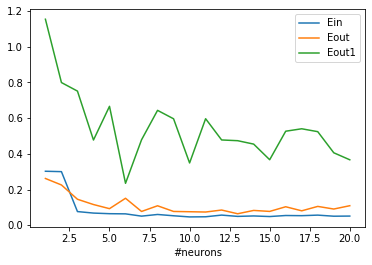

In [17]:
plt.plot(Neurons,Ein,label='Ein')
plt.plot(Neurons,Eout,label='Eout')
plt.plot(Neurons,Eout1,label='Eout1')
plt.xlabel('#neurons')
plt.legend()
plt.show()

Anche questa volta fit e predizioni complessivamente tendono a migilorare all'aumentare del numero dei neuroni e le predizioni sul range del training risultano migliori di quelle sul range $[-1,1.5]$. Queste ultime inoltre presentano un andamento oscillatorio più maracato rispetto al caso con un solo layer, quindi non è detto in genere che aumentando il numero di neuroni le predizioni su un range più ampio del training migliorino. 
Inoltre complessivamente le curve ottenute in questo caso assumono valori minori delle loro corrispondenti nel caso di un solo layer, probabilmente perché con la geometria 2 stiamo utilizzando reti di maggiore complessità con più paramentri e quindi complessivamente abbiamo fit e predizioni migliori. 

Infine osservo che mentre la curva $E_{\text{in}}$ diminuisce velocemente e si assesta su un valore costante, la curva $E_{\text{out}}$ sembra diminuire più lentamente per poi tornare a crescere lievemente. Questo andamento potrebbe essere l'andamento teorico previsto dalla Statistical Learning Theory.

Di seguito osserviamo la predizione di una rete con due layer e 20 neuroni per layer:

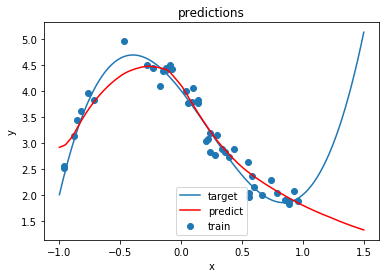

In [18]:
y_pred = model.predict(x)
plt.plot(x, y_target, label='target')
plt.scatter(x_train, y_train, label='train')
plt.plot(x, y_pred, label='predict', color = 'red')
plt.title("predictions")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.show()

### Geometria 3

Ora considero reti con due neuroni per layer facendo variare il numero di layer nel range $[1,20]$.

In [19]:
Layers=np.arange(1,21)
Ein=np.zeros(len(Layers))
Eout=np.zeros(len(Layers))
Eout1=np.zeros(len(Layers))

Neurons = 2
for i in range(len(Layers)):
   model = Sequential() 
   model.add(Dense(Neurons, input_shape=(1,),activation='selu')) 
   for j in range(1,Layers[i]):
      model.add(Dense(Neurons,activation='selu')) 
   model.add(Dense(1,activation='selu'))
   Nparams = model.count_params()
   #compile
   model.compile(optimizer='sgd', loss='mse', metrics=['mse']) 
   model.summary()
   # fit
   history = model.fit(x=x_train, y=y_train, 
             batch_size=32, epochs=Ne,
             shuffle=True, # a good idea is to shuffle input before at each epoch
             validation_data=(x_valid, y_valid))
   #evaluate model on training dataset
   score_t = model.evaluate(x_train, y_train, batch_size=32, verbose=1)
   # evaluate model on validation dataset
   score_v = model.evaluate(x_valid, y_valid, batch_size=32, verbose=1)
   score_v1 = model.evaluate(x_valid1, y_valid1, batch_size=32, verbose=1)
   Ein[i] = score_t[0]
   Eout[i] = score_v[0]
   Eout1[i] = score_v1[0] 

Model: "sequential_41"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_101 (Dense)            (None, 2)                 4         
_________________________________________________________________
dense_102 (Dense)            (None, 1)                 3         
Total params: 7
Trainable params: 7
Non-trainable params: 0
_________________________________________________________________
Train on 45 samples, validate on 30 samples
Epoch 1/500
45/45 [==============================] - 1s 18ms/sample - loss: 11.4395 - mean_squared_error: 11.4395 - val_loss: 15.6924 - val_mean_squared_error: 15.6924
Epoch 2/500
45/45 [==============================] - 0s 281us/sample - loss: 9.4242 - mean_squared_error: 9.4242 - val_loss: 13.6540 - val_mean_squared_error: 13.6540
Epoch 3/500
45/45 [==============================] - 0s 393us/sample - loss: 8.0550 - mean_squared_error: 8.0550 - val_loss: 11.5604 - val_mea

45/45 [==============================] - 0s 430us/sample - loss: 0.3524 - mean_squared_error: 0.3524 - val_loss: 0.2853 - val_mean_squared_error: 0.2853
Epoch 96/500
45/45 [==============================] - 0s 419us/sample - loss: 0.3517 - mean_squared_error: 0.3517 - val_loss: 0.2841 - val_mean_squared_error: 0.2841
Epoch 97/500
45/45 [==============================] - 0s 477us/sample - loss: 0.3507 - mean_squared_error: 0.3507 - val_loss: 0.2799 - val_mean_squared_error: 0.2799
Epoch 98/500
45/45 [==============================] - 0s 343us/sample - loss: 0.3501 - mean_squared_error: 0.3501 - val_loss: 0.2728 - val_mean_squared_error: 0.2728
Epoch 99/500
45/45 [==============================] - 0s 394us/sample - loss: 0.3487 - mean_squared_error: 0.3487 - val_loss: 0.2683 - val_mean_squared_error: 0.2683
Epoch 100/500
45/45 [==============================] - 0s 424us/sample - loss: 0.3496 - mean_squared_error: 0.3496 - val_loss: 0.2610 - val_mean_squared_error: 0.2610
Epoch 101/500
45

45/45 [==============================] - 0s 336us/sample - loss: 0.2967 - mean_squared_error: 0.2967 - val_loss: 0.2386 - val_mean_squared_error: 0.2386
Epoch 194/500
45/45 [==============================] - 0s 300us/sample - loss: 0.2970 - mean_squared_error: 0.2970 - val_loss: 0.2422 - val_mean_squared_error: 0.2422
Epoch 195/500
45/45 [==============================] - 0s 415us/sample - loss: 0.2960 - mean_squared_error: 0.2960 - val_loss: 0.2423 - val_mean_squared_error: 0.2423
Epoch 196/500
45/45 [==============================] - 0s 418us/sample - loss: 0.2966 - mean_squared_error: 0.2966 - val_loss: 0.2354 - val_mean_squared_error: 0.2354
Epoch 197/500
45/45 [==============================] - 0s 325us/sample - loss: 0.2951 - mean_squared_error: 0.2951 - val_loss: 0.2373 - val_mean_squared_error: 0.2373
Epoch 198/500
45/45 [==============================] - 0s 334us/sample - loss: 0.2954 - mean_squared_error: 0.2954 - val_loss: 0.2320 - val_mean_squared_error: 0.2320
Epoch 199/50

45/45 [==============================] - 0s 368us/sample - loss: 0.2562 - mean_squared_error: 0.2562 - val_loss: 0.2165 - val_mean_squared_error: 0.2165
Epoch 292/500
45/45 [==============================] - 0s 455us/sample - loss: 0.2550 - mean_squared_error: 0.2550 - val_loss: 0.2192 - val_mean_squared_error: 0.2192
Epoch 293/500
45/45 [==============================] - 0s 335us/sample - loss: 0.2544 - mean_squared_error: 0.2544 - val_loss: 0.2201 - val_mean_squared_error: 0.2201
Epoch 294/500
45/45 [==============================] - 0s 404us/sample - loss: 0.2542 - mean_squared_error: 0.2542 - val_loss: 0.2218 - val_mean_squared_error: 0.2218
Epoch 295/500
45/45 [==============================] - 0s 335us/sample - loss: 0.2540 - mean_squared_error: 0.2540 - val_loss: 0.2187 - val_mean_squared_error: 0.2187
Epoch 296/500
45/45 [==============================] - 0s 283us/sample - loss: 0.2535 - mean_squared_error: 0.2535 - val_loss: 0.2213 - val_mean_squared_error: 0.2213
Epoch 297/50

Epoch 389/500
45/45 [==============================] - 0s 438us/sample - loss: 0.2205 - mean_squared_error: 0.2205 - val_loss: 0.2066 - val_mean_squared_error: 0.2066
Epoch 390/500
45/45 [==============================] - 0s 426us/sample - loss: 0.2209 - mean_squared_error: 0.2209 - val_loss: 0.2019 - val_mean_squared_error: 0.2019
Epoch 391/500
45/45 [==============================] - 0s 366us/sample - loss: 0.2205 - mean_squared_error: 0.2205 - val_loss: 0.2072 - val_mean_squared_error: 0.2072
Epoch 392/500
45/45 [==============================] - 0s 299us/sample - loss: 0.2195 - mean_squared_error: 0.2195 - val_loss: 0.2086 - val_mean_squared_error: 0.2086
Epoch 393/500
45/45 [==============================] - 0s 384us/sample - loss: 0.2193 - mean_squared_error: 0.2193 - val_loss: 0.2106 - val_mean_squared_error: 0.2106
Epoch 394/500
45/45 [==============================] - 0s 352us/sample - loss: 0.2188 - mean_squared_error: 0.2188 - val_loss: 0.2082 - val_mean_squared_error: 0.208

45/45 [==============================] - 0s 279us/sample - loss: 0.2041 - mean_squared_error: 0.2041 - val_loss: 0.1959 - val_mean_squared_error: 0.1959
Epoch 439/500
45/45 [==============================] - 0s 343us/sample - loss: 0.2040 - mean_squared_error: 0.2040 - val_loss: 0.1931 - val_mean_squared_error: 0.1931
Epoch 440/500
45/45 [==============================] - 0s 323us/sample - loss: 0.2039 - mean_squared_error: 0.2039 - val_loss: 0.1907 - val_mean_squared_error: 0.1907
Epoch 441/500
45/45 [==============================] - 0s 364us/sample - loss: 0.2032 - mean_squared_error: 0.2032 - val_loss: 0.1922 - val_mean_squared_error: 0.1922
Epoch 442/500
45/45 [==============================] - 0s 306us/sample - loss: 0.2031 - mean_squared_error: 0.2031 - val_loss: 0.1955 - val_mean_squared_error: 0.1955
Epoch 443/500
45/45 [==============================] - 0s 334us/sample - loss: 0.2035 - mean_squared_error: 0.2035 - val_loss: 0.2008 - val_mean_squared_error: 0.2008
Epoch 444/50

Epoch 30/500
45/45 [==============================] - 0s 418us/sample - loss: 1.0533 - mean_squared_error: 1.0533 - val_loss: 1.5692 - val_mean_squared_error: 1.5692
Epoch 31/500
45/45 [==============================] - 0s 407us/sample - loss: 1.0449 - mean_squared_error: 1.0449 - val_loss: 1.5557 - val_mean_squared_error: 1.5557
Epoch 32/500
45/45 [==============================] - 0s 323us/sample - loss: 1.0477 - mean_squared_error: 1.0477 - val_loss: 1.5121 - val_mean_squared_error: 1.5121
Epoch 33/500
45/45 [==============================] - 0s 380us/sample - loss: 1.0360 - mean_squared_error: 1.0360 - val_loss: 1.4981 - val_mean_squared_error: 1.4981
Epoch 34/500
45/45 [==============================] - 0s 386us/sample - loss: 1.0290 - mean_squared_error: 1.0290 - val_loss: 1.5077 - val_mean_squared_error: 1.5077
Epoch 35/500
45/45 [==============================] - 0s 441us/sample - loss: 1.0193 - mean_squared_error: 1.0193 - val_loss: 1.5068 - val_mean_squared_error: 1.5068
Epoc

45/45 [==============================] - 0s 407us/sample - loss: 0.8748 - mean_squared_error: 0.8748 - val_loss: 1.2452 - val_mean_squared_error: 1.2452
Epoch 129/500
45/45 [==============================] - 0s 383us/sample - loss: 0.8741 - mean_squared_error: 0.8741 - val_loss: 1.2332 - val_mean_squared_error: 1.2332
Epoch 130/500
45/45 [==============================] - 0s 389us/sample - loss: 0.8737 - mean_squared_error: 0.8737 - val_loss: 1.2418 - val_mean_squared_error: 1.2418
Epoch 131/500
45/45 [==============================] - 0s 351us/sample - loss: 0.8730 - mean_squared_error: 0.8730 - val_loss: 1.2313 - val_mean_squared_error: 1.2313
Epoch 132/500
45/45 [==============================] - 0s 312us/sample - loss: 0.8744 - mean_squared_error: 0.8744 - val_loss: 1.2128 - val_mean_squared_error: 1.2128
Epoch 133/500
45/45 [==============================] - 0s 391us/sample - loss: 0.8721 - mean_squared_error: 0.8721 - val_loss: 1.2112 - val_mean_squared_error: 1.2112
Epoch 134/50

45/45 [==============================] - 0s 386us/sample - loss: 0.8305 - mean_squared_error: 0.8305 - val_loss: 1.1551 - val_mean_squared_error: 1.1551
Epoch 227/500
45/45 [==============================] - 0s 419us/sample - loss: 0.8302 - mean_squared_error: 0.8302 - val_loss: 1.1402 - val_mean_squared_error: 1.1402
Epoch 228/500
45/45 [==============================] - 0s 472us/sample - loss: 0.8289 - mean_squared_error: 0.8289 - val_loss: 1.1461 - val_mean_squared_error: 1.1461
Epoch 229/500
45/45 [==============================] - 0s 353us/sample - loss: 0.8284 - mean_squared_error: 0.8284 - val_loss: 1.1373 - val_mean_squared_error: 1.1373
Epoch 230/500
45/45 [==============================] - 0s 422us/sample - loss: 0.8334 - mean_squared_error: 0.8334 - val_loss: 1.1658 - val_mean_squared_error: 1.1658
Epoch 231/500
45/45 [==============================] - 0s 343us/sample - loss: 0.8287 - mean_squared_error: 0.8287 - val_loss: 1.1468 - val_mean_squared_error: 1.1468
Epoch 232/50

45/45 [==============================] - 0s 358us/sample - loss: 0.7444 - mean_squared_error: 0.7444 - val_loss: 0.9838 - val_mean_squared_error: 0.9838
Epoch 325/500
45/45 [==============================] - 0s 356us/sample - loss: 0.7447 - mean_squared_error: 0.7447 - val_loss: 0.9622 - val_mean_squared_error: 0.9622
Epoch 326/500
45/45 [==============================] - 0s 373us/sample - loss: 0.7441 - mean_squared_error: 0.7441 - val_loss: 0.9433 - val_mean_squared_error: 0.9433
Epoch 327/500
45/45 [==============================] - 0s 404us/sample - loss: 0.7405 - mean_squared_error: 0.7405 - val_loss: 0.9459 - val_mean_squared_error: 0.9459
Epoch 328/500
45/45 [==============================] - 0s 423us/sample - loss: 0.7416 - mean_squared_error: 0.7416 - val_loss: 0.9682 - val_mean_squared_error: 0.9682
Epoch 329/500
45/45 [==============================] - 0s 384us/sample - loss: 0.7371 - mean_squared_error: 0.7371 - val_loss: 0.9520 - val_mean_squared_error: 0.9520
Epoch 330/50

45/45 [==============================] - 0s 485us/sample - loss: 0.4305 - mean_squared_error: 0.4305 - val_loss: 0.4039 - val_mean_squared_error: 0.4039
Epoch 423/500
45/45 [==============================] - 0s 361us/sample - loss: 0.4289 - mean_squared_error: 0.4289 - val_loss: 0.4103 - val_mean_squared_error: 0.4103
Epoch 424/500
45/45 [==============================] - 0s 405us/sample - loss: 0.4259 - mean_squared_error: 0.4259 - val_loss: 0.4125 - val_mean_squared_error: 0.4125
Epoch 425/500
45/45 [==============================] - 0s 420us/sample - loss: 0.4266 - mean_squared_error: 0.4266 - val_loss: 0.4180 - val_mean_squared_error: 0.4180
Epoch 426/500
45/45 [==============================] - 0s 368us/sample - loss: 0.4236 - mean_squared_error: 0.4236 - val_loss: 0.4059 - val_mean_squared_error: 0.4059
Epoch 427/500
45/45 [==============================] - 0s 344us/sample - loss: 0.4207 - mean_squared_error: 0.4207 - val_loss: 0.3940 - val_mean_squared_error: 0.3940
Epoch 428/50

Epoch 471/500
45/45 [==============================] - 0s 390us/sample - loss: 0.3466 - mean_squared_error: 0.3466 - val_loss: 0.2980 - val_mean_squared_error: 0.2980
Epoch 472/500
45/45 [==============================] - 0s 547us/sample - loss: 0.3460 - mean_squared_error: 0.3460 - val_loss: 0.2951 - val_mean_squared_error: 0.2951
Epoch 473/500
45/45 [==============================] - 0s 325us/sample - loss: 0.3417 - mean_squared_error: 0.3417 - val_loss: 0.2985 - val_mean_squared_error: 0.2985
Epoch 474/500
45/45 [==============================] - 0s 394us/sample - loss: 0.3371 - mean_squared_error: 0.3371 - val_loss: 0.2996 - val_mean_squared_error: 0.2996
Epoch 475/500
45/45 [==============================] - ETA: 0s - loss: 0.3853 - mean_squared_error: 0.38 - 0s 327us/sample - loss: 0.3357 - mean_squared_error: 0.3357 - val_loss: 0.3050 - val_mean_squared_error: 0.3050
Epoch 476/500
45/45 [==============================] - 0s 367us/sample - loss: 0.3351 - mean_squared_error: 0.335

45/45 [==============================] - 0s 465us/sample - loss: 0.2945 - mean_squared_error: 0.2945 - val_loss: 0.2756 - val_mean_squared_error: 0.2756
Epoch 62/500
45/45 [==============================] - 0s 312us/sample - loss: 0.2941 - mean_squared_error: 0.2941 - val_loss: 0.2660 - val_mean_squared_error: 0.2660
Epoch 63/500
45/45 [==============================] - 0s 369us/sample - loss: 0.2928 - mean_squared_error: 0.2928 - val_loss: 0.2666 - val_mean_squared_error: 0.2666
Epoch 64/500
45/45 [==============================] - 0s 346us/sample - loss: 0.2937 - mean_squared_error: 0.2937 - val_loss: 0.2584 - val_mean_squared_error: 0.2584
Epoch 65/500
45/45 [==============================] - 0s 389us/sample - loss: 0.2946 - mean_squared_error: 0.2946 - val_loss: 0.2529 - val_mean_squared_error: 0.2529
Epoch 66/500
45/45 [==============================] - 0s 318us/sample - loss: 0.2940 - mean_squared_error: 0.2940 - val_loss: 0.2664 - val_mean_squared_error: 0.2664
Epoch 67/500
45/4

45/45 [==============================] - 0s 380us/sample - loss: 0.2812 - mean_squared_error: 0.2812 - val_loss: 0.2606 - val_mean_squared_error: 0.2606
Epoch 111/500
45/45 [==============================] - 0s 350us/sample - loss: 0.2808 - mean_squared_error: 0.2808 - val_loss: 0.2607 - val_mean_squared_error: 0.2607
Epoch 112/500
45/45 [==============================] - 0s 383us/sample - loss: 0.2802 - mean_squared_error: 0.2802 - val_loss: 0.2593 - val_mean_squared_error: 0.2593
Epoch 113/500
45/45 [==============================] - 0s 433us/sample - loss: 0.2797 - mean_squared_error: 0.2797 - val_loss: 0.2580 - val_mean_squared_error: 0.2580
Epoch 114/500
45/45 [==============================] - 0s 347us/sample - loss: 0.2793 - mean_squared_error: 0.2793 - val_loss: 0.2583 - val_mean_squared_error: 0.2583
Epoch 115/500
45/45 [==============================] - 0s 410us/sample - loss: 0.2795 - mean_squared_error: 0.2795 - val_loss: 0.2548 - val_mean_squared_error: 0.2548
Epoch 116/50

45/45 [==============================] - 0s 338us/sample - loss: 0.2504 - mean_squared_error: 0.2504 - val_loss: 0.2599 - val_mean_squared_error: 0.2599
Epoch 209/500
45/45 [==============================] - 0s 308us/sample - loss: 0.2518 - mean_squared_error: 0.2518 - val_loss: 0.2485 - val_mean_squared_error: 0.2485
Epoch 210/500
45/45 [==============================] - 0s 280us/sample - loss: 0.2478 - mean_squared_error: 0.2478 - val_loss: 0.2395 - val_mean_squared_error: 0.2395
Epoch 211/500
45/45 [==============================] - 0s 307us/sample - loss: 0.2468 - mean_squared_error: 0.2468 - val_loss: 0.2418 - val_mean_squared_error: 0.2418
Epoch 212/500
45/45 [==============================] - 0s 325us/sample - loss: 0.2463 - mean_squared_error: 0.2463 - val_loss: 0.2409 - val_mean_squared_error: 0.2409
Epoch 213/500
45/45 [==============================] - 0s 351us/sample - loss: 0.2458 - mean_squared_error: 0.2458 - val_loss: 0.2377 - val_mean_squared_error: 0.2377
Epoch 214/50

45/45 [==============================] - 0s 346us/sample - loss: 0.1641 - mean_squared_error: 0.1641 - val_loss: 0.2805 - val_mean_squared_error: 0.2805
Epoch 307/500
45/45 [==============================] - 0s 430us/sample - loss: 0.1935 - mean_squared_error: 0.1935 - val_loss: 0.1855 - val_mean_squared_error: 0.1855
Epoch 308/500
45/45 [==============================] - 0s 471us/sample - loss: 0.1628 - mean_squared_error: 0.1628 - val_loss: 0.1758 - val_mean_squared_error: 0.1758
Epoch 309/500
45/45 [==============================] - 0s 315us/sample - loss: 0.1907 - mean_squared_error: 0.1907 - val_loss: 0.1784 - val_mean_squared_error: 0.1784
Epoch 310/500
45/45 [==============================] - 0s 394us/sample - loss: 0.1927 - mean_squared_error: 0.1927 - val_loss: 0.2044 - val_mean_squared_error: 0.2044
Epoch 311/500
45/45 [==============================] - 0s 455us/sample - loss: 0.1530 - mean_squared_error: 0.1530 - val_loss: 0.1925 - val_mean_squared_error: 0.1925
Epoch 312/50

Epoch 355/500
45/45 [==============================] - 0s 380us/sample - loss: 0.1700 - mean_squared_error: 0.1700 - val_loss: 0.4159 - val_mean_squared_error: 0.4159
Epoch 356/500
45/45 [==============================] - 0s 439us/sample - loss: 0.2963 - mean_squared_error: 0.2963 - val_loss: 0.3739 - val_mean_squared_error: 0.3739
Epoch 357/500
45/45 [==============================] - 0s 377us/sample - loss: 0.2365 - mean_squared_error: 0.2365 - val_loss: 0.2373 - val_mean_squared_error: 0.2373
Epoch 358/500
45/45 [==============================] - 0s 457us/sample - loss: 0.1657 - mean_squared_error: 0.1657 - val_loss: 0.3282 - val_mean_squared_error: 0.3282
Epoch 359/500
45/45 [==============================] - 0s 379us/sample - loss: 0.1818 - mean_squared_error: 0.1818 - val_loss: 0.2387 - val_mean_squared_error: 0.2387
Epoch 360/500
45/45 [==============================] - 0s 336us/sample - loss: 0.1499 - mean_squared_error: 0.1499 - val_loss: 0.3152 - val_mean_squared_error: 0.315

45/45 [==============================] - 0s 436us/sample - loss: 0.1114 - mean_squared_error: 0.1114 - val_loss: 0.1270 - val_mean_squared_error: 0.1270
Epoch 405/500
45/45 [==============================] - 0s 424us/sample - loss: 0.0785 - mean_squared_error: 0.0785 - val_loss: 0.1573 - val_mean_squared_error: 0.1573
Epoch 406/500
45/45 [==============================] - 0s 423us/sample - loss: 0.0770 - mean_squared_error: 0.0770 - val_loss: 0.2289 - val_mean_squared_error: 0.2289
Epoch 407/500
45/45 [==============================] - 0s 363us/sample - loss: 0.0898 - mean_squared_error: 0.0898 - val_loss: 0.3079 - val_mean_squared_error: 0.3079
Epoch 408/500
45/45 [==============================] - 0s 345us/sample - loss: 0.1041 - mean_squared_error: 0.1041 - val_loss: 0.2497 - val_mean_squared_error: 0.2497
Epoch 409/500
45/45 [==============================] - 0s 405us/sample - loss: 0.0779 - mean_squared_error: 0.0779 - val_loss: 0.1351 - val_mean_squared_error: 0.1351
Epoch 410/50

30/30 [==============================] - 0s 66us/sample - loss: 0.6960 - mean_squared_error: 0.6960
Model: "sequential_44"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_110 (Dense)            (None, 2)                 4         
_________________________________________________________________
dense_111 (Dense)            (None, 2)                 6         
_________________________________________________________________
dense_112 (Dense)            (None, 2)                 6         
_________________________________________________________________
dense_113 (Dense)            (None, 2)                 6         
_________________________________________________________________
dense_114 (Dense)            (None, 1)                 3         
Total params: 25
Trainable params: 25
Non-trainable params: 0
_________________________________________________________________
Train on 45 samples, va

45/45 [==============================] - 0s 329us/sample - loss: 0.2449 - mean_squared_error: 0.2449 - val_loss: 0.1709 - val_mean_squared_error: 0.1709
Epoch 93/500
45/45 [==============================] - 0s 316us/sample - loss: 0.2472 - mean_squared_error: 0.2472 - val_loss: 0.1724 - val_mean_squared_error: 0.1724
Epoch 94/500
45/45 [==============================] - 0s 392us/sample - loss: 0.2428 - mean_squared_error: 0.2428 - val_loss: 0.1743 - val_mean_squared_error: 0.1743
Epoch 95/500
45/45 [==============================] - 0s 381us/sample - loss: 0.2478 - mean_squared_error: 0.2478 - val_loss: 0.2554 - val_mean_squared_error: 0.2554
Epoch 96/500
45/45 [==============================] - 0s 349us/sample - loss: 0.2445 - mean_squared_error: 0.2445 - val_loss: 0.2486 - val_mean_squared_error: 0.2486
Epoch 97/500
45/45 [==============================] - 0s 361us/sample - loss: 0.2360 - mean_squared_error: 0.2360 - val_loss: 0.2128 - val_mean_squared_error: 0.2128
Epoch 98/500
45/4

45/45 [==============================] - 0s 401us/sample - loss: 0.1403 - mean_squared_error: 0.1403 - val_loss: 0.1750 - val_mean_squared_error: 0.1750
Epoch 191/500
45/45 [==============================] - 0s 388us/sample - loss: 0.1426 - mean_squared_error: 0.1426 - val_loss: 0.1957 - val_mean_squared_error: 0.1957
Epoch 192/500
45/45 [==============================] - 0s 388us/sample - loss: 0.1391 - mean_squared_error: 0.1391 - val_loss: 0.1429 - val_mean_squared_error: 0.1429
Epoch 193/500
45/45 [==============================] - 0s 389us/sample - loss: 0.1389 - mean_squared_error: 0.1389 - val_loss: 0.1231 - val_mean_squared_error: 0.1231
Epoch 194/500
45/45 [==============================] - 0s 494us/sample - loss: 0.1398 - mean_squared_error: 0.1398 - val_loss: 0.1348 - val_mean_squared_error: 0.1348
Epoch 195/500
45/45 [==============================] - 0s 377us/sample - loss: 0.1376 - mean_squared_error: 0.1376 - val_loss: 0.1743 - val_mean_squared_error: 0.1743
Epoch 196/50

Epoch 239/500
45/45 [==============================] - 0s 396us/sample - loss: 0.1098 - mean_squared_error: 0.1098 - val_loss: 0.1236 - val_mean_squared_error: 0.1236
Epoch 240/500
45/45 [==============================] - 0s 413us/sample - loss: 0.1087 - mean_squared_error: 0.1087 - val_loss: 0.1569 - val_mean_squared_error: 0.1569
Epoch 241/500
45/45 [==============================] - 0s 345us/sample - loss: 0.1043 - mean_squared_error: 0.1043 - val_loss: 0.1409 - val_mean_squared_error: 0.1409
Epoch 242/500
45/45 [==============================] - 0s 342us/sample - loss: 0.1039 - mean_squared_error: 0.1039 - val_loss: 0.1663 - val_mean_squared_error: 0.1663
Epoch 243/500
45/45 [==============================] - 0s 499us/sample - loss: 0.1131 - mean_squared_error: 0.1131 - val_loss: 0.2040 - val_mean_squared_error: 0.2040
Epoch 244/500
45/45 [==============================] - 0s 348us/sample - loss: 0.1094 - mean_squared_error: 0.1094 - val_loss: 0.1312 - val_mean_squared_error: 0.131

45/45 [==============================] - 0s 367us/sample - loss: 0.0742 - mean_squared_error: 0.0742 - val_loss: 0.1763 - val_mean_squared_error: 0.1763
Epoch 338/500
45/45 [==============================] - 0s 348us/sample - loss: 0.0734 - mean_squared_error: 0.0734 - val_loss: 0.1057 - val_mean_squared_error: 0.1057
Epoch 339/500
45/45 [==============================] - 0s 421us/sample - loss: 0.0687 - mean_squared_error: 0.0687 - val_loss: 0.1178 - val_mean_squared_error: 0.1178
Epoch 340/500
45/45 [==============================] - 0s 485us/sample - loss: 0.0676 - mean_squared_error: 0.0676 - val_loss: 0.1170 - val_mean_squared_error: 0.1170
Epoch 341/500
45/45 [==============================] - 0s 409us/sample - loss: 0.0684 - mean_squared_error: 0.0684 - val_loss: 0.1399 - val_mean_squared_error: 0.1399
Epoch 342/500
45/45 [==============================] - 0s 408us/sample - loss: 0.0687 - mean_squared_error: 0.0687 - val_loss: 0.1185 - val_mean_squared_error: 0.1185
Epoch 343/50

45/45 [==============================] - 0s 361us/sample - loss: 0.0631 - mean_squared_error: 0.0631 - val_loss: 0.0763 - val_mean_squared_error: 0.0763
Epoch 436/500
45/45 [==============================] - 0s 349us/sample - loss: 0.0650 - mean_squared_error: 0.0650 - val_loss: 0.0910 - val_mean_squared_error: 0.0910
Epoch 437/500
45/45 [==============================] - 0s 327us/sample - loss: 0.0611 - mean_squared_error: 0.0611 - val_loss: 0.0904 - val_mean_squared_error: 0.0904
Epoch 438/500
45/45 [==============================] - 0s 342us/sample - loss: 0.0600 - mean_squared_error: 0.0600 - val_loss: 0.0860 - val_mean_squared_error: 0.0860
Epoch 439/500
45/45 [==============================] - 0s 407us/sample - loss: 0.0598 - mean_squared_error: 0.0598 - val_loss: 0.1277 - val_mean_squared_error: 0.1277
Epoch 440/500
45/45 [==============================] - 0s 365us/sample - loss: 0.0626 - mean_squared_error: 0.0626 - val_loss: 0.1075 - val_mean_squared_error: 0.1075
Epoch 441/50

45/45 [==============================] - 0s 383us/sample - loss: 0.3080 - mean_squared_error: 0.3080 - val_loss: 0.2512 - val_mean_squared_error: 0.2512
Epoch 25/500
45/45 [==============================] - 0s 419us/sample - loss: 0.3080 - mean_squared_error: 0.3080 - val_loss: 0.2455 - val_mean_squared_error: 0.2455
Epoch 26/500
45/45 [==============================] - 0s 416us/sample - loss: 0.3071 - mean_squared_error: 0.3071 - val_loss: 0.2448 - val_mean_squared_error: 0.2448
Epoch 27/500
45/45 [==============================] - 0s 380us/sample - loss: 0.3073 - mean_squared_error: 0.3073 - val_loss: 0.2531 - val_mean_squared_error: 0.2531
Epoch 28/500
45/45 [==============================] - 0s 378us/sample - loss: 0.3090 - mean_squared_error: 0.3090 - val_loss: 0.2649 - val_mean_squared_error: 0.2649
Epoch 29/500
45/45 [==============================] - 0s 393us/sample - loss: 0.3072 - mean_squared_error: 0.3072 - val_loss: 0.2633 - val_mean_squared_error: 0.2633
Epoch 30/500
45/4

Epoch 73/500
45/45 [==============================] - 0s 313us/sample - loss: 0.2873 - mean_squared_error: 0.2873 - val_loss: 0.2327 - val_mean_squared_error: 0.2327
Epoch 74/500
45/45 [==============================] - 0s 354us/sample - loss: 0.2883 - mean_squared_error: 0.2883 - val_loss: 0.2429 - val_mean_squared_error: 0.2429
Epoch 75/500
45/45 [==============================] - 0s 401us/sample - loss: 0.2868 - mean_squared_error: 0.2868 - val_loss: 0.2377 - val_mean_squared_error: 0.2377
Epoch 76/500
45/45 [==============================] - 0s 374us/sample - loss: 0.2854 - mean_squared_error: 0.2854 - val_loss: 0.2340 - val_mean_squared_error: 0.2340
Epoch 77/500
45/45 [==============================] - 0s 419us/sample - loss: 0.2863 - mean_squared_error: 0.2863 - val_loss: 0.2235 - val_mean_squared_error: 0.2235
Epoch 78/500
45/45 [==============================] - 0s 445us/sample - loss: 0.2861 - mean_squared_error: 0.2861 - val_loss: 0.2346 - val_mean_squared_error: 0.2346
Epoc

45/45 [==============================] - 0s 419us/sample - loss: 0.2489 - mean_squared_error: 0.2489 - val_loss: 0.2145 - val_mean_squared_error: 0.2145
Epoch 172/500
45/45 [==============================] - 0s 322us/sample - loss: 0.2481 - mean_squared_error: 0.2481 - val_loss: 0.2142 - val_mean_squared_error: 0.2142
Epoch 173/500
45/45 [==============================] - 0s 417us/sample - loss: 0.2478 - mean_squared_error: 0.2478 - val_loss: 0.2116 - val_mean_squared_error: 0.2116
Epoch 174/500
45/45 [==============================] - 0s 439us/sample - loss: 0.2478 - mean_squared_error: 0.2478 - val_loss: 0.2086 - val_mean_squared_error: 0.2086
Epoch 175/500
45/45 [==============================] - 0s 369us/sample - loss: 0.2476 - mean_squared_error: 0.2476 - val_loss: 0.2139 - val_mean_squared_error: 0.2139
Epoch 176/500
45/45 [==============================] - 0s 500us/sample - loss: 0.2472 - mean_squared_error: 0.2472 - val_loss: 0.2094 - val_mean_squared_error: 0.2094
Epoch 177/50

45/45 [==============================] - 0s 307us/sample - loss: 0.2216 - mean_squared_error: 0.2216 - val_loss: 0.2039 - val_mean_squared_error: 0.2039
Epoch 270/500
45/45 [==============================] - 0s 382us/sample - loss: 0.2210 - mean_squared_error: 0.2210 - val_loss: 0.2028 - val_mean_squared_error: 0.2028
Epoch 271/500
45/45 [==============================] - 0s 501us/sample - loss: 0.2210 - mean_squared_error: 0.2210 - val_loss: 0.2063 - val_mean_squared_error: 0.2063
Epoch 272/500
45/45 [==============================] - 0s 352us/sample - loss: 0.2218 - mean_squared_error: 0.2218 - val_loss: 0.1941 - val_mean_squared_error: 0.1941
Epoch 273/500
45/45 [==============================] - 0s 348us/sample - loss: 0.2203 - mean_squared_error: 0.2203 - val_loss: 0.1938 - val_mean_squared_error: 0.1938
Epoch 274/500
45/45 [==============================] - 0s 428us/sample - loss: 0.2214 - mean_squared_error: 0.2214 - val_loss: 0.1878 - val_mean_squared_error: 0.1878
Epoch 275/50

Epoch 367/500
45/45 [==============================] - 0s 361us/sample - loss: 0.1684 - mean_squared_error: 0.1684 - val_loss: 0.2067 - val_mean_squared_error: 0.2067
Epoch 368/500
45/45 [==============================] - 0s 493us/sample - loss: 0.1658 - mean_squared_error: 0.1658 - val_loss: 0.1822 - val_mean_squared_error: 0.1822
Epoch 369/500
45/45 [==============================] - 0s 402us/sample - loss: 0.1652 - mean_squared_error: 0.1652 - val_loss: 0.1999 - val_mean_squared_error: 0.1999
Epoch 370/500
45/45 [==============================] - 0s 333us/sample - loss: 0.1639 - mean_squared_error: 0.1639 - val_loss: 0.1880 - val_mean_squared_error: 0.1880
Epoch 371/500
45/45 [==============================] - 0s 448us/sample - loss: 0.1655 - mean_squared_error: 0.1655 - val_loss: 0.1756 - val_mean_squared_error: 0.1756
Epoch 372/500
45/45 [==============================] - 0s 353us/sample - loss: 0.1645 - mean_squared_error: 0.1645 - val_loss: 0.2183 - val_mean_squared_error: 0.218

45/45 [==============================] - 0s 310us/sample - loss: 0.1365 - mean_squared_error: 0.1365 - val_loss: 0.1788 - val_mean_squared_error: 0.1788
Epoch 417/500
45/45 [==============================] - 0s 280us/sample - loss: 0.1360 - mean_squared_error: 0.1360 - val_loss: 0.1789 - val_mean_squared_error: 0.1789
Epoch 418/500
45/45 [==============================] - 0s 263us/sample - loss: 0.1363 - mean_squared_error: 0.1363 - val_loss: 0.1996 - val_mean_squared_error: 0.1996
Epoch 419/500
45/45 [==============================] - 0s 259us/sample - loss: 0.1364 - mean_squared_error: 0.1364 - val_loss: 0.2027 - val_mean_squared_error: 0.2027
Epoch 420/500
45/45 [==============================] - 0s 234us/sample - loss: 0.1363 - mean_squared_error: 0.1363 - val_loss: 0.1901 - val_mean_squared_error: 0.1901
Epoch 421/500
45/45 [==============================] - 0s 282us/sample - loss: 0.1357 - mean_squared_error: 0.1357 - val_loss: 0.1514 - val_mean_squared_error: 0.1514
Epoch 422/50

Epoch 465/500
45/45 [==============================] - 0s 269us/sample - loss: 0.1182 - mean_squared_error: 0.1182 - val_loss: 0.1825 - val_mean_squared_error: 0.1825
Epoch 466/500
45/45 [==============================] - 0s 250us/sample - loss: 0.1174 - mean_squared_error: 0.1174 - val_loss: 0.1789 - val_mean_squared_error: 0.1789
Epoch 467/500
45/45 [==============================] - 0s 298us/sample - loss: 0.1185 - mean_squared_error: 0.1185 - val_loss: 0.1543 - val_mean_squared_error: 0.1543
Epoch 468/500
45/45 [==============================] - 0s 259us/sample - loss: 0.1176 - mean_squared_error: 0.1176 - val_loss: 0.1887 - val_mean_squared_error: 0.1887
Epoch 469/500
45/45 [==============================] - 0s 260us/sample - loss: 0.1165 - mean_squared_error: 0.1165 - val_loss: 0.1687 - val_mean_squared_error: 0.1687
Epoch 470/500
45/45 [==============================] - 0s 282us/sample - loss: 0.1163 - mean_squared_error: 0.1163 - val_loss: 0.1642 - val_mean_squared_error: 0.164

45/45 [==============================] - 0s 354us/sample - loss: 5.9982 - mean_squared_error: 5.9982 - val_loss: 7.9150 - val_mean_squared_error: 7.9150
Epoch 5/500
45/45 [==============================] - 0s 403us/sample - loss: 4.5748 - mean_squared_error: 4.5748 - val_loss: 6.3774 - val_mean_squared_error: 6.3774
Epoch 6/500
45/45 [==============================] - 0s 401us/sample - loss: 3.3124 - mean_squared_error: 3.3124 - val_loss: 5.0311 - val_mean_squared_error: 5.0311
Epoch 7/500
45/45 [==============================] - 0s 377us/sample - loss: 2.3917 - mean_squared_error: 2.3917 - val_loss: 4.0779 - val_mean_squared_error: 4.0779
Epoch 8/500
45/45 [==============================] - 0s 480us/sample - loss: 1.8844 - mean_squared_error: 1.8844 - val_loss: 3.1602 - val_mean_squared_error: 3.1602
Epoch 9/500
45/45 [==============================] - 0s 371us/sample - loss: 1.5094 - mean_squared_error: 1.5094 - val_loss: 2.4612 - val_mean_squared_error: 2.4612
Epoch 10/500
45/45 [==

45/45 [==============================] - 0s 415us/sample - loss: 0.2436 - mean_squared_error: 0.2436 - val_loss: 0.2163 - val_mean_squared_error: 0.2163
Epoch 103/500
45/45 [==============================] - 0s 384us/sample - loss: 0.2467 - mean_squared_error: 0.2467 - val_loss: 0.1945 - val_mean_squared_error: 0.1945
Epoch 104/500
45/45 [==============================] - 0s 432us/sample - loss: 0.2464 - mean_squared_error: 0.2464 - val_loss: 0.1927 - val_mean_squared_error: 0.1927
Epoch 105/500
45/45 [==============================] - 0s 409us/sample - loss: 0.2425 - mean_squared_error: 0.2425 - val_loss: 0.2020 - val_mean_squared_error: 0.2020
Epoch 106/500
45/45 [==============================] - 0s 425us/sample - loss: 0.2390 - mean_squared_error: 0.2390 - val_loss: 0.2154 - val_mean_squared_error: 0.2154
Epoch 107/500
45/45 [==============================] - 0s 443us/sample - loss: 0.2368 - mean_squared_error: 0.2368 - val_loss: 0.2048 - val_mean_squared_error: 0.2048
Epoch 108/50

45/45 [==============================] - 0s 277us/sample - loss: 0.0677 - mean_squared_error: 0.0677 - val_loss: 0.0903 - val_mean_squared_error: 0.0903
Epoch 201/500
45/45 [==============================] - 0s 345us/sample - loss: 0.0711 - mean_squared_error: 0.0711 - val_loss: 0.1214 - val_mean_squared_error: 0.1214
Epoch 202/500
45/45 [==============================] - 0s 596us/sample - loss: 0.0677 - mean_squared_error: 0.0677 - val_loss: 0.1084 - val_mean_squared_error: 0.1084
Epoch 203/500
45/45 [==============================] - 0s 357us/sample - loss: 0.0667 - mean_squared_error: 0.0667 - val_loss: 0.1214 - val_mean_squared_error: 0.1214
Epoch 204/500
45/45 [==============================] - 0s 417us/sample - loss: 0.0685 - mean_squared_error: 0.0685 - val_loss: 0.1205 - val_mean_squared_error: 0.1205
Epoch 205/500
45/45 [==============================] - 0s 365us/sample - loss: 0.0662 - mean_squared_error: 0.0662 - val_loss: 0.1186 - val_mean_squared_error: 0.1186
Epoch 206/50

Epoch 298/500
45/45 [==============================] - 0s 412us/sample - loss: 0.0650 - mean_squared_error: 0.0650 - val_loss: 0.0860 - val_mean_squared_error: 0.0860
Epoch 299/500
45/45 [==============================] - 0s 415us/sample - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.0926 - val_mean_squared_error: 0.0926
Epoch 300/500
45/45 [==============================] - 0s 635us/sample - loss: 0.0559 - mean_squared_error: 0.0559 - val_loss: 0.0876 - val_mean_squared_error: 0.0876
Epoch 301/500
45/45 [==============================] - 0s 383us/sample - loss: 0.0709 - mean_squared_error: 0.0709 - val_loss: 0.0608 - val_mean_squared_error: 0.0608
Epoch 302/500
45/45 [==============================] - 0s 503us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.0618 - val_mean_squared_error: 0.0618
Epoch 303/500
45/45 [==============================] - 0s 391us/sample - loss: 0.0486 - mean_squared_error: 0.0486 - val_loss: 0.0534 - val_mean_squared_error: 0.053

45/45 [==============================] - 0s 361us/sample - loss: 0.0618 - mean_squared_error: 0.0618 - val_loss: 0.0530 - val_mean_squared_error: 0.0530
Epoch 348/500
45/45 [==============================] - 0s 417us/sample - loss: 0.0463 - mean_squared_error: 0.0463 - val_loss: 0.0509 - val_mean_squared_error: 0.0509
Epoch 349/500
45/45 [==============================] - 0s 433us/sample - loss: 0.0502 - mean_squared_error: 0.0502 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 350/500
45/45 [==============================] - 0s 396us/sample - loss: 0.0482 - mean_squared_error: 0.0482 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 351/500
45/45 [==============================] - 0s 578us/sample - loss: 0.0492 - mean_squared_error: 0.0492 - val_loss: 0.0542 - val_mean_squared_error: 0.0542
Epoch 352/500
45/45 [==============================] - 0s 371us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0647 - val_mean_squared_error: 0.0647
Epoch 353/50

45/45 [==============================] - 0s 506us/sample - loss: 0.0666 - mean_squared_error: 0.0666 - val_loss: 0.0582 - val_mean_squared_error: 0.0582
Epoch 446/500
45/45 [==============================] - 0s 370us/sample - loss: 0.0407 - mean_squared_error: 0.0407 - val_loss: 0.0631 - val_mean_squared_error: 0.0631
Epoch 447/500
45/45 [==============================] - 0s 544us/sample - loss: 0.0464 - mean_squared_error: 0.0464 - val_loss: 0.0639 - val_mean_squared_error: 0.0639
Epoch 448/500
45/45 [==============================] - 0s 354us/sample - loss: 0.0480 - mean_squared_error: 0.0480 - val_loss: 0.0595 - val_mean_squared_error: 0.0595
Epoch 449/500
45/45 [==============================] - 0s 510us/sample - loss: 0.0407 - mean_squared_error: 0.0407 - val_loss: 0.0570 - val_mean_squared_error: 0.0570
Epoch 450/500
45/45 [==============================] - 0s 428us/sample - loss: 0.0430 - mean_squared_error: 0.0430 - val_loss: 0.0632 - val_mean_squared_error: 0.0632
Epoch 451/50

Epoch 33/500
45/45 [==============================] - 0s 455us/sample - loss: 0.3720 - mean_squared_error: 0.3720 - val_loss: 0.2314 - val_mean_squared_error: 0.2314
Epoch 34/500
45/45 [==============================] - 0s 442us/sample - loss: 0.3603 - mean_squared_error: 0.3603 - val_loss: 0.2528 - val_mean_squared_error: 0.2528
Epoch 35/500
45/45 [==============================] - 0s 471us/sample - loss: 0.3309 - mean_squared_error: 0.3309 - val_loss: 0.3174 - val_mean_squared_error: 0.3174
Epoch 36/500
45/45 [==============================] - 0s 392us/sample - loss: 0.3358 - mean_squared_error: 0.3358 - val_loss: 0.2284 - val_mean_squared_error: 0.2284
Epoch 37/500
45/45 [==============================] - 0s 271us/sample - loss: 0.3715 - mean_squared_error: 0.3715 - val_loss: 0.2332 - val_mean_squared_error: 0.2332
Epoch 38/500
45/45 [==============================] - 0s 328us/sample - loss: 0.3347 - mean_squared_error: 0.3347 - val_loss: 0.3888 - val_mean_squared_error: 0.3888
Epoc

45/45 [==============================] - 0s 493us/sample - loss: 0.3085 - mean_squared_error: 0.3085 - val_loss: 0.2250 - val_mean_squared_error: 0.2250
Epoch 132/500
45/45 [==============================] - 0s 343us/sample - loss: 0.3136 - mean_squared_error: 0.3136 - val_loss: 0.4142 - val_mean_squared_error: 0.4142
Epoch 133/500
45/45 [==============================] - 0s 347us/sample - loss: 0.3302 - mean_squared_error: 0.3302 - val_loss: 0.2185 - val_mean_squared_error: 0.2185
Epoch 134/500
45/45 [==============================] - 0s 417us/sample - loss: 0.3321 - mean_squared_error: 0.3321 - val_loss: 0.2395 - val_mean_squared_error: 0.2395
Epoch 135/500
45/45 [==============================] - 0s 572us/sample - loss: 0.3228 - mean_squared_error: 0.3228 - val_loss: 0.2193 - val_mean_squared_error: 0.2193
Epoch 136/500
45/45 [==============================] - 0s 393us/sample - loss: 0.3594 - mean_squared_error: 0.3594 - val_loss: 0.2171 - val_mean_squared_error: 0.2171
Epoch 137/50

45/45 [==============================] - 0s 374us/sample - loss: 0.3183 - mean_squared_error: 0.3183 - val_loss: 0.2512 - val_mean_squared_error: 0.2512
Epoch 230/500
45/45 [==============================] - 0s 396us/sample - loss: 0.3037 - mean_squared_error: 0.3037 - val_loss: 0.3802 - val_mean_squared_error: 0.3802
Epoch 231/500
45/45 [==============================] - 0s 346us/sample - loss: 0.3389 - mean_squared_error: 0.3389 - val_loss: 0.3047 - val_mean_squared_error: 0.3047
Epoch 232/500
45/45 [==============================] - 0s 465us/sample - loss: 0.2927 - mean_squared_error: 0.2927 - val_loss: 0.2085 - val_mean_squared_error: 0.2085
Epoch 233/500
45/45 [==============================] - 0s 416us/sample - loss: 0.2954 - mean_squared_error: 0.2954 - val_loss: 0.2526 - val_mean_squared_error: 0.2526
Epoch 234/500
45/45 [==============================] - 0s 413us/sample - loss: 0.2888 - mean_squared_error: 0.2888 - val_loss: 0.2669 - val_mean_squared_error: 0.2669
Epoch 235/50

45/45 [==============================] - 0s 443us/sample - loss: 0.2786 - mean_squared_error: 0.2786 - val_loss: 0.2679 - val_mean_squared_error: 0.2679
Epoch 328/500
45/45 [==============================] - 0s 419us/sample - loss: 0.2811 - mean_squared_error: 0.2811 - val_loss: 0.2567 - val_mean_squared_error: 0.2567
Epoch 329/500
45/45 [==============================] - 0s 391us/sample - loss: 0.2781 - mean_squared_error: 0.2781 - val_loss: 0.2577 - val_mean_squared_error: 0.2577
Epoch 330/500
45/45 [==============================] - 0s 421us/sample - loss: 0.2935 - mean_squared_error: 0.2935 - val_loss: 0.3434 - val_mean_squared_error: 0.3434
Epoch 331/500
45/45 [==============================] - 0s 399us/sample - loss: 0.2923 - mean_squared_error: 0.2923 - val_loss: 0.2168 - val_mean_squared_error: 0.2168
Epoch 332/500
45/45 [==============================] - 0s 490us/sample - loss: 0.2797 - mean_squared_error: 0.2797 - val_loss: 0.2019 - val_mean_squared_error: 0.2019
Epoch 333/50

45/45 [==============================] - 0s 519us/sample - loss: 0.3125 - mean_squared_error: 0.3125 - val_loss: 0.2249 - val_mean_squared_error: 0.2249
Epoch 426/500
45/45 [==============================] - 0s 384us/sample - loss: 0.2602 - mean_squared_error: 0.2602 - val_loss: 0.2395 - val_mean_squared_error: 0.2395
Epoch 427/500
45/45 [==============================] - 0s 461us/sample - loss: 0.2616 - mean_squared_error: 0.2616 - val_loss: 0.1907 - val_mean_squared_error: 0.1907
Epoch 428/500
45/45 [==============================] - 0s 381us/sample - loss: 0.2670 - mean_squared_error: 0.2670 - val_loss: 0.3332 - val_mean_squared_error: 0.3332
Epoch 429/500
45/45 [==============================] - 0s 387us/sample - loss: 0.2797 - mean_squared_error: 0.2797 - val_loss: 0.2114 - val_mean_squared_error: 0.2114
Epoch 430/500
45/45 [==============================] - 0s 372us/sample - loss: 0.2603 - mean_squared_error: 0.2603 - val_loss: 0.2071 - val_mean_squared_error: 0.2071
Epoch 431/50

Epoch 12/500
45/45 [==============================] - 0s 455us/sample - loss: 0.2182 - mean_squared_error: 0.2182 - val_loss: 0.2245 - val_mean_squared_error: 0.2245
Epoch 13/500
45/45 [==============================] - 0s 537us/sample - loss: 0.2209 - mean_squared_error: 0.2209 - val_loss: 0.1647 - val_mean_squared_error: 0.1647
Epoch 14/500
45/45 [==============================] - 0s 435us/sample - loss: 0.2225 - mean_squared_error: 0.2225 - val_loss: 0.1766 - val_mean_squared_error: 0.1766
Epoch 15/500
45/45 [==============================] - 0s 451us/sample - loss: 0.2180 - mean_squared_error: 0.2180 - val_loss: 0.2318 - val_mean_squared_error: 0.2318
Epoch 16/500
45/45 [==============================] - 0s 512us/sample - loss: 0.2227 - mean_squared_error: 0.2227 - val_loss: 0.2698 - val_mean_squared_error: 0.2698
Epoch 17/500
45/45 [==============================] - 0s 419us/sample - loss: 0.2359 - mean_squared_error: 0.2359 - val_loss: 0.2597 - val_mean_squared_error: 0.2597
Epoc

45/45 [==============================] - 0s 377us/sample - loss: 0.0934 - mean_squared_error: 0.0934 - val_loss: 0.1679 - val_mean_squared_error: 0.1679
Epoch 111/500
45/45 [==============================] - 0s 293us/sample - loss: 0.1826 - mean_squared_error: 0.1826 - val_loss: 0.2228 - val_mean_squared_error: 0.2228
Epoch 112/500
45/45 [==============================] - 0s 468us/sample - loss: 0.2829 - mean_squared_error: 0.2829 - val_loss: 0.3232 - val_mean_squared_error: 0.3232
Epoch 113/500
45/45 [==============================] - 0s 431us/sample - loss: 0.2624 - mean_squared_error: 0.2624 - val_loss: 0.3462 - val_mean_squared_error: 0.3462
Epoch 114/500
45/45 [==============================] - 0s 406us/sample - loss: 0.1639 - mean_squared_error: 0.1639 - val_loss: 0.1363 - val_mean_squared_error: 0.1363
Epoch 115/500
45/45 [==============================] - 0s 498us/sample - loss: 0.1108 - mean_squared_error: 0.1108 - val_loss: 0.2202 - val_mean_squared_error: 0.2202
Epoch 116/50

45/45 [==============================] - 0s 342us/sample - loss: 0.0670 - mean_squared_error: 0.0670 - val_loss: 0.1035 - val_mean_squared_error: 0.1035
Epoch 209/500
45/45 [==============================] - 0s 412us/sample - loss: 0.0704 - mean_squared_error: 0.0704 - val_loss: 0.1035 - val_mean_squared_error: 0.1035
Epoch 210/500
45/45 [==============================] - 0s 349us/sample - loss: 0.0974 - mean_squared_error: 0.0974 - val_loss: 0.1851 - val_mean_squared_error: 0.1851
Epoch 211/500
45/45 [==============================] - 0s 423us/sample - loss: 0.1004 - mean_squared_error: 0.1004 - val_loss: 0.0987 - val_mean_squared_error: 0.0987
Epoch 212/500
45/45 [==============================] - 0s 432us/sample - loss: 0.0848 - mean_squared_error: 0.0848 - val_loss: 0.2281 - val_mean_squared_error: 0.2281
Epoch 213/500
45/45 [==============================] - 0s 390us/sample - loss: 0.1261 - mean_squared_error: 0.1261 - val_loss: 0.0677 - val_mean_squared_error: 0.0677
Epoch 214/50

45/45 [==============================] - 0s 501us/sample - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.1164 - val_mean_squared_error: 0.1164
Epoch 307/500
45/45 [==============================] - 0s 400us/sample - loss: 0.0595 - mean_squared_error: 0.0595 - val_loss: 0.1181 - val_mean_squared_error: 0.1181
Epoch 308/500
45/45 [==============================] - 0s 417us/sample - loss: 0.0571 - mean_squared_error: 0.0571 - val_loss: 0.1218 - val_mean_squared_error: 0.1218
Epoch 309/500
45/45 [==============================] - 0s 428us/sample - loss: 0.0738 - mean_squared_error: 0.0738 - val_loss: 0.1439 - val_mean_squared_error: 0.1439
Epoch 310/500
45/45 [==============================] - 0s 481us/sample - loss: 0.0708 - mean_squared_error: 0.0708 - val_loss: 0.1264 - val_mean_squared_error: 0.1264
Epoch 311/500
45/45 [==============================] - 0s 439us/sample - loss: 0.0627 - mean_squared_error: 0.0627 - val_loss: 0.2465 - val_mean_squared_error: 0.2465
Epoch 312/50

45/45 [==============================] - 0s 464us/sample - loss: 0.0555 - mean_squared_error: 0.0555 - val_loss: 0.0940 - val_mean_squared_error: 0.0940
Epoch 405/500
45/45 [==============================] - 0s 447us/sample - loss: 0.0548 - mean_squared_error: 0.0548 - val_loss: 0.0948 - val_mean_squared_error: 0.0948
Epoch 406/500
45/45 [==============================] - 0s 433us/sample - loss: 0.0554 - mean_squared_error: 0.0554 - val_loss: 0.0867 - val_mean_squared_error: 0.0867
Epoch 407/500
45/45 [==============================] - 0s 482us/sample - loss: 0.0539 - mean_squared_error: 0.0539 - val_loss: 0.1053 - val_mean_squared_error: 0.1053
Epoch 408/500
45/45 [==============================] - 0s 509us/sample - loss: 0.0568 - mean_squared_error: 0.0568 - val_loss: 0.1054 - val_mean_squared_error: 0.1054
Epoch 409/500
45/45 [==============================] - 0s 428us/sample - loss: 0.0519 - mean_squared_error: 0.0519 - val_loss: 0.0895 - val_mean_squared_error: 0.0895
Epoch 410/50

Epoch 453/500
45/45 [==============================] - 0s 496us/sample - loss: 0.0637 - mean_squared_error: 0.0637 - val_loss: 0.1168 - val_mean_squared_error: 0.1168
Epoch 454/500
45/45 [==============================] - 0s 495us/sample - loss: 0.0566 - mean_squared_error: 0.0566 - val_loss: 0.1029 - val_mean_squared_error: 0.1029
Epoch 455/500
45/45 [==============================] - 0s 420us/sample - loss: 0.0498 - mean_squared_error: 0.0498 - val_loss: 0.1102 - val_mean_squared_error: 0.1102
Epoch 456/500
45/45 [==============================] - 0s 396us/sample - loss: 0.0519 - mean_squared_error: 0.0519 - val_loss: 0.0914 - val_mean_squared_error: 0.0914
Epoch 457/500
45/45 [==============================] - 0s 408us/sample - loss: 0.0539 - mean_squared_error: 0.0539 - val_loss: 0.2172 - val_mean_squared_error: 0.2172
Epoch 458/500
45/45 [==============================] - 0s 393us/sample - loss: 0.0713 - mean_squared_error: 0.0713 - val_loss: 0.1140 - val_mean_squared_error: 0.114

30/30 [==============================] - 0s 107us/sample - loss: 0.4664 - mean_squared_error: 0.4664
Model: "sequential_49"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_145 (Dense)            (None, 2)                 4         
_________________________________________________________________
dense_146 (Dense)            (None, 2)                 6         
_________________________________________________________________
dense_147 (Dense)            (None, 2)                 6         
_________________________________________________________________
dense_148 (Dense)            (None, 2)                 6         
_________________________________________________________________
dense_149 (Dense)            (None, 2)                 6         
_________________________________________________________________
dense_150 (Dense)            (None, 2)                 6         
__________________

45/45 [==============================] - 0s 437us/sample - loss: 0.3468 - mean_squared_error: 0.3468 - val_loss: 0.1978 - val_mean_squared_error: 0.1978
Epoch 89/500
45/45 [==============================] - 0s 349us/sample - loss: 0.1844 - mean_squared_error: 0.1844 - val_loss: 0.1914 - val_mean_squared_error: 0.1914
Epoch 90/500
45/45 [==============================] - 0s 416us/sample - loss: 0.2068 - mean_squared_error: 0.2068 - val_loss: 0.2280 - val_mean_squared_error: 0.2280
Epoch 91/500
45/45 [==============================] - 0s 528us/sample - loss: 0.2729 - mean_squared_error: 0.2729 - val_loss: 0.2335 - val_mean_squared_error: 0.2335
Epoch 92/500
45/45 [==============================] - 0s 544us/sample - loss: 0.2802 - mean_squared_error: 0.2802 - val_loss: 0.2435 - val_mean_squared_error: 0.2435
Epoch 93/500
45/45 [==============================] - 0s 410us/sample - loss: 0.2096 - mean_squared_error: 0.2096 - val_loss: 0.2341 - val_mean_squared_error: 0.2341
Epoch 94/500
45/4

45/45 [==============================] - 0s 435us/sample - loss: 0.0805 - mean_squared_error: 0.0805 - val_loss: 0.0824 - val_mean_squared_error: 0.0824
Epoch 187/500
45/45 [==============================] - 0s 452us/sample - loss: 0.0512 - mean_squared_error: 0.0512 - val_loss: 0.1392 - val_mean_squared_error: 0.1392
Epoch 188/500
45/45 [==============================] - 0s 393us/sample - loss: 0.0673 - mean_squared_error: 0.0673 - val_loss: 0.0868 - val_mean_squared_error: 0.0868
Epoch 189/500
45/45 [==============================] - 0s 449us/sample - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.0958 - val_mean_squared_error: 0.0958
Epoch 190/500
45/45 [==============================] - 0s 414us/sample - loss: 0.0981 - mean_squared_error: 0.0981 - val_loss: 0.1048 - val_mean_squared_error: 0.1048
Epoch 191/500
45/45 [==============================] - 0s 477us/sample - loss: 0.1049 - mean_squared_error: 0.1049 - val_loss: 0.1041 - val_mean_squared_error: 0.1041
Epoch 192/50

45/45 [==============================] - 0s 459us/sample - loss: 0.0728 - mean_squared_error: 0.0728 - val_loss: 0.0719 - val_mean_squared_error: 0.0719
Epoch 285/500
45/45 [==============================] - 0s 364us/sample - loss: 0.0566 - mean_squared_error: 0.0566 - val_loss: 0.0975 - val_mean_squared_error: 0.0975
Epoch 286/500
45/45 [==============================] - 0s 595us/sample - loss: 0.0425 - mean_squared_error: 0.0425 - val_loss: 0.0760 - val_mean_squared_error: 0.0760
Epoch 287/500
45/45 [==============================] - 0s 409us/sample - loss: 0.0461 - mean_squared_error: 0.0461 - val_loss: 0.0691 - val_mean_squared_error: 0.0691
Epoch 288/500
45/45 [==============================] - 0s 554us/sample - loss: 0.0395 - mean_squared_error: 0.0395 - val_loss: 0.0735 - val_mean_squared_error: 0.0735
Epoch 289/500
45/45 [==============================] - 0s 534us/sample - loss: 0.0370 - mean_squared_error: 0.0370 - val_loss: 0.0708 - val_mean_squared_error: 0.0708
Epoch 290/50

45/45 [==============================] - 0s 373us/sample - loss: 0.0860 - mean_squared_error: 0.0860 - val_loss: 0.0795 - val_mean_squared_error: 0.0795
Epoch 383/500
45/45 [==============================] - 0s 461us/sample - loss: 0.0381 - mean_squared_error: 0.0381 - val_loss: 0.0675 - val_mean_squared_error: 0.0675
Epoch 384/500
45/45 [==============================] - 0s 368us/sample - loss: 0.0363 - mean_squared_error: 0.0363 - val_loss: 0.0658 - val_mean_squared_error: 0.0658
Epoch 385/500
45/45 [==============================] - 0s 426us/sample - loss: 0.0421 - mean_squared_error: 0.0421 - val_loss: 0.0779 - val_mean_squared_error: 0.0779
Epoch 386/500
45/45 [==============================] - 0s 444us/sample - loss: 0.0489 - mean_squared_error: 0.0489 - val_loss: 0.0654 - val_mean_squared_error: 0.0654
Epoch 387/500
45/45 [==============================] - 0s 547us/sample - loss: 0.0477 - mean_squared_error: 0.0477 - val_loss: 0.0786 - val_mean_squared_error: 0.0786
Epoch 388/50

45/45 [==============================] - 0s 414us/sample - loss: 0.0431 - mean_squared_error: 0.0431 - val_loss: 0.0652 - val_mean_squared_error: 0.0652
Epoch 481/500
45/45 [==============================] - 0s 463us/sample - loss: 0.0314 - mean_squared_error: 0.0314 - val_loss: 0.0666 - val_mean_squared_error: 0.0666
Epoch 482/500
45/45 [==============================] - 0s 517us/sample - loss: 0.0393 - mean_squared_error: 0.0393 - val_loss: 0.0755 - val_mean_squared_error: 0.0755
Epoch 483/500
45/45 [==============================] - 0s 507us/sample - loss: 0.0436 - mean_squared_error: 0.0436 - val_loss: 0.0630 - val_mean_squared_error: 0.0630
Epoch 484/500
45/45 [==============================] - 0s 589us/sample - loss: 0.0319 - mean_squared_error: 0.0319 - val_loss: 0.0632 - val_mean_squared_error: 0.0632
Epoch 485/500
45/45 [==============================] - 0s 536us/sample - loss: 0.0321 - mean_squared_error: 0.0321 - val_loss: 0.0643 - val_mean_squared_error: 0.0643
Epoch 486/50

45/45 [==============================] - 0s 542us/sample - loss: 0.8271 - mean_squared_error: 0.8271 - val_loss: 1.1091 - val_mean_squared_error: 1.1091
Epoch 66/500
45/45 [==============================] - 0s 400us/sample - loss: 0.8254 - mean_squared_error: 0.8254 - val_loss: 1.1136 - val_mean_squared_error: 1.1136
Epoch 67/500
45/45 [==============================] - 0s 403us/sample - loss: 0.8251 - mean_squared_error: 0.8251 - val_loss: 1.1156 - val_mean_squared_error: 1.1156
Epoch 68/500
45/45 [==============================] - 0s 502us/sample - loss: 0.8250 - mean_squared_error: 0.8250 - val_loss: 1.1036 - val_mean_squared_error: 1.1036
Epoch 69/500
45/45 [==============================] - 0s 443us/sample - loss: 0.8239 - mean_squared_error: 0.8239 - val_loss: 1.1012 - val_mean_squared_error: 1.1012
Epoch 70/500
45/45 [==============================] - 0s 408us/sample - loss: 0.8237 - mean_squared_error: 0.8237 - val_loss: 1.1058 - val_mean_squared_error: 1.1058
Epoch 71/500
45/4

45/45 [==============================] - 0s 378us/sample - loss: 0.2079 - mean_squared_error: 0.2079 - val_loss: 0.2053 - val_mean_squared_error: 0.2053
Epoch 164/500
45/45 [==============================] - 0s 369us/sample - loss: 0.2068 - mean_squared_error: 0.2068 - val_loss: 0.2011 - val_mean_squared_error: 0.2011
Epoch 165/500
45/45 [==============================] - 0s 389us/sample - loss: 0.2036 - mean_squared_error: 0.2036 - val_loss: 0.1975 - val_mean_squared_error: 0.1975
Epoch 166/500
45/45 [==============================] - 0s 396us/sample - loss: 0.2060 - mean_squared_error: 0.2060 - val_loss: 0.1960 - val_mean_squared_error: 0.1960
Epoch 167/500
45/45 [==============================] - 0s 565us/sample - loss: 0.2049 - mean_squared_error: 0.2049 - val_loss: 0.1989 - val_mean_squared_error: 0.1989
Epoch 168/500
45/45 [==============================] - 0s 487us/sample - loss: 0.2061 - mean_squared_error: 0.2061 - val_loss: 0.1933 - val_mean_squared_error: 0.1933
Epoch 169/50

45/45 [==============================] - 0s 394us/sample - loss: 0.2012 - mean_squared_error: 0.2012 - val_loss: 0.1764 - val_mean_squared_error: 0.1764
Epoch 262/500
45/45 [==============================] - 0s 351us/sample - loss: 0.2004 - mean_squared_error: 0.2004 - val_loss: 0.1794 - val_mean_squared_error: 0.1794
Epoch 263/500
45/45 [==============================] - 0s 428us/sample - loss: 0.2008 - mean_squared_error: 0.2008 - val_loss: 0.1826 - val_mean_squared_error: 0.1826
Epoch 264/500
45/45 [==============================] - 0s 584us/sample - loss: 0.1999 - mean_squared_error: 0.1999 - val_loss: 0.1824 - val_mean_squared_error: 0.1824
Epoch 265/500
45/45 [==============================] - 0s 465us/sample - loss: 0.2039 - mean_squared_error: 0.2039 - val_loss: 0.1945 - val_mean_squared_error: 0.1945
Epoch 266/500
45/45 [==============================] - 0s 459us/sample - loss: 0.2142 - mean_squared_error: 0.2142 - val_loss: 0.1880 - val_mean_squared_error: 0.1880
Epoch 267/50

45/45 [==============================] - 0s 432us/sample - loss: 0.1977 - mean_squared_error: 0.1977 - val_loss: 0.1866 - val_mean_squared_error: 0.1866
Epoch 360/500
45/45 [==============================] - 0s 388us/sample - loss: 0.1976 - mean_squared_error: 0.1976 - val_loss: 0.1859 - val_mean_squared_error: 0.1859
Epoch 361/500
45/45 [==============================] - 0s 447us/sample - loss: 0.1981 - mean_squared_error: 0.1981 - val_loss: 0.1833 - val_mean_squared_error: 0.1833
Epoch 362/500
45/45 [==============================] - 0s 431us/sample - loss: 0.1977 - mean_squared_error: 0.1977 - val_loss: 0.1845 - val_mean_squared_error: 0.1845
Epoch 363/500
45/45 [==============================] - 0s 548us/sample - loss: 0.1977 - mean_squared_error: 0.1977 - val_loss: 0.1839 - val_mean_squared_error: 0.1839
Epoch 364/500
45/45 [==============================] - 0s 410us/sample - loss: 0.1975 - mean_squared_error: 0.1975 - val_loss: 0.1852 - val_mean_squared_error: 0.1852
Epoch 365/50

Epoch 408/500
45/45 [==============================] - 0s 406us/sample - loss: 0.1985 - mean_squared_error: 0.1985 - val_loss: 0.1874 - val_mean_squared_error: 0.1874
Epoch 409/500
45/45 [==============================] - 0s 439us/sample - loss: 0.1972 - mean_squared_error: 0.1972 - val_loss: 0.1907 - val_mean_squared_error: 0.1907
Epoch 410/500
45/45 [==============================] - 0s 487us/sample - loss: 0.1971 - mean_squared_error: 0.1971 - val_loss: 0.1877 - val_mean_squared_error: 0.1877
Epoch 411/500
45/45 [==============================] - 0s 465us/sample - loss: 0.1971 - mean_squared_error: 0.1971 - val_loss: 0.1867 - val_mean_squared_error: 0.1867
Epoch 412/500
45/45 [==============================] - 0s 390us/sample - loss: 0.1970 - mean_squared_error: 0.1970 - val_loss: 0.1863 - val_mean_squared_error: 0.1863
Epoch 413/500
45/45 [==============================] - 0s 359us/sample - loss: 0.1969 - mean_squared_error: 0.1969 - val_loss: 0.1852 - val_mean_squared_error: 0.185

45/45 [==============================] - 0s 373us/sample - loss: 0.1979 - mean_squared_error: 0.1979 - val_loss: 0.1994 - val_mean_squared_error: 0.1994
Epoch 458/500
45/45 [==============================] - 0s 384us/sample - loss: 0.1969 - mean_squared_error: 0.1969 - val_loss: 0.1957 - val_mean_squared_error: 0.1957
Epoch 459/500
45/45 [==============================] - 0s 444us/sample - loss: 0.1965 - mean_squared_error: 0.1965 - val_loss: 0.1975 - val_mean_squared_error: 0.1975
Epoch 460/500
45/45 [==============================] - 0s 484us/sample - loss: 0.1966 - mean_squared_error: 0.1966 - val_loss: 0.1947 - val_mean_squared_error: 0.1947
Epoch 461/500
45/45 [==============================] - 0s 426us/sample - loss: 0.1974 - mean_squared_error: 0.1974 - val_loss: 0.1927 - val_mean_squared_error: 0.1927
Epoch 462/500
45/45 [==============================] - 0s 487us/sample - loss: 0.1999 - mean_squared_error: 0.1999 - val_loss: 0.1877 - val_mean_squared_error: 0.1877
Epoch 463/50

Epoch 1/500
45/45 [==============================] - 1s 28ms/sample - loss: 9.7123 - mean_squared_error: 9.7123 - val_loss: 2.8044 - val_mean_squared_error: 2.8044
Epoch 2/500
45/45 [==============================] - 0s 464us/sample - loss: 1.4788 - mean_squared_error: 1.4788 - val_loss: 1.4558 - val_mean_squared_error: 1.4558
Epoch 3/500
45/45 [==============================] - 0s 474us/sample - loss: 0.9015 - mean_squared_error: 0.9015 - val_loss: 1.2729 - val_mean_squared_error: 1.2729
Epoch 4/500
45/45 [==============================] - 0s 467us/sample - loss: 0.8653 - mean_squared_error: 0.8653 - val_loss: 1.2593 - val_mean_squared_error: 1.2593
Epoch 5/500
45/45 [==============================] - 0s 479us/sample - loss: 0.8589 - mean_squared_error: 0.8589 - val_loss: 1.0777 - val_mean_squared_error: 1.0777
Epoch 6/500
45/45 [==============================] - 0s 458us/sample - loss: 0.8493 - mean_squared_error: 0.8493 - val_loss: 1.1511 - val_mean_squared_error: 1.1511
Epoch 7/500

45/45 [==============================] - 0s 454us/sample - loss: 0.1971 - mean_squared_error: 0.1971 - val_loss: 0.1646 - val_mean_squared_error: 0.1646
Epoch 100/500
45/45 [==============================] - 0s 454us/sample - loss: 0.1964 - mean_squared_error: 0.1964 - val_loss: 0.1744 - val_mean_squared_error: 0.1744
Epoch 101/500
45/45 [==============================] - 0s 489us/sample - loss: 0.2051 - mean_squared_error: 0.2051 - val_loss: 0.1723 - val_mean_squared_error: 0.1723
Epoch 102/500
45/45 [==============================] - 0s 474us/sample - loss: 0.2015 - mean_squared_error: 0.2015 - val_loss: 0.1943 - val_mean_squared_error: 0.1943
Epoch 103/500
45/45 [==============================] - 0s 480us/sample - loss: 0.2114 - mean_squared_error: 0.2114 - val_loss: 0.1862 - val_mean_squared_error: 0.1862
Epoch 104/500
45/45 [==============================] - 0s 516us/sample - loss: 0.1935 - mean_squared_error: 0.1935 - val_loss: 0.1951 - val_mean_squared_error: 0.1951
Epoch 105/50

45/45 [==============================] - 0s 461us/sample - loss: 0.1936 - mean_squared_error: 0.1936 - val_loss: 0.1930 - val_mean_squared_error: 0.1930
Epoch 198/500
45/45 [==============================] - 0s 542us/sample - loss: 0.1945 - mean_squared_error: 0.1945 - val_loss: 0.2170 - val_mean_squared_error: 0.2170
Epoch 199/500
45/45 [==============================] - 0s 466us/sample - loss: 0.2019 - mean_squared_error: 0.2019 - val_loss: 0.1821 - val_mean_squared_error: 0.1821
Epoch 200/500
45/45 [==============================] - 0s 435us/sample - loss: 0.1943 - mean_squared_error: 0.1943 - val_loss: 0.1882 - val_mean_squared_error: 0.1882
Epoch 201/500
45/45 [==============================] - 0s 465us/sample - loss: 0.1926 - mean_squared_error: 0.1926 - val_loss: 0.2152 - val_mean_squared_error: 0.2152
Epoch 202/500
45/45 [==============================] - 0s 442us/sample - loss: 0.2225 - mean_squared_error: 0.2225 - val_loss: 0.2102 - val_mean_squared_error: 0.2102
Epoch 203/50

45/45 [==============================] - 0s 428us/sample - loss: 0.1912 - mean_squared_error: 0.1912 - val_loss: 0.2265 - val_mean_squared_error: 0.2265
Epoch 296/500
45/45 [==============================] - 0s 410us/sample - loss: 0.1871 - mean_squared_error: 0.1871 - val_loss: 0.1924 - val_mean_squared_error: 0.1924
Epoch 297/500
45/45 [==============================] - 0s 517us/sample - loss: 0.1967 - mean_squared_error: 0.1967 - val_loss: 0.1845 - val_mean_squared_error: 0.1845
Epoch 298/500
45/45 [==============================] - 0s 614us/sample - loss: 0.2085 - mean_squared_error: 0.2085 - val_loss: 0.1854 - val_mean_squared_error: 0.1854
Epoch 299/500
45/45 [==============================] - 0s 422us/sample - loss: 0.1901 - mean_squared_error: 0.1901 - val_loss: 0.1885 - val_mean_squared_error: 0.1885
Epoch 300/500
45/45 [==============================] - 0s 419us/sample - loss: 0.1893 - mean_squared_error: 0.1893 - val_loss: 0.2327 - val_mean_squared_error: 0.2327
Epoch 301/50

45/45 [==============================] - 0s 373us/sample - loss: 0.1045 - mean_squared_error: 0.1045 - val_loss: 0.2322 - val_mean_squared_error: 0.2322
Epoch 394/500
45/45 [==============================] - 0s 350us/sample - loss: 0.1037 - mean_squared_error: 0.1037 - val_loss: 0.3290 - val_mean_squared_error: 0.3290
Epoch 395/500
45/45 [==============================] - 0s 433us/sample - loss: 0.1573 - mean_squared_error: 0.1573 - val_loss: 0.2433 - val_mean_squared_error: 0.2433
Epoch 396/500
45/45 [==============================] - 0s 407us/sample - loss: 0.1114 - mean_squared_error: 0.1114 - val_loss: 0.2746 - val_mean_squared_error: 0.2746
Epoch 397/500
45/45 [==============================] - 0s 510us/sample - loss: 0.1248 - mean_squared_error: 0.1248 - val_loss: 0.2570 - val_mean_squared_error: 0.2570
Epoch 398/500
45/45 [==============================] - 0s 469us/sample - loss: 0.1329 - mean_squared_error: 0.1329 - val_loss: 0.3149 - val_mean_squared_error: 0.3149
Epoch 399/50

45/45 [==============================] - 0s 514us/sample - loss: 0.1357 - mean_squared_error: 0.1357 - val_loss: 0.2905 - val_mean_squared_error: 0.2905
Epoch 492/500
45/45 [==============================] - 0s 475us/sample - loss: 0.1245 - mean_squared_error: 0.1245 - val_loss: 0.2309 - val_mean_squared_error: 0.2309
Epoch 493/500
45/45 [==============================] - 0s 520us/sample - loss: 0.0865 - mean_squared_error: 0.0865 - val_loss: 0.2579 - val_mean_squared_error: 0.2579
Epoch 494/500
45/45 [==============================] - 0s 512us/sample - loss: 0.0947 - mean_squared_error: 0.0947 - val_loss: 0.1617 - val_mean_squared_error: 0.1617
Epoch 495/500
45/45 [==============================] - 0s 459us/sample - loss: 0.0775 - mean_squared_error: 0.0775 - val_loss: 0.1331 - val_mean_squared_error: 0.1331
Epoch 496/500
45/45 [==============================] - 0s 492us/sample - loss: 0.0881 - mean_squared_error: 0.0881 - val_loss: 0.1809 - val_mean_squared_error: 0.1809
Epoch 497/50

Epoch 26/500
45/45 [==============================] - 0s 488us/sample - loss: 0.1544 - mean_squared_error: 0.1544 - val_loss: 0.2310 - val_mean_squared_error: 0.2310
Epoch 27/500
45/45 [==============================] - 0s 490us/sample - loss: 0.1524 - mean_squared_error: 0.1524 - val_loss: 0.2222 - val_mean_squared_error: 0.2222
Epoch 28/500
45/45 [==============================] - 0s 605us/sample - loss: 0.1600 - mean_squared_error: 0.1600 - val_loss: 0.1903 - val_mean_squared_error: 0.1903
Epoch 29/500
45/45 [==============================] - 0s 493us/sample - loss: 0.1524 - mean_squared_error: 0.1524 - val_loss: 0.2861 - val_mean_squared_error: 0.2861
Epoch 30/500
45/45 [==============================] - 0s 508us/sample - loss: 0.1472 - mean_squared_error: 0.1472 - val_loss: 0.2138 - val_mean_squared_error: 0.2138
Epoch 31/500
45/45 [==============================] - 0s 419us/sample - loss: 0.1657 - mean_squared_error: 0.1657 - val_loss: 0.1946 - val_mean_squared_error: 0.1946
Epoc

45/45 [==============================] - 0s 411us/sample - loss: 0.0769 - mean_squared_error: 0.0769 - val_loss: 0.1610 - val_mean_squared_error: 0.1610
Epoch 125/500
45/45 [==============================] - 0s 445us/sample - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.0917 - val_mean_squared_error: 0.0917
Epoch 126/500
45/45 [==============================] - 0s 472us/sample - loss: 0.0907 - mean_squared_error: 0.0907 - val_loss: 0.0702 - val_mean_squared_error: 0.0702
Epoch 127/500
45/45 [==============================] - 0s 519us/sample - loss: 0.1193 - mean_squared_error: 0.1193 - val_loss: 0.0684 - val_mean_squared_error: 0.0684
Epoch 128/500
45/45 [==============================] - 0s 457us/sample - loss: 0.1204 - mean_squared_error: 0.1204 - val_loss: 0.0643 - val_mean_squared_error: 0.0643
Epoch 129/500
45/45 [==============================] - 0s 438us/sample - loss: 0.1475 - mean_squared_error: 0.1475 - val_loss: 0.0943 - val_mean_squared_error: 0.0943
Epoch 130/50

45/45 [==============================] - 0s 518us/sample - loss: 0.0736 - mean_squared_error: 0.0736 - val_loss: 0.2244 - val_mean_squared_error: 0.2244
Epoch 223/500
45/45 [==============================] - 0s 530us/sample - loss: 0.0672 - mean_squared_error: 0.0672 - val_loss: 0.0983 - val_mean_squared_error: 0.0983
Epoch 224/500
45/45 [==============================] - 0s 495us/sample - loss: 0.0631 - mean_squared_error: 0.0631 - val_loss: 0.0958 - val_mean_squared_error: 0.0958
Epoch 225/500
45/45 [==============================] - 0s 412us/sample - loss: 0.0677 - mean_squared_error: 0.0677 - val_loss: 0.1034 - val_mean_squared_error: 0.1034
Epoch 226/500
45/45 [==============================] - 0s 501us/sample - loss: 0.0636 - mean_squared_error: 0.0636 - val_loss: 0.1340 - val_mean_squared_error: 0.1340
Epoch 227/500
45/45 [==============================] - 0s 437us/sample - loss: 0.0621 - mean_squared_error: 0.0621 - val_loss: 0.1174 - val_mean_squared_error: 0.1174
Epoch 228/50

45/45 [==============================] - 0s 446us/sample - loss: 0.1491 - mean_squared_error: 0.1491 - val_loss: 0.0688 - val_mean_squared_error: 0.0688
Epoch 321/500
45/45 [==============================] - 0s 503us/sample - loss: 0.0564 - mean_squared_error: 0.0564 - val_loss: 0.1246 - val_mean_squared_error: 0.1246
Epoch 322/500
45/45 [==============================] - 0s 483us/sample - loss: 0.0567 - mean_squared_error: 0.0567 - val_loss: 0.0594 - val_mean_squared_error: 0.0594
Epoch 323/500
45/45 [==============================] - 0s 568us/sample - loss: 0.0641 - mean_squared_error: 0.0641 - val_loss: 0.1998 - val_mean_squared_error: 0.1998
Epoch 324/500
45/45 [==============================] - 0s 483us/sample - loss: 0.0632 - mean_squared_error: 0.0632 - val_loss: 0.0597 - val_mean_squared_error: 0.0597
Epoch 325/500
45/45 [==============================] - 0s 534us/sample - loss: 0.0899 - mean_squared_error: 0.0899 - val_loss: 0.0607 - val_mean_squared_error: 0.0607
Epoch 326/50

Epoch 418/500
45/45 [==============================] - 0s 500us/sample - loss: 0.0656 - mean_squared_error: 0.0656 - val_loss: 0.1711 - val_mean_squared_error: 0.1711
Epoch 419/500
45/45 [==============================] - 0s 480us/sample - loss: 0.0795 - mean_squared_error: 0.0795 - val_loss: 0.3441 - val_mean_squared_error: 0.3441
Epoch 420/500
45/45 [==============================] - 0s 532us/sample - loss: 0.1065 - mean_squared_error: 0.1065 - val_loss: 0.2597 - val_mean_squared_error: 0.2597
Epoch 421/500
45/45 [==============================] - 0s 434us/sample - loss: 0.0868 - mean_squared_error: 0.0868 - val_loss: 0.4812 - val_mean_squared_error: 0.4812
Epoch 422/500
45/45 [==============================] - 0s 552us/sample - loss: 0.1097 - mean_squared_error: 0.1097 - val_loss: 0.0866 - val_mean_squared_error: 0.0866
Epoch 423/500
45/45 [==============================] - 0s 416us/sample - loss: 0.0713 - mean_squared_error: 0.0713 - val_loss: 0.7589 - val_mean_squared_error: 0.758

45/45 [==============================] - 0s 475us/sample - loss: 0.0559 - mean_squared_error: 0.0559 - val_loss: 0.0940 - val_mean_squared_error: 0.0940
Epoch 468/500
45/45 [==============================] - 0s 510us/sample - loss: 0.0624 - mean_squared_error: 0.0624 - val_loss: 0.0782 - val_mean_squared_error: 0.0782
Epoch 469/500
45/45 [==============================] - 0s 446us/sample - loss: 0.0634 - mean_squared_error: 0.0634 - val_loss: 0.2395 - val_mean_squared_error: 0.2395
Epoch 470/500
45/45 [==============================] - 0s 498us/sample - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.0738 - val_mean_squared_error: 0.0738
Epoch 471/500
45/45 [==============================] - 0s 469us/sample - loss: 0.0553 - mean_squared_error: 0.0553 - val_loss: 0.0739 - val_mean_squared_error: 0.0739
Epoch 472/500
45/45 [==============================] - 0s 410us/sample - loss: 0.0578 - mean_squared_error: 0.0578 - val_loss: 0.0957 - val_mean_squared_error: 0.0957
Epoch 473/50

Epoch 1/500
45/45 [==============================] - 1s 31ms/sample - loss: 8.5310 - mean_squared_error: 8.5310 - val_loss: 1.1393 - val_mean_squared_error: 1.1393
Epoch 2/500
45/45 [==============================] - 0s 385us/sample - loss: 0.7576 - mean_squared_error: 0.7576 - val_loss: 0.9672 - val_mean_squared_error: 0.9672
Epoch 3/500
45/45 [==============================] - 0s 387us/sample - loss: 0.7158 - mean_squared_error: 0.7158 - val_loss: 0.9515 - val_mean_squared_error: 0.9515
Epoch 4/500
45/45 [==============================] - 0s 443us/sample - loss: 0.6790 - mean_squared_error: 0.6790 - val_loss: 0.8382 - val_mean_squared_error: 0.8382
Epoch 5/500
45/45 [==============================] - 0s 533us/sample - loss: 0.6143 - mean_squared_error: 0.6143 - val_loss: 0.7841 - val_mean_squared_error: 0.7841
Epoch 6/500
45/45 [==============================] - 0s 415us/sample - loss: 0.5348 - mean_squared_error: 0.5348 - val_loss: 0.7036 - val_mean_squared_error: 0.7036
Epoch 7/500

45/45 [==============================] - 0s 542us/sample - loss: 0.2246 - mean_squared_error: 0.2246 - val_loss: 0.2175 - val_mean_squared_error: 0.2175
Epoch 100/500
45/45 [==============================] - 0s 456us/sample - loss: 0.2456 - mean_squared_error: 0.2456 - val_loss: 0.2034 - val_mean_squared_error: 0.2034
Epoch 101/500
45/45 [==============================] - 0s 576us/sample - loss: 0.2372 - mean_squared_error: 0.2372 - val_loss: 0.2005 - val_mean_squared_error: 0.2005
Epoch 102/500
45/45 [==============================] - 0s 507us/sample - loss: 0.2077 - mean_squared_error: 0.2077 - val_loss: 0.1907 - val_mean_squared_error: 0.1907
Epoch 103/500
45/45 [==============================] - 0s 435us/sample - loss: 0.2035 - mean_squared_error: 0.2035 - val_loss: 0.1733 - val_mean_squared_error: 0.1733
Epoch 104/500
45/45 [==============================] - 0s 454us/sample - loss: 0.2154 - mean_squared_error: 0.2154 - val_loss: 0.1899 - val_mean_squared_error: 0.1899
Epoch 105/50

45/45 [==============================] - 0s 438us/sample - loss: 0.2077 - mean_squared_error: 0.2077 - val_loss: 0.2209 - val_mean_squared_error: 0.2209
Epoch 198/500
45/45 [==============================] - 0s 405us/sample - loss: 0.2028 - mean_squared_error: 0.2028 - val_loss: 0.2266 - val_mean_squared_error: 0.2266
Epoch 199/500
45/45 [==============================] - 0s 637us/sample - loss: 0.2105 - mean_squared_error: 0.2105 - val_loss: 0.1774 - val_mean_squared_error: 0.1774
Epoch 200/500
45/45 [==============================] - 0s 467us/sample - loss: 0.2047 - mean_squared_error: 0.2047 - val_loss: 0.1856 - val_mean_squared_error: 0.1856
Epoch 201/500
45/45 [==============================] - 0s 458us/sample - loss: 0.2237 - mean_squared_error: 0.2237 - val_loss: 0.1925 - val_mean_squared_error: 0.1925
Epoch 202/500
45/45 [==============================] - 0s 494us/sample - loss: 0.2098 - mean_squared_error: 0.2098 - val_loss: 0.2056 - val_mean_squared_error: 0.2056
Epoch 203/50

45/45 [==============================] - 0s 634us/sample - loss: 0.2096 - mean_squared_error: 0.2096 - val_loss: 0.2281 - val_mean_squared_error: 0.2281
Epoch 296/500
45/45 [==============================] - 0s 542us/sample - loss: 0.2051 - mean_squared_error: 0.2051 - val_loss: 0.2048 - val_mean_squared_error: 0.2048
Epoch 297/500
45/45 [==============================] - 0s 520us/sample - loss: 0.2022 - mean_squared_error: 0.2022 - val_loss: 0.2238 - val_mean_squared_error: 0.2238
Epoch 298/500
45/45 [==============================] - 0s 588us/sample - loss: 0.2003 - mean_squared_error: 0.2003 - val_loss: 0.1917 - val_mean_squared_error: 0.1917
Epoch 299/500
45/45 [==============================] - 0s 626us/sample - loss: 0.1962 - mean_squared_error: 0.1962 - val_loss: 0.2001 - val_mean_squared_error: 0.2001
Epoch 300/500
45/45 [==============================] - 0s 464us/sample - loss: 0.1968 - mean_squared_error: 0.1968 - val_loss: 0.1949 - val_mean_squared_error: 0.1949
Epoch 301/50

45/45 [==============================] - 0s 392us/sample - loss: 0.2069 - mean_squared_error: 0.2069 - val_loss: 0.2251 - val_mean_squared_error: 0.2251
Epoch 394/500
45/45 [==============================] - 0s 454us/sample - loss: 0.1992 - mean_squared_error: 0.1992 - val_loss: 0.2131 - val_mean_squared_error: 0.2131
Epoch 395/500
45/45 [==============================] - 0s 456us/sample - loss: 0.2000 - mean_squared_error: 0.2000 - val_loss: 0.2265 - val_mean_squared_error: 0.2265
Epoch 396/500
45/45 [==============================] - 0s 465us/sample - loss: 0.2008 - mean_squared_error: 0.2008 - val_loss: 0.1868 - val_mean_squared_error: 0.1868
Epoch 397/500
45/45 [==============================] - 0s 522us/sample - loss: 0.2006 - mean_squared_error: 0.2006 - val_loss: 0.1852 - val_mean_squared_error: 0.1852
Epoch 398/500
45/45 [==============================] - 0s 422us/sample - loss: 0.2100 - mean_squared_error: 0.2100 - val_loss: 0.2140 - val_mean_squared_error: 0.2140
Epoch 399/50

45/45 [==============================] - 0s 446us/sample - loss: 0.1975 - mean_squared_error: 0.1975 - val_loss: 0.1952 - val_mean_squared_error: 0.1952
Epoch 492/500
45/45 [==============================] - 0s 521us/sample - loss: 0.1963 - mean_squared_error: 0.1963 - val_loss: 0.1869 - val_mean_squared_error: 0.1869
Epoch 493/500
45/45 [==============================] - 0s 608us/sample - loss: 0.1988 - mean_squared_error: 0.1988 - val_loss: 0.1768 - val_mean_squared_error: 0.1768
Epoch 494/500
45/45 [==============================] - 0s 411us/sample - loss: 0.2058 - mean_squared_error: 0.2058 - val_loss: 0.1908 - val_mean_squared_error: 0.1908
Epoch 495/500
45/45 [==============================] - 0s 535us/sample - loss: 0.2058 - mean_squared_error: 0.2058 - val_loss: 0.2111 - val_mean_squared_error: 0.2111
Epoch 496/500
45/45 [==============================] - 0s 556us/sample - loss: 0.2046 - mean_squared_error: 0.2046 - val_loss: 0.2120 - val_mean_squared_error: 0.2120
Epoch 497/50

45/45 [==============================] - 0s 553us/sample - loss: 0.8246 - mean_squared_error: 0.8246 - val_loss: 1.0726 - val_mean_squared_error: 1.0726
Epoch 74/500
45/45 [==============================] - 0s 482us/sample - loss: 0.8249 - mean_squared_error: 0.8249 - val_loss: 1.1445 - val_mean_squared_error: 1.1445
Epoch 75/500
45/45 [==============================] - 0s 459us/sample - loss: 0.8236 - mean_squared_error: 0.8236 - val_loss: 1.1276 - val_mean_squared_error: 1.1276
Epoch 76/500
45/45 [==============================] - 0s 562us/sample - loss: 0.8230 - mean_squared_error: 0.8230 - val_loss: 1.1381 - val_mean_squared_error: 1.1381
Epoch 77/500
45/45 [==============================] - 0s 455us/sample - loss: 0.8208 - mean_squared_error: 0.8208 - val_loss: 1.0994 - val_mean_squared_error: 1.0994
Epoch 78/500
45/45 [==============================] - 0s 456us/sample - loss: 0.8186 - mean_squared_error: 0.8186 - val_loss: 1.1076 - val_mean_squared_error: 1.1076
Epoch 79/500
45/4

45/45 [==============================] - 0s 482us/sample - loss: 0.2349 - mean_squared_error: 0.2349 - val_loss: 0.3314 - val_mean_squared_error: 0.3314
Epoch 172/500
45/45 [==============================] - 0s 582us/sample - loss: 0.2810 - mean_squared_error: 0.2810 - val_loss: 0.2106 - val_mean_squared_error: 0.2106
Epoch 173/500
45/45 [==============================] - 0s 500us/sample - loss: 0.2147 - mean_squared_error: 0.2147 - val_loss: 0.2029 - val_mean_squared_error: 0.2029
Epoch 174/500
45/45 [==============================] - 0s 482us/sample - loss: 0.2152 - mean_squared_error: 0.2152 - val_loss: 0.2186 - val_mean_squared_error: 0.2186
Epoch 175/500
45/45 [==============================] - 0s 443us/sample - loss: 0.2135 - mean_squared_error: 0.2135 - val_loss: 0.1794 - val_mean_squared_error: 0.1794
Epoch 176/500
45/45 [==============================] - 0s 544us/sample - loss: 0.2227 - mean_squared_error: 0.2227 - val_loss: 0.1830 - val_mean_squared_error: 0.1830
Epoch 177/50

45/45 [==============================] - 0s 451us/sample - loss: 0.2062 - mean_squared_error: 0.2062 - val_loss: 0.1880 - val_mean_squared_error: 0.1880
Epoch 270/500
45/45 [==============================] - 0s 523us/sample - loss: 0.2084 - mean_squared_error: 0.2084 - val_loss: 0.1857 - val_mean_squared_error: 0.1857
Epoch 271/500
45/45 [==============================] - 0s 563us/sample - loss: 0.2098 - mean_squared_error: 0.2098 - val_loss: 0.1864 - val_mean_squared_error: 0.1864
Epoch 272/500
45/45 [==============================] - 0s 534us/sample - loss: 0.2043 - mean_squared_error: 0.2043 - val_loss: 0.1934 - val_mean_squared_error: 0.1934
Epoch 273/500
45/45 [==============================] - 0s 450us/sample - loss: 0.2070 - mean_squared_error: 0.2070 - val_loss: 0.1757 - val_mean_squared_error: 0.1757
Epoch 274/500
45/45 [==============================] - 0s 464us/sample - loss: 0.2104 - mean_squared_error: 0.2104 - val_loss: 0.2441 - val_mean_squared_error: 0.2441
Epoch 275/50

45/45 [==============================] - 0s 549us/sample - loss: 0.2080 - mean_squared_error: 0.2080 - val_loss: 0.1838 - val_mean_squared_error: 0.1838
Epoch 368/500
45/45 [==============================] - 0s 574us/sample - loss: 0.2484 - mean_squared_error: 0.2484 - val_loss: 0.1679 - val_mean_squared_error: 0.1679
Epoch 369/500
45/45 [==============================] - 0s 614us/sample - loss: 0.2185 - mean_squared_error: 0.2185 - val_loss: 0.1843 - val_mean_squared_error: 0.1843
Epoch 370/500
45/45 [==============================] - 0s 573us/sample - loss: 0.2023 - mean_squared_error: 0.2023 - val_loss: 0.1928 - val_mean_squared_error: 0.1928
Epoch 371/500
45/45 [==============================] - 0s 482us/sample - loss: 0.2016 - mean_squared_error: 0.2016 - val_loss: 0.1984 - val_mean_squared_error: 0.1984
Epoch 372/500
45/45 [==============================] - 0s 544us/sample - loss: 0.2038 - mean_squared_error: 0.2038 - val_loss: 0.1809 - val_mean_squared_error: 0.1809
Epoch 373/50

45/45 [==============================] - 0s 461us/sample - loss: 0.2171 - mean_squared_error: 0.2171 - val_loss: 0.1915 - val_mean_squared_error: 0.1915
Epoch 466/500
45/45 [==============================] - 0s 489us/sample - loss: 0.2083 - mean_squared_error: 0.2083 - val_loss: 0.1757 - val_mean_squared_error: 0.1757
Epoch 467/500
45/45 [==============================] - 0s 544us/sample - loss: 0.2147 - mean_squared_error: 0.2147 - val_loss: 0.1712 - val_mean_squared_error: 0.1712
Epoch 468/500
45/45 [==============================] - 0s 444us/sample - loss: 0.2040 - mean_squared_error: 0.2040 - val_loss: 0.1898 - val_mean_squared_error: 0.1898
Epoch 469/500
45/45 [==============================] - 0s 509us/sample - loss: 0.1986 - mean_squared_error: 0.1986 - val_loss: 0.1856 - val_mean_squared_error: 0.1856
Epoch 470/500
45/45 [==============================] - 0s 511us/sample - loss: 0.2046 - mean_squared_error: 0.2046 - val_loss: 0.2549 - val_mean_squared_error: 0.2549
Epoch 471/50

Epoch 1/500
45/45 [==============================] - 2s 34ms/sample - loss: 10.5892 - mean_squared_error: 10.5892 - val_loss: 4.8116 - val_mean_squared_error: 4.8116
Epoch 2/500
45/45 [==============================] - 0s 529us/sample - loss: 2.7488 - mean_squared_error: 2.7488 - val_loss: 1.4624 - val_mean_squared_error: 1.4624
Epoch 3/500
45/45 [==============================] - 0s 531us/sample - loss: 0.9115 - mean_squared_error: 0.9115 - val_loss: 1.2434 - val_mean_squared_error: 1.2434
Epoch 4/500
45/45 [==============================] - 0s 460us/sample - loss: 0.8131 - mean_squared_error: 0.8131 - val_loss: 1.0052 - val_mean_squared_error: 1.0052
Epoch 5/500
45/45 [==============================] - 0s 498us/sample - loss: 0.8247 - mean_squared_error: 0.8247 - val_loss: 0.9007 - val_mean_squared_error: 0.9007
Epoch 6/500
45/45 [==============================] - 0s 631us/sample - loss: 0.8101 - mean_squared_error: 0.8101 - val_loss: 1.5484 - val_mean_squared_error: 1.5484
Epoch 7/5

Epoch 99/500
45/45 [==============================] - 0s 615us/sample - loss: 0.2308 - mean_squared_error: 0.2308 - val_loss: 0.2017 - val_mean_squared_error: 0.2017
Epoch 100/500
45/45 [==============================] - 0s 736us/sample - loss: 0.2020 - mean_squared_error: 0.2020 - val_loss: 0.1734 - val_mean_squared_error: 0.1734
Epoch 101/500
45/45 [==============================] - 0s 628us/sample - loss: 0.2057 - mean_squared_error: 0.2057 - val_loss: 0.2095 - val_mean_squared_error: 0.2095
Epoch 102/500
45/45 [==============================] - 0s 462us/sample - loss: 0.2256 - mean_squared_error: 0.2256 - val_loss: 0.4194 - val_mean_squared_error: 0.4194
Epoch 103/500
45/45 [==============================] - 0s 455us/sample - loss: 0.3356 - mean_squared_error: 0.3356 - val_loss: 0.4319 - val_mean_squared_error: 0.4319
Epoch 104/500
45/45 [==============================] - 0s 532us/sample - loss: 0.2925 - mean_squared_error: 0.2925 - val_loss: 0.2535 - val_mean_squared_error: 0.2535

45/45 [==============================] - 0s 509us/sample - loss: 0.2043 - mean_squared_error: 0.2043 - val_loss: 0.1983 - val_mean_squared_error: 0.1983
Epoch 149/500
45/45 [==============================] - 0s 449us/sample - loss: 0.1998 - mean_squared_error: 0.1998 - val_loss: 0.1701 - val_mean_squared_error: 0.1701
Epoch 150/500
45/45 [==============================] - 0s 517us/sample - loss: 0.2052 - mean_squared_error: 0.2052 - val_loss: 0.2170 - val_mean_squared_error: 0.2170
Epoch 151/500
45/45 [==============================] - 0s 522us/sample - loss: 0.2071 - mean_squared_error: 0.2071 - val_loss: 0.2685 - val_mean_squared_error: 0.2685
Epoch 152/500
45/45 [==============================] - 0s 616us/sample - loss: 0.2126 - mean_squared_error: 0.2126 - val_loss: 0.2051 - val_mean_squared_error: 0.2051
Epoch 153/500
45/45 [==============================] - 0s 540us/sample - loss: 0.2033 - mean_squared_error: 0.2033 - val_loss: 0.2279 - val_mean_squared_error: 0.2279
Epoch 154/50

45/45 [==============================] - 0s 542us/sample - loss: 0.2081 - mean_squared_error: 0.2081 - val_loss: 0.2935 - val_mean_squared_error: 0.2935
Epoch 247/500
45/45 [==============================] - 0s 517us/sample - loss: 0.2069 - mean_squared_error: 0.2069 - val_loss: 0.1744 - val_mean_squared_error: 0.1744
Epoch 248/500
45/45 [==============================] - 0s 571us/sample - loss: 0.2108 - mean_squared_error: 0.2108 - val_loss: 0.3190 - val_mean_squared_error: 0.3190
Epoch 249/500
45/45 [==============================] - 0s 474us/sample - loss: 0.2376 - mean_squared_error: 0.2376 - val_loss: 0.2584 - val_mean_squared_error: 0.2584
Epoch 250/500
45/45 [==============================] - 0s 665us/sample - loss: 0.2287 - mean_squared_error: 0.2287 - val_loss: 0.3090 - val_mean_squared_error: 0.3090
Epoch 251/500
45/45 [==============================] - 0s 595us/sample - loss: 0.2189 - mean_squared_error: 0.2189 - val_loss: 0.2042 - val_mean_squared_error: 0.2042
Epoch 252/50

45/45 [==============================] - 0s 552us/sample - loss: 0.2077 - mean_squared_error: 0.2077 - val_loss: 0.2183 - val_mean_squared_error: 0.2183
Epoch 345/500
45/45 [==============================] - 0s 521us/sample - loss: 0.2116 - mean_squared_error: 0.2116 - val_loss: 0.2318 - val_mean_squared_error: 0.2318
Epoch 346/500
45/45 [==============================] - 0s 622us/sample - loss: 0.2034 - mean_squared_error: 0.2034 - val_loss: 0.1897 - val_mean_squared_error: 0.1897
Epoch 347/500
45/45 [==============================] - 0s 443us/sample - loss: 0.1974 - mean_squared_error: 0.1974 - val_loss: 0.1748 - val_mean_squared_error: 0.1748
Epoch 348/500
45/45 [==============================] - 0s 486us/sample - loss: 0.2146 - mean_squared_error: 0.2146 - val_loss: 0.1834 - val_mean_squared_error: 0.1834
Epoch 349/500
45/45 [==============================] - 0s 550us/sample - loss: 0.2119 - mean_squared_error: 0.2119 - val_loss: 0.3053 - val_mean_squared_error: 0.3053
Epoch 350/50

45/45 [==============================] - 0s 514us/sample - loss: 0.2275 - mean_squared_error: 0.2275 - val_loss: 0.1552 - val_mean_squared_error: 0.1552
Epoch 443/500
45/45 [==============================] - 0s 433us/sample - loss: 0.2289 - mean_squared_error: 0.2289 - val_loss: 0.1565 - val_mean_squared_error: 0.1565
Epoch 444/500
45/45 [==============================] - 0s 655us/sample - loss: 0.2042 - mean_squared_error: 0.2042 - val_loss: 0.2916 - val_mean_squared_error: 0.2916
Epoch 445/500
45/45 [==============================] - 0s 606us/sample - loss: 0.2344 - mean_squared_error: 0.2344 - val_loss: 0.2752 - val_mean_squared_error: 0.2752
Epoch 446/500
45/45 [==============================] - 0s 441us/sample - loss: 0.2255 - mean_squared_error: 0.2255 - val_loss: 0.2410 - val_mean_squared_error: 0.2410
Epoch 447/500
45/45 [==============================] - 0s 404us/sample - loss: 0.2028 - mean_squared_error: 0.2028 - val_loss: 0.1708 - val_mean_squared_error: 0.1708
Epoch 448/50

Epoch 23/500
45/45 [==============================] - 0s 436us/sample - loss: 0.8421 - mean_squared_error: 0.8421 - val_loss: 1.1736 - val_mean_squared_error: 1.1736
Epoch 24/500
45/45 [==============================] - 0s 638us/sample - loss: 0.8362 - mean_squared_error: 0.8362 - val_loss: 1.1412 - val_mean_squared_error: 1.1412
Epoch 25/500
45/45 [==============================] - 0s 462us/sample - loss: 0.8400 - mean_squared_error: 0.8400 - val_loss: 1.0772 - val_mean_squared_error: 1.0772
Epoch 26/500
45/45 [==============================] - 0s 536us/sample - loss: 0.8352 - mean_squared_error: 0.8352 - val_loss: 1.0816 - val_mean_squared_error: 1.0816
Epoch 27/500
45/45 [==============================] - 0s 661us/sample - loss: 0.8423 - mean_squared_error: 0.8423 - val_loss: 1.1606 - val_mean_squared_error: 1.1606
Epoch 28/500
45/45 [==============================] - 0s 580us/sample - loss: 0.8367 - mean_squared_error: 0.8367 - val_loss: 1.1634 - val_mean_squared_error: 1.1634
Epoc

45/45 [==============================] - 0s 575us/sample - loss: 0.1993 - mean_squared_error: 0.1993 - val_loss: 0.2107 - val_mean_squared_error: 0.2107
Epoch 122/500
45/45 [==============================] - 0s 513us/sample - loss: 0.2320 - mean_squared_error: 0.2320 - val_loss: 0.2395 - val_mean_squared_error: 0.2395
Epoch 123/500
45/45 [==============================] - 0s 651us/sample - loss: 0.2777 - mean_squared_error: 0.2777 - val_loss: 0.2060 - val_mean_squared_error: 0.2060
Epoch 124/500
45/45 [==============================] - 0s 595us/sample - loss: 0.2363 - mean_squared_error: 0.2363 - val_loss: 0.1946 - val_mean_squared_error: 0.1946
Epoch 125/500
45/45 [==============================] - 0s 553us/sample - loss: 0.2015 - mean_squared_error: 0.2015 - val_loss: 0.1942 - val_mean_squared_error: 0.1942
Epoch 126/500
45/45 [==============================] - 0s 523us/sample - loss: 0.2048 - mean_squared_error: 0.2048 - val_loss: 0.1993 - val_mean_squared_error: 0.1993
Epoch 127/50

45/45 [==============================] - 0s 480us/sample - loss: 0.1924 - mean_squared_error: 0.1924 - val_loss: 0.1950 - val_mean_squared_error: 0.1950
Epoch 220/500
45/45 [==============================] - 0s 468us/sample - loss: 0.1961 - mean_squared_error: 0.1961 - val_loss: 0.1821 - val_mean_squared_error: 0.1821
Epoch 221/500
45/45 [==============================] - 0s 553us/sample - loss: 0.1948 - mean_squared_error: 0.1948 - val_loss: 0.1849 - val_mean_squared_error: 0.1849
Epoch 222/500
45/45 [==============================] - 0s 495us/sample - loss: 0.1910 - mean_squared_error: 0.1910 - val_loss: 0.1949 - val_mean_squared_error: 0.1949
Epoch 223/500
45/45 [==============================] - 0s 413us/sample - loss: 0.1963 - mean_squared_error: 0.1963 - val_loss: 0.1942 - val_mean_squared_error: 0.1942
Epoch 224/500
45/45 [==============================] - 0s 562us/sample - loss: 0.1906 - mean_squared_error: 0.1906 - val_loss: 0.2009 - val_mean_squared_error: 0.2009
Epoch 225/50

45/45 [==============================] - 0s 580us/sample - loss: 0.1828 - mean_squared_error: 0.1828 - val_loss: 0.1759 - val_mean_squared_error: 0.1759
Epoch 318/500
45/45 [==============================] - 0s 595us/sample - loss: 0.1807 - mean_squared_error: 0.1807 - val_loss: 0.1764 - val_mean_squared_error: 0.1764
Epoch 319/500
45/45 [==============================] - 0s 580us/sample - loss: 0.1852 - mean_squared_error: 0.1852 - val_loss: 0.1913 - val_mean_squared_error: 0.1913
Epoch 320/500
45/45 [==============================] - 0s 577us/sample - loss: 0.1772 - mean_squared_error: 0.1772 - val_loss: 0.1921 - val_mean_squared_error: 0.1921
Epoch 321/500
45/45 [==============================] - 0s 598us/sample - loss: 0.2043 - mean_squared_error: 0.2043 - val_loss: 0.2471 - val_mean_squared_error: 0.2471
Epoch 322/500
45/45 [==============================] - 0s 439us/sample - loss: 0.2517 - mean_squared_error: 0.2517 - val_loss: 0.2058 - val_mean_squared_error: 0.2058
Epoch 323/50

Epoch 415/500
45/45 [==============================] - 0s 496us/sample - loss: 0.1307 - mean_squared_error: 0.1307 - val_loss: 0.4681 - val_mean_squared_error: 0.4681
Epoch 416/500
45/45 [==============================] - 0s 508us/sample - loss: 0.1615 - mean_squared_error: 0.1615 - val_loss: 0.2152 - val_mean_squared_error: 0.2152
Epoch 417/500
45/45 [==============================] - 0s 567us/sample - loss: 0.1292 - mean_squared_error: 0.1292 - val_loss: 0.9297 - val_mean_squared_error: 0.9297
Epoch 418/500
45/45 [==============================] - 0s 533us/sample - loss: 0.1943 - mean_squared_error: 0.1943 - val_loss: 0.1355 - val_mean_squared_error: 0.1355
Epoch 419/500
45/45 [==============================] - 0s 646us/sample - loss: 0.1829 - mean_squared_error: 0.1829 - val_loss: 0.1372 - val_mean_squared_error: 0.1372
Epoch 420/500
45/45 [==============================] - 0s 580us/sample - loss: 0.1560 - mean_squared_error: 0.1560 - val_loss: 0.1881 - val_mean_squared_error: 0.188

45/45 [==============================] - 0s 518us/sample - loss: 0.1291 - mean_squared_error: 0.1291 - val_loss: 0.5163 - val_mean_squared_error: 0.5163
Epoch 465/500
45/45 [==============================] - 0s 551us/sample - loss: 0.1578 - mean_squared_error: 0.1578 - val_loss: 0.2018 - val_mean_squared_error: 0.2018
Epoch 466/500
45/45 [==============================] - 0s 517us/sample - loss: 0.1048 - mean_squared_error: 0.1048 - val_loss: 0.1615 - val_mean_squared_error: 0.1615
Epoch 467/500
45/45 [==============================] - 0s 558us/sample - loss: 0.1836 - mean_squared_error: 0.1836 - val_loss: 0.2302 - val_mean_squared_error: 0.2302
Epoch 468/500
45/45 [==============================] - 0s 445us/sample - loss: 0.1226 - mean_squared_error: 0.1226 - val_loss: 0.1887 - val_mean_squared_error: 0.1887
Epoch 469/500
45/45 [==============================] - 0s 507us/sample - loss: 0.0998 - mean_squared_error: 0.0998 - val_loss: 0.1469 - val_mean_squared_error: 0.1469
Epoch 470/50

Epoch 1/500
45/45 [==============================] - 2s 38ms/sample - loss: 10.3356 - mean_squared_error: 10.3356 - val_loss: 7.0028 - val_mean_squared_error: 7.0028
Epoch 2/500
45/45 [==============================] - 0s 449us/sample - loss: 4.4029 - mean_squared_error: 4.4029 - val_loss: 3.2020 - val_mean_squared_error: 3.2020
Epoch 3/500
45/45 [==============================] - 0s 510us/sample - loss: 1.7787 - mean_squared_error: 1.7787 - val_loss: 1.6714 - val_mean_squared_error: 1.6714
Epoch 4/500
45/45 [==============================] - 0s 476us/sample - loss: 0.9687 - mean_squared_error: 0.9687 - val_loss: 1.1936 - val_mean_squared_error: 1.1936
Epoch 5/500
45/45 [==============================] - 0s 530us/sample - loss: 0.8415 - mean_squared_error: 0.8415 - val_loss: 1.0900 - val_mean_squared_error: 1.0900
Epoch 6/500
45/45 [==============================] - 0s 542us/sample - loss: 0.8404 - mean_squared_error: 0.8404 - val_loss: 1.1793 - val_mean_squared_error: 1.1793
Epoch 7/5

45/45 [==============================] - 0s 592us/sample - loss: 0.8546 - mean_squared_error: 0.8546 - val_loss: 1.1365 - val_mean_squared_error: 1.1365
Epoch 100/500
45/45 [==============================] - 0s 677us/sample - loss: 0.8454 - mean_squared_error: 0.8454 - val_loss: 1.2383 - val_mean_squared_error: 1.2383
Epoch 101/500
45/45 [==============================] - 0s 470us/sample - loss: 0.8420 - mean_squared_error: 0.8420 - val_loss: 1.0991 - val_mean_squared_error: 1.0991
Epoch 102/500
45/45 [==============================] - 0s 559us/sample - loss: 0.8313 - mean_squared_error: 0.8313 - val_loss: 1.1006 - val_mean_squared_error: 1.1006
Epoch 103/500
45/45 [==============================] - 0s 570us/sample - loss: 0.8362 - mean_squared_error: 0.8362 - val_loss: 1.0591 - val_mean_squared_error: 1.0591
Epoch 104/500
45/45 [==============================] - 0s 587us/sample - loss: 0.8376 - mean_squared_error: 0.8376 - val_loss: 1.0684 - val_mean_squared_error: 1.0684
Epoch 105/50

45/45 [==============================] - 0s 476us/sample - loss: 0.8532 - mean_squared_error: 0.8532 - val_loss: 1.0129 - val_mean_squared_error: 1.0129
Epoch 198/500
45/45 [==============================] - 0s 453us/sample - loss: 0.8470 - mean_squared_error: 0.8470 - val_loss: 1.0881 - val_mean_squared_error: 1.0881
Epoch 199/500
45/45 [==============================] - 0s 645us/sample - loss: 0.8360 - mean_squared_error: 0.8360 - val_loss: 1.1603 - val_mean_squared_error: 1.1603
Epoch 200/500
45/45 [==============================] - 0s 495us/sample - loss: 0.8449 - mean_squared_error: 0.8449 - val_loss: 1.0372 - val_mean_squared_error: 1.0372
Epoch 201/500
45/45 [==============================] - 0s 479us/sample - loss: 0.8427 - mean_squared_error: 0.8427 - val_loss: 1.1630 - val_mean_squared_error: 1.1630
Epoch 202/500
45/45 [==============================] - 0s 537us/sample - loss: 0.8362 - mean_squared_error: 0.8362 - val_loss: 1.1514 - val_mean_squared_error: 1.1514
Epoch 203/50

45/45 [==============================] - 0s 452us/sample - loss: 0.8140 - mean_squared_error: 0.8140 - val_loss: 1.0904 - val_mean_squared_error: 1.0904
Epoch 296/500
45/45 [==============================] - 0s 667us/sample - loss: 0.8244 - mean_squared_error: 0.8244 - val_loss: 1.0920 - val_mean_squared_error: 1.0920
Epoch 297/500
45/45 [==============================] - 0s 602us/sample - loss: 0.8114 - mean_squared_error: 0.8114 - val_loss: 1.0718 - val_mean_squared_error: 1.0718
Epoch 298/500
45/45 [==============================] - 0s 562us/sample - loss: 0.8122 - mean_squared_error: 0.8122 - val_loss: 1.1139 - val_mean_squared_error: 1.1139
Epoch 299/500
45/45 [==============================] - 0s 600us/sample - loss: 0.8289 - mean_squared_error: 0.8289 - val_loss: 1.1292 - val_mean_squared_error: 1.1292
Epoch 300/500
45/45 [==============================] - 0s 693us/sample - loss: 0.8182 - mean_squared_error: 0.8182 - val_loss: 1.1415 - val_mean_squared_error: 1.1415
Epoch 301/50

45/45 [==============================] - 0s 457us/sample - loss: 0.8463 - mean_squared_error: 0.8463 - val_loss: 1.0253 - val_mean_squared_error: 1.0253
Epoch 394/500
45/45 [==============================] - 0s 452us/sample - loss: 0.7773 - mean_squared_error: 0.7773 - val_loss: 0.8318 - val_mean_squared_error: 0.8318
Epoch 395/500
45/45 [==============================] - 0s 500us/sample - loss: 0.7609 - mean_squared_error: 0.7609 - val_loss: 0.7754 - val_mean_squared_error: 0.7754
Epoch 396/500
45/45 [==============================] - 0s 599us/sample - loss: 0.8238 - mean_squared_error: 0.8238 - val_loss: 1.1119 - val_mean_squared_error: 1.1119
Epoch 397/500
45/45 [==============================] - 0s 472us/sample - loss: 0.7657 - mean_squared_error: 0.7657 - val_loss: 0.7423 - val_mean_squared_error: 0.7423
Epoch 398/500
45/45 [==============================] - 0s 572us/sample - loss: 0.6931 - mean_squared_error: 0.6931 - val_loss: 0.8683 - val_mean_squared_error: 0.8683
Epoch 399/50

45/45 [==============================] - 0s 473us/sample - loss: 0.9519 - mean_squared_error: 0.9519 - val_loss: 0.9199 - val_mean_squared_error: 0.9199
Epoch 492/500
45/45 [==============================] - 0s 533us/sample - loss: 0.8705 - mean_squared_error: 0.8705 - val_loss: 1.0357 - val_mean_squared_error: 1.0357
Epoch 493/500
45/45 [==============================] - 0s 636us/sample - loss: 0.8268 - mean_squared_error: 0.8268 - val_loss: 1.0066 - val_mean_squared_error: 1.0066
Epoch 494/500
45/45 [==============================] - 0s 594us/sample - loss: 0.8210 - mean_squared_error: 0.8210 - val_loss: 1.0677 - val_mean_squared_error: 1.0677
Epoch 495/500
45/45 [==============================] - 0s 519us/sample - loss: 0.8203 - mean_squared_error: 0.8203 - val_loss: 1.1914 - val_mean_squared_error: 1.1914
Epoch 496/500
45/45 [==============================] - 0s 599us/sample - loss: 0.8354 - mean_squared_error: 0.8354 - val_loss: 1.1925 - val_mean_squared_error: 1.1925
Epoch 497/50

45/45 [==============================] - 0s 632us/sample - loss: 0.8502 - mean_squared_error: 0.8502 - val_loss: 0.9519 - val_mean_squared_error: 0.9519
Epoch 71/500
45/45 [==============================] - 0s 602us/sample - loss: 0.8430 - mean_squared_error: 0.8430 - val_loss: 0.9847 - val_mean_squared_error: 0.9847
Epoch 72/500
45/45 [==============================] - 0s 604us/sample - loss: 0.8129 - mean_squared_error: 0.8129 - val_loss: 1.0016 - val_mean_squared_error: 1.0016
Epoch 73/500
45/45 [==============================] - 0s 604us/sample - loss: 0.7961 - mean_squared_error: 0.7961 - val_loss: 1.0213 - val_mean_squared_error: 1.0213
Epoch 74/500
45/45 [==============================] - 0s 642us/sample - loss: 0.7826 - mean_squared_error: 0.7826 - val_loss: 1.0124 - val_mean_squared_error: 1.0124
Epoch 75/500
45/45 [==============================] - 0s 624us/sample - loss: 0.7629 - mean_squared_error: 0.7629 - val_loss: 0.9163 - val_mean_squared_error: 0.9163
Epoch 76/500
45/4

45/45 [==============================] - 0s 463us/sample - loss: 0.2237 - mean_squared_error: 0.2237 - val_loss: 0.2155 - val_mean_squared_error: 0.2155
Epoch 120/500
45/45 [==============================] - 0s 547us/sample - loss: 0.2935 - mean_squared_error: 0.2935 - val_loss: 0.3499 - val_mean_squared_error: 0.3499
Epoch 121/500
45/45 [==============================] - 0s 572us/sample - loss: 0.4026 - mean_squared_error: 0.4026 - val_loss: 0.2391 - val_mean_squared_error: 0.2391
Epoch 122/500
45/45 [==============================] - 0s 645us/sample - loss: 0.2341 - mean_squared_error: 0.2341 - val_loss: 0.2474 - val_mean_squared_error: 0.2474
Epoch 123/500
45/45 [==============================] - 0s 566us/sample - loss: 0.2194 - mean_squared_error: 0.2194 - val_loss: 0.3105 - val_mean_squared_error: 0.3105
Epoch 124/500
45/45 [==============================] - 0s 547us/sample - loss: 0.3042 - mean_squared_error: 0.3042 - val_loss: 0.2701 - val_mean_squared_error: 0.2701
Epoch 125/50

45/45 [==============================] - 0s 542us/sample - loss: 0.2331 - mean_squared_error: 0.2331 - val_loss: 0.2456 - val_mean_squared_error: 0.2456
Epoch 218/500
45/45 [==============================] - 0s 605us/sample - loss: 0.2279 - mean_squared_error: 0.2279 - val_loss: 0.2412 - val_mean_squared_error: 0.2412
Epoch 219/500
45/45 [==============================] - 0s 586us/sample - loss: 0.2239 - mean_squared_error: 0.2239 - val_loss: 0.2482 - val_mean_squared_error: 0.2482
Epoch 220/500
45/45 [==============================] - 0s 540us/sample - loss: 0.2272 - mean_squared_error: 0.2272 - val_loss: 0.2273 - val_mean_squared_error: 0.2273
Epoch 221/500
45/45 [==============================] - 0s 664us/sample - loss: 0.2230 - mean_squared_error: 0.2230 - val_loss: 0.1940 - val_mean_squared_error: 0.1940
Epoch 222/500
45/45 [==============================] - 0s 582us/sample - loss: 0.2173 - mean_squared_error: 0.2173 - val_loss: 0.2023 - val_mean_squared_error: 0.2023
Epoch 223/50

45/45 [==============================] - 0s 558us/sample - loss: 0.3392 - mean_squared_error: 0.3392 - val_loss: 0.2606 - val_mean_squared_error: 0.2606
Epoch 316/500
45/45 [==============================] - 0s 683us/sample - loss: 0.2297 - mean_squared_error: 0.2297 - val_loss: 0.2880 - val_mean_squared_error: 0.2880
Epoch 317/500
45/45 [==============================] - 0s 544us/sample - loss: 0.2217 - mean_squared_error: 0.2217 - val_loss: 0.2447 - val_mean_squared_error: 0.2447
Epoch 318/500
45/45 [==============================] - 0s 703us/sample - loss: 0.2308 - mean_squared_error: 0.2308 - val_loss: 0.4694 - val_mean_squared_error: 0.4694
Epoch 319/500
45/45 [==============================] - 0s 615us/sample - loss: 0.3961 - mean_squared_error: 0.3961 - val_loss: 0.2493 - val_mean_squared_error: 0.2493
Epoch 320/500
45/45 [==============================] - 0s 581us/sample - loss: 0.2144 - mean_squared_error: 0.2144 - val_loss: 0.2405 - val_mean_squared_error: 0.2405
Epoch 321/50

45/45 [==============================] - 0s 494us/sample - loss: 0.2060 - mean_squared_error: 0.2060 - val_loss: 0.2113 - val_mean_squared_error: 0.2113
Epoch 414/500
45/45 [==============================] - 0s 538us/sample - loss: 0.2052 - mean_squared_error: 0.2052 - val_loss: 0.2124 - val_mean_squared_error: 0.2124
Epoch 415/500
45/45 [==============================] - 0s 485us/sample - loss: 0.2100 - mean_squared_error: 0.2100 - val_loss: 0.2032 - val_mean_squared_error: 0.2032
Epoch 416/500
45/45 [==============================] - 0s 569us/sample - loss: 0.2531 - mean_squared_error: 0.2531 - val_loss: 0.1923 - val_mean_squared_error: 0.1923
Epoch 417/500
45/45 [==============================] - 0s 543us/sample - loss: 0.2197 - mean_squared_error: 0.2197 - val_loss: 0.1901 - val_mean_squared_error: 0.1901
Epoch 418/500
45/45 [==============================] - 0s 495us/sample - loss: 0.2147 - mean_squared_error: 0.2147 - val_loss: 0.2533 - val_mean_squared_error: 0.2533
Epoch 419/50

Epoch 1/500
45/45 [==============================] - 2s 43ms/sample - loss: 10.6244 - mean_squared_error: 10.6244 - val_loss: 9.8747 - val_mean_squared_error: 9.8747
Epoch 2/500
45/45 [==============================] - 0s 400us/sample - loss: 7.0059 - mean_squared_error: 7.0059 - val_loss: 6.9114 - val_mean_squared_error: 6.9114
Epoch 3/500
45/45 [==============================] - 0s 376us/sample - loss: 4.4862 - mean_squared_error: 4.4862 - val_loss: 3.8352 - val_mean_squared_error: 3.8352
Epoch 4/500
45/45 [==============================] - 0s 370us/sample - loss: 2.1797 - mean_squared_error: 2.1797 - val_loss: 1.8223 - val_mean_squared_error: 1.8223
Epoch 5/500
45/45 [==============================] - 0s 370us/sample - loss: 1.0186 - mean_squared_error: 1.0186 - val_loss: 1.1693 - val_mean_squared_error: 1.1693
Epoch 6/500
45/45 [==============================] - 0s 395us/sample - loss: 0.8406 - mean_squared_error: 0.8406 - val_loss: 1.0891 - val_mean_squared_error: 1.0891
Epoch 7/5

45/45 [==============================] - 0s 502us/sample - loss: 0.2111 - mean_squared_error: 0.2111 - val_loss: 0.2543 - val_mean_squared_error: 0.2543
Epoch 100/500
45/45 [==============================] - 0s 504us/sample - loss: 0.2303 - mean_squared_error: 0.2303 - val_loss: 0.1776 - val_mean_squared_error: 0.1776
Epoch 101/500
45/45 [==============================] - 0s 493us/sample - loss: 0.2295 - mean_squared_error: 0.2295 - val_loss: 0.2167 - val_mean_squared_error: 0.2167
Epoch 102/500
45/45 [==============================] - 0s 567us/sample - loss: 0.2093 - mean_squared_error: 0.2093 - val_loss: 0.2198 - val_mean_squared_error: 0.2198
Epoch 103/500
45/45 [==============================] - 0s 581us/sample - loss: 0.2092 - mean_squared_error: 0.2092 - val_loss: 0.2167 - val_mean_squared_error: 0.2167
Epoch 104/500
45/45 [==============================] - 0s 672us/sample - loss: 0.2116 - mean_squared_error: 0.2116 - val_loss: 0.1966 - val_mean_squared_error: 0.1966
Epoch 105/50

45/45 [==============================] - 0s 576us/sample - loss: 0.2024 - mean_squared_error: 0.2024 - val_loss: 0.2148 - val_mean_squared_error: 0.2148
Epoch 198/500
45/45 [==============================] - 0s 643us/sample - loss: 0.2166 - mean_squared_error: 0.2166 - val_loss: 0.2214 - val_mean_squared_error: 0.2214
Epoch 199/500
45/45 [==============================] - 0s 569us/sample - loss: 0.2594 - mean_squared_error: 0.2594 - val_loss: 0.2735 - val_mean_squared_error: 0.2735
Epoch 200/500
45/45 [==============================] - 0s 638us/sample - loss: 0.2141 - mean_squared_error: 0.2141 - val_loss: 0.2186 - val_mean_squared_error: 0.2186
Epoch 201/500
45/45 [==============================] - 0s 578us/sample - loss: 0.2092 - mean_squared_error: 0.2092 - val_loss: 0.2071 - val_mean_squared_error: 0.2071
Epoch 202/500
45/45 [==============================] - 0s 546us/sample - loss: 0.2084 - mean_squared_error: 0.2084 - val_loss: 0.2721 - val_mean_squared_error: 0.2721
Epoch 203/50

45/45 [==============================] - 0s 578us/sample - loss: 0.2406 - mean_squared_error: 0.2406 - val_loss: 0.3490 - val_mean_squared_error: 0.3490
Epoch 296/500
45/45 [==============================] - 0s 673us/sample - loss: 0.3279 - mean_squared_error: 0.3279 - val_loss: 0.1689 - val_mean_squared_error: 0.1689
Epoch 297/500
45/45 [==============================] - 0s 608us/sample - loss: 0.1996 - mean_squared_error: 0.1996 - val_loss: 0.1792 - val_mean_squared_error: 0.1792
Epoch 298/500
45/45 [==============================] - 0s 547us/sample - loss: 0.2070 - mean_squared_error: 0.2070 - val_loss: 0.1606 - val_mean_squared_error: 0.1606
Epoch 299/500
45/45 [==============================] - 0s 599us/sample - loss: 0.2120 - mean_squared_error: 0.2120 - val_loss: 0.1732 - val_mean_squared_error: 0.1732
Epoch 300/500
45/45 [==============================] - 0s 598us/sample - loss: 0.2013 - mean_squared_error: 0.2013 - val_loss: 0.2305 - val_mean_squared_error: 0.2305
Epoch 301/50

45/45 [==============================] - 0s 476us/sample - loss: 0.2122 - mean_squared_error: 0.2122 - val_loss: 0.2584 - val_mean_squared_error: 0.2584
Epoch 394/500
45/45 [==============================] - 0s 558us/sample - loss: 0.2036 - mean_squared_error: 0.2036 - val_loss: 0.1665 - val_mean_squared_error: 0.1665
Epoch 395/500
45/45 [==============================] - 0s 549us/sample - loss: 0.2014 - mean_squared_error: 0.2014 - val_loss: 0.2546 - val_mean_squared_error: 0.2546
Epoch 396/500
45/45 [==============================] - 0s 659us/sample - loss: 0.2130 - mean_squared_error: 0.2130 - val_loss: 0.2437 - val_mean_squared_error: 0.2437
Epoch 397/500
45/45 [==============================] - 0s 609us/sample - loss: 0.2052 - mean_squared_error: 0.2052 - val_loss: 0.2649 - val_mean_squared_error: 0.2649
Epoch 398/500
45/45 [==============================] - 0s 530us/sample - loss: 0.2006 - mean_squared_error: 0.2006 - val_loss: 0.2204 - val_mean_squared_error: 0.2204
Epoch 399/50

45/45 [==============================] - 0s 532us/sample - loss: 0.2054 - mean_squared_error: 0.2054 - val_loss: 0.2631 - val_mean_squared_error: 0.2631
Epoch 492/500
45/45 [==============================] - 0s 491us/sample - loss: 0.1949 - mean_squared_error: 0.1949 - val_loss: 0.2130 - val_mean_squared_error: 0.2130
Epoch 493/500
45/45 [==============================] - 0s 590us/sample - loss: 0.1894 - mean_squared_error: 0.1894 - val_loss: 0.1808 - val_mean_squared_error: 0.1808
Epoch 494/500
45/45 [==============================] - 0s 548us/sample - loss: 0.1935 - mean_squared_error: 0.1935 - val_loss: 0.2160 - val_mean_squared_error: 0.2160
Epoch 495/500
45/45 [==============================] - 0s 492us/sample - loss: 0.1884 - mean_squared_error: 0.1884 - val_loss: 0.1918 - val_mean_squared_error: 0.1918
Epoch 496/500
45/45 [==============================] - 0s 570us/sample - loss: 0.2127 - mean_squared_error: 0.2127 - val_loss: 0.1657 - val_mean_squared_error: 0.1657
Epoch 497/50

45/45 [==============================] - 0s 637us/sample - loss: 0.7214 - mean_squared_error: 0.7214 - val_loss: 0.9155 - val_mean_squared_error: 0.9155
Epoch 69/500
45/45 [==============================] - 0s 550us/sample - loss: 0.7111 - mean_squared_error: 0.7111 - val_loss: 0.7772 - val_mean_squared_error: 0.7772
Epoch 70/500
45/45 [==============================] - 0s 658us/sample - loss: 0.7044 - mean_squared_error: 0.7044 - val_loss: 1.1763 - val_mean_squared_error: 1.1763
Epoch 71/500
45/45 [==============================] - 0s 511us/sample - loss: 0.7191 - mean_squared_error: 0.7191 - val_loss: 0.7904 - val_mean_squared_error: 0.7904
Epoch 72/500
45/45 [==============================] - 0s 526us/sample - loss: 0.6312 - mean_squared_error: 0.6312 - val_loss: 0.8068 - val_mean_squared_error: 0.8068
Epoch 73/500
45/45 [==============================] - 0s 616us/sample - loss: 0.6028 - mean_squared_error: 0.6028 - val_loss: 0.7125 - val_mean_squared_error: 0.7125
Epoch 74/500
45/4

45/45 [==============================] - 0s 696us/sample - loss: 0.2743 - mean_squared_error: 0.2743 - val_loss: 0.2194 - val_mean_squared_error: 0.2194
Epoch 118/500
45/45 [==============================] - 0s 599us/sample - loss: 0.2558 - mean_squared_error: 0.2558 - val_loss: 0.8947 - val_mean_squared_error: 0.8947
Epoch 119/500
45/45 [==============================] - 0s 627us/sample - loss: 1.2096 - mean_squared_error: 1.2096 - val_loss: 0.8879 - val_mean_squared_error: 0.8879
Epoch 120/500
45/45 [==============================] - 0s 578us/sample - loss: 0.5070 - mean_squared_error: 0.5070 - val_loss: 0.5015 - val_mean_squared_error: 0.5015
Epoch 121/500
45/45 [==============================] - 0s 614us/sample - loss: 0.3106 - mean_squared_error: 0.3106 - val_loss: 0.3028 - val_mean_squared_error: 0.3028
Epoch 122/500
45/45 [==============================] - ETA: 0s - loss: 0.2933 - mean_squared_error: 0.29 - 0s 726us/sample - loss: 0.2824 - mean_squared_error: 0.2824 - val_loss: 

Epoch 166/500
45/45 [==============================] - 0s 706us/sample - loss: 0.2725 - mean_squared_error: 0.2725 - val_loss: 0.1960 - val_mean_squared_error: 0.1960
Epoch 167/500
45/45 [==============================] - 0s 674us/sample - loss: 0.2855 - mean_squared_error: 0.2855 - val_loss: 0.2118 - val_mean_squared_error: 0.2118
Epoch 168/500
45/45 [==============================] - 0s 543us/sample - loss: 0.2262 - mean_squared_error: 0.2262 - val_loss: 0.2628 - val_mean_squared_error: 0.2628
Epoch 169/500
45/45 [==============================] - 0s 639us/sample - loss: 0.2750 - mean_squared_error: 0.2750 - val_loss: 0.3224 - val_mean_squared_error: 0.3224
Epoch 170/500
45/45 [==============================] - 0s 590us/sample - loss: 0.2418 - mean_squared_error: 0.2418 - val_loss: 0.2904 - val_mean_squared_error: 0.2904
Epoch 171/500
45/45 [==============================] - 0s 690us/sample - loss: 0.2262 - mean_squared_error: 0.2262 - val_loss: 0.2325 - val_mean_squared_error: 0.232

45/45 [==============================] - 0s 574us/sample - loss: 0.2803 - mean_squared_error: 0.2803 - val_loss: 0.4262 - val_mean_squared_error: 0.4262
Epoch 216/500
45/45 [==============================] - 0s 640us/sample - loss: 0.3304 - mean_squared_error: 0.3304 - val_loss: 0.3223 - val_mean_squared_error: 0.3223
Epoch 217/500
45/45 [==============================] - 0s 600us/sample - loss: 0.2615 - mean_squared_error: 0.2615 - val_loss: 0.2695 - val_mean_squared_error: 0.2695
Epoch 218/500
45/45 [==============================] - 0s 551us/sample - loss: 0.2195 - mean_squared_error: 0.2195 - val_loss: 0.2057 - val_mean_squared_error: 0.2057
Epoch 219/500
45/45 [==============================] - 0s 597us/sample - loss: 0.2279 - mean_squared_error: 0.2279 - val_loss: 0.1706 - val_mean_squared_error: 0.1706
Epoch 220/500
45/45 [==============================] - 0s 621us/sample - loss: 0.2523 - mean_squared_error: 0.2523 - val_loss: 0.2567 - val_mean_squared_error: 0.2567
Epoch 221/50

45/45 [==============================] - 0s 556us/sample - loss: 0.2180 - mean_squared_error: 0.2180 - val_loss: 0.2673 - val_mean_squared_error: 0.2673
Epoch 314/500
45/45 [==============================] - 0s 483us/sample - loss: 0.2407 - mean_squared_error: 0.2407 - val_loss: 0.3009 - val_mean_squared_error: 0.3009
Epoch 315/500
45/45 [==============================] - 0s 751us/sample - loss: 0.2560 - mean_squared_error: 0.2560 - val_loss: 0.2289 - val_mean_squared_error: 0.2289
Epoch 316/500
45/45 [==============================] - 0s 659us/sample - loss: 0.2180 - mean_squared_error: 0.2180 - val_loss: 0.2070 - val_mean_squared_error: 0.2070
Epoch 317/500
45/45 [==============================] - 0s 577us/sample - loss: 0.2066 - mean_squared_error: 0.2066 - val_loss: 0.2686 - val_mean_squared_error: 0.2686
Epoch 318/500
45/45 [==============================] - 0s 544us/sample - loss: 0.2294 - mean_squared_error: 0.2294 - val_loss: 0.2486 - val_mean_squared_error: 0.2486
Epoch 319/50

45/45 [==============================] - 0s 614us/sample - loss: 0.2062 - mean_squared_error: 0.2062 - val_loss: 0.2713 - val_mean_squared_error: 0.2713
Epoch 412/500
45/45 [==============================] - 0s 739us/sample - loss: 0.2198 - mean_squared_error: 0.2198 - val_loss: 0.2777 - val_mean_squared_error: 0.2777
Epoch 413/500
45/45 [==============================] - 0s 642us/sample - loss: 0.2229 - mean_squared_error: 0.2229 - val_loss: 0.2818 - val_mean_squared_error: 0.2818
Epoch 414/500
45/45 [==============================] - 0s 606us/sample - loss: 0.2147 - mean_squared_error: 0.2147 - val_loss: 0.2421 - val_mean_squared_error: 0.2421
Epoch 415/500
45/45 [==============================] - 0s 474us/sample - loss: 0.2020 - mean_squared_error: 0.2020 - val_loss: 0.2072 - val_mean_squared_error: 0.2072
Epoch 416/500
45/45 [==============================] - 0s 556us/sample - loss: 0.2097 - mean_squared_error: 0.2097 - val_loss: 0.1960 - val_mean_squared_error: 0.1960
Epoch 417/50

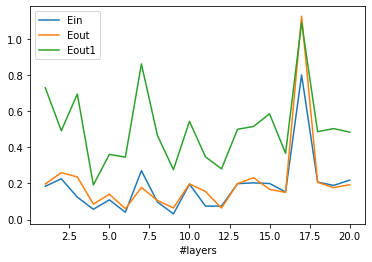

In [20]:
plt.plot(Layers,Ein,label='Ein')
plt.plot(Layers,Eout,label='Eout')
plt.plot(Layers,Eout1,label='Eout1')
plt.xlabel('#layers')
plt.legend()
plt.show()

Questa volta osserviamo che tutte le curve hanno un andamento oscillatorio molto marcato al vairare del numero dei layer. Pertanto considero questa geometria poco affidabile per fit e predizioni.

### Geometria 4
Infine ho osservato il comportamento di reti il cui primo hidden layer è formato da $N$ neuroni, il successivo da $N-1$ e così via fino all'ultimo hidden layer contenente 2 neuroni. Ho fatto variare $N$ nel range $[2,16]$.

In [21]:
Neurons=np.arange(2,17) #number of neurons of the first hidden layer
Ein=np.zeros(len(Neurons))
Eout=np.zeros(len(Neurons))
Eout1=np.zeros(len(Neurons))

for i in range(len(Neurons)):
   model = Sequential()    
   model.add(Dense(Neurons[i], input_shape=(1,),activation='selu')) 
   for j in range(Neurons[i]-2):
      model.add(Dense(Neurons[i]-(j+1),activation='selu')) 
   model.add(Dense(1,activation='selu'))
   Nparams = model.count_params()
   #compile
   model.compile(optimizer='sgd', loss='mse', metrics=['mse']) 
   model.summary()
   # fit
   history = model.fit(x=x_train, y=y_train, 
             batch_size=32, epochs=Ne,
             shuffle=True, # a good idea is to shuffle input before at each epoch
             validation_data=(x_valid, y_valid))
   #evaluate model on training dataset
   score_t = model.evaluate(x_train, y_train, batch_size=32, verbose=1)
   # evaluate model on validation dataset
   score_v = model.evaluate(x_valid, y_valid, batch_size=32, verbose=1)
   score_v1 = model.evaluate(x_valid1, y_valid1, batch_size=32, verbose=1)
   Ein[i] = score_t[0]
   Eout[i] = score_v[0]
   Eout1[i] = score_v1[0] 

Model: "sequential_135"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_795 (Dense)            (None, 2)                 4         
_________________________________________________________________
dense_796 (Dense)            (None, 1)                 3         
Total params: 7
Trainable params: 7
Non-trainable params: 0
_________________________________________________________________
Train on 45 samples, validate on 30 samples
Epoch 1/500
45/45 [==============================] - 4s 89ms/sample - loss: 11.1654 - mean_squared_error: 11.1654 - val_loss: 18.1923 - val_mean_squared_error: 18.1923
Epoch 2/500
45/45 [==============================] - 0s 505us/sample - loss: 9.8374 - mean_squared_error: 9.8374 - val_loss: 16.7477 - val_mean_squared_error: 16.7477
Epoch 3/500
45/45 [==============================] - 0s 634us/sample - loss: 8.7224 - mean_squared_error: 8.7224 - val_loss: 15.4245 - val_me

45/45 [==============================] - 0s 414us/sample - loss: 0.8452 - mean_squared_error: 0.8452 - val_loss: 1.1337 - val_mean_squared_error: 1.1337
Epoch 96/500
45/45 [==============================] - 0s 645us/sample - loss: 0.8406 - mean_squared_error: 0.8406 - val_loss: 1.1292 - val_mean_squared_error: 1.1292
Epoch 97/500
45/45 [==============================] - 0s 656us/sample - loss: 0.8378 - mean_squared_error: 0.8378 - val_loss: 1.1186 - val_mean_squared_error: 1.1186
Epoch 98/500
45/45 [==============================] - 0s 555us/sample - loss: 0.8363 - mean_squared_error: 0.8363 - val_loss: 1.1253 - val_mean_squared_error: 1.1253
Epoch 99/500
45/45 [==============================] - 0s 514us/sample - loss: 0.8306 - mean_squared_error: 0.8306 - val_loss: 1.1157 - val_mean_squared_error: 1.1157
Epoch 100/500
45/45 [==============================] - 0s 489us/sample - loss: 0.8290 - mean_squared_error: 0.8290 - val_loss: 1.1203 - val_mean_squared_error: 1.1203
Epoch 101/500
45

45/45 [==============================] - 0s 585us/sample - loss: 0.6245 - mean_squared_error: 0.6245 - val_loss: 0.5790 - val_mean_squared_error: 0.5790
Epoch 194/500
45/45 [==============================] - 0s 545us/sample - loss: 0.6225 - mean_squared_error: 0.6225 - val_loss: 0.5775 - val_mean_squared_error: 0.5775
Epoch 195/500
45/45 [==============================] - 0s 523us/sample - loss: 0.6213 - mean_squared_error: 0.6213 - val_loss: 0.5674 - val_mean_squared_error: 0.5674
Epoch 196/500
45/45 [==============================] - 0s 572us/sample - loss: 0.6192 - mean_squared_error: 0.6192 - val_loss: 0.5691 - val_mean_squared_error: 0.5691
Epoch 197/500
45/45 [==============================] - 0s 524us/sample - loss: 0.6176 - mean_squared_error: 0.6176 - val_loss: 0.5663 - val_mean_squared_error: 0.5663
Epoch 198/500
45/45 [==============================] - 0s 482us/sample - loss: 0.6166 - mean_squared_error: 0.6166 - val_loss: 0.5655 - val_mean_squared_error: 0.5655
Epoch 199/50

45/45 [==============================] - 0s 356us/sample - loss: 0.5083 - mean_squared_error: 0.5083 - val_loss: 0.3641 - val_mean_squared_error: 0.3641
Epoch 292/500
45/45 [==============================] - 0s 344us/sample - loss: 0.5076 - mean_squared_error: 0.5076 - val_loss: 0.3672 - val_mean_squared_error: 0.3672
Epoch 293/500
45/45 [==============================] - 0s 370us/sample - loss: 0.5065 - mean_squared_error: 0.5065 - val_loss: 0.3689 - val_mean_squared_error: 0.3689
Epoch 294/500
45/45 [==============================] - 0s 327us/sample - loss: 0.5058 - mean_squared_error: 0.5058 - val_loss: 0.3703 - val_mean_squared_error: 0.3703
Epoch 295/500
45/45 [==============================] - 0s 337us/sample - loss: 0.5050 - mean_squared_error: 0.5050 - val_loss: 0.3688 - val_mean_squared_error: 0.3688
Epoch 296/500
45/45 [==============================] - 0s 363us/sample - loss: 0.5045 - mean_squared_error: 0.5045 - val_loss: 0.3704 - val_mean_squared_error: 0.3704
Epoch 297/50

45/45 [==============================] - 0s 438us/sample - loss: 0.4746 - mean_squared_error: 0.4746 - val_loss: 0.3479 - val_mean_squared_error: 0.3479
Epoch 390/500
45/45 [==============================] - 0s 584us/sample - loss: 0.4744 - mean_squared_error: 0.4744 - val_loss: 0.3477 - val_mean_squared_error: 0.3477
Epoch 391/500
45/45 [==============================] - 0s 499us/sample - loss: 0.4745 - mean_squared_error: 0.4745 - val_loss: 0.3503 - val_mean_squared_error: 0.3503
Epoch 392/500
45/45 [==============================] - 0s 408us/sample - loss: 0.4742 - mean_squared_error: 0.4742 - val_loss: 0.3524 - val_mean_squared_error: 0.3524
Epoch 393/500
45/45 [==============================] - 0s 607us/sample - loss: 0.4746 - mean_squared_error: 0.4746 - val_loss: 0.3487 - val_mean_squared_error: 0.3487
Epoch 394/500
45/45 [==============================] - 0s 476us/sample - loss: 0.4735 - mean_squared_error: 0.4735 - val_loss: 0.3502 - val_mean_squared_error: 0.3502
Epoch 395/50

45/45 [==============================] - 0s 517us/sample - loss: 0.4649 - mean_squared_error: 0.4649 - val_loss: 0.3534 - val_mean_squared_error: 0.3534
Epoch 488/500
45/45 [==============================] - 0s 691us/sample - loss: 0.4651 - mean_squared_error: 0.4651 - val_loss: 0.3550 - val_mean_squared_error: 0.3550
Epoch 489/500
45/45 [==============================] - 0s 588us/sample - loss: 0.4651 - mean_squared_error: 0.4651 - val_loss: 0.3560 - val_mean_squared_error: 0.3560
Epoch 490/500
45/45 [==============================] - 0s 619us/sample - loss: 0.4649 - mean_squared_error: 0.4649 - val_loss: 0.3547 - val_mean_squared_error: 0.3547
Epoch 491/500
45/45 [==============================] - 0s 574us/sample - loss: 0.4659 - mean_squared_error: 0.4659 - val_loss: 0.3585 - val_mean_squared_error: 0.3585
Epoch 492/500
45/45 [==============================] - 0s 573us/sample - loss: 0.4673 - mean_squared_error: 0.4673 - val_loss: 0.3642 - val_mean_squared_error: 0.3642
Epoch 493/50

Epoch 30/500
45/45 [==============================] - 0s 596us/sample - loss: 0.2302 - mean_squared_error: 0.2302 - val_loss: 0.2141 - val_mean_squared_error: 0.2141
Epoch 31/500
45/45 [==============================] - 0s 633us/sample - loss: 0.2295 - mean_squared_error: 0.2295 - val_loss: 0.2196 - val_mean_squared_error: 0.2196
Epoch 32/500
45/45 [==============================] - 0s 598us/sample - loss: 0.2290 - mean_squared_error: 0.2290 - val_loss: 0.2218 - val_mean_squared_error: 0.2218
Epoch 33/500
45/45 [==============================] - 0s 590us/sample - loss: 0.2271 - mean_squared_error: 0.2271 - val_loss: 0.2136 - val_mean_squared_error: 0.2136
Epoch 34/500
45/45 [==============================] - 0s 560us/sample - loss: 0.2287 - mean_squared_error: 0.2287 - val_loss: 0.2279 - val_mean_squared_error: 0.2279
Epoch 35/500
45/45 [==============================] - 0s 518us/sample - loss: 0.2260 - mean_squared_error: 0.2260 - val_loss: 0.2087 - val_mean_squared_error: 0.2087
Epoc

45/45 [==============================] - 0s 653us/sample - loss: 0.1429 - mean_squared_error: 0.1429 - val_loss: 0.1717 - val_mean_squared_error: 0.1717
Epoch 129/500
45/45 [==============================] - 0s 577us/sample - loss: 0.1415 - mean_squared_error: 0.1415 - val_loss: 0.1797 - val_mean_squared_error: 0.1797
Epoch 130/500
45/45 [==============================] - 0s 581us/sample - loss: 0.1407 - mean_squared_error: 0.1407 - val_loss: 0.1846 - val_mean_squared_error: 0.1846
Epoch 131/500
45/45 [==============================] - 0s 557us/sample - loss: 0.1404 - mean_squared_error: 0.1404 - val_loss: 0.1787 - val_mean_squared_error: 0.1787
Epoch 132/500
45/45 [==============================] - 0s 547us/sample - loss: 0.1397 - mean_squared_error: 0.1397 - val_loss: 0.1854 - val_mean_squared_error: 0.1854
Epoch 133/500
45/45 [==============================] - 0s 580us/sample - loss: 0.1391 - mean_squared_error: 0.1391 - val_loss: 0.1801 - val_mean_squared_error: 0.1801
Epoch 134/50

45/45 [==============================] - 0s 578us/sample - loss: 0.1073 - mean_squared_error: 0.1073 - val_loss: 0.1839 - val_mean_squared_error: 0.1839
Epoch 227/500
45/45 [==============================] - 0s 653us/sample - loss: 0.1071 - mean_squared_error: 0.1071 - val_loss: 0.1762 - val_mean_squared_error: 0.1762
Epoch 228/500
45/45 [==============================] - 0s 566us/sample - loss: 0.1067 - mean_squared_error: 0.1067 - val_loss: 0.1740 - val_mean_squared_error: 0.1740
Epoch 229/500
45/45 [==============================] - 0s 551us/sample - loss: 0.1063 - mean_squared_error: 0.1063 - val_loss: 0.1718 - val_mean_squared_error: 0.1718
Epoch 230/500
45/45 [==============================] - 0s 523us/sample - loss: 0.1076 - mean_squared_error: 0.1076 - val_loss: 0.1846 - val_mean_squared_error: 0.1846
Epoch 231/500
45/45 [==============================] - 0s 628us/sample - loss: 0.1085 - mean_squared_error: 0.1085 - val_loss: 0.1884 - val_mean_squared_error: 0.1884
Epoch 232/50

45/45 [==============================] - 0s 506us/sample - loss: 0.0926 - mean_squared_error: 0.0926 - val_loss: 0.1668 - val_mean_squared_error: 0.1668
Epoch 325/500
45/45 [==============================] - 0s 685us/sample - loss: 0.0934 - mean_squared_error: 0.0934 - val_loss: 0.1600 - val_mean_squared_error: 0.1600
Epoch 326/500
45/45 [==============================] - 0s 532us/sample - loss: 0.0937 - mean_squared_error: 0.0937 - val_loss: 0.1705 - val_mean_squared_error: 0.1705
Epoch 327/500
45/45 [==============================] - 0s 589us/sample - loss: 0.0927 - mean_squared_error: 0.0927 - val_loss: 0.1665 - val_mean_squared_error: 0.1665
Epoch 328/500
45/45 [==============================] - 0s 656us/sample - loss: 0.0927 - mean_squared_error: 0.0927 - val_loss: 0.1633 - val_mean_squared_error: 0.1633
Epoch 329/500
45/45 [==============================] - 0s 667us/sample - loss: 0.0923 - mean_squared_error: 0.0923 - val_loss: 0.1689 - val_mean_squared_error: 0.1689
Epoch 330/50

45/45 [==============================] - 0s 527us/sample - loss: 0.0840 - mean_squared_error: 0.0840 - val_loss: 0.1536 - val_mean_squared_error: 0.1536
Epoch 423/500
45/45 [==============================] - 0s 574us/sample - loss: 0.0836 - mean_squared_error: 0.0836 - val_loss: 0.1507 - val_mean_squared_error: 0.1507
Epoch 424/500
45/45 [==============================] - 0s 545us/sample - loss: 0.0829 - mean_squared_error: 0.0829 - val_loss: 0.1492 - val_mean_squared_error: 0.1492
Epoch 425/500
45/45 [==============================] - 0s 488us/sample - loss: 0.0840 - mean_squared_error: 0.0840 - val_loss: 0.1519 - val_mean_squared_error: 0.1519
Epoch 426/500
45/45 [==============================] - 0s 567us/sample - loss: 0.0827 - mean_squared_error: 0.0827 - val_loss: 0.1536 - val_mean_squared_error: 0.1536
Epoch 427/500
45/45 [==============================] - 0s 603us/sample - loss: 0.0840 - mean_squared_error: 0.0840 - val_loss: 0.1403 - val_mean_squared_error: 0.1403
Epoch 428/50

Epoch 13/500
45/45 [==============================] - 0s 560us/sample - loss: 0.2681 - mean_squared_error: 0.2681 - val_loss: 0.2259 - val_mean_squared_error: 0.2259
Epoch 14/500
45/45 [==============================] - 0s 684us/sample - loss: 0.2577 - mean_squared_error: 0.2577 - val_loss: 0.2580 - val_mean_squared_error: 0.2580
Epoch 15/500
45/45 [==============================] - 0s 654us/sample - loss: 0.2513 - mean_squared_error: 0.2513 - val_loss: 0.1878 - val_mean_squared_error: 0.1878
Epoch 16/500
45/45 [==============================] - 0s 537us/sample - loss: 0.2525 - mean_squared_error: 0.2525 - val_loss: 0.2460 - val_mean_squared_error: 0.2460
Epoch 17/500
45/45 [==============================] - 0s 568us/sample - loss: 0.2408 - mean_squared_error: 0.2408 - val_loss: 0.2414 - val_mean_squared_error: 0.2414
Epoch 18/500
45/45 [==============================] - 0s 546us/sample - loss: 0.2369 - mean_squared_error: 0.2369 - val_loss: 0.1785 - val_mean_squared_error: 0.1785
Epoc

45/45 [==============================] - 0s 601us/sample - loss: 0.1516 - mean_squared_error: 0.1516 - val_loss: 0.1161 - val_mean_squared_error: 0.1161
Epoch 63/500
45/45 [==============================] - 0s 537us/sample - loss: 0.1704 - mean_squared_error: 0.1704 - val_loss: 0.1131 - val_mean_squared_error: 0.1131
Epoch 64/500
45/45 [==============================] - 0s 576us/sample - loss: 0.1504 - mean_squared_error: 0.1504 - val_loss: 0.1541 - val_mean_squared_error: 0.1541
Epoch 65/500
45/45 [==============================] - 0s 596us/sample - loss: 0.1401 - mean_squared_error: 0.1401 - val_loss: 0.1286 - val_mean_squared_error: 0.1286
Epoch 66/500
45/45 [==============================] - 0s 500us/sample - loss: 0.1471 - mean_squared_error: 0.1471 - val_loss: 0.1415 - val_mean_squared_error: 0.1415
Epoch 67/500
45/45 [==============================] - 0s 591us/sample - loss: 0.1368 - mean_squared_error: 0.1368 - val_loss: 0.2038 - val_mean_squared_error: 0.2038
Epoch 68/500
45/4

45/45 [==============================] - 0s 519us/sample - loss: 0.0718 - mean_squared_error: 0.0718 - val_loss: 0.0914 - val_mean_squared_error: 0.0914
Epoch 161/500
45/45 [==============================] - 0s 590us/sample - loss: 0.0748 - mean_squared_error: 0.0748 - val_loss: 0.1048 - val_mean_squared_error: 0.1048
Epoch 162/500
45/45 [==============================] - 0s 664us/sample - loss: 0.0726 - mean_squared_error: 0.0726 - val_loss: 0.1608 - val_mean_squared_error: 0.1608
Epoch 163/500
45/45 [==============================] - 0s 714us/sample - loss: 0.0789 - mean_squared_error: 0.0789 - val_loss: 0.0958 - val_mean_squared_error: 0.0958
Epoch 164/500
45/45 [==============================] - 0s 548us/sample - loss: 0.0733 - mean_squared_error: 0.0733 - val_loss: 0.1929 - val_mean_squared_error: 0.1929
Epoch 165/500
45/45 [==============================] - 0s 594us/sample - loss: 0.0803 - mean_squared_error: 0.0803 - val_loss: 0.1377 - val_mean_squared_error: 0.1377
Epoch 166/50

45/45 [==============================] - 0s 519us/sample - loss: 0.0581 - mean_squared_error: 0.0581 - val_loss: 0.0976 - val_mean_squared_error: 0.0976
Epoch 259/500
45/45 [==============================] - 0s 622us/sample - loss: 0.0576 - mean_squared_error: 0.0576 - val_loss: 0.1332 - val_mean_squared_error: 0.1332
Epoch 260/500
45/45 [==============================] - 0s 704us/sample - loss: 0.0586 - mean_squared_error: 0.0586 - val_loss: 0.0911 - val_mean_squared_error: 0.0911
Epoch 261/500
45/45 [==============================] - 0s 674us/sample - loss: 0.0797 - mean_squared_error: 0.0797 - val_loss: 0.0768 - val_mean_squared_error: 0.0768
Epoch 262/500
45/45 [==============================] - 0s 460us/sample - loss: 0.0684 - mean_squared_error: 0.0684 - val_loss: 0.1013 - val_mean_squared_error: 0.1013
Epoch 263/500
45/45 [==============================] - 0s 544us/sample - loss: 0.0607 - mean_squared_error: 0.0607 - val_loss: 0.0786 - val_mean_squared_error: 0.0786
Epoch 264/50

45/45 [==============================] - 0s 517us/sample - loss: 0.0523 - mean_squared_error: 0.0523 - val_loss: 0.1206 - val_mean_squared_error: 0.1206
Epoch 357/500
45/45 [==============================] - 0s 505us/sample - loss: 0.0639 - mean_squared_error: 0.0639 - val_loss: 0.0979 - val_mean_squared_error: 0.0979
Epoch 358/500
45/45 [==============================] - 0s 531us/sample - loss: 0.0511 - mean_squared_error: 0.0511 - val_loss: 0.0695 - val_mean_squared_error: 0.0695
Epoch 359/500
45/45 [==============================] - 0s 605us/sample - loss: 0.0567 - mean_squared_error: 0.0567 - val_loss: 0.0874 - val_mean_squared_error: 0.0874
Epoch 360/500
45/45 [==============================] - 0s 655us/sample - loss: 0.0536 - mean_squared_error: 0.0536 - val_loss: 0.1376 - val_mean_squared_error: 0.1376
Epoch 361/500
45/45 [==============================] - 0s 543us/sample - loss: 0.0671 - mean_squared_error: 0.0671 - val_loss: 0.0723 - val_mean_squared_error: 0.0723
Epoch 362/50

45/45 [==============================] - 0s 664us/sample - loss: 0.0488 - mean_squared_error: 0.0488 - val_loss: 0.0869 - val_mean_squared_error: 0.0869
Epoch 455/500
45/45 [==============================] - 0s 633us/sample - loss: 0.0480 - mean_squared_error: 0.0480 - val_loss: 0.0721 - val_mean_squared_error: 0.0721
Epoch 456/500
45/45 [==============================] - 0s 572us/sample - loss: 0.0471 - mean_squared_error: 0.0471 - val_loss: 0.0997 - val_mean_squared_error: 0.0997
Epoch 457/500
45/45 [==============================] - 0s 601us/sample - loss: 0.0481 - mean_squared_error: 0.0481 - val_loss: 0.0646 - val_mean_squared_error: 0.0646
Epoch 458/500
45/45 [==============================] - 0s 603us/sample - loss: 0.0519 - mean_squared_error: 0.0519 - val_loss: 0.1083 - val_mean_squared_error: 0.1083
Epoch 459/500
45/45 [==============================] - 0s 602us/sample - loss: 0.0531 - mean_squared_error: 0.0531 - val_loss: 0.0744 - val_mean_squared_error: 0.0744
Epoch 460/50

Epoch 1/500
45/45 [==============================] - 4s 82ms/sample - loss: 11.5040 - mean_squared_error: 11.5040 - val_loss: 1.4870 - val_mean_squared_error: 1.4870
Epoch 2/500
45/45 [==============================] - 0s 651us/sample - loss: 0.9678 - mean_squared_error: 0.9678 - val_loss: 0.5671 - val_mean_squared_error: 0.5671
Epoch 3/500
45/45 [==============================] - 0s 526us/sample - loss: 0.4506 - mean_squared_error: 0.4506 - val_loss: 0.4061 - val_mean_squared_error: 0.4061
Epoch 4/500
45/45 [==============================] - 0s 591us/sample - loss: 0.4267 - mean_squared_error: 0.4267 - val_loss: 0.5226 - val_mean_squared_error: 0.5226
Epoch 5/500
45/45 [==============================] - 0s 659us/sample - loss: 0.4117 - mean_squared_error: 0.4117 - val_loss: 0.4052 - val_mean_squared_error: 0.4052
Epoch 6/500
45/45 [==============================] - 0s 526us/sample - loss: 0.3871 - mean_squared_error: 0.3871 - val_loss: 0.4179 - val_mean_squared_error: 0.4179
Epoch 7/5

45/45 [==============================] - 0s 578us/sample - loss: 0.1057 - mean_squared_error: 0.1057 - val_loss: 0.1630 - val_mean_squared_error: 0.1630
Epoch 100/500
45/45 [==============================] - 0s 599us/sample - loss: 0.1041 - mean_squared_error: 0.1041 - val_loss: 0.1791 - val_mean_squared_error: 0.1791
Epoch 101/500
45/45 [==============================] - 0s 635us/sample - loss: 0.1044 - mean_squared_error: 0.1044 - val_loss: 0.1967 - val_mean_squared_error: 0.1967
Epoch 102/500
45/45 [==============================] - 0s 594us/sample - loss: 0.1019 - mean_squared_error: 0.1019 - val_loss: 0.1664 - val_mean_squared_error: 0.1664
Epoch 103/500
45/45 [==============================] - 0s 555us/sample - loss: 0.1014 - mean_squared_error: 0.1014 - val_loss: 0.2008 - val_mean_squared_error: 0.2008
Epoch 104/500
45/45 [==============================] - 0s 658us/sample - loss: 0.1008 - mean_squared_error: 0.1008 - val_loss: 0.1229 - val_mean_squared_error: 0.1229
Epoch 105/50

45/45 [==============================] - 0s 642us/sample - loss: 0.0582 - mean_squared_error: 0.0582 - val_loss: 0.1019 - val_mean_squared_error: 0.1019
Epoch 198/500
45/45 [==============================] - 0s 655us/sample - loss: 0.0584 - mean_squared_error: 0.0584 - val_loss: 0.0598 - val_mean_squared_error: 0.0598
Epoch 199/500
45/45 [==============================] - 0s 701us/sample - loss: 0.0581 - mean_squared_error: 0.0581 - val_loss: 0.1058 - val_mean_squared_error: 0.1058
Epoch 200/500
45/45 [==============================] - 0s 604us/sample - loss: 0.0593 - mean_squared_error: 0.0593 - val_loss: 0.0684 - val_mean_squared_error: 0.0684
Epoch 201/500
45/45 [==============================] - 0s 639us/sample - loss: 0.0588 - mean_squared_error: 0.0588 - val_loss: 0.0577 - val_mean_squared_error: 0.0577
Epoch 202/500
45/45 [==============================] - 0s 756us/sample - loss: 0.0600 - mean_squared_error: 0.0600 - val_loss: 0.0825 - val_mean_squared_error: 0.0825
Epoch 203/50

45/45 [==============================] - 0s 600us/sample - loss: 0.0450 - mean_squared_error: 0.0450 - val_loss: 0.0597 - val_mean_squared_error: 0.0597
Epoch 296/500
45/45 [==============================] - 0s 592us/sample - loss: 0.0439 - mean_squared_error: 0.0439 - val_loss: 0.0549 - val_mean_squared_error: 0.0549
Epoch 297/500
45/45 [==============================] - 0s 635us/sample - loss: 0.0464 - mean_squared_error: 0.0464 - val_loss: 0.0544 - val_mean_squared_error: 0.0544
Epoch 298/500
45/45 [==============================] - 0s 640us/sample - loss: 0.0458 - mean_squared_error: 0.0458 - val_loss: 0.0539 - val_mean_squared_error: 0.0539
Epoch 299/500
45/45 [==============================] - 0s 655us/sample - loss: 0.0459 - mean_squared_error: 0.0459 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 300/500
45/45 [==============================] - 0s 564us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0634 - val_mean_squared_error: 0.0634
Epoch 301/50

45/45 [==============================] - 0s 656us/sample - loss: 0.0390 - mean_squared_error: 0.0390 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 394/500
45/45 [==============================] - 0s 611us/sample - loss: 0.0416 - mean_squared_error: 0.0416 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 395/500
45/45 [==============================] - 0s 542us/sample - loss: 0.0434 - mean_squared_error: 0.0434 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 396/500
45/45 [==============================] - 0s 561us/sample - loss: 0.0404 - mean_squared_error: 0.0404 - val_loss: 0.0720 - val_mean_squared_error: 0.0720
Epoch 397/500
45/45 [==============================] - 0s 549us/sample - loss: 0.0433 - mean_squared_error: 0.0433 - val_loss: 0.0591 - val_mean_squared_error: 0.0591
Epoch 398/500
45/45 [==============================] - 0s 504us/sample - loss: 0.0411 - mean_squared_error: 0.0411 - val_loss: 0.0651 - val_mean_squared_error: 0.0651
Epoch 399/50

45/45 [==============================] - 0s 507us/sample - loss: 0.0383 - mean_squared_error: 0.0383 - val_loss: 0.0517 - val_mean_squared_error: 0.0517
Epoch 492/500
45/45 [==============================] - 0s 565us/sample - loss: 0.0366 - mean_squared_error: 0.0366 - val_loss: 0.0526 - val_mean_squared_error: 0.0526
Epoch 493/500
45/45 [==============================] - 0s 618us/sample - loss: 0.0383 - mean_squared_error: 0.0383 - val_loss: 0.0492 - val_mean_squared_error: 0.0492
Epoch 494/500
45/45 [==============================] - 0s 552us/sample - loss: 0.0357 - mean_squared_error: 0.0357 - val_loss: 0.0521 - val_mean_squared_error: 0.0521
Epoch 495/500
45/45 [==============================] - 0s 532us/sample - loss: 0.0386 - mean_squared_error: 0.0386 - val_loss: 0.0740 - val_mean_squared_error: 0.0740
Epoch 496/500
45/45 [==============================] - 0s 496us/sample - loss: 0.0433 - mean_squared_error: 0.0433 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 497/50

45/45 [==============================] - 0s 487us/sample - loss: 0.2265 - mean_squared_error: 0.2265 - val_loss: 0.2420 - val_mean_squared_error: 0.2420
Epoch 81/500
45/45 [==============================] - 0s 743us/sample - loss: 0.1880 - mean_squared_error: 0.1880 - val_loss: 0.1666 - val_mean_squared_error: 0.1666
Epoch 82/500
45/45 [==============================] - 0s 513us/sample - loss: 0.1850 - mean_squared_error: 0.1850 - val_loss: 0.1843 - val_mean_squared_error: 0.1843
Epoch 83/500
45/45 [==============================] - 0s 557us/sample - loss: 0.1802 - mean_squared_error: 0.1802 - val_loss: 0.2172 - val_mean_squared_error: 0.2172
Epoch 84/500
45/45 [==============================] - 0s 523us/sample - loss: 0.1766 - mean_squared_error: 0.1766 - val_loss: 0.2188 - val_mean_squared_error: 0.2188
Epoch 85/500
45/45 [==============================] - 0s 553us/sample - loss: 0.1727 - mean_squared_error: 0.1727 - val_loss: 0.1671 - val_mean_squared_error: 0.1671
Epoch 86/500
45/4

45/45 [==============================] - 0s 554us/sample - loss: 0.1067 - mean_squared_error: 0.1067 - val_loss: 0.1567 - val_mean_squared_error: 0.1567
Epoch 179/500
45/45 [==============================] - 0s 583us/sample - loss: 0.0983 - mean_squared_error: 0.0983 - val_loss: 0.1411 - val_mean_squared_error: 0.1411
Epoch 180/500
45/45 [==============================] - 0s 576us/sample - loss: 0.0984 - mean_squared_error: 0.0984 - val_loss: 0.1583 - val_mean_squared_error: 0.1583
Epoch 181/500
45/45 [==============================] - 0s 567us/sample - loss: 0.1088 - mean_squared_error: 0.1088 - val_loss: 0.2068 - val_mean_squared_error: 0.2068
Epoch 182/500
45/45 [==============================] - 0s 577us/sample - loss: 0.1218 - mean_squared_error: 0.1218 - val_loss: 0.1942 - val_mean_squared_error: 0.1942
Epoch 183/500
45/45 [==============================] - 0s 530us/sample - loss: 0.1222 - mean_squared_error: 0.1222 - val_loss: 0.1583 - val_mean_squared_error: 0.1583
Epoch 184/50

Epoch 276/500
45/45 [==============================] - 0s 563us/sample - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.1561 - val_mean_squared_error: 0.1561
Epoch 277/500
45/45 [==============================] - 0s 638us/sample - loss: 0.0789 - mean_squared_error: 0.0789 - val_loss: 0.1233 - val_mean_squared_error: 0.1233
Epoch 278/500
45/45 [==============================] - 0s 612us/sample - loss: 0.0689 - mean_squared_error: 0.0689 - val_loss: 0.1028 - val_mean_squared_error: 0.1028
Epoch 279/500
45/45 [==============================] - 0s 566us/sample - loss: 0.0806 - mean_squared_error: 0.0806 - val_loss: 0.0981 - val_mean_squared_error: 0.0981
Epoch 280/500
45/45 [==============================] - 0s 608us/sample - loss: 0.0837 - mean_squared_error: 0.0837 - val_loss: 0.1125 - val_mean_squared_error: 0.1125
Epoch 281/500
45/45 [==============================] - 0s 567us/sample - loss: 0.0920 - mean_squared_error: 0.0920 - val_loss: 0.1288 - val_mean_squared_error: 0.128

45/45 [==============================] - 0s 563us/sample - loss: 0.0763 - mean_squared_error: 0.0763 - val_loss: 0.1339 - val_mean_squared_error: 0.1339
Epoch 326/500
45/45 [==============================] - 0s 608us/sample - loss: 0.0991 - mean_squared_error: 0.0991 - val_loss: 0.2169 - val_mean_squared_error: 0.2169
Epoch 327/500
45/45 [==============================] - 0s 638us/sample - loss: 0.1305 - mean_squared_error: 0.1305 - val_loss: 0.1476 - val_mean_squared_error: 0.1476
Epoch 328/500
45/45 [==============================] - 0s 583us/sample - loss: 0.0724 - mean_squared_error: 0.0724 - val_loss: 0.0917 - val_mean_squared_error: 0.0917
Epoch 329/500
45/45 [==============================] - 0s 699us/sample - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.1075 - val_mean_squared_error: 0.1075
Epoch 330/500
45/45 [==============================] - 0s 555us/sample - loss: 0.0864 - mean_squared_error: 0.0864 - val_loss: 0.0932 - val_mean_squared_error: 0.0932
Epoch 331/50

45/45 [==============================] - 0s 446us/sample - loss: 0.0610 - mean_squared_error: 0.0610 - val_loss: 0.0964 - val_mean_squared_error: 0.0964
Epoch 424/500
45/45 [==============================] - 0s 529us/sample - loss: 0.0607 - mean_squared_error: 0.0607 - val_loss: 0.1096 - val_mean_squared_error: 0.1096
Epoch 425/500
45/45 [==============================] - 0s 640us/sample - loss: 0.0579 - mean_squared_error: 0.0579 - val_loss: 0.0945 - val_mean_squared_error: 0.0945
Epoch 426/500
45/45 [==============================] - 0s 510us/sample - loss: 0.0608 - mean_squared_error: 0.0608 - val_loss: 0.0826 - val_mean_squared_error: 0.0826
Epoch 427/500
45/45 [==============================] - 0s 490us/sample - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.0918 - val_mean_squared_error: 0.0918
Epoch 428/500
45/45 [==============================] - 0s 521us/sample - loss: 0.0747 - mean_squared_error: 0.0747 - val_loss: 0.0778 - val_mean_squared_error: 0.0778
Epoch 429/50

45/45 [==============================] - 0s 568us/sample - loss: 0.8686 - mean_squared_error: 0.8686 - val_loss: 1.1957 - val_mean_squared_error: 1.1957
Epoch 12/500
45/45 [==============================] - 0s 614us/sample - loss: 0.8686 - mean_squared_error: 0.8686 - val_loss: 1.2447 - val_mean_squared_error: 1.2447
Epoch 13/500
45/45 [==============================] - 0s 640us/sample - loss: 0.8639 - mean_squared_error: 0.8639 - val_loss: 1.1565 - val_mean_squared_error: 1.1565
Epoch 14/500
45/45 [==============================] - 0s 616us/sample - loss: 0.8585 - mean_squared_error: 0.8585 - val_loss: 1.2052 - val_mean_squared_error: 1.2052
Epoch 15/500
45/45 [==============================] - 0s 451us/sample - loss: 0.8580 - mean_squared_error: 0.8580 - val_loss: 1.1147 - val_mean_squared_error: 1.1147
Epoch 16/500
45/45 [==============================] - 0s 516us/sample - loss: 0.8515 - mean_squared_error: 0.8515 - val_loss: 1.1425 - val_mean_squared_error: 1.1425
Epoch 17/500
45/4

45/45 [==============================] - 0s 525us/sample - loss: 0.2249 - mean_squared_error: 0.2249 - val_loss: 0.1800 - val_mean_squared_error: 0.1800
Epoch 110/500
45/45 [==============================] - 0s 445us/sample - loss: 0.1931 - mean_squared_error: 0.1931 - val_loss: 0.2007 - val_mean_squared_error: 0.2007
Epoch 111/500
45/45 [==============================] - 0s 585us/sample - loss: 0.1916 - mean_squared_error: 0.1916 - val_loss: 0.2342 - val_mean_squared_error: 0.2342
Epoch 112/500
45/45 [==============================] - 0s 647us/sample - loss: 0.1979 - mean_squared_error: 0.1979 - val_loss: 0.1657 - val_mean_squared_error: 0.1657
Epoch 113/500
45/45 [==============================] - 0s 582us/sample - loss: 0.1925 - mean_squared_error: 0.1925 - val_loss: 0.2130 - val_mean_squared_error: 0.2130
Epoch 114/500
45/45 [==============================] - 0s 492us/sample - loss: 0.1879 - mean_squared_error: 0.1879 - val_loss: 0.1828 - val_mean_squared_error: 0.1828
Epoch 115/50

45/45 [==============================] - 0s 506us/sample - loss: 0.0744 - mean_squared_error: 0.0744 - val_loss: 0.1499 - val_mean_squared_error: 0.1499
Epoch 208/500
45/45 [==============================] - 0s 544us/sample - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.1211 - val_mean_squared_error: 0.1211
Epoch 209/500
45/45 [==============================] - 0s 477us/sample - loss: 0.0630 - mean_squared_error: 0.0630 - val_loss: 0.1137 - val_mean_squared_error: 0.1137
Epoch 210/500
45/45 [==============================] - 0s 523us/sample - loss: 0.1031 - mean_squared_error: 0.1031 - val_loss: 0.2099 - val_mean_squared_error: 0.2099
Epoch 211/500
45/45 [==============================] - 0s 498us/sample - loss: 0.1725 - mean_squared_error: 0.1725 - val_loss: 0.1890 - val_mean_squared_error: 0.1890
Epoch 212/500
45/45 [==============================] - 0s 472us/sample - loss: 0.0932 - mean_squared_error: 0.0932 - val_loss: 0.1434 - val_mean_squared_error: 0.1434
Epoch 213/50

45/45 [==============================] - 0s 419us/sample - loss: 0.0547 - mean_squared_error: 0.0547 - val_loss: 0.0545 - val_mean_squared_error: 0.0545
Epoch 306/500
45/45 [==============================] - 0s 531us/sample - loss: 0.0442 - mean_squared_error: 0.0442 - val_loss: 0.0749 - val_mean_squared_error: 0.0749
Epoch 307/500
45/45 [==============================] - 0s 502us/sample - loss: 0.0469 - mean_squared_error: 0.0469 - val_loss: 0.0596 - val_mean_squared_error: 0.0596
Epoch 308/500
45/45 [==============================] - 0s 434us/sample - loss: 0.0430 - mean_squared_error: 0.0430 - val_loss: 0.0729 - val_mean_squared_error: 0.0729
Epoch 309/500
45/45 [==============================] - 0s 473us/sample - loss: 0.0613 - mean_squared_error: 0.0613 - val_loss: 0.0704 - val_mean_squared_error: 0.0704
Epoch 310/500
45/45 [==============================] - 0s 581us/sample - loss: 0.0701 - mean_squared_error: 0.0701 - val_loss: 0.0669 - val_mean_squared_error: 0.0669
Epoch 311/50

45/45 [==============================] - 0s 438us/sample - loss: 0.0451 - mean_squared_error: 0.0451 - val_loss: 0.0708 - val_mean_squared_error: 0.0708
Epoch 404/500
45/45 [==============================] - 0s 509us/sample - loss: 0.0445 - mean_squared_error: 0.0445 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 405/500
45/45 [==============================] - 0s 469us/sample - loss: 0.0345 - mean_squared_error: 0.0345 - val_loss: 0.0752 - val_mean_squared_error: 0.0752
Epoch 406/500
45/45 [==============================] - 0s 447us/sample - loss: 0.0627 - mean_squared_error: 0.0627 - val_loss: 0.0807 - val_mean_squared_error: 0.0807
Epoch 407/500
45/45 [==============================] - 0s 532us/sample - loss: 0.0632 - mean_squared_error: 0.0632 - val_loss: 0.0670 - val_mean_squared_error: 0.0670
Epoch 408/500
45/45 [==============================] - 0s 544us/sample - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.1023 - val_mean_squared_error: 0.1023
Epoch 409/50

30/30 [==============================] - 0s 185us/sample - loss: 0.3848 - mean_squared_error: 0.3848
Model: "sequential_141"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_822 (Dense)            (None, 8)                 16        
_________________________________________________________________
dense_823 (Dense)            (None, 7)                 63        
_________________________________________________________________
dense_824 (Dense)            (None, 6)                 48        
_________________________________________________________________
dense_825 (Dense)            (None, 5)                 35        
_________________________________________________________________
dense_826 (Dense)            (None, 4)                 24        
_________________________________________________________________
dense_827 (Dense)            (None, 3)                 15        
_________________

Epoch 40/500
45/45 [==============================] - 0s 537us/sample - loss: 0.1022 - mean_squared_error: 0.1022 - val_loss: 0.1668 - val_mean_squared_error: 0.1668
Epoch 41/500
45/45 [==============================] - 0s 550us/sample - loss: 0.1261 - mean_squared_error: 0.1261 - val_loss: 0.2165 - val_mean_squared_error: 0.2165
Epoch 42/500
45/45 [==============================] - 0s 532us/sample - loss: 0.1480 - mean_squared_error: 0.1480 - val_loss: 0.1848 - val_mean_squared_error: 0.1848
Epoch 43/500
45/45 [==============================] - 0s 505us/sample - loss: 0.1121 - mean_squared_error: 0.1121 - val_loss: 0.1413 - val_mean_squared_error: 0.1413
Epoch 44/500
45/45 [==============================] - 0s 488us/sample - loss: 0.0965 - mean_squared_error: 0.0965 - val_loss: 0.1331 - val_mean_squared_error: 0.1331
Epoch 45/500
45/45 [==============================] - 0s 461us/sample - loss: 0.1355 - mean_squared_error: 0.1355 - val_loss: 0.1878 - val_mean_squared_error: 0.1878
Epoc

45/45 [==============================] - 0s 506us/sample - loss: 0.0729 - mean_squared_error: 0.0729 - val_loss: 0.0737 - val_mean_squared_error: 0.0737
Epoch 139/500
45/45 [==============================] - 0s 496us/sample - loss: 0.0658 - mean_squared_error: 0.0658 - val_loss: 0.0980 - val_mean_squared_error: 0.0980
Epoch 140/500
45/45 [==============================] - 0s 541us/sample - loss: 0.0842 - mean_squared_error: 0.0842 - val_loss: 0.1035 - val_mean_squared_error: 0.1035
Epoch 141/500
45/45 [==============================] - 0s 526us/sample - loss: 0.0525 - mean_squared_error: 0.0525 - val_loss: 0.0686 - val_mean_squared_error: 0.0686
Epoch 142/500
45/45 [==============================] - 0s 499us/sample - loss: 0.0520 - mean_squared_error: 0.0520 - val_loss: 0.1346 - val_mean_squared_error: 0.1346
Epoch 143/500
45/45 [==============================] - 0s 476us/sample - loss: 0.0795 - mean_squared_error: 0.0795 - val_loss: 0.0954 - val_mean_squared_error: 0.0954
Epoch 144/50

45/45 [==============================] - 0s 573us/sample - loss: 0.0413 - mean_squared_error: 0.0413 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 237/500
45/45 [==============================] - 0s 484us/sample - loss: 0.0442 - mean_squared_error: 0.0442 - val_loss: 0.0667 - val_mean_squared_error: 0.0667
Epoch 238/500
45/45 [==============================] - 0s 496us/sample - loss: 0.0538 - mean_squared_error: 0.0538 - val_loss: 0.0734 - val_mean_squared_error: 0.0734
Epoch 239/500
45/45 [==============================] - 0s 443us/sample - loss: 0.0447 - mean_squared_error: 0.0447 - val_loss: 0.0749 - val_mean_squared_error: 0.0749
Epoch 240/500
45/45 [==============================] - 0s 501us/sample - loss: 0.0630 - mean_squared_error: 0.0630 - val_loss: 0.0817 - val_mean_squared_error: 0.0817
Epoch 241/500
45/45 [==============================] - 0s 550us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0590 - val_mean_squared_error: 0.0590
Epoch 242/50

45/45 [==============================] - 0s 474us/sample - loss: 0.0360 - mean_squared_error: 0.0360 - val_loss: 0.0625 - val_mean_squared_error: 0.0625
Epoch 335/500
45/45 [==============================] - 0s 496us/sample - loss: 0.0410 - mean_squared_error: 0.0410 - val_loss: 0.0560 - val_mean_squared_error: 0.0560
Epoch 336/500
45/45 [==============================] - 0s 454us/sample - loss: 0.0371 - mean_squared_error: 0.0371 - val_loss: 0.0546 - val_mean_squared_error: 0.0546
Epoch 337/500
45/45 [==============================] - 0s 482us/sample - loss: 0.0362 - mean_squared_error: 0.0362 - val_loss: 0.0588 - val_mean_squared_error: 0.0588
Epoch 338/500
45/45 [==============================] - 0s 567us/sample - loss: 0.0370 - mean_squared_error: 0.0370 - val_loss: 0.0629 - val_mean_squared_error: 0.0629
Epoch 339/500
45/45 [==============================] - 0s 497us/sample - loss: 0.0358 - mean_squared_error: 0.0358 - val_loss: 0.0563 - val_mean_squared_error: 0.0563
Epoch 340/50

45/45 [==============================] - 0s 479us/sample - loss: 0.0374 - mean_squared_error: 0.0374 - val_loss: 0.0640 - val_mean_squared_error: 0.0640
Epoch 433/500
45/45 [==============================] - 0s 490us/sample - loss: 0.0394 - mean_squared_error: 0.0394 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 434/500
45/45 [==============================] - 0s 635us/sample - loss: 0.0381 - mean_squared_error: 0.0381 - val_loss: 0.0669 - val_mean_squared_error: 0.0669
Epoch 435/500
45/45 [==============================] - 0s 457us/sample - loss: 0.0454 - mean_squared_error: 0.0454 - val_loss: 0.0642 - val_mean_squared_error: 0.0642
Epoch 436/500
45/45 [==============================] - 0s 512us/sample - loss: 0.0413 - mean_squared_error: 0.0413 - val_loss: 0.0551 - val_mean_squared_error: 0.0551
Epoch 437/500
45/45 [==============================] - 0s 500us/sample - loss: 0.0338 - mean_squared_error: 0.0338 - val_loss: 0.0616 - val_mean_squared_error: 0.0616
Epoch 438/50

45/45 [==============================] - 0s 546us/sample - loss: 0.3825 - mean_squared_error: 0.3825 - val_loss: 0.5561 - val_mean_squared_error: 0.5561
Epoch 20/500
45/45 [==============================] - 0s 592us/sample - loss: 0.3506 - mean_squared_error: 0.3506 - val_loss: 0.4851 - val_mean_squared_error: 0.4851
Epoch 21/500
45/45 [==============================] - 0s 540us/sample - loss: 0.3160 - mean_squared_error: 0.3160 - val_loss: 0.4327 - val_mean_squared_error: 0.4327
Epoch 22/500
45/45 [==============================] - 0s 592us/sample - loss: 0.2915 - mean_squared_error: 0.2915 - val_loss: 0.3792 - val_mean_squared_error: 0.3792
Epoch 23/500
45/45 [==============================] - 0s 567us/sample - loss: 0.2797 - mean_squared_error: 0.2797 - val_loss: 0.3487 - val_mean_squared_error: 0.3487
Epoch 24/500
45/45 [==============================] - 0s 487us/sample - loss: 0.2577 - mean_squared_error: 0.2577 - val_loss: 0.3299 - val_mean_squared_error: 0.3299
Epoch 25/500
45/4

45/45 [==============================] - 0s 599us/sample - loss: 0.0556 - mean_squared_error: 0.0556 - val_loss: 0.0802 - val_mean_squared_error: 0.0802
Epoch 118/500
45/45 [==============================] - 0s 608us/sample - loss: 0.0554 - mean_squared_error: 0.0554 - val_loss: 0.0809 - val_mean_squared_error: 0.0809
Epoch 119/500
45/45 [==============================] - 0s 521us/sample - loss: 0.0591 - mean_squared_error: 0.0591 - val_loss: 0.0885 - val_mean_squared_error: 0.0885
Epoch 120/500
45/45 [==============================] - 0s 488us/sample - loss: 0.0438 - mean_squared_error: 0.0438 - val_loss: 0.0706 - val_mean_squared_error: 0.0706
Epoch 121/500
45/45 [==============================] - 0s 446us/sample - loss: 0.0682 - mean_squared_error: 0.0682 - val_loss: 0.0972 - val_mean_squared_error: 0.0972
Epoch 122/500
45/45 [==============================] - 0s 493us/sample - loss: 0.1055 - mean_squared_error: 0.1055 - val_loss: 0.0989 - val_mean_squared_error: 0.0989
Epoch 123/50

45/45 [==============================] - 0s 598us/sample - loss: 0.0449 - mean_squared_error: 0.0449 - val_loss: 0.0816 - val_mean_squared_error: 0.0816
Epoch 216/500
45/45 [==============================] - 0s 501us/sample - loss: 0.0558 - mean_squared_error: 0.0558 - val_loss: 0.1352 - val_mean_squared_error: 0.1352
Epoch 217/500
45/45 [==============================] - 0s 468us/sample - loss: 0.0608 - mean_squared_error: 0.0608 - val_loss: 0.0710 - val_mean_squared_error: 0.0710
Epoch 218/500
45/45 [==============================] - 0s 459us/sample - loss: 0.0504 - mean_squared_error: 0.0504 - val_loss: 0.2637 - val_mean_squared_error: 0.2637
Epoch 219/500
45/45 [==============================] - 0s 520us/sample - loss: 0.1293 - mean_squared_error: 0.1293 - val_loss: 0.0842 - val_mean_squared_error: 0.0842
Epoch 220/500
45/45 [==============================] - 0s 548us/sample - loss: 0.0416 - mean_squared_error: 0.0416 - val_loss: 0.0782 - val_mean_squared_error: 0.0782
Epoch 221/50

45/45 [==============================] - 0s 522us/sample - loss: 0.0396 - mean_squared_error: 0.0396 - val_loss: 0.0626 - val_mean_squared_error: 0.0626
Epoch 314/500
45/45 [==============================] - 0s 545us/sample - loss: 0.0397 - mean_squared_error: 0.0397 - val_loss: 0.0619 - val_mean_squared_error: 0.0619
Epoch 315/500
45/45 [==============================] - 0s 543us/sample - loss: 0.0352 - mean_squared_error: 0.0352 - val_loss: 0.0694 - val_mean_squared_error: 0.0694
Epoch 316/500
45/45 [==============================] - 0s 536us/sample - loss: 0.0611 - mean_squared_error: 0.0611 - val_loss: 0.1032 - val_mean_squared_error: 0.1032
Epoch 317/500
45/45 [==============================] - 0s 456us/sample - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0611 - val_mean_squared_error: 0.0611
Epoch 318/500
45/45 [==============================] - 0s 513us/sample - loss: 0.0365 - mean_squared_error: 0.0365 - val_loss: 0.0666 - val_mean_squared_error: 0.0666
Epoch 319/50

45/45 [==============================] - 0s 464us/sample - loss: 0.0328 - mean_squared_error: 0.0328 - val_loss: 0.0674 - val_mean_squared_error: 0.0674
Epoch 412/500
45/45 [==============================] - 0s 593us/sample - loss: 0.0531 - mean_squared_error: 0.0531 - val_loss: 0.0658 - val_mean_squared_error: 0.0658
Epoch 413/500
45/45 [==============================] - 0s 523us/sample - loss: 0.0558 - mean_squared_error: 0.0558 - val_loss: 0.0753 - val_mean_squared_error: 0.0753
Epoch 414/500
45/45 [==============================] - 0s 496us/sample - loss: 0.0593 - mean_squared_error: 0.0593 - val_loss: 0.0637 - val_mean_squared_error: 0.0637
Epoch 415/500
45/45 [==============================] - 0s 506us/sample - loss: 0.0397 - mean_squared_error: 0.0397 - val_loss: 0.0602 - val_mean_squared_error: 0.0602
Epoch 416/500
45/45 [==============================] - 0s 578us/sample - loss: 0.0334 - mean_squared_error: 0.0334 - val_loss: 0.0695 - val_mean_squared_error: 0.0695
Epoch 417/50

Epoch 1/500
45/45 [==============================] - 4s 91ms/sample - loss: 10.0149 - mean_squared_error: 10.0149 - val_loss: 2.9871 - val_mean_squared_error: 2.9871
Epoch 2/500
45/45 [==============================] - 0s 554us/sample - loss: 1.7618 - mean_squared_error: 1.7618 - val_loss: 2.3813 - val_mean_squared_error: 2.3813
Epoch 3/500
45/45 [==============================] - 0s 579us/sample - loss: 1.4136 - mean_squared_error: 1.4136 - val_loss: 2.0800 - val_mean_squared_error: 2.0800
Epoch 4/500
45/45 [==============================] - 0s 598us/sample - loss: 1.2184 - mean_squared_error: 1.2184 - val_loss: 1.7822 - val_mean_squared_error: 1.7822
Epoch 5/500
45/45 [==============================] - 0s 553us/sample - loss: 1.0523 - mean_squared_error: 1.0523 - val_loss: 1.5450 - val_mean_squared_error: 1.5450
Epoch 6/500
45/45 [==============================] - 0s 463us/sample - loss: 0.9471 - mean_squared_error: 0.9471 - val_loss: 1.4317 - val_mean_squared_error: 1.4317
Epoch 7/5

45/45 [==============================] - 0s 457us/sample - loss: 0.1985 - mean_squared_error: 0.1985 - val_loss: 0.1921 - val_mean_squared_error: 0.1921
Epoch 100/500
45/45 [==============================] - 0s 534us/sample - loss: 0.1989 - mean_squared_error: 0.1989 - val_loss: 0.1870 - val_mean_squared_error: 0.1870
Epoch 101/500
45/45 [==============================] - 0s 502us/sample - loss: 0.1992 - mean_squared_error: 0.1992 - val_loss: 0.1930 - val_mean_squared_error: 0.1930
Epoch 102/500
45/45 [==============================] - 0s 567us/sample - loss: 0.1985 - mean_squared_error: 0.1985 - val_loss: 0.1877 - val_mean_squared_error: 0.1877
Epoch 103/500
45/45 [==============================] - 0s 605us/sample - loss: 0.1978 - mean_squared_error: 0.1978 - val_loss: 0.1885 - val_mean_squared_error: 0.1885
Epoch 104/500
45/45 [==============================] - 0s 511us/sample - loss: 0.1981 - mean_squared_error: 0.1981 - val_loss: 0.1871 - val_mean_squared_error: 0.1871
Epoch 105/50

45/45 [==============================] - 0s 518us/sample - loss: 0.1921 - mean_squared_error: 0.1921 - val_loss: 0.1808 - val_mean_squared_error: 0.1808
Epoch 198/500
45/45 [==============================] - 0s 482us/sample - loss: 0.1921 - mean_squared_error: 0.1921 - val_loss: 0.1799 - val_mean_squared_error: 0.1799
Epoch 199/500
45/45 [==============================] - 0s 607us/sample - loss: 0.1902 - mean_squared_error: 0.1902 - val_loss: 0.1817 - val_mean_squared_error: 0.1817
Epoch 200/500
45/45 [==============================] - 0s 626us/sample - loss: 0.1906 - mean_squared_error: 0.1906 - val_loss: 0.1794 - val_mean_squared_error: 0.1794
Epoch 201/500
45/45 [==============================] - 0s 568us/sample - loss: 0.1902 - mean_squared_error: 0.1902 - val_loss: 0.1835 - val_mean_squared_error: 0.1835
Epoch 202/500
45/45 [==============================] - 0s 519us/sample - loss: 0.1906 - mean_squared_error: 0.1906 - val_loss: 0.1854 - val_mean_squared_error: 0.1854
Epoch 203/50

45/45 [==============================] - 0s 487us/sample - loss: 0.0901 - mean_squared_error: 0.0901 - val_loss: 0.1518 - val_mean_squared_error: 0.1518
Epoch 296/500
45/45 [==============================] - 0s 479us/sample - loss: 0.0915 - mean_squared_error: 0.0915 - val_loss: 0.1564 - val_mean_squared_error: 0.1564
Epoch 297/500
45/45 [==============================] - 0s 517us/sample - loss: 0.0871 - mean_squared_error: 0.0871 - val_loss: 0.1589 - val_mean_squared_error: 0.1589
Epoch 298/500
45/45 [==============================] - 0s 508us/sample - loss: 0.0931 - mean_squared_error: 0.0931 - val_loss: 0.1577 - val_mean_squared_error: 0.1577
Epoch 299/500
45/45 [==============================] - 0s 517us/sample - loss: 0.1011 - mean_squared_error: 0.1011 - val_loss: 0.1423 - val_mean_squared_error: 0.1423
Epoch 300/500
45/45 [==============================] - 0s 588us/sample - loss: 0.0883 - mean_squared_error: 0.0883 - val_loss: 0.1331 - val_mean_squared_error: 0.1331
Epoch 301/50

45/45 [==============================] - 0s 504us/sample - loss: 0.0506 - mean_squared_error: 0.0506 - val_loss: 0.0945 - val_mean_squared_error: 0.0945
Epoch 394/500
45/45 [==============================] - 0s 535us/sample - loss: 0.0601 - mean_squared_error: 0.0601 - val_loss: 0.0942 - val_mean_squared_error: 0.0942
Epoch 395/500
45/45 [==============================] - 0s 580us/sample - loss: 0.0483 - mean_squared_error: 0.0483 - val_loss: 0.0915 - val_mean_squared_error: 0.0915
Epoch 396/500
45/45 [==============================] - 0s 561us/sample - loss: 0.0505 - mean_squared_error: 0.0505 - val_loss: 0.0946 - val_mean_squared_error: 0.0946
Epoch 397/500
45/45 [==============================] - 0s 561us/sample - loss: 0.0519 - mean_squared_error: 0.0519 - val_loss: 0.1336 - val_mean_squared_error: 0.1336
Epoch 398/500
45/45 [==============================] - 0s 518us/sample - loss: 0.0816 - mean_squared_error: 0.0816 - val_loss: 0.0918 - val_mean_squared_error: 0.0918
Epoch 399/50

45/45 [==============================] - 0s 458us/sample - loss: 0.0722 - mean_squared_error: 0.0722 - val_loss: 0.1088 - val_mean_squared_error: 0.1088
Epoch 492/500
45/45 [==============================] - 0s 465us/sample - loss: 0.1145 - mean_squared_error: 0.1145 - val_loss: 0.1590 - val_mean_squared_error: 0.1590
Epoch 493/500
45/45 [==============================] - 0s 485us/sample - loss: 0.2099 - mean_squared_error: 0.2099 - val_loss: 0.0964 - val_mean_squared_error: 0.0964
Epoch 494/500
45/45 [==============================] - 0s 507us/sample - loss: 0.0455 - mean_squared_error: 0.0455 - val_loss: 0.0910 - val_mean_squared_error: 0.0910
Epoch 495/500
45/45 [==============================] - 0s 538us/sample - loss: 0.0428 - mean_squared_error: 0.0428 - val_loss: 0.0869 - val_mean_squared_error: 0.0869
Epoch 496/500
45/45 [==============================] - 0s 525us/sample - loss: 0.0423 - mean_squared_error: 0.0423 - val_loss: 0.0877 - val_mean_squared_error: 0.0877
Epoch 497/50

45/45 [==============================] - 0s 493us/sample - loss: 0.1279 - mean_squared_error: 0.1279 - val_loss: 0.1677 - val_mean_squared_error: 0.1677
Epoch 77/500
45/45 [==============================] - 0s 452us/sample - loss: 0.1224 - mean_squared_error: 0.1224 - val_loss: 0.1847 - val_mean_squared_error: 0.1847
Epoch 78/500
45/45 [==============================] - 0s 541us/sample - loss: 0.1209 - mean_squared_error: 0.1209 - val_loss: 0.2028 - val_mean_squared_error: 0.2028
Epoch 79/500
45/45 [==============================] - 0s 632us/sample - loss: 0.1579 - mean_squared_error: 0.1579 - val_loss: 0.2065 - val_mean_squared_error: 0.2065
Epoch 80/500
45/45 [==============================] - 0s 650us/sample - loss: 0.1241 - mean_squared_error: 0.1241 - val_loss: 0.1433 - val_mean_squared_error: 0.1433
Epoch 81/500
45/45 [==============================] - 0s 569us/sample - loss: 0.1231 - mean_squared_error: 0.1231 - val_loss: 0.1517 - val_mean_squared_error: 0.1517
Epoch 82/500
45/4

45/45 [==============================] - 0s 551us/sample - loss: 0.0504 - mean_squared_error: 0.0504 - val_loss: 0.1210 - val_mean_squared_error: 0.1210
Epoch 175/500
45/45 [==============================] - 0s 569us/sample - loss: 0.1512 - mean_squared_error: 0.1512 - val_loss: 0.1772 - val_mean_squared_error: 0.1772
Epoch 176/500
45/45 [==============================] - 0s 584us/sample - loss: 0.1812 - mean_squared_error: 0.1812 - val_loss: 0.0994 - val_mean_squared_error: 0.0994
Epoch 177/500
45/45 [==============================] - 0s 650us/sample - loss: 0.0691 - mean_squared_error: 0.0691 - val_loss: 0.1019 - val_mean_squared_error: 0.1019
Epoch 178/500
45/45 [==============================] - 0s 661us/sample - loss: 0.0974 - mean_squared_error: 0.0974 - val_loss: 0.1539 - val_mean_squared_error: 0.1539
Epoch 179/500
45/45 [==============================] - 0s 528us/sample - loss: 0.1706 - mean_squared_error: 0.1706 - val_loss: 0.1163 - val_mean_squared_error: 0.1163
Epoch 180/50

45/45 [==============================] - 0s 553us/sample - loss: 0.0349 - mean_squared_error: 0.0349 - val_loss: 0.0674 - val_mean_squared_error: 0.0674
Epoch 273/500
45/45 [==============================] - 0s 607us/sample - loss: 0.0319 - mean_squared_error: 0.0319 - val_loss: 0.0556 - val_mean_squared_error: 0.0556
Epoch 274/500
45/45 [==============================] - 0s 586us/sample - loss: 0.0329 - mean_squared_error: 0.0329 - val_loss: 0.0689 - val_mean_squared_error: 0.0689
Epoch 275/500
45/45 [==============================] - 0s 538us/sample - loss: 0.0513 - mean_squared_error: 0.0513 - val_loss: 0.0947 - val_mean_squared_error: 0.0947
Epoch 276/500
45/45 [==============================] - 0s 514us/sample - loss: 0.1009 - mean_squared_error: 0.1009 - val_loss: 0.1297 - val_mean_squared_error: 0.1297
Epoch 277/500
45/45 [==============================] - 0s 496us/sample - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.0621 - val_mean_squared_error: 0.0621
Epoch 278/50

45/45 [==============================] - 0s 582us/sample - loss: 0.0381 - mean_squared_error: 0.0381 - val_loss: 0.0936 - val_mean_squared_error: 0.0936
Epoch 371/500
45/45 [==============================] - 0s 496us/sample - loss: 0.0504 - mean_squared_error: 0.0504 - val_loss: 0.0619 - val_mean_squared_error: 0.0619
Epoch 372/500
45/45 [==============================] - 0s 519us/sample - loss: 0.0304 - mean_squared_error: 0.0304 - val_loss: 0.0680 - val_mean_squared_error: 0.0680
Epoch 373/500
45/45 [==============================] - 0s 585us/sample - loss: 0.0319 - mean_squared_error: 0.0319 - val_loss: 0.0653 - val_mean_squared_error: 0.0653
Epoch 374/500
45/45 [==============================] - 0s 580us/sample - loss: 0.0331 - mean_squared_error: 0.0331 - val_loss: 0.0767 - val_mean_squared_error: 0.0767
Epoch 375/500
45/45 [==============================] - 0s 627us/sample - loss: 0.0398 - mean_squared_error: 0.0398 - val_loss: 0.0602 - val_mean_squared_error: 0.0602
Epoch 376/50

45/45 [==============================] - 0s 528us/sample - loss: 0.0363 - mean_squared_error: 0.0363 - val_loss: 0.0607 - val_mean_squared_error: 0.0607
Epoch 469/500
45/45 [==============================] - 0s 515us/sample - loss: 0.0280 - mean_squared_error: 0.0280 - val_loss: 0.0605 - val_mean_squared_error: 0.0605
Epoch 470/500
45/45 [==============================] - 0s 523us/sample - loss: 0.0283 - mean_squared_error: 0.0283 - val_loss: 0.0607 - val_mean_squared_error: 0.0607
Epoch 471/500
45/45 [==============================] - 0s 600us/sample - loss: 0.0280 - mean_squared_error: 0.0280 - val_loss: 0.0625 - val_mean_squared_error: 0.0625
Epoch 472/500
45/45 [==============================] - 0s 495us/sample - loss: 0.0303 - mean_squared_error: 0.0303 - val_loss: 0.0622 - val_mean_squared_error: 0.0622
Epoch 473/500
45/45 [==============================] - 0s 498us/sample - loss: 0.0366 - mean_squared_error: 0.0366 - val_loss: 0.0807 - val_mean_squared_error: 0.0807
Epoch 474/50

45/45 [==============================] - 0s 602us/sample - loss: 0.2594 - mean_squared_error: 0.2594 - val_loss: 0.1984 - val_mean_squared_error: 0.1984
Epoch 53/500
45/45 [==============================] - 0s 557us/sample - loss: 0.2508 - mean_squared_error: 0.2508 - val_loss: 0.1726 - val_mean_squared_error: 0.1726
Epoch 54/500
45/45 [==============================] - 0s 507us/sample - loss: 0.2798 - mean_squared_error: 0.2798 - val_loss: 0.1675 - val_mean_squared_error: 0.1675
Epoch 55/500
45/45 [==============================] - 0s 563us/sample - loss: 0.2569 - mean_squared_error: 0.2569 - val_loss: 0.2566 - val_mean_squared_error: 0.2566
Epoch 56/500
45/45 [==============================] - 0s 631us/sample - loss: 0.2594 - mean_squared_error: 0.2594 - val_loss: 0.1748 - val_mean_squared_error: 0.1748
Epoch 57/500
45/45 [==============================] - 0s 544us/sample - loss: 0.2573 - mean_squared_error: 0.2573 - val_loss: 0.2027 - val_mean_squared_error: 0.2027
Epoch 58/500
45/4

45/45 [==============================] - 0s 542us/sample - loss: 0.0842 - mean_squared_error: 0.0842 - val_loss: 0.0922 - val_mean_squared_error: 0.0922
Epoch 151/500
45/45 [==============================] - 0s 617us/sample - loss: 0.0818 - mean_squared_error: 0.0818 - val_loss: 0.1910 - val_mean_squared_error: 0.1910
Epoch 152/500
45/45 [==============================] - 0s 498us/sample - loss: 0.0741 - mean_squared_error: 0.0741 - val_loss: 0.0906 - val_mean_squared_error: 0.0906
Epoch 153/500
45/45 [==============================] - 0s 533us/sample - loss: 0.0735 - mean_squared_error: 0.0735 - val_loss: 0.1002 - val_mean_squared_error: 0.1002
Epoch 154/500
45/45 [==============================] - 0s 565us/sample - loss: 0.0734 - mean_squared_error: 0.0734 - val_loss: 0.1142 - val_mean_squared_error: 0.1142
Epoch 155/500
45/45 [==============================] - 0s 506us/sample - loss: 0.0727 - mean_squared_error: 0.0727 - val_loss: 0.1609 - val_mean_squared_error: 0.1609
Epoch 156/50

45/45 [==============================] - 0s 639us/sample - loss: 0.0708 - mean_squared_error: 0.0708 - val_loss: 0.1242 - val_mean_squared_error: 0.1242
Epoch 249/500
45/45 [==============================] - 0s 551us/sample - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.1068 - val_mean_squared_error: 0.1068
Epoch 250/500
45/45 [==============================] - 0s 578us/sample - loss: 0.0406 - mean_squared_error: 0.0406 - val_loss: 0.0610 - val_mean_squared_error: 0.0610
Epoch 251/500
45/45 [==============================] - 0s 524us/sample - loss: 0.0534 - mean_squared_error: 0.0534 - val_loss: 0.2113 - val_mean_squared_error: 0.2113
Epoch 252/500
45/45 [==============================] - 0s 578us/sample - loss: 0.0742 - mean_squared_error: 0.0742 - val_loss: 0.1469 - val_mean_squared_error: 0.1469
Epoch 253/500
45/45 [==============================] - 0s 599us/sample - loss: 0.0772 - mean_squared_error: 0.0772 - val_loss: 0.1875 - val_mean_squared_error: 0.1875
Epoch 254/50

45/45 [==============================] - 0s 487us/sample - loss: 0.0577 - mean_squared_error: 0.0577 - val_loss: 0.1489 - val_mean_squared_error: 0.1489
Epoch 347/500
45/45 [==============================] - 0s 517us/sample - loss: 0.1642 - mean_squared_error: 0.1642 - val_loss: 0.1556 - val_mean_squared_error: 0.1556
Epoch 348/500
45/45 [==============================] - 0s 677us/sample - loss: 0.0575 - mean_squared_error: 0.0575 - val_loss: 0.0724 - val_mean_squared_error: 0.0724
Epoch 349/500
45/45 [==============================] - 0s 570us/sample - loss: 0.0785 - mean_squared_error: 0.0785 - val_loss: 0.1195 - val_mean_squared_error: 0.1195
Epoch 350/500
45/45 [==============================] - 0s 521us/sample - loss: 0.0843 - mean_squared_error: 0.0843 - val_loss: 0.0599 - val_mean_squared_error: 0.0599
Epoch 351/500
45/45 [==============================] - 0s 598us/sample - loss: 0.0387 - mean_squared_error: 0.0387 - val_loss: 0.0600 - val_mean_squared_error: 0.0600
Epoch 352/50

45/45 [==============================] - 0s 489us/sample - loss: 0.0374 - mean_squared_error: 0.0374 - val_loss: 0.0621 - val_mean_squared_error: 0.0621
Epoch 445/500
45/45 [==============================] - 0s 675us/sample - loss: 0.0375 - mean_squared_error: 0.0375 - val_loss: 0.1017 - val_mean_squared_error: 0.1017
Epoch 446/500
45/45 [==============================] - 0s 498us/sample - loss: 0.1169 - mean_squared_error: 0.1169 - val_loss: 0.0578 - val_mean_squared_error: 0.0578
Epoch 447/500
45/45 [==============================] - 0s 592us/sample - loss: 0.0501 - mean_squared_error: 0.0501 - val_loss: 0.0752 - val_mean_squared_error: 0.0752
Epoch 448/500
45/45 [==============================] - 0s 590us/sample - loss: 0.0872 - mean_squared_error: 0.0872 - val_loss: 0.1324 - val_mean_squared_error: 0.1324
Epoch 449/500
45/45 [==============================] - 0s 561us/sample - loss: 0.0730 - mean_squared_error: 0.0730 - val_loss: 0.3728 - val_mean_squared_error: 0.3728
Epoch 450/50

Epoch 28/500
45/45 [==============================] - 0s 504us/sample - loss: 0.0936 - mean_squared_error: 0.0936 - val_loss: 0.1291 - val_mean_squared_error: 0.1291
Epoch 29/500
45/45 [==============================] - 0s 501us/sample - loss: 0.0841 - mean_squared_error: 0.0841 - val_loss: 0.1624 - val_mean_squared_error: 0.1624
Epoch 30/500
45/45 [==============================] - 0s 539us/sample - loss: 0.0825 - mean_squared_error: 0.0825 - val_loss: 0.1713 - val_mean_squared_error: 0.1713
Epoch 31/500
45/45 [==============================] - 0s 527us/sample - loss: 0.0817 - mean_squared_error: 0.0817 - val_loss: 0.1597 - val_mean_squared_error: 0.1597
Epoch 32/500
45/45 [==============================] - 0s 473us/sample - loss: 0.0785 - mean_squared_error: 0.0785 - val_loss: 0.2276 - val_mean_squared_error: 0.2276
Epoch 33/500
45/45 [==============================] - 0s 579us/sample - loss: 0.0800 - mean_squared_error: 0.0800 - val_loss: 0.2121 - val_mean_squared_error: 0.2121
Epoc

45/45 [==============================] - 0s 645us/sample - loss: 0.0450 - mean_squared_error: 0.0450 - val_loss: 0.0829 - val_mean_squared_error: 0.0829
Epoch 127/500
45/45 [==============================] - 0s 564us/sample - loss: 0.0488 - mean_squared_error: 0.0488 - val_loss: 0.0826 - val_mean_squared_error: 0.0826
Epoch 128/500
45/45 [==============================] - 0s 531us/sample - loss: 0.0596 - mean_squared_error: 0.0596 - val_loss: 0.0887 - val_mean_squared_error: 0.0887
Epoch 129/500
45/45 [==============================] - 0s 543us/sample - loss: 0.0498 - mean_squared_error: 0.0498 - val_loss: 0.0923 - val_mean_squared_error: 0.0923
Epoch 130/500
45/45 [==============================] - 0s 544us/sample - loss: 0.0789 - mean_squared_error: 0.0789 - val_loss: 0.1915 - val_mean_squared_error: 0.1915
Epoch 131/500
45/45 [==============================] - 0s 531us/sample - loss: 0.1605 - mean_squared_error: 0.1605 - val_loss: 0.1960 - val_mean_squared_error: 0.1960
Epoch 132/50

45/45 [==============================] - 0s 550us/sample - loss: 0.0486 - mean_squared_error: 0.0486 - val_loss: 0.0902 - val_mean_squared_error: 0.0902
Epoch 225/500
45/45 [==============================] - 0s 516us/sample - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0980 - val_mean_squared_error: 0.0980
Epoch 226/500
45/45 [==============================] - 0s 598us/sample - loss: 0.0896 - mean_squared_error: 0.0896 - val_loss: 0.0922 - val_mean_squared_error: 0.0922
Epoch 227/500
45/45 [==============================] - 0s 536us/sample - loss: 0.0670 - mean_squared_error: 0.0670 - val_loss: 0.0874 - val_mean_squared_error: 0.0874
Epoch 228/500
45/45 [==============================] - 0s 533us/sample - loss: 0.0397 - mean_squared_error: 0.0397 - val_loss: 0.0738 - val_mean_squared_error: 0.0738
Epoch 229/500
45/45 [==============================] - 0s 519us/sample - loss: 0.0371 - mean_squared_error: 0.0371 - val_loss: 0.0785 - val_mean_squared_error: 0.0785
Epoch 230/50

45/45 [==============================] - 0s 469us/sample - loss: 0.0338 - mean_squared_error: 0.0338 - val_loss: 0.0738 - val_mean_squared_error: 0.0738
Epoch 323/500
45/45 [==============================] - 0s 542us/sample - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0777 - val_mean_squared_error: 0.0777
Epoch 324/500
45/45 [==============================] - 0s 628us/sample - loss: 0.0500 - mean_squared_error: 0.0500 - val_loss: 0.0724 - val_mean_squared_error: 0.0724
Epoch 325/500
45/45 [==============================] - 0s 561us/sample - loss: 0.0348 - mean_squared_error: 0.0348 - val_loss: 0.0791 - val_mean_squared_error: 0.0791
Epoch 326/500
45/45 [==============================] - 0s 546us/sample - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.0812 - val_mean_squared_error: 0.0812
Epoch 327/500
45/45 [==============================] - 0s 563us/sample - loss: 0.0592 - mean_squared_error: 0.0592 - val_loss: 0.0695 - val_mean_squared_error: 0.0695
Epoch 328/50

45/45 [==============================] - 0s 598us/sample - loss: 0.0309 - mean_squared_error: 0.0309 - val_loss: 0.0756 - val_mean_squared_error: 0.0756
Epoch 421/500
45/45 [==============================] - 0s 542us/sample - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.0808 - val_mean_squared_error: 0.0808
Epoch 422/500
45/45 [==============================] - 0s 673us/sample - loss: 0.0521 - mean_squared_error: 0.0521 - val_loss: 0.0740 - val_mean_squared_error: 0.0740
Epoch 423/500
45/45 [==============================] - 0s 507us/sample - loss: 0.0376 - mean_squared_error: 0.0376 - val_loss: 0.0796 - val_mean_squared_error: 0.0796
Epoch 424/500
45/45 [==============================] - 0s 601us/sample - loss: 0.0473 - mean_squared_error: 0.0473 - val_loss: 0.0712 - val_mean_squared_error: 0.0712
Epoch 425/500
45/45 [==============================] - 0s 546us/sample - loss: 0.0344 - mean_squared_error: 0.0344 - val_loss: 0.0708 - val_mean_squared_error: 0.0708
Epoch 426/50

Epoch 3/500
45/45 [==============================] - 0s 499us/sample - loss: 0.8294 - mean_squared_error: 0.8294 - val_loss: 1.0963 - val_mean_squared_error: 1.0963
Epoch 4/500
45/45 [==============================] - 0s 614us/sample - loss: 0.8157 - mean_squared_error: 0.8157 - val_loss: 1.0565 - val_mean_squared_error: 1.0565
Epoch 5/500
45/45 [==============================] - 0s 652us/sample - loss: 0.8062 - mean_squared_error: 0.8062 - val_loss: 1.0497 - val_mean_squared_error: 1.0497
Epoch 6/500
45/45 [==============================] - 0s 601us/sample - loss: 0.8076 - mean_squared_error: 0.8076 - val_loss: 1.2156 - val_mean_squared_error: 1.2156
Epoch 7/500
45/45 [==============================] - 0s 570us/sample - loss: 0.7762 - mean_squared_error: 0.7762 - val_loss: 0.9822 - val_mean_squared_error: 0.9822
Epoch 8/500
45/45 [==============================] - 0s 548us/sample - loss: 0.7257 - mean_squared_error: 0.7257 - val_loss: 0.8804 - val_mean_squared_error: 0.8804
Epoch 9/50

45/45 [==============================] - 0s 532us/sample - loss: 0.4786 - mean_squared_error: 0.4786 - val_loss: 0.4123 - val_mean_squared_error: 0.4123
Epoch 102/500
45/45 [==============================] - 0s 584us/sample - loss: 0.2529 - mean_squared_error: 0.2529 - val_loss: 0.3263 - val_mean_squared_error: 0.3263
Epoch 103/500
45/45 [==============================] - 0s 581us/sample - loss: 0.2293 - mean_squared_error: 0.2293 - val_loss: 0.2705 - val_mean_squared_error: 0.2705
Epoch 104/500
45/45 [==============================] - 0s 661us/sample - loss: 0.2390 - mean_squared_error: 0.2390 - val_loss: 0.3768 - val_mean_squared_error: 0.3768
Epoch 105/500
45/45 [==============================] - 0s 537us/sample - loss: 0.2988 - mean_squared_error: 0.2988 - val_loss: 0.6120 - val_mean_squared_error: 0.6120
Epoch 106/500
45/45 [==============================] - 0s 577us/sample - loss: 0.5597 - mean_squared_error: 0.5597 - val_loss: 0.4411 - val_mean_squared_error: 0.4411
Epoch 107/50

45/45 [==============================] - 0s 585us/sample - loss: 0.0495 - mean_squared_error: 0.0495 - val_loss: 0.1076 - val_mean_squared_error: 0.1076
Epoch 200/500
45/45 [==============================] - 0s 622us/sample - loss: 0.0519 - mean_squared_error: 0.0519 - val_loss: 0.0937 - val_mean_squared_error: 0.0937
Epoch 201/500
45/45 [==============================] - 0s 617us/sample - loss: 0.0427 - mean_squared_error: 0.0427 - val_loss: 0.0779 - val_mean_squared_error: 0.0779
Epoch 202/500
45/45 [==============================] - 0s 616us/sample - loss: 0.0820 - mean_squared_error: 0.0820 - val_loss: 0.1643 - val_mean_squared_error: 0.1643
Epoch 203/500
45/45 [==============================] - 0s 550us/sample - loss: 0.1651 - mean_squared_error: 0.1651 - val_loss: 0.1561 - val_mean_squared_error: 0.1561
Epoch 204/500
45/45 [==============================] - 0s 552us/sample - loss: 0.2116 - mean_squared_error: 0.2116 - val_loss: 0.1262 - val_mean_squared_error: 0.1262
Epoch 205/50

45/45 [==============================] - 0s 572us/sample - loss: 0.0731 - mean_squared_error: 0.0731 - val_loss: 0.0664 - val_mean_squared_error: 0.0664
Epoch 298/500
45/45 [==============================] - 0s 611us/sample - loss: 0.0358 - mean_squared_error: 0.0358 - val_loss: 0.0659 - val_mean_squared_error: 0.0659
Epoch 299/500
45/45 [==============================] - 0s 523us/sample - loss: 0.0383 - mean_squared_error: 0.0383 - val_loss: 0.1310 - val_mean_squared_error: 0.1310
Epoch 300/500
45/45 [==============================] - 0s 495us/sample - loss: 0.0849 - mean_squared_error: 0.0849 - val_loss: 0.0645 - val_mean_squared_error: 0.0645
Epoch 301/500
45/45 [==============================] - 0s 675us/sample - loss: 0.0373 - mean_squared_error: 0.0373 - val_loss: 0.0796 - val_mean_squared_error: 0.0796
Epoch 302/500
45/45 [==============================] - 0s 689us/sample - loss: 0.0785 - mean_squared_error: 0.0785 - val_loss: 0.1212 - val_mean_squared_error: 0.1212
Epoch 303/50

45/45 [==============================] - 0s 592us/sample - loss: 0.0658 - mean_squared_error: 0.0658 - val_loss: 0.0650 - val_mean_squared_error: 0.0650
Epoch 396/500
45/45 [==============================] - 0s 654us/sample - loss: 0.0385 - mean_squared_error: 0.0385 - val_loss: 0.0693 - val_mean_squared_error: 0.0693
Epoch 397/500
45/45 [==============================] - 0s 691us/sample - loss: 0.0417 - mean_squared_error: 0.0417 - val_loss: 0.1110 - val_mean_squared_error: 0.1110
Epoch 398/500
45/45 [==============================] - 0s 532us/sample - loss: 0.0634 - mean_squared_error: 0.0634 - val_loss: 0.0762 - val_mean_squared_error: 0.0762
Epoch 399/500
45/45 [==============================] - 0s 621us/sample - loss: 0.0361 - mean_squared_error: 0.0361 - val_loss: 0.0654 - val_mean_squared_error: 0.0654
Epoch 400/500
45/45 [==============================] - 0s 616us/sample - loss: 0.0349 - mean_squared_error: 0.0349 - val_loss: 0.0795 - val_mean_squared_error: 0.0795
Epoch 401/50

45/45 [==============================] - 0s 563us/sample - loss: 0.0388 - mean_squared_error: 0.0388 - val_loss: 0.0927 - val_mean_squared_error: 0.0927
Epoch 494/500
45/45 [==============================] - 0s 486us/sample - loss: 0.0467 - mean_squared_error: 0.0467 - val_loss: 0.0791 - val_mean_squared_error: 0.0791
Epoch 495/500
45/45 [==============================] - 0s 633us/sample - loss: 0.0541 - mean_squared_error: 0.0541 - val_loss: 0.0734 - val_mean_squared_error: 0.0734
Epoch 496/500
45/45 [==============================] - 0s 613us/sample - loss: 0.0402 - mean_squared_error: 0.0402 - val_loss: 0.0693 - val_mean_squared_error: 0.0693
Epoch 497/500
45/45 [==============================] - 0s 611us/sample - loss: 0.0360 - mean_squared_error: 0.0360 - val_loss: 0.0667 - val_mean_squared_error: 0.0667
Epoch 498/500
45/45 [==============================] - 0s 507us/sample - loss: 0.0357 - mean_squared_error: 0.0357 - val_loss: 0.0656 - val_mean_squared_error: 0.0656
Epoch 499/50

45/45 [==============================] - 0s 473us/sample - loss: 0.8343 - mean_squared_error: 0.8343 - val_loss: 1.1048 - val_mean_squared_error: 1.1048
Epoch 76/500
45/45 [==============================] - 0s 536us/sample - loss: 0.8344 - mean_squared_error: 0.8344 - val_loss: 1.1033 - val_mean_squared_error: 1.1033
Epoch 77/500
45/45 [==============================] - 0s 576us/sample - loss: 0.8347 - mean_squared_error: 0.8347 - val_loss: 1.0982 - val_mean_squared_error: 1.0982
Epoch 78/500
45/45 [==============================] - 0s 442us/sample - loss: 0.8390 - mean_squared_error: 0.8390 - val_loss: 1.1373 - val_mean_squared_error: 1.1373
Epoch 79/500
45/45 [==============================] - 0s 575us/sample - loss: 0.8363 - mean_squared_error: 0.8363 - val_loss: 1.1502 - val_mean_squared_error: 1.1502
Epoch 80/500
45/45 [==============================] - 0s 618us/sample - loss: 0.8354 - mean_squared_error: 0.8354 - val_loss: 1.1321 - val_mean_squared_error: 1.1321
Epoch 81/500
45/4

45/45 [==============================] - 0s 545us/sample - loss: 0.8436 - mean_squared_error: 0.8436 - val_loss: 1.1681 - val_mean_squared_error: 1.1681
Epoch 174/500
45/45 [==============================] - 0s 628us/sample - loss: 0.8368 - mean_squared_error: 0.8368 - val_loss: 1.1440 - val_mean_squared_error: 1.1440
Epoch 175/500
45/45 [==============================] - 0s 601us/sample - loss: 0.8348 - mean_squared_error: 0.8348 - val_loss: 1.1324 - val_mean_squared_error: 1.1324
Epoch 176/500
45/45 [==============================] - 0s 594us/sample - loss: 0.8405 - mean_squared_error: 0.8405 - val_loss: 1.0904 - val_mean_squared_error: 1.0904
Epoch 177/500
45/45 [==============================] - 0s 586us/sample - loss: 0.8363 - mean_squared_error: 0.8363 - val_loss: 1.0828 - val_mean_squared_error: 1.0828
Epoch 178/500
45/45 [==============================] - 0s 569us/sample - loss: 0.8458 - mean_squared_error: 0.8458 - val_loss: 1.0530 - val_mean_squared_error: 1.0530
Epoch 179/50

45/45 [==============================] - 0s 546us/sample - loss: 0.8377 - mean_squared_error: 0.8377 - val_loss: 1.1618 - val_mean_squared_error: 1.1618
Epoch 272/500
45/45 [==============================] - 0s 547us/sample - loss: 0.8362 - mean_squared_error: 0.8362 - val_loss: 1.1437 - val_mean_squared_error: 1.1437
Epoch 273/500
45/45 [==============================] - 0s 537us/sample - loss: 0.8349 - mean_squared_error: 0.8349 - val_loss: 1.1284 - val_mean_squared_error: 1.1284
Epoch 274/500
45/45 [==============================] - 0s 541us/sample - loss: 0.8354 - mean_squared_error: 0.8354 - val_loss: 1.1068 - val_mean_squared_error: 1.1068
Epoch 275/500
45/45 [==============================] - 0s 551us/sample - loss: 0.8340 - mean_squared_error: 0.8340 - val_loss: 1.1105 - val_mean_squared_error: 1.1105
Epoch 276/500
45/45 [==============================] - 0s 584us/sample - loss: 0.8347 - mean_squared_error: 0.8347 - val_loss: 1.1255 - val_mean_squared_error: 1.1255
Epoch 277/50

Epoch 320/500
45/45 [==============================] - 0s 625us/sample - loss: 0.8349 - mean_squared_error: 0.8349 - val_loss: 1.1192 - val_mean_squared_error: 1.1192
Epoch 321/500
45/45 [==============================] - 0s 547us/sample - loss: 0.8387 - mean_squared_error: 0.8387 - val_loss: 1.1515 - val_mean_squared_error: 1.1515
Epoch 322/500
45/45 [==============================] - 0s 543us/sample - loss: 0.8353 - mean_squared_error: 0.8353 - val_loss: 1.1376 - val_mean_squared_error: 1.1376
Epoch 323/500
45/45 [==============================] - 0s 569us/sample - loss: 0.8345 - mean_squared_error: 0.8345 - val_loss: 1.1320 - val_mean_squared_error: 1.1320
Epoch 324/500
45/45 [==============================] - 0s 538us/sample - loss: 0.8384 - mean_squared_error: 0.8384 - val_loss: 1.1580 - val_mean_squared_error: 1.1580
Epoch 325/500
45/45 [==============================] - 0s 594us/sample - loss: 0.8396 - mean_squared_error: 0.8396 - val_loss: 1.1127 - val_mean_squared_error: 1.112

45/45 [==============================] - 0s 667us/sample - loss: 0.8350 - mean_squared_error: 0.8350 - val_loss: 1.1395 - val_mean_squared_error: 1.1395
Epoch 370/500
45/45 [==============================] - 0s 568us/sample - loss: 0.8396 - mean_squared_error: 0.8396 - val_loss: 1.1662 - val_mean_squared_error: 1.1662
Epoch 371/500
45/45 [==============================] - 0s 547us/sample - loss: 0.8366 - mean_squared_error: 0.8366 - val_loss: 1.1437 - val_mean_squared_error: 1.1437
Epoch 372/500
45/45 [==============================] - 0s 574us/sample - loss: 0.8427 - mean_squared_error: 0.8427 - val_loss: 1.0927 - val_mean_squared_error: 1.0927
Epoch 373/500
45/45 [==============================] - 0s 559us/sample - loss: 0.8374 - mean_squared_error: 0.8374 - val_loss: 1.0784 - val_mean_squared_error: 1.0784
Epoch 374/500
45/45 [==============================] - 0s 553us/sample - loss: 0.8380 - mean_squared_error: 0.8380 - val_loss: 1.0720 - val_mean_squared_error: 1.0720
Epoch 375/50

45/45 [==============================] - 0s 604us/sample - loss: 0.8351 - mean_squared_error: 0.8351 - val_loss: 1.1238 - val_mean_squared_error: 1.1238
Epoch 468/500
45/45 [==============================] - 0s 622us/sample - loss: 0.8341 - mean_squared_error: 0.8341 - val_loss: 1.1269 - val_mean_squared_error: 1.1269
Epoch 469/500
45/45 [==============================] - 0s 592us/sample - loss: 0.8342 - mean_squared_error: 0.8342 - val_loss: 1.1288 - val_mean_squared_error: 1.1288
Epoch 470/500
45/45 [==============================] - 0s 580us/sample - loss: 0.8349 - mean_squared_error: 0.8349 - val_loss: 1.1111 - val_mean_squared_error: 1.1111
Epoch 471/500
45/45 [==============================] - 0s 574us/sample - loss: 0.8342 - mean_squared_error: 0.8342 - val_loss: 1.1050 - val_mean_squared_error: 1.1050
Epoch 472/500
45/45 [==============================] - 0s 622us/sample - loss: 0.8344 - mean_squared_error: 0.8344 - val_loss: 1.1179 - val_mean_squared_error: 1.1179
Epoch 473/50

Epoch 1/500
45/45 [==============================] - 5s 104ms/sample - loss: 14.9826 - mean_squared_error: 14.9826 - val_loss: 6.1606 - val_mean_squared_error: 6.1606
Epoch 2/500
45/45 [==============================] - 0s 590us/sample - loss: 3.1927 - mean_squared_error: 3.1927 - val_loss: 2.9691 - val_mean_squared_error: 2.9691
Epoch 3/500
45/45 [==============================] - 0s 718us/sample - loss: 1.7189 - mean_squared_error: 1.7189 - val_loss: 2.1372 - val_mean_squared_error: 2.1372
Epoch 4/500
45/45 [==============================] - 0s 537us/sample - loss: 1.2327 - mean_squared_error: 1.2327 - val_loss: 1.7401 - val_mean_squared_error: 1.7401
Epoch 5/500
45/45 [==============================] - 0s 506us/sample - loss: 1.0181 - mean_squared_error: 1.0181 - val_loss: 1.3965 - val_mean_squared_error: 1.3965
Epoch 6/500
45/45 [==============================] - 0s 534us/sample - loss: 0.8752 - mean_squared_error: 0.8752 - val_loss: 1.2951 - val_mean_squared_error: 1.2951
Epoch 7/

45/45 [==============================] - 0s 607us/sample - loss: 0.8360 - mean_squared_error: 0.8360 - val_loss: 1.1485 - val_mean_squared_error: 1.1485
Epoch 100/500
45/45 [==============================] - 0s 690us/sample - loss: 0.8362 - mean_squared_error: 0.8362 - val_loss: 1.1156 - val_mean_squared_error: 1.1156
Epoch 101/500
45/45 [==============================] - 0s 626us/sample - loss: 0.8354 - mean_squared_error: 0.8354 - val_loss: 1.0940 - val_mean_squared_error: 1.0940
Epoch 102/500
45/45 [==============================] - 0s 639us/sample - loss: 0.8342 - mean_squared_error: 0.8342 - val_loss: 1.0916 - val_mean_squared_error: 1.0916
Epoch 103/500
45/45 [==============================] - 0s 545us/sample - loss: 0.8339 - mean_squared_error: 0.8339 - val_loss: 1.1020 - val_mean_squared_error: 1.1020
Epoch 104/500
45/45 [==============================] - 0s 547us/sample - loss: 0.8338 - mean_squared_error: 0.8338 - val_loss: 1.1156 - val_mean_squared_error: 1.1156
Epoch 105/50

45/45 [==============================] - 0s 596us/sample - loss: 0.8388 - mean_squared_error: 0.8388 - val_loss: 1.0509 - val_mean_squared_error: 1.0509
Epoch 198/500
45/45 [==============================] - 0s 623us/sample - loss: 0.8360 - mean_squared_error: 0.8360 - val_loss: 1.0761 - val_mean_squared_error: 1.0761
Epoch 199/500
45/45 [==============================] - 0s 569us/sample - loss: 0.8332 - mean_squared_error: 0.8332 - val_loss: 1.0760 - val_mean_squared_error: 1.0760
Epoch 200/500
45/45 [==============================] - 0s 663us/sample - loss: 0.8323 - mean_squared_error: 0.8323 - val_loss: 1.0853 - val_mean_squared_error: 1.0853
Epoch 201/500
45/45 [==============================] - 0s 534us/sample - loss: 0.8390 - mean_squared_error: 0.8390 - val_loss: 1.0580 - val_mean_squared_error: 1.0580
Epoch 202/500
45/45 [==============================] - 0s 519us/sample - loss: 0.8345 - mean_squared_error: 0.8345 - val_loss: 1.0805 - val_mean_squared_error: 1.0805
Epoch 203/50

45/45 [==============================] - 0s 550us/sample - loss: 0.7262 - mean_squared_error: 0.7262 - val_loss: 0.9920 - val_mean_squared_error: 0.9920
Epoch 296/500
45/45 [==============================] - 0s 697us/sample - loss: 0.6780 - mean_squared_error: 0.6780 - val_loss: 0.9300 - val_mean_squared_error: 0.9300
Epoch 297/500
45/45 [==============================] - 0s 578us/sample - loss: 0.6090 - mean_squared_error: 0.6090 - val_loss: 0.7952 - val_mean_squared_error: 0.7952
Epoch 298/500
45/45 [==============================] - 0s 566us/sample - loss: 0.5200 - mean_squared_error: 0.5200 - val_loss: 0.7446 - val_mean_squared_error: 0.7446
Epoch 299/500
45/45 [==============================] - 0s 569us/sample - loss: 0.5377 - mean_squared_error: 0.5377 - val_loss: 0.5906 - val_mean_squared_error: 0.5906
Epoch 300/500
45/45 [==============================] - 0s 646us/sample - loss: 0.3635 - mean_squared_error: 0.3635 - val_loss: 0.5073 - val_mean_squared_error: 0.5073
Epoch 301/50

45/45 [==============================] - 0s 597us/sample - loss: 0.2060 - mean_squared_error: 0.2060 - val_loss: 0.1865 - val_mean_squared_error: 0.1865
Epoch 394/500
45/45 [==============================] - 0s 568us/sample - loss: 0.2058 - mean_squared_error: 0.2058 - val_loss: 0.2029 - val_mean_squared_error: 0.2029
Epoch 395/500
45/45 [==============================] - 0s 622us/sample - loss: 0.2204 - mean_squared_error: 0.2204 - val_loss: 0.1955 - val_mean_squared_error: 0.1955
Epoch 396/500
45/45 [==============================] - 0s 609us/sample - loss: 0.2140 - mean_squared_error: 0.2140 - val_loss: 0.1960 - val_mean_squared_error: 0.1960
Epoch 397/500
45/45 [==============================] - 0s 566us/sample - loss: 0.2061 - mean_squared_error: 0.2061 - val_loss: 0.1933 - val_mean_squared_error: 0.1933
Epoch 398/500
45/45 [==============================] - 0s 511us/sample - loss: 0.2083 - mean_squared_error: 0.2083 - val_loss: 0.1933 - val_mean_squared_error: 0.1933
Epoch 399/50

45/45 [==============================] - 0s 534us/sample - loss: 0.2091 - mean_squared_error: 0.2091 - val_loss: 0.1929 - val_mean_squared_error: 0.1929
Epoch 492/500
45/45 [==============================] - 0s 575us/sample - loss: 0.1979 - mean_squared_error: 0.1979 - val_loss: 0.1947 - val_mean_squared_error: 0.1947
Epoch 493/500
45/45 [==============================] - 0s 660us/sample - loss: 0.1990 - mean_squared_error: 0.1990 - val_loss: 0.1934 - val_mean_squared_error: 0.1934
Epoch 494/500
45/45 [==============================] - 0s 684us/sample - loss: 0.1975 - mean_squared_error: 0.1975 - val_loss: 0.1941 - val_mean_squared_error: 0.1941
Epoch 495/500
45/45 [==============================] - 0s 696us/sample - loss: 0.2130 - mean_squared_error: 0.2130 - val_loss: 0.2015 - val_mean_squared_error: 0.2015
Epoch 496/500
45/45 [==============================] - 0s 644us/sample - loss: 0.1982 - mean_squared_error: 0.1982 - val_loss: 0.1978 - val_mean_squared_error: 0.1978
Epoch 497/50

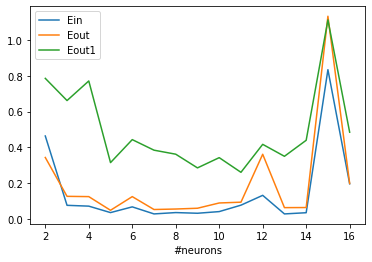

In [22]:
plt.plot(Neurons,Ein,label='Ein')
plt.plot(Neurons,Eout,label='Eout')
plt.plot(Neurons,Eout1,label='Eout1')
plt.xlabel('#neurons')
plt.legend()
plt.show()

Osserviamo che le tre loss function tendono a decrescere fino a circa $N=10$ e poi assumono un comportamento più imprevedibile. In particolare per $N=15$ osserviamo che il fit risulta molto peggiore che per valori di $N$ minori (e di conseguenza anche le predizioni) pertanto l'aumentare la complessità della rete non implica necessariamente un miglioramento delle prestazioni. 

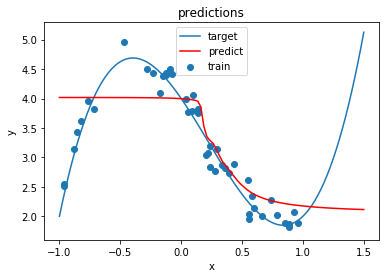

In [21]:
y_pred = model.predict(x)
plt.plot(x, y_target, label='target')
plt.scatter(x_train, y_train, label='train')
plt.plot(x, y_pred, label='predict', color = 'red')
plt.title("predictions")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.show()

### Osservazioni

- Generlamente aumentare la complessità della rete porta ed eseguire migliori fit, come si osserva per le geomtrie 1 e 2. Tuttavia ciò non è sempre vero come si osserva nei picchi di $E_{\text{in}}$  osservati per un grande numero di paramentri nelle geometrie 2 e 3. 
- L'andamento di $E_{\text{out}}$ in tutti i casi è simile a quello di $E_{\text{in}}$ quindi una rete che esegue un buon fit del training set dovrebbe essere in grado di eseguire buone previsioni limitandoci al range di $x$ usato per il training. In reltà mi aspetterei, per reti con un eccessivo numero di paramentri, un peggioramento delle previsoni dovuto a un overfit. Ciò non è stato osservato se non forse con la geometria 2. 
- Le predizioni peggiorano se si considera un range di $x$ più ampio di quello utilizzato per il training.


### Variazioni di optimizer, loss function e activation function

Ora considero una rete con la gemoetria 1 con un layer e 20 neuroni. Osservo come variano le curve di $E_{\text{in}}$ ed $E_{\text{out}}$
nel corso del training al variare dell'optimizer, della loss funcion e della funzione di attivazione.

In [118]:
Nt = 45    #training 
sigma = 0.2 #noise
Ne = 500    #training epochs
Nv = 30     #validation

# generate training inputs
np.random.seed(0)
x_train = np.random.uniform(-1, 1, Nt)
x_valid = np.random.uniform(-1, 1, Nv)
y_target = a0 + a1*x_train + a2*x_train**2 + a3*x_train**3 # ideal (target) linear function
y_train = np.random.normal(a0 + a1*x_train + a2*x_train**2 + a3*x_train**3, sigma) 
y_valid = np.random.normal(a0 + a1*x_valid + a2*x_valid**2 + a3*x_valid**3, sigma)

Neurons=20 #np.arange(1,21)
Nlayers = 1

model = Sequential() 
model.add(Dense(Neurons, input_shape=(1,),activation='selu')) 
model.add(Dense(1,activation='selu'))
Nparams = model.count_params()
#compile
model.compile(optimizer='sgd', loss='mse', metrics=['mse']) 
model.summary()
# fit
history = model.fit(x=x_train, y=y_train, 
          batch_size=32, epochs=Ne,
          shuffle=True, # a good idea is to shuffle input before at each epoch
          validation_data=(x_valid, y_valid))
#evaluate model on training dataset
score_t = model.evaluate(x_train, y_train, batch_size=32, verbose=1)
# evaluate model on validation dataset
score_v = model.evaluate(x_valid, y_valid, batch_size=32, verbose=1)



Model: "sequential_83"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_463 (Dense)            (None, 20)                40        
_________________________________________________________________
dense_464 (Dense)            (None, 1)                 21        
Total params: 61
Trainable params: 61
Non-trainable params: 0
_________________________________________________________________
Train on 45 samples, validate on 30 samples
Epoch 1/500
45/45 [==============================] - 3s 70ms/sample - loss: 10.5274 - mean_squared_error: 10.5274 - val_loss: 9.1097 - val_mean_squared_error: 9.1097
Epoch 2/500
45/45 [==============================] - 0s 1ms/sample - loss: 6.4184 - mean_squared_error: 6.4184 - val_loss: 6.5170 - val_mean_squared_error: 6.5170
Epoch 3/500
45/45 [==============================] - 0s 386us/sample - loss: 4.3939 - mean_squared_error: 4.3939 - val_loss: 4.8020 - val_mean_squ

45/45 [==============================] - 0s 509us/sample - loss: 0.4090 - mean_squared_error: 0.4090 - val_loss: 0.3102 - val_mean_squared_error: 0.3102
Epoch 96/500
45/45 [==============================] - 0s 781us/sample - loss: 0.4085 - mean_squared_error: 0.4085 - val_loss: 0.3065 - val_mean_squared_error: 0.3065
Epoch 97/500
45/45 [==============================] - 0s 589us/sample - loss: 0.4075 - mean_squared_error: 0.4075 - val_loss: 0.3038 - val_mean_squared_error: 0.3038
Epoch 98/500
45/45 [==============================] - 0s 445us/sample - loss: 0.4103 - mean_squared_error: 0.4103 - val_loss: 0.2884 - val_mean_squared_error: 0.2884
Epoch 99/500
45/45 [==============================] - 0s 449us/sample - loss: 0.4087 - mean_squared_error: 0.4087 - val_loss: 0.3049 - val_mean_squared_error: 0.3049
Epoch 100/500
45/45 [==============================] - 0s 592us/sample - loss: 0.4107 - mean_squared_error: 0.4107 - val_loss: 0.2880 - val_mean_squared_error: 0.2880
Epoch 101/500
45

45/45 [==============================] - 0s 530us/sample - loss: 0.3470 - mean_squared_error: 0.3470 - val_loss: 0.2738 - val_mean_squared_error: 0.2738
Epoch 194/500
45/45 [==============================] - 0s 479us/sample - loss: 0.3476 - mean_squared_error: 0.3476 - val_loss: 0.2866 - val_mean_squared_error: 0.2866
Epoch 195/500
45/45 [==============================] - 0s 466us/sample - loss: 0.3546 - mean_squared_error: 0.3546 - val_loss: 0.3166 - val_mean_squared_error: 0.3166
Epoch 196/500
45/45 [==============================] - 0s 611us/sample - loss: 0.3480 - mean_squared_error: 0.3480 - val_loss: 0.3045 - val_mean_squared_error: 0.3045
Epoch 197/500
45/45 [==============================] - 0s 490us/sample - loss: 0.3510 - mean_squared_error: 0.3510 - val_loss: 0.3259 - val_mean_squared_error: 0.3259
Epoch 198/500
45/45 [==============================] - 0s 497us/sample - loss: 0.3475 - mean_squared_error: 0.3475 - val_loss: 0.3033 - val_mean_squared_error: 0.3033
Epoch 199/50

45/45 [==============================] - 0s 1ms/sample - loss: 0.2939 - mean_squared_error: 0.2939 - val_loss: 0.2480 - val_mean_squared_error: 0.2480
Epoch 292/500
45/45 [==============================] - 0s 429us/sample - loss: 0.2936 - mean_squared_error: 0.2936 - val_loss: 0.2576 - val_mean_squared_error: 0.2576
Epoch 293/500
45/45 [==============================] - 0s 417us/sample - loss: 0.2925 - mean_squared_error: 0.2925 - val_loss: 0.2571 - val_mean_squared_error: 0.2571
Epoch 294/500
45/45 [==============================] - 0s 550us/sample - loss: 0.2937 - mean_squared_error: 0.2937 - val_loss: 0.2426 - val_mean_squared_error: 0.2426
Epoch 295/500
45/45 [==============================] - 0s 386us/sample - loss: 0.2952 - mean_squared_error: 0.2952 - val_loss: 0.2326 - val_mean_squared_error: 0.2326
Epoch 296/500
45/45 [==============================] - 0s 454us/sample - loss: 0.2929 - mean_squared_error: 0.2929 - val_loss: 0.2395 - val_mean_squared_error: 0.2395
Epoch 297/500


Epoch 389/500
45/45 [==============================] - 0s 363us/sample - loss: 0.2473 - mean_squared_error: 0.2473 - val_loss: 0.2414 - val_mean_squared_error: 0.2414
Epoch 390/500
45/45 [==============================] - 0s 302us/sample - loss: 0.2465 - mean_squared_error: 0.2465 - val_loss: 0.2455 - val_mean_squared_error: 0.2455
Epoch 391/500
45/45 [==============================] - 0s 417us/sample - loss: 0.2464 - mean_squared_error: 0.2464 - val_loss: 0.2307 - val_mean_squared_error: 0.2307
Epoch 392/500
45/45 [==============================] - 0s 579us/sample - loss: 0.2468 - mean_squared_error: 0.2468 - val_loss: 0.2184 - val_mean_squared_error: 0.2184
Epoch 393/500
45/45 [==============================] - 0s 447us/sample - loss: 0.2460 - mean_squared_error: 0.2460 - val_loss: 0.2203 - val_mean_squared_error: 0.2203
Epoch 394/500
45/45 [==============================] - 0s 508us/sample - loss: 0.2449 - mean_squared_error: 0.2449 - val_loss: 0.2268 - val_mean_squared_error: 0.226

45/45 [==============================] - 0s 568us/sample - loss: 0.2260 - mean_squared_error: 0.2260 - val_loss: 0.2265 - val_mean_squared_error: 0.2265
Epoch 439/500
45/45 [==============================] - 0s 519us/sample - loss: 0.2252 - mean_squared_error: 0.2252 - val_loss: 0.2127 - val_mean_squared_error: 0.2127
Epoch 440/500
45/45 [==============================] - 0s 573us/sample - loss: 0.2238 - mean_squared_error: 0.2238 - val_loss: 0.2086 - val_mean_squared_error: 0.2086
Epoch 441/500
45/45 [==============================] - 0s 442us/sample - loss: 0.2235 - mean_squared_error: 0.2235 - val_loss: 0.2156 - val_mean_squared_error: 0.2156
Epoch 442/500
45/45 [==============================] - 0s 425us/sample - loss: 0.2232 - mean_squared_error: 0.2232 - val_loss: 0.2127 - val_mean_squared_error: 0.2127
Epoch 443/500
45/45 [==============================] - 0s 524us/sample - loss: 0.2228 - mean_squared_error: 0.2228 - val_loss: 0.2059 - val_mean_squared_error: 0.2059
Epoch 444/50

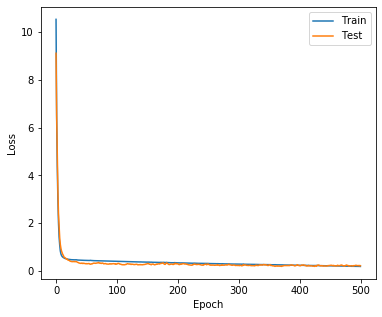

In [119]:
# look into training history
# Plot training & validation loss values
plt.figure(figsize=(6,5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='best')
plt.show()

Mantenendo la funzione di attivazione selu e la loss function mse ho fatto variare l'optimizer. La decrescita più rapida di $E_{\text{in}}$ ed $E_{\text{out}}$ si osserva con sgd. A seguire abbiamo gli optimizer adam, nadam, adamax per i quali le loss functions vanno a zero nell'arco circa 100 epoche. Risultano inadatti adagrad e adadelta con i quali le loss function decrescono più lentamente senza avvicinarci a zero nell'arco di 500 epoche. 

Mantenendo l'optimizer sdg e la funzione di attivazione selu faccio variare la loss function. $E_{\text{in}}$ ed $E_{\text{out}}$ calcolati con msle e logcosh hanno un andamento poco meno ripido di quello osservato con mse. Usando mae si osserva un andamento più lento.

Mantenendo sgd e mse faccio variare la funzione di attivazione. Per le funzioni di attivazione selu, elu, relu, sfotmax non si osservano sostanziali differenze. Le funzioni con plateau si rivelano inadatte infatti $E_{\text{in}}$ ed $E_{\text{out}}$ decrescono molto più lentamente raggiungendo rispettivamente valori di circa 6 e 8 dopo 500 epoche. 

Per concludere, l'ottimizzazione nella fase di traninig risulta più rapida ed efficace se si utilizzano sdg e mse, e funzioni di attivazioni senza plateau. 

## 11.3

In questo esercizio eseguo un fit della funzione:
$$
f(x,y) = \sin(x^2+y^2) \quad \text{con} \quad x \in [-3/2,3/2] \quad \text{e} \quad y \in [-3/2,3/2].
$$
Di seguito genero i training e validation set. 

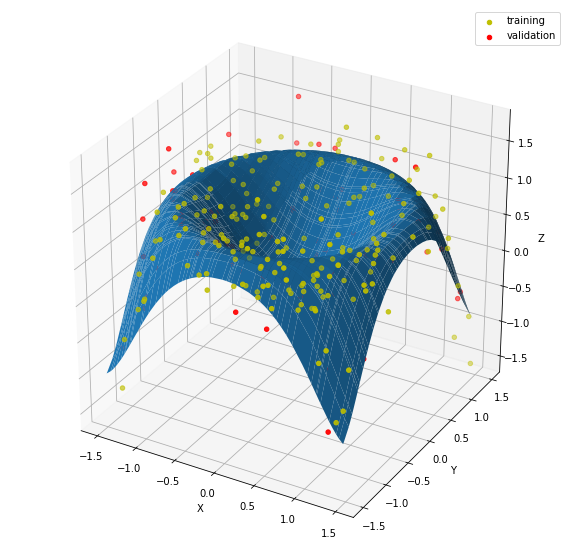

In [114]:
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import optimizers, models

from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras import backend as K
from tensorflow.keras.utils import get_custom_objects
from keras import optimizers, activations


Nt = 200 #training 
sigma = 0.3#noise
Ne = 1000 #training epochs
Nv = 100 #validation

def f(x,y):
   return np.sin(x**2+y**2)

# generate training inputs
np.random.seed(0)
x_train = np.random.uniform(-3./2, 3./2, Nt)
y_train = np.random.uniform(-3./2, 3./2, Nt)
z_train = np.random.normal( f(x_train, y_train), sigma)
#genero la matrice di input per il train della rete
xt = np.zeros((Nt,2))
xt[:,0] = x_train
xt[:,1] = y_train


x_valid = np.random.uniform(-3/2, 3/2, Nv) #anche fuori dal range del training
y_valid = np.random.uniform(-3/2,3/2,Nv)
z_valid = np.random.normal(f(x_valid,y_valid),sigma)
xv = np.zeros((Nv,2))
xv[:,0] = x_valid
xv[:,1] = y_valid

fig = plt.figure(figsize=(10,10))

ax = fig.gca(projection='3d')#fig.add_subplot(111, projection='3d')

ax.scatter(x_train, y_train, z_train, label="training", color="y")
ax.scatter(x_valid,y_valid, z_valid, label="validation", color="r")
ax.legend()

x_valid.sort()
y_valid.sort()
X, Y = np.meshgrid(x_valid, y_valid)
z_target = f(X,Y)

ax.plot_surface(X,Y, z_target)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()

Ora costruisco una rete con la geometria 4 e con 20 neuroni nel primo hidden layer. 

In [115]:
# CREATE NETWORK
#params = np.loadtxt("NNinput.dat", usecols=(0))
#Nlayers = int(params[0]) #1
Nneurons = 20

#Nneurons = 5
Nlayers = Nneurons -1

model = Sequential()
model.add(Dense(Nneurons, input_shape=(2,),activation='elu'))
for i in range(1,Nlayers):
   model.add(Dense(Nneurons-i,activation='elu'))

# add output layer
model.add(Dense(1,activation='elu'))

Nw = model.count_params()


#COMPILE
model.compile(optimizer='sgd', loss='mse', metrics=['mse']) 
model.summary()


#FIT
history = model.fit(x=xt, y=z_train, 
          batch_size=32, epochs=Ne,
          shuffle=True, # a good idea is to shuffle input before at each epoch
          validation_data=(xv, z_valid))




Model: "sequential_82"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_443 (Dense)            (None, 20)                60        
_________________________________________________________________
dense_444 (Dense)            (None, 19)                399       
_________________________________________________________________
dense_445 (Dense)            (None, 18)                360       
_________________________________________________________________
dense_446 (Dense)            (None, 17)                323       
_________________________________________________________________
dense_447 (Dense)            (None, 16)                288       
_________________________________________________________________
dense_448 (Dense)            (None, 15)                255       
_________________________________________________________________
dense_449 (Dense)            (None, 14)              

200/200 [==============================] - 0s 272us/sample - loss: 0.2796 - mean_squared_error: 0.2796 - val_loss: 0.2674 - val_mean_squared_error: 0.2674
Epoch 80/1000
200/200 [==============================] - 0s 313us/sample - loss: 0.2796 - mean_squared_error: 0.2796 - val_loss: 0.2676 - val_mean_squared_error: 0.2676
Epoch 81/1000
200/200 [==============================] - 0s 300us/sample - loss: 0.2798 - mean_squared_error: 0.2798 - val_loss: 0.2674 - val_mean_squared_error: 0.2674
Epoch 82/1000
200/200 [==============================] - 0s 308us/sample - loss: 0.2795 - mean_squared_error: 0.2795 - val_loss: 0.2673 - val_mean_squared_error: 0.2673
Epoch 83/1000
200/200 [==============================] - 0s 265us/sample - loss: 0.2797 - mean_squared_error: 0.2797 - val_loss: 0.2673 - val_mean_squared_error: 0.2673
Epoch 84/1000
200/200 [==============================] - 0s 303us/sample - loss: 0.2795 - mean_squared_error: 0.2795 - val_loss: 0.2672 - val_mean_squared_error: 0.2672


200/200 [==============================] - 0s 277us/sample - loss: 0.2767 - mean_squared_error: 0.2767 - val_loss: 0.2650 - val_mean_squared_error: 0.2650
Epoch 176/1000
200/200 [==============================] - 0s 297us/sample - loss: 0.2764 - mean_squared_error: 0.2764 - val_loss: 0.2650 - val_mean_squared_error: 0.2650
Epoch 177/1000
200/200 [==============================] - 0s 276us/sample - loss: 0.2766 - mean_squared_error: 0.2766 - val_loss: 0.2650 - val_mean_squared_error: 0.2650
Epoch 178/1000
200/200 [==============================] - 0s 297us/sample - loss: 0.2766 - mean_squared_error: 0.2766 - val_loss: 0.2649 - val_mean_squared_error: 0.2649
Epoch 179/1000
200/200 [==============================] - 0s 270us/sample - loss: 0.2768 - mean_squared_error: 0.2768 - val_loss: 0.2654 - val_mean_squared_error: 0.2654
Epoch 180/1000
200/200 [==============================] - 0s 304us/sample - loss: 0.2764 - mean_squared_error: 0.2764 - val_loss: 0.2652 - val_mean_squared_error: 0.

200/200 [==============================] - 0s 364us/sample - loss: 0.2658 - mean_squared_error: 0.2658 - val_loss: 0.2631 - val_mean_squared_error: 0.2631
Epoch 272/1000
200/200 [==============================] - 0s 499us/sample - loss: 0.2632 - mean_squared_error: 0.2632 - val_loss: 0.2641 - val_mean_squared_error: 0.2641
Epoch 273/1000
200/200 [==============================] - 0s 325us/sample - loss: 0.2642 - mean_squared_error: 0.2642 - val_loss: 0.2632 - val_mean_squared_error: 0.2632
Epoch 274/1000
200/200 [==============================] - 0s 299us/sample - loss: 0.2637 - mean_squared_error: 0.2637 - val_loss: 0.2663 - val_mean_squared_error: 0.2663
Epoch 275/1000
200/200 [==============================] - 0s 275us/sample - loss: 0.2640 - mean_squared_error: 0.2640 - val_loss: 0.2633 - val_mean_squared_error: 0.2633
Epoch 276/1000
200/200 [==============================] - 0s 280us/sample - loss: 0.2625 - mean_squared_error: 0.2625 - val_loss: 0.2637 - val_mean_squared_error: 0.

200/200 [==============================] - 0s 269us/sample - loss: 0.2510 - mean_squared_error: 0.2510 - val_loss: 0.2726 - val_mean_squared_error: 0.2726
Epoch 368/1000
200/200 [==============================] - 0s 315us/sample - loss: 0.2501 - mean_squared_error: 0.2501 - val_loss: 0.2720 - val_mean_squared_error: 0.2720
Epoch 369/1000
200/200 [==============================] - 0s 295us/sample - loss: 0.2498 - mean_squared_error: 0.2498 - val_loss: 0.3171 - val_mean_squared_error: 0.3171
Epoch 370/1000
200/200 [==============================] - 0s 269us/sample - loss: 0.2582 - mean_squared_error: 0.2582 - val_loss: 0.2751 - val_mean_squared_error: 0.2751
Epoch 371/1000
200/200 [==============================] - 0s 258us/sample - loss: 0.2527 - mean_squared_error: 0.2527 - val_loss: 0.2687 - val_mean_squared_error: 0.2687
Epoch 372/1000
200/200 [==============================] - 0s 262us/sample - loss: 0.2496 - mean_squared_error: 0.2496 - val_loss: 0.2664 - val_mean_squared_error: 0.

200/200 [==============================] - 0s 279us/sample - loss: 0.2349 - mean_squared_error: 0.2349 - val_loss: 0.2633 - val_mean_squared_error: 0.2633
Epoch 464/1000
200/200 [==============================] - 0s 229us/sample - loss: 0.2287 - mean_squared_error: 0.2287 - val_loss: 0.2612 - val_mean_squared_error: 0.2612
Epoch 465/1000
200/200 [==============================] - 0s 261us/sample - loss: 0.2359 - mean_squared_error: 0.2359 - val_loss: 0.2645 - val_mean_squared_error: 0.2645
Epoch 466/1000
200/200 [==============================] - 0s 320us/sample - loss: 0.2346 - mean_squared_error: 0.2346 - val_loss: 0.2929 - val_mean_squared_error: 0.2929
Epoch 467/1000
200/200 [==============================] - 0s 276us/sample - loss: 0.2380 - mean_squared_error: 0.2380 - val_loss: 0.2664 - val_mean_squared_error: 0.2664
Epoch 468/1000
200/200 [==============================] - 0s 200us/sample - loss: 0.2326 - mean_squared_error: 0.2326 - val_loss: 0.3047 - val_mean_squared_error: 0.

200/200 [==============================] - 0s 256us/sample - loss: 0.2041 - mean_squared_error: 0.2041 - val_loss: 0.2467 - val_mean_squared_error: 0.2467
Epoch 560/1000
200/200 [==============================] - 0s 270us/sample - loss: 0.2033 - mean_squared_error: 0.2033 - val_loss: 0.2652 - val_mean_squared_error: 0.2652
Epoch 561/1000
200/200 [==============================] - 0s 252us/sample - loss: 0.2069 - mean_squared_error: 0.2069 - val_loss: 0.2518 - val_mean_squared_error: 0.2518
Epoch 562/1000
200/200 [==============================] - 0s 257us/sample - loss: 0.2092 - mean_squared_error: 0.2092 - val_loss: 0.2635 - val_mean_squared_error: 0.2635
Epoch 563/1000
200/200 [==============================] - 0s 238us/sample - loss: 0.2332 - mean_squared_error: 0.2332 - val_loss: 0.2493 - val_mean_squared_error: 0.2493
Epoch 564/1000
200/200 [==============================] - 0s 278us/sample - loss: 0.2050 - mean_squared_error: 0.2050 - val_loss: 0.2445 - val_mean_squared_error: 0.

200/200 [==============================] - 0s 254us/sample - loss: 0.1941 - mean_squared_error: 0.1941 - val_loss: 0.2304 - val_mean_squared_error: 0.2304
Epoch 656/1000
200/200 [==============================] - 0s 233us/sample - loss: 0.1882 - mean_squared_error: 0.1882 - val_loss: 0.3004 - val_mean_squared_error: 0.3004
Epoch 657/1000
200/200 [==============================] - 0s 313us/sample - loss: 0.2063 - mean_squared_error: 0.2063 - val_loss: 0.2351 - val_mean_squared_error: 0.2351
Epoch 658/1000
200/200 [==============================] - 0s 268us/sample - loss: 0.1863 - mean_squared_error: 0.1863 - val_loss: 0.2422 - val_mean_squared_error: 0.2422
Epoch 659/1000
200/200 [==============================] - 0s 252us/sample - loss: 0.1905 - mean_squared_error: 0.1905 - val_loss: 0.2328 - val_mean_squared_error: 0.2328
Epoch 660/1000
200/200 [==============================] - 0s 234us/sample - loss: 0.1978 - mean_squared_error: 0.1978 - val_loss: 0.2695 - val_mean_squared_error: 0.

200/200 [==============================] - 0s 250us/sample - loss: 0.1711 - mean_squared_error: 0.1711 - val_loss: 0.2217 - val_mean_squared_error: 0.2217
Epoch 752/1000
200/200 [==============================] - 0s 234us/sample - loss: 0.1701 - mean_squared_error: 0.1701 - val_loss: 0.2224 - val_mean_squared_error: 0.2224
Epoch 753/1000
200/200 [==============================] - 0s 298us/sample - loss: 0.1697 - mean_squared_error: 0.1697 - val_loss: 0.2282 - val_mean_squared_error: 0.2282
Epoch 754/1000
200/200 [==============================] - 0s 239us/sample - loss: 0.1709 - mean_squared_error: 0.1709 - val_loss: 0.2292 - val_mean_squared_error: 0.2292
Epoch 755/1000
200/200 [==============================] - 0s 250us/sample - loss: 0.1664 - mean_squared_error: 0.1664 - val_loss: 0.2263 - val_mean_squared_error: 0.2263
Epoch 756/1000
200/200 [==============================] - 0s 261us/sample - loss: 0.1684 - mean_squared_error: 0.1684 - val_loss: 0.2339 - val_mean_squared_error: 0.

200/200 [==============================] - 0s 322us/sample - loss: 0.1368 - mean_squared_error: 0.1368 - val_loss: 0.2246 - val_mean_squared_error: 0.2246
Epoch 848/1000
200/200 [==============================] - 0s 320us/sample - loss: 0.1345 - mean_squared_error: 0.1345 - val_loss: 0.2285 - val_mean_squared_error: 0.2285
Epoch 849/1000
200/200 [==============================] - 0s 300us/sample - loss: 0.1443 - mean_squared_error: 0.1443 - val_loss: 0.2384 - val_mean_squared_error: 0.2384
Epoch 850/1000
200/200 [==============================] - 0s 307us/sample - loss: 0.1350 - mean_squared_error: 0.1350 - val_loss: 0.2088 - val_mean_squared_error: 0.2088
Epoch 851/1000
200/200 [==============================] - 0s 306us/sample - loss: 0.1352 - mean_squared_error: 0.1352 - val_loss: 0.2588 - val_mean_squared_error: 0.2588
Epoch 852/1000
200/200 [==============================] - 0s 275us/sample - loss: 0.1465 - mean_squared_error: 0.1465 - val_loss: 0.2378 - val_mean_squared_error: 0.

200/200 [==============================] - 0s 438us/sample - loss: 0.1255 - mean_squared_error: 0.1255 - val_loss: 0.2272 - val_mean_squared_error: 0.2272
Epoch 944/1000
200/200 [==============================] - 0s 396us/sample - loss: 0.1289 - mean_squared_error: 0.1289 - val_loss: 0.2112 - val_mean_squared_error: 0.2112
Epoch 945/1000
200/200 [==============================] - 0s 363us/sample - loss: 0.1287 - mean_squared_error: 0.1287 - val_loss: 0.2216 - val_mean_squared_error: 0.2216
Epoch 946/1000
200/200 [==============================] - 0s 366us/sample - loss: 0.1322 - mean_squared_error: 0.1322 - val_loss: 0.2121 - val_mean_squared_error: 0.2121
Epoch 947/1000
200/200 [==============================] - 0s 391us/sample - loss: 0.1272 - mean_squared_error: 0.1272 - val_loss: 0.2225 - val_mean_squared_error: 0.2225
Epoch 948/1000
200/200 [==============================] - 0s 404us/sample - loss: 0.1405 - mean_squared_error: 0.1405 - val_loss: 0.2405 - val_mean_squared_error: 0.

Ora valuto il modello.


In [116]:
score_t = model.evaluate(xt, z_train, batch_size=32, verbose=1)
score_v = model.evaluate(xv, z_valid, batch_size=32, verbose=1)
print("evaluation on training set: "+str(score_t[0]))
print("evaluation on validation set: "+str(score_v[0]))

100/100 [==============================] - 0s 161us/sample - loss: 0.1798 - mean_squared_error: 0.1798
evaluation on training set: 0.12237971752882004
evaluation on validation set: 0.17982839226722716


Infine rappresento le predizioni del modello sul training set:

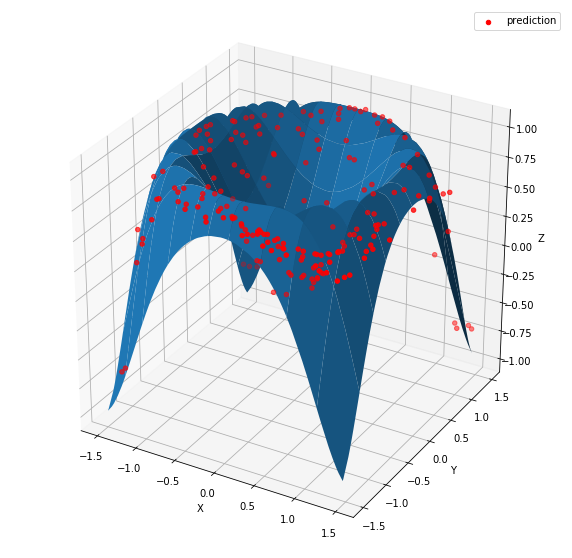

In [117]:
z_predicted = model.predict(xt)

fig = plt.figure(figsize=(10,10))
ax = fig.gca(projection='3d')

ax.scatter(x_train, y_train, z_predicted, label="prediction",color='r')
ax.legend()
ax.plot_surface(X,Y, z_target, rcount=10, ccount=10)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()